In [1]:
!pip install tf-levenberg-marquardt


[notice] A new release of pip is available: 25.0 -> 25.0.1
[notice] To update, run: pip install --upgrade pip


/tmp/ipykernel_24115/2881501840.py:2: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


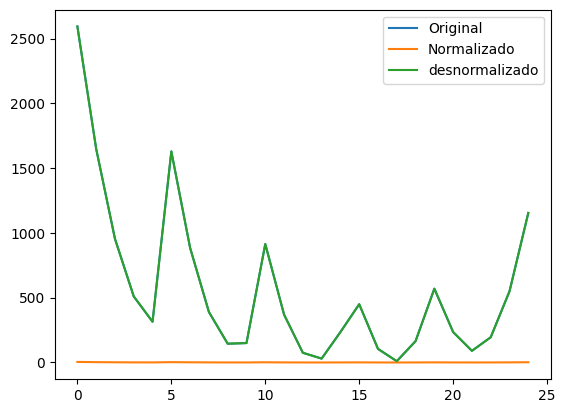

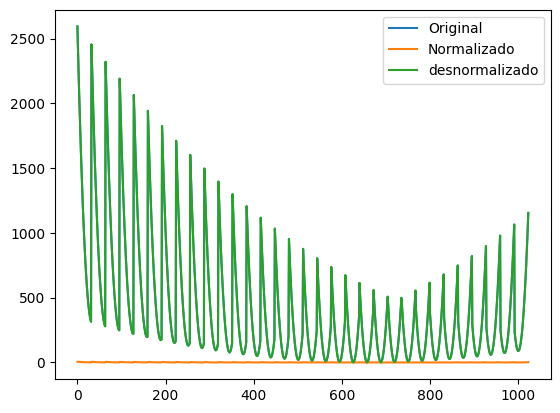

In [2]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

scaler = StandardScaler()
out_scaler = StandardScaler()

def function(grid):
    x = np.linspace(-10, 10, grid)
    y = np.linspace(-10, 10, grid)
    x, y = np.meshgrid(x, y)
    z = (x + 2 * y - 7)**2 + (2 * x + y - 5)**2
    return x, y, z

def create_dataframe(grid):
   x, y, z = function(grid)
   data = {'X': x.flatten(), 'Y': y.flatten(), 'Z': z.flatten()}
   df = pd.DataFrame(data)
   return df

def show_norm(df, label="function", plot=False):
    df_norm = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)
    df_denorm = pd.DataFrame(scaler.inverse_transform(df_norm), columns=df_norm.columns)

    if (plot):
        df.plot(title=f"{label}: Original data")
        df_norm.plot(title=f"{label}: Normalized data")
        df_denorm.plot(title=f"{label}: Denormalized data")
    return (df_norm)


def test_out_scaler(df):
    out = df["Z"].values.reshape(-1, 1)  
    plt.plot(out, label='Original')
    out_scaler.fit(out)
    norm = out_scaler.transform(out)
    plt.plot(norm, label='Normalizado')
    plt.plot(out_scaler.inverse_transform(norm), label='desnormalizado')
    plt.legend()
    plt.show()


df_25 = create_dataframe(grid=5)
df_25_norm = show_norm(df_25)
test_out_scaler(df_25)

df_1000 = create_dataframe(grid=32)
df_1000_norm = show_norm(df_1000)
test_out_scaler(df_1000)



In [3]:
def split_df(df):
    _input = np.vstack([df['X'], df['Y']]).T
    _output = np.array(df['Z'])
    return (_input, _output)

In [4]:
import tensorflow as tf
import numpy as np
from keras import regularizers
from keras import initializers
import tf_levenberg_marquardt as lm


# layers, neurons
class ShuffleArchitecture:
    def __init__(self, input_size, hidden_sizes, output_size, act_h, act_o, param_reg):
        self.input_size = input_size
        self.hidden_sizes = hidden_sizes
        self.output_size = output_size
        self.act_h = act_h
        self.act_o = act_o
        self.regularizer = regularizers.L2(param_reg)
        self.initializer = initializers.RandomUniform(minval=-0.5, maxval=0.5, seed=np.random.randint(1, 10000))

    def compute_k(self):
        total_parameters = 0
        for layer in self.model.layers:
            weights = layer.get_weights()
            if len(weights) > 0:  
                for w in weights:
                    total_parameters += np.prod(w.shape)
        return total_parameters
        
    def set_architecture(self):
        self.model = tf.keras.Sequential()
        self.model.add(tf.keras.layers.Dense(self.hidden_sizes[0],
                        input_shape=(self.input_size,),
                        activation=self.act_h,
                        kernel_regularizer=self.regularizer,
                        kernel_initializer=self.initializer,                        
                        ))  # input layer

        for size in self.hidden_sizes[1:]:  # hidden layers
            self.model.add(tf.keras.layers.Dense(size,
                            activation=self.act_h,
                            kernel_regularizer=self.regularizer,
                            kernel_initializer=self.initializer,  
                        ))

        self.model.add(tf.keras.layers.Dense(self.output_size,
                        activation=self.act_o,
                        kernel_regularizer=self.regularizer,
                        kernel_initializer=self.initializer,  
                        ))  # output layer

    def create_model(self, _learning_rate):
        self.model.compile(
            optimizer=tf.keras.optimizers.Adam(learning_rate=_learning_rate),
            loss=lm.loss.MeanSquaredError())

        self.lm_model = lm.model.ModelWrapper(
            tf.keras.models.clone_model(self.model))
  

        self.lm_model.compile(
            optimizer=tf.keras.optimizers.SGD(learning_rate=_learning_rate),
            loss=lm.loss.MeanSquaredError())
        return(self.lm_model)


2025-03-13 19:51:44.034750: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-03-13 19:51:45.366860: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-03-13 19:51:46.172018: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1741895507.116513   24115 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1741895507.340162   24115 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-03-13 19:51:49.455787: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU ins

In [5]:
from sklearn.model_selection import train_test_split
from keras.callbacks import EarlyStopping
from sklearn.metrics import r2_score, mean_squared_error, root_mean_squared_error, mean_absolute_percentage_error 

class TrainWithSmallDataset:
    def __init__(self, batch_size=1000):
        self.batch_size = batch_size
        self.betters = []
        self.k = 0

    def create_dataset(self, input, output):
      input = tf.expand_dims(tf.cast(input, tf.float32), axis=-1)
      output = tf.expand_dims(tf.cast(output, tf.float32), axis=-1)
      dataset = tf.data.Dataset.from_tensor_slices((input, output))
      dataset = dataset.shuffle(len(input))
      dataset = dataset.batch(self.batch_size).cache()
      dataset = dataset.prefetch(tf.data.experimental.AUTOTUNE)
      return (dataset, input, output)

    def split_dataset(self, input, output, sup_input, sup_output):
      input_train, input_vt, output_train, output_vt = train_test_split(input, output, test_size=0.3, shuffle = True)
      input_val, input_test, output_val, output_test = train_test_split(input_vt, output_vt, test_size=0.5, shuffle = True)

      self.train_dataset, self.train_input, self.train_output = self.create_dataset(input_train, output_train)
      self.val_dataset, self.val_input, self.val_output = self.create_dataset(input_val, output_val)
      self.test_dataset, self.test_input, self.test_output = self.create_dataset(input_test, output_test)
      self.vt_dataset, self.vt_input, self.vt_output = self.create_dataset(input_vt, output_vt)
      self.sup_dataset, self.sup_input, self.sup_output = self.create_dataset(sup_input, sup_output)
      self.dataset, self.input, self.output = self.create_dataset(input, output)

      self._data = (input, output)
      self._train = (input_train, output_train)
      self._vt = (input_vt, output_vt)
      self._val = (input_val, output_val)
      self._test = (input_test, output_test)
      self._sup = (sup_input, sup_output)

    def train_using_lm(self, train_dataset, epochs=1000):
      early_stopping_monitor = EarlyStopping(monitor='val_loss',
                                              patience=6,
                                              restore_best_weights=True)

      self.results = self.lm_model.fit(train_dataset,
                                            epochs=epochs,
                                            validation_data=self.val_dataset,
                                            callbacks=[early_stopping_monitor],
                                            verbose=0)
      print ("Stopped at epoch: ", early_stopping_monitor.stopped_epoch)
    
    def get_new_metrics(self, orig, pred, r2, mse):
      n = len(orig) # N: quantidade de saidas
      k = self.k
      waste = (orig.flatten() - pred.flatten())

      mape = mean_absolute_percentage_error(orig, pred)  
      r2_adj = 1 - (((n - 1)/(n - k - 1)) * (1 - r2))
      rsd = np.sqrt(np.sum(waste ** 2) / (n - 2))
      rmse = root_mean_squared_error(orig, pred)          
      aic = (-2 * np.log(mse)) + (2 * k)
      bic = (-2 * np.log(mse)) + (k * np.log(n))
      return (mape, r2_adj, rsd, rmse, aic, bic)
      

    def get_metrics(self):
          # Calculando a saida com os dados normalizados
          pred = self.lm_model.predict(self.input).flatten()
          test_pred = self.lm_model.predict(self.test_input).flatten()
          val_pred = self.lm_model.predict(self.val_input).flatten()
          vt_pred = self.lm_model.predict(self.vt_input).flatten()
          sup_pred = self.lm_model.predict(self.sup_input).flatten()

          # Calculando as metricas com a saida desnormalizada
          pred_denorm = out_scaler.inverse_transform(pred.reshape(-1, 1))
          test_pred_denorm = out_scaler.inverse_transform(test_pred.reshape(-1, 1))
          val_pred_denorm = out_scaler.inverse_transform(val_pred.reshape(-1, 1))
          vt_pred_denorm = out_scaler.inverse_transform(vt_pred.reshape(-1, 1))
          sup_pred_denorm = out_scaler.inverse_transform(sup_pred.reshape(-1, 1))

          out_denorm = out_scaler.inverse_transform(self._data[1].reshape(-1, 1))
          test_denorm = out_scaler.inverse_transform(self._test[1].reshape(-1, 1))
          val_denorm = out_scaler.inverse_transform(self._val[1].reshape(-1, 1))
          vt_denorm = out_scaler.inverse_transform(self._vt[1].reshape(-1, 1))    
          sup_denorm = out_scaler.inverse_transform(self._sup[1].reshape(-1, 1))

          r2 = r2_score(out_denorm, pred_denorm)
          r2_test = r2_score(test_denorm, test_pred_denorm)
          r2_val = r2_score(val_denorm, val_pred_denorm)
          r2_vt = r2_score(vt_denorm,  vt_pred_denorm)
          r2_sup = r2_score(sup_denorm,  sup_pred_denorm)

          mse = mean_squared_error(out_denorm, pred_denorm)
          mse_test = mean_squared_error(test_denorm, test_pred_denorm)
          mse_val = mean_squared_error(val_denorm, val_pred_denorm)
          mse_vt = mean_squared_error(vt_denorm,  vt_pred_denorm)
          mse_sup = mean_squared_error(sup_denorm,  sup_pred_denorm)
          
          mape, r2_adj, rsd, rmse, aic, bic = self.get_new_metrics(out_denorm, pred_denorm, r2, mse)
          metrics = {
                          'r2': r2,
                          'r2_sup': r2_sup,
                          'r2_test': r2_test,
                          'r2_val': r2_val,
                          'r2_vt': r2_vt,
                          'mse': mse,
                          'mse_sup': mse_sup,
                          'mse_test': mse_test,
                          'mse_val': mse_val,
                          'mse_vt': mse_vt,
                          'mape': mape,
                          'rmse': rmse,
                          'r2_adj': r2_adj,
                          'rsd': rsd,
                          'aic': aic,
                          'bic': bic
                          }

          return metrics

In [6]:
import pickle
from itertools import product

class Tester:
  def __init__(self, run_times=500, dataset_run_times=10):
    self.run_times = run_times
    self.better_metrics = {}
    self.dataset_run_times = dataset_run_times
    self.input_25, self.output_25 = split_df(df_25_norm)
    self.input_1000, self.output_1000 = split_df(df_1000_norm)
  
  def setArchitecure(self, trainer, _hidden_sizes, _pg, _lr):
    shuffler = ShuffleArchitecture(input_size=2,
                                    hidden_sizes=_hidden_sizes,
                                    output_size=1,
                                    act_h='tanh',
                                    act_o='linear',
                                    param_reg=_pg)
    shuffler.set_architecture()    
    trainer.lm_model = shuffler.create_model(_lr)
    trainer.k = shuffler.compute_k()

  def Train(self, trainer, epochs=1000):
    trainer.train_using_lm(trainer.train_dataset, epochs=epochs)
    return(trainer.get_metrics(), trainer.lm_model)

 
  def SaveModelWeights(self, model, fileName):
    if not fileName.endswith(".keras"):
        fileName += ".keras"
    path = f"content/models/{fileName}"
    open(path,'w').close()
    model.save(path)

  def SaveDataset(self, trainer, fileName):
    path = f"content/dataset/{fileName}.pkl" 
    with open(path, 'wb') as f:
      pickle.dump((trainer._data, trainer._train, trainer._vt, trainer._val, trainer._test), f)
      
  def LoopWeights(self, sort_by, boundarie, trainer, idx):
    better_model = 0
    save = False

    for i in range(self.run_times):
      print (f"+++++++++++ [{idx}] | {i + 1} ++++++++++++++++++")
      metrics, model = self.Train(trainer)
      if (metrics[sort_by] >= boundarie): # should be >= to acsending metrics
        fileName = f"model_{idx}_{better_model}"
        self.SaveModelWeights(model, fileName)
        self.better_metrics[fileName] = metrics
        better_model += 1
        save = True
    return(save)

  def Loop(self, sort_by, boundarie, hidden_sizes, regularizers, learning_rate):
    trainer = TrainWithSmallDataset()

    for count, (hidden_size, reg, lr) in enumerate(product(hidden_sizes, regularizers, learning_rate), start=1):
      header =  f"Hidden Size={hidden_size}, regularizer={reg}, learning_rate={lr}"
      print(f"Testando combinacao{count}: {header}")
      self.setArchitecure(trainer, hidden_size, reg, lr)
      for j in range(self.dataset_run_times):
        trainer.split_dataset(self.input_25, self.output_25, self.input_1000, self.output_1000)
        if (self.LoopWeights(sort_by, boundarie, trainer, f"{count}_{j}") == True):
          self.SaveDataset(trainer, f"dataset_{count}_{j}")
          self.DisplayBetterResults('mse_sup', header, f"{count}_{j}")
        self.better_metrics = {}

  def DisplayBetterResults(self, sort_by, header, dataset=0):
    df = pd.DataFrame.from_dict(self.better_metrics, orient='index')
    df = df.sort_values([sort_by])
    display(df)
    path = f'content/results/metrics_{dataset}'
    df.to_excel(f"{path}.xlsx", index=True)
    print(f"DataFrame salvo em {path}")
    with open(f"{path}.txt", 'w') as arquivo:
      arquivo.write(header)

In [7]:
import os
print(os.getcwd())

/workspaces/Ic-Rna-2024/fuction_ensemble_3/redes-ensemble-s/Teste02


# Treinando com 25 dados


In [8]:
tester = Tester(run_times=25, dataset_run_times=10)
tester.Loop(sort_by='r2',
            boundarie = 0.7, 
            hidden_sizes = [[2], [3], [15], [16], [17], [18], [19], [20], [21], [22]],
            regularizers=[0.2, 0.05],
            learning_rate=[0.01, 0.1])

Testando combinacao1: Hidden Size=[2], regularizer=0.2, learning_rate=0.01


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


+++++++++++ [1_0] | 1 ++++++++++++++++++
Stopped at epoch:  32
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [1_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [1_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [1_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_1_1_16,0.884494,0.901201,0.137549,0.610599,0.560590,25764.508530,22037.915314,59397.680512,4752.418168,32075.049340,1.338767,160.513266,0.815190,167.346648,-2.313506,8.656376
model_1_1_15,0.849464,0.867945,-0.030798,0.491153,0.471187,33578.077349,29455.808020,70991.863197,6210.200258,38601.031728,1.517905,183.243219,0.759143,191.044262,-2.843257,8.126625
model_1_1_14,0.839139,0.856586,0.018276,0.316555,0.479742,35881.316246,31989.532194,67612.096682,8341.072157,37976.584419,1.727235,189.423642,0.742622,197.487799,-2.975944,7.993938
model_1_1_13,0.836258,0.853149,0.045239,0.249094,0.486822,36523.808665,32756.104322,65755.156154,9164.393255,37459.774705,1.803750,191.112032,0.738013,199.248067,-3.011439,7.958443
model_1_1_12,0.833289,0.850324,0.030238,0.240028,0.478987,37186.108364,33386.322359,66788.279047,9275.044029,38031.661538,1.814273,192.836999,0.733262,201.046470,-3.047381,7.922501
model_1_1_11,0.830258,0.847439,0.014892,0.230871,0.470982,37862.109275,34029.774529,67845.187762,9386.791299,38615.989531,1.824829,194.581883,0.728413,202.865637,-3.083412,7.886470
model_1_1_10,0.800089,0.818625,-0.138187,0.141213,0.391273,44591.641987,40456.978246,78387.804996,10481.021771,44434.413384,1.925014,211.167332,0.680142,220.157162,-3.410603,7.559279
model_1_1_9,0.796380,0.815073,-0.157189,0.130478,0.381412,45418.835985,41249.324449,79696.487093,10612.034119,45154.260606,1.936780,213.116954,0.674209,222.189784,-3.447364,7.522518
model_1_1_8,0.784804,0.803968,-0.216512,0.097010,0.350628,48001.095228,43726.449512,83782.159981,11020.496924,47401.328453,1.972938,219.091522,0.655686,228.418702,-3.557958,7.411924
model_1_1_7,0.780779,0.800104,-0.237291,0.085589,0.339871,48898.872231,44588.321546,85213.232076,11159.883110,48186.557593,1.985104,221.130894,0.649246,230.544894,-3.595019,7.374863


DataFrame salvo em content/results/metrics_1_1
+++++++++++ [1_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [1_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [1_2] | 3 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [1_2] | 4 ++++++++++++++++++
Stopped at epoch:  16
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_1_2_24,0.967033,0.975567,0.445475,0.905665,0.831726,7353.608754,5450.003565,5965.425063,4035.883484,5000.654273,0.643098,85.753185,0.947252,89.403876,0.194107,11.163990
model_1_2_23,0.965214,0.974129,0.452084,0.903116,0.831087,7759.297580,5770.713470,5894.320443,4144.955897,5019.638170,0.662036,88.086875,0.944342,91.836916,0.086706,11.056588
model_1_2_22,0.964692,0.973746,0.451805,0.901679,0.830003,7875.616431,5856.071445,5897.321937,4206.416391,5051.869164,0.664106,88.744670,0.943508,92.522714,0.056947,11.026829
model_1_2_21,0.964269,0.973416,0.452945,0.900747,0.829538,7970.088310,5929.679653,5885.059497,4246.294622,5065.677059,0.667464,89.275351,0.942830,93.075988,0.033098,11.002981
model_1_2_20,0.963848,0.973085,0.454278,0.899883,0.829158,8063.882280,6003.609592,5870.718544,4283.235808,5076.977176,0.670969,89.799122,0.942157,93.622056,0.009699,10.979582
model_1_2_19,0.960892,0.970629,0.464357,0.896279,0.828388,8723.306064,6551.315046,5762.289320,4437.433280,5099.861300,0.703124,93.398641,0.937427,97.374814,-0.147507,10.822375
model_1_2_18,0.960576,0.970337,0.468075,0.896277,0.829059,8793.897276,6616.475646,5722.297229,4437.534227,5079.915728,0.709208,93.775782,0.936921,97.768011,-0.163627,10.806256
model_1_2_17,0.960060,0.969926,0.469461,0.895262,0.828580,8908.940749,6708.259087,5707.388174,4480.938449,5094.163311,0.712980,94.387185,0.936096,98.405443,-0.189621,10.780261
model_1_2_16,0.958559,0.968691,0.473441,0.892769,0.827505,9243.630311,6983.674436,5664.574555,4587.622369,5126.098462,0.726336,96.143800,0.933695,100.236841,-0.263380,10.706502
model_1_2_15,0.958015,0.968249,0.475041,0.891757,0.827066,9365.091257,7082.256777,5647.359520,4630.916734,5139.138127,0.730403,96.773402,0.932824,100.893246,-0.289489,10.680394


DataFrame salvo em content/results/metrics_1_2
+++++++++++ [1_3] | 1 ++++++++++++++++++
Stopped at epoch:  16
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [1_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [1_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [1_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_1_3_18,0.991393,0.989520,0.945639,0.893791,0.946260,1919.807618,2337.541657,5012.674545,2205.419668,3609.047107,0.881758,43.815609,0.986229,45.680930,2.880039,13.849922
model_1_3_24,0.991393,0.989519,0.945635,0.893778,0.946255,1919.900292,2337.797176,5013.035937,2205.683367,3609.359652,0.881798,43.816667,0.986228,45.682033,2.879943,13.849825
model_1_3_22,0.991393,0.989519,0.945635,0.893778,0.946255,1919.900292,2337.797176,5013.035937,2205.683367,3609.359652,0.881798,43.816667,0.986228,45.682033,2.879943,13.849825
model_1_3_21,0.991393,0.989519,0.945635,0.893778,0.946255,1919.900292,2337.797176,5013.035937,2205.683367,3609.359652,0.881798,43.816667,0.986228,45.682033,2.879943,13.849825
model_1_3_20,0.991393,0.989519,0.945635,0.893778,0.946255,1919.900292,2337.797176,5013.035937,2205.683367,3609.359652,0.881798,43.816667,0.986228,45.682033,2.879943,13.849825
model_1_3_19,0.991393,0.989519,0.945635,0.893778,0.946255,1919.900292,2337.797176,5013.035937,2205.683367,3609.359652,0.881798,43.816667,0.986228,45.682033,2.879943,13.849825
model_1_3_23,0.991393,0.989519,0.945635,0.893778,0.946255,1919.900292,2337.797176,5013.035937,2205.683367,3609.359652,0.881798,43.816667,0.986228,45.682033,2.879943,13.849825
model_1_3_14,0.989938,0.988436,0.970134,0.934593,0.969384,2244.295017,2579.354536,2754.004582,1358.163819,2056.084201,0.763254,47.373991,0.983902,49.390800,2.567707,13.537589
model_1_3_15,0.990044,0.988420,0.970707,0.934273,0.969728,2220.743880,2583.100200,2701.125000,1364.809420,2032.967210,0.764531,47.124769,0.984071,49.130968,2.588805,13.558687
model_1_3_16,0.990493,0.988365,0.972802,0.932844,0.970946,2120.517747,2595.316645,2507.928444,1394.482587,1951.205516,0.769918,46.049080,0.984789,48.009484,2.681169,13.651051


DataFrame salvo em content/results/metrics_1_3
+++++++++++ [1_4] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [1_4] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [1_4] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [1_4] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_1_4_0,0.991393,0.989519,0.971955,0.939927,0.955801,1919.900292,2337.797176,1399.220109,3366.330311,2382.77521,0.881798,43.816667,0.986228,45.682033,2.879943,13.849825
model_1_4_22,0.991393,0.989519,0.971955,0.939927,0.955801,1919.900292,2337.797176,1399.220109,3366.330311,2382.77521,0.881798,43.816667,0.986228,45.682033,2.879943,13.849825
model_1_4_21,0.991393,0.989519,0.971955,0.939927,0.955801,1919.900292,2337.797176,1399.220109,3366.330311,2382.77521,0.881798,43.816667,0.986228,45.682033,2.879943,13.849825
model_1_4_20,0.991393,0.989519,0.971955,0.939927,0.955801,1919.900292,2337.797176,1399.220109,3366.330311,2382.77521,0.881798,43.816667,0.986228,45.682033,2.879943,13.849825
model_1_4_19,0.991393,0.989519,0.971955,0.939927,0.955801,1919.900292,2337.797176,1399.220109,3366.330311,2382.77521,0.881798,43.816667,0.986228,45.682033,2.879943,13.849825
model_1_4_18,0.991393,0.989519,0.971955,0.939927,0.955801,1919.900292,2337.797176,1399.220109,3366.330311,2382.77521,0.881798,43.816667,0.986228,45.682033,2.879943,13.849825
model_1_4_17,0.991393,0.989519,0.971955,0.939927,0.955801,1919.900292,2337.797176,1399.220109,3366.330311,2382.77521,0.881798,43.816667,0.986228,45.682033,2.879943,13.849825
model_1_4_16,0.991393,0.989519,0.971955,0.939927,0.955801,1919.900292,2337.797176,1399.220109,3366.330311,2382.77521,0.881798,43.816667,0.986228,45.682033,2.879943,13.849825
model_1_4_15,0.991393,0.989519,0.971955,0.939927,0.955801,1919.900292,2337.797176,1399.220109,3366.330311,2382.77521,0.881798,43.816667,0.986228,45.682033,2.879943,13.849825
model_1_4_14,0.991393,0.989519,0.971955,0.939927,0.955801,1919.900292,2337.797176,1399.220109,3366.330311,2382.77521,0.881798,43.816667,0.986228,45.682033,2.879943,13.849825


DataFrame salvo em content/results/metrics_1_4
+++++++++++ [1_5] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [1_5] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [1_5] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [1_5] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_1_5_0,0.991393,0.989519,0.984052,0.649679,0.960122,1919.900292,2337.797176,926.922462,2847.187166,1887.054814,0.881798,43.816667,0.986228,45.682033,2.879943,13.849825
model_1_5_22,0.991393,0.989519,0.984052,0.649679,0.960122,1919.900292,2337.797176,926.922462,2847.187166,1887.054814,0.881798,43.816667,0.986228,45.682033,2.879943,13.849825
model_1_5_21,0.991393,0.989519,0.984052,0.649679,0.960122,1919.900292,2337.797176,926.922462,2847.187166,1887.054814,0.881798,43.816667,0.986228,45.682033,2.879943,13.849825
model_1_5_20,0.991393,0.989519,0.984052,0.649679,0.960122,1919.900292,2337.797176,926.922462,2847.187166,1887.054814,0.881798,43.816667,0.986228,45.682033,2.879943,13.849825
model_1_5_19,0.991393,0.989519,0.984052,0.649679,0.960122,1919.900292,2337.797176,926.922462,2847.187166,1887.054814,0.881798,43.816667,0.986228,45.682033,2.879943,13.849825
model_1_5_18,0.991393,0.989519,0.984052,0.649679,0.960122,1919.900292,2337.797176,926.922462,2847.187166,1887.054814,0.881798,43.816667,0.986228,45.682033,2.879943,13.849825
model_1_5_17,0.991393,0.989519,0.984052,0.649679,0.960122,1919.900292,2337.797176,926.922462,2847.187166,1887.054814,0.881798,43.816667,0.986228,45.682033,2.879943,13.849825
model_1_5_16,0.991393,0.989519,0.984052,0.649679,0.960122,1919.900292,2337.797176,926.922462,2847.187166,1887.054814,0.881798,43.816667,0.986228,45.682033,2.879943,13.849825
model_1_5_15,0.991393,0.989519,0.984052,0.649679,0.960122,1919.900292,2337.797176,926.922462,2847.187166,1887.054814,0.881798,43.816667,0.986228,45.682033,2.879943,13.849825
model_1_5_14,0.991393,0.989519,0.984052,0.649679,0.960122,1919.900292,2337.797176,926.922462,2847.187166,1887.054814,0.881798,43.816667,0.986228,45.682033,2.879943,13.849825


DataFrame salvo em content/results/metrics_1_5
+++++++++++ [1_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [1_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [1_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [1_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_1_6_0,0.991393,0.989519,0.994146,0.982042,0.990009,1919.900292,2337.797176,1412.290154,3029.563961,2220.927058,0.881798,43.816667,0.986228,45.682033,2.879943,13.849825
model_1_6_22,0.991393,0.989519,0.994146,0.982042,0.990009,1919.900292,2337.797176,1412.290154,3029.563961,2220.927058,0.881798,43.816667,0.986228,45.682033,2.879943,13.849825
model_1_6_21,0.991393,0.989519,0.994146,0.982042,0.990009,1919.900292,2337.797176,1412.290154,3029.563961,2220.927058,0.881798,43.816667,0.986228,45.682033,2.879943,13.849825
model_1_6_20,0.991393,0.989519,0.994146,0.982042,0.990009,1919.900292,2337.797176,1412.290154,3029.563961,2220.927058,0.881798,43.816667,0.986228,45.682033,2.879943,13.849825
model_1_6_19,0.991393,0.989519,0.994146,0.982042,0.990009,1919.900292,2337.797176,1412.290154,3029.563961,2220.927058,0.881798,43.816667,0.986228,45.682033,2.879943,13.849825
model_1_6_18,0.991393,0.989519,0.994146,0.982042,0.990009,1919.900292,2337.797176,1412.290154,3029.563961,2220.927058,0.881798,43.816667,0.986228,45.682033,2.879943,13.849825
model_1_6_17,0.991393,0.989519,0.994146,0.982042,0.990009,1919.900292,2337.797176,1412.290154,3029.563961,2220.927058,0.881798,43.816667,0.986228,45.682033,2.879943,13.849825
model_1_6_16,0.991393,0.989519,0.994146,0.982042,0.990009,1919.900292,2337.797176,1412.290154,3029.563961,2220.927058,0.881798,43.816667,0.986228,45.682033,2.879943,13.849825
model_1_6_15,0.991393,0.989519,0.994146,0.982042,0.990009,1919.900292,2337.797176,1412.290154,3029.563961,2220.927058,0.881798,43.816667,0.986228,45.682033,2.879943,13.849825
model_1_6_14,0.991393,0.989519,0.994146,0.982042,0.990009,1919.900292,2337.797176,1412.290154,3029.563961,2220.927058,0.881798,43.816667,0.986228,45.682033,2.879943,13.849825


DataFrame salvo em content/results/metrics_1_6
+++++++++++ [1_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [1_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [1_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [1_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_1_7_0,0.991393,0.989519,0.996052,0.996173,0.99613,1919.900292,2337.797176,2314.847151,906.39809,1610.62262,0.881798,43.816667,0.986228,45.682033,2.879943,13.849825
model_1_7_22,0.991393,0.989519,0.996052,0.996173,0.99613,1919.900292,2337.797176,2314.847151,906.39809,1610.62262,0.881798,43.816667,0.986228,45.682033,2.879943,13.849825
model_1_7_21,0.991393,0.989519,0.996052,0.996173,0.99613,1919.900292,2337.797176,2314.847151,906.39809,1610.62262,0.881798,43.816667,0.986228,45.682033,2.879943,13.849825
model_1_7_20,0.991393,0.989519,0.996052,0.996173,0.99613,1919.900292,2337.797176,2314.847151,906.39809,1610.62262,0.881798,43.816667,0.986228,45.682033,2.879943,13.849825
model_1_7_19,0.991393,0.989519,0.996052,0.996173,0.99613,1919.900292,2337.797176,2314.847151,906.39809,1610.62262,0.881798,43.816667,0.986228,45.682033,2.879943,13.849825
model_1_7_18,0.991393,0.989519,0.996052,0.996173,0.99613,1919.900292,2337.797176,2314.847151,906.39809,1610.62262,0.881798,43.816667,0.986228,45.682033,2.879943,13.849825
model_1_7_17,0.991393,0.989519,0.996052,0.996173,0.99613,1919.900292,2337.797176,2314.847151,906.39809,1610.62262,0.881798,43.816667,0.986228,45.682033,2.879943,13.849825
model_1_7_16,0.991393,0.989519,0.996052,0.996173,0.99613,1919.900292,2337.797176,2314.847151,906.39809,1610.62262,0.881798,43.816667,0.986228,45.682033,2.879943,13.849825
model_1_7_15,0.991393,0.989519,0.996052,0.996173,0.99613,1919.900292,2337.797176,2314.847151,906.39809,1610.62262,0.881798,43.816667,0.986228,45.682033,2.879943,13.849825
model_1_7_14,0.991393,0.989519,0.996052,0.996173,0.99613,1919.900292,2337.797176,2314.847151,906.39809,1610.62262,0.881798,43.816667,0.986228,45.682033,2.879943,13.849825


DataFrame salvo em content/results/metrics_1_7
+++++++++++ [1_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [1_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [1_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [1_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_1_8_0,0.991393,0.989519,0.966398,0.96138,0.965546,1919.900292,2337.797176,2623.052167,1758.530291,2190.791229,0.881798,43.816667,0.986228,45.682033,2.879943,13.849825
model_1_8_22,0.991393,0.989519,0.966398,0.96138,0.965546,1919.900292,2337.797176,2623.052167,1758.530291,2190.791229,0.881798,43.816667,0.986228,45.682033,2.879943,13.849825
model_1_8_21,0.991393,0.989519,0.966398,0.96138,0.965546,1919.900292,2337.797176,2623.052167,1758.530291,2190.791229,0.881798,43.816667,0.986228,45.682033,2.879943,13.849825
model_1_8_20,0.991393,0.989519,0.966398,0.96138,0.965546,1919.900292,2337.797176,2623.052167,1758.530291,2190.791229,0.881798,43.816667,0.986228,45.682033,2.879943,13.849825
model_1_8_19,0.991393,0.989519,0.966398,0.96138,0.965546,1919.900292,2337.797176,2623.052167,1758.530291,2190.791229,0.881798,43.816667,0.986228,45.682033,2.879943,13.849825
model_1_8_18,0.991393,0.989519,0.966398,0.96138,0.965546,1919.900292,2337.797176,2623.052167,1758.530291,2190.791229,0.881798,43.816667,0.986228,45.682033,2.879943,13.849825
model_1_8_17,0.991393,0.989519,0.966398,0.96138,0.965546,1919.900292,2337.797176,2623.052167,1758.530291,2190.791229,0.881798,43.816667,0.986228,45.682033,2.879943,13.849825
model_1_8_16,0.991393,0.989519,0.966398,0.96138,0.965546,1919.900292,2337.797176,2623.052167,1758.530291,2190.791229,0.881798,43.816667,0.986228,45.682033,2.879943,13.849825
model_1_8_15,0.991393,0.989519,0.966398,0.96138,0.965546,1919.900292,2337.797176,2623.052167,1758.530291,2190.791229,0.881798,43.816667,0.986228,45.682033,2.879943,13.849825
model_1_8_14,0.991393,0.989519,0.966398,0.96138,0.965546,1919.900292,2337.797176,2623.052167,1758.530291,2190.791229,0.881798,43.816667,0.986228,45.682033,2.879943,13.849825


DataFrame salvo em content/results/metrics_1_8
+++++++++++ [1_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [1_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [1_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [1_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_1_9_0,0.991393,0.989519,0.97697,0.993238,0.993992,1919.900292,2337.797176,1422.771239,1142.427752,1282.599496,0.881798,43.816667,0.986228,45.682033,2.879943,13.849825
model_1_9_22,0.991393,0.989519,0.97697,0.993238,0.993992,1919.900292,2337.797176,1422.771239,1142.427752,1282.599496,0.881798,43.816667,0.986228,45.682033,2.879943,13.849825
model_1_9_21,0.991393,0.989519,0.97697,0.993238,0.993992,1919.900292,2337.797176,1422.771239,1142.427752,1282.599496,0.881798,43.816667,0.986228,45.682033,2.879943,13.849825
model_1_9_20,0.991393,0.989519,0.97697,0.993238,0.993992,1919.900292,2337.797176,1422.771239,1142.427752,1282.599496,0.881798,43.816667,0.986228,45.682033,2.879943,13.849825
model_1_9_19,0.991393,0.989519,0.97697,0.993238,0.993992,1919.900292,2337.797176,1422.771239,1142.427752,1282.599496,0.881798,43.816667,0.986228,45.682033,2.879943,13.849825
model_1_9_18,0.991393,0.989519,0.97697,0.993238,0.993992,1919.900292,2337.797176,1422.771239,1142.427752,1282.599496,0.881798,43.816667,0.986228,45.682033,2.879943,13.849825
model_1_9_17,0.991393,0.989519,0.97697,0.993238,0.993992,1919.900292,2337.797176,1422.771239,1142.427752,1282.599496,0.881798,43.816667,0.986228,45.682033,2.879943,13.849825
model_1_9_16,0.991393,0.989519,0.97697,0.993238,0.993992,1919.900292,2337.797176,1422.771239,1142.427752,1282.599496,0.881798,43.816667,0.986228,45.682033,2.879943,13.849825
model_1_9_15,0.991393,0.989519,0.97697,0.993238,0.993992,1919.900292,2337.797176,1422.771239,1142.427752,1282.599496,0.881798,43.816667,0.986228,45.682033,2.879943,13.849825
model_1_9_14,0.991393,0.989519,0.97697,0.993238,0.993992,1919.900292,2337.797176,1422.771239,1142.427752,1282.599496,0.881798,43.816667,0.986228,45.682033,2.879943,13.849825


DataFrame salvo em content/results/metrics_1_9
Testando combinacao2: Hidden Size=[2], regularizer=0.2, learning_rate=0.1
+++++++++++ [2_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  18
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [2_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [2_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [2_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [2_0] | 5 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_2_0_8,0.983792,0.977507,0.722988,0.982294,0.977010,3615.338870,5017.118841,7351.323973,10502.287879,8926.805926,0.478865,60.127688,0.974067,62.687448,1.614118,12.584001
model_2_0_7,0.982507,0.977363,0.761093,0.979389,0.976094,3901.979682,5049.239216,6340.096554,12225.445019,9282.770787,0.440422,62.465828,0.972011,65.125128,1.461521,12.431404
model_2_0_9,0.983709,0.976747,0.694620,0.982920,0.976519,3633.777305,5186.844608,8104.158064,10131.142699,9117.650381,0.506125,60.280820,0.973935,62.847100,1.603944,12.573826
model_2_0_10,0.983389,0.976049,0.674866,0.982902,0.975830,3705.169284,5342.385348,8628.369054,10141.483655,9384.926354,0.524733,60.870102,0.973423,63.461468,1.565032,12.534914
model_2_0_11,0.983106,0.975568,0.661831,0.982755,0.975272,3768.254843,5449.822974,8974.310344,10228.899112,9601.604728,0.536931,61.386113,0.972970,63.999447,1.531265,12.501148
model_2_0_24,0.983139,0.975412,0.639379,0.983655,0.975192,3761.037406,5484.531508,9570.129439,9695.265592,9632.697515,0.555139,61.327297,0.973022,63.938127,1.535100,12.504982
model_2_0_23,0.983087,0.975347,0.638612,0.983571,0.975102,3772.517330,5498.969094,9590.475529,9744.814815,9667.645172,0.555506,61.420822,0.972940,64.035633,1.529004,12.498887
model_2_0_22,0.983045,0.975296,0.638097,0.983497,0.975028,3782.012948,5510.457140,9604.140174,9788.710150,9696.425162,0.555771,61.498073,0.972871,64.116173,1.523977,12.493859
model_2_0_21,0.982984,0.975217,0.637296,0.983395,0.974923,3795.600788,5528.014000,9625.405456,9849.520719,9737.463087,0.556300,61.608447,0.972774,64.231247,1.516804,12.486686
model_2_0_20,0.982927,0.975145,0.636669,0.983294,0.974825,3808.224421,5544.181062,9642.044169,9908.962947,9775.503558,0.556630,61.710813,0.972683,64.337970,1.510163,12.480046


DataFrame salvo em content/results/metrics_2_0
+++++++++++ [2_1] | 1 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [2_1] | 2 ++++++++++++++++++
Stopped at epoch:  10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [2_1] | 3 ++++++++++++++++++
Stopped at epoch:  10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [2_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_2_1_1,0.989431,0.989877,0.986553,0.973136,0.976969,2357.522035,2257.950489,837.305556,6336.277988,3586.791772,0.435418,48.554320,0.983089,50.621378,2.469267,13.439150
model_2_1_2,0.991528,0.989819,0.985467,0.979188,0.981334,1889.795740,2270.934388,904.946106,4908.979579,2906.962842,0.567481,43.471781,0.986444,45.322465,2.911552,13.881434
model_2_1_3,0.991639,0.989597,0.985962,0.979459,0.981639,1864.930076,2320.376359,874.097554,4844.954337,2859.525945,0.568808,43.184836,0.986623,45.023304,2.938042,13.907925
model_2_1_4,0.992043,0.988405,0.987825,0.980890,0.983095,1774.857741,2586.244811,758.108480,4507.451266,2632.779873,0.572815,42.129061,0.987269,43.922582,3.037049,14.006931
model_2_1_9,0.992541,0.988042,0.985867,0.982775,0.984131,1663.853375,2667.237008,880.038291,4062.795994,2471.417142,0.610211,40.790359,0.988065,42.526889,3.166217,14.136099
model_2_1_6,0.992471,0.988042,0.986491,0.982470,0.984025,1679.409302,2667.345897,841.149507,4134.803849,2487.976678,0.600721,40.980597,0.987954,42.725225,3.147605,14.117488
model_2_1_7,0.992499,0.988013,0.986270,0.982588,0.984070,1673.189981,2673.887922,854.916581,4106.912154,2480.914367,0.604570,40.904645,0.987998,42.646040,3.155025,14.124908
model_2_1_8,0.992537,0.987985,0.985958,0.982763,0.984140,1664.727189,2680.086957,874.348448,4065.723626,2470.036037,0.609918,40.801068,0.988059,42.538054,3.165167,14.135049
model_2_1_5,0.992328,0.987828,0.987423,0.982003,0.983857,1711.308748,2715.095767,783.154562,4244.955931,2514.055246,0.586117,41.367968,0.987725,43.129088,3.109973,14.079855
model_2_1_13,0.992734,0.987636,0.983129,0.984062,0.984558,1620.763969,2757.927042,1050.523885,3759.152642,2404.838263,0.656543,40.258713,0.988374,41.972610,3.218694,14.188577


DataFrame salvo em content/results/metrics_2_1
+++++++++++ [2_2] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [2_2] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [2_2] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [2_2] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_2_2_0,0.992744,0.98747,0.938414,0.968776,0.965615,1618.538125,2794.990826,1420.73344,2134.765662,1777.749551,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325
model_2_2_22,0.992744,0.98747,0.938414,0.968776,0.965615,1618.538125,2794.990826,1420.73344,2134.765662,1777.749551,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325
model_2_2_21,0.992744,0.98747,0.938414,0.968776,0.965615,1618.538125,2794.990826,1420.73344,2134.765662,1777.749551,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325
model_2_2_20,0.992744,0.98747,0.938414,0.968776,0.965615,1618.538125,2794.990826,1420.73344,2134.765662,1777.749551,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325
model_2_2_19,0.992744,0.98747,0.938414,0.968776,0.965615,1618.538125,2794.990826,1420.73344,2134.765662,1777.749551,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325
model_2_2_18,0.992744,0.98747,0.938414,0.968776,0.965615,1618.538125,2794.990826,1420.73344,2134.765662,1777.749551,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325
model_2_2_17,0.992744,0.98747,0.938414,0.968776,0.965615,1618.538125,2794.990826,1420.73344,2134.765662,1777.749551,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325
model_2_2_16,0.992744,0.98747,0.938414,0.968776,0.965615,1618.538125,2794.990826,1420.73344,2134.765662,1777.749551,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325
model_2_2_15,0.992744,0.98747,0.938414,0.968776,0.965615,1618.538125,2794.990826,1420.73344,2134.765662,1777.749551,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325
model_2_2_14,0.992744,0.98747,0.938414,0.968776,0.965615,1618.538125,2794.990826,1420.73344,2134.765662,1777.749551,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325


DataFrame salvo em content/results/metrics_2_2
+++++++++++ [2_3] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [2_3] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [2_3] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [2_3] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_2_3_0,0.992744,0.98747,0.996067,0.994157,0.995146,1618.538125,2794.990826,806.45664,1216.974334,1011.715487,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325
model_2_3_22,0.992744,0.98747,0.996067,0.994157,0.995146,1618.538125,2794.990826,806.45664,1216.974334,1011.715487,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325
model_2_3_21,0.992744,0.98747,0.996067,0.994157,0.995146,1618.538125,2794.990826,806.45664,1216.974334,1011.715487,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325
model_2_3_20,0.992744,0.98747,0.996067,0.994157,0.995146,1618.538125,2794.990826,806.45664,1216.974334,1011.715487,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325
model_2_3_19,0.992744,0.98747,0.996067,0.994157,0.995146,1618.538125,2794.990826,806.45664,1216.974334,1011.715487,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325
model_2_3_18,0.992744,0.98747,0.996067,0.994157,0.995146,1618.538125,2794.990826,806.45664,1216.974334,1011.715487,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325
model_2_3_17,0.992744,0.98747,0.996067,0.994157,0.995146,1618.538125,2794.990826,806.45664,1216.974334,1011.715487,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325
model_2_3_16,0.992744,0.98747,0.996067,0.994157,0.995146,1618.538125,2794.990826,806.45664,1216.974334,1011.715487,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325
model_2_3_15,0.992744,0.98747,0.996067,0.994157,0.995146,1618.538125,2794.990826,806.45664,1216.974334,1011.715487,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325
model_2_3_14,0.992744,0.98747,0.996067,0.994157,0.995146,1618.538125,2794.990826,806.45664,1216.974334,1011.715487,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325


DataFrame salvo em content/results/metrics_2_3
+++++++++++ [2_4] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [2_4] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [2_4] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [2_4] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_2_4_0,0.992744,0.98747,0.991125,0.921124,0.984301,1618.538125,2794.990826,1326.523959,1687.72343,1507.123694,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325
model_2_4_22,0.992744,0.98747,0.991125,0.921124,0.984301,1618.538125,2794.990826,1326.523959,1687.72343,1507.123694,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325
model_2_4_21,0.992744,0.98747,0.991125,0.921124,0.984301,1618.538125,2794.990826,1326.523959,1687.72343,1507.123694,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325
model_2_4_20,0.992744,0.98747,0.991125,0.921124,0.984301,1618.538125,2794.990826,1326.523959,1687.72343,1507.123694,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325
model_2_4_19,0.992744,0.98747,0.991125,0.921124,0.984301,1618.538125,2794.990826,1326.523959,1687.72343,1507.123694,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325
model_2_4_18,0.992744,0.98747,0.991125,0.921124,0.984301,1618.538125,2794.990826,1326.523959,1687.72343,1507.123694,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325
model_2_4_17,0.992744,0.98747,0.991125,0.921124,0.984301,1618.538125,2794.990826,1326.523959,1687.72343,1507.123694,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325
model_2_4_16,0.992744,0.98747,0.991125,0.921124,0.984301,1618.538125,2794.990826,1326.523959,1687.72343,1507.123694,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325
model_2_4_15,0.992744,0.98747,0.991125,0.921124,0.984301,1618.538125,2794.990826,1326.523959,1687.72343,1507.123694,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325
model_2_4_14,0.992744,0.98747,0.991125,0.921124,0.984301,1618.538125,2794.990826,1326.523959,1687.72343,1507.123694,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325


DataFrame salvo em content/results/metrics_2_4
+++++++++++ [2_5] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [2_5] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [2_5] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [2_5] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_2_5_0,0.992744,0.98747,0.440585,0.986104,0.960081,1618.538125,2794.990826,2356.698183,1014.9349,1685.816542,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325
model_2_5_22,0.992744,0.98747,0.440585,0.986104,0.960081,1618.538125,2794.990826,2356.698183,1014.9349,1685.816542,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325
model_2_5_21,0.992744,0.98747,0.440585,0.986104,0.960081,1618.538125,2794.990826,2356.698183,1014.9349,1685.816542,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325
model_2_5_20,0.992744,0.98747,0.440585,0.986104,0.960081,1618.538125,2794.990826,2356.698183,1014.9349,1685.816542,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325
model_2_5_19,0.992744,0.98747,0.440585,0.986104,0.960081,1618.538125,2794.990826,2356.698183,1014.9349,1685.816542,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325
model_2_5_18,0.992744,0.98747,0.440585,0.986104,0.960081,1618.538125,2794.990826,2356.698183,1014.9349,1685.816542,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325
model_2_5_17,0.992744,0.98747,0.440585,0.986104,0.960081,1618.538125,2794.990826,2356.698183,1014.9349,1685.816542,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325
model_2_5_16,0.992744,0.98747,0.440585,0.986104,0.960081,1618.538125,2794.990826,2356.698183,1014.9349,1685.816542,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325
model_2_5_15,0.992744,0.98747,0.440585,0.986104,0.960081,1618.538125,2794.990826,2356.698183,1014.9349,1685.816542,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325
model_2_5_14,0.992744,0.98747,0.440585,0.986104,0.960081,1618.538125,2794.990826,2356.698183,1014.9349,1685.816542,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325


DataFrame salvo em content/results/metrics_2_5
+++++++++++ [2_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [2_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [2_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [2_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_2_6_0,0.992744,0.98747,0.994798,0.994692,0.995397,1618.538125,2794.990826,982.433659,147.624017,565.028838,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325
model_2_6_22,0.992744,0.98747,0.994798,0.994692,0.995397,1618.538125,2794.990826,982.433659,147.624017,565.028838,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325
model_2_6_21,0.992744,0.98747,0.994798,0.994692,0.995397,1618.538125,2794.990826,982.433659,147.624017,565.028838,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325
model_2_6_20,0.992744,0.98747,0.994798,0.994692,0.995397,1618.538125,2794.990826,982.433659,147.624017,565.028838,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325
model_2_6_19,0.992744,0.98747,0.994798,0.994692,0.995397,1618.538125,2794.990826,982.433659,147.624017,565.028838,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325
model_2_6_18,0.992744,0.98747,0.994798,0.994692,0.995397,1618.538125,2794.990826,982.433659,147.624017,565.028838,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325
model_2_6_17,0.992744,0.98747,0.994798,0.994692,0.995397,1618.538125,2794.990826,982.433659,147.624017,565.028838,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325
model_2_6_16,0.992744,0.98747,0.994798,0.994692,0.995397,1618.538125,2794.990826,982.433659,147.624017,565.028838,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325
model_2_6_15,0.992744,0.98747,0.994798,0.994692,0.995397,1618.538125,2794.990826,982.433659,147.624017,565.028838,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325
model_2_6_14,0.992744,0.98747,0.994798,0.994692,0.995397,1618.538125,2794.990826,982.433659,147.624017,565.028838,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325


DataFrame salvo em content/results/metrics_2_6
+++++++++++ [2_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [2_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
+++++++++++ [2_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [2_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_2_7_0,0.992744,0.98747,0.995167,0.993362,0.994346,1618.538125,2794.990826,1250.496048,1501.959309,1376.227679,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325
model_2_7_22,0.992744,0.98747,0.995167,0.993362,0.994346,1618.538125,2794.990826,1250.496048,1501.959309,1376.227679,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325
model_2_7_21,0.992744,0.98747,0.995167,0.993362,0.994346,1618.538125,2794.990826,1250.496048,1501.959309,1376.227679,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325
model_2_7_20,0.992744,0.98747,0.995167,0.993362,0.994346,1618.538125,2794.990826,1250.496048,1501.959309,1376.227679,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325
model_2_7_19,0.992744,0.98747,0.995167,0.993362,0.994346,1618.538125,2794.990826,1250.496048,1501.959309,1376.227679,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325
model_2_7_18,0.992744,0.98747,0.995167,0.993362,0.994346,1618.538125,2794.990826,1250.496048,1501.959309,1376.227679,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325
model_2_7_17,0.992744,0.98747,0.995167,0.993362,0.994346,1618.538125,2794.990826,1250.496048,1501.959309,1376.227679,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325
model_2_7_16,0.992744,0.98747,0.995167,0.993362,0.994346,1618.538125,2794.990826,1250.496048,1501.959309,1376.227679,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325
model_2_7_15,0.992744,0.98747,0.995167,0.993362,0.994346,1618.538125,2794.990826,1250.496048,1501.959309,1376.227679,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325
model_2_7_14,0.992744,0.98747,0.995167,0.993362,0.994346,1618.538125,2794.990826,1250.496048,1501.959309,1376.227679,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325


DataFrame salvo em content/results/metrics_2_7
+++++++++++ [2_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [2_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [2_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [2_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_2_8_0,0.992744,0.98747,0.042845,0.988127,0.955438,1618.538125,2794.990826,5368.436877,1357.860648,3363.148763,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325
model_2_8_22,0.992744,0.98747,0.042845,0.988127,0.955438,1618.538125,2794.990826,5368.436877,1357.860648,3363.148763,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325
model_2_8_21,0.992744,0.98747,0.042845,0.988127,0.955438,1618.538125,2794.990826,5368.436877,1357.860648,3363.148763,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325
model_2_8_20,0.992744,0.98747,0.042845,0.988127,0.955438,1618.538125,2794.990826,5368.436877,1357.860648,3363.148763,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325
model_2_8_19,0.992744,0.98747,0.042845,0.988127,0.955438,1618.538125,2794.990826,5368.436877,1357.860648,3363.148763,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325
model_2_8_18,0.992744,0.98747,0.042845,0.988127,0.955438,1618.538125,2794.990826,5368.436877,1357.860648,3363.148763,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325
model_2_8_17,0.992744,0.98747,0.042845,0.988127,0.955438,1618.538125,2794.990826,5368.436877,1357.860648,3363.148763,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325
model_2_8_16,0.992744,0.98747,0.042845,0.988127,0.955438,1618.538125,2794.990826,5368.436877,1357.860648,3363.148763,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325
model_2_8_15,0.992744,0.98747,0.042845,0.988127,0.955438,1618.538125,2794.990826,5368.436877,1357.860648,3363.148763,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325
model_2_8_14,0.992744,0.98747,0.042845,0.988127,0.955438,1618.538125,2794.990826,5368.436877,1357.860648,3363.148763,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325


DataFrame salvo em content/results/metrics_2_8
+++++++++++ [2_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [2_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [2_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [2_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_2_9_0,0.992744,0.98747,0.998951,0.984923,0.997722,1618.538125,2794.990826,382.247851,875.773837,629.010844,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325
model_2_9_22,0.992744,0.98747,0.998951,0.984923,0.997722,1618.538125,2794.990826,382.247851,875.773837,629.010844,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325
model_2_9_21,0.992744,0.98747,0.998951,0.984923,0.997722,1618.538125,2794.990826,382.247851,875.773837,629.010844,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325
model_2_9_20,0.992744,0.98747,0.998951,0.984923,0.997722,1618.538125,2794.990826,382.247851,875.773837,629.010844,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325
model_2_9_19,0.992744,0.98747,0.998951,0.984923,0.997722,1618.538125,2794.990826,382.247851,875.773837,629.010844,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325
model_2_9_18,0.992744,0.98747,0.998951,0.984923,0.997722,1618.538125,2794.990826,382.247851,875.773837,629.010844,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325
model_2_9_17,0.992744,0.98747,0.998951,0.984923,0.997722,1618.538125,2794.990826,382.247851,875.773837,629.010844,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325
model_2_9_16,0.992744,0.98747,0.998951,0.984923,0.997722,1618.538125,2794.990826,382.247851,875.773837,629.010844,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325
model_2_9_15,0.992744,0.98747,0.998951,0.984923,0.997722,1618.538125,2794.990826,382.247851,875.773837,629.010844,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325
model_2_9_14,0.992744,0.98747,0.998951,0.984923,0.997722,1618.538125,2794.990826,382.247851,875.773837,629.010844,0.663696,40.231059,0.98839,41.943779,3.221443,14.191325


DataFrame salvo em content/results/metrics_2_9
Testando combinacao3: Hidden Size=[2], regularizer=0.05, learning_rate=0.01
+++++++++++ [3_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  11
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [3_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [3_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [3_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [3_0] | 5 ++++++

/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  11
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_0] | 2 ++++++++++++++++++
Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_0] | 3 ++++++++++++++++++
Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_0] | 4 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_0] | 5 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_4_0_23,0.992965,0.985097,0.996097,0.982072,0.989000,1569.190129,3324.254030,636.635715,3829.950909,2233.293312,0.590196,39.613005,0.988744,41.299412,3.283370,14.253253
model_4_0_21,0.992965,0.985097,0.996097,0.982072,0.989000,1569.190129,3324.254030,636.635715,3829.950909,2233.293312,0.590196,39.613005,0.988744,41.299412,3.283370,14.253253
model_4_0_20,0.992965,0.985097,0.996097,0.982072,0.989000,1569.190129,3324.254030,636.635715,3829.950909,2233.293312,0.590196,39.613005,0.988744,41.299412,3.283370,14.253253
model_4_0_22,0.992965,0.985097,0.996097,0.982072,0.989000,1569.190129,3324.254030,636.635715,3829.950909,2233.293312,0.590196,39.613005,0.988744,41.299412,3.283370,14.253253
model_4_0_19,0.992965,0.985097,0.996096,0.982072,0.989000,1569.210005,3324.268091,636.697268,3829.981741,2233.339505,0.590189,39.613255,0.988744,41.299674,3.283345,14.253227
model_4_0_18,0.992965,0.985097,0.996096,0.982072,0.989000,1569.221750,3324.272901,636.697268,3830.001801,2233.349534,0.590202,39.613404,0.988744,41.299828,3.283330,14.253212
model_4_0_15,0.992938,0.985046,0.995984,0.981989,0.988911,1575.311499,3335.647264,655.024238,3847.718015,2251.371126,0.588131,39.690194,0.988700,41.379888,3.275583,14.245466
model_4_0_16,0.992935,0.985041,0.995973,0.981983,0.988903,1575.801507,3336.688435,656.915924,3848.889815,2252.902869,0.588026,39.696366,0.988697,41.386323,3.274961,14.244844
model_4_0_17,0.992936,0.985040,0.995969,0.981986,0.988903,1575.674548,3336.912187,657.483813,3848.366621,2252.925217,0.588122,39.694767,0.988698,41.384656,3.275123,14.245005
model_4_0_14,0.992932,0.985037,0.995966,0.981971,0.988894,1576.559863,3337.615280,657.958488,3851.496953,2254.727720,0.587714,39.705917,0.988691,41.396280,3.273999,14.243882


DataFrame salvo em content/results/metrics_4_0
+++++++++++ [4_1] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_1] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [4_1] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_1] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_4_1_0,0.992965,0.985097,0.984686,0.996206,0.99605,1569.190129,3324.25403,615.368907,2169.544001,1392.456454,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_1_22,0.992965,0.985097,0.984686,0.996206,0.99605,1569.190129,3324.25403,615.368907,2169.544001,1392.456454,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_1_21,0.992965,0.985097,0.984686,0.996206,0.99605,1569.190129,3324.25403,615.368907,2169.544001,1392.456454,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_1_20,0.992965,0.985097,0.984686,0.996206,0.99605,1569.190129,3324.25403,615.368907,2169.544001,1392.456454,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_1_19,0.992965,0.985097,0.984686,0.996206,0.99605,1569.190129,3324.25403,615.368907,2169.544001,1392.456454,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_1_18,0.992965,0.985097,0.984686,0.996206,0.99605,1569.190129,3324.25403,615.368907,2169.544001,1392.456454,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_1_17,0.992965,0.985097,0.984686,0.996206,0.99605,1569.190129,3324.25403,615.368907,2169.544001,1392.456454,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_1_16,0.992965,0.985097,0.984686,0.996206,0.99605,1569.190129,3324.25403,615.368907,2169.544001,1392.456454,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_1_15,0.992965,0.985097,0.984686,0.996206,0.99605,1569.190129,3324.25403,615.368907,2169.544001,1392.456454,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_1_14,0.992965,0.985097,0.984686,0.996206,0.99605,1569.190129,3324.25403,615.368907,2169.544001,1392.456454,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253


DataFrame salvo em content/results/metrics_4_1
+++++++++++ [4_2] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_2] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_2] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_2] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_4_2_0,0.992965,0.985097,0.977109,0.995233,0.983734,1569.190129,3324.25403,3877.904642,357.541763,2117.723202,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_2_22,0.992965,0.985097,0.977109,0.995233,0.983734,1569.190129,3324.25403,3877.904642,357.541763,2117.723202,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_2_21,0.992965,0.985097,0.977109,0.995233,0.983734,1569.190129,3324.25403,3877.904642,357.541763,2117.723202,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_2_20,0.992965,0.985097,0.977109,0.995233,0.983734,1569.190129,3324.25403,3877.904642,357.541763,2117.723202,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_2_19,0.992965,0.985097,0.977109,0.995233,0.983734,1569.190129,3324.25403,3877.904642,357.541763,2117.723202,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_2_18,0.992965,0.985097,0.977109,0.995233,0.983734,1569.190129,3324.25403,3877.904642,357.541763,2117.723202,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_2_17,0.992965,0.985097,0.977109,0.995233,0.983734,1569.190129,3324.25403,3877.904642,357.541763,2117.723202,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_2_16,0.992965,0.985097,0.977109,0.995233,0.983734,1569.190129,3324.25403,3877.904642,357.541763,2117.723202,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_2_15,0.992965,0.985097,0.977109,0.995233,0.983734,1569.190129,3324.25403,3877.904642,357.541763,2117.723202,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_2_14,0.992965,0.985097,0.977109,0.995233,0.983734,1569.190129,3324.25403,3877.904642,357.541763,2117.723202,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253


DataFrame salvo em content/results/metrics_4_2
+++++++++++ [4_3] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [4_3] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [4_3] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [4_3] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_4_3_0,0.992965,0.985097,0.996434,0.991993,0.995303,1569.190129,3324.25403,857.224233,659.862981,758.543607,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_3_22,0.992965,0.985097,0.996434,0.991993,0.995303,1569.190129,3324.25403,857.224233,659.862981,758.543607,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_3_21,0.992965,0.985097,0.996434,0.991993,0.995303,1569.190129,3324.25403,857.224233,659.862981,758.543607,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_3_20,0.992965,0.985097,0.996434,0.991993,0.995303,1569.190129,3324.25403,857.224233,659.862981,758.543607,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_3_19,0.992965,0.985097,0.996434,0.991993,0.995303,1569.190129,3324.25403,857.224233,659.862981,758.543607,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_3_18,0.992965,0.985097,0.996434,0.991993,0.995303,1569.190129,3324.25403,857.224233,659.862981,758.543607,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_3_17,0.992965,0.985097,0.996434,0.991993,0.995303,1569.190129,3324.25403,857.224233,659.862981,758.543607,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_3_16,0.992965,0.985097,0.996434,0.991993,0.995303,1569.190129,3324.25403,857.224233,659.862981,758.543607,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_3_15,0.992965,0.985097,0.996434,0.991993,0.995303,1569.190129,3324.25403,857.224233,659.862981,758.543607,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_3_14,0.992965,0.985097,0.996434,0.991993,0.995303,1569.190129,3324.25403,857.224233,659.862981,758.543607,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253


DataFrame salvo em content/results/metrics_4_3
+++++++++++ [4_4] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [4_4] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [4_4] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [4_4] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_4_4_0,0.992965,0.985097,0.997772,0.98758,0.992956,1569.190129,3324.25403,410.414148,2199.156264,1304.785206,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_4_22,0.992965,0.985097,0.997772,0.98758,0.992956,1569.190129,3324.25403,410.414148,2199.156264,1304.785206,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_4_21,0.992965,0.985097,0.997772,0.98758,0.992956,1569.190129,3324.25403,410.414148,2199.156264,1304.785206,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_4_20,0.992965,0.985097,0.997772,0.98758,0.992956,1569.190129,3324.25403,410.414148,2199.156264,1304.785206,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_4_19,0.992965,0.985097,0.997772,0.98758,0.992956,1569.190129,3324.25403,410.414148,2199.156264,1304.785206,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_4_18,0.992965,0.985097,0.997772,0.98758,0.992956,1569.190129,3324.25403,410.414148,2199.156264,1304.785206,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_4_17,0.992965,0.985097,0.997772,0.98758,0.992956,1569.190129,3324.25403,410.414148,2199.156264,1304.785206,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_4_16,0.992965,0.985097,0.997772,0.98758,0.992956,1569.190129,3324.25403,410.414148,2199.156264,1304.785206,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_4_15,0.992965,0.985097,0.997772,0.98758,0.992956,1569.190129,3324.25403,410.414148,2199.156264,1304.785206,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_4_14,0.992965,0.985097,0.997772,0.98758,0.992956,1569.190129,3324.25403,410.414148,2199.156264,1304.785206,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253


DataFrame salvo em content/results/metrics_4_4
+++++++++++ [4_5] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_5] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_5] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_5] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_4_5_0,0.992965,0.985097,0.998285,0.981063,0.994493,1569.190129,3324.25403,1060.230542,3480.542338,2270.38644,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_5_22,0.992965,0.985097,0.998285,0.981063,0.994493,1569.190129,3324.25403,1060.230542,3480.542338,2270.38644,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_5_21,0.992965,0.985097,0.998285,0.981063,0.994493,1569.190129,3324.25403,1060.230542,3480.542338,2270.38644,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_5_20,0.992965,0.985097,0.998285,0.981063,0.994493,1569.190129,3324.25403,1060.230542,3480.542338,2270.38644,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_5_19,0.992965,0.985097,0.998285,0.981063,0.994493,1569.190129,3324.25403,1060.230542,3480.542338,2270.38644,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_5_18,0.992965,0.985097,0.998285,0.981063,0.994493,1569.190129,3324.25403,1060.230542,3480.542338,2270.38644,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_5_17,0.992965,0.985097,0.998285,0.981063,0.994493,1569.190129,3324.25403,1060.230542,3480.542338,2270.38644,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_5_16,0.992965,0.985097,0.998285,0.981063,0.994493,1569.190129,3324.25403,1060.230542,3480.542338,2270.38644,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_5_15,0.992965,0.985097,0.998285,0.981063,0.994493,1569.190129,3324.25403,1060.230542,3480.542338,2270.38644,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_5_14,0.992965,0.985097,0.998285,0.981063,0.994493,1569.190129,3324.25403,1060.230542,3480.542338,2270.38644,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253


DataFrame salvo em content/results/metrics_4_5
+++++++++++ [4_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_4_6_0,0.992965,0.985097,0.998599,0.978638,0.994779,1569.190129,3324.25403,304.407405,1211.299176,757.853291,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_6_22,0.992965,0.985097,0.998599,0.978638,0.994779,1569.190129,3324.25403,304.407405,1211.299176,757.853291,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_6_21,0.992965,0.985097,0.998599,0.978638,0.994779,1569.190129,3324.25403,304.407405,1211.299176,757.853291,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_6_20,0.992965,0.985097,0.998599,0.978638,0.994779,1569.190129,3324.25403,304.407405,1211.299176,757.853291,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_6_19,0.992965,0.985097,0.998599,0.978638,0.994779,1569.190129,3324.25403,304.407405,1211.299176,757.853291,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_6_18,0.992965,0.985097,0.998599,0.978638,0.994779,1569.190129,3324.25403,304.407405,1211.299176,757.853291,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_6_17,0.992965,0.985097,0.998599,0.978638,0.994779,1569.190129,3324.25403,304.407405,1211.299176,757.853291,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_6_16,0.992965,0.985097,0.998599,0.978638,0.994779,1569.190129,3324.25403,304.407405,1211.299176,757.853291,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_6_15,0.992965,0.985097,0.998599,0.978638,0.994779,1569.190129,3324.25403,304.407405,1211.299176,757.853291,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_6_14,0.992965,0.985097,0.998599,0.978638,0.994779,1569.190129,3324.25403,304.407405,1211.299176,757.853291,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253


DataFrame salvo em content/results/metrics_4_6
+++++++++++ [4_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_4_7_0,0.992965,0.985097,0.959417,0.945296,0.956283,1569.190129,3324.25403,1959.246269,906.2641,1432.755185,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_7_22,0.992965,0.985097,0.959417,0.945296,0.956283,1569.190129,3324.25403,1959.246269,906.2641,1432.755185,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_7_21,0.992965,0.985097,0.959417,0.945296,0.956283,1569.190129,3324.25403,1959.246269,906.2641,1432.755185,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_7_20,0.992965,0.985097,0.959417,0.945296,0.956283,1569.190129,3324.25403,1959.246269,906.2641,1432.755185,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_7_19,0.992965,0.985097,0.959417,0.945296,0.956283,1569.190129,3324.25403,1959.246269,906.2641,1432.755185,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_7_18,0.992965,0.985097,0.959417,0.945296,0.956283,1569.190129,3324.25403,1959.246269,906.2641,1432.755185,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_7_17,0.992965,0.985097,0.959417,0.945296,0.956283,1569.190129,3324.25403,1959.246269,906.2641,1432.755185,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_7_16,0.992965,0.985097,0.959417,0.945296,0.956283,1569.190129,3324.25403,1959.246269,906.2641,1432.755185,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_7_15,0.992965,0.985097,0.959417,0.945296,0.956283,1569.190129,3324.25403,1959.246269,906.2641,1432.755185,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_7_14,0.992965,0.985097,0.959417,0.945296,0.956283,1569.190129,3324.25403,1959.246269,906.2641,1432.755185,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253


DataFrame salvo em content/results/metrics_4_7
+++++++++++ [4_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [4_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_4_8_0,0.992965,0.985097,0.996358,0.899186,0.996355,1569.190129,3324.25403,606.692821,1049.158153,827.925487,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_8_22,0.992965,0.985097,0.996358,0.899186,0.996355,1569.190129,3324.25403,606.692821,1049.158153,827.925487,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_8_21,0.992965,0.985097,0.996358,0.899186,0.996355,1569.190129,3324.25403,606.692821,1049.158153,827.925487,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_8_20,0.992965,0.985097,0.996358,0.899186,0.996355,1569.190129,3324.25403,606.692821,1049.158153,827.925487,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_8_19,0.992965,0.985097,0.996358,0.899186,0.996355,1569.190129,3324.25403,606.692821,1049.158153,827.925487,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_8_18,0.992965,0.985097,0.996358,0.899186,0.996355,1569.190129,3324.25403,606.692821,1049.158153,827.925487,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_8_17,0.992965,0.985097,0.996358,0.899186,0.996355,1569.190129,3324.25403,606.692821,1049.158153,827.925487,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_8_16,0.992965,0.985097,0.996358,0.899186,0.996355,1569.190129,3324.25403,606.692821,1049.158153,827.925487,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_8_15,0.992965,0.985097,0.996358,0.899186,0.996355,1569.190129,3324.25403,606.692821,1049.158153,827.925487,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_8_14,0.992965,0.985097,0.996358,0.899186,0.996355,1569.190129,3324.25403,606.692821,1049.158153,827.925487,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253


DataFrame salvo em content/results/metrics_4_8
+++++++++++ [4_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_4_9_0,0.992965,0.985097,0.992173,0.995841,0.994068,1569.190129,3324.25403,1879.869853,917.007242,1398.438547,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_9_22,0.992965,0.985097,0.992173,0.995841,0.994068,1569.190129,3324.25403,1879.869853,917.007242,1398.438547,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_9_21,0.992965,0.985097,0.992173,0.995841,0.994068,1569.190129,3324.25403,1879.869853,917.007242,1398.438547,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_9_20,0.992965,0.985097,0.992173,0.995841,0.994068,1569.190129,3324.25403,1879.869853,917.007242,1398.438547,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_9_19,0.992965,0.985097,0.992173,0.995841,0.994068,1569.190129,3324.25403,1879.869853,917.007242,1398.438547,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_9_18,0.992965,0.985097,0.992173,0.995841,0.994068,1569.190129,3324.25403,1879.869853,917.007242,1398.438547,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_9_17,0.992965,0.985097,0.992173,0.995841,0.994068,1569.190129,3324.25403,1879.869853,917.007242,1398.438547,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_9_16,0.992965,0.985097,0.992173,0.995841,0.994068,1569.190129,3324.25403,1879.869853,917.007242,1398.438547,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_9_15,0.992965,0.985097,0.992173,0.995841,0.994068,1569.190129,3324.25403,1879.869853,917.007242,1398.438547,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253
model_4_9_14,0.992965,0.985097,0.992173,0.995841,0.994068,1569.190129,3324.25403,1879.869853,917.007242,1398.438547,0.590196,39.613005,0.988744,41.299412,3.28337,14.253253


DataFrame salvo em content/results/metrics_4_9
Testando combinacao5: Hidden Size=[3], regularizer=0.2, learning_rate=0.01
+++++++++++ [5_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [5_0] | 2 ++++++++++++++++++
Stopped at epoch:  11
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [5_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [5_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [5_0] | 5 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_5_1_23,0.955959,0.959775,0.958251,0.935790,0.956224,9823.696251,8972.432465,27289.795294,5236.031326,16262.913310,0.334008,99.114561,0.903910,103.334073,7.614895,23.460280
model_5_1_22,0.946121,0.948007,0.949666,0.915038,0.946394,12018.061371,11597.497463,32901.464471,6928.223495,19914.843983,0.405732,109.626919,0.882446,114.293964,7.211668,23.057054
model_5_1_21,0.945007,0.946986,0.948659,0.913213,0.945307,12266.543994,11825.268606,33559.930845,7077.074234,20318.502539,0.412370,110.754431,0.880016,115.469476,7.170738,23.016124
model_5_1_20,0.937211,0.939358,0.942312,0.897704,0.938022,14005.617087,13526.651927,37708.213807,8341.718217,23024.966012,0.439106,118.345330,0.863005,123.383536,6.905573,22.750958
model_5_1_19,0.936118,0.938258,0.941321,0.895785,0.936939,14249.370673,13772.093728,38356.292004,8498.203280,23427.247642,0.440721,119.370728,0.860621,124.452587,6.871064,22.716450
model_5_1_18,0.924829,0.927559,0.933286,0.870999,0.927150,16767.369619,16158.529881,43608.543136,10519.432260,27063.987698,0.550289,129.488878,0.835991,135.001488,6.545620,22.391006
model_5_1_17,0.923305,0.926103,0.931997,0.868162,0.925705,17107.478643,16483.218272,44450.853202,10750.719353,27600.786278,0.555957,130.795560,0.832664,136.363798,6.505458,22.350844
model_5_1_16,0.919445,0.922682,0.929094,0.860417,0.922301,17968.299086,17246.422296,46348.673916,11382.285592,28865.479754,0.581906,134.045884,0.824244,139.752495,6.407271,22.252657
model_5_1_15,0.899974,0.903541,0.912609,0.823875,0.903788,22311.608129,21515.849207,57124.139463,14362.133147,35743.136305,0.653030,149.370707,0.781761,155.729727,5.974275,21.819661
model_5_1_14,0.889170,0.892966,0.902239,0.809053,0.893039,24721.503601,23874.603816,63902.366596,15570.794252,39736.580424,0.703743,157.230734,0.758188,163.924371,5.769143,21.614528


DataFrame salvo em content/results/metrics_5_1
+++++++++++ [5_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [5_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [5_2] | 3 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [5_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_5_2_24,0.993597,0.994207,0.992777,0.994414,0.993908,1428.219367,1292.258522,1603.382069,70.982301,837.182185,0.092148,37.791790,0.986030,39.400664,11.471633,27.317018
model_5_2_23,0.993521,0.994164,0.992714,0.994382,0.993856,1445.238366,1301.713428,1617.375711,71.395663,844.385687,0.096458,38.016291,0.985864,39.634723,11.447941,27.293327
model_5_2_22,0.993397,0.994118,0.992584,0.994223,0.993744,1472.780846,1312.037050,1646.196756,73.416075,859.806415,0.097991,38.376827,0.985594,40.010608,11.410185,27.255570
model_5_2_21,0.993277,0.994079,0.992471,0.994029,0.993643,1499.615161,1320.772071,1671.336334,75.881266,873.608800,0.099765,38.724865,0.985332,40.373463,11.374072,27.219458
model_5_2_20,0.993178,0.994053,0.992378,0.993836,0.993559,1521.788622,1326.485679,1692.013476,78.324766,885.169121,0.103313,39.010109,0.985115,40.670850,11.344717,27.190102
model_5_2_19,0.993047,0.994014,0.992235,0.993627,0.993434,1550.900699,1335.331345,1723.632905,80.988096,902.310500,0.104578,39.381477,0.984830,41.058028,11.306818,27.152203
model_5_2_18,0.992141,0.993567,0.991336,0.992473,0.992655,1752.921656,1435.011361,1923.222185,95.654195,1009.438190,0.120788,41.867907,0.982854,43.650311,11.061922,26.907307
model_5_2_17,0.991944,0.993445,0.991087,0.992334,0.992447,1796.916189,1462.070042,1978.592243,97.418288,1038.005266,0.119129,42.390048,0.982424,44.194680,11.012346,26.857731
model_5_2_16,0.991701,0.993272,0.990846,0.992204,0.992247,1851.217504,1500.703041,2031.988985,99.074525,1065.531755,0.126495,43.025777,0.981892,44.857474,10.952802,26.798188
model_5_2_15,0.990287,0.992376,0.989726,0.988876,0.991188,2166.597117,1700.567874,2280.734357,141.364457,1211.049407,0.208312,46.546720,0.978808,48.528310,10.638174,26.483560


DataFrame salvo em content/results/metrics_5_2
+++++++++++ [5_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [5_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [5_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [5_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_5_3_14,0.996825,0.995789,0.999387,0.992374,0.995358,708.174874,939.387148,35.118301,3182.247198,1608.682749,0.127819,26.611555,0.993073,27.744464,12.874618,28.720004
model_5_3_22,0.997315,0.995775,0.999585,0.993451,0.996022,598.808409,942.427658,23.784866,2732.985416,1378.385141,0.112227,24.470562,0.994143,25.512325,13.210117,29.055502
model_5_3_21,0.997272,0.995774,0.999572,0.993355,0.995964,608.611076,942.673707,24.483920,2772.977630,1398.730775,0.113003,24.670044,0.994047,25.720299,13.177641,29.023027
model_5_3_20,0.997228,0.995772,0.999561,0.993260,0.995906,618.339315,943.080885,25.149603,2812.411938,1418.780770,0.113801,24.866429,0.993952,25.925045,13.145925,28.991311
model_5_3_18,0.997003,0.995771,0.999475,0.992778,0.995608,668.494840,943.240812,30.049229,3013.711067,1521.880148,0.118883,25.855267,0.993461,26.955979,12.989943,28.835328
model_5_3_19,0.997053,0.995771,0.999496,0.992887,0.995676,657.330541,943.325468,28.858830,2968.070003,1498.464417,0.117905,25.638458,0.993570,26.729940,13.023626,28.869012
model_5_3_17,0.996954,0.995767,0.999459,0.992673,0.995544,679.410265,944.102138,30.984219,3057.471522,1544.227870,0.119727,26.065500,0.993354,27.175162,12.957550,28.802935
model_5_3_16,0.996912,0.995766,0.999441,0.992575,0.995483,688.785509,944.314559,32.040306,3098.506947,1565.273626,0.122432,26.244723,0.993263,27.362016,12.930140,28.775526
model_5_3_15,0.996862,0.995764,0.999421,0.992467,0.995417,699.957880,944.862173,33.170401,3143.460455,1588.315428,0.123573,26.456717,0.993153,27.583034,12.897960,28.743345
model_5_3_24,0.997474,0.995653,0.999638,0.993779,0.996225,563.405888,969.606234,20.722319,2595.940285,1308.331302,0.066613,23.736173,0.994489,24.746671,13.331999,29.177385


DataFrame salvo em content/results/metrics_5_3
+++++++++++ [5_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [5_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [5_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [5_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_5_4_3,0.997911,0.995736,0.996447,0.999797,0.997098,466.075327,951.107180,2148.204881,16.442372,1082.323627,0.081246,21.588778,0.995441,22.507857,13.711305,29.556691
model_5_4_5,0.997971,0.995734,0.996536,0.999797,0.997170,452.530947,951.472271,2094.417231,16.446993,1055.432112,0.082516,21.272775,0.995574,22.178401,13.770288,29.615673
model_5_4_6,0.998000,0.995731,0.996578,0.999800,0.997204,446.200084,952.126598,2068.975386,16.199827,1042.587607,0.081964,21.123449,0.995636,22.022718,13.798465,29.643851
model_5_4_4,0.997925,0.995729,0.996469,0.999806,0.997116,462.835667,952.684609,2134.916657,15.741690,1075.329173,0.079106,21.513616,0.995473,22.429495,13.725256,29.570642
model_5_4_7,0.998135,0.995718,0.996777,0.999801,0.997365,416.006620,955.225688,1948.862560,16.096618,982.479589,0.082735,20.396240,0.995931,21.264551,13.938598,29.783983
model_5_4_8,0.998163,0.995704,0.996822,0.999804,0.997402,409.735734,958.280579,1921.903216,15.846000,968.874608,0.082193,20.241930,0.995992,21.103671,13.968975,29.814361
model_5_4_9,0.998188,0.995700,0.996858,0.999806,0.997432,404.264510,959.075873,1899.876269,15.743039,957.809654,0.081902,20.106330,0.996046,20.962298,13.995861,29.841247
model_5_4_11,0.998307,0.995689,0.997092,0.999801,0.997620,377.728450,961.526929,1758.604385,16.080431,887.342408,0.078609,19.435237,0.996305,20.262636,14.131649,29.977035
model_5_4_10,0.998277,0.995687,0.997043,0.999815,0.997582,384.340342,961.936323,1788.239408,14.949795,901.594601,0.076294,19.604600,0.996241,20.439208,14.096943,29.942329
model_5_4_14,0.998416,0.995666,0.997264,0.999787,0.997759,353.421262,966.823974,1654.329055,17.281596,835.805325,0.079051,18.799502,0.996543,19.599835,14.264679,30.110064


DataFrame salvo em content/results/metrics_5_4
+++++++++++ [5_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [5_5] | 2 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [5_5] | 3 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [5_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_5_5_17,0.999056,0.995792,0.999236,0.991819,0.998424,210.578393,938.723956,469.905146,666.065724,567.985435,0.099602,14.511319,0.997940,15.129096,15.300284,31.145670
model_5_5_18,0.999113,0.995722,0.999284,0.992264,0.998515,197.821621,954.312679,440.154542,629.798728,534.976635,0.096562,14.064907,0.998065,14.663680,15.425269,31.270654
model_5_5_19,0.999121,0.995713,0.999291,0.992314,0.998526,196.073747,956.286228,436.218627,625.714752,530.966689,0.095784,14.002634,0.998082,14.598755,15.443018,31.288404
model_5_5_20,0.999130,0.995706,0.999300,0.992376,0.998541,193.953454,957.765429,430.568502,620.664710,525.616606,0.095256,13.926717,0.998103,14.519606,15.464764,31.310149
model_5_5_21,0.999141,0.995687,0.999307,0.992469,0.998557,191.643941,962.033340,426.525875,613.077008,519.801441,0.094831,13.843552,0.998125,14.432901,15.488722,31.334107
model_5_5_11,0.999035,0.995641,0.999155,0.992642,0.998448,215.209865,972.297292,519.497172,599.019350,559.258261,0.105966,14.670033,0.997895,15.294567,15.256773,31.102158
model_5_5_9,0.999021,0.995639,0.999135,0.992588,0.998425,218.403670,972.774705,531.941529,603.398928,567.670228,0.107204,14.778487,0.997864,15.407637,15.227310,31.072696
model_5_5_12,0.999042,0.995636,0.999163,0.992677,0.998458,213.577593,973.516026,515.071666,596.170717,555.621191,0.105250,14.614294,0.997911,15.236455,15.272000,31.117385
model_5_5_10,0.999030,0.995630,0.999143,0.992655,0.998439,216.430363,974.841881,526.798417,597.993303,562.395860,0.106453,14.711572,0.997883,15.337875,15.245462,31.090848
model_5_5_22,0.999198,0.995621,0.999359,0.992834,0.998643,178.869261,976.792932,394.313867,583.421620,488.867744,0.089747,13.374201,0.998250,13.943569,15.626690,31.472075


DataFrame salvo em content/results/metrics_5_5
+++++++++++ [5_6] | 1 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [5_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [5_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [5_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_5_6_8,0.999259,0.996159,0.998770,0.993598,0.996095,165.177111,856.689636,84.814711,688.268371,386.541541,0.064908,12.852125,0.998384,13.399266,15.785963,31.631349
model_5_6_4,0.999184,0.996133,0.998779,0.993454,0.996020,181.918143,862.495180,84.197978,703.729715,393.963846,0.070316,13.487703,0.998221,14.061903,15.592886,31.438272
model_5_6_5,0.999194,0.996121,0.998800,0.993503,0.996054,179.869654,865.308755,82.697708,698.466141,390.581924,0.069444,13.411549,0.998241,13.982507,15.615535,31.460921
model_5_6_6,0.999204,0.996117,0.998787,0.993559,0.996080,177.575659,866.160225,83.640743,692.519541,388.080142,0.069453,13.325752,0.998263,13.893057,15.641206,31.486592
model_5_6_9,0.999313,0.996073,0.998873,0.993936,0.996315,153.199083,875.912386,77.666022,651.917457,364.791740,0.063038,12.377362,0.998501,12.904292,15.936523,31.781909
model_5_6_7,0.999240,0.996070,0.998833,0.993750,0.996200,169.615515,876.551627,80.456169,671.975800,376.215985,0.067186,13.023652,0.998341,13.578096,15.732932,31.578317
model_5_6_10,0.999332,0.996044,0.998907,0.994052,0.996389,149.006883,882.338436,75.330607,639.508003,357.419305,0.061756,12.206838,0.998543,12.726508,15.992015,31.837401
model_5_6_11,0.999345,0.996041,0.998914,0.994131,0.996435,146.144771,883.107313,74.842114,631.002529,352.922322,0.064434,12.089035,0.998570,12.603690,16.030805,31.876190
model_5_6_12,0.999352,0.996026,0.998931,0.994174,0.996464,144.621511,886.339673,73.690527,626.320680,350.005603,0.064007,12.025868,0.998585,12.537835,16.051760,31.897146
model_5_6_13,0.999379,0.995989,0.998948,0.994322,0.996551,138.466577,894.606996,72.493244,610.430539,341.461892,0.064090,11.767182,0.998646,12.268135,16.138742,31.984128


DataFrame salvo em content/results/metrics_5_6
+++++++++++ [5_7] | 1 ++++++++++++++++++
Stopped at epoch:  33
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [5_7] | 2 ++++++++++++++++++
Stopped at epoch:  19
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [5_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [5_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_5_7_0,0.999701,0.995093,0.999913,0.999904,0.999907,66.724548,1094.626282,19.495440,57.057957,38.276698,0.039421,8.168510,0.999347,8.516260,17.598854,33.444240
model_5_7_1,0.999728,0.994850,0.999927,0.999842,0.999866,60.691084,1148.713243,16.350129,93.558444,54.954286,0.025373,7.790448,0.999406,8.122104,17.788406,33.633792
model_5_7_2,0.999731,0.994836,0.999926,0.999841,0.999865,60.027609,1151.843797,16.494572,94.306958,55.400765,0.025014,7.747749,0.999413,8.077586,17.810391,33.655777
model_5_7_3,0.999734,0.994820,0.999926,0.999840,0.999865,59.267198,1155.449653,16.569082,94.817580,55.693331,0.024621,7.698519,0.999420,8.026261,17.835888,33.681274
model_5_7_4,0.999757,0.994649,0.999915,0.999804,0.999835,54.276797,1193.529085,19.147479,116.226286,67.686883,0.018548,7.367279,0.999469,7.680919,18.011806,33.857192
model_5_7_5,0.999759,0.994636,0.999914,0.999802,0.999834,53.823742,1196.588884,19.190167,117.197249,68.193708,0.018187,7.336467,0.999474,7.648795,18.028571,33.873956
model_5_7_6,0.999770,0.994547,0.999896,0.999790,0.999820,51.296352,1216.223776,23.416290,124.653623,74.034957,0.017198,7.162147,0.999498,7.467055,18.124761,33.970146
model_5_7_7,0.999784,0.994422,0.999891,0.999773,0.999807,48.106962,1244.124402,24.389711,134.518955,79.454333,0.015385,6.935918,0.999529,7.231195,18.253146,34.098532
model_5_7_8,0.999786,0.994411,0.999891,0.999772,0.999806,47.823395,1246.604636,24.470492,135.238613,79.854553,0.015195,6.915446,0.999532,7.209851,18.264970,34.110356
model_5_7_9,0.999799,0.994250,0.999882,0.999749,0.999787,44.885543,1282.654154,26.382731,148.717904,87.550318,0.014371,6.699667,0.999561,6.984886,18.391768,34.237154


DataFrame salvo em content/results/metrics_5_7
+++++++++++ [5_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [5_8] | 2 ++++++++++++++++++
Stopped at epoch:  21
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [5_8] | 3 ++++++++++++++++++
Stopped at epoch:  14
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [5_8] | 4 ++++++++++++++++++
Stopped at epoch:  13
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_5_8_0,0.999816,0.993560,0.999544,0.999999,0.999901,40.983712,1436.518700,28.221057,0.115258,14.168158,0.014891,6.401852,0.999599,6.674392,18.573651,34.419036
model_5_8_1,0.999847,0.993478,0.999513,0.999982,0.999881,34.047588,1454.847939,30.155631,3.973285,17.064458,0.021427,5.835031,0.999667,6.083440,18.944482,34.789867
model_5_8_2,0.999861,0.993440,0.999517,0.999968,0.999872,30.897612,1463.171727,29.920010,6.884020,18.402015,0.023119,5.558562,0.999698,5.795202,19.138642,34.984028
model_5_8_5,0.999882,0.993434,0.999544,0.999967,0.999877,26.404025,1464.657987,28.254044,7.135426,17.694735,0.021077,5.138485,0.999742,5.357241,19.452967,35.298353
model_5_8_6,0.999891,0.993416,0.999566,0.999963,0.999879,24.263665,1468.549182,26.869919,8.032254,17.451086,0.018565,4.925816,0.999763,5.135518,19.622040,35.467426
model_5_8_7,0.999893,0.993411,0.999570,0.999962,0.999878,23.962332,1469.826090,26.642066,8.344064,17.493065,0.018282,4.895134,0.999766,5.103529,19.647034,35.492420
model_5_8_3,0.999872,0.993407,0.999507,0.999963,0.999866,28.514062,1470.633212,30.526013,8.089392,19.307702,0.024892,5.339856,0.999721,5.567185,19.299205,35.144591
model_5_8_4,0.999876,0.993392,0.999511,0.999958,0.999863,27.590389,1473.951553,30.309535,9.132185,19.720860,0.024385,5.252655,0.999730,5.476272,19.365065,35.210451
model_5_8_8,0.999921,0.993318,0.999600,0.999941,0.999869,17.719696,1490.369389,24.802418,12.977530,18.889974,0.015837,4.209477,0.999827,4.388683,20.250646,36.096032
model_5_8_9,0.999932,0.993253,0.999594,0.999903,0.999838,15.195489,1505.045868,25.174181,21.242009,23.208095,0.022212,3.898139,0.999851,4.064091,20.558003,36.403389


DataFrame salvo em content/results/metrics_5_8
+++++++++++ [5_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [5_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [5_9] | 3 ++++++++++++++++++
Stopped at epoch:  11
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [5_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_5_9_24,0.999911,0.993675,0.999750,0.999710,0.999843,19.752841,1410.733239,90.268625,15.238345,52.753485,0.014852,4.444417,0.999807,4.633625,20.033405,35.878791
model_5_9_23,0.999913,0.993671,0.999757,0.999707,0.999846,19.488174,1411.798238,87.616067,15.407383,51.511725,0.014818,4.414541,0.999809,4.602477,20.060384,35.905770
model_5_9_21,0.999914,0.993664,0.999764,0.999711,0.999850,19.114920,1413.399638,85.155844,15.195627,50.175736,0.015436,4.372061,0.999813,4.558189,20.099062,35.944447
model_5_9_22,0.999914,0.993662,0.999763,0.999713,0.999850,19.138332,1413.649856,85.614601,15.075425,50.345013,0.015132,4.374738,0.999813,4.560980,20.096613,35.941999
model_5_9_20,0.999917,0.993653,0.999774,0.999715,0.999856,18.590722,1415.822203,81.387948,15.016381,48.202164,0.015752,4.311696,0.999818,4.495254,20.154675,36.000060
model_5_9_19,0.999918,0.993644,0.999783,0.999714,0.999861,18.243454,1417.688970,78.422658,15.034334,46.728496,0.015985,4.271236,0.999822,4.453071,20.192387,36.037773
model_5_9_18,0.999918,0.993642,0.999784,0.999714,0.999861,18.206715,1418.132136,77.991045,15.054779,46.522912,0.016031,4.266933,0.999822,4.448585,20.196419,36.041805
model_5_9_17,0.999920,0.993638,0.999791,0.999713,0.999865,17.939938,1419.072630,75.361667,15.100541,45.231104,0.016349,4.235556,0.999825,4.415873,20.225941,36.071327
model_5_9_16,0.999921,0.993627,0.999797,0.999722,0.999869,17.531389,1421.440508,73.090313,14.632999,43.861656,0.016805,4.187050,0.999829,4.365301,20.272014,36.117400
model_5_9_15,0.999923,0.993619,0.999806,0.999723,0.999874,17.164180,1423.362385,69.924542,14.565535,42.245038,0.017099,4.142967,0.999832,4.319342,20.314351,36.159736


DataFrame salvo em content/results/metrics_5_9
Testando combinacao6: Hidden Size=[3], regularizer=0.2, learning_rate=0.1
+++++++++++ [6_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [6_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [6_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [6_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [6_0] | 5 +++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_6_0_11,0.999655,0.992805,0.999196,0.998456,0.999415,76.949014,1604.929297,419.193010,21.961778,220.577394,0.026974,8.772059,0.999247,9.145503,17.313714,33.159100
model_6_0_12,0.999681,0.992717,0.999268,0.997716,0.999450,71.170639,1624.626578,382.026564,32.478569,207.252567,0.027510,8.436269,0.999304,8.795419,17.469839,33.315225
model_6_0_13,0.999707,0.992692,0.999329,0.997696,0.999492,65.357330,1630.127378,350.214586,32.762955,191.488770,0.024143,8.084388,0.999361,8.428557,17.640261,33.485647
model_6_0_18,0.999722,0.992649,0.999357,0.997734,0.999512,61.931575,1639.652021,335.424873,32.224607,183.824740,0.017241,7.869662,0.999394,8.204689,17.747940,33.593325
model_6_0_14,0.999707,0.992646,0.999329,0.997597,0.999491,65.315951,1640.372519,349.803911,34.173028,191.988469,0.022531,8.081828,0.999361,8.425889,17.641527,33.486913
model_6_0_15,0.999714,0.992646,0.999343,0.997635,0.999501,63.810498,1640.405818,342.804115,33.635337,188.219726,0.020641,7.988147,0.999376,8.328219,17.688165,33.533550
model_6_0_17,0.999719,0.992644,0.999350,0.997696,0.999507,62.701607,1640.786397,338.915310,32.763683,185.839496,0.018207,7.918435,0.999387,8.255539,17.723226,33.568612
model_6_0_16,0.999716,0.992644,0.999345,0.997676,0.999503,63.286438,1640.883488,341.426020,33.055469,187.240745,0.019212,7.955277,0.999381,8.293950,17.704658,33.550044
model_6_0_10,0.999627,0.992496,0.999200,0.996542,0.999381,83.146997,1673.781026,417.378151,49.169747,233.273949,0.039530,9.118498,0.999187,9.506691,17.158780,33.004166
model_6_0_9,0.999512,0.992316,0.999080,0.994814,0.999265,108.798345,1714.044599,480.090143,73.747083,276.918613,0.080195,10.430645,0.998936,10.874699,16.621008,32.466393


DataFrame salvo em content/results/metrics_6_0
+++++++++++ [6_1] | 1 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [6_1] | 2 ++++++++++++++++++
Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [6_1] | 3 ++++++++++++++++++
Stopped at epoch:  97
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [6_1] | 4 ++++++++++++++++++
Stopped at epoch:  11
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_6_1_1,0.999865,0.992750,0.999590,0.999969,0.999711,30.196180,1617.111677,26.365461,0.432854,13.399157,0.040252,5.495105,0.999705,5.729043,19.184569,35.029955
model_6_1_23,0.999945,0.992743,0.999398,0.998829,0.999408,12.334147,1618.631246,38.728354,16.232813,27.480584,0.032702,3.512000,0.999879,3.661514,20.975257,36.820643
model_6_1_24,0.999945,0.992740,0.999404,0.998830,0.999412,12.244789,1619.393523,38.360822,16.211199,27.286010,0.032506,3.499255,0.999880,3.648226,20.989799,36.835185
model_6_1_20,0.999944,0.992727,0.999395,0.998853,0.999409,12.472168,1622.330978,38.925300,15.893132,27.409216,0.033232,3.531596,0.999878,3.681943,20.953001,36.798386
model_6_1_21,0.999944,0.992725,0.999393,0.998828,0.999404,12.528421,1622.782540,39.084685,16.241949,27.663317,0.033188,3.539551,0.999877,3.690237,20.944001,36.789386
model_6_1_11,0.999932,0.992725,0.999267,0.998427,0.999257,15.242669,1622.818952,47.141445,21.807280,34.474362,0.036613,3.904186,0.999851,4.070395,20.551803,36.397188
model_6_1_0,0.999818,0.992718,0.999712,0.999920,0.999789,40.556493,1624.362696,18.503500,1.111168,9.807334,0.030698,6.368398,0.999603,6.639514,18.594608,34.439994
model_6_1_4,0.999930,0.992718,0.999292,0.998513,0.999287,15.555603,1624.366440,45.529681,20.609844,33.069762,0.037828,3.944059,0.999848,4.111966,20.511158,36.356544
model_6_1_7,0.999930,0.992712,0.999261,0.998441,0.999255,15.528436,1625.747307,47.544338,21.610196,34.577267,0.037491,3.940614,0.999848,4.108374,20.514654,36.360040
model_6_1_12,0.999933,0.992711,0.999278,0.998459,0.999269,15.034146,1625.937637,46.475683,21.364288,33.919986,0.036589,3.877389,0.999853,4.042457,20.579352,36.424738


DataFrame salvo em content/results/metrics_6_1
+++++++++++ [6_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [6_2] | 2 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [6_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [6_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_6_2_13,0.999955,0.992926,0.999882,0.999100,0.999833,9.944589,1577.824488,22.461970,18.548965,20.505468,0.019342,3.153504,0.999903,3.287755,21.405943,37.251329
model_6_2_10,0.999957,0.992909,0.999895,0.999166,0.999849,9.511953,1581.686448,19.927568,17.190876,18.559222,0.019025,3.084145,0.999907,3.215444,21.494902,37.340287
model_6_2_9,0.999958,0.992898,0.999900,0.999208,0.999856,9.276105,1584.067137,19.110659,16.312966,17.711812,0.018919,3.045670,0.999909,3.175330,21.545117,37.390502
model_6_2_12,0.999956,0.992895,0.999883,0.999116,0.999835,9.907531,1584.833570,22.223218,18.211788,20.217503,0.019743,3.147623,0.999903,3.281624,21.413410,37.258795
model_6_2_7,0.999956,0.992892,0.999892,0.999144,0.999844,9.807322,1585.600343,20.563065,17.639030,19.101047,0.018969,3.131664,0.999904,3.264986,21.433742,37.279127
model_6_2_6,0.999957,0.992888,0.999896,0.999182,0.999851,9.580745,1586.356695,19.717096,16.855052,18.286074,0.019078,3.095278,0.999906,3.227050,21.480489,37.325875
model_6_2_11,0.999957,0.992888,0.999891,0.999169,0.999845,9.523901,1586.422148,20.828851,17.124663,18.976757,0.019473,3.086082,0.999907,3.217463,21.492391,37.337777
model_6_2_18,0.999960,0.992888,0.999893,0.999235,0.999853,8.899479,1586.422556,20.421393,15.756618,18.089005,0.019300,2.983199,0.999913,3.110200,21.628015,37.473400
model_6_2_8,0.999956,0.992887,0.999891,0.999143,0.999843,9.813244,1586.686477,20.804936,17.656873,19.230905,0.019010,3.132610,0.999904,3.265971,21.432534,37.277920
model_6_2_3,0.999959,0.992877,0.999914,0.999243,0.999870,9.040898,1588.760096,16.407516,15.593818,16.000667,0.019667,3.006809,0.999912,3.134815,21.596483,37.441869


DataFrame salvo em content/results/metrics_6_2
+++++++++++ [6_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [6_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
+++++++++++ [6_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [6_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_6_3_2,0.999934,0.993086,0.999947,0.999910,0.999923,14.683248,1542.126204,12.345040,57.342214,34.843627,0.019032,3.831873,0.999856,3.995003,20.626585,36.471971
model_6_3_3,0.999930,0.993073,0.999947,0.999900,0.999916,15.713934,1545.202304,12.523625,63.630643,38.077134,0.019333,3.964081,0.999846,4.132840,20.490904,36.336290
model_6_3_1,0.999960,0.993061,0.999971,0.999961,0.999965,8.921933,1547.817695,6.735024,25.057654,15.896339,0.018071,2.986960,0.999913,3.114122,21.622975,37.468361
model_6_3_4,0.999898,0.993020,0.999909,0.999837,0.999862,22.700059,1556.900825,21.377886,103.483826,62.430856,0.019879,4.764458,0.999778,4.967291,19.755265,35.600651
model_6_3_5,0.999878,0.992950,0.999879,0.999800,0.999828,27.165349,1572.589682,28.305351,127.668966,77.987159,0.020348,5.212039,0.999734,5.433926,19.396116,35.241501
model_6_3_6,0.999869,0.992920,0.999866,0.999783,0.999813,29.168692,1579.264917,31.369186,137.904792,84.636989,0.020584,5.400805,0.999715,5.630728,19.253808,35.099194
model_6_3_7,0.999866,0.992908,0.999862,0.999777,0.999807,29.931703,1581.869066,32.444501,141.881616,87.163058,0.020654,5.470987,0.999707,5.703899,19.202164,35.047549
model_6_3_14,0.999869,0.992905,0.999870,0.999780,0.999811,29.239997,1582.691215,30.552778,140.300062,85.426420,0.019706,5.407402,0.999714,5.637606,19.248925,35.094311
model_6_3_24,0.999869,0.992904,0.999870,0.999780,0.999811,29.210021,1582.731825,30.549318,140.196400,85.372859,0.019572,5.404630,0.999714,5.634716,19.250976,35.096362
model_6_3_17,0.999869,0.992904,0.999870,0.999780,0.999811,29.210021,1582.731825,30.549318,140.196400,85.372859,0.019572,5.404630,0.999714,5.634716,19.250976,35.096362


DataFrame salvo em content/results/metrics_6_3
+++++++++++ [6_4] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [6_4] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [6_4] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [6_4] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_6_4_0,0.999869,0.992904,0.999765,0.999772,0.99981,29.210021,1582.731825,137.084686,14.566984,75.825835,0.019572,5.40463,0.999714,5.634716,19.250976,35.096362
model_6_4_22,0.999869,0.992904,0.999765,0.999772,0.99981,29.210021,1582.731825,137.084686,14.566984,75.825835,0.019572,5.40463,0.999714,5.634716,19.250976,35.096362
model_6_4_21,0.999869,0.992904,0.999765,0.999772,0.99981,29.210021,1582.731825,137.084686,14.566984,75.825835,0.019572,5.40463,0.999714,5.634716,19.250976,35.096362
model_6_4_20,0.999869,0.992904,0.999765,0.999772,0.99981,29.210021,1582.731825,137.084686,14.566984,75.825835,0.019572,5.40463,0.999714,5.634716,19.250976,35.096362
model_6_4_19,0.999869,0.992904,0.999765,0.999772,0.99981,29.210021,1582.731825,137.084686,14.566984,75.825835,0.019572,5.40463,0.999714,5.634716,19.250976,35.096362
model_6_4_18,0.999869,0.992904,0.999765,0.999772,0.99981,29.210021,1582.731825,137.084686,14.566984,75.825835,0.019572,5.40463,0.999714,5.634716,19.250976,35.096362
model_6_4_17,0.999869,0.992904,0.999765,0.999772,0.99981,29.210021,1582.731825,137.084686,14.566984,75.825835,0.019572,5.40463,0.999714,5.634716,19.250976,35.096362
model_6_4_16,0.999869,0.992904,0.999765,0.999772,0.99981,29.210021,1582.731825,137.084686,14.566984,75.825835,0.019572,5.40463,0.999714,5.634716,19.250976,35.096362
model_6_4_15,0.999869,0.992904,0.999765,0.999772,0.99981,29.210021,1582.731825,137.084686,14.566984,75.825835,0.019572,5.40463,0.999714,5.634716,19.250976,35.096362
model_6_4_14,0.999869,0.992904,0.999765,0.999772,0.99981,29.210021,1582.731825,137.084686,14.566984,75.825835,0.019572,5.40463,0.999714,5.634716,19.250976,35.096362


DataFrame salvo em content/results/metrics_6_4
+++++++++++ [6_5] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [6_5] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [6_5] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [6_5] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_6_5_0,0.999869,0.992904,0.999782,0.999178,0.999825,29.210021,1582.731825,152.062215,4.880064,78.47114,0.019572,5.40463,0.999714,5.634716,19.250976,35.096362
model_6_5_22,0.999869,0.992904,0.999782,0.999178,0.999825,29.210021,1582.731825,152.062215,4.880064,78.47114,0.019572,5.40463,0.999714,5.634716,19.250976,35.096362
model_6_5_21,0.999869,0.992904,0.999782,0.999178,0.999825,29.210021,1582.731825,152.062215,4.880064,78.47114,0.019572,5.40463,0.999714,5.634716,19.250976,35.096362
model_6_5_20,0.999869,0.992904,0.999782,0.999178,0.999825,29.210021,1582.731825,152.062215,4.880064,78.47114,0.019572,5.40463,0.999714,5.634716,19.250976,35.096362
model_6_5_19,0.999869,0.992904,0.999782,0.999178,0.999825,29.210021,1582.731825,152.062215,4.880064,78.47114,0.019572,5.40463,0.999714,5.634716,19.250976,35.096362
model_6_5_18,0.999869,0.992904,0.999782,0.999178,0.999825,29.210021,1582.731825,152.062215,4.880064,78.47114,0.019572,5.40463,0.999714,5.634716,19.250976,35.096362
model_6_5_17,0.999869,0.992904,0.999782,0.999178,0.999825,29.210021,1582.731825,152.062215,4.880064,78.47114,0.019572,5.40463,0.999714,5.634716,19.250976,35.096362
model_6_5_16,0.999869,0.992904,0.999782,0.999178,0.999825,29.210021,1582.731825,152.062215,4.880064,78.47114,0.019572,5.40463,0.999714,5.634716,19.250976,35.096362
model_6_5_15,0.999869,0.992904,0.999782,0.999178,0.999825,29.210021,1582.731825,152.062215,4.880064,78.47114,0.019572,5.40463,0.999714,5.634716,19.250976,35.096362
model_6_5_14,0.999869,0.992904,0.999782,0.999178,0.999825,29.210021,1582.731825,152.062215,4.880064,78.47114,0.019572,5.40463,0.999714,5.634716,19.250976,35.096362


DataFrame salvo em content/results/metrics_6_5
+++++++++++ [6_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [6_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [6_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [6_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_6_6_0,0.999869,0.992904,0.99986,0.999993,0.99993,29.210021,1582.731825,27.600458,1.544718,14.572588,0.019572,5.40463,0.999714,5.634716,19.250976,35.096362
model_6_6_22,0.999869,0.992904,0.99986,0.999993,0.99993,29.210021,1582.731825,27.600458,1.544718,14.572588,0.019572,5.40463,0.999714,5.634716,19.250976,35.096362
model_6_6_21,0.999869,0.992904,0.99986,0.999993,0.99993,29.210021,1582.731825,27.600458,1.544718,14.572588,0.019572,5.40463,0.999714,5.634716,19.250976,35.096362
model_6_6_20,0.999869,0.992904,0.99986,0.999993,0.99993,29.210021,1582.731825,27.600458,1.544718,14.572588,0.019572,5.40463,0.999714,5.634716,19.250976,35.096362
model_6_6_19,0.999869,0.992904,0.99986,0.999993,0.99993,29.210021,1582.731825,27.600458,1.544718,14.572588,0.019572,5.40463,0.999714,5.634716,19.250976,35.096362
model_6_6_18,0.999869,0.992904,0.99986,0.999993,0.99993,29.210021,1582.731825,27.600458,1.544718,14.572588,0.019572,5.40463,0.999714,5.634716,19.250976,35.096362
model_6_6_17,0.999869,0.992904,0.99986,0.999993,0.99993,29.210021,1582.731825,27.600458,1.544718,14.572588,0.019572,5.40463,0.999714,5.634716,19.250976,35.096362
model_6_6_16,0.999869,0.992904,0.99986,0.999993,0.99993,29.210021,1582.731825,27.600458,1.544718,14.572588,0.019572,5.40463,0.999714,5.634716,19.250976,35.096362
model_6_6_15,0.999869,0.992904,0.99986,0.999993,0.99993,29.210021,1582.731825,27.600458,1.544718,14.572588,0.019572,5.40463,0.999714,5.634716,19.250976,35.096362
model_6_6_14,0.999869,0.992904,0.99986,0.999993,0.99993,29.210021,1582.731825,27.600458,1.544718,14.572588,0.019572,5.40463,0.999714,5.634716,19.250976,35.096362


DataFrame salvo em content/results/metrics_6_6
+++++++++++ [6_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [6_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [6_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [6_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_6_7_0,0.999869,0.992904,0.999613,0.999985,0.999924,29.210021,1582.731825,17.001931,1.920599,9.461265,0.019572,5.40463,0.999714,5.634716,19.250976,35.096362
model_6_7_22,0.999869,0.992904,0.999613,0.999985,0.999924,29.210021,1582.731825,17.001931,1.920599,9.461265,0.019572,5.40463,0.999714,5.634716,19.250976,35.096362
model_6_7_21,0.999869,0.992904,0.999613,0.999985,0.999924,29.210021,1582.731825,17.001931,1.920599,9.461265,0.019572,5.40463,0.999714,5.634716,19.250976,35.096362
model_6_7_20,0.999869,0.992904,0.999613,0.999985,0.999924,29.210021,1582.731825,17.001931,1.920599,9.461265,0.019572,5.40463,0.999714,5.634716,19.250976,35.096362
model_6_7_19,0.999869,0.992904,0.999613,0.999985,0.999924,29.210021,1582.731825,17.001931,1.920599,9.461265,0.019572,5.40463,0.999714,5.634716,19.250976,35.096362
model_6_7_18,0.999869,0.992904,0.999613,0.999985,0.999924,29.210021,1582.731825,17.001931,1.920599,9.461265,0.019572,5.40463,0.999714,5.634716,19.250976,35.096362
model_6_7_17,0.999869,0.992904,0.999613,0.999985,0.999924,29.210021,1582.731825,17.001931,1.920599,9.461265,0.019572,5.40463,0.999714,5.634716,19.250976,35.096362
model_6_7_16,0.999869,0.992904,0.999613,0.999985,0.999924,29.210021,1582.731825,17.001931,1.920599,9.461265,0.019572,5.40463,0.999714,5.634716,19.250976,35.096362
model_6_7_15,0.999869,0.992904,0.999613,0.999985,0.999924,29.210021,1582.731825,17.001931,1.920599,9.461265,0.019572,5.40463,0.999714,5.634716,19.250976,35.096362
model_6_7_14,0.999869,0.992904,0.999613,0.999985,0.999924,29.210021,1582.731825,17.001931,1.920599,9.461265,0.019572,5.40463,0.999714,5.634716,19.250976,35.096362


DataFrame salvo em content/results/metrics_6_7
+++++++++++ [6_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [6_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [6_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [6_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_6_8_0,0.999869,0.992904,0.999904,0.999842,0.999901,29.210021,1582.731825,26.697077,8.331848,17.514463,0.019572,5.40463,0.999714,5.634716,19.250976,35.096362
model_6_8_22,0.999869,0.992904,0.999904,0.999842,0.999901,29.210021,1582.731825,26.697077,8.331848,17.514463,0.019572,5.40463,0.999714,5.634716,19.250976,35.096362
model_6_8_21,0.999869,0.992904,0.999904,0.999842,0.999901,29.210021,1582.731825,26.697077,8.331848,17.514463,0.019572,5.40463,0.999714,5.634716,19.250976,35.096362
model_6_8_20,0.999869,0.992904,0.999904,0.999842,0.999901,29.210021,1582.731825,26.697077,8.331848,17.514463,0.019572,5.40463,0.999714,5.634716,19.250976,35.096362
model_6_8_19,0.999869,0.992904,0.999904,0.999842,0.999901,29.210021,1582.731825,26.697077,8.331848,17.514463,0.019572,5.40463,0.999714,5.634716,19.250976,35.096362
model_6_8_18,0.999869,0.992904,0.999904,0.999842,0.999901,29.210021,1582.731825,26.697077,8.331848,17.514463,0.019572,5.40463,0.999714,5.634716,19.250976,35.096362
model_6_8_17,0.999869,0.992904,0.999904,0.999842,0.999901,29.210021,1582.731825,26.697077,8.331848,17.514463,0.019572,5.40463,0.999714,5.634716,19.250976,35.096362
model_6_8_16,0.999869,0.992904,0.999904,0.999842,0.999901,29.210021,1582.731825,26.697077,8.331848,17.514463,0.019572,5.40463,0.999714,5.634716,19.250976,35.096362
model_6_8_15,0.999869,0.992904,0.999904,0.999842,0.999901,29.210021,1582.731825,26.697077,8.331848,17.514463,0.019572,5.40463,0.999714,5.634716,19.250976,35.096362
model_6_8_14,0.999869,0.992904,0.999904,0.999842,0.999901,29.210021,1582.731825,26.697077,8.331848,17.514463,0.019572,5.40463,0.999714,5.634716,19.250976,35.096362


DataFrame salvo em content/results/metrics_6_8
+++++++++++ [6_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [6_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [6_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [6_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_6_9_0,0.999869,0.992904,0.999633,0.999971,0.999979,29.210021,1582.731825,1.693833,5.034521,3.364177,0.019572,5.40463,0.999714,5.634716,19.250976,35.096362
model_6_9_22,0.999869,0.992904,0.999633,0.999971,0.999979,29.210021,1582.731825,1.693833,5.034521,3.364177,0.019572,5.40463,0.999714,5.634716,19.250976,35.096362
model_6_9_21,0.999869,0.992904,0.999633,0.999971,0.999979,29.210021,1582.731825,1.693833,5.034521,3.364177,0.019572,5.40463,0.999714,5.634716,19.250976,35.096362
model_6_9_20,0.999869,0.992904,0.999633,0.999971,0.999979,29.210021,1582.731825,1.693833,5.034521,3.364177,0.019572,5.40463,0.999714,5.634716,19.250976,35.096362
model_6_9_19,0.999869,0.992904,0.999633,0.999971,0.999979,29.210021,1582.731825,1.693833,5.034521,3.364177,0.019572,5.40463,0.999714,5.634716,19.250976,35.096362
model_6_9_18,0.999869,0.992904,0.999633,0.999971,0.999979,29.210021,1582.731825,1.693833,5.034521,3.364177,0.019572,5.40463,0.999714,5.634716,19.250976,35.096362
model_6_9_17,0.999869,0.992904,0.999633,0.999971,0.999979,29.210021,1582.731825,1.693833,5.034521,3.364177,0.019572,5.40463,0.999714,5.634716,19.250976,35.096362
model_6_9_16,0.999869,0.992904,0.999633,0.999971,0.999979,29.210021,1582.731825,1.693833,5.034521,3.364177,0.019572,5.40463,0.999714,5.634716,19.250976,35.096362
model_6_9_15,0.999869,0.992904,0.999633,0.999971,0.999979,29.210021,1582.731825,1.693833,5.034521,3.364177,0.019572,5.40463,0.999714,5.634716,19.250976,35.096362
model_6_9_14,0.999869,0.992904,0.999633,0.999971,0.999979,29.210021,1582.731825,1.693833,5.034521,3.364177,0.019572,5.40463,0.999714,5.634716,19.250976,35.096362


DataFrame salvo em content/results/metrics_6_9
Testando combinacao7: Hidden Size=[3], regularizer=0.05, learning_rate=0.01
+++++++++++ [7_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [7_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [7_0] | 3 ++++++++++++++++++
Stopped at epoch:  11
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [7_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [7_0] | 5 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_7_1_23,0.844818,0.861003,-0.078084,0.926871,0.613570,34614.553778,31004.278031,114508.037705,14925.590352,64716.814029,3.163455,186.049869,0.661420,193.970397,5.095941,20.941327
model_7_1_22,0.844409,0.860630,-0.076951,0.927140,0.614093,34705.743939,31087.395249,114387.772071,14870.713566,64629.242819,3.171967,186.294777,0.660528,194.225731,5.090679,20.936065
model_7_1_21,0.841734,0.858062,-0.069954,0.928583,0.617191,35302.466569,31660.407706,113644.519108,14576.218726,64110.368917,3.224173,187.889506,0.654692,195.888352,5.056584,20.901969
model_7_1_20,0.840752,0.857080,-0.067542,0.929002,0.618212,35521.539276,31879.390820,113388.387100,14490.618573,63939.502836,3.242177,188.471587,0.652549,196.495213,5.044211,20.889597
model_7_1_19,0.838079,0.854351,-0.061346,0.929929,0.620741,36117.711691,32488.127655,112730.277158,14301.514229,63515.895694,3.288421,190.046604,0.646717,198.137281,5.010923,20.856308
model_7_1_18,0.837505,0.853757,-0.060080,0.930093,0.621243,36245.789919,32620.598221,112595.791030,14267.933204,63431.862117,3.297891,190.383271,0.645465,198.488281,5.003843,20.849229
model_7_1_17,0.836917,0.853147,-0.058805,0.930252,0.621744,36376.964053,32756.704834,112460.359352,14235.672014,63348.015683,3.307445,190.727460,0.644181,198.847123,4.996618,20.842004
model_7_1_16,0.827046,0.842768,-0.040101,0.931749,0.628587,38578.646815,35071.846768,110473.775193,13930.127648,62201.951421,3.454117,196.414477,0.622646,204.776248,4.879092,20.724477
model_7_1_15,0.825354,0.840979,-0.037312,0.931844,0.629530,38956.084732,35470.796358,110177.455695,13910.583649,62044.019672,3.477160,197.372958,0.618954,205.775534,4.859619,20.705005
model_7_1_14,0.811047,0.825840,-0.017073,0.931315,0.635625,42147.411107,38847.694084,108027.804724,14018.566687,61023.185706,3.650605,205.298347,0.587738,214.038322,4.702143,20.547529


DataFrame salvo em content/results/metrics_7_1
+++++++++++ [7_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [7_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [7_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [7_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_7_2_24,0.863719,0.862796,0.835985,0.582813,0.717760,30398.548274,30604.287355,2566.232560,20722.044592,11644.138576,2.397053,174.351795,0.702659,181.774311,5.355700,21.201085
model_7_2_22,0.862259,0.861893,0.828567,0.582092,0.715919,30724.151578,30805.862582,2682.303109,20757.845229,11720.074169,2.419746,175.283061,0.699474,182.745224,5.334391,21.179777
model_7_2_23,0.862335,0.861023,0.829614,0.582402,0.716304,30707.147951,30999.881049,2665.914503,20742.446732,11704.180618,2.420340,175.234551,0.699640,182.694649,5.335499,21.180884
model_7_2_0,0.846155,0.860654,0.768509,0.708306,0.780509,34316.332570,31082.084155,3621.985648,14488.707053,9055.346351,3.105845,185.246680,0.664337,193.133015,5.113247,20.958632
model_7_2_21,0.861259,0.859975,0.825027,0.582285,0.715364,30947.285919,31233.666554,2737.677681,20748.252651,11742.965166,2.434677,175.918407,0.697291,183.407618,5.319919,21.165305
model_7_2_1,0.847662,0.859675,0.771342,0.667455,0.756455,33980.067372,31300.439640,3577.659659,16517.802478,10047.731068,3.014692,184.336831,0.667627,192.184432,5.132941,20.978327
model_7_2_2,0.848217,0.859572,0.771919,0.665754,0.755540,33856.291685,31323.388752,3568.627495,16602.297417,10085.462456,3.000292,184.000793,0.668837,191.834087,5.140240,20.985625
model_7_2_20,0.859838,0.859284,0.818795,0.582054,0.714043,31264.185718,31387.825819,2835.198121,20759.745455,11797.471788,2.449370,176.816814,0.694192,184.344272,5.299543,21.144929
model_7_2_3,0.848750,0.859106,0.772444,0.664381,0.754813,33737.318084,31427.363633,3560.417212,16670.483834,10115.450523,2.986154,183.677212,0.670001,191.496731,5.147280,20.992666
model_7_2_5,0.849597,0.858881,0.773458,0.661594,0.753328,33548.489702,31477.613700,3544.550592,16808.908644,10176.729618,2.959715,183.162468,0.671848,190.960074,5.158506,21.003891


DataFrame salvo em content/results/metrics_7_2
+++++++++++ [7_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [7_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [7_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [7_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_7_3_23,0.866338,0.864567,0.864008,0.930130,0.912914,29814.396137,30209.213919,19595.941446,16882.655674,18239.298560,2.269822,172.668457,0.708373,180.019311,5.394507,21.239892
model_7_3_22,0.866334,0.864563,0.864181,0.930194,0.913011,29815.109309,30210.268002,19570.957358,16867.088367,18219.022862,2.270516,172.670522,0.708366,180.021464,5.394459,21.239845
model_7_3_21,0.866330,0.864496,0.864355,0.930255,0.913106,29816.088899,30225.173314,19545.905104,16852.362983,18199.134044,2.271225,172.673359,0.708356,180.024421,5.394393,21.239779
model_7_3_19,0.866243,0.864327,0.869004,0.931734,0.915558,29835.533759,30262.807556,18876.041758,16494.988088,17685.514923,2.288631,172.729655,0.708166,180.083114,5.393089,21.238475
model_7_3_16,0.866202,0.864312,0.873320,0.932558,0.917518,29844.613061,30266.281837,18254.147108,16295.894031,17275.020570,2.306393,172.755935,0.708077,180.110513,5.392481,21.237866
model_7_3_15,0.866152,0.864302,0.875428,0.932987,0.918491,29855.799546,30268.325871,17950.312864,16192.333071,17071.322967,2.314404,172.788308,0.707968,180.144264,5.391731,21.237117
model_7_3_24,0.866339,0.864251,0.863590,0.929927,0.912653,29814.106853,30279.745126,19656.199659,16931.563971,18293.881815,2.267713,172.667620,0.708376,180.018438,5.394526,21.239912
model_7_3_20,0.866340,0.864247,0.866611,0.930850,0.914225,29813.762562,30280.588851,19220.805130,16708.589866,17964.697498,2.279106,172.666623,0.708379,180.017398,5.394549,21.239935
model_7_3_13,0.865944,0.864178,0.879749,0.933981,0.920551,29902.216877,30296.161734,17327.783499,15951.951261,16639.867380,2.331845,172.922575,0.707514,180.284247,5.388624,21.234010
model_7_3_18,0.866249,0.864153,0.869488,0.931789,0.915756,29834.193145,30301.761493,18806.363589,16481.614847,17643.989218,2.290659,172.725774,0.708179,180.079068,5.393179,21.238565


DataFrame salvo em content/results/metrics_7_3
+++++++++++ [7_4] | 1 ++++++++++++++++++
Stopped at epoch:  25
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [7_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [7_4] | 3 ++++++++++++++++++
Stopped at epoch:  10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [7_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_7_4_0,0.843621,0.854473,0.931042,-0.215686,0.797489,34881.402440,32460.843382,44908.309999,118338.388192,81623.349095,2.149635,186.765635,0.658810,194.716635,5.080582,20.925968
model_7_4_1,0.841924,0.853026,0.927074,-0.218028,0.794000,35260.102534,32783.617581,47492.765464,118566.424953,83029.595208,2.144853,187.776736,0.655106,195.770780,5.058985,20.904371
model_7_4_2,0.834210,0.845340,0.909045,-0.229610,0.778036,36980.697097,34497.943493,59234.131394,119693.853110,89463.992252,2.121601,192.303659,0.638276,200.490423,4.963697,20.809083
model_7_4_3,0.832824,0.843943,0.905807,-0.231903,0.775143,37289.821351,34809.617742,61343.043072,119917.040104,90630.041588,2.117029,193.105726,0.635252,201.326636,4.947049,20.792434
model_7_4_4,0.831487,0.842798,0.902684,-0.234206,0.772342,37588.115268,35065.016862,63376.678111,120141.222351,91758.950231,2.112432,193.876546,0.632335,202.130272,4.931114,20.776499
model_7_4_5,0.824436,0.836475,0.886230,-0.247852,0.757401,39160.770686,36475.529087,74092.571426,121469.587500,97781.079463,2.085614,197.890805,0.616952,206.315426,4.849138,20.694524
model_7_4_6,0.807198,0.823100,0.846677,-0.301445,0.718975,43005.971106,39458.837922,99851.279227,126686.417888,113268.848557,1.987253,207.378811,0.579340,216.207356,4.661812,20.507197
model_7_4_7,0.806768,0.822779,0.845730,-0.303466,0.717966,43101.762700,39530.384541,100467.692246,126883.152344,113675.422295,1.983755,207.609640,0.578403,216.448012,4.657362,20.502747
model_7_4_8,0.806353,0.822475,0.844817,-0.305463,0.716988,43194.338272,39598.193019,101062.063983,127077.595032,114069.829507,1.980303,207.832476,0.577498,216.680335,4.653071,20.498456
model_7_4_9,0.805559,0.821899,0.843087,-0.309450,0.715108,43371.381484,39726.791668,102188.995736,127465.675075,114827.335406,1.973478,208.257969,0.575766,217.123941,4.644890,20.490276


DataFrame salvo em content/results/metrics_7_4
+++++++++++ [7_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [7_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [7_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [7_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_7_5_24,0.838108,0.851778,0.717331,-0.531982,0.595333,36111.262423,33062.053500,23043.761354,22679.957760,22861.859557,2.311668,190.029636,0.646780,198.119591,5.011280,20.856666
model_7_5_23,0.837812,0.851560,0.721219,-0.521641,0.599493,36177.165627,33110.723472,22726.847004,22526.861489,22626.854246,2.306558,190.202959,0.646136,198.300293,5.007633,20.853019
model_7_5_22,0.837509,0.851335,0.725157,-0.511174,0.603706,36244.748837,33160.860321,22405.745972,22371.909480,22388.827726,2.301385,190.380537,0.645475,198.485431,5.003900,20.849286
model_7_5_21,0.837198,0.851103,0.729150,-0.500546,0.607980,36314.084595,33212.614269,22080.250381,22214.558094,22147.404238,2.296110,190.562548,0.644797,198.675190,5.000078,20.845464
model_7_5_20,0.836880,0.850864,0.733195,-0.489736,0.612314,36385.126957,33265.864656,21750.517485,22054.534119,21902.525802,2.290770,190.748858,0.644102,198.869432,4.996169,20.841555
model_7_5_19,0.836552,0.850618,0.737294,-0.478790,0.616706,36458.206884,33320.797073,21416.365155,21892.478958,21654.422057,2.285343,190.940323,0.643387,199.069048,4.992156,20.837542
model_7_5_18,0.831912,0.847040,0.790635,-0.332737,0.674327,37493.338545,34118.843433,17067.885995,19730.272356,18399.079175,2.213369,193.631967,0.633262,201.875280,4.936163,20.781549
model_7_5_17,0.831456,0.846682,0.795399,-0.319162,0.679543,37594.858492,34198.619248,16679.461424,19529.296294,18104.378859,2.206730,193.893936,0.632269,202.148402,4.930755,20.776141
model_7_5_16,0.830989,0.846314,0.800209,-0.305361,0.684821,37699.151922,34280.748149,16287.414293,19324.985165,17806.199729,2.199964,194.162694,0.631249,202.428602,4.925214,20.770600
model_7_5_15,0.828988,0.844729,0.819795,-0.247609,0.706520,38145.475853,34634.374620,14690.659499,18470.010078,16580.334789,2.171760,195.308668,0.626883,203.623362,4.901675,20.747061


DataFrame salvo em content/results/metrics_7_5
+++++++++++ [7_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [7_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [7_6] | 3 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [7_6] | 4 ++++++++++++++++++
Stopped at epoch:  10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_7_6_20,0.848469,0.861424,0.881986,0.581377,0.840108,33800.195876,30910.410108,19804.415808,27020.539537,23412.477673,2.380098,183.848296,0.669386,191.675098,5.143556,20.988942
model_7_6_21,0.848471,0.861415,0.880839,0.580714,0.839304,33799.758500,30912.403023,19996.870316,27063.373174,23530.121745,2.380947,183.847106,0.669390,191.673858,5.143582,20.988968
model_7_6_22,0.848460,0.861372,0.877406,0.578745,0.836904,33802.074651,30921.925757,20572.885854,27190.436005,23881.660929,2.383521,183.853405,0.669368,191.680425,5.143445,20.988831
model_7_6_23,0.848451,0.861352,0.876266,0.578101,0.836108,33804.137793,30926.344302,20764.263362,27232.023743,23998.143552,2.384345,183.859016,0.669347,191.686275,5.143323,20.988709
model_7_6_24,0.848439,0.861330,0.875126,0.577459,0.835313,33806.855560,30931.408442,20955.509578,27273.461020,24114.485299,2.385166,183.866407,0.669321,191.693980,5.143162,20.988548
model_7_6_19,0.848027,0.861149,0.899278,0.591979,0.852353,33898.763114,30971.753416,16902.605323,26336.225577,21619.415450,2.366322,184.116167,0.668422,191.954374,5.137732,20.983118
model_7_6_18,0.847502,0.860705,0.907324,0.597340,0.858145,34015.848862,31070.846353,15552.384728,25990.206048,20771.295388,2.359336,184.433860,0.667277,192.285592,5.130836,20.976222
model_7_6_17,0.847407,0.860622,0.908467,0.598130,0.858975,34036.940395,31089.371063,15360.540770,25939.215046,20649.877908,2.358304,184.491031,0.667070,192.345196,5.129597,20.974982
model_7_6_16,0.847307,0.860533,0.909608,0.598927,0.859804,34059.217300,31109.050888,15169.014222,25887.785046,20528.399634,2.357278,184.551395,0.666852,192.408130,5.128288,20.973674
model_7_6_15,0.847202,0.860440,0.910748,0.599729,0.860634,34082.738551,31129.943049,14977.753620,25835.995009,20406.874314,2.356235,184.615109,0.666622,192.474557,5.126907,20.972293


DataFrame salvo em content/results/metrics_7_6
+++++++++++ [7_7] | 1 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [7_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [7_7] | 3 ++++++++++++++++++
Stopped at epoch:  12
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [7_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_7_7_0,0.847361,0.860403,0.516821,0.947864,0.915849,34047.238213,31138.057942,30963.907224,29339.436922,30151.672073,2.393667,184.518937,0.666970,192.374290,5.128992,20.974377
model_7_7_1,0.842784,0.856597,0.552956,0.926667,0.902435,35068.283505,31987.008487,28648.228054,41267.975164,34958.101609,2.411704,187.265276,0.656982,195.237546,5.069895,20.915281
model_7_7_2,0.835651,0.848756,0.590933,0.899446,0.884454,36659.135533,33736.161145,26214.530224,56586.320667,41400.425445,2.427777,191.465756,0.641421,199.616849,4.981164,20.826550
model_7_7_3,0.834477,0.847608,0.596279,0.895209,0.881605,36921.209131,33992.141681,25871.959887,58971.026358,42421.493123,2.429451,192.148924,0.638858,200.329102,4.966917,20.812303
model_7_7_4,0.830768,0.843978,0.611666,0.882167,0.872739,37748.342942,34801.842148,24885.908336,66310.248503,45598.078419,2.434024,194.289328,0.630767,202.560627,4.922606,20.767992
model_7_7_5,0.828206,0.842866,0.621106,0.873380,0.866683,38319.900134,35049.814833,24280.944142,71255.026964,47767.985553,2.436786,195.754694,0.625177,204.088376,4.892551,20.737936
model_7_7_6,0.824374,0.838719,0.633471,0.860476,0.857656,39174.719741,35974.950170,23488.574384,78516.609568,51002.591976,2.440483,197.926046,0.616815,206.352168,4.848426,20.693812
model_7_7_7,0.823137,0.837050,0.636939,0.856354,0.854729,39450.605681,36347.140140,23266.272616,80836.254220,52051.263418,2.441586,198.621765,0.614117,207.077505,4.834391,20.679776
model_7_7_8,0.821997,0.835650,0.640035,0.852466,0.851952,39704.915055,36659.490622,23067.877411,83024.565231,53046.221321,2.442922,199.260922,0.611629,207.743872,4.821539,20.666925
model_7_7_10,0.831447,0.832534,0.643207,0.848458,0.849089,37597.025877,37354.408734,22864.639621,85279.554838,54072.097230,2.290371,193.899525,0.632248,202.154229,4.930640,20.776025


DataFrame salvo em content/results/metrics_7_7
+++++++++++ [7_8] | 1 ++++++++++++++++++
Stopped at epoch:  14
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [7_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [7_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [7_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_7_8_0,0.813994,0.813096,0.764883,0.985732,0.843030,41489.956220,41690.285675,110560.767119,2660.721400,56610.744259,2.381869,203.690835,0.594169,212.362375,4.733587,20.578972
model_7_8_1,0.813007,0.812093,0.761671,0.985655,0.840916,41710.222960,41914.027088,112071.021005,2675.129573,57373.075289,2.379866,204.230808,0.592015,212.925336,4.722997,20.568383
model_7_8_2,0.812070,0.811144,0.758622,0.985587,0.838910,41919.083459,42125.779538,113505.128445,2687.857101,58096.492773,2.377902,204.741504,0.589972,213.457774,4.713007,20.558393
model_7_8_3,0.811191,0.810247,0.755723,0.985517,0.837002,42115.296582,42325.744445,114868.136133,2700.868257,58784.502195,2.375911,205.220117,0.588052,213.956763,4.703667,20.549053
model_7_8_4,0.810334,0.809384,0.752951,0.985441,0.835176,42306.330135,42518.245321,116171.763409,2714.991876,59443.377643,2.373930,205.685027,0.586184,214.441464,4.694616,20.540002
model_7_8_5,0.809521,0.808569,0.750275,0.985376,0.833414,42487.790907,42700.089608,117429.911077,2727.116660,60078.513868,2.371935,206.125668,0.584409,214.900864,4.686056,20.531442
model_7_8_6,0.806609,0.805668,0.740742,0.985101,0.827128,43137.267750,43347.277633,121912.825480,2778.445711,62345.635595,2.364520,207.695132,0.578056,216.537143,4.655715,20.501101
model_7_8_7,0.805944,0.805020,0.738570,0.985033,0.825695,43285.542464,43491.728505,122934.152998,2791.163152,62862.658075,2.362589,208.051778,0.576606,216.908973,4.648852,20.494238
model_7_8_8,0.805319,0.804400,0.736512,0.984969,0.824337,43425.057823,43629.944013,123901.665877,2803.008464,63352.337170,2.360493,208.386799,0.575241,217.258256,4.642416,20.487802
model_7_8_9,0.800628,0.799874,0.721038,0.984419,0.814106,44471.437875,44639.520722,131178.182772,2905.555681,67041.869226,2.343363,210.882522,0.565006,219.860227,4.594795,20.440181


DataFrame salvo em content/results/metrics_7_8
+++++++++++ [7_9] | 1 ++++++++++++++++++
Stopped at epoch:  11
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [7_9] | 2 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [7_9] | 3 ++++++++++++++++++
Stopped at epoch:  15
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [7_9] | 4 ++++++++++++++++++
Stopped at epoch:  39
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_7_9_24,0.839147,0.853288,0.625586,0.077788,0.727096,35879.497760,32725.227620,184435.486043,15655.297775,100045.391909,1.616675,189.418842,0.649047,197.482794,5.024157,20.869543
model_7_9_23,0.838667,0.852600,0.624938,0.067544,0.726424,35986.426048,32878.755589,184754.400388,15829.187931,100291.794160,1.624633,189.700886,0.648001,197.776845,5.018206,20.863592
model_7_9_22,0.838564,0.852460,0.624803,0.065313,0.726282,36009.502619,32909.860579,184820.889277,15867.068393,100343.978835,1.626392,189.761700,0.647776,197.840248,5.016924,20.862309
model_7_9_21,0.838147,0.851865,0.624258,0.056290,0.725707,36102.500911,33042.619585,185089.361682,16020.241217,100554.801450,1.633589,190.006581,0.646866,198.095555,5.011765,20.857151
model_7_9_20,0.837203,0.850551,0.622963,0.037313,0.724397,36313.051226,33335.770310,185727.389439,16342.380970,101034.885205,1.648541,190.559836,0.644807,198.672363,5.000135,20.845521
model_7_9_19,0.836950,0.850197,0.622628,0.032132,0.724052,36369.462366,33414.625339,185892.520393,16430.335763,101161.428078,1.652611,190.707793,0.644255,198.826619,4.997030,20.842416
model_7_9_18,0.836817,0.850013,0.622432,0.029822,0.723867,36399.158546,33455.670695,185988.822618,16469.554252,101229.188435,1.654344,190.785635,0.643964,198.907775,4.995398,20.840784
model_7_9_17,0.836681,0.849828,0.622243,0.027106,0.723677,36429.397940,33497.052592,186082.039452,16515.661666,101298.850559,1.656328,190.864868,0.643669,198.990381,4.993737,20.839123
model_7_9_16,0.836548,0.849641,0.622071,0.024507,0.723501,36459.162373,33538.628276,186167.094289,16559.777094,101363.435691,1.658429,190.942825,0.643377,199.071656,4.992104,20.837490
model_7_9_15,0.835994,0.848881,0.621357,0.013206,0.722760,36582.707312,33708.194191,186518.581436,16751.618500,101635.099968,1.667537,191.266064,0.642169,199.408657,4.985338,20.830724


DataFrame salvo em content/results/metrics_7_9
Testando combinacao8: Hidden Size=[3], regularizer=0.05, learning_rate=0.1
+++++++++++ [8_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [8_0] | 2 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [8_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [8_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [8_0] | 5 +++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_8_0_8,0.984855,0.996617,0.990907,0.912703,0.985397,3378.199320,754.633947,2201.162574,2056.423582,2128.793078,0.327984,58.122279,0.966956,60.596665,9.749804,25.595190
model_8_0_9,0.994324,0.994453,0.988291,0.956942,0.986799,1265.965477,1237.250228,2834.499291,1014.296845,1924.398068,0.550347,35.580409,0.987617,37.095140,11.712819,27.558205
model_8_0_11,0.999447,0.993611,0.998084,0.995263,0.998026,123.244444,1425.061316,463.871945,111.588945,287.730445,0.120416,11.101551,0.998794,11.574167,16.371661,32.217046
model_8_0_10,0.999089,0.993341,0.997373,0.991121,0.997101,203.132195,1485.279949,636.004449,209.149164,422.576807,0.203013,14.252445,0.998013,14.859201,15.372286,31.217672
model_8_0_7,0.976990,0.993121,0.988010,0.858016,0.978573,5132.452826,1534.366422,2902.556513,3344.677025,3123.616769,0.304415,71.641139,0.949797,74.691051,8.913322,24.758708
model_8_0_15,0.999807,0.992898,0.999337,0.996691,0.999182,42.963945,1584.213893,160.561959,77.958314,119.260136,0.032119,6.554689,0.999580,6.833735,18.479277,34.324663
model_8_0_14,0.999781,0.992848,0.999279,0.996031,0.999080,48.781601,1595.308387,174.616409,93.491589,134.053999,0.043494,6.984383,0.999523,7.281722,18.225294,34.070679
model_8_0_16,0.999829,0.992822,0.999420,0.996884,0.999267,38.201357,1601.024582,140.313926,73.412234,106.863080,0.027601,6.180725,0.999626,6.443851,18.714258,34.559644
model_8_0_17,0.999834,0.992733,0.999449,0.996822,0.999286,36.989109,1620.880456,133.320728,74.860076,104.090402,0.027658,6.081867,0.999638,6.340785,18.778753,34.624139
model_8_0_21,0.999858,0.992726,0.999528,0.997251,0.999386,31.780622,1622.549693,114.247733,64.755785,89.501759,0.028407,5.637430,0.999689,5.877428,19.082287,34.927672


DataFrame salvo em content/results/metrics_8_0
+++++++++++ [8_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [8_1] | 2 ++++++++++++++++++
Stopped at epoch:  15
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [8_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [8_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_8_1_2,0.999780,0.994556,0.999871,0.998202,0.999274,49.058642,1214.369464,25.893347,238.103970,131.998658,0.047722,7.004187,0.999520,7.302370,18.213967,34.059353
model_8_1_6,0.999760,0.994463,0.999800,0.997831,0.999100,53.479031,1235.044590,40.133653,287.229733,163.681693,0.076491,7.312936,0.999477,7.624263,18.041421,33.886806
model_8_1_7,0.999759,0.994453,0.999798,0.997817,0.999094,53.784309,1237.331312,40.538171,289.120468,164.829319,0.074740,7.333779,0.999474,7.645993,18.030036,33.875422
model_8_1_8,0.999759,0.994446,0.999800,0.997812,0.999093,53.825044,1238.809479,40.163283,289.832043,164.997663,0.073418,7.336555,0.999474,7.648888,18.028522,33.873908
model_8_1_9,0.999759,0.994438,0.999799,0.997818,0.999095,53.691006,1240.631199,40.321126,288.942609,164.631867,0.073242,7.327415,0.999475,7.639358,18.033509,33.878895
model_8_1_10,0.999766,0.994382,0.999806,0.997869,0.999118,52.298458,1253.060080,38.810941,282.204856,160.507899,0.074602,7.231767,0.999488,7.539639,18.086066,33.931452
model_8_1_11,0.999766,0.994378,0.999807,0.997877,0.999121,52.111595,1253.962155,38.655924,281.231083,159.943504,0.074718,7.218836,0.999490,7.526157,18.093225,33.938611
model_8_1_15,0.999770,0.994354,0.999801,0.997925,0.999135,51.192070,1259.309446,39.898384,274.812709,157.355546,0.074629,7.154863,0.999499,7.459461,18.128831,33.974216
model_8_1_12,0.999771,0.994351,0.999808,0.997920,0.999137,51.121365,1259.956480,38.420734,275.500548,156.960641,0.076051,7.149921,0.999500,7.454308,18.131595,33.976981
model_8_1_13,0.999771,0.994346,0.999802,0.997935,0.999139,50.981439,1261.111371,39.704598,273.493346,156.598972,0.075817,7.140129,0.999501,7.444099,18.137077,33.982462


DataFrame salvo em content/results/metrics_8_1
+++++++++++ [8_2] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [8_2] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [8_2] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [8_2] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_8_2_0,0.999772,0.994344,0.999755,0.999886,0.999904,50.819124,1261.531133,1.826944,25.35356,13.590252,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884
model_8_2_22,0.999772,0.994344,0.999755,0.999886,0.999904,50.819124,1261.531133,1.826944,25.35356,13.590252,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884
model_8_2_21,0.999772,0.994344,0.999755,0.999886,0.999904,50.819124,1261.531133,1.826944,25.35356,13.590252,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884
model_8_2_20,0.999772,0.994344,0.999755,0.999886,0.999904,50.819124,1261.531133,1.826944,25.35356,13.590252,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884
model_8_2_19,0.999772,0.994344,0.999755,0.999886,0.999904,50.819124,1261.531133,1.826944,25.35356,13.590252,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884
model_8_2_18,0.999772,0.994344,0.999755,0.999886,0.999904,50.819124,1261.531133,1.826944,25.35356,13.590252,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884
model_8_2_17,0.999772,0.994344,0.999755,0.999886,0.999904,50.819124,1261.531133,1.826944,25.35356,13.590252,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884
model_8_2_16,0.999772,0.994344,0.999755,0.999886,0.999904,50.819124,1261.531133,1.826944,25.35356,13.590252,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884
model_8_2_15,0.999772,0.994344,0.999755,0.999886,0.999904,50.819124,1261.531133,1.826944,25.35356,13.590252,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884
model_8_2_14,0.999772,0.994344,0.999755,0.999886,0.999904,50.819124,1261.531133,1.826944,25.35356,13.590252,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884


DataFrame salvo em content/results/metrics_8_2
+++++++++++ [8_3] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [8_3] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [8_3] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [8_3] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_8_3_0,0.999772,0.994344,0.999965,0.999996,0.99999,50.819124,1261.531133,1.872636,0.657089,1.264862,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884
model_8_3_22,0.999772,0.994344,0.999965,0.999996,0.99999,50.819124,1261.531133,1.872636,0.657089,1.264862,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884
model_8_3_21,0.999772,0.994344,0.999965,0.999996,0.99999,50.819124,1261.531133,1.872636,0.657089,1.264862,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884
model_8_3_20,0.999772,0.994344,0.999965,0.999996,0.99999,50.819124,1261.531133,1.872636,0.657089,1.264862,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884
model_8_3_19,0.999772,0.994344,0.999965,0.999996,0.99999,50.819124,1261.531133,1.872636,0.657089,1.264862,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884
model_8_3_18,0.999772,0.994344,0.999965,0.999996,0.99999,50.819124,1261.531133,1.872636,0.657089,1.264862,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884
model_8_3_17,0.999772,0.994344,0.999965,0.999996,0.99999,50.819124,1261.531133,1.872636,0.657089,1.264862,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884
model_8_3_16,0.999772,0.994344,0.999965,0.999996,0.99999,50.819124,1261.531133,1.872636,0.657089,1.264862,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884
model_8_3_15,0.999772,0.994344,0.999965,0.999996,0.99999,50.819124,1261.531133,1.872636,0.657089,1.264862,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884
model_8_3_14,0.999772,0.994344,0.999965,0.999996,0.99999,50.819124,1261.531133,1.872636,0.657089,1.264862,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884


DataFrame salvo em content/results/metrics_8_3
+++++++++++ [8_4] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [8_4] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [8_4] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [8_4] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_8_4_0,0.999772,0.994344,0.996695,0.999987,0.999938,50.819124,1261.531133,35.226919,6.316661,20.77179,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884
model_8_4_22,0.999772,0.994344,0.996695,0.999987,0.999938,50.819124,1261.531133,35.226919,6.316661,20.77179,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884
model_8_4_21,0.999772,0.994344,0.996695,0.999987,0.999938,50.819124,1261.531133,35.226919,6.316661,20.77179,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884
model_8_4_20,0.999772,0.994344,0.996695,0.999987,0.999938,50.819124,1261.531133,35.226919,6.316661,20.77179,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884
model_8_4_19,0.999772,0.994344,0.996695,0.999987,0.999938,50.819124,1261.531133,35.226919,6.316661,20.77179,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884
model_8_4_18,0.999772,0.994344,0.996695,0.999987,0.999938,50.819124,1261.531133,35.226919,6.316661,20.77179,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884
model_8_4_17,0.999772,0.994344,0.996695,0.999987,0.999938,50.819124,1261.531133,35.226919,6.316661,20.77179,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884
model_8_4_16,0.999772,0.994344,0.996695,0.999987,0.999938,50.819124,1261.531133,35.226919,6.316661,20.77179,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884
model_8_4_15,0.999772,0.994344,0.996695,0.999987,0.999938,50.819124,1261.531133,35.226919,6.316661,20.77179,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884
model_8_4_14,0.999772,0.994344,0.996695,0.999987,0.999938,50.819124,1261.531133,35.226919,6.316661,20.77179,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884


DataFrame salvo em content/results/metrics_8_4
+++++++++++ [8_5] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [8_5] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [8_5] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [8_5] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_8_5_0,0.999772,0.994344,0.999987,0.999877,0.999956,50.819124,1261.531133,8.465404,33.611583,21.038494,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884
model_8_5_22,0.999772,0.994344,0.999987,0.999877,0.999956,50.819124,1261.531133,8.465404,33.611583,21.038494,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884
model_8_5_21,0.999772,0.994344,0.999987,0.999877,0.999956,50.819124,1261.531133,8.465404,33.611583,21.038494,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884
model_8_5_20,0.999772,0.994344,0.999987,0.999877,0.999956,50.819124,1261.531133,8.465404,33.611583,21.038494,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884
model_8_5_19,0.999772,0.994344,0.999987,0.999877,0.999956,50.819124,1261.531133,8.465404,33.611583,21.038494,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884
model_8_5_18,0.999772,0.994344,0.999987,0.999877,0.999956,50.819124,1261.531133,8.465404,33.611583,21.038494,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884
model_8_5_17,0.999772,0.994344,0.999987,0.999877,0.999956,50.819124,1261.531133,8.465404,33.611583,21.038494,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884
model_8_5_16,0.999772,0.994344,0.999987,0.999877,0.999956,50.819124,1261.531133,8.465404,33.611583,21.038494,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884
model_8_5_15,0.999772,0.994344,0.999987,0.999877,0.999956,50.819124,1261.531133,8.465404,33.611583,21.038494,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884
model_8_5_14,0.999772,0.994344,0.999987,0.999877,0.999956,50.819124,1261.531133,8.465404,33.611583,21.038494,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884


DataFrame salvo em content/results/metrics_8_5
+++++++++++ [8_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [8_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [8_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [8_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_8_6_0,0.999772,0.994344,0.999996,0.999868,0.999964,50.819124,1261.531133,0.657089,9.420279,5.038684,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884
model_8_6_22,0.999772,0.994344,0.999996,0.999868,0.999964,50.819124,1261.531133,0.657089,9.420279,5.038684,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884
model_8_6_21,0.999772,0.994344,0.999996,0.999868,0.999964,50.819124,1261.531133,0.657089,9.420279,5.038684,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884
model_8_6_20,0.999772,0.994344,0.999996,0.999868,0.999964,50.819124,1261.531133,0.657089,9.420279,5.038684,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884
model_8_6_19,0.999772,0.994344,0.999996,0.999868,0.999964,50.819124,1261.531133,0.657089,9.420279,5.038684,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884
model_8_6_18,0.999772,0.994344,0.999996,0.999868,0.999964,50.819124,1261.531133,0.657089,9.420279,5.038684,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884
model_8_6_17,0.999772,0.994344,0.999996,0.999868,0.999964,50.819124,1261.531133,0.657089,9.420279,5.038684,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884
model_8_6_16,0.999772,0.994344,0.999996,0.999868,0.999964,50.819124,1261.531133,0.657089,9.420279,5.038684,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884
model_8_6_15,0.999772,0.994344,0.999996,0.999868,0.999964,50.819124,1261.531133,0.657089,9.420279,5.038684,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884
model_8_6_14,0.999772,0.994344,0.999996,0.999868,0.999964,50.819124,1261.531133,0.657089,9.420279,5.038684,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884


DataFrame salvo em content/results/metrics_8_6
+++++++++++ [8_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [8_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [8_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [8_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_8_7_0,0.999772,0.994344,0.999723,0.999434,0.999529,50.819124,1261.531133,8.30515,36.298884,22.302017,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884
model_8_7_22,0.999772,0.994344,0.999723,0.999434,0.999529,50.819124,1261.531133,8.30515,36.298884,22.302017,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884
model_8_7_21,0.999772,0.994344,0.999723,0.999434,0.999529,50.819124,1261.531133,8.30515,36.298884,22.302017,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884
model_8_7_20,0.999772,0.994344,0.999723,0.999434,0.999529,50.819124,1261.531133,8.30515,36.298884,22.302017,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884
model_8_7_19,0.999772,0.994344,0.999723,0.999434,0.999529,50.819124,1261.531133,8.30515,36.298884,22.302017,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884
model_8_7_18,0.999772,0.994344,0.999723,0.999434,0.999529,50.819124,1261.531133,8.30515,36.298884,22.302017,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884
model_8_7_17,0.999772,0.994344,0.999723,0.999434,0.999529,50.819124,1261.531133,8.30515,36.298884,22.302017,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884
model_8_7_16,0.999772,0.994344,0.999723,0.999434,0.999529,50.819124,1261.531133,8.30515,36.298884,22.302017,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884
model_8_7_15,0.999772,0.994344,0.999723,0.999434,0.999529,50.819124,1261.531133,8.30515,36.298884,22.302017,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884
model_8_7_14,0.999772,0.994344,0.999723,0.999434,0.999529,50.819124,1261.531133,8.30515,36.298884,22.302017,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884


DataFrame salvo em content/results/metrics_8_7
+++++++++++ [8_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [8_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
+++++++++++ [8_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [8_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_8_8_0,0.999772,0.994344,0.99125,0.996776,0.997839,50.819124,1261.531133,35.89304,229.834366,132.863703,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884
model_8_8_22,0.999772,0.994344,0.99125,0.996776,0.997839,50.819124,1261.531133,35.89304,229.834366,132.863703,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884
model_8_8_21,0.999772,0.994344,0.99125,0.996776,0.997839,50.819124,1261.531133,35.89304,229.834366,132.863703,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884
model_8_8_20,0.999772,0.994344,0.99125,0.996776,0.997839,50.819124,1261.531133,35.89304,229.834366,132.863703,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884
model_8_8_19,0.999772,0.994344,0.99125,0.996776,0.997839,50.819124,1261.531133,35.89304,229.834366,132.863703,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884
model_8_8_18,0.999772,0.994344,0.99125,0.996776,0.997839,50.819124,1261.531133,35.89304,229.834366,132.863703,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884
model_8_8_17,0.999772,0.994344,0.99125,0.996776,0.997839,50.819124,1261.531133,35.89304,229.834366,132.863703,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884
model_8_8_16,0.999772,0.994344,0.99125,0.996776,0.997839,50.819124,1261.531133,35.89304,229.834366,132.863703,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884
model_8_8_15,0.999772,0.994344,0.99125,0.996776,0.997839,50.819124,1261.531133,35.89304,229.834366,132.863703,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884
model_8_8_14,0.999772,0.994344,0.99125,0.996776,0.997839,50.819124,1261.531133,35.89304,229.834366,132.863703,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884


DataFrame salvo em content/results/metrics_8_8
+++++++++++ [8_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [8_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [8_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [8_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_8_9_0,0.999772,0.994344,0.999998,0.998071,0.99973,50.819124,1261.531133,1.080369,236.035419,118.557894,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884
model_8_9_22,0.999772,0.994344,0.999998,0.998071,0.99973,50.819124,1261.531133,1.080369,236.035419,118.557894,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884
model_8_9_21,0.999772,0.994344,0.999998,0.998071,0.99973,50.819124,1261.531133,1.080369,236.035419,118.557894,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884
model_8_9_20,0.999772,0.994344,0.999998,0.998071,0.99973,50.819124,1261.531133,1.080369,236.035419,118.557894,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884
model_8_9_19,0.999772,0.994344,0.999998,0.998071,0.99973,50.819124,1261.531133,1.080369,236.035419,118.557894,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884
model_8_9_18,0.999772,0.994344,0.999998,0.998071,0.99973,50.819124,1261.531133,1.080369,236.035419,118.557894,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884
model_8_9_17,0.999772,0.994344,0.999998,0.998071,0.99973,50.819124,1261.531133,1.080369,236.035419,118.557894,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884
model_8_9_16,0.999772,0.994344,0.999998,0.998071,0.99973,50.819124,1261.531133,1.080369,236.035419,118.557894,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884
model_8_9_15,0.999772,0.994344,0.999998,0.998071,0.99973,50.819124,1261.531133,1.080369,236.035419,118.557894,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884
model_8_9_14,0.999772,0.994344,0.999998,0.998071,0.99973,50.819124,1261.531133,1.080369,236.035419,118.557894,0.074566,7.128753,0.999503,7.432239,18.143455,33.98884


DataFrame salvo em content/results/metrics_8_9
Testando combinacao9: Hidden Size=[15], regularizer=0.2, learning_rate=0.01
+++++++++++ [9_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  17
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [9_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
+++++++++++ [9_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [9_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [9_0] | 5 +++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_9_1_24,0.870776,0.845079,0.430806,0.856430,0.863219,28824.359905,34556.241623,8182.690590,91916.667981,50049.678557,1.799504,169.777383,1.083821,177.005158,101.462048,175.813473
model_9_1_23,0.868638,0.842785,0.420295,0.854550,0.861367,29301.295595,35067.956232,8333.802315,93120.518864,50727.160590,1.816666,171.176212,1.085208,178.463538,101.429226,175.780651
model_9_1_22,0.866458,0.840448,0.409567,0.852636,0.859482,29787.457805,35589.217401,8488.022686,94345.766809,51416.894747,1.834006,172.590434,1.086622,179.937966,101.396315,175.747740
model_9_1_21,0.864237,0.838068,0.398619,0.850689,0.857563,30282.927108,36120.175195,8645.417701,95592.533124,52118.975413,1.851519,174.019904,1.088062,181.428292,101.363321,175.714747
model_9_1_20,0.861973,0.835643,0.387447,0.848707,0.855610,30787.980155,36661.038558,8806.027022,96861.491997,52833.758459,1.869212,175.465040,1.089531,182.934950,101.330241,175.681666
model_9_1_19,0.859665,0.833173,0.376045,0.846689,0.853621,31302.782717,37212.039090,8969.932045,98152.978670,53561.455358,1.887087,176.925924,1.091028,184.458027,101.297075,175.648501
model_9_1_18,0.857312,0.830656,0.364410,0.844636,0.851597,31827.516199,37773.305425,9137.192329,99467.371976,54302.282152,1.905141,178.402680,1.092554,185.997651,101.263827,175.615252
model_9_1_17,0.854914,0.828093,0.352536,0.842547,0.849535,32362.391507,38345.091832,9307.901463,100805.210174,55056.555819,1.923382,179.895502,1.094110,187.554026,101.230495,175.581921
model_9_1_16,0.852470,0.825482,0.340419,0.840420,0.847436,32907.600754,38927.595597,9482.085044,102167.003954,55824.544499,1.941805,181.404522,1.095695,189.127288,101.197082,175.548507
model_9_1_15,0.849979,0.822821,0.328054,0.838254,0.845299,33463.386335,39521.028095,9659.852811,103553.157972,56606.505392,1.960421,182.930004,1.097311,190.717713,101.163586,175.515011


DataFrame salvo em content/results/metrics_9_1
+++++++++++ [9_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [9_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [9_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [9_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_9_2_24,0.921280,0.898962,0.897884,-0.776331,0.934063,17559.121174,22537.339560,17426.056161,3822.836618,10624.446390,1.381524,132.510834,1.051062,138.152095,102.453342,176.804768
model_9_2_23,0.919722,0.897285,0.896291,-0.824394,0.932898,17906.599490,22911.269243,17697.888427,3926.272447,10812.080437,1.396337,133.815543,1.052072,139.512347,102.414151,176.765576
model_9_2_22,0.918131,0.895575,0.894659,-0.873597,0.931705,18261.372652,23292.795962,17976.430632,4032.161257,11004.295945,1.411294,135.134646,1.053104,140.887608,102.374913,176.726339
model_9_2_21,0.916508,0.893830,0.892986,-0.923980,0.930483,18623.606883,23682.059504,18261.916642,4140.591211,11201.253926,1.426401,136.468337,1.054157,142.278076,102.335630,176.687055
model_9_2_20,0.914849,0.892049,0.891272,-0.975560,0.929231,18993.470669,24079.236934,18554.431943,4251.597198,11403.014571,1.441663,137.816801,1.055233,143.683948,102.296299,176.647724
model_9_2_19,0.913156,0.890233,0.889516,-1.028370,0.927948,19371.090043,24484.441734,18854.127876,4365.247723,11609.687799,1.457073,139.180063,1.056331,145.105247,102.256926,176.608351
model_9_2_18,0.911428,0.888379,0.887716,-1.082430,0.926634,19756.643281,24897.880737,19161.172348,4481.590005,11821.381177,1.472639,140.558327,1.057452,146.542186,102.217510,176.568935
model_9_2_17,0.909663,0.886488,0.885873,-1.137761,0.925288,20150.286228,25319.703808,19475.749294,4600.667970,12038.208632,1.488359,141.951704,1.058597,147.994882,102.178052,176.529478
model_9_2_16,0.907861,0.884558,0.883985,-1.194392,0.923910,20552.171559,25750.075662,19797.940747,4722.544389,12260.242568,1.504237,143.360286,1.059766,149.463430,102.138556,176.489982
model_9_2_15,0.906022,0.882590,0.882051,-1.252362,0.922499,20962.494632,26189.180319,20127.977635,4847.300174,12487.638904,1.520273,144.784304,1.060959,150.948071,102.099020,176.450445


DataFrame salvo em content/results/metrics_9_2
+++++++++++ [9_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [9_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [9_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [9_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_9_3_24,0.953146,0.937358,0.966471,0.813660,0.965456,10451.133792,13972.710693,7011.177735,4677.199770,5844.188752,1.134162,102.230787,1.030392,106.582963,103.491069,177.842494
model_9_3_23,0.952187,0.936163,0.965754,0.809552,0.964708,10665.080659,14239.307169,7160.987126,4780.316209,5970.651667,1.142711,103.271877,1.031014,107.668375,103.450540,177.801965
model_9_3_22,0.951205,0.934943,0.965004,0.805344,0.963933,10884.048530,14511.368280,7317.787859,4885.936028,6101.859883,1.151344,104.326643,1.031651,108.768045,103.409893,177.761318
model_9_3_21,0.950200,0.933699,0.964219,0.801038,0.963128,11108.160313,14788.983249,7481.938089,4994.022865,6237.978368,1.160268,105.395258,1.032302,109.882152,103.369129,177.720555
model_9_3_20,0.949172,0.932429,0.963399,0.796631,0.962294,11337.479722,15072.264742,7653.377045,5104.648993,6379.015177,1.169264,106.477602,1.032969,111.010574,103.328261,177.679687
model_9_3_19,0.948120,0.931133,0.962544,0.792119,0.961431,11572.109016,15361.292087,7832.244768,5217.900595,6525.074889,1.178337,107.573738,1.033652,112.153374,103.287294,177.638719
model_9_3_18,0.947044,0.929811,0.961652,0.787503,0.960538,11812.170656,15656.184236,8018.721663,5333.765569,6676.241923,1.187486,108.683810,1.034350,113.310705,103.246229,177.597654
model_9_3_17,0.945943,0.928462,0.960724,0.782779,0.959613,12057.754318,15957.076863,8212.917607,5452.329820,6832.623713,1.196764,109.807806,1.035064,114.482552,103.205074,177.556499
model_9_3_16,0.944817,0.927086,0.959757,0.777947,0.958658,12308.961857,16264.044426,8414.998761,5573.613127,6994.305944,1.206289,110.945761,1.035794,115.668952,103.163834,177.515260
model_9_3_15,0.943665,0.925682,0.958752,0.773006,0.957670,12565.920933,16577.214019,8625.073839,5697.642859,7161.355941,1.215893,112.097819,1.036542,116.870055,103.122513,177.473938


DataFrame salvo em content/results/metrics_9_3
+++++++++++ [9_4] | 1 ++++++++++++++++++
Stopped at epoch:  56
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [9_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [9_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [9_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_9_4_24,0.979811,0.967182,0.943254,0.938270,0.967736,4503.325723,7320.248841,21117.377674,1637.956757,11377.668722,0.551418,67.106823,1.013096,69.963700,105.174857,179.526282
model_9_4_23,0.979633,0.966975,0.942940,0.937467,0.967540,4542.967086,7366.374123,21234.378866,1659.259521,11446.819193,0.556449,67.401536,1.013211,70.270959,105.157329,179.508754
model_9_4_22,0.979453,0.966765,0.942621,0.936649,0.967342,4583.267057,7413.204506,21352.838551,1680.966985,11516.902768,0.561539,67.699831,1.013328,70.581952,105.139665,179.491091
model_9_4_21,0.979269,0.966552,0.942299,0.935816,0.967140,4624.218995,7460.767224,21472.723769,1703.079988,11587.901879,0.566679,68.001610,1.013447,70.896580,105.121874,179.473300
model_9_4_20,0.979082,0.966336,0.941973,0.934967,0.966936,4665.843470,7509.071459,21594.082305,1725.609368,11659.845837,0.571878,68.306980,1.013568,71.214949,105.103952,179.455378
model_9_4_19,0.978893,0.966116,0.941643,0.934101,0.966730,4708.167605,7558.127903,21716.969759,1748.574456,11732.772107,0.577134,68.616089,1.013691,71.537217,105.085892,179.437317
model_9_4_18,0.978700,0.965892,0.941309,0.933220,0.966520,4751.177380,7607.939375,21841.351141,1771.963784,11806.657462,0.582449,68.928785,1.013816,71.863226,105.067705,179.419130
model_9_4_17,0.978504,0.965666,0.940970,0.932321,0.966308,4794.898459,7658.530853,21967.255248,1795.799361,11881.527305,0.587820,69.245205,1.013944,72.193117,105.049384,179.400810
model_9_4_16,0.978304,0.965435,0.940628,0.931406,0.966093,4839.340033,7709.916451,22094.710324,1820.091678,11957.401001,0.593248,69.565365,1.014073,72.526907,105.030933,179.382358
model_9_4_15,0.978102,0.965201,0.940281,0.930473,0.965875,4884.516919,7762.100974,22223.745644,1844.838203,12034.291923,0.598738,69.889319,1.014204,72.864652,105.012349,179.363774


DataFrame salvo em content/results/metrics_9_4
+++++++++++ [9_5] | 1 ++++++++++++++++++
Stopped at epoch:  71
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [9_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [9_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [9_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_9_5_24,0.990865,0.984277,0.989970,0.982653,0.985152,2037.735097,3507.187430,1161.285601,10563.375905,5862.330753,0.078842,45.141279,1.005926,47.063037,106.760812,181.112237
model_9_5_23,0.990823,0.984192,0.990129,0.982561,0.985104,2047.029766,3526.027568,1142.805159,10619.422976,5881.114067,0.078085,45.244113,1.005953,47.170249,106.751710,181.103135
model_9_5_22,0.990780,0.984106,0.990288,0.982468,0.985056,2056.544685,3545.177301,1124.418780,10676.324036,5900.371408,0.077318,45.349142,1.005980,47.279749,106.742435,181.093860
model_9_5_21,0.990737,0.984019,0.990446,0.982373,0.985006,2066.259138,3564.624468,1106.160659,10733.921381,5920.041020,0.076590,45.456123,1.006009,47.391284,106.733010,181.084435
model_9_5_20,0.990692,0.983931,0.990602,0.982277,0.984955,2076.191810,3584.382975,1088.022220,10792.340047,5940.181134,0.078507,45.565248,1.006038,47.505055,106.723419,181.074844
model_9_5_19,0.990647,0.983841,0.990758,0.982180,0.984903,2086.347717,3604.459575,1070.011442,10851.568092,5960.789767,0.081710,45.676555,1.006067,47.621101,106.713659,181.065085
model_9_5_18,0.990600,0.983749,0.990912,0.982081,0.984849,2096.723591,3624.857231,1052.139462,10911.596975,5981.868219,0.084947,45.789994,1.006097,47.739369,106.703738,181.055163
model_9_5_17,0.990552,0.983656,0.991065,0.981981,0.984794,2107.335136,3645.588903,1034.404816,10972.481021,6003.442919,0.088218,45.905720,1.006128,47.860022,106.693641,181.045066
model_9_5_16,0.990504,0.983562,0.991217,0.981880,0.984739,2118.181537,3666.649582,1016.823800,11034.219355,6025.521578,0.091576,46.023706,1.006160,47.983031,106.683374,181.034799
model_9_5_15,0.990454,0.983466,0.991368,0.981777,0.984681,2129.261315,3688.050109,999.402205,11096.777694,6048.089950,0.094995,46.143920,1.006192,48.108362,106.672939,181.024365


DataFrame salvo em content/results/metrics_9_5
+++++++++++ [9_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [9_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [9_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [9_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_9_6_24,0.994411,0.987816,0.981469,0.995763,0.996192,1246.555849,2717.781451,88.742178,206.009856,147.376017,0.058926,35.306598,1.003625,36.809673,107.743721,182.095146
model_9_6_23,0.994306,0.987714,0.981844,0.995825,0.996255,1270.019146,2740.526508,86.948777,202.965833,144.957305,0.059389,35.637328,1.003693,37.154483,107.706425,182.057851
model_9_6_22,0.994199,0.987609,0.982130,0.995887,0.996311,1294.032758,2763.870927,85.579308,199.958124,142.768716,0.059931,35.972667,1.003763,37.504098,107.668962,182.020388
model_9_6_21,0.994088,0.987502,0.982323,0.995948,0.996361,1318.616368,2787.847134,84.653500,196.981826,140.817663,0.060478,36.312758,1.003835,37.858667,107.631323,181.982749
model_9_6_20,0.993976,0.987391,0.982420,0.996009,0.996405,1343.792237,2812.465464,84.190885,194.045147,139.118016,0.061035,36.657772,1.003908,38.218369,107.593498,181.944923
model_9_6_19,0.993860,0.987278,0.982416,0.996068,0.996443,1369.571703,2837.744189,84.210010,191.141654,137.675832,0.061599,37.007725,1.003983,38.583220,107.555493,181.906919
model_9_6_18,0.993742,0.987162,0.982306,0.996128,0.996473,1395.962744,2863.691239,84.734312,188.267055,136.500684,0.062164,37.362585,1.004059,38.953187,107.517321,181.868746
model_9_6_17,0.993621,0.987042,0.982087,0.996186,0.996496,1422.993064,2890.340508,85.784025,185.421990,135.602279,0.062739,37.722580,1.004138,39.328509,107.478965,181.830390
model_9_6_16,0.993496,0.986920,0.981752,0.996244,0.996512,1450.657889,2917.682753,87.389645,182.603476,134.996561,0.063319,38.087503,1.004219,39.708967,107.440455,181.791880
model_9_6_15,0.993370,0.986794,0.981293,0.996302,0.996520,1478.973001,2945.723367,89.585853,179.809764,134.696376,0.063909,38.457418,1.004301,40.094630,107.401794,181.753219


DataFrame salvo em content/results/metrics_9_6
+++++++++++ [9_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [9_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [9_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [9_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_9_7_24,0.996678,0.990327,0.999886,0.999725,0.999843,741.036179,2157.649327,29.272187,25.712509,27.492351,0.037421,27.221980,1.002155,28.380876,108.783901,183.135326
model_9_7_23,0.996610,0.990253,0.999882,0.999717,0.999838,756.102027,2174.247689,30.393475,26.451909,28.422692,0.038395,27.497309,1.002199,28.667927,108.743647,183.095073
model_9_7_22,0.996541,0.990176,0.999876,0.999708,0.999831,771.541340,2191.282375,31.864496,27.310301,29.587504,0.039363,27.776633,1.002244,28.959142,108.703219,183.054645
model_9_7_21,0.996470,0.990098,0.999869,0.999698,0.999823,787.358978,2208.748136,33.681180,28.288248,30.984714,0.040322,28.059918,1.002290,29.254486,108.662631,183.014057
model_9_7_20,0.996398,0.990018,0.999860,0.999686,0.999814,803.563682,2226.646350,35.856212,29.380261,32.618236,0.041277,28.347199,1.002337,29.553998,108.621887,182.973312
model_9_7_19,0.996323,0.989935,0.999851,0.999673,0.999803,820.156424,2244.992574,38.385977,30.594719,34.490603,0.042224,28.638373,1.002385,29.857568,108.581010,182.932435
model_9_7_18,0.996247,0.989851,0.999839,0.999659,0.999791,837.148749,2263.790287,41.280657,31.927100,36.603879,0.043166,28.933523,1.002434,30.165283,108.539996,182.891422
model_9_7_17,0.996169,0.989765,0.999827,0.999643,0.999778,854.547221,2283.048542,44.538387,33.382909,38.960648,0.044095,29.232640,1.002485,30.477134,108.498856,182.850282
model_9_7_16,0.996089,0.989676,0.999812,0.999626,0.999763,872.360169,2302.783051,48.167383,34.965447,41.566415,0.045021,29.535744,1.002537,30.793142,108.457595,182.809021
model_9_7_15,0.996007,0.989586,0.999797,0.999608,0.999746,890.594626,2322.987922,52.166967,36.668990,44.417978,0.045933,29.842832,1.002590,31.113303,108.416221,182.767647


DataFrame salvo em content/results/metrics_9_7
+++++++++++ [9_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [9_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [9_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [9_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_9_8_24,0.997519,0.992176,0.996627,0.999420,0.997435,553.393497,1745.095112,889.922607,51.882159,470.902383,0.044836,23.524317,1.001609,24.525796,109.367861,183.719287
model_9_8_23,0.997499,0.992119,0.996713,0.999420,0.997496,557.951479,1757.836105,867.436267,51.887213,459.661549,0.044589,23.620997,1.001623,24.626591,109.351456,183.702881
model_9_8_22,0.997477,0.992061,0.996797,0.999420,0.997556,562.712765,1770.859753,845.162070,51.903897,448.532800,0.044338,23.721568,1.001636,24.731444,109.334461,183.685887
model_9_8_21,0.997455,0.992001,0.996881,0.999419,0.997616,567.677280,1784.177928,823.112124,51.925110,437.518617,0.044080,23.825979,1.001651,24.840300,109.316894,183.668319
model_9_8_20,0.997432,0.991940,0.996963,0.999419,0.997676,572.858003,1797.787034,801.316912,51.952384,426.634648,0.043824,23.934452,1.001666,24.953391,109.298724,183.650150
model_9_8_19,0.997408,0.991878,0.997045,0.999419,0.997734,578.253865,1811.695476,779.789662,51.988109,415.888891,0.043561,24.046910,1.001682,25.070636,109.279974,183.631399
model_9_8_18,0.997382,0.991814,0.997125,0.999418,0.997792,583.871416,1825.904908,758.522936,52.034325,405.278479,0.043296,24.163431,1.001698,25.192119,109.260638,183.612064
model_9_8_17,0.997356,0.991749,0.997205,0.999418,0.997849,589.719365,1840.423459,737.539427,52.086423,394.812925,0.043023,24.284138,1.001715,25.317964,109.240706,183.592132
model_9_8_16,0.997329,0.991683,0.997283,0.999417,0.997905,595.799895,1855.252447,716.841991,52.145536,384.493764,0.042746,24.409013,1.001733,25.448155,109.220190,183.571616
model_9_8_15,0.997301,0.991615,0.997361,0.999416,0.997961,602.119232,1870.397121,696.448661,52.213449,374.331055,0.042463,24.538118,1.001751,25.582756,109.199089,183.550514


DataFrame salvo em content/results/metrics_9_8
+++++++++++ [9_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [9_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [9_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [9_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_9_9_24,0.997905,0.993203,0.985617,0.999942,0.995652,467.391044,1516.141130,1422.696267,13.285475,717.990871,0.057042,21.619229,1.001359,22.539604,109.705667,184.057093
model_9_9_23,0.997896,0.993172,0.985807,0.999940,0.995707,469.265652,1522.956731,1403.931912,13.763944,708.847900,0.056565,21.662540,1.001365,22.584759,109.697662,184.049087
model_9_9_22,0.997887,0.993141,0.985997,0.999937,0.995762,471.244368,1529.938384,1385.111913,14.330326,699.721120,0.056093,21.708164,1.001370,22.632325,109.689246,184.040672
model_9_9_21,0.997878,0.993109,0.986188,0.999935,0.995818,473.333412,1537.090943,1366.276467,14.983117,690.629792,0.055613,21.756227,1.001376,22.682435,109.680400,184.031825
model_9_9_20,0.997868,0.993076,0.986379,0.999931,0.995872,475.531404,1544.416169,1347.387693,15.727723,681.557708,0.055135,21.806683,1.001383,22.735038,109.671134,184.022559
model_9_9_19,0.997858,0.993043,0.986570,0.999928,0.995927,477.843718,1551.914863,1328.491762,16.563961,672.527861,0.054652,21.859637,1.001390,22.790247,109.661433,184.012858
model_9_9_18,0.997847,0.993008,0.986761,0.999924,0.995982,480.270604,1559.595084,1309.568424,17.496352,663.532388,0.054172,21.915077,1.001397,22.848047,109.651301,184.002726
model_9_9_17,0.997835,0.992973,0.986952,0.999919,0.996036,482.818170,1567.460140,1290.624536,18.527084,654.575733,0.053684,21.973124,1.001404,22.908565,109.640720,183.992145
model_9_9_16,0.997823,0.992937,0.987144,0.999914,0.996090,485.492823,1575.511817,1271.688867,19.659490,645.674179,0.053203,22.033902,1.001412,22.971930,109.629671,183.981096
model_9_9_15,0.997811,0.992900,0.987335,0.999909,0.996143,488.294849,1583.756612,1252.739809,20.894933,636.817340,0.052712,22.097395,1.001420,23.038126,109.618161,183.969586


DataFrame salvo em content/results/metrics_9_9
Testando combinacao10: Hidden Size=[15], regularizer=0.2, learning_rate=0.1
+++++++++++ [10_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [10_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [10_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [10_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [10_0] | 5 +++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_10_0_16,0.968963,0.963132,-1.399514,0.928618,0.904653,6923.075569,8223.740261,11989.487314,20614.145588,16301.820847,0.549443,83.205021,1.020132,86.747231,104.314769,178.666195
model_10_0_15,0.967591,0.961049,-1.447956,0.931504,0.906382,7229.153685,8688.319605,12231.534459,19780.757286,16006.145872,0.602158,85.024430,1.021022,88.644096,104.228245,178.579671
model_10_0_14,0.965766,0.958438,-1.504415,0.934380,0.907986,7636.237784,9270.697281,12513.637338,18950.146398,15731.891868,0.660760,87.385570,1.022206,91.105754,104.118679,178.470105
model_10_0_13,0.963367,0.955171,-1.570421,0.937169,0.909377,8171.285482,9999.515319,12843.446184,18144.782513,15494.114349,0.726510,90.395163,1.023762,94.243472,103.983237,178.334662
model_10_0_12,0.960243,0.951087,-1.647858,0.939766,0.910438,8868.001982,10910.295362,13230.369832,17394.797042,15312.583437,0.800832,94.170069,1.025788,98.179084,103.819590,178.171016
model_10_0_11,0.956207,0.945991,-1.738997,0.942033,0.911022,9768.405691,12047.040774,13685.755495,16740.050417,15212.902956,0.887780,98.835245,1.028406,103.042866,103.626183,177.977608
model_10_0_10,0.951022,0.939638,-1.846620,0.943791,0.910933,10924.861511,13464.270483,14223.508985,16232.492760,15228.000873,0.984456,104.522062,1.031769,108.971783,103.402407,177.753833
model_10_0_9,0.944397,0.931724,-1.974181,0.944805,0.909926,12402.646763,15229.555767,14860.883711,15939.540545,15400.212128,1.091961,111.367171,1.036067,116.108302,103.148670,177.500095
model_10_0_8,0.935968,0.921874,-2.125886,0.944777,0.907685,14282.911008,17426.551421,15618.900930,15947.692842,15783.296886,1.211519,119.511133,1.041535,124.598970,102.866362,177.217787
model_10_0_7,0.925281,0.909624,-2.306988,0.943324,0.903812,16666.656705,20158.944145,16523.798593,16367.385945,16445.592269,1.344502,129.099406,1.048466,134.595435,102.557669,176.909095


DataFrame salvo em content/results/metrics_10_0
+++++++++++ [10_1] | 1 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [10_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [10_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [10_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_10_1_11,0.994181,0.984256,0.961331,0.990625,0.976976,1298.073414,3511.843391,5257.481448,546.222244,2901.851846,0.143052,36.028786,1.003775,37.562606,107.662727,182.014152
model_10_1_12,0.994260,0.984246,0.959501,0.989341,0.975692,1280.334044,3514.055306,5506.296525,621.029752,3063.663139,0.131517,35.781756,1.003723,37.305059,107.690247,182.041673
model_10_1_10,0.994040,0.984213,0.963267,0.991917,0.978319,1329.431158,3521.478906,4994.291991,470.977559,2732.634775,0.155860,36.461365,1.003866,38.013601,107.614987,181.966412
model_10_1_13,0.994293,0.984196,0.957780,0.988084,0.974473,1273.007028,3525.170055,5740.343887,694.302481,3217.323184,0.121456,35.679224,1.003702,37.198162,107.701726,182.053151
model_10_1_14,0.994291,0.984117,0.956169,0.986867,0.973323,1273.483940,3542.759441,5959.325517,765.188658,3362.258540,0.112394,35.685907,1.003703,37.205130,107.700977,182.052402
model_10_1_9,0.993820,0.984100,0.965302,0.993192,0.979711,1378.419846,3546.629449,4717.645894,396.657390,2557.149698,0.170075,37.127077,1.004008,38.707654,107.542614,181.894039
model_10_1_15,0.994263,0.984018,0.954669,0.985702,0.972245,1279.708437,3564.876611,6163.327263,833.083731,3498.205497,0.104220,35.773013,1.003721,37.295944,107.691225,182.042650
model_10_1_16,0.994216,0.983906,0.953275,0.984594,0.971237,1290.074635,3589.983621,6352.755030,897.613033,3625.182585,0.096859,35.917609,1.003752,37.446696,107.675089,182.026515
model_10_1_8,0.993500,0.983898,0.967427,0.994423,0.981142,1449.967202,3591.735074,4428.727814,324.958497,2376.843156,0.187070,38.078435,1.004216,39.699513,107.441408,181.792833
model_10_1_17,0.994157,0.983785,0.951987,0.983550,0.970301,1303.267402,3616.871669,6527.952646,958.447168,3743.199907,0.090225,36.100795,1.003790,37.637681,107.654740,182.006166


DataFrame salvo em content/results/metrics_10_1
+++++++++++ [10_2] | 1 ++++++++++++++++++
Stopped at epoch:  28
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [10_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [10_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [10_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_10_2_0,0.995649,0.989529,0.984556,0.992793,0.991556,970.503721,2335.638832,1693.940287,4313.741653,3003.838300,0.040545,31.152909,1.002822,32.479153,108.244370,182.595795
model_10_2_1,0.995592,0.989522,0.984336,0.992683,0.991430,983.178745,2337.136253,1718.069193,4379.830487,3048.949840,0.040428,31.355681,1.002859,32.690557,108.218418,182.569843
model_10_2_2,0.995539,0.989513,0.984136,0.992581,0.991313,995.012713,2339.150395,1740.000207,4440.764431,3090.384774,0.040338,31.543822,1.002893,32.886708,108.194489,182.545914
model_10_2_3,0.995490,0.989503,0.983955,0.992487,0.991206,1006.000048,2341.474244,1759.934569,4496.735205,3128.334887,0.040272,31.717504,1.002925,33.067784,108.172525,182.523951
model_10_2_4,0.995444,0.989492,0.983789,0.992402,0.991109,1016.179617,2343.987538,1778.084411,4548.065921,3163.072678,0.040229,31.877572,1.002955,33.234667,108.152389,182.503815
model_10_2_5,0.995402,0.989480,0.983639,0.992323,0.991019,1025.583789,2346.581077,1794.559205,4595.102828,3194.831016,0.040203,32.024737,1.002982,33.388096,108.133965,182.485391
model_10_2_6,0.995363,0.989468,0.983502,0.992251,0.990938,1034.230567,2349.174096,1809.565908,4637.987174,3223.772770,0.040189,32.159455,1.003008,33.528550,108.117174,182.468599
model_10_2_7,0.995328,0.989457,0.983378,0.992186,0.990864,1042.175621,2351.715562,1823.220957,4677.097227,3250.156567,0.040184,32.282745,1.003031,33.657088,108.101869,182.453294
model_10_2_8,0.995295,0.989446,0.983265,0.992127,0.990797,1049.443698,2354.166849,1835.607521,4712.652933,3274.130227,0.040187,32.395118,1.003052,33.774246,108.087969,182.439394
model_10_2_9,0.995265,0.989435,0.983162,0.992073,0.990735,1056.091733,2356.502730,1846.851710,4744.991629,3295.926759,0.040194,32.497565,1.003071,33.881054,108.075339,182.426765


DataFrame salvo em content/results/metrics_10_2
+++++++++++ [10_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [10_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [10_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [10_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_10_3_0,0.995093,0.989268,0.999920,0.991153,0.992345,1094.508341,2393.787292,5.672065,5135.708081,2570.690073,0.038695,33.083354,1.003183,34.491781,108.003879,182.355304
model_10_3_1,0.995088,0.989157,0.999557,0.990648,0.991870,1095.762765,2418.520718,31.523317,5428.904566,2730.213942,0.037784,33.102308,1.003186,34.511541,108.001588,182.353013
model_10_3_2,0.995035,0.989018,0.998934,0.990157,0.991380,1107.524131,2449.574212,75.931915,5713.464403,2894.698159,0.037233,33.279485,1.003221,34.696262,107.980235,182.331661
model_10_3_3,0.994943,0.988852,0.998088,0.989680,0.990878,1127.987656,2486.554219,136.131152,5990.868250,3063.499701,0.036985,33.585527,1.003280,35.015333,107.943619,182.295044
model_10_3_4,0.994819,0.988661,0.997057,0.989211,0.990364,1155.705998,2529.245657,209.588095,6262.666844,3236.127543,0.037027,33.995676,1.003361,35.442942,107.895067,182.246492
model_10_3_5,0.994668,0.988445,0.995876,0.988753,0.989842,1189.232528,2577.323932,293.672589,6528.852218,3411.262404,0.037296,34.485251,1.003458,35.953359,107.837873,182.189298
model_10_3_6,0.994497,0.988209,0.994583,0.988302,0.989316,1227.412030,2630.147567,385.711679,6790.333798,3588.022462,0.037734,35.034441,1.003569,36.525929,107.774674,182.126099
model_10_3_7,0.994311,0.987955,0.993218,0.987862,0.988791,1268.910410,2686.679185,482.911694,7046.060751,3764.486222,0.038282,35.621769,1.003690,37.138261,107.708172,182.059598
model_10_3_8,0.994116,0.987690,0.991816,0.987433,0.988271,1312.577863,2745.750210,582.741348,7295.194787,3938.968068,0.038878,36.229516,1.003817,37.771882,107.640503,181.991929
model_10_3_9,0.993914,0.987420,0.990404,0.987016,0.987761,1357.461795,2806.020567,683.302419,7536.879193,4110.090525,0.039496,36.843748,1.003947,38.412263,107.573256,181.924682


DataFrame salvo em content/results/metrics_10_3
+++++++++++ [10_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [10_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [10_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [10_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_10_4_12,0.997735,0.993009,0.959747,0.988638,0.980594,505.222801,1559.330942,2334.590358,122.100020,1228.345189,0.026609,22.477162,1.001469,23.434061,109.550001,183.901426
model_10_4_13,0.997710,0.993007,0.957101,0.987437,0.979280,510.898783,1559.838950,2488.074039,135.012351,1311.543195,0.026533,22.603070,1.001486,23.565330,109.527657,183.879082
model_10_4_14,0.997674,0.992984,0.954631,0.986271,0.978049,518.741344,1564.927846,2631.326028,147.541106,1389.433567,0.026505,22.775894,1.001508,23.745511,109.497189,183.848615
model_10_4_11,0.997746,0.992983,0.962542,0.989858,0.981978,502.825181,1565.257892,2172.487980,108.995104,1140.741542,0.026826,22.423764,1.001462,23.378390,109.559515,183.910940
model_10_4_15,0.997633,0.992947,0.952351,0.985154,0.976909,527.906424,1573.130175,2763.586037,159.543300,1461.564669,0.026488,22.976214,1.001535,23.954359,109.462162,183.813587
model_10_4_10,0.997735,0.992916,0.965431,0.991071,0.983405,505.248945,1580.057514,2004.924529,95.954823,1050.439676,0.027134,22.477743,1.001469,23.434667,109.549897,183.901323
model_10_4_16,0.997589,0.992902,0.950258,0.984095,0.975861,537.814860,1583.356788,2884.956542,170.921812,1527.939177,0.026478,23.190836,1.001564,24.178118,109.424971,183.776397
model_10_4_17,0.997543,0.992850,0.948347,0.983099,0.974901,548.049265,1594.810615,2995.773041,181.629572,1588.701307,0.026477,23.410452,1.001594,24.407083,109.387270,183.738695
model_10_4_9,0.997694,0.992797,0.968334,0.992254,0.984835,514.469133,1606.688785,1836.580584,83.248227,959.914406,0.027552,22.681912,1.001496,23.647528,109.513729,183.865154
model_10_4_18,0.997497,0.992796,0.946610,0.982170,0.974026,558.282775,1606.872696,3096.527675,191.615518,1644.071597,0.026468,23.628008,1.001623,24.633902,109.350269,183.701694


DataFrame salvo em content/results/metrics_10_4
+++++++++++ [10_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [10_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [10_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [10_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_10_5_4,0.997873,0.992694,0.998331,0.978275,0.982313,474.535329,1629.583045,47.489041,2643.317544,1345.403293,0.070671,21.783832,1.001380,22.711215,109.675328,184.026753
model_10_5_3,0.997813,0.992693,0.998444,0.978097,0.982192,487.808148,1629.824807,44.269492,2664.940036,1354.604764,0.061885,22.086379,1.001419,23.026642,109.620156,183.971581
model_10_5_5,0.997913,0.992684,0.998122,0.978355,0.982338,465.566266,1631.878849,53.440853,2633.605602,1343.523227,0.079123,21.576985,1.001354,22.495562,109.713491,184.064916
model_10_5_2,0.997729,0.992678,0.998434,0.977788,0.981943,506.632123,1633.336867,44.549325,2702.553091,1373.551208,0.052866,22.508490,1.001473,23.466723,109.544430,183.895855
model_10_5_6,0.997938,0.992666,0.997841,0.978362,0.982291,459.926084,1636.007428,61.442997,2632.692331,1347.067664,0.087156,21.445887,1.001337,22.358883,109.737868,184.089294
model_10_5_1,0.997613,0.992642,0.998269,0.977312,0.981531,532.422549,1641.223554,49.241297,2760.560539,1404.900812,0.043728,23.074283,1.001548,24.056603,109.445125,183.796550
model_10_5_7,0.997952,0.992641,0.997508,0.978319,0.982194,456.800292,1641.433099,70.912898,2637.976170,1354.444534,0.094715,21.372887,1.001328,22.282775,109.751507,184.102933
model_10_5_8,0.997958,0.992613,0.997140,0.978241,0.982063,455.557809,1647.722896,81.365616,2647.527435,1364.446525,0.101770,21.343800,1.001325,22.252450,109.756955,184.108380
model_10_5_9,0.997957,0.992582,0.996752,0.978139,0.981909,455.705719,1654.564533,92.405385,2659.905255,1376.155320,0.108307,21.347265,1.001325,22.256062,109.756306,184.107731
model_10_5_0,0.997458,0.992582,0.997913,0.976623,0.980914,566.915231,1654.731246,59.370857,2844.369834,1451.870291,0.034556,23.809982,1.001649,24.823622,109.319580,183.671006


DataFrame salvo em content/results/metrics_10_5
+++++++++++ [10_6] | 1 ++++++++++++++++++
Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [10_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [10_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [10_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_10_6_24,0.995676,0.993498,0.874436,0.998954,0.979725,964.455299,1450.331956,5780.100668,246.697022,3013.394425,0.038065,31.055681,1.002805,32.377785,108.256873,182.608298
model_10_6_23,0.995696,0.993497,0.875016,0.998961,0.979820,959.994835,1450.560989,5753.419991,245.234300,2999.331557,0.038812,30.983783,1.002792,32.302827,108.266144,182.617570
model_10_6_22,0.995718,0.993496,0.875658,0.998967,0.979925,955.056575,1450.838523,5723.883891,243.617994,2983.746541,0.039641,30.903990,1.002777,32.219636,108.276459,182.627884
model_10_6_21,0.995743,0.993494,0.876369,0.998975,0.980041,949.596865,1451.173300,5691.152848,241.839524,2966.495239,0.040562,30.815530,1.002761,32.127411,108.287925,182.639350
model_10_6_20,0.995770,0.993492,0.877155,0.998983,0.980169,943.565798,1451.577936,5654.950591,239.880810,2947.420080,0.041588,30.717516,1.002744,32.025224,108.300668,182.652093
model_10_6_19,0.995800,0.993490,0.878025,0.998992,0.980311,936.909342,1452.069995,5614.917776,237.734609,2926.330559,0.042723,30.608975,1.002725,31.912062,108.314827,182.666252
model_10_6_18,0.995833,0.993487,0.878987,0.999002,0.980468,929.562086,1452.667417,5570.640138,235.380528,2903.014685,0.043990,30.488721,1.002703,31.786689,108.330573,182.681998
model_10_6_17,0.995869,0.993484,0.880049,0.999013,0.980641,921.462460,1453.394168,5521.727213,232.805907,2877.260057,0.045394,30.355600,1.002680,31.647901,108.348076,182.699501
model_10_6_16,0.995909,0.993480,0.881223,0.999025,0.980832,912.545925,1454.278303,5467.713348,229.994664,2848.854006,0.046954,30.208375,1.002654,31.494408,108.367523,182.718948
model_10_6_15,0.995953,0.993475,0.882518,0.999038,0.981043,902.731144,1455.358942,5408.097540,226.929238,2817.513389,0.048690,30.045485,1.002625,31.324583,108.389150,182.740576


DataFrame salvo em content/results/metrics_10_6
+++++++++++ [10_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
+++++++++++ [10_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [10_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [10_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_10_7_0,0.996438,0.993477,0.994763,0.999588,0.997024,794.489408,1455.038479,311.658233,11.510561,161.584397,0.034336,28.186688,1.002310,29.386654,108.644601,182.996026
model_10_7_1,0.997046,0.993378,0.994685,0.998731,0.996761,659.014312,1477.007839,316.255522,35.446057,175.850789,0.041595,25.671274,1.001916,26.764153,109.018509,183.369935
model_10_7_2,0.997528,0.993225,0.994605,0.997557,0.996415,551.317339,1511.202988,321.054829,68.247280,194.651055,0.048159,23.480148,1.001603,24.479746,109.375379,183.726804
model_10_7_3,0.997911,0.993035,0.994522,0.996176,0.996014,465.956119,1553.701770,325.969055,106.825136,216.397095,0.054077,21.586017,1.001355,22.504978,109.711817,184.063242
model_10_7_4,0.998213,0.992820,0.994439,0.994672,0.995582,398.527890,1601.486904,330.894967,148.842374,239.868670,0.059415,19.963163,1.001159,20.813037,110.024445,184.375870
model_10_7_5,0.998451,0.992593,0.994357,0.993107,0.995134,345.484830,1652.247395,335.800120,192.535338,264.167729,0.064224,18.587222,1.001005,19.378519,110.310103,184.661528
model_10_7_6,0.998637,0.992360,0.994276,0.991530,0.994684,303.957776,1704.241491,340.607804,236.605539,288.606671,0.068561,17.434385,1.000884,18.176603,110.566222,184.917648
model_10_7_7,0.998782,0.992127,0.994198,0.989973,0.994240,271.628179,1756.166796,345.274095,280.101469,312.687782,0.072473,16.481146,1.000790,17.182783,110.791132,185.142557
model_10_7_8,0.998894,0.991899,0.994122,0.988460,0.993810,246.633326,1807.070098,349.769329,322.350491,336.059910,0.076001,15.704564,1.000717,16.373140,110.984195,185.335620
model_10_7_9,0.998980,0.991678,0.994050,0.987009,0.993397,227.467639,1856.272033,354.062743,362.886832,358.474408,0.079181,15.082030,1.000661,15.724104,111.145984,185.497409


DataFrame salvo em content/results/metrics_10_7
+++++++++++ [10_8] | 1 ++++++++++++++++++
Stopped at epoch:  24
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [10_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [10_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [10_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_10_8_24,0.999609,0.991054,0.999594,0.980636,0.998368,87.295168,1995.395266,91.118577,454.429309,272.774021,0.084878,9.343188,1.000254,9.740947,113.061410,187.412835
model_10_8_23,0.999609,0.991053,0.999595,0.980626,0.998367,87.315755,1995.682250,90.982950,454.679339,272.831066,0.084899,9.344290,1.000254,9.742096,113.060938,187.412363
model_10_8_22,0.999608,0.991052,0.999596,0.980613,0.998367,87.339906,1996.005543,90.832347,454.967837,272.900092,0.084922,9.345582,1.000254,9.743443,113.060385,187.411810
model_10_8_21,0.999608,0.991050,0.999596,0.980600,0.998366,87.367176,1996.363141,90.671058,455.283901,272.977480,0.084948,9.347041,1.000254,9.744964,113.059761,187.411186
model_10_8_20,0.999608,0.991048,0.999597,0.980585,0.998366,87.398113,1996.761031,90.488246,455.636740,273.062493,0.084980,9.348696,1.000254,9.746689,113.059053,187.410478
model_10_8_19,0.999608,0.991046,0.999598,0.980568,0.998365,87.431216,1997.199437,90.282993,456.022215,273.152604,0.085010,9.350466,1.000254,9.748535,113.058295,187.409721
model_10_8_18,0.999608,0.991044,0.999599,0.980550,0.998365,87.470500,1997.692061,90.058865,456.457320,273.258015,0.085048,9.352567,1.000254,9.750725,113.057397,187.408822
model_10_8_17,0.999608,0.991042,0.999600,0.980529,0.998364,87.514752,1998.239130,89.808982,456.946107,273.377544,0.085089,9.354932,1.000254,9.753191,113.056385,187.407811
model_10_8_16,0.999607,0.991039,0.999601,0.980506,0.998363,87.564042,1998.849809,89.532342,457.479947,273.505991,0.085134,9.357566,1.000255,9.755937,113.055259,187.406684
model_10_8_15,0.999607,0.991036,0.999603,0.980481,0.998362,87.620352,1999.527357,89.225001,458.077591,273.651296,0.085180,9.360574,1.000255,9.759073,113.053973,187.405399


DataFrame salvo em content/results/metrics_10_8
+++++++++++ [10_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
+++++++++++ [10_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [10_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [10_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_10_9_0,0.999285,0.988664,0.999425,0.998286,0.998776,159.557543,2528.586519,133.079791,864.155613,498.617702,0.018717,12.631609,1.000464,13.169363,111.855191,186.206616
model_10_9_22,0.999285,0.988664,0.999425,0.998286,0.998776,159.559908,2528.591962,133.080773,864.168652,498.624712,0.018714,12.631702,1.000464,13.169460,111.855161,186.206586
model_10_9_21,0.999285,0.988664,0.999425,0.998286,0.998776,159.559908,2528.591962,133.080773,864.168652,498.624712,0.018714,12.631702,1.000464,13.169460,111.855161,186.206586
model_10_9_20,0.999285,0.988664,0.999425,0.998286,0.998776,159.559908,2528.591962,133.080773,864.168652,498.624712,0.018714,12.631702,1.000464,13.169460,111.855161,186.206586
model_10_9_19,0.999285,0.988664,0.999425,0.998286,0.998776,159.559908,2528.591962,133.080773,864.168652,498.624712,0.018714,12.631702,1.000464,13.169460,111.855161,186.206586
model_10_9_18,0.999285,0.988664,0.999425,0.998286,0.998776,159.559908,2528.591962,133.080773,864.168652,498.624712,0.018714,12.631702,1.000464,13.169460,111.855161,186.206586
model_10_9_17,0.999285,0.988664,0.999425,0.998286,0.998776,159.559908,2528.591962,133.080773,864.168652,498.624712,0.018714,12.631702,1.000464,13.169460,111.855161,186.206586
model_10_9_16,0.999285,0.988664,0.999425,0.998286,0.998776,159.559908,2528.591962,133.080773,864.168652,498.624712,0.018714,12.631702,1.000464,13.169460,111.855161,186.206586
model_10_9_15,0.999285,0.988664,0.999425,0.998286,0.998776,159.559908,2528.591962,133.080773,864.168652,498.624712,0.018714,12.631702,1.000464,13.169460,111.855161,186.206586
model_10_9_14,0.999285,0.988664,0.999425,0.998286,0.998776,159.559908,2528.591962,133.080773,864.168652,498.624712,0.018714,12.631702,1.000464,13.169460,111.855161,186.206586


DataFrame salvo em content/results/metrics_10_9
Testando combinacao11: Hidden Size=[15], regularizer=0.05, learning_rate=0.01
+++++++++++ [11_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  167
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
+++++++++++ [11_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [11_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
+++++++++++ [11_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
+++++++++++ [11_0

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_11_0_24,0.935165,0.915908,0.598706,0.901303,0.895220,14461.904038,18757.338687,10529.095516,16458.447092,13493.770011,1.177815,120.257657,1.042055,125.377274,102.841454,177.192879
model_11_0_23,0.934046,0.914801,0.599532,0.899544,0.894166,14711.419044,19004.342565,10507.415875,16751.653430,13629.534653,1.188495,121.290639,1.042781,126.454232,102.807241,177.158667
model_11_0_22,0.932902,0.913668,0.600294,0.897736,0.893073,14966.716594,19257.065044,10487.421046,17053.136973,13770.279009,1.199281,122.338533,1.043523,127.546737,102.772832,177.124257
model_11_0_21,0.931731,0.912508,0.600989,0.895878,0.891941,15227.904451,19515.624968,10469.179211,17363.066290,13916.121231,1.210175,123.401396,1.044283,128.654849,102.738230,177.089656
model_11_0_20,0.930533,0.911323,0.601617,0.893967,0.890768,15495.130428,19780.148195,10452.723490,17681.636844,14067.178569,1.221180,124.479438,1.045060,129.778785,102.703438,177.054863
model_11_0_19,0.929307,0.910109,0.602174,0.892004,0.889553,15768.508946,20050.764195,10438.111881,18009.017117,14223.564499,1.232291,125.572724,1.045855,130.918615,102.668460,177.019885
model_11_0_18,0.928054,0.908868,0.602658,0.889987,0.888297,16048.170699,20327.603640,10425.400073,18345.425673,14385.411119,1.243518,126.681375,1.046668,132.074463,102.633300,176.984725
model_11_0_17,0.926771,0.907599,0.603066,0.887914,0.886996,16334.289860,20610.795209,10414.697331,18691.152315,14552.924823,1.254856,127.805672,1.047500,133.246624,102.597956,176.949382
model_11_0_16,0.925459,0.906300,0.603397,0.885784,0.885651,16626.939602,20900.488723,10406.019624,19046.272309,14726.145966,1.266307,128.945491,1.048351,134.434967,102.562441,176.913866
model_11_0_15,0.924117,0.904971,0.603648,0.883596,0.884260,16926.307222,21196.806999,10399.436279,19411.056660,14905.246469,1.277875,130.101142,1.049222,135.639817,102.526751,176.878177


DataFrame salvo em content/results/metrics_11_0
+++++++++++ [11_1] | 1 ++++++++++++++++++
Stopped at epoch:  24
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [11_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [11_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [11_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_11_1_24,0.970079,0.953803,0.904347,0.929832,0.919561,6674.040750,10304.639437,7138.706308,4687.353822,5913.030065,0.684888,81.694802,1.019408,85.172719,104.388038,178.739464
model_11_1_23,0.969595,0.953272,0.903427,0.929798,0.919079,6782.100886,10423.058882,7207.316448,4689.615195,5948.465821,0.692853,82.353512,1.019722,85.859471,104.355916,178.707341
model_11_1_22,0.969099,0.952729,0.902468,0.929765,0.918577,6892.599049,10544.104445,7278.896355,4691.803244,5985.349799,0.700947,83.021678,1.020044,86.556083,104.323593,178.675018
model_11_1_21,0.968593,0.952174,0.901467,0.929733,0.918054,7005.579771,10667.830228,7353.585093,4693.972359,6023.778726,0.709177,83.699342,1.020372,87.262596,104.291076,178.642501
model_11_1_20,0.968075,0.951607,0.900424,0.929702,0.917510,7121.105399,10794.313765,7431.440494,4696.041792,6063.741143,0.717543,84.386642,1.020708,87.979156,104.258364,178.609789
model_11_1_19,0.967545,0.951028,0.899337,0.929672,0.916945,7239.245460,10923.601348,7512.581379,4698.059512,6105.320445,0.726047,85.083756,1.021052,88.705947,104.225455,178.576881
model_11_1_18,0.967004,0.950435,0.898204,0.929642,0.916356,7360.040886,11055.780512,7597.113767,4700.039622,6148.576694,0.734692,85.790681,1.021403,89.442968,104.192358,178.543784
model_11_1_17,0.966450,0.949829,0.897024,0.929612,0.915744,7483.587520,11190.917065,7685.215034,4702.027664,6193.621349,0.743479,86.507731,1.021762,90.190544,104.159065,178.510490
model_11_1_16,0.965884,0.949210,0.895795,0.929583,0.915106,7609.932751,11329.086189,7776.947137,4703.995508,6240.471322,0.752413,87.234929,1.022130,90.948700,104.125581,178.477006
model_11_1_15,0.965304,0.948577,0.894515,0.929553,0.914443,7739.150166,11470.361587,7872.459968,4706.011584,6289.235776,0.761498,87.972440,1.022505,91.717609,104.091906,178.443331


DataFrame salvo em content/results/metrics_11_1
+++++++++++ [11_2] | 1 ++++++++++++++++++
Stopped at epoch:  133
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [11_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [11_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [11_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_11_2_24,0.992008,0.981861,0.984570,0.981981,0.985520,1782.710912,4046.048057,257.487616,9882.973014,5070.230315,0.152708,42.222161,1.005184,44.019646,107.028219,181.379644
model_11_2_23,0.991975,0.981818,0.984091,0.981951,0.985484,1789.927422,4055.647407,265.482240,9899.781040,5082.631640,0.154281,42.307534,1.005205,44.108653,107.020139,181.371565
model_11_2_22,0.991943,0.981774,0.983597,0.981920,0.985448,1797.230695,4065.362050,273.722667,9916.471200,5095.100154,0.155868,42.393758,1.005226,44.198548,107.011995,181.363421
model_11_2_21,0.991910,0.981730,0.983089,0.981890,0.985413,1804.622310,4075.194733,282.204624,9933.048610,5107.626617,0.157469,42.480846,1.005248,44.289344,107.003787,181.355212
model_11_2_20,0.991876,0.981686,0.982566,0.981860,0.985377,1812.109396,4085.159791,290.931262,9949.543786,5120.239273,0.159088,42.568878,1.005270,44.381124,106.995506,181.346932
model_11_2_19,0.991842,0.981640,0.982028,0.981830,0.985341,1819.685994,4095.243042,299.911749,9965.915128,5132.913438,0.160721,42.657778,1.005292,44.473808,106.987162,181.338587
model_11_2_18,0.991808,0.981595,0.981475,0.981801,0.985304,1827.345580,4105.433041,309.137688,9982.108170,5145.622929,0.162370,42.747463,1.005314,44.567311,106.978761,181.330186
model_11_2_17,0.991773,0.981548,0.980906,0.981771,0.985268,1835.102921,4115.758487,318.633602,9998.178057,5158.405829,0.164035,42.838101,1.005336,44.661808,106.970288,181.321714
model_11_2_16,0.991738,0.981502,0.980322,0.981742,0.985231,1842.954400,4126.199924,328.389263,10014.133194,5171.261228,0.165714,42.929645,1.005359,44.757249,106.961750,181.313175
model_11_2_15,0.991702,0.981454,0.979721,0.981714,0.985194,1850.880954,4136.758768,338.407095,10029.827278,5184.117187,0.167407,43.021866,1.005382,44.853396,106.953166,181.304591


DataFrame salvo em content/results/metrics_11_2
+++++++++++ [11_3] | 1 ++++++++++++++++++
Stopped at epoch:  21
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [11_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [11_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [11_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_11_3_0,0.991271,0.981284,0.980193,0.999849,0.985871,1947.083453,4174.665465,11119.266199,31.765087,5575.515643,0.128783,44.125769,1.005662,46.004294,106.851824,181.203250
model_11_3_1,0.991219,0.981240,0.980026,0.999854,0.985755,1958.584544,4184.586334,11212.593364,30.616880,5621.605122,0.127411,44.255898,1.005696,46.139964,106.840045,181.191471
model_11_3_2,0.991167,0.981195,0.979860,0.999860,0.985637,1970.219716,4194.702638,11306.299996,29.534204,5667.917100,0.126044,44.387157,1.005729,46.276810,106.828199,181.179625
model_11_3_3,0.991114,0.981148,0.979692,0.999864,0.985519,1981.980925,4205.012547,11400.336695,28.512972,5714.424833,0.124695,44.519444,1.005764,46.414729,106.816296,181.167721
model_11_3_4,0.991061,0.981101,0.979524,0.999869,0.985401,1993.884489,4215.537393,11494.799601,27.556382,5761.177991,0.123354,44.652934,1.005798,46.553902,106.804320,181.155745
model_11_3_5,0.991007,0.981053,0.979355,0.999873,0.985282,2005.908072,4226.246000,11589.562481,26.659765,5808.111123,0.122029,44.787365,1.005833,46.694056,106.792296,181.143721
model_11_3_6,0.990953,0.981004,0.979186,0.999877,0.985163,2018.055775,4237.151626,11684.674967,25.826996,5855.250981,0.120713,44.922776,1.005868,46.835231,106.780220,181.131646
model_11_3_7,0.990898,0.980955,0.979016,0.999881,0.985043,2030.315834,4248.234489,11780.063702,25.051059,5902.557381,0.119416,45.059026,1.005904,46.977282,106.768107,181.119532
model_11_3_8,0.990842,0.980904,0.978845,0.999884,0.984922,2042.702780,4259.504584,11875.818255,24.334243,5950.076249,0.118128,45.196270,1.005940,47.120368,106.755942,181.107367
model_11_3_9,0.990786,0.980853,0.978674,0.999887,0.984801,2055.219656,4270.973451,11971.980051,23.673648,5997.826850,0.116886,45.334531,1.005977,47.264515,106.743724,181.095149


DataFrame salvo em content/results/metrics_11_3
+++++++++++ [11_4] | 1 ++++++++++++++++++
Stopped at epoch:  39
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [11_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [11_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [11_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_11_4_11,0.989754,0.981586,0.977491,0.996861,0.981756,2285.451403,4107.269595,13515.481826,530.611707,7023.046767,0.060427,47.806395,1.006646,49.841612,106.531362,180.882788
model_11_4_12,0.989722,0.981586,0.977443,0.996743,0.981693,2292.485870,4107.321175,13544.174881,550.649480,7047.412180,0.059703,47.879911,1.006667,49.918258,106.525216,180.876641
model_11_4_10,0.989784,0.981585,0.977537,0.996977,0.981818,2278.650579,4107.508364,13487.756298,510.964265,6999.360281,0.061157,47.735213,1.006626,49.767400,106.537323,180.888748
model_11_4_13,0.989689,0.981584,0.977393,0.996622,0.981627,2299.834371,4107.764473,13574.314391,571.105046,7072.709718,0.058981,47.956588,1.006688,49.998200,106.518815,180.870241
model_11_4_9,0.989814,0.981583,0.977581,0.997091,0.981877,2272.143314,4108.109036,13461.393214,491.692317,6976.542765,0.061899,47.667004,1.006607,49.696288,106.543042,180.894468
model_11_4_14,0.989655,0.981581,0.977341,0.996499,0.981559,2307.442943,4108.548106,13605.652434,591.894440,7098.773437,0.058265,48.035851,1.006710,50.080836,106.512210,180.863635
model_11_4_8,0.989842,0.981579,0.977623,0.997203,0.981934,2265.856504,4108.992105,13435.903035,472.825197,6954.364116,0.062637,47.601014,1.006589,49.627487,106.548584,180.900009
model_11_4_15,0.989620,0.981576,0.977287,0.996373,0.981490,2315.291024,4109.622482,13637.980329,613.107912,7125.544121,0.057557,48.117471,1.006733,50.165931,106.505419,180.856844
model_11_4_7,0.989868,0.981573,0.977662,0.997312,0.981989,2259.961873,4110.348014,13412.353176,454.364420,6933.358798,0.063390,47.539056,1.006572,49.562892,106.553794,180.905219
model_11_4_16,0.989584,0.981569,0.977231,0.996245,0.981418,2323.443994,4111.079996,13671.685227,634.741820,7153.213524,0.056862,48.202116,1.006757,50.254180,106.498388,180.849814


DataFrame salvo em content/results/metrics_11_4
+++++++++++ [11_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [11_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [11_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [11_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_11_5_24,0.993364,0.986230,0.998584,0.998202,0.998393,1480.256367,3071.466710,83.463137,124.473095,103.968116,0.057525,38.474100,1.004305,40.112022,107.400059,181.751484
model_11_5_23,0.993241,0.986086,0.998680,0.998282,0.998479,1507.653191,3103.656329,77.839972,118.955203,98.397587,0.056940,38.828510,1.004384,40.481520,107.363381,181.714806
model_11_5_22,0.993115,0.985938,0.998772,0.998358,0.998562,1535.700433,3136.570967,72.374287,113.675396,93.024841,0.056401,39.188014,1.004466,40.856329,107.326516,181.677942
model_11_5_21,0.992987,0.985787,0.998862,0.998431,0.998642,1564.405350,3170.221638,67.070677,108.638963,87.854820,0.055863,39.552564,1.004549,41.236399,107.289478,181.640903
model_11_5_20,0.992855,0.985633,0.998949,0.998500,0.998719,1593.782601,3204.634823,61.929849,103.856813,82.893331,0.055318,39.922207,1.004635,41.621778,107.252269,181.603694
model_11_5_19,0.992720,0.985475,0.999034,0.998565,0.998792,1623.853910,3239.817897,56.969594,99.338699,78.154146,0.054769,40.297071,1.004722,42.012600,107.214885,181.566310
model_11_5_18,0.992582,0.985314,0.999115,0.998626,0.998862,1654.628537,3275.792901,52.191047,95.094693,73.642870,0.054218,40.677125,1.004812,42.408835,107.177336,181.528762
model_11_5_17,0.992441,0.985149,0.999192,0.998684,0.998928,1686.127703,3312.565407,47.604446,91.129761,69.367104,0.053663,41.062485,1.004903,42.810600,107.139620,181.491046
model_11_5_16,0.992296,0.984981,0.999267,0.998737,0.998990,1718.354646,3350.157086,43.203899,87.455571,65.329735,0.053406,41.453041,1.004997,43.217783,107.101755,181.453180
model_11_5_15,0.992148,0.984808,0.999338,0.998785,0.999049,1751.336966,3388.584220,39.011022,84.082179,61.546601,0.053277,41.848978,1.005093,43.630576,107.063730,181.415156


DataFrame salvo em content/results/metrics_11_5
+++++++++++ [11_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [11_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [11_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [11_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_11_6_24,0.996076,0.989110,0.999324,0.999774,0.999742,875.317925,2429.030894,31.990721,33.482959,32.736840,0.044415,29.585772,1.002545,30.845300,108.450826,182.802251
model_11_6_23,0.996002,0.989030,0.999334,0.999807,0.999763,891.853918,2447.026752,31.522760,28.619373,30.071066,0.044735,29.863923,1.002594,31.135292,108.413395,182.764821
model_11_6_22,0.995925,0.988946,0.999344,0.999832,0.999780,908.927914,2465.572395,31.068488,24.929310,27.998899,0.045119,30.148431,1.002643,31.431913,108.375468,182.726894
model_11_6_21,0.995846,0.988861,0.999353,0.999849,0.999791,926.544996,2484.677608,30.635990,22.459889,26.547940,0.045508,30.439202,1.002694,31.735061,108.337075,182.688500
model_11_6_20,0.995765,0.988773,0.999362,0.999857,0.999797,944.734954,2504.353755,30.215398,21.253479,25.734460,0.045898,30.736541,1.002747,32.045059,108.298191,182.649616
model_11_6_19,0.995681,0.988682,0.999370,0.999856,0.999799,963.493777,2524.620591,29.819282,21.339445,25.579364,0.046339,31.040196,1.002802,32.361642,108.258868,182.610293
model_11_6_18,0.995594,0.988588,0.999378,0.999846,0.999795,982.845526,2545.488569,29.446398,22.769693,26.108045,0.046838,31.350367,1.002858,32.685017,108.219096,182.570521
model_11_6_17,0.995504,0.988492,0.999385,0.999828,0.999785,1002.800657,2566.968814,29.093545,25.573948,27.333747,0.047334,31.667028,1.002916,33.015159,108.178896,182.530321
model_11_6_16,0.995412,0.988393,0.999392,0.999799,0.999770,1023.375684,2589.074738,28.767231,29.794289,29.280600,0.047841,31.990244,1.002976,33.352134,108.138276,182.489701
model_11_6_15,0.995317,0.988291,0.999399,0.999761,0.999748,1044.578044,2611.808085,28.464821,35.471246,31.967827,0.048351,32.319933,1.003038,33.695859,108.097263,182.448689


DataFrame salvo em content/results/metrics_11_6
+++++++++++ [11_7] | 1 ++++++++++++++++++
Stopped at epoch:  30
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [11_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [11_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [11_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_11_7_0,0.995482,0.989272,0.999810,0.985861,0.992099,1007.750482,2392.856551,50.251489,6178.159306,3114.205398,0.031679,31.745086,1.002931,33.096540,108.169048,182.520474
model_11_7_1,0.995454,0.989271,0.999803,0.985774,0.992048,1013.916584,2393.222009,52.129695,6216.210265,3134.169980,0.031231,31.842057,1.002948,33.197639,108.156848,182.508273
model_11_7_2,0.995427,0.989268,0.999795,0.985686,0.991997,1020.145927,2393.740195,54.126414,6254.508388,3154.312061,0.030789,31.939723,1.002967,33.299463,108.144598,182.496023
model_11_7_3,0.995398,0.989266,0.999787,0.985598,0.991946,1026.421515,2394.385593,56.239533,6292.951339,3174.595436,0.030353,32.037814,1.002985,33.401730,108.132332,182.483758
model_11_7_4,0.995370,0.989262,0.999779,0.985510,0.991894,1032.760034,2395.174603,58.469921,6331.643095,3195.056508,0.029918,32.136584,1.003003,33.504705,108.120020,182.471445
model_11_7_5,0.995341,0.989258,0.999770,0.985421,0.991842,1039.144108,2396.088704,60.813904,6370.487147,3215.651134,0.029484,32.235758,1.003022,33.608101,108.107695,182.459120
model_11_7_6,0.995313,0.989253,0.999760,0.985332,0.991789,1045.556223,2397.125202,63.267604,6409.363344,3236.315474,0.029071,32.335062,1.003040,33.711632,108.095391,182.446817
model_11_7_7,0.995283,0.989248,0.999751,0.985242,0.991736,1052.056349,2398.332563,65.845213,6448.645986,3257.245599,0.029305,32.435418,1.003059,33.816261,108.082996,182.434421
model_11_7_8,0.995254,0.989242,0.999740,0.985152,0.991683,1058.592607,2399.657597,68.530427,6488.017596,3278.264614,0.029540,32.536020,1.003078,33.921146,108.070609,182.422034
model_11_7_9,0.995225,0.989235,0.999730,0.985061,0.991629,1065.173397,2401.121368,71.326226,6527.535283,3299.430755,0.029770,32.636994,1.003098,34.026419,108.058214,182.409640


DataFrame salvo em content/results/metrics_11_7
+++++++++++ [11_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [11_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [11_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [11_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_11_8_24,0.996801,0.990952,0.999305,0.999540,0.999451,713.481091,2018.254218,47.817320,23.170325,35.493823,0.026643,26.711067,1.002075,27.848212,108.859688,183.211113
model_11_8_23,0.996738,0.990895,0.999319,0.999534,0.999457,727.643451,2031.009800,46.871155,23.454772,35.162964,0.026854,26.974867,1.002116,28.123243,108.820378,183.171803
model_11_8_22,0.996673,0.990836,0.999333,0.999528,0.999462,742.098081,2044.074835,45.915420,23.742237,34.828829,0.027070,27.241477,1.002158,28.401203,108.781037,183.132462
model_11_8_21,0.996607,0.990776,0.999347,0.999522,0.999467,756.838958,2057.409538,44.941712,24.042000,34.491856,0.027288,27.510706,1.002201,28.681894,108.741699,183.093124
model_11_8_20,0.996540,0.990715,0.999361,0.999516,0.999472,771.886191,2071.043313,43.952606,24.351697,34.152151,0.027504,27.782840,1.002245,28.965613,108.702326,183.053751
model_11_8_19,0.996471,0.990653,0.999376,0.999510,0.999477,787.239711,2084.997451,42.951218,24.665600,33.808409,0.027722,28.057792,1.002289,29.252271,108.662934,183.014360
model_11_8_18,0.996400,0.990589,0.999391,0.999503,0.999483,802.905683,2099.252938,41.930604,24.993624,33.462114,0.027943,28.335590,1.002335,29.541895,108.623525,182.974951
model_11_8_17,0.996329,0.990523,0.999406,0.999497,0.999488,818.891916,2113.837491,40.906116,25.336105,33.121110,0.028163,28.616288,1.002381,29.834542,108.584096,182.935521
model_11_8_16,0.996256,0.990456,0.999421,0.999489,0.999493,835.205587,2128.753330,39.879827,25.692126,32.785976,0.028382,28.899924,1.002429,30.130253,108.544644,182.896070
model_11_8_15,0.996181,0.990388,0.999436,0.999482,0.999499,851.853671,2144.003715,38.832566,26.058154,32.445360,0.028612,29.186532,1.002477,30.429063,108.505170,182.856596


DataFrame salvo em content/results/metrics_11_8
+++++++++++ [11_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [11_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [11_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [11_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_11_9_24,0.997962,0.991692,0.994678,0.997998,0.997665,454.682133,1853.240793,70.302871,106.729430,88.516150,0.025393,21.323277,1.001322,22.231053,109.760803,184.112228
model_11_9_23,0.997927,0.991671,0.994863,0.998056,0.997739,462.440190,1857.798674,67.854755,103.614268,85.734511,0.025392,21.504423,1.001345,22.419910,109.726966,184.078391
model_11_9_22,0.997891,0.991650,0.995048,0.998114,0.997811,470.381826,1862.464420,65.407844,100.553646,82.980745,0.025391,21.688288,1.001368,22.611603,109.692910,184.044336
model_11_9_21,0.997855,0.991629,0.995233,0.998170,0.997883,478.515042,1867.257518,62.967385,97.557698,80.262542,0.025392,21.874987,1.001392,22.806250,109.658625,184.010050
model_11_9_20,0.997817,0.991607,0.995417,0.998225,0.997954,486.834747,1872.172278,60.532420,94.600127,77.566274,0.025400,22.064332,1.001416,23.003656,109.624151,183.975576
model_11_9_19,0.997779,0.991584,0.995600,0.998280,0.998024,495.352596,1877.221725,58.113591,91.697472,74.905532,0.025403,22.256518,1.001440,23.204024,109.589460,183.940886
model_11_9_18,0.997740,0.991561,0.995783,0.998333,0.998094,504.067178,1882.411371,55.707785,88.840662,72.274224,0.025413,22.451440,1.001466,23.407245,109.554581,183.906006
model_11_9_17,0.997700,0.991537,0.995963,0.998386,0.998162,512.977482,1887.740320,53.326017,86.028522,69.677269,0.025421,22.649006,1.001492,23.613221,109.519536,183.870961
model_11_9_16,0.997659,0.991512,0.996142,0.998438,0.998230,522.096940,1893.222217,50.963109,83.254620,67.108865,0.025434,22.849441,1.001518,23.822189,109.484293,183.835719
model_11_9_15,0.997618,0.991487,0.996318,0.998489,0.998297,531.433582,1898.879039,48.631715,80.528216,64.579965,0.025452,23.052843,1.001545,24.034251,109.448844,183.800269


DataFrame salvo em content/results/metrics_11_9
Testando combinacao12: Hidden Size=[15], regularizer=0.05, learning_rate=0.1
+++++++++++ [12_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [12_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [12_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [12_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [12_0] | 5 ++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_12_0_13,0.869147,0.880003,-0.238019,-0.152789,-0.118453,29187.818574,26766.283460,28203.567237,133825.692057,81014.608605,0.927947,170.844428,1.084878,178.117629,101.436987,175.788412
model_12_0_12,0.870113,0.879919,-0.164585,-0.114368,-0.076117,28972.206063,26784.956577,26530.652220,129365.436739,77948.044480,0.979089,170.212238,1.084251,177.458526,101.451816,175.803241
model_12_0_14,0.867872,0.879680,-0.306369,-0.188072,-0.157475,29472.195878,26838.286475,29760.648969,137921.641558,83841.145264,0.881883,171.674680,1.085705,178.983227,101.417595,175.769020
model_12_0_11,0.870631,0.879279,-0.086111,-0.072652,-0.030348,28856.762782,26927.669573,24742.921647,124522.672408,74632.797028,1.035867,169.872784,1.083915,177.104620,101.459801,175.811226
model_12_0_15,0.866397,0.879068,-0.369696,-0.220389,-0.193330,29801.023131,26974.746908,31203.332133,141673.276024,86438.312109,0.840399,172.629728,1.086661,179.978933,101.395404,175.746829
model_12_0_16,0.864805,0.878257,-0.428170,-0.249936,-0.226202,30156.158775,27155.697944,32535.439491,145103.270690,88819.346857,0.803034,173.655287,1.087694,181.048152,101.371711,175.723136
model_12_0_10,0.870516,0.877890,-0.002807,-0.027520,0.018917,28882.277081,27237.437702,22845.159690,119283.326405,71064.263020,1.098905,169.947866,1.083989,177.182898,101.458033,175.809458
model_12_0_17,0.863159,0.877317,-0.481965,-0.276890,-0.256261,30523.411940,27365.388831,33760.957747,148232.350610,90996.645762,0.769380,174.709507,1.088762,182.147253,101.347501,175.698927
model_12_0_18,0.861504,0.876301,-0.531330,-0.301440,-0.283696,30892.472262,27591.990969,34885.549708,151082.349369,92983.940958,0.739073,175.762545,1.089835,183.245121,101.323464,175.674890
model_12_0_9,0.869538,0.875510,0.084950,0.021130,0.071703,29100.404096,27768.311613,20845.940444,113635.580178,67240.760311,1.172454,170.588406,1.084624,177.850707,101.442985,175.794411


DataFrame salvo em content/results/metrics_12_0
+++++++++++ [12_1] | 1 ++++++++++++++++++
Stopped at epoch:  12
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [12_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [12_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
+++++++++++ [12_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_12_1_16,0.990243,0.976898,0.980705,0.794708,0.983141,2176.399044,5153.177074,10021.645027,2461.501319,6241.569534,0.276075,46.651892,1.006329,48.637960,106.629146,180.980571
model_12_1_15,0.989954,0.976890,0.980607,0.787196,0.982951,2240.828651,5154.849177,10072.227098,2551.576897,6311.905635,0.283280,47.337392,1.006516,49.352642,106.570798,180.922223
model_12_1_17,0.990480,0.976880,0.980781,0.801306,0.983301,2123.479499,5156.994712,9982.364925,2382.392060,6182.378492,0.269530,46.081227,1.006175,48.043000,106.678377,181.029803
model_12_1_14,0.989602,0.976849,0.980483,0.778623,0.982725,2319.353999,5163.957116,10136.959451,2654.363506,6395.661478,0.291201,48.159672,1.006745,50.209929,106.501912,180.853337
model_12_1_18,0.990675,0.976846,0.980839,0.807109,0.983436,2079.974480,5164.755390,9952.140573,2312.807823,6132.474198,0.263596,45.606737,1.006049,47.548310,106.719778,181.071204
model_12_1_19,0.990836,0.976798,0.980883,0.812226,0.983550,2044.183631,5175.266719,9929.261085,2251.462138,6090.366792,0.258216,45.212649,1.005944,47.137445,106.754492,181.105918
model_12_1_13,0.989173,0.976764,0.980325,0.768815,0.982455,2415.132213,5182.980828,10219.156972,2771.964978,6495.560975,0.299900,49.143995,1.007023,51.236156,106.420981,180.772407
model_12_1_20,0.990968,0.976743,0.980916,0.816745,0.983646,2014.687199,5187.589014,9912.105933,2197.275565,6054.687104,0.253342,44.885267,1.005859,46.796126,106.783562,181.134987
model_12_1_21,0.991077,0.976683,0.980940,0.820745,0.983728,1990.341423,5201.002567,9899.479220,2149.311792,6024.395506,0.248931,44.613243,1.005788,46.512521,106.807877,181.159302
model_12_1_22,0.991167,0.976620,0.980957,0.824290,0.983798,1970.228043,5214.970020,9890.468630,2106.812175,5998.640402,0.244944,44.387251,1.005729,46.276908,106.828191,181.179616


DataFrame salvo em content/results/metrics_12_1
+++++++++++ [12_2] | 1 ++++++++++++++++++
Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [12_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [12_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [12_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_12_2_4,0.990590,0.986670,0.996553,0.922419,0.973656,2098.964975,2973.281774,835.544259,10300.712821,5568.128451,0.132102,45.814463,1.006104,47.764879,106.701601,181.053026
model_12_2_5,0.989621,0.986583,0.996562,0.909438,0.969584,2315.223105,2992.669669,833.298930,12024.191194,6428.745062,0.124985,48.116765,1.006733,50.165196,106.505477,180.856903
model_12_2_3,0.991468,0.986580,0.996494,0.935169,0.977627,1903.023467,2993.424163,849.843774,8607.878041,4728.860908,0.140554,43.623657,1.005534,45.480807,106.897602,181.249027
model_12_2_6,0.988590,0.986357,0.996530,0.896413,0.965475,2545.029869,3043.277764,841.178874,13753.587216,7297.383245,0.119189,50.448289,1.007401,52.595977,106.316205,180.667630
model_12_2_2,0.992221,0.986270,0.996376,0.947482,0.981427,1735.197435,3062.600781,878.383346,6973.009651,3925.697640,0.150146,41.655701,1.005046,43.429071,107.082247,181.433672
model_12_2_7,0.987526,0.986023,0.996462,0.883519,0.961386,2782.350623,3117.716542,857.472313,15465.661018,8161.564567,0.114179,52.747992,1.008091,54.993583,106.137897,180.489323
model_12_2_1,0.992807,0.985692,0.996188,0.959139,0.984981,1604.369591,3191.552789,923.891655,5425.211182,3174.551395,0.161113,40.054583,1.004665,41.759789,107.239028,181.590453
model_12_2_8,0.986452,0.985611,0.996367,0.870912,0.957372,3021.930230,3209.519956,880.519994,17139.536645,9010.028320,0.109850,54.972086,1.008788,57.312361,105.972698,180.324123
model_12_2_9,0.985387,0.985146,0.996251,0.858719,0.953475,3259.474143,3313.191718,908.778660,18758.377165,9833.577913,0.106094,57.091805,1.009479,59.522321,105.821358,180.172783
model_12_2_0,0.993182,0.984790,0.995915,0.969902,0.988204,1520.864933,3392.636676,990.145694,3996.171008,2493.158351,0.173376,38.998268,1.004423,40.658505,107.345931,181.697356


DataFrame salvo em content/results/metrics_12_2
+++++++++++ [12_3] | 1 ++++++++++++++++++
Stopped at epoch:  12
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [12_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [12_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [12_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_12_3_1,0.993987,0.990051,0.995804,0.997334,0.997145,1341.323935,2219.159482,1799.755241,209.197237,1004.476148,0.050273,36.624090,1.003901,38.183253,107.597175,181.948600
model_12_3_0,0.993162,0.989978,0.996516,0.997165,0.997560,1525.354743,2235.573816,1494.410111,222.445500,858.427806,0.053018,39.055790,1.004436,40.718476,107.340035,181.691461
model_12_3_2,0.994603,0.989971,0.995037,0.997456,0.996691,1203.836157,2236.974398,2129.080197,199.578670,1164.329434,0.048757,34.696342,1.003501,36.173437,107.813463,182.164888
model_12_3_3,0.995055,0.989779,0.994243,0.997541,0.996216,1103.098619,2279.917499,2469.374148,192.947963,1331.162207,0.047451,33.212928,1.003208,34.626872,107.988243,182.339668
model_12_3_4,0.995377,0.989506,0.993448,0.997593,0.995738,1031.150439,2340.688761,2810.421202,188.832065,1499.626634,0.046228,32.111531,1.002999,33.478586,108.123139,182.474565
model_12_3_5,0.995599,0.989180,0.992670,0.997619,0.995266,981.581091,2413.499490,3144.460744,186.854747,1665.658324,0.045080,31.330195,1.002854,32.663986,108.221671,182.573096
model_12_3_6,0.995744,0.988820,0.991920,0.997620,0.994809,949.243917,2493.799779,3465.921413,186.702299,1826.311856,0.044014,30.809802,1.002760,32.121439,108.288668,182.640094
model_12_3_7,0.995830,0.988442,0.991209,0.997603,0.994373,930.052639,2578.084525,3771.093601,188.100208,1979.596738,0.043032,30.496764,1.002705,31.795075,108.329518,182.680943
model_12_3_8,0.995872,0.988058,0.990540,0.997568,0.993962,920.769831,2663.692520,4057.723190,190.795630,2124.260552,0.042116,30.344189,1.002678,31.636004,108.349580,182.701005
model_12_3_9,0.995881,0.987677,0.989918,0.997521,0.993577,918.863086,2748.645414,4324.744119,194.543990,2259.644055,0.041266,30.312755,1.002672,31.603231,108.353726,182.705151


DataFrame salvo em content/results/metrics_12_3
+++++++++++ [12_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [12_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [12_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [12_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_12_4_13,0.997730,0.988692,0.997996,0.986674,0.990875,506.336685,2522.408574,138.979212,2674.626764,1406.803581,0.023366,22.501926,1.001472,23.459880,109.545596,183.897022
model_12_4_12,0.997797,0.988689,0.998188,0.987479,0.991442,491.464159,2523.097143,125.665134,2513.084357,1319.373570,0.023725,22.168991,1.001429,23.112771,109.605222,183.956647
model_12_4_14,0.997661,0.988685,0.997814,0.985923,0.990345,521.836883,2523.851941,151.610200,2825.306881,1488.458541,0.023041,22.843749,1.001517,23.816255,109.485290,183.836715
model_12_4_11,0.997858,0.988673,0.998389,0.988337,0.992046,477.818849,2526.679211,111.744717,2340.782818,1226.263185,0.024121,21.859068,1.001389,22.789654,109.661537,184.012962
model_12_4_15,0.997590,0.988672,0.997642,0.985226,0.989853,537.503744,2526.826952,163.504628,2965.213014,1564.358821,0.022755,23.184127,1.001563,24.171123,109.426129,183.777554
model_12_4_16,0.997521,0.988654,0.997482,0.984581,0.989397,553.011722,2530.866799,174.643814,3094.694546,1634.669180,0.022495,23.516201,1.001608,24.517335,109.369242,183.720667
model_12_4_10,0.997910,0.988639,0.998596,0.989247,0.992685,466.187046,2534.120995,97.346965,2158.083754,1127.715360,0.024564,21.591365,1.001356,22.510554,109.710826,184.062251
model_12_4_17,0.997453,0.988632,0.997332,0.983986,0.988976,568.105578,2535.607930,185.016572,3214.090196,1699.553384,0.022260,23.834965,1.001652,24.849669,109.315385,183.666811
model_12_4_18,0.997388,0.988609,0.997193,0.983439,0.988589,582.618835,2540.773899,194.640301,3323.897685,1759.268993,0.022054,24.137499,1.001694,25.165082,109.264934,183.616359
model_12_4_19,0.997326,0.988585,0.997065,0.982937,0.988233,596.432240,2546.155698,203.537013,3424.621062,1814.079037,0.021868,24.421962,1.001734,25.461656,109.218069,183.569494


DataFrame salvo em content/results/metrics_12_4
+++++++++++ [12_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [12_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [12_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [12_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_12_5_7,0.997754,0.989074,0.988920,0.987779,0.990018,500.997877,2437.202052,676.983868,2390.279030,1533.628483,0.026993,22.382982,1.001457,23.335872,109.566796,183.918222
model_12_5_6,0.997737,0.989073,0.989608,0.987522,0.989990,504.705284,2437.437314,634.956960,2440.666765,1537.808861,0.026021,22.465647,1.001468,23.422056,109.552051,183.903476
model_12_5_8,0.997762,0.989066,0.988234,0.987987,0.990013,499.285653,2438.993717,718.884236,2349.730462,1534.307349,0.027928,22.344701,1.001452,23.295961,109.573643,183.925069
model_12_5_5,0.997709,0.989060,0.990286,0.987203,0.989922,510.959273,2440.336532,593.510775,2503.019894,1548.265334,0.025022,22.604408,1.001486,23.566725,109.527420,183.878846
model_12_5_9,0.997763,0.989051,0.987563,0.988153,0.989986,499.063695,2442.220410,759.918478,2317.109607,1538.516956,0.028806,22.339734,1.001451,23.290782,109.574533,183.925958
model_12_5_10,0.997759,0.989032,0.986911,0.988287,0.989942,499.964428,2446.457702,799.731151,2290.889520,1545.310336,0.029627,22.359884,1.001454,23.311791,109.570926,183.922351
model_12_5_4,0.997666,0.989031,0.990939,0.986808,0.989801,520.507415,2446.762599,553.642175,2580.262407,1566.952291,0.024012,22.814632,1.001514,23.785898,109.490392,183.841817
model_12_5_11,0.997751,0.989010,0.986287,0.988395,0.989886,501.669652,2451.340424,837.852408,2269.891212,1553.874686,0.030398,22.397983,1.001459,23.351512,109.564116,183.915542
model_12_5_12,0.997741,0.988987,0.985693,0.988480,0.989822,503.955225,2456.610740,874.145931,2253.131994,1563.638136,0.031114,22.448947,1.001465,23.404645,109.555025,183.906450
model_12_5_3,0.997605,0.988982,0.991546,0.986321,0.989611,534.189406,2457.681588,516.529637,2675.546484,1596.038061,0.023010,23.112538,1.001553,24.096486,109.438499,183.789924


DataFrame salvo em content/results/metrics_12_5
+++++++++++ [12_6] | 1 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [12_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [12_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [12_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_12_6_7,0.998957,0.990798,0.992528,0.997668,0.996712,232.707108,2052.648261,585.035282,483.811159,534.423221,0.069418,15.254741,1.000677,15.904166,111.100439,185.451864
model_12_6_8,0.998930,0.990792,0.991845,0.997396,0.996375,238.601201,2053.856265,638.508282,540.142423,589.325352,0.072694,15.446721,1.000694,16.104320,111.050413,185.401838
model_12_6_6,0.998974,0.990789,0.993231,0.997949,0.997061,228.963206,2054.586015,530.029614,425.424015,477.726815,0.065768,15.131530,1.000666,15.775711,111.132877,185.484303
model_12_6_9,0.998897,0.990777,0.991189,0.997137,0.996051,245.970021,2057.364879,689.907328,593.968620,641.937974,0.075636,15.683431,1.000715,16.351108,110.989581,185.341006
model_12_6_5,0.998977,0.990761,0.993944,0.998238,0.997417,228.214089,2060.725969,474.178773,365.573388,419.876081,0.062008,15.106756,1.000664,15.749882,111.139432,185.490857
model_12_6_10,0.998860,0.990753,0.990564,0.996891,0.995743,254.294397,2062.499846,738.859961,645.019757,691.939068,0.078269,15.946611,1.000739,16.625491,110.923015,185.274440
model_12_6_11,0.998820,0.990726,0.989973,0.996659,0.995453,263.159827,2068.735197,785.115247,693.074635,739.094941,0.080628,16.222202,1.000765,16.912814,110.854477,185.205902
model_12_6_4,0.998962,0.990709,0.994656,0.998529,0.997775,231.525913,2072.388726,418.393522,305.075018,361.734270,0.059848,15.215976,1.000673,15.863751,111.110616,185.462042
model_12_6_12,0.998779,0.990694,0.989418,0.996442,0.995181,272.262632,2075.667827,828.557564,738.069857,783.312852,0.082739,16.500383,1.000792,17.202838,110.786466,185.137891
model_12_6_13,0.998739,0.990662,0.988900,0.996240,0.994927,281.367584,2082.974376,869.127214,779.984884,824.556049,0.084632,16.774015,1.000818,17.488120,110.720676,185.072101


DataFrame salvo em content/results/metrics_12_6
+++++++++++ [12_7] | 1 ++++++++++++++++++
Stopped at epoch:  100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [12_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [12_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [12_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_12_7_0,0.999902,0.989907,0.999791,0.999222,0.999818,21.752823,2251.276064,119.927685,16.027452,67.977928,0.016141,4.663992,1.000063,4.862548,115.840513,190.191938
model_12_7_22,0.999902,0.989907,0.999791,0.999222,0.999818,21.754815,2251.296688,119.936390,16.031201,67.983796,0.016141,4.664206,1.000063,4.862771,115.840330,190.191755
model_12_7_21,0.999902,0.989907,0.999791,0.999222,0.999818,21.754815,2251.296688,119.936390,16.031201,67.983796,0.016141,4.664206,1.000063,4.862771,115.840330,190.191755
model_12_7_20,0.999902,0.989907,0.999791,0.999222,0.999818,21.754815,2251.296688,119.936390,16.031201,67.983796,0.016141,4.664206,1.000063,4.862771,115.840330,190.191755
model_12_7_19,0.999902,0.989907,0.999791,0.999222,0.999818,21.754815,2251.296688,119.936390,16.031201,67.983796,0.016141,4.664206,1.000063,4.862771,115.840330,190.191755
model_12_7_18,0.999902,0.989907,0.999791,0.999222,0.999818,21.754815,2251.296688,119.936390,16.031201,67.983796,0.016141,4.664206,1.000063,4.862771,115.840330,190.191755
model_12_7_17,0.999902,0.989907,0.999791,0.999222,0.999818,21.754815,2251.296688,119.936390,16.031201,67.983796,0.016141,4.664206,1.000063,4.862771,115.840330,190.191755
model_12_7_16,0.999902,0.989907,0.999791,0.999222,0.999818,21.754815,2251.296688,119.936390,16.031201,67.983796,0.016141,4.664206,1.000063,4.862771,115.840330,190.191755
model_12_7_15,0.999902,0.989907,0.999791,0.999222,0.999818,21.754815,2251.296688,119.936390,16.031201,67.983796,0.016141,4.664206,1.000063,4.862771,115.840330,190.191755
model_12_7_14,0.999902,0.989907,0.999791,0.999222,0.999818,21.754815,2251.296688,119.936390,16.031201,67.983796,0.016141,4.664206,1.000063,4.862771,115.840330,190.191755


DataFrame salvo em content/results/metrics_12_7
+++++++++++ [12_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [12_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [12_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [12_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_12_8_0,0.999902,0.989907,1.0,0.999867,0.999897,21.754815,2251.296688,0.009458,92.53281,46.271138,0.016141,4.664206,1.000063,4.862771,115.84033,190.191755
model_12_8_22,0.999902,0.989907,1.0,0.999867,0.999897,21.754815,2251.296688,0.009458,92.53281,46.271138,0.016141,4.664206,1.000063,4.862771,115.84033,190.191755
model_12_8_21,0.999902,0.989907,1.0,0.999867,0.999897,21.754815,2251.296688,0.009458,92.53281,46.271138,0.016141,4.664206,1.000063,4.862771,115.84033,190.191755
model_12_8_20,0.999902,0.989907,1.0,0.999867,0.999897,21.754815,2251.296688,0.009458,92.53281,46.271138,0.016141,4.664206,1.000063,4.862771,115.84033,190.191755
model_12_8_19,0.999902,0.989907,1.0,0.999867,0.999897,21.754815,2251.296688,0.009458,92.53281,46.271138,0.016141,4.664206,1.000063,4.862771,115.84033,190.191755
model_12_8_18,0.999902,0.989907,1.0,0.999867,0.999897,21.754815,2251.296688,0.009458,92.53281,46.271138,0.016141,4.664206,1.000063,4.862771,115.84033,190.191755
model_12_8_17,0.999902,0.989907,1.0,0.999867,0.999897,21.754815,2251.296688,0.009458,92.53281,46.271138,0.016141,4.664206,1.000063,4.862771,115.84033,190.191755
model_12_8_16,0.999902,0.989907,1.0,0.999867,0.999897,21.754815,2251.296688,0.009458,92.53281,46.271138,0.016141,4.664206,1.000063,4.862771,115.84033,190.191755
model_12_8_15,0.999902,0.989907,1.0,0.999867,0.999897,21.754815,2251.296688,0.009458,92.53281,46.271138,0.016141,4.664206,1.000063,4.862771,115.84033,190.191755
model_12_8_14,0.999902,0.989907,1.0,0.999867,0.999897,21.754815,2251.296688,0.009458,92.53281,46.271138,0.016141,4.664206,1.000063,4.862771,115.84033,190.191755


DataFrame salvo em content/results/metrics_12_8
+++++++++++ [12_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [12_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [12_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [12_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_12_9_0,0.999902,0.989907,0.999907,0.999924,0.999923,21.754815,2251.296688,4.020387,7.060086,5.540237,0.016141,4.664206,1.000063,4.862771,115.84033,190.191755
model_12_9_22,0.999902,0.989907,0.999907,0.999924,0.999923,21.754815,2251.296688,4.020387,7.060086,5.540237,0.016141,4.664206,1.000063,4.862771,115.84033,190.191755
model_12_9_21,0.999902,0.989907,0.999907,0.999924,0.999923,21.754815,2251.296688,4.020387,7.060086,5.540237,0.016141,4.664206,1.000063,4.862771,115.84033,190.191755
model_12_9_20,0.999902,0.989907,0.999907,0.999924,0.999923,21.754815,2251.296688,4.020387,7.060086,5.540237,0.016141,4.664206,1.000063,4.862771,115.84033,190.191755
model_12_9_19,0.999902,0.989907,0.999907,0.999924,0.999923,21.754815,2251.296688,4.020387,7.060086,5.540237,0.016141,4.664206,1.000063,4.862771,115.84033,190.191755
model_12_9_18,0.999902,0.989907,0.999907,0.999924,0.999923,21.754815,2251.296688,4.020387,7.060086,5.540237,0.016141,4.664206,1.000063,4.862771,115.84033,190.191755
model_12_9_17,0.999902,0.989907,0.999907,0.999924,0.999923,21.754815,2251.296688,4.020387,7.060086,5.540237,0.016141,4.664206,1.000063,4.862771,115.84033,190.191755
model_12_9_16,0.999902,0.989907,0.999907,0.999924,0.999923,21.754815,2251.296688,4.020387,7.060086,5.540237,0.016141,4.664206,1.000063,4.862771,115.84033,190.191755
model_12_9_15,0.999902,0.989907,0.999907,0.999924,0.999923,21.754815,2251.296688,4.020387,7.060086,5.540237,0.016141,4.664206,1.000063,4.862771,115.84033,190.191755
model_12_9_14,0.999902,0.989907,0.999907,0.999924,0.999923,21.754815,2251.296688,4.020387,7.060086,5.540237,0.016141,4.664206,1.000063,4.862771,115.84033,190.191755


DataFrame salvo em content/results/metrics_12_9
Testando combinacao13: Hidden Size=[16], regularizer=0.2, learning_rate=0.01
+++++++++++ [13_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  218
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [13_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [13_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
+++++++++++ [13_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [13_0] | 5 

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_13_0_24,0.829699,0.798335,0.332391,0.690030,0.725651,37986.784838,44982.787162,36235.159007,182443.056886,109339.107302,1.048977,194.901988,1.099688,203.199369,108.910013,188.136941
model_13_0_23,0.828980,0.797539,0.334060,0.688819,0.724870,38147.256930,45160.402856,36144.587688,183156.036988,109650.312983,1.057144,195.313228,1.100109,203.628116,108.901582,188.128510
model_13_0_22,0.828248,0.796730,0.335725,0.687592,0.724078,38310.457256,45340.889979,36054.235743,183878.124005,109966.180520,1.065394,195.730573,1.100538,204.063229,108.893044,188.119972
model_13_0_21,0.827504,0.795908,0.337385,0.686350,0.723274,38476.389580,45524.315337,35964.145623,184609.137829,110286.641726,1.073728,196.153995,1.100973,204.504676,108.884400,188.111328
model_13_0_20,0.826748,0.795072,0.339038,0.685092,0.722457,38645.164156,45710.702042,35874.388987,185349.567097,110611.978042,1.082145,196.583733,1.101416,204.952710,108.875646,188.102575
model_13_0_19,0.825978,0.794223,0.340686,0.683818,0.721629,38816.791217,45900.137589,35784.960960,186099.277930,110942.117831,1.090647,197.019774,1.101866,205.407313,108.866784,188.093712
model_13_0_18,0.825196,0.793360,0.342328,0.682528,0.720788,38991.357539,46092.633309,35695.813616,186858.678333,111277.245974,1.099234,197.462294,1.102324,205.868673,108.857809,188.084738
model_13_0_17,0.824400,0.792483,0.343963,0.681222,0.719935,39168.857913,46288.278430,35607.089907,187627.455182,111617.273190,1.107909,197.911237,1.102790,206.336729,108.848725,188.075654
model_13_0_16,0.823591,0.791591,0.345589,0.679899,0.719069,39349.402515,46487.119897,35518.831795,188406.097492,111962.464643,1.116673,198.366838,1.103264,206.811725,108.839528,188.066456
model_13_0_15,0.822767,0.790685,0.347208,0.678559,0.718189,39533.055947,46689.226309,35430.961896,189194.851395,112312.905353,1.125523,198.829213,1.103746,207.293784,108.830215,188.057144


DataFrame salvo em content/results/metrics_13_0
+++++++++++ [13_1] | 1 ++++++++++++++++++
Stopped at epoch:  33
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [13_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [13_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [13_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_13_1_24,0.919719,0.901582,0.910717,0.886266,0.890502,17907.267796,21952.797079,5901.598531,73276.896487,39589.265762,0.637076,133.818040,1.046994,139.514951,110.414076,189.641005
model_13_1_23,0.918699,0.900399,0.910232,0.885140,0.889454,18134.729804,22216.709945,5933.686756,74002.608120,39968.149134,0.642897,134.665251,1.047591,140.398229,110.388832,189.615760
model_13_1_22,0.917660,0.899194,0.909685,0.883999,0.888387,18366.514865,22485.582543,5969.807405,74737.870642,40353.839023,0.648778,135.523116,1.048199,141.292615,110.363431,189.590360
model_13_1_21,0.916601,0.897966,0.909074,0.882842,0.887301,18602.712264,22759.499140,6010.203908,75482.718030,40746.460969,0.654718,136.391760,1.048819,142.198240,110.337875,189.564803
model_13_1_20,0.915522,0.896715,0.908396,0.881671,0.886196,18843.377061,23038.522844,6055.018750,76237.147696,41146.082451,0.660713,137.271181,1.049450,143.115099,110.312166,189.539095
model_13_1_19,0.914423,0.895440,0.907648,0.880486,0.885071,19088.633044,23322.784565,6104.491565,77001.251398,41552.837647,0.666771,138.161619,1.050094,144.043445,110.286303,189.513232
model_13_1_18,0.913302,0.894142,0.906825,0.879285,0.883926,19338.513683,23612.366999,6158.887827,77774.854704,41966.871624,0.672888,139.062985,1.050750,144.983184,110.260292,189.487221
model_13_1_17,0.912161,0.892819,0.905925,0.878069,0.882760,19593.195709,23907.414813,6218.381400,78558.467246,42388.442100,0.679066,139.975697,1.051418,145.934752,110.234125,189.461053
model_13_1_16,0.910997,0.891472,0.904944,0.876837,0.881573,19852.718714,24207.989873,6283.239071,79351.810933,42817.525333,0.685310,140.899676,1.052099,146.898067,110.207808,189.434736
model_13_1_15,0.909812,0.890099,0.903878,0.875590,0.880365,20117.187055,24514.217117,6353.692548,80155.051512,43254.389287,0.691612,141.835070,1.052793,147.873282,110.181340,189.408269


DataFrame salvo em content/results/metrics_13_1
+++++++++++ [13_2] | 1 ++++++++++++++++++
Stopped at epoch:  60
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [13_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [13_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [13_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_13_2_24,0.965382,0.952204,0.498928,0.940533,0.939909,7721.716755,10661.268096,7116.862378,35081.298200,21099.080289,0.376196,87.873299,1.020264,91.614248,112.096416,191.323345
model_13_2_23,0.965234,0.952011,0.511801,0.940082,0.939790,7754.736287,10704.330945,6934.023519,35347.516393,21140.769956,0.377940,88.060981,1.020351,91.809919,112.087882,191.314810
model_13_2_22,0.965080,0.951811,0.524527,0.939623,0.939662,7789.187962,10748.898089,6753.281274,35618.113183,21185.696680,0.379701,88.256376,1.020441,92.013633,112.079016,191.305945
model_13_2_21,0.964919,0.951604,0.537098,0.939157,0.939525,7825.108211,10794.997894,6574.731259,35893.118597,21233.924928,0.381476,88.459642,1.020535,92.225552,112.069814,191.296743
model_13_2_20,0.964751,0.951391,0.549505,0.938683,0.939378,7862.536425,10842.667018,6398.513825,36172.655515,21285.584670,0.383269,88.670945,1.020634,92.445850,112.060271,191.287200
model_13_2_19,0.964576,0.951170,0.561734,0.938202,0.939221,7901.525159,10891.957414,6224.815751,36456.760437,21340.788094,0.385079,88.890523,1.020736,92.674777,112.050378,191.277306
model_13_2_18,0.964394,0.950941,0.573788,0.937712,0.939053,7942.084946,10942.892023,6053.612900,36745.489997,21399.551449,0.386902,89.118376,1.020842,92.912330,112.040138,191.267066
model_13_2_17,0.964205,0.950705,0.585651,0.937215,0.938875,7984.273256,10995.519620,5885.118597,37038.942407,21462.030502,0.388743,89.354761,1.020953,93.158778,112.029542,191.256471
model_13_2_16,0.964009,0.950462,0.597318,0.936709,0.938687,8028.112003,11049.870422,5719.411601,37337.114705,21528.263153,0.390605,89.599732,1.021068,93.414178,112.018591,191.245519
model_13_2_15,0.963805,0.950210,0.608779,0.936196,0.938487,8073.661658,11105.982957,5556.625088,37640.198066,21598.411029,0.392480,89.853557,1.021188,93.678809,112.007275,191.234204


DataFrame salvo em content/results/metrics_13_2
+++++++++++ [13_3] | 1 ++++++++++++++++++
Stopped at epoch:  29
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
+++++++++++ [13_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [13_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [13_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_13_3_24,0.968593,0.958389,0.975078,0.942335,0.950094,7005.600886,9281.686854,4594.227754,34578.012516,19586.120135,0.253012,83.699468,1.018385,87.262727,112.291070,191.517998
model_13_3_23,0.968581,0.958327,0.975077,0.942463,0.950191,7008.321270,9295.529017,4594.423385,34501.228579,19547.825982,0.254655,83.715717,1.018392,87.279668,112.290293,191.517222
model_13_3_22,0.968568,0.958263,0.975076,0.942592,0.950290,7011.228063,9309.688839,4594.628709,34423.727660,19509.176590,0.256314,83.733076,1.018399,87.297767,112.289464,191.516392
model_13_3_21,0.968554,0.958198,0.975075,0.942722,0.950389,7014.360619,9324.176236,4594.812207,34345.699983,19470.256095,0.257994,83.751780,1.018408,87.317266,112.288570,191.515499
model_13_3_20,0.968539,0.958132,0.975074,0.942854,0.950489,7017.705833,9339.000469,4594.993438,34267.031638,19431.012538,0.259692,83.771748,1.018416,87.338085,112.287617,191.514545
model_13_3_19,0.968522,0.958064,0.975073,0.942985,0.950589,7021.312517,9354.180829,4595.184743,34187.981574,19391.583158,0.261409,83.793273,1.018426,87.360526,112.286589,191.513518
model_13_3_18,0.968505,0.957994,0.975072,0.943118,0.950691,7025.154601,9369.719639,4595.402863,34108.341665,19351.871068,0.263144,83.816195,1.018436,87.384424,112.285495,191.512424
model_13_3_17,0.968487,0.957923,0.975071,0.943251,0.950792,7029.293749,9385.653747,4595.620377,34028.423268,19312.021823,0.264898,83.840884,1.018447,87.410164,112.284317,191.511246
model_13_3_16,0.968467,0.957849,0.975069,0.943386,0.950894,7033.705122,9401.990390,4595.872910,33948.053249,19271.963079,0.266674,83.867187,1.018458,87.437587,112.283062,191.509991
model_13_3_15,0.968446,0.957774,0.975068,0.943520,0.950997,7038.440050,9418.748332,4596.173373,33867.452477,19231.812925,0.268469,83.895411,1.018471,87.467013,112.281716,191.508645


DataFrame salvo em content/results/metrics_13_3
+++++++++++ [13_4] | 1 ++++++++++++++++++
Stopped at epoch:  34
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [13_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [13_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [13_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_13_4_24,0.987459,0.975448,0.939219,0.827649,0.913766,2797.302411,5476.509817,1720.743051,1523.762896,1622.252973,0.214941,52.889530,1.007341,55.141147,114.127178,193.354107
model_13_4_23,0.987277,0.975303,0.940333,0.827695,0.914615,2838.022670,5508.798981,1689.202179,1523.356301,1606.277672,0.213591,53.273095,1.007448,55.541041,114.098274,193.325203
model_13_4_22,0.987090,0.975154,0.941469,0.827671,0.915464,2879.644784,5541.998482,1657.050221,1523.567186,1590.308704,0.212249,53.662322,1.007557,55.946838,114.069156,193.296084
model_13_4_21,0.986899,0.975001,0.942628,0.827570,0.916312,2922.209521,5576.142741,1624.225309,1524.462491,1574.343900,0.210926,54.057465,1.007669,56.358803,114.039809,193.266738
model_13_4_20,0.986704,0.974844,0.943813,0.827389,0.917161,2965.695499,5611.203822,1590.679722,1526.061897,1558.370810,0.209617,54.458200,1.007783,56.776598,114.010266,193.237195
model_13_4_19,0.986505,0.974683,0.945026,0.827121,0.918011,3010.152738,5647.204377,1556.358114,1528.431796,1542.397654,0.208333,54.864859,1.007899,57.200569,113.980508,193.207436
model_13_4_18,0.986301,0.974517,0.946266,0.826759,0.918859,3055.585718,5684.157820,1521.249966,1531.632203,1526.439548,0.207079,55.277353,1.008019,57.630624,113.950547,193.177475
model_13_4_17,0.986093,0.974347,0.947536,0.826301,0.919707,3102.011334,5722.060772,1485.282121,1535.685067,1510.482447,0.205854,55.695703,1.008141,58.066784,113.920388,193.147317
model_13_4_16,0.985880,0.974173,0.948836,0.825736,0.920553,3149.479950,5760.949921,1448.480808,1540.671996,1494.576402,0.204876,56.120228,1.008265,58.509382,113.890015,193.116943
model_13_4_15,0.985663,0.973994,0.950168,0.825068,0.921398,3197.996664,5800.829983,1410.776052,1546.578113,1478.677082,0.204027,56.550833,1.008392,58.958319,113.859440,193.086369


DataFrame salvo em content/results/metrics_13_4
+++++++++++ [13_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [13_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [13_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [13_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_13_5_24,0.991375,0.980119,0.974426,0.870217,0.937488,1923.963411,4434.554499,575.553539,2418.845543,1497.198495,0.197459,43.863007,1.005049,45.730346,114.875715,194.102643
model_13_5_23,0.991268,0.979985,0.975596,0.870574,0.938177,1947.829672,4464.518420,549.214782,2412.201935,1480.708358,0.197825,44.134223,1.005112,46.013109,114.851058,194.077987
model_13_5_22,0.991157,0.979847,0.976743,0.870899,0.938842,1972.464531,4495.275110,523.402605,2406.132152,1464.767379,0.198193,44.412437,1.005176,46.303166,114.825922,194.052850
model_13_5_21,0.991043,0.979706,0.977867,0.871198,0.939487,1997.855612,4526.822502,498.117726,2400.558857,1449.337747,0.198567,44.697378,1.005243,46.600238,114.800341,194.027269
model_13_5_20,0.990926,0.979561,0.978967,0.871474,0.940111,2024.007972,4559.140479,473.348410,2395.415946,1434.382178,0.198942,44.988976,1.005312,46.904250,114.774330,194.001259
model_13_5_19,0.990805,0.979412,0.980042,0.871714,0.940709,2050.985482,4592.332827,449.155088,2390.954822,1420.054955,0.199322,45.287807,1.005382,47.215803,114.747849,193.974777
model_13_5_18,0.990680,0.979259,0.981091,0.871918,0.941282,2078.804406,4626.394086,425.539707,2387.152800,1406.346254,0.199706,45.593908,1.005455,47.534935,114.720904,193.947832
model_13_5_17,0.990552,0.979102,0.982114,0.872084,0.941827,2107.479847,4661.357128,402.531832,2384.058070,1393.294951,0.200097,45.907296,1.005531,47.861665,114.693504,193.920432
model_13_5_16,0.990419,0.978942,0.983109,0.872212,0.942344,2137.024868,4697.235833,380.145607,2381.677538,1380.911572,0.200492,46.227966,1.005608,48.195987,114.665660,193.892589
model_13_5_15,0.990283,0.978776,0.984074,0.872292,0.942829,2167.492881,4734.078049,358.415873,2380.171968,1369.293920,0.200896,46.556341,1.005688,48.538341,114.637347,193.864276


DataFrame salvo em content/results/metrics_13_5
+++++++++++ [13_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [13_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [13_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [13_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_13_6_24,0.993905,0.982993,0.991859,0.844434,0.966185,1359.499144,3793.642118,427.848021,1892.855138,1160.351580,0.175882,36.871387,1.003568,38.441078,115.570257,194.797185
model_13_6_23,0.993837,0.982914,0.992197,0.845430,0.966620,1374.713498,3811.210728,410.079212,1880.730465,1145.404838,0.176509,37.077129,1.003608,38.655579,115.547999,194.774927
model_13_6_22,0.993766,0.982832,0.992526,0.846404,0.967045,1390.457633,3829.350879,392.792971,1868.876625,1130.834798,0.177149,37.288841,1.003649,38.876304,115.525224,194.752152
model_13_6_21,0.993693,0.982748,0.992845,0.847355,0.967458,1406.735278,3848.077008,376.000876,1857.316113,1116.658494,0.177802,37.506470,1.003692,39.103198,115.501946,194.728875
model_13_6_20,0.993618,0.982662,0.993155,0.848283,0.967860,1423.560229,3867.399713,359.714589,1846.023072,1102.868831,0.178466,37.730097,1.003736,39.336345,115.478168,194.705096
model_13_6_19,0.993540,0.982572,0.993456,0.849184,0.968250,1440.947580,3887.336763,343.935698,1835.060097,1089.497897,0.179146,37.959815,1.003781,39.575843,115.453888,194.680816
model_13_6_18,0.993460,0.982480,0.993746,0.850061,0.968627,1458.902740,3907.893013,328.690396,1824.383943,1076.537169,0.179838,38.195585,1.003829,39.821650,115.429120,194.656049
model_13_6_17,0.993376,0.982385,0.994026,0.850911,0.968992,1477.445899,3929.089600,313.973266,1814.046079,1064.009673,0.180543,38.437558,1.003877,40.073925,115.403860,194.630788
model_13_6_16,0.993291,0.982287,0.994296,0.851736,0.969345,1496.570925,3950.932004,299.787179,1804.006222,1051.896700,0.181263,38.685539,1.003927,40.332462,115.378137,194.605065
model_13_6_15,0.993202,0.982186,0.994555,0.852532,0.969685,1516.308045,3973.434009,286.137388,1794.323927,1040.230657,0.181995,38.939800,1.003979,40.597548,115.351933,194.578861


DataFrame salvo em content/results/metrics_13_6
+++++++++++ [13_7] | 1 ++++++++++++++++++
Stopped at epoch:  11
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [13_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [13_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [13_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_13_7_24,0.996384,0.985824,0.998534,0.997787,0.998341,806.644206,3162.148364,375.006745,197.501694,286.254148,0.142167,28.401482,1.002117,29.610592,116.614235,195.841163
model_13_7_23,0.996349,0.985782,0.998660,0.997904,0.998464,814.332692,3171.522902,342.778014,187.021501,264.899284,0.142904,28.536515,1.002137,29.751374,116.595262,195.822191
model_13_7_22,0.996312,0.985737,0.998779,0.998018,0.998582,822.626409,3181.538651,312.157665,176.888157,244.523168,0.143648,28.681465,1.002159,29.902494,116.574996,195.801924
model_13_7_21,0.996272,0.985689,0.998892,0.998127,0.998695,831.546276,3192.216643,283.223211,167.104111,225.164093,0.144394,28.836544,1.002182,30.064175,116.553426,195.780355
model_13_7_20,0.996229,0.985638,0.998999,0.998233,0.998801,841.099115,3203.571710,255.992029,157.671787,206.831908,0.145148,29.001709,1.002207,30.236372,116.530581,195.757510
model_13_7_19,0.996183,0.985584,0.999099,0.998335,0.998901,851.307353,3215.618655,230.525325,148.611353,189.568728,0.145902,29.177172,1.002234,30.419304,116.506454,195.733382
model_13_7_18,0.996135,0.985527,0.999191,0.998432,0.998995,862.179717,3228.380190,206.865960,139.913681,173.389768,0.146664,29.362897,1.002263,30.612936,116.481073,195.708001
model_13_7_17,0.996083,0.985466,0.999276,0.998525,0.999082,873.736674,3241.869307,185.066529,131.598116,158.332322,0.147428,29.559037,1.002293,30.817427,116.454442,195.681371
model_13_7_16,0.996028,0.985402,0.999354,0.998614,0.999163,885.990652,3256.108675,165.164909,123.669186,144.417094,0.148199,29.765595,1.002325,31.032778,116.426587,195.653516
model_13_7_15,0.995970,0.985335,0.999424,0.998699,0.999237,898.955758,3271.110915,147.203650,116.126926,131.665201,0.148971,29.982591,1.002359,31.259012,116.397532,195.624461


DataFrame salvo em content/results/metrics_13_7
+++++++++++ [13_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [13_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [13_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [13_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_13_8_24,0.997526,0.987530,0.994778,0.938912,0.980815,551.899735,2781.528162,169.565404,1230.402921,699.984163,0.118577,23.492546,1.001448,24.492673,117.373267,196.600196
model_13_8_23,0.997493,0.987480,0.994765,0.938743,0.980763,559.146999,2792.672384,169.978348,1233.815318,701.896919,0.119435,23.646289,1.001467,24.652961,117.347175,196.574104
model_13_8_22,0.997460,0.987429,0.994739,0.938572,0.980704,566.602537,2804.105274,170.823424,1237.253574,704.038366,0.120302,23.803414,1.001487,24.816775,117.320684,196.547612
model_13_8_21,0.997425,0.987376,0.994700,0.938400,0.980639,574.270311,2815.838553,172.115117,1240.718503,706.416810,0.121177,23.963938,1.001507,24.984132,117.293800,196.520728
model_13_8_20,0.997390,0.987322,0.994646,0.938228,0.980567,582.151047,2827.867478,173.868869,1244.194386,709.031627,0.122057,24.127807,1.001528,25.154977,117.266540,196.493469
model_13_8_19,0.997354,0.987267,0.994577,0.938054,0.980489,590.255603,2840.204486,176.091857,1247.699021,711.895248,0.122943,24.295177,1.001549,25.329472,117.238889,196.465817
model_13_8_18,0.997316,0.987210,0.994494,0.937879,0.980403,598.584662,2852.856490,178.802142,1251.215785,715.008963,0.123839,24.465990,1.001571,25.507558,117.210864,196.437793
model_13_8_17,0.997278,0.987152,0.994395,0.937704,0.980311,607.143601,2865.827094,182.007508,1254.746276,718.376892,0.124740,24.640284,1.001593,25.689272,117.182469,196.409398
model_13_8_16,0.997239,0.987092,0.994281,0.937527,0.980211,615.939978,2879.121611,185.725954,1258.306965,722.016459,0.125646,24.818138,1.001616,25.874698,117.153701,196.380630
model_13_8_15,0.997198,0.987031,0.994150,0.937350,0.980104,624.975429,2892.752626,189.973060,1261.876762,725.924911,0.126563,24.999509,1.001640,26.063789,117.124575,196.351504


DataFrame salvo em content/results/metrics_13_8
+++++++++++ [13_9] | 1 ++++++++++++++++++
Stopped at epoch:  25
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [13_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [13_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [13_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_13_9_24,0.998863,0.989986,0.999681,0.998391,0.999277,253.555160,2233.690078,76.917757,183.151606,130.034682,0.080864,15.923415,1.000665,16.601308,118.928837,198.155766
model_13_9_23,0.998849,0.989951,0.999686,0.998437,0.999295,256.796053,2241.470515,75.603711,177.877748,126.740729,0.081448,16.024857,1.000674,16.707069,118.903436,198.130364
model_13_9_22,0.998834,0.989916,0.999691,0.998484,0.999313,260.150541,2249.415286,74.443733,172.628285,123.536009,0.082035,16.129183,1.000683,16.815836,118.877479,198.104408
model_13_9_21,0.998818,0.989879,0.999695,0.998529,0.999330,263.628132,2257.521719,73.443880,167.413010,120.428445,0.082632,16.236629,1.000692,16.927856,118.850921,198.077850
model_13_9_20,0.998802,0.989842,0.999699,0.998575,0.999347,267.227220,2265.801817,72.609161,162.232481,117.420821,0.083235,16.347086,1.000701,17.043015,118.823801,198.050730
model_13_9_19,0.998785,0.989804,0.999702,0.998620,0.999363,270.948795,2274.250117,71.945163,157.087319,114.516241,0.083840,16.460522,1.000711,17.161281,118.796140,198.023069
model_13_9_18,0.998768,0.989766,0.999704,0.998665,0.999379,274.800776,2282.876407,71.449821,151.982038,111.715929,0.084454,16.577116,1.000721,17.282838,118.767907,197.994836
model_13_9_17,0.998750,0.989726,0.999705,0.998709,0.999394,278.782965,2291.683077,71.137415,146.914109,109.025762,0.085074,16.696795,1.000732,17.407612,118.739133,197.966061
model_13_9_16,0.998732,0.989686,0.999705,0.998754,0.999408,282.901989,2300.671410,71.007750,141.888134,106.447942,0.085700,16.819691,1.000742,17.535740,118.709799,197.936728
model_13_9_15,0.998713,0.989645,0.999705,0.998797,0.999422,287.153587,2309.842014,71.067501,136.902643,103.985072,0.086331,16.945607,1.000754,17.667016,118.679966,197.906894


DataFrame salvo em content/results/metrics_13_9
Testando combinacao14: Hidden Size=[16], regularizer=0.2, learning_rate=0.1
+++++++++++ [14_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [14_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [14_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [14_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [14_0] | 5 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_14_0_16,0.971521,0.955378,0.183033,-0.386163,0.044487,6352.517994,9953.276631,5668.303868,22529.171291,14098.737580,0.939398,79.702685,1.016671,83.095793,112.486787,191.713716
model_14_0_15,0.970773,0.953979,0.254824,-0.314857,0.100639,6519.290106,10265.268095,5170.199462,21370.232596,13270.215939,0.947219,80.742121,1.017108,84.179480,112.434958,191.661887
model_14_0_14,0.969615,0.952101,0.329912,-0.241165,0.158879,6777.522234,10684.117107,4649.222719,20172.523284,12410.873002,0.955929,82.325708,1.017786,85.830484,112.357266,191.584195
model_14_0_13,0.967925,0.949615,0.407557,-0.166173,0.218436,7154.667690,11238.818361,4110.506972,18953.690047,11532.098509,0.965649,84.585269,1.018776,88.186239,112.248960,191.475888
model_14_0_12,0.965546,0.946356,0.486730,-0.091411,0.278226,7685.204335,11965.608749,3561.181842,17738.600365,10649.891104,0.976851,87.665297,1.020168,91.397390,112.105896,191.332824
model_14_0_11,0.962285,0.942124,0.566000,-0.018995,0.336746,8412.503953,12909.753915,3011.188688,16561.631537,9786.410274,0.989636,91.719703,1.022077,95.624401,111.925051,191.151980
model_14_0_10,0.957899,0.936663,0.643388,0.048206,0.391952,9391.025419,14127.806872,2474.256978,15469.418004,8971.837491,1.003986,96.907303,1.024645,101.032848,111.704980,190.931909
model_14_0_9,0.952081,0.929659,0.716338,0.106407,0.441159,10688.732520,15690.018448,1968.110838,14523.470957,8245.790898,1.020135,103.386327,1.028050,107.787697,111.446109,190.673038
model_14_0_8,0.944451,0.920720,0.781541,0.150634,0.480847,12390.634128,17684.011110,1515.717436,13804.659337,7660.188387,1.038347,111.313225,1.032517,116.052060,111.150608,190.377536
model_14_0_7,0.934534,0.909357,0.834761,0.174428,0.506464,14602.650102,20218.522666,1146.468817,13417.932008,7282.200413,1.058988,120.841425,1.038322,125.985895,110.822083,190.049012


DataFrame salvo em content/results/metrics_14_0
+++++++++++ [14_1] | 1 ++++++++++++++++++
Stopped at epoch:  25
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [14_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [14_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [14_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_14_1_0,0.980282,0.969885,0.973790,0.957067,0.963297,4398.238736,6717.364397,4137.487341,23072.818633,13605.152987,0.157826,66.319218,1.011542,69.142565,113.222081,192.449010
model_14_1_1,0.979229,0.968821,0.972357,0.954657,0.961245,4633.140581,6954.704207,4363.704554,24367.626231,14365.665392,0.147678,68.067177,1.012159,70.964938,113.118020,192.344948
model_14_1_2,0.978222,0.967799,0.970991,0.952367,0.959294,4857.690455,7182.599489,4579.330807,25598.300796,15088.815801,0.138533,69.697134,1.012748,72.664285,113.023363,192.250292
model_14_1_3,0.977267,0.966826,0.969699,0.950203,0.957451,5070.844639,7399.632491,4783.246861,26761.319144,15772.282001,0.130291,71.209863,1.013307,74.241415,112.937475,192.164403
model_14_1_4,0.976368,0.965909,0.968487,0.948176,0.955723,5271.256755,7604.312016,4974.539289,27850.726404,16412.631838,0.123361,72.603421,1.013833,75.694299,112.859952,192.086880
model_14_1_5,0.975527,0.965048,0.967356,0.946283,0.954110,5458.944085,7796.409174,5153.078125,28868.023086,17010.551621,0.117457,73.884667,1.014326,77.030091,112.789979,192.016907
model_14_1_6,0.974745,0.964246,0.966310,0.944529,0.952616,5633.229383,7975.095489,5318.159838,29810.689491,17564.424664,0.112142,75.054843,1.014783,78.250083,112.727124,191.954052
model_14_1_7,0.974021,0.963502,0.965343,0.942906,0.951233,5794.853663,8141.049844,5470.894465,30683.065251,18076.979858,0.107350,76.123936,1.015207,79.364690,112.670549,191.897478
model_14_1_8,0.973357,0.962820,0.964459,0.941420,0.949968,5942.999300,8293.334124,5610.449493,31481.543846,18545.996669,0.103028,77.090851,1.015596,80.372768,112.620062,191.846990
model_14_1_9,0.972741,0.962187,0.963643,0.940045,0.948797,6080.260320,8434.574749,5739.203694,32220.498652,18979.851173,0.099139,77.976024,1.015956,81.295625,112.574394,191.801323


DataFrame salvo em content/results/metrics_14_1
+++++++++++ [14_2] | 1 ++++++++++++++++++
Stopped at epoch:  28
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [14_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [14_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [14_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_14_2_12,0.996661,0.994537,0.993528,0.942322,0.987152,744.761376,1218.510043,1421.114933,3199.059740,2310.087336,0.020560,27.290317,1.001954,28.452122,116.773872,196.000801
model_14_2_13,0.996635,0.994537,0.993458,0.941818,0.987031,750.659917,1218.594600,1436.568868,3227.008036,2331.788832,0.020041,27.398174,1.001970,28.564571,116.758095,195.985023
model_14_2_11,0.996691,0.994535,0.993603,0.942912,0.987289,738.188107,1219.064200,1404.682778,3166.369361,2285.525765,0.021142,27.169617,1.001937,28.326284,116.791603,196.018531
model_14_2_14,0.996610,0.994534,0.993391,0.941378,0.986923,756.054937,1219.125627,1451.180857,3251.411964,2351.296410,0.019591,27.496453,1.001984,28.667034,116.743772,195.970701
model_14_2_15,0.996588,0.994531,0.993329,0.940991,0.986826,760.972071,1219.922184,1464.764649,3272.871858,2368.818253,0.019181,27.585722,1.001997,28.760104,116.730807,195.957735
model_14_2_10,0.996725,0.994528,0.993685,0.943623,0.987449,730.580063,1220.519426,1386.701472,3126.896800,2256.798851,0.021814,27.029245,1.001917,28.179935,116.812322,196.039251
model_14_2_16,0.996569,0.994527,0.993274,0.940663,0.986741,765.276823,1220.879959,1476.961946,3291.067548,2384.014747,0.018825,27.663637,1.002008,28.841336,116.719525,195.946453
model_14_2_17,0.996552,0.994522,0.993222,0.940373,0.986665,769.206500,1221.936533,1488.260415,3307.160042,2397.710229,0.018494,27.734572,1.002019,28.915290,116.709281,195.936210
model_14_2_18,0.996536,0.994517,0.993175,0.940120,0.986597,772.740274,1223.026647,1498.580651,3321.222087,2409.901369,0.018195,27.798206,1.002028,28.981633,116.700114,195.927043
model_14_2_9,0.996764,0.994515,0.993772,0.944495,0.987636,721.717929,1223.373477,1367.505978,3078.562545,2223.034224,0.022604,26.864808,1.001894,28.008499,116.836731,196.063660


DataFrame salvo em content/results/metrics_14_2
+++++++++++ [14_3] | 1 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [14_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [14_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [14_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_14_3_6,0.998344,0.995455,0.999830,0.982043,0.988693,369.441364,1013.809260,10.775098,1964.024090,987.402284,0.035062,19.220858,1.000970,20.039129,118.176016,197.402945
model_14_3_7,0.998376,0.995454,0.999820,0.981891,0.988594,362.146010,1013.959378,11.377429,1980.655322,996.013677,0.037115,19.030134,1.000950,19.840286,118.215905,197.442834
model_14_3_5,0.998295,0.995446,0.999805,0.982152,0.988752,380.229621,1015.900876,12.329244,1952.095306,982.212275,0.032907,19.499477,1.000998,20.329611,118.118449,197.345378
model_14_3_8,0.998398,0.995445,0.999785,0.981724,0.988477,357.300678,1016.010030,13.657502,1998.913844,1006.285673,0.038994,18.902399,1.000938,19.707113,118.242845,197.469773
model_14_3_9,0.998409,0.995430,0.999728,0.981514,0.988324,354.969133,1019.385609,17.218300,2021.929170,1019.571016,0.040859,18.840625,1.000932,19.642709,118.255938,197.482867
model_14_3_4,0.998227,0.995423,0.999736,0.982210,0.988763,395.381524,1020.942174,16.747105,1945.745122,981.248797,0.030635,19.884203,1.001038,20.730715,118.040298,197.267226
model_14_3_10,0.998411,0.995410,0.999657,0.981280,0.988152,354.442714,1023.735275,21.739628,2047.547631,1034.643630,0.042562,18.826649,1.000930,19.628138,118.258907,197.485835
model_14_3_11,0.998407,0.995388,0.999575,0.981024,0.987962,355.401199,1028.835949,26.940566,2075.553775,1051.249919,0.044065,18.852087,1.000933,19.654660,118.253505,197.480434
model_14_3_3,0.998136,0.995384,0.999606,0.982214,0.988719,415.853414,1029.600293,24.966462,1945.316140,985.141301,0.028247,20.392484,1.001091,21.260635,117.939334,197.166263
model_14_3_12,0.998397,0.995362,0.999486,0.980756,0.987762,357.452944,1034.444333,32.596888,2104.835969,1068.721960,0.045390,18.906426,1.000938,19.711312,118.241993,197.468921


DataFrame salvo em content/results/metrics_14_3
+++++++++++ [14_4] | 1 ++++++++++++++++++
Stopped at epoch:  11
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [14_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [14_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [14_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_14_4_0,0.999322,0.995075,0.999684,0.999967,0.999751,151.258796,1098.629816,169.364323,2.152907,85.758615,0.032666,12.298731,1.000397,12.822314,119.962015,199.188944
model_14_4_1,0.999385,0.994967,0.999591,0.999942,0.999677,137.101544,1122.683389,218.999513,3.791831,111.395672,0.030898,11.709037,1.000360,12.207515,120.158556,199.385485
model_14_4_2,0.999429,0.994847,0.999493,0.999902,0.999597,127.444823,1149.418736,271.530092,6.458238,138.994165,0.029379,11.289146,1.000334,11.769749,120.304633,199.531562
model_14_4_3,0.999456,0.994720,0.999392,0.999850,0.999513,121.438423,1177.740611,325.796796,9.865181,167.830988,0.028070,11.019910,1.000319,11.489051,120.401185,199.628114
model_14_4_4,0.999469,0.994590,0.999289,0.999791,0.999428,118.333729,1206.796588,380.775009,13.746506,197.260758,0.026945,10.878131,1.000311,11.341235,120.452982,199.679911
model_14_4_5,0.999473,0.994459,0.999187,0.999728,0.999342,117.485932,1235.860864,435.468668,17.884894,226.676781,0.025972,10.839093,1.000308,11.300535,120.467363,199.694291
model_14_4_6,0.999469,0.994331,0.999087,0.999664,0.999258,118.361042,1264.416227,489.147858,22.100618,255.623193,0.025133,10.879386,1.000311,11.342544,120.452521,199.679449
model_14_4_7,0.999460,0.994207,0.998990,0.999601,0.999177,120.484945,1292.077062,541.058034,26.250902,283.654468,0.024404,10.976563,1.000316,11.443858,120.416950,199.643879
model_14_4_8,0.999446,0.994089,0.998897,0.999540,0.999099,123.499848,1318.537521,590.763891,30.257501,310.510696,0.023759,11.113049,1.000324,11.586154,120.367520,199.594449
model_14_4_9,0.999430,0.993976,0.998809,0.999482,0.999025,127.122109,1343.630211,637.979472,34.064451,336.021961,0.023195,11.274844,1.000334,11.754838,120.309704,199.536632


DataFrame salvo em content/results/metrics_14_4
+++++++++++ [14_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [14_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [14_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [14_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_14_5_5,0.999683,0.993470,0.999544,0.999722,0.999710,70.723320,1456.489957,30.202339,96.235252,63.218987,0.017937,8.409716,1.000186,8.767735,121.482449,200.709378
model_14_5_6,0.999706,0.993470,0.999552,0.999646,0.999650,65.625666,1456.636088,29.723689,122.799863,76.261572,0.017892,8.100967,1.000172,8.445842,121.632066,200.858995
model_14_5_7,0.999720,0.993459,0.999544,0.999568,0.999587,62.408043,1458.949294,30.217311,149.688033,89.952672,0.017919,7.899876,1.000164,8.236190,121.732612,200.959540
model_14_5_4,0.999649,0.993457,0.999520,0.999796,0.999764,78.234334,1459.375251,31.834678,70.899384,51.367031,0.017999,8.845017,1.000205,9.221568,121.280583,200.507511
model_14_5_8,0.999728,0.993442,0.999524,0.999492,0.999523,60.640727,1462.775444,31.525692,176.226621,103.875935,0.018012,7.787216,1.000159,8.118734,121.790067,201.016995
model_14_5_3,0.999602,0.993427,0.999475,0.999862,0.999810,88.780243,1466.259344,34.795529,47.820570,41.308050,0.018109,9.422327,1.000233,9.823455,121.027672,200.254600
model_14_5_9,0.999731,0.993421,0.999495,0.999418,0.999460,59.960445,1467.571274,33.443468,201.883460,117.663464,0.018100,7.743413,1.000157,8.073066,121.812630,201.039558
model_14_5_10,0.999731,0.993397,0.999460,0.999347,0.999398,60.088659,1472.938111,35.805537,226.311453,131.058261,0.018187,7.751687,1.000158,8.081693,121.808358,201.035286
model_14_5_2,0.999538,0.993373,0.999407,0.999919,0.999845,103.107142,1478.223582,39.304115,28.195221,33.749668,0.018246,10.154169,1.000271,10.586453,120.728463,199.955391
model_14_5_11,0.999727,0.993371,0.999419,0.999281,0.999339,60.808316,1478.558614,38.486460,249.340375,143.913417,0.018364,7.797969,1.000160,8.129944,121.784547,201.011476


DataFrame salvo em content/results/metrics_14_5
+++++++++++ [14_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [14_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [14_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [14_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_14_6_24,0.999818,0.993832,0.999125,0.999269,0.999313,40.498006,1375.798799,160.630373,92.222297,126.425828,0.013510,6.363804,1.000106,6.634725,122.597495,201.824423
model_14_6_23,0.999818,0.993829,0.999119,0.999270,0.999310,40.655501,1376.573834,161.649151,92.128004,126.888577,0.013497,6.376167,1.000107,6.647613,122.589732,201.816660
model_14_6_22,0.999817,0.993825,0.999113,0.999271,0.999307,40.834788,1377.439656,162.794054,92.028614,127.411334,0.013481,6.390210,1.000107,6.662255,122.580931,201.807860
model_14_6_21,0.999816,0.993820,0.999106,0.999272,0.999304,41.035825,1378.422323,164.068880,91.918016,127.993448,0.013513,6.405921,1.000108,6.678634,122.571109,201.798038
model_14_6_20,0.999815,0.993815,0.999098,0.999273,0.999301,41.267020,1379.531707,165.509260,91.809531,128.658624,0.013660,6.423941,1.000108,6.697422,122.559873,201.786801
model_14_6_19,0.999814,0.993810,0.999089,0.999274,0.999297,41.527767,1380.794202,167.124047,91.684147,129.404873,0.013818,6.444204,1.000109,6.718547,122.547275,201.774204
model_14_6_18,0.999812,0.993803,0.999079,0.999275,0.999292,41.827700,1382.229338,168.947515,91.560821,130.254693,0.013990,6.467434,1.000110,6.742766,122.532882,201.759811
model_14_6_17,0.999811,0.993796,0.999068,0.999276,0.999287,42.170660,1383.865074,171.008114,91.433061,131.220587,0.014181,6.493894,1.000111,6.770353,122.516551,201.743479
model_14_6_16,0.999809,0.993788,0.999055,0.999277,0.999281,42.564339,1385.735034,173.333301,91.302496,132.318690,0.014389,6.524135,1.000112,6.801881,122.497966,201.724895
model_14_6_15,0.999807,0.993778,0.999041,0.999278,0.999274,43.014080,1387.864162,175.954934,91.167710,133.561322,0.014615,6.558512,1.000113,6.837721,122.476945,201.703874


DataFrame salvo em content/results/metrics_14_6
+++++++++++ [14_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [14_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [14_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [14_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_14_7_0,0.999854,0.993775,0.999944,0.999560,0.999871,32.502327,1388.608792,12.741166,25.342151,19.041577,0.012448,5.701081,1.000085,5.943788,123.037377,202.264305
model_14_7_1,0.999881,0.993717,0.999951,0.999623,0.999889,26.632021,1401.479669,10.975303,21.712439,16.343911,0.011482,5.160622,1.000070,5.380321,123.435771,202.662700
model_14_7_2,0.999900,0.993660,0.999950,0.999647,0.999892,22.412645,1414.184421,11.326004,20.361345,15.843633,0.010613,4.734200,1.000059,4.935744,123.780749,203.007678
model_14_7_3,0.999913,0.993605,0.999942,0.999641,0.999885,19.476987,1426.514948,13.213938,20.678357,16.945898,0.009817,4.413274,1.000051,4.601156,124.061533,203.288461
model_14_7_4,0.999921,0.993552,0.999928,0.999615,0.999870,17.529665,1438.365976,16.198559,22.182905,19.190940,0.009092,4.186844,1.000046,4.365087,124.272211,203.499139
model_14_7_5,0.999927,0.993501,0.999912,0.999575,0.999849,16.338650,1449.649747,19.922108,24.514461,22.218116,0.008438,4.042110,1.000043,4.214191,124.412933,203.639862
model_14_7_6,0.999930,0.993453,0.999893,0.999525,0.999825,15.720852,1460.321397,24.122073,27.398859,25.760466,0.007842,3.964953,1.000041,4.133749,124.490024,203.716953
model_14_7_7,0.999930,0.993408,0.999874,0.999469,0.999799,15.533132,1470.348702,28.589202,30.625956,29.607294,0.007855,3.941209,1.000041,4.108995,124.514049,203.740978
model_14_7_8,0.999930,0.993366,0.999853,0.999409,0.999772,15.664108,1479.704039,33.177593,34.040307,33.609335,0.008296,3.957791,1.000041,4.126282,124.497256,203.724185
model_14_7_9,0.999928,0.993327,0.999833,0.999349,0.999744,16.023286,1488.416596,37.762474,37.525161,37.643817,0.008687,4.002910,1.000042,4.173322,124.451914,203.678843


DataFrame salvo em content/results/metrics_14_7
+++++++++++ [14_8] | 1 ++++++++++++++++++
Stopped at epoch:  93
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [14_8] | 2 ++++++++++++++++++
Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [14_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [14_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_14_8_12,0.999885,0.993564,0.999499,0.999821,0.999579,25.594822,1435.682892,150.296885,9.670754,79.983819,0.005384,5.059133,1.000067,5.274510,123.515220,202.742148
model_14_8_22,0.999885,0.993564,0.999499,0.999821,0.999579,25.594822,1435.682892,150.296885,9.670754,79.983819,0.005384,5.059133,1.000067,5.274510,123.515220,202.742148
model_14_8_21,0.999885,0.993564,0.999499,0.999821,0.999579,25.594822,1435.682892,150.296885,9.670754,79.983819,0.005384,5.059133,1.000067,5.274510,123.515220,202.742148
model_14_8_20,0.999885,0.993564,0.999499,0.999821,0.999579,25.594822,1435.682892,150.296885,9.670754,79.983819,0.005384,5.059133,1.000067,5.274510,123.515220,202.742148
model_14_8_19,0.999885,0.993564,0.999499,0.999821,0.999579,25.594822,1435.682892,150.296885,9.670754,79.983819,0.005384,5.059133,1.000067,5.274510,123.515220,202.742148
model_14_8_18,0.999885,0.993564,0.999499,0.999821,0.999579,25.594822,1435.682892,150.296885,9.670754,79.983819,0.005384,5.059133,1.000067,5.274510,123.515220,202.742148
model_14_8_17,0.999885,0.993564,0.999499,0.999821,0.999579,25.594822,1435.682892,150.296885,9.670754,79.983819,0.005384,5.059133,1.000067,5.274510,123.515220,202.742148
model_14_8_16,0.999885,0.993564,0.999499,0.999821,0.999579,25.594822,1435.682892,150.296885,9.670754,79.983819,0.005384,5.059133,1.000067,5.274510,123.515220,202.742148
model_14_8_15,0.999885,0.993564,0.999499,0.999821,0.999579,25.594822,1435.682892,150.296885,9.670754,79.983819,0.005384,5.059133,1.000067,5.274510,123.515220,202.742148
model_14_8_14,0.999885,0.993564,0.999499,0.999821,0.999579,25.594822,1435.682892,150.296885,9.670754,79.983819,0.005384,5.059133,1.000067,5.274510,123.515220,202.742148


DataFrame salvo em content/results/metrics_14_8
+++++++++++ [14_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
+++++++++++ [14_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [14_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [14_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_14_9_0,0.999885,0.993564,0.999998,1.0,0.999999,25.594822,1435.682892,0.11348,9.256701e-08,0.05674,0.005384,5.059133,1.000067,5.27451,123.51522,202.742148
model_14_9_22,0.999885,0.993564,0.999998,1.0,0.999999,25.594822,1435.682892,0.11348,9.256701e-08,0.05674,0.005384,5.059133,1.000067,5.27451,123.51522,202.742148
model_14_9_21,0.999885,0.993564,0.999998,1.0,0.999999,25.594822,1435.682892,0.11348,9.256701e-08,0.05674,0.005384,5.059133,1.000067,5.27451,123.51522,202.742148
model_14_9_20,0.999885,0.993564,0.999998,1.0,0.999999,25.594822,1435.682892,0.11348,9.256701e-08,0.05674,0.005384,5.059133,1.000067,5.27451,123.51522,202.742148
model_14_9_19,0.999885,0.993564,0.999998,1.0,0.999999,25.594822,1435.682892,0.11348,9.256701e-08,0.05674,0.005384,5.059133,1.000067,5.27451,123.51522,202.742148
model_14_9_18,0.999885,0.993564,0.999998,1.0,0.999999,25.594822,1435.682892,0.11348,9.256701e-08,0.05674,0.005384,5.059133,1.000067,5.27451,123.51522,202.742148
model_14_9_17,0.999885,0.993564,0.999998,1.0,0.999999,25.594822,1435.682892,0.11348,9.256701e-08,0.05674,0.005384,5.059133,1.000067,5.27451,123.51522,202.742148
model_14_9_16,0.999885,0.993564,0.999998,1.0,0.999999,25.594822,1435.682892,0.11348,9.256701e-08,0.05674,0.005384,5.059133,1.000067,5.27451,123.51522,202.742148
model_14_9_15,0.999885,0.993564,0.999998,1.0,0.999999,25.594822,1435.682892,0.11348,9.256701e-08,0.05674,0.005384,5.059133,1.000067,5.27451,123.51522,202.742148
model_14_9_14,0.999885,0.993564,0.999998,1.0,0.999999,25.594822,1435.682892,0.11348,9.256701e-08,0.05674,0.005384,5.059133,1.000067,5.27451,123.51522,202.742148


DataFrame salvo em content/results/metrics_14_9
Testando combinacao15: Hidden Size=[16], regularizer=0.05, learning_rate=0.01
+++++++++++ [15_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  205
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [15_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [15_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [15_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [15_0] | 5

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_0_24,0.952813,0.948151,0.775096,0.961900,0.889671,10525.333899,11565.289335,23788.363469,6241.398163,15014.884439,0.944434,102.593050,1.027621,106.960648,111.476919,190.703848
model_15_0_23,0.952149,0.947427,0.774648,0.960966,0.888935,10673.545068,11726.825604,23835.730457,6394.353444,15115.041951,0.953148,103.312850,1.028010,107.711092,111.448953,190.675882
model_15_0_22,0.951468,0.946686,0.774181,0.959998,0.888171,10825.365204,11892.102529,23885.169751,6553.071836,15219.120794,0.961952,104.045015,1.028409,108.474427,111.420705,190.647634
model_15_0_21,0.950771,0.945928,0.773694,0.958993,0.887377,10980.879619,12061.201040,23936.704322,6717.703898,15327.204110,0.970844,104.789692,1.028817,109.250806,111.392178,190.619107
model_15_0_20,0.950057,0.945152,0.773187,0.957951,0.886552,11140.166630,12234.210668,23990.346729,6888.416444,15439.385377,0.979826,105.546988,1.029235,110.040342,111.363375,190.590304
model_15_0_19,0.949326,0.944359,0.772658,0.956871,0.885697,11303.299704,12411.203628,24046.236491,7065.314142,15555.775317,0.988898,106.316977,1.029663,110.843111,111.334300,190.561229
model_15_0_18,0.948577,0.943547,0.772109,0.955752,0.884810,11470.362946,12592.268902,24104.329864,7248.600981,15676.465422,0.998061,107.099780,1.030101,111.659240,111.304956,190.531885
model_15_0_17,0.947810,0.942717,0.771537,0.954593,0.883891,11641.451433,12777.497763,24164.790430,7438.406941,15801.598686,1.007317,107.895558,1.030550,112.488895,111.275345,190.502274
model_15_0_16,0.947024,0.941867,0.770944,0.953394,0.882938,11816.647513,12966.977644,24227.545213,7634.912614,15931.228914,1.016667,108.704404,1.031010,113.332176,111.245471,190.472399
model_15_0_15,0.946220,0.940998,0.770327,0.952152,0.881951,11996.050785,13160.804421,24292.753824,7838.271055,16065.516450,1.026112,109.526484,1.031481,114.189254,111.215334,190.442263


DataFrame salvo em content/results/metrics_15_0
+++++++++++ [15_1] | 1 ++++++++++++++++++
Stopped at epoch:  25
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [15_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [15_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [15_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_1_24,0.980576,0.975445,0.981906,0.991883,0.989862,4332.670453,5477.091642,1111.674002,1913.045322,1512.359662,0.594589,65.823024,1.011370,68.625246,113.252121,192.479050
model_15_1_23,0.980233,0.975115,0.982234,0.991841,0.989897,4409.102814,5550.702692,1091.546910,1922.915198,1507.231054,0.601327,66.401075,1.011571,69.227907,113.217147,192.444076
model_15_1_22,0.979881,0.974776,0.982539,0.991790,0.989919,4487.683683,5626.490134,1072.801184,1934.953538,1503.877361,0.608112,66.990176,1.011777,69.842086,113.181816,192.408745
model_15_1_21,0.979519,0.974426,0.982821,0.991729,0.989929,4568.471459,5704.500372,1055.456393,1949.252981,1502.354687,0.614951,67.590469,1.011989,70.467935,113.146132,192.373061
model_15_1_20,0.979147,0.974066,0.983080,0.991659,0.989927,4651.505888,5784.783915,1039.545023,1965.872587,1502.708805,0.621839,68.201949,1.012207,71.105447,113.110107,192.337036
model_15_1_19,0.978764,0.973696,0.983315,0.991578,0.989912,4736.836187,5867.392639,1025.123352,1984.886904,1505.005128,0.628778,68.824677,1.012431,71.754686,113.073751,192.300679
model_15_1_18,0.978371,0.973315,0.983525,0.991487,0.989883,4824.519063,5952.373267,1012.197240,2006.360600,1509.278920,0.635769,69.458758,1.012661,72.415761,113.037067,192.263996
model_15_1_17,0.977967,0.972923,0.983711,0.991385,0.989841,4914.607128,6039.783510,1000.810636,2030.355330,1515.582983,0.642809,70.104259,1.012897,73.088742,113.000066,192.226994
model_15_1_16,0.977552,0.972520,0.983870,0.991272,0.989784,5007.148620,6129.674400,991.006323,2056.967632,1523.986978,0.649904,70.761208,1.013140,73.773660,112.962756,192.189685
model_15_1_15,0.977126,0.972105,0.984003,0.991148,0.989714,5102.198937,6222.095182,982.820647,2086.257256,1534.538951,0.657050,71.429678,1.013390,74.470588,112.925146,192.152075


DataFrame salvo em content/results/metrics_15_1
+++++++++++ [15_2] | 1 ++++++++++++++++++
Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [15_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [15_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [15_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_2_24,0.982555,0.979950,0.765632,0.902202,0.900273,3891.265661,4472.224722,2540.092125,12729.235481,7634.663803,0.478368,62.380010,1.010212,65.035656,113.467021,192.693949
model_15_2_23,0.982540,0.979858,0.764900,0.903512,0.901335,3894.603138,4492.733328,2548.026818,12558.797515,7553.417452,0.477340,62.406756,1.010221,65.063540,113.465306,192.692234
model_15_2_22,0.982522,0.979762,0.764143,0.904817,0.902391,3898.663344,4514.149200,2556.225940,12388.904888,7472.567386,0.476272,62.439277,1.010231,65.097447,113.463222,192.690151
model_15_2_21,0.982500,0.979662,0.763360,0.906118,0.903442,3903.457498,4536.498012,2564.710157,12219.538042,7392.120874,0.475163,62.477656,1.010244,65.137459,113.460764,192.687693
model_15_2_20,0.982475,0.979558,0.762552,0.907415,0.904487,3909.009927,4559.793798,2573.465919,12050.782582,7312.122352,0.474014,62.522076,1.010258,65.183770,113.457921,192.684850
model_15_2_19,0.982447,0.979449,0.761719,0.908706,0.905525,3915.352371,4584.069249,2582.498548,11882.758843,7232.622352,0.472823,62.572777,1.010275,65.236629,113.454679,192.681607
model_15_2_18,0.982415,0.979336,0.760860,0.909991,0.906557,3922.495244,4609.338014,2591.812184,11715.435891,7153.621398,0.471585,62.629827,1.010294,65.296109,113.451033,192.677962
model_15_2_17,0.982379,0.979218,0.759973,0.911271,0.907582,3930.465817,4635.634208,2601.417008,11548.887608,7075.150978,0.470301,62.693427,1.010315,65.362416,113.446974,192.673902
model_15_2_16,0.982340,0.979095,0.759062,0.912543,0.908599,3939.298855,4662.978030,2611.298616,11383.304283,6997.301450,0.468971,62.763834,1.010338,65.435820,113.442484,192.669413
model_15_2_15,0.982296,0.978968,0.758124,0.913809,0.909608,3948.996558,4691.397474,2621.465526,11218.552432,6920.012042,0.467591,62.841042,1.010363,65.516315,113.437566,192.664495


DataFrame salvo em content/results/metrics_15_2
+++++++++++ [15_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [15_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [15_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [15_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_3_24,0.988161,0.983751,0.953373,0.827735,0.893282,2640.881367,3624.495718,977.496431,3339.917951,2158.705897,0.335547,51.389506,1.006930,53.577264,114.242264,193.469193
model_15_3_23,0.987999,0.983656,0.953086,0.829192,0.893831,2676.895146,3645.672073,983.522619,3311.676464,2147.600841,0.339829,51.738720,1.007025,53.941344,114.215174,193.442103
model_15_3_22,0.987833,0.983557,0.952779,0.830611,0.894353,2713.893742,3667.724873,989.942957,3284.161552,2137.052255,0.344157,52.095045,1.007122,54.312839,114.187721,193.414649
model_15_3_21,0.987663,0.983454,0.952454,0.831991,0.894846,2751.892987,3690.675697,996.757356,3257.406718,2127.082037,0.348530,52.458488,1.007222,54.691755,114.159911,193.386840
model_15_3_20,0.987488,0.983347,0.952109,0.833330,0.895308,2790.910823,3714.550309,1003.998052,3231.435610,2117.719464,0.353137,52.829072,1.007324,55.078115,114.131753,193.358682
model_15_3_19,0.987308,0.983236,0.951742,0.834628,0.895741,2830.990388,3739.368730,1011.690555,3206.275684,2108.979483,0.358481,53.207052,1.007429,55.472186,114.103236,193.330165
model_15_3_18,0.987124,0.983120,0.951355,0.835884,0.896142,2872.130876,3765.155190,1019.800925,3181.921334,2100.861130,0.363882,53.592265,1.007537,55.873799,114.074381,193.301310
model_15_3_17,0.986934,0.983000,0.950946,0.837096,0.896510,2914.374916,3791.934232,1028.385057,3158.427102,2093.406079,0.369344,53.984951,1.007648,56.283202,114.045179,193.272107
model_15_3_16,0.986740,0.982876,0.950515,0.838263,0.896846,2957.734281,3819.724435,1037.420424,3135.798860,2086.612321,0.374863,54.385056,1.007762,56.700340,114.015642,193.242571
model_15_3_15,0.986541,0.982746,0.950061,0.839383,0.897148,3002.230185,3848.552955,1046.942555,3114.083138,2080.512846,0.380440,54.792611,1.007879,57.125246,113.985779,193.212707


DataFrame salvo em content/results/metrics_15_3
+++++++++++ [15_4] | 1 ++++++++++++++++++
Stopped at epoch:  66
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [15_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [15_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [15_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_4_19,0.996372,0.991645,0.988231,0.993791,0.993238,809.270419,1863.610645,824.250634,1398.478783,1111.364708,0.144717,28.447679,1.002124,29.658755,116.607734,195.834662
model_15_4_18,0.996361,0.991645,0.988359,0.993938,0.993365,811.707492,1863.678379,815.319989,1365.363520,1090.341754,0.146280,28.490481,1.002130,29.703379,116.601720,195.828649
model_15_4_20,0.996381,0.991644,0.988099,0.993642,0.993107,807.155009,1863.872195,833.477423,1432.145071,1132.809166,0.143170,28.410474,1.002118,29.619966,116.612969,195.839897
model_15_4_17,0.996349,0.991643,0.988482,0.994083,0.993491,814.466107,1864.082132,806.669357,1332.814828,1069.740115,0.147857,28.538853,1.002137,29.753811,116.594934,195.821863
model_15_4_21,0.996390,0.991641,0.987964,0.993490,0.992974,805.344271,1864.457833,842.998468,1466.346719,1154.672594,0.141638,28.378588,1.002113,29.586723,116.617460,195.844389
model_15_4_16,0.996335,0.991640,0.988601,0.994225,0.993613,817.550360,1864.834631,798.335930,1300.833937,1049.584933,0.149451,28.592838,1.002145,29.810094,116.587375,195.814304
model_15_4_22,0.996396,0.991637,0.987824,0.993336,0.992839,803.839458,1865.360048,852.798944,1501.076928,1176.937936,0.140121,28.352063,1.002110,29.559069,116.621201,195.848129
model_15_4_15,0.996319,0.991635,0.988716,0.994364,0.993733,820.976024,1865.941978,790.311140,1269.441134,1029.878045,0.151060,28.652679,1.002154,29.872483,116.579012,195.805941
model_15_4_23,0.996402,0.991632,0.987680,0.993180,0.992701,802.627089,1866.569248,862.865738,1536.294640,1199.580189,0.138619,28.330674,1.002106,29.536769,116.624220,195.851148
model_15_4_14,0.996303,0.991628,0.988826,0.994501,0.993851,824.741376,1867.408400,782.598368,1238.658371,1010.628370,0.152686,28.718311,1.002164,29.940909,116.569860,195.796789


DataFrame salvo em content/results/metrics_15_4
+++++++++++ [15_5] | 1 ++++++++++++++++++
Stopped at epoch:  61
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
+++++++++++ [15_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [15_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [15_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_5_0,0.997617,0.991064,0.997278,0.997309,0.997343,531.603129,1993.223263,638.294771,1716.845670,1177.570220,0.103346,23.056520,1.001395,24.038084,117.448206,196.675134
model_15_5_1,0.997620,0.991043,0.997304,0.997276,0.997326,530.926274,1997.865260,632.170793,1737.976405,1185.071234,0.103014,23.041837,1.001393,24.022776,117.450754,196.677682
model_15_5_2,0.997622,0.991022,0.997330,0.997243,0.997309,530.329793,2002.533858,626.201593,1759.068602,1192.635094,0.102687,23.028890,1.001392,24.009278,117.453002,196.679930
model_15_5_3,0.997625,0.991001,0.997355,0.997210,0.997292,529.808784,2007.230135,620.382818,1780.120102,1200.251460,0.102362,23.017576,1.001390,23.997481,117.454968,196.681896
model_15_5_4,0.997627,0.990980,0.997379,0.997177,0.997275,529.360175,2011.951567,614.706420,1801.105769,1207.903688,0.102045,23.007829,1.001389,23.987319,117.456662,196.683590
model_15_5_5,0.997628,0.990959,0.997402,0.997145,0.997257,528.989208,2016.699540,609.174239,1822.063732,1215.618985,0.101731,22.999765,1.001388,23.978913,117.458064,196.684993
model_15_5_6,0.997630,0.990937,0.997425,0.997112,0.997240,528.686175,2021.466973,603.778644,1842.971317,1223.377425,0.101423,22.993177,1.001387,23.972044,117.459210,196.686139
model_15_5_7,0.997631,0.990916,0.997448,0.997079,0.997222,528.451681,2026.255369,598.521621,1863.811996,1231.166825,0.101118,22.988077,1.001387,23.966727,117.460097,196.687026
model_15_5_8,0.997632,0.990894,0.997470,0.997047,0.997205,528.283720,2031.066220,593.404429,1884.597999,1239.001214,0.100817,22.984423,1.001386,23.962918,117.460733,196.687662
model_15_5_9,0.997632,0.990873,0.997491,0.997014,0.997187,528.179517,2035.893067,588.413220,1905.319902,1246.866561,0.100519,22.982156,1.001386,23.960554,117.461128,196.688056


DataFrame salvo em content/results/metrics_15_5
+++++++++++ [15_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [15_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [15_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [15_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_6_24,0.998135,0.991899,0.984280,0.987047,0.992942,415.906213,1807.023933,136.582335,686.822390,411.701830,0.080890,20.393779,1.001091,21.261984,117.939080,197.166009
model_15_6_23,0.998124,0.991859,0.984614,0.987375,0.993116,418.397159,1815.815462,133.680498,669.413814,401.547156,0.081421,20.454759,1.001098,21.325560,117.927138,197.154066
model_15_6_22,0.998112,0.991819,0.984942,0.987700,0.993288,421.042963,1824.846513,130.832470,652.192071,391.511733,0.081957,20.519331,1.001105,21.392882,117.914530,197.141459
model_15_6_21,0.998100,0.991777,0.985263,0.988021,0.993458,423.843448,1834.116211,128.046407,635.151659,381.599342,0.082500,20.587459,1.001112,21.463909,117.901272,197.128200
model_15_6_20,0.998087,0.991735,0.985577,0.988339,0.993626,426.804628,1843.637191,125.318877,618.290325,371.804601,0.083047,20.659250,1.001120,21.538757,117.887347,197.114276
model_15_6_19,0.998073,0.991691,0.985883,0.988654,0.993791,429.930046,1853.411723,122.655037,601.620489,362.137451,0.083603,20.734755,1.001128,21.617476,117.872755,197.099684
model_15_6_18,0.998058,0.991646,0.986182,0.988964,0.993955,433.221303,1863.440585,120.058722,585.153755,352.606239,0.084163,20.813969,1.001137,21.700063,117.857503,197.084431
model_15_6_17,0.998042,0.991600,0.986473,0.989271,0.994116,436.684672,1873.729908,117.531695,568.884087,343.207576,0.084729,20.897002,1.001146,21.786630,117.841577,197.068506
model_15_6_16,0.998026,0.991552,0.986755,0.989574,0.994275,440.322418,1884.288701,115.081249,552.816211,333.948175,0.085300,20.983861,1.001156,21.877187,117.824986,197.051914
model_15_6_15,0.998009,0.991504,0.987029,0.989873,0.994431,444.139364,1895.116109,112.702529,536.968272,324.835719,0.085880,21.074614,1.001166,21.971804,117.807723,197.034652


DataFrame salvo em content/results/metrics_15_6
+++++++++++ [15_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [15_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [15_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [15_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_7_0,0.998164,0.991880,0.997258,0.999595,0.998690,409.575965,1811.163103,138.697327,30.600208,84.648767,0.082558,20.237983,1.001075,21.099556,117.969755,197.196684
model_15_7_1,0.998191,0.991861,0.997137,0.999558,0.998621,403.439540,1815.434303,144.839310,33.415694,89.127502,0.084210,20.085804,1.001059,20.940899,117.999947,197.226875
model_15_7_2,0.998218,0.991841,0.997014,0.999519,0.998549,397.488056,1819.832009,151.056358,36.393142,93.724750,0.085846,19.937102,1.001043,20.785866,118.029670,197.256599
model_15_7_3,0.998244,0.991821,0.996890,0.999477,0.998476,391.718856,1824.350876,157.342626,39.526279,98.434453,0.087466,19.791889,1.001028,20.634470,118.058911,197.285840
model_15_7_4,0.998269,0.991800,0.996764,0.999434,0.998402,386.130747,1828.986571,163.697931,42.814044,103.255988,0.089071,19.650210,1.001013,20.486760,118.087648,197.314577
model_15_7_5,0.998293,0.991779,0.996637,0.999388,0.998326,380.717832,1833.738037,170.113815,46.256568,108.185191,0.090659,19.511992,1.000999,20.342658,118.115883,197.342812
model_15_7_6,0.998317,0.991757,0.996509,0.999341,0.998248,375.474646,1838.594065,176.591137,49.849818,113.220477,0.092234,19.377168,1.000985,20.202094,118.143618,197.370547
model_15_7_7,0.998339,0.991735,0.996380,0.999291,0.998168,370.400276,1843.557958,183.120784,53.592477,118.356631,0.093789,19.245786,1.000972,20.065119,118.170832,197.397760
model_15_7_8,0.998361,0.991712,0.996250,0.999240,0.998087,365.487765,1848.621940,189.697592,57.477488,123.587540,0.095352,19.117734,1.000959,19.931616,118.197534,197.424463
model_15_7_9,0.998383,0.991689,0.996119,0.999186,0.998005,360.738490,1853.779584,196.321745,61.509755,128.915750,0.096923,18.993117,1.000947,19.801693,118.223693,197.450622


DataFrame salvo em content/results/metrics_15_7
+++++++++++ [15_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [15_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [15_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [15_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_8_24,0.999025,0.991473,0.997148,0.998585,0.997814,217.526577,1901.926710,197.749851,68.407281,133.078566,0.063910,14.748782,1.000571,15.376668,119.235358,198.462287
model_15_8_23,0.999015,0.991473,0.997267,0.998601,0.997888,219.616398,1902.053802,189.468739,67.628015,128.548377,0.065907,14.819460,1.000576,15.450355,119.216235,198.443164
model_15_8_22,0.999006,0.991472,0.997384,0.998617,0.997961,221.806092,1902.276759,181.335337,66.874445,124.104891,0.067921,14.893156,1.000582,15.527188,119.196393,198.423322
model_15_8_21,0.998995,0.991470,0.997499,0.998632,0.998033,224.100706,1902.593903,173.365664,66.149951,119.757808,0.069952,14.969994,1.000588,15.607297,119.175809,198.402738
model_15_8_20,0.998985,0.991469,0.997612,0.998646,0.998103,226.500844,1903.011290,165.565235,65.454692,115.509964,0.072005,15.049945,1.000594,15.690652,119.154503,198.381431
model_15_8_19,0.998973,0.991466,0.997722,0.998660,0.998171,229.009748,1903.532000,157.932228,64.790605,111.361417,0.074076,15.133068,1.000601,15.777314,119.132471,198.359399
model_15_8_18,0.998962,0.991463,0.997829,0.998673,0.998237,231.630681,1904.156963,150.478957,64.157797,107.318073,0.076166,15.219418,1.000608,15.867340,119.109712,198.336640
model_15_8_17,0.998949,0.991460,0.997934,0.998685,0.998302,234.362882,1904.888535,143.208038,63.559637,103.383838,0.078272,15.308915,1.000615,15.960647,119.086259,198.313187
model_15_8_16,0.998937,0.991456,0.998036,0.998697,0.998365,237.214021,1905.731955,136.131525,62.994840,99.563183,0.080404,15.401754,1.000623,16.057438,119.062074,198.289003
model_15_8_15,0.998923,0.991452,0.998136,0.998708,0.998425,240.182568,1906.689590,129.248230,62.464257,95.856244,0.082548,15.497825,1.000630,16.157599,119.037201,198.264130


DataFrame salvo em content/results/metrics_15_8
+++++++++++ [15_9] | 1 ++++++++++++++++++
Stopped at epoch:  79
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [15_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [15_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [15_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_9_0,0.998594,0.990913,0.998157,0.996762,0.997092,313.535987,2026.814870,117.581908,1713.701332,915.641620,0.042210,17.706947,1.000823,18.460769,118.504172,197.731100
model_15_9_1,0.998587,0.990903,0.998153,0.996737,0.997070,315.269564,2029.046583,117.801787,1726.866977,922.334382,0.042012,17.755832,1.000827,18.511734,118.493144,197.720073
model_15_9_2,0.998579,0.990893,0.998150,0.996712,0.997049,316.999394,2031.279723,118.035358,1739.945260,928.990309,0.041815,17.804477,1.000832,18.562450,118.482200,197.709129
model_15_9_3,0.998571,0.990883,0.998146,0.996687,0.997028,318.728471,2033.506093,118.274541,1752.965574,935.620895,0.041619,17.852968,1.000836,18.613006,118.471321,197.698250
model_15_9_4,0.998563,0.990873,0.998142,0.996663,0.997007,320.455096,2035.734954,118.520660,1765.913295,942.216977,0.041427,17.901260,1.000841,18.663353,118.460516,197.687444
model_15_9_5,0.998556,0.990864,0.998138,0.996638,0.996986,322.180169,2037.959413,118.772979,1778.796272,948.785261,0.041236,17.949378,1.000845,18.713520,118.449778,197.676707
model_15_9_6,0.998548,0.990854,0.998134,0.996614,0.996966,323.900038,2040.181071,119.033295,1791.591585,955.312440,0.041048,17.997223,1.000850,18.763402,118.439130,197.666059
model_15_9_7,0.998540,0.990844,0.998130,0.996590,0.996945,325.620181,2042.401416,119.299966,1804.336799,961.818383,0.040861,18.044949,1.000855,18.813160,118.428537,197.655465
model_15_9_8,0.998533,0.990834,0.998126,0.996566,0.996924,327.334939,2044.618922,119.571746,1817.000704,968.286225,0.040677,18.092400,1.000859,18.862631,118.418032,197.644961
model_15_9_9,0.998525,0.990824,0.998121,0.996543,0.996904,329.046228,2046.830348,119.852960,1829.586740,974.719850,0.040493,18.139631,1.000864,18.911873,118.407603,197.634532


DataFrame salvo em content/results/metrics_15_9
Testando combinacao16: Hidden Size=[16], regularizer=0.05, learning_rate=0.1
+++++++++++ [16_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  12
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [16_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [16_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [16_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [16_0] | 5 ++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_16_0_20,0.989438,0.976842,0.876409,0.941907,0.921024,2355.980224,5165.620785,6038.464759,4479.302758,5258.881818,0.342716,48.538441,1.006183,50.604823,114.470576,193.697504
model_16_0_19,0.988644,0.975968,0.874466,0.941599,0.920133,2533.041120,5360.458819,6133.380568,4503.000559,5318.190564,0.370909,50.329327,1.006647,52.471950,114.325648,193.552577
model_16_0_18,0.987661,0.974897,0.872140,0.941117,0.919001,2752.402067,5599.488643,6247.023940,4540.177022,5393.600481,0.403905,52.463340,1.007223,54.696813,114.159541,193.386470
model_16_0_17,0.986443,0.973581,0.869349,0.940408,0.917566,3024.096284,5892.931251,6383.421319,4594.880372,5489.150845,0.441044,54.991784,1.007936,57.332898,113.971265,193.198193
model_16_0_16,0.984934,0.971965,0.865991,0.939405,0.915753,3360.528033,6253.394823,6547.462911,4672.199787,5609.831349,0.482304,57.970062,1.008819,60.437967,113.760293,192.987222
model_16_0_15,0.983067,0.969979,0.861943,0.938025,0.913469,3777.055694,6696.503545,6745.264203,4778.577941,5761.921072,0.528148,61.457755,1.009912,64.074139,113.526600,192.753528
model_16_0_14,0.980755,0.967535,0.857050,0.936165,0.910597,4292.650697,7241.463945,6984.289785,4922.027966,5953.158876,0.579078,65.518323,1.011265,68.307574,113.270681,192.497609
model_16_0_13,0.977894,0.964529,0.851126,0.933693,0.906993,4930.806105,7912.078158,7273.735828,5112.639419,6193.187624,0.635658,70.219699,1.012940,73.209097,112.993484,192.220413
model_16_0_12,0.974354,0.960828,0.843939,0.930446,0.902476,5720.558701,8737.689122,7624.896862,5362.956472,6493.926667,0.698518,75.634375,1.015012,78.854287,112.696356,191.923285
model_16_0_11,0.969972,0.956268,0.835200,0.926221,0.896824,6697.899486,9754.690077,8051.888663,5688.776313,6870.332488,0.768349,81.840696,1.017577,85.324824,112.380902,191.607830


DataFrame salvo em content/results/metrics_16_0
+++++++++++ [16_1] | 1 ++++++++++++++++++
Stopped at epoch:  10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [16_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [16_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [16_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_16_1_22,0.998454,0.991907,0.996331,0.992031,0.994995,344.837548,1805.120433,829.902612,1282.642937,1056.272775,0.034348,18.569802,1.000905,19.360357,118.313853,197.540782
model_16_1_21,0.998480,0.991907,0.996425,0.992184,0.995103,339.102398,1805.226338,808.663919,1258.028335,1033.346127,0.036176,18.414733,1.000890,19.198686,118.347396,197.574324
model_16_1_23,0.998430,0.991906,0.996245,0.991891,0.994895,350.262916,1805.322247,849.391081,1305.174539,1077.282810,0.032700,18.715312,1.000919,19.512062,118.282632,197.509560
model_16_1_20,0.998507,0.991905,0.996527,0.992351,0.995222,333.090058,1805.754383,785.541571,1231.220168,1008.380732,0.038204,18.250755,1.000874,19.027727,118.383174,197.610103
model_16_1_24,0.998407,0.991905,0.996166,0.991763,0.994804,355.365198,1805.755787,867.231738,1325.791985,1096.511862,0.031211,18.851133,1.000933,19.653664,118.253708,197.480637
model_16_1_19,0.998535,0.991900,0.996638,0.992531,0.995350,326.863994,1806.853357,760.472567,1202.127766,981.300167,0.040454,18.079380,1.000858,18.849057,118.420912,197.647840
model_16_1_18,0.998563,0.991891,0.996758,0.992727,0.995489,320.497632,1808.697227,733.369244,1170.615429,951.992483,0.042945,17.902448,1.000841,18.664592,118.460250,197.687179
model_16_1_17,0.998592,0.991879,0.996887,0.992938,0.995638,314.116766,1811.525710,704.199628,1136.676096,920.439470,0.045706,17.723340,1.000824,18.477859,118.500470,197.727399
model_16_1_16,0.998620,0.991860,0.997025,0.993165,0.995799,307.869047,1815.669338,672.937683,1100.230362,886.584023,0.048851,17.546198,1.000808,18.293175,118.540651,197.767580
model_16_1_15,0.998646,0.991834,0.997172,0.993406,0.995970,301.982701,1821.447614,639.625268,1061.384498,850.504958,0.052413,17.377649,1.000792,18.117452,118.579261,197.806189


DataFrame salvo em content/results/metrics_16_1
+++++++++++ [16_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [16_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [16_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [16_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_16_2_12,0.999845,0.993362,0.999286,0.997953,0.999193,34.570884,1480.567732,43.226634,24.816542,34.021588,0.038772,5.879701,1.000091,6.130012,122.913976,202.140905
model_16_2_13,0.999862,0.993362,0.999255,0.997702,0.999135,30.889759,1480.640678,45.114111,27.861755,36.487933,0.039751,5.557856,1.000081,5.794465,123.139151,202.366079
model_16_2_14,0.999874,0.993357,0.999226,0.997456,0.999079,28.020591,1481.741024,46.877618,30.838959,38.858011,0.040602,5.293448,1.000074,5.518801,123.334121,202.561049
model_16_2_11,0.999824,0.993357,0.999321,0.998208,0.999255,39.250062,1481.815862,41.120362,21.730483,31.425422,0.037649,6.264987,1.000103,6.531700,122.660094,201.887023
model_16_2_15,0.999884,0.993349,0.999198,0.997217,0.999024,25.813155,1483.595167,48.574629,33.738213,41.156421,0.041359,5.080665,1.000068,5.296959,123.498232,202.725160
model_16_2_10,0.999798,0.993344,0.999361,0.998464,0.999321,45.151992,1484.760779,38.687937,18.619638,28.653788,0.036330,6.719523,1.000118,7.005587,122.379931,201.606860
model_16_2_16,0.999892,0.993338,0.999170,0.996985,0.998971,24.142871,1485.977903,50.252408,36.547513,43.399960,0.042036,4.913540,1.000063,5.122719,123.632022,202.858950
model_16_2_17,0.999897,0.993326,0.999143,0.996763,0.998919,22.902737,1488.733912,51.910979,39.246460,45.578720,0.042649,4.785680,1.000060,4.989417,123.737487,202.964416
model_16_2_9,0.999764,0.993321,0.999409,0.998720,0.999392,52.560372,1489.784580,35.797026,15.520148,25.658587,0.034786,7.249853,1.000138,7.558494,122.076075,201.303004
model_16_2_18,0.999901,0.993313,0.999116,0.996550,0.998869,22.007216,1491.689916,53.556886,41.829108,47.692997,0.043212,4.691185,1.000058,4.890898,123.817259,203.044188


DataFrame salvo em content/results/metrics_16_2
+++++++++++ [16_3] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [16_3] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [16_3] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [16_3] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_16_3_0,0.999743,0.994094,0.999625,0.998769,0.999504,57.304250,1317.364826,226.318667,131.831531,179.075099,0.006345,7.569957,1.00015,7.892226,121.903250,201.130179
model_16_3_22,0.999743,0.994094,0.999625,0.998769,0.999504,57.305222,1317.366764,226.327052,131.829223,179.078138,0.006344,7.570021,1.00015,7.892293,121.903216,201.130145
model_16_3_21,0.999743,0.994094,0.999625,0.998769,0.999504,57.305222,1317.366764,226.327052,131.829223,179.078138,0.006344,7.570021,1.00015,7.892293,121.903216,201.130145
model_16_3_20,0.999743,0.994094,0.999625,0.998769,0.999504,57.305222,1317.366764,226.327052,131.829223,179.078138,0.006344,7.570021,1.00015,7.892293,121.903216,201.130145
model_16_3_19,0.999743,0.994094,0.999625,0.998769,0.999504,57.305222,1317.366764,226.327052,131.829223,179.078138,0.006344,7.570021,1.00015,7.892293,121.903216,201.130145
model_16_3_18,0.999743,0.994094,0.999625,0.998769,0.999504,57.305222,1317.366764,226.327052,131.829223,179.078138,0.006344,7.570021,1.00015,7.892293,121.903216,201.130145
model_16_3_17,0.999743,0.994094,0.999625,0.998769,0.999504,57.305222,1317.366764,226.327052,131.829223,179.078138,0.006344,7.570021,1.00015,7.892293,121.903216,201.130145
model_16_3_16,0.999743,0.994094,0.999625,0.998769,0.999504,57.305222,1317.366764,226.327052,131.829223,179.078138,0.006344,7.570021,1.00015,7.892293,121.903216,201.130145
model_16_3_15,0.999743,0.994094,0.999625,0.998769,0.999504,57.305222,1317.366764,226.327052,131.829223,179.078138,0.006344,7.570021,1.00015,7.892293,121.903216,201.130145
model_16_3_14,0.999743,0.994094,0.999625,0.998769,0.999504,57.305222,1317.366764,226.327052,131.829223,179.078138,0.006344,7.570021,1.00015,7.892293,121.903216,201.130145


DataFrame salvo em content/results/metrics_16_3
+++++++++++ [16_4] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [16_4] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [16_4] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [16_4] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_16_4_0,0.999743,0.994094,1.0,0.999653,0.99981,57.305222,1317.366764,3.592180e-08,177.059579,88.52979,0.006344,7.570021,1.00015,7.892293,121.903216,201.130145
model_16_4_22,0.999743,0.994094,1.0,0.999653,0.99981,57.305222,1317.366764,3.592180e-08,177.059579,88.52979,0.006344,7.570021,1.00015,7.892293,121.903216,201.130145
model_16_4_21,0.999743,0.994094,1.0,0.999653,0.99981,57.305222,1317.366764,3.592180e-08,177.059579,88.52979,0.006344,7.570021,1.00015,7.892293,121.903216,201.130145
model_16_4_20,0.999743,0.994094,1.0,0.999653,0.99981,57.305222,1317.366764,3.592180e-08,177.059579,88.52979,0.006344,7.570021,1.00015,7.892293,121.903216,201.130145
model_16_4_19,0.999743,0.994094,1.0,0.999653,0.99981,57.305222,1317.366764,3.592180e-08,177.059579,88.52979,0.006344,7.570021,1.00015,7.892293,121.903216,201.130145
model_16_4_18,0.999743,0.994094,1.0,0.999653,0.99981,57.305222,1317.366764,3.592180e-08,177.059579,88.52979,0.006344,7.570021,1.00015,7.892293,121.903216,201.130145
model_16_4_17,0.999743,0.994094,1.0,0.999653,0.99981,57.305222,1317.366764,3.592180e-08,177.059579,88.52979,0.006344,7.570021,1.00015,7.892293,121.903216,201.130145
model_16_4_16,0.999743,0.994094,1.0,0.999653,0.99981,57.305222,1317.366764,3.592180e-08,177.059579,88.52979,0.006344,7.570021,1.00015,7.892293,121.903216,201.130145
model_16_4_15,0.999743,0.994094,1.0,0.999653,0.99981,57.305222,1317.366764,3.592180e-08,177.059579,88.52979,0.006344,7.570021,1.00015,7.892293,121.903216,201.130145
model_16_4_14,0.999743,0.994094,1.0,0.999653,0.99981,57.305222,1317.366764,3.592180e-08,177.059579,88.52979,0.006344,7.570021,1.00015,7.892293,121.903216,201.130145


DataFrame salvo em content/results/metrics_16_4
+++++++++++ [16_5] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
+++++++++++ [16_5] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [16_5] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [16_5] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_16_5_0,0.999743,0.994094,0.99998,0.999707,0.999757,57.305222,1317.366764,0.484578,178.855939,89.670258,0.006344,7.570021,1.00015,7.892293,121.903216,201.130145
model_16_5_22,0.999743,0.994094,0.99998,0.999707,0.999757,57.305222,1317.366764,0.484578,178.855939,89.670258,0.006344,7.570021,1.00015,7.892293,121.903216,201.130145
model_16_5_21,0.999743,0.994094,0.99998,0.999707,0.999757,57.305222,1317.366764,0.484578,178.855939,89.670258,0.006344,7.570021,1.00015,7.892293,121.903216,201.130145
model_16_5_20,0.999743,0.994094,0.99998,0.999707,0.999757,57.305222,1317.366764,0.484578,178.855939,89.670258,0.006344,7.570021,1.00015,7.892293,121.903216,201.130145
model_16_5_19,0.999743,0.994094,0.99998,0.999707,0.999757,57.305222,1317.366764,0.484578,178.855939,89.670258,0.006344,7.570021,1.00015,7.892293,121.903216,201.130145
model_16_5_18,0.999743,0.994094,0.99998,0.999707,0.999757,57.305222,1317.366764,0.484578,178.855939,89.670258,0.006344,7.570021,1.00015,7.892293,121.903216,201.130145
model_16_5_17,0.999743,0.994094,0.99998,0.999707,0.999757,57.305222,1317.366764,0.484578,178.855939,89.670258,0.006344,7.570021,1.00015,7.892293,121.903216,201.130145
model_16_5_16,0.999743,0.994094,0.99998,0.999707,0.999757,57.305222,1317.366764,0.484578,178.855939,89.670258,0.006344,7.570021,1.00015,7.892293,121.903216,201.130145
model_16_5_15,0.999743,0.994094,0.99998,0.999707,0.999757,57.305222,1317.366764,0.484578,178.855939,89.670258,0.006344,7.570021,1.00015,7.892293,121.903216,201.130145
model_16_5_14,0.999743,0.994094,0.99998,0.999707,0.999757,57.305222,1317.366764,0.484578,178.855939,89.670258,0.006344,7.570021,1.00015,7.892293,121.903216,201.130145


DataFrame salvo em content/results/metrics_16_5
+++++++++++ [16_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
+++++++++++ [16_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [16_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [16_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_16_6_0,0.999743,0.994094,0.998936,0.999955,0.999437,57.305222,1317.366764,48.983304,0.484578,24.733941,0.006344,7.570021,1.00015,7.892293,121.903216,201.130145
model_16_6_22,0.999743,0.994094,0.998936,0.999955,0.999437,57.305222,1317.366764,48.983304,0.484578,24.733941,0.006344,7.570021,1.00015,7.892293,121.903216,201.130145
model_16_6_21,0.999743,0.994094,0.998936,0.999955,0.999437,57.305222,1317.366764,48.983304,0.484578,24.733941,0.006344,7.570021,1.00015,7.892293,121.903216,201.130145
model_16_6_20,0.999743,0.994094,0.998936,0.999955,0.999437,57.305222,1317.366764,48.983304,0.484578,24.733941,0.006344,7.570021,1.00015,7.892293,121.903216,201.130145
model_16_6_19,0.999743,0.994094,0.998936,0.999955,0.999437,57.305222,1317.366764,48.983304,0.484578,24.733941,0.006344,7.570021,1.00015,7.892293,121.903216,201.130145
model_16_6_18,0.999743,0.994094,0.998936,0.999955,0.999437,57.305222,1317.366764,48.983304,0.484578,24.733941,0.006344,7.570021,1.00015,7.892293,121.903216,201.130145
model_16_6_17,0.999743,0.994094,0.998936,0.999955,0.999437,57.305222,1317.366764,48.983304,0.484578,24.733941,0.006344,7.570021,1.00015,7.892293,121.903216,201.130145
model_16_6_16,0.999743,0.994094,0.998936,0.999955,0.999437,57.305222,1317.366764,48.983304,0.484578,24.733941,0.006344,7.570021,1.00015,7.892293,121.903216,201.130145
model_16_6_15,0.999743,0.994094,0.998936,0.999955,0.999437,57.305222,1317.366764,48.983304,0.484578,24.733941,0.006344,7.570021,1.00015,7.892293,121.903216,201.130145
model_16_6_14,0.999743,0.994094,0.998936,0.999955,0.999437,57.305222,1317.366764,48.983304,0.484578,24.733941,0.006344,7.570021,1.00015,7.892293,121.903216,201.130145


DataFrame salvo em content/results/metrics_16_6
+++++++++++ [16_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [16_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [16_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [16_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_16_7_0,0.999743,0.994094,1.0,0.998964,0.999689,57.305222,1317.366764,1.770567e-08,124.376951,62.188475,0.006344,7.570021,1.00015,7.892293,121.903216,201.130145
model_16_7_22,0.999743,0.994094,1.0,0.998964,0.999689,57.305222,1317.366764,1.770567e-08,124.376951,62.188475,0.006344,7.570021,1.00015,7.892293,121.903216,201.130145
model_16_7_21,0.999743,0.994094,1.0,0.998964,0.999689,57.305222,1317.366764,1.770567e-08,124.376951,62.188475,0.006344,7.570021,1.00015,7.892293,121.903216,201.130145
model_16_7_20,0.999743,0.994094,1.0,0.998964,0.999689,57.305222,1317.366764,1.770567e-08,124.376951,62.188475,0.006344,7.570021,1.00015,7.892293,121.903216,201.130145
model_16_7_19,0.999743,0.994094,1.0,0.998964,0.999689,57.305222,1317.366764,1.770567e-08,124.376951,62.188475,0.006344,7.570021,1.00015,7.892293,121.903216,201.130145
model_16_7_18,0.999743,0.994094,1.0,0.998964,0.999689,57.305222,1317.366764,1.770567e-08,124.376951,62.188475,0.006344,7.570021,1.00015,7.892293,121.903216,201.130145
model_16_7_17,0.999743,0.994094,1.0,0.998964,0.999689,57.305222,1317.366764,1.770567e-08,124.376951,62.188475,0.006344,7.570021,1.00015,7.892293,121.903216,201.130145
model_16_7_16,0.999743,0.994094,1.0,0.998964,0.999689,57.305222,1317.366764,1.770567e-08,124.376951,62.188475,0.006344,7.570021,1.00015,7.892293,121.903216,201.130145
model_16_7_15,0.999743,0.994094,1.0,0.998964,0.999689,57.305222,1317.366764,1.770567e-08,124.376951,62.188475,0.006344,7.570021,1.00015,7.892293,121.903216,201.130145
model_16_7_14,0.999743,0.994094,1.0,0.998964,0.999689,57.305222,1317.366764,1.770567e-08,124.376951,62.188475,0.006344,7.570021,1.00015,7.892293,121.903216,201.130145


DataFrame salvo em content/results/metrics_16_7
+++++++++++ [16_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
+++++++++++ [16_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [16_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [16_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_16_8_0,0.999743,0.994094,0.998511,1.0,0.999304,57.305222,1317.366764,124.376951,3.722387e-08,62.188475,0.006344,7.570021,1.00015,7.892293,121.903216,201.130145
model_16_8_22,0.999743,0.994094,0.998511,1.0,0.999304,57.305222,1317.366764,124.376951,3.722387e-08,62.188475,0.006344,7.570021,1.00015,7.892293,121.903216,201.130145
model_16_8_21,0.999743,0.994094,0.998511,1.0,0.999304,57.305222,1317.366764,124.376951,3.722387e-08,62.188475,0.006344,7.570021,1.00015,7.892293,121.903216,201.130145
model_16_8_20,0.999743,0.994094,0.998511,1.0,0.999304,57.305222,1317.366764,124.376951,3.722387e-08,62.188475,0.006344,7.570021,1.00015,7.892293,121.903216,201.130145
model_16_8_19,0.999743,0.994094,0.998511,1.0,0.999304,57.305222,1317.366764,124.376951,3.722387e-08,62.188475,0.006344,7.570021,1.00015,7.892293,121.903216,201.130145
model_16_8_18,0.999743,0.994094,0.998511,1.0,0.999304,57.305222,1317.366764,124.376951,3.722387e-08,62.188475,0.006344,7.570021,1.00015,7.892293,121.903216,201.130145
model_16_8_17,0.999743,0.994094,0.998511,1.0,0.999304,57.305222,1317.366764,124.376951,3.722387e-08,62.188475,0.006344,7.570021,1.00015,7.892293,121.903216,201.130145
model_16_8_16,0.999743,0.994094,0.998511,1.0,0.999304,57.305222,1317.366764,124.376951,3.722387e-08,62.188475,0.006344,7.570021,1.00015,7.892293,121.903216,201.130145
model_16_8_15,0.999743,0.994094,0.998511,1.0,0.999304,57.305222,1317.366764,124.376951,3.722387e-08,62.188475,0.006344,7.570021,1.00015,7.892293,121.903216,201.130145
model_16_8_14,0.999743,0.994094,0.998511,1.0,0.999304,57.305222,1317.366764,124.376951,3.722387e-08,62.188475,0.006344,7.570021,1.00015,7.892293,121.903216,201.130145


DataFrame salvo em content/results/metrics_16_8
+++++++++++ [16_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
+++++++++++ [16_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [16_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [16_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_16_9_0,0.999743,0.994094,0.997326,0.999999,0.999977,57.305222,1317.366764,9.726377,0.200409,4.963393,0.006344,7.570021,1.00015,7.892293,121.903216,201.130145
model_16_9_22,0.999743,0.994094,0.997326,0.999999,0.999977,57.305222,1317.366764,9.726377,0.200409,4.963393,0.006344,7.570021,1.00015,7.892293,121.903216,201.130145
model_16_9_21,0.999743,0.994094,0.997326,0.999999,0.999977,57.305222,1317.366764,9.726377,0.200409,4.963393,0.006344,7.570021,1.00015,7.892293,121.903216,201.130145
model_16_9_20,0.999743,0.994094,0.997326,0.999999,0.999977,57.305222,1317.366764,9.726377,0.200409,4.963393,0.006344,7.570021,1.00015,7.892293,121.903216,201.130145
model_16_9_19,0.999743,0.994094,0.997326,0.999999,0.999977,57.305222,1317.366764,9.726377,0.200409,4.963393,0.006344,7.570021,1.00015,7.892293,121.903216,201.130145
model_16_9_18,0.999743,0.994094,0.997326,0.999999,0.999977,57.305222,1317.366764,9.726377,0.200409,4.963393,0.006344,7.570021,1.00015,7.892293,121.903216,201.130145
model_16_9_17,0.999743,0.994094,0.997326,0.999999,0.999977,57.305222,1317.366764,9.726377,0.200409,4.963393,0.006344,7.570021,1.00015,7.892293,121.903216,201.130145
model_16_9_16,0.999743,0.994094,0.997326,0.999999,0.999977,57.305222,1317.366764,9.726377,0.200409,4.963393,0.006344,7.570021,1.00015,7.892293,121.903216,201.130145
model_16_9_15,0.999743,0.994094,0.997326,0.999999,0.999977,57.305222,1317.366764,9.726377,0.200409,4.963393,0.006344,7.570021,1.00015,7.892293,121.903216,201.130145
model_16_9_14,0.999743,0.994094,0.997326,0.999999,0.999977,57.305222,1317.366764,9.726377,0.200409,4.963393,0.006344,7.570021,1.00015,7.892293,121.903216,201.130145


DataFrame salvo em content/results/metrics_16_9
Testando combinacao17: Hidden Size=[17], regularizer=0.2, learning_rate=0.01
+++++++++++ [17_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  12
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [17_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [17_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [17_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [17_0] | 5 ++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_17_2_2,0.715885,0.680468,0.859277,0.892567,0.869832,63373.838176,71274.039895,30897.630768,9676.283932,20286.957350,2.983893,251.741610,1.151528,262.458771,115.886387,199.988819
model_17_2_1,0.709879,0.674016,0.855688,0.888414,0.866104,64713.716269,72713.168814,31685.576745,10050.317470,20867.947108,3.014092,254.388908,1.154731,265.218770,115.844543,199.946975
model_17_2_0,0.703739,0.667425,0.852009,0.884056,0.862253,66083.159424,74183.325940,32493.382958,10442.839484,21468.111221,3.044586,257.066449,1.158006,268.010300,115.802662,199.905093


DataFrame salvo em content/results/metrics_17_2
+++++++++++ [17_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [17_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [17_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [17_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_17_3_24,0.830966,0.802817,0.763145,-1.637825,0.707796,37704.221130,43983.001809,55756.092620,24438.965273,40097.528947,2.282053,194.175748,1.090151,202.442212,116.924945,201.027377
model_17_3_23,0.827457,0.799055,0.757492,-1.682668,0.701434,38487.078791,44822.216113,57086.771450,24854.428169,40970.599809,2.306826,196.181240,1.092023,204.533081,116.883844,200.986276
model_17_3_22,0.823871,0.795214,0.751707,-1.728662,0.694919,39286.815738,45679.044010,58448.690979,25280.556257,41864.623618,2.331851,198.209020,1.093935,206.647189,116.842711,200.945143
model_17_3_21,0.820208,0.791292,0.745785,-1.775836,0.688247,40103.843765,46553.923912,59842.768273,25717.613102,42780.187225,2.357123,200.259441,1.095889,208.784900,116.801545,200.903977
model_17_3_20,0.816466,0.787287,0.739721,-1.824209,0.681413,40938.582455,47447.214451,61270.124079,26165.781598,43717.952838,2.382655,202.332851,1.097885,210.946579,116.760344,200.862775
model_17_3_19,0.812643,0.783198,0.733515,-1.873808,0.674415,41791.336351,48359.226878,62731.220764,26625.307949,44678.264357,2.408449,204.429294,1.099924,213.132273,116.719111,200.821543
model_17_3_18,0.808737,0.779023,0.727159,-1.924677,0.667246,42662.594538,49290.483976,64227.349780,27096.596355,45661.973068,2.434507,206.549255,1.102007,215.342484,116.677844,200.780276
model_17_3_17,0.804746,0.774760,0.720651,-1.976838,0.659903,43552.791392,50241.384080,65759.394360,27579.865040,46669.629700,2.460831,208.693055,1.104135,217.577551,116.636542,200.738974
model_17_3_16,0.800668,0.770407,0.713985,-2.030324,0.652380,44462.350558,51212.341905,67328.602559,28075.399368,47701.997311,2.487426,210.860974,1.106310,219.837763,116.595204,200.697636
model_17_3_15,0.796502,0.765962,0.707157,-2.085166,0.644673,45391.726615,52203.812691,68935.800621,28583.497428,48759.649025,2.514300,213.053342,1.108532,222.123464,116.553830,200.656262


DataFrame salvo em content/results/metrics_17_3
+++++++++++ [17_4] | 1 ++++++++++++++++++
Stopped at epoch:  10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [17_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [17_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [17_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_17_4_24,0.904871,0.882953,0.678327,0.907215,0.871647,21219.173526,26108.109085,14702.828988,22272.002552,18487.414054,1.711593,145.668025,1.050735,151.869414,118.074679,202.177111
model_17_4_23,0.902992,0.880903,0.672165,0.905539,0.869273,21638.437009,26565.458432,14984.473817,22674.237659,18829.355738,1.728495,147.100092,1.051738,153.362447,118.035547,202.137979
model_17_4_22,0.901072,0.878810,0.665847,0.903827,0.866844,22066.518612,27032.285347,15273.270395,23085.231417,19179.248356,1.745587,148.548035,1.052761,154.872032,117.996367,202.098798
model_17_4_21,0.899113,0.876674,0.659373,0.902077,0.864359,22503.538580,27508.701112,15569.159366,23505.200714,19537.186156,1.762862,150.011795,1.053806,156.398107,117.957144,202.059576
model_17_4_20,0.897113,0.874495,0.652747,0.900289,0.861818,22949.637692,27994.805806,15872.015265,23934.296227,19903.152180,1.780305,151.491378,1.054873,157.940680,117.917885,202.020317
model_17_4_19,0.895071,0.872271,0.645958,0.898463,0.859219,23405.083658,28490.888586,16182.309851,24372.698978,20277.510669,1.797932,152.987201,1.055962,159.500183,117.878583,201.981015
model_17_4_18,0.892987,0.870001,0.638998,0.896596,0.856559,23870.083032,28997.236862,16500.451047,24820.811699,20660.631373,1.815761,154.499460,1.057074,161.076822,117.839238,201.941670
model_17_4_17,0.890858,0.867684,0.631867,0.894688,0.853838,24344.833572,29514.005176,16826.369685,25278.840296,21052.604991,1.833782,156.028310,1.058209,162.670758,117.799850,201.902282
model_17_4_16,0.888686,0.865320,0.624565,0.892739,0.851055,24829.452292,30041.301249,17160.123522,25746.804088,21453.463805,1.851988,157.573641,1.059368,164.281877,117.760428,201.862860
model_17_4_15,0.886468,0.862908,0.617079,0.890747,0.848208,25324.244063,30579.455552,17502.297809,26224.847869,21863.576583,1.870391,159.135930,1.060551,165.910675,117.720965,201.823397


DataFrame salvo em content/results/metrics_17_4
+++++++++++ [17_5] | 1 ++++++++++++++++++
Stopped at epoch:  129
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [17_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [17_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [17_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_17_5_24,0.987098,0.977483,0.989781,0.978794,0.981533,2877.795244,5022.493046,1815.314412,13013.845691,7414.581759,0.412817,53.645086,1.006881,55.928868,122.070441,206.172872
model_17_5_23,0.986999,0.977347,0.989682,0.978703,0.981441,2899.880026,5052.828130,1832.968162,13070.109547,7451.537138,0.416610,53.850534,1.006934,56.143063,122.055151,206.157583
model_17_5_22,0.986899,0.977209,0.989580,0.978610,0.981347,2922.364126,5083.635430,1851.051402,13127.154527,7489.104259,0.420437,54.058895,1.006987,56.360294,122.039704,206.142136
model_17_5_21,0.986796,0.977069,0.989476,0.978516,0.981252,2945.250444,5114.930301,1869.601837,13184.905544,7527.253691,0.424307,54.270162,1.007042,56.580555,122.024102,206.126534
model_17_5_20,0.986691,0.976926,0.989368,0.978420,0.981156,2968.558182,5146.722002,1888.624902,13243.471365,7566.048133,0.428212,54.484477,1.007098,56.803993,122.008337,206.110769
model_17_5_19,0.986585,0.976782,0.989259,0.978324,0.981058,2992.291484,5179.016831,1908.120362,13302.824864,7605.472613,0.432158,54.701842,1.007155,57.030612,121.992410,206.094842
model_17_5_18,0.986477,0.976635,0.989146,0.978226,0.980958,3016.442906,5211.826181,1928.109418,13362.906466,7645.507942,0.436145,54.922153,1.007212,57.260303,121.976333,206.078765
model_17_5_17,0.986367,0.976485,0.989031,0.978126,0.980857,3041.036896,5245.160452,1948.598251,13423.822418,7686.208562,0.440170,55.145597,1.007271,57.493259,121.960092,206.062524
model_17_5_16,0.986254,0.976333,0.988913,0.978026,0.980754,3066.078261,5279.021412,1969.593053,13485.543355,7727.568204,0.444237,55.372179,1.007331,57.729488,121.943691,206.046123
model_17_5_15,0.986140,0.976179,0.988791,0.977924,0.980649,3091.583226,5313.425947,1991.123001,13548.132760,7769.627881,0.448349,55.602007,1.007392,57.969100,121.927123,206.029555


DataFrame salvo em content/results/metrics_17_5
+++++++++++ [17_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [17_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [17_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [17_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_17_6_24,0.991871,0.982635,0.986167,0.986301,0.987007,1813.322186,3873.498974,786.407607,778.012681,782.210144,0.325458,42.583121,1.004336,44.395973,122.994168,207.096600
model_17_6_23,0.991726,0.982478,0.986385,0.985988,0.986962,1845.673341,3908.420229,774.036493,795.807526,784.922010,0.328476,42.961301,1.004413,44.790252,122.958801,207.061233
model_17_6_22,0.991577,0.982318,0.986597,0.985666,0.986910,1878.794303,3944.192770,761.980248,814.074597,788.027423,0.331524,43.345061,1.004492,45.190350,122.923229,207.025661
model_17_6_21,0.991425,0.982153,0.986803,0.985336,0.986852,1912.689846,3980.823587,750.256345,832.831912,791.544128,0.334610,43.734310,1.004573,45.596170,122.887468,206.989900
model_17_6_20,0.991270,0.981985,0.987004,0.984998,0.986787,1947.362530,4018.323232,738.844499,852.022615,795.433557,0.337724,44.128931,1.004656,46.007591,122.851538,206.953970
model_17_6_19,0.991111,0.981813,0.987199,0.984652,0.986716,1982.831156,4056.694865,727.758135,871.673056,799.715596,0.340874,44.528992,1.004741,46.424684,122.815438,206.917870
model_17_6_18,0.990948,0.981637,0.987388,0.984298,0.986638,2019.110202,4095.948891,716.993410,891.764670,804.379040,0.344059,44.934510,1.004828,46.847465,122.779176,206.881608
model_17_6_17,0.990782,0.981457,0.987572,0.983937,0.986555,2056.206737,4136.099178,706.536916,912.281256,809.409086,0.347280,45.345416,1.004916,47.275864,122.742764,206.845196
model_17_6_16,0.990612,0.981273,0.987750,0.983568,0.986465,2094.127511,4177.139958,696.405879,933.230415,814.818147,0.350536,45.761638,1.005007,47.709806,122.706215,206.808647
model_17_6_15,0.990438,0.981085,0.987923,0.983192,0.986369,2132.894307,4219.096694,686.581224,954.564990,820.573107,0.353833,46.183269,1.005100,48.149386,122.669530,206.771962


DataFrame salvo em content/results/metrics_17_6
+++++++++++ [17_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [17_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [17_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [17_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_17_7_24,0.995029,0.986084,0.984781,0.998421,0.997566,1108.752120,3103.972751,282.188639,378.248184,330.218411,0.251826,33.297930,1.002651,34.715491,123.978019,208.080451
model_17_7_23,0.994934,0.985982,0.984764,0.998394,0.997542,1130.109823,3126.913719,282.491750,384.688970,333.590360,0.254253,33.617106,1.002702,35.048256,123.939860,208.042292
model_17_7_22,0.994836,0.985876,0.984746,0.998365,0.997515,1151.953453,3150.391072,282.824909,391.606938,337.215924,0.256715,33.940440,1.002754,35.385355,123.901571,208.004003
model_17_7_21,0.994735,0.985769,0.984727,0.998334,0.997486,1174.299786,3174.430482,283.192351,398.997184,341.094768,0.259214,34.268058,1.002808,35.726920,123.863145,207.965577
model_17_7_20,0.994633,0.985658,0.984705,0.998301,0.997456,1197.149009,3199.037364,283.598286,406.872817,345.235552,0.261750,34.599841,1.002862,36.072828,123.824604,207.927036
model_17_7_19,0.994528,0.985545,0.984681,0.998266,0.997423,1220.521613,3224.218966,284.033178,415.251792,349.642129,0.264327,34.935964,1.002918,36.423261,123.785933,207.888365
model_17_7_18,0.994421,0.985430,0.984656,0.998229,0.997389,1244.422491,3249.999863,284.504562,424.138650,354.321962,0.266945,35.276373,1.002975,36.778161,123.747146,207.849578
model_17_7_17,0.994312,0.985311,0.984629,0.998190,0.997352,1268.853174,3276.384302,285.004806,433.534796,359.269801,0.269603,35.620965,1.003034,37.137424,123.708262,207.810694
model_17_7_16,0.994200,0.985190,0.984600,0.998148,0.997314,1293.839178,3303.388052,285.543832,443.451909,364.497870,0.272304,35.969976,1.003094,37.501292,123.669262,207.771694
model_17_7_15,0.994085,0.985066,0.984569,0.998105,0.997273,1319.383673,3331.032214,286.120823,453.901403,370.011113,0.275048,36.323321,1.003155,37.869680,123.630160,207.732592


DataFrame salvo em content/results/metrics_17_7
+++++++++++ [17_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [17_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [17_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [17_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_17_8_24,0.996595,0.987599,0.992501,0.985013,0.990386,759.423413,2766.181443,475.083177,557.935305,516.509241,0.203952,27.557638,1.001816,28.730824,124.734881,208.837313
model_17_8_23,0.996550,0.987558,0.992687,0.984998,0.990491,769.627622,2775.280379,463.261904,558.503241,510.882573,0.205580,27.742163,1.001840,28.923205,124.708186,208.810618
model_17_8_22,0.996503,0.987516,0.992871,0.984984,0.990594,780.100418,2784.685037,451.629326,559.044420,505.336873,0.207228,27.930278,1.001865,29.119328,124.681155,208.783587
model_17_8_21,0.996455,0.987472,0.993051,0.984970,0.990696,790.847464,2794.407743,440.202303,559.540766,499.871534,0.208897,28.122010,1.001891,29.319223,124.653790,208.756222
model_17_8_20,0.996405,0.987427,0.993228,0.984958,0.990796,801.867750,2804.444317,428.985446,559.993646,494.489546,0.210590,28.317269,1.001917,29.522794,124.626113,208.728545
model_17_8_19,0.996354,0.987381,0.993402,0.984947,0.990894,813.177527,2814.819409,418.002357,560.394517,489.198437,0.212332,28.516268,1.001944,29.730264,124.598101,208.700533
model_17_8_18,0.996302,0.987333,0.993572,0.984937,0.990991,824.774773,2825.527695,407.212835,560.773447,483.992833,0.214097,28.718892,1.001972,29.941515,124.569779,208.672211
model_17_8_17,0.996249,0.987283,0.993739,0.984928,0.991086,836.666557,2836.585494,396.639375,561.115842,478.877608,0.215880,28.925189,1.002000,30.156594,124.541149,208.643581
model_17_8_16,0.996194,0.987232,0.993903,0.984919,0.991180,848.857099,2847.978952,386.248457,561.437611,473.843034,0.217683,29.135152,1.002030,30.375496,124.512218,208.614650
model_17_8_15,0.996138,0.987179,0.994063,0.984911,0.991272,861.358300,2859.745201,376.091241,561.751277,468.921259,0.219509,29.348906,1.002060,30.598350,124.482979,208.585411


DataFrame salvo em content/results/metrics_17_8
+++++++++++ [17_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [17_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [17_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [17_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_17_9_24,0.997900,0.989289,0.994586,0.999700,0.999323,468.474110,2389.236715,158.549900,78.663618,118.606759,0.161187,21.644263,1.001120,22.565704,125.701038,209.803470
model_17_9_23,0.997863,0.989239,0.994554,0.999717,0.999333,476.626095,2400.259803,159.503366,74.164335,116.833850,0.162644,21.831768,1.001140,22.761192,125.666535,209.768967
model_17_9_22,0.997826,0.989189,0.994520,0.999733,0.999342,485.025460,2411.573541,160.488908,70.062631,115.275770,0.164116,22.023294,1.001160,22.960871,125.631597,209.734029
model_17_9_21,0.997787,0.989137,0.994485,0.999747,0.999349,493.676785,2423.180511,161.503313,66.371519,113.937416,0.165603,22.218839,1.001180,23.164740,125.596238,209.698670
model_17_9_20,0.997747,0.989083,0.994449,0.999759,0.999356,502.583343,2435.084372,162.552667,63.101824,112.827246,0.167102,22.418371,1.001202,23.372767,125.560477,209.662909
model_17_9_19,0.997706,0.989028,0.994413,0.999770,0.999361,511.752005,2447.296280,163.631064,60.260696,111.945880,0.168615,22.621936,1.001224,23.584999,125.524320,209.626752
model_17_9_18,0.997663,0.988972,0.994375,0.999779,0.999364,521.186201,2459.816189,164.740798,57.863898,111.302348,0.170147,22.829503,1.001246,23.801402,125.487785,209.590217
model_17_9_17,0.997620,0.988915,0.994336,0.999787,0.999367,530.892062,2472.653822,165.876598,55.919568,110.897756,0.171693,23.041095,1.001269,24.022002,125.450883,209.553314
model_17_9_16,0.997575,0.988856,0.994296,0.999792,0.999368,540.878051,2485.814490,167.041697,54.439931,110.740814,0.173253,23.256785,1.001293,24.246875,125.413612,209.516044
model_17_9_15,0.997529,0.988795,0.994255,0.999796,0.999367,551.146439,2499.304242,168.240993,53.437788,110.839391,0.174830,23.476508,1.001318,24.475952,125.375999,209.478431


DataFrame salvo em content/results/metrics_17_9
Testando combinacao18: Hidden Size=[17], regularizer=0.2, learning_rate=0.1
+++++++++++ [18_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [18_0] | 2 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
+++++++++++ [18_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [18_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [18_0] | 5 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_0_19,0.994766,0.987277,0.999220,0.990014,0.995264,1167.408248,2837.891961,202.215818,2113.924683,1158.070251,0.359701,34.167356,1.002791,35.621932,123.874917,207.977349
model_18_0_18,0.993899,0.986356,0.999041,0.990045,0.995183,1360.924331,3043.381466,248.646324,2107.212648,1177.929486,0.378834,36.890708,1.003254,38.461222,123.568161,207.670593
model_18_0_17,0.992770,0.985169,0.998667,0.989893,0.994919,1612.734464,3308.103312,345.507054,2139.429086,1242.468516,0.400623,40.158865,1.003856,41.868511,123.228627,207.331059
model_18_0_16,0.991312,0.983649,0.998037,0.989493,0.994411,1937.966648,3647.219946,509.015608,2224.155658,1366.586095,0.424976,44.022343,1.004634,45.896465,122.861211,206.963643
model_18_0_15,0.989440,0.981711,0.997070,0.988763,0.993583,2355.457558,4079.563270,759.668165,2378.567492,1569.117829,0.452106,48.533056,1.005632,50.599209,122.471019,206.573451
model_18_0_14,0.987050,0.979249,0.995667,0.987602,0.992336,2888.660018,4628.590530,1123.312369,2624.472512,1873.892441,0.482339,53.746256,1.006907,56.034345,122.062904,206.165336
model_18_0_13,0.984010,0.976134,0.993703,0.985878,0.990549,3566.755673,5323.448669,1632.487443,2989.316817,2310.902130,0.516038,59.722321,1.008528,62.264824,121.641177,205.743609
model_18_0_12,0.980158,0.972203,0.991020,0.983430,0.988067,4425.982149,6200.326509,2327.999435,3507.521389,2917.760412,0.570435,66.528055,1.010583,69.360292,121.209505,205.311937
model_18_0_11,0.975291,0.967254,0.987421,0.980053,0.984697,5511.448168,7304.242911,3261.086698,4222.346143,3741.716420,0.654812,74.239128,1.013178,77.399642,120.770835,204.873267
model_18_0_10,0.969160,0.961037,0.982659,0.975492,0.980198,6879.153414,8691.091026,4495.796422,5187.903000,4841.849711,0.748416,82.940662,1.016448,86.471618,120.327498,204.429930


DataFrame salvo em content/results/metrics_18_0
+++++++++++ [18_1] | 1 ++++++++++++++++++
Stopped at epoch:  20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [18_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [18_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [18_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_1_0,0.994200,0.987075,0.994200,0.987731,0.988533,1293.832117,2883.026785,249.865584,7623.523674,3936.694629,0.086029,35.969878,1.003094,37.501190,123.669273,207.771704
model_18_1_1,0.994019,0.986914,0.993905,0.987281,0.988107,1334.145924,2918.836332,262.573806,7903.015021,4082.794413,0.079322,36.525962,1.003190,38.080948,123.607907,207.710339
model_18_1_2,0.993847,0.986762,0.993604,0.986865,0.987711,1372.396349,2952.783473,275.540219,8161.784987,4218.662603,0.073361,37.045868,1.003281,38.622987,123.551373,207.653805
model_18_1_3,0.993686,0.986619,0.993301,0.986482,0.987345,1408.349122,2984.626567,288.570695,8399.972547,4344.271282,0.068446,37.527978,1.003367,39.125622,123.499653,207.602085
model_18_1_4,0.993535,0.986486,0.993001,0.986129,0.987008,1441.983668,3014.350558,301.519085,8618.754509,4460.136797,0.064032,37.973460,1.003448,39.590069,123.452450,207.554882
model_18_1_5,0.993395,0.986362,0.992706,0.985807,0.986698,1473.264746,3041.944467,314.219142,8819.018553,4566.618848,0.060075,38.383131,1.003523,40.017180,123.409528,207.511960
model_18_1_6,0.993265,0.986248,0.992419,0.985513,0.986413,1502.240267,3067.442591,326.576489,9001.918128,4664.253071,0.056526,38.758744,1.003592,40.408784,123.370574,207.473006
model_18_1_7,0.993145,0.986143,0.992142,0.985245,0.986153,1528.968104,3090.906222,338.497479,9168.526189,4753.511834,0.053342,39.102022,1.003656,40.766676,123.335303,207.437735
model_18_1_8,0.993035,0.986046,0.991877,0.985001,0.985916,1553.572027,3112.452347,349.932431,9320.170857,4835.057506,0.050485,39.415378,1.003715,41.093372,123.303376,207.405808
model_18_1_9,0.992934,0.985958,0.991624,0.984779,0.985699,1576.134356,3132.158400,360.819080,9457.840250,4909.330078,0.047923,39.700559,1.003769,41.390694,123.274539,207.376971


DataFrame salvo em content/results/metrics_18_1
+++++++++++ [18_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [18_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [18_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [18_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_2_11,0.998838,0.990673,0.996540,0.999283,0.997396,259.245158,2080.528789,606.887793,51.873464,329.380452,0.030598,16.101092,1.000620,16.786549,126.884452,210.986884
model_18_2_12,0.998909,0.990671,0.996138,0.999144,0.997078,243.293135,2080.915789,677.376614,61.916517,369.646565,0.030563,15.597857,1.000582,16.261890,127.011466,211.113898
model_18_2_13,0.998959,0.990653,0.995752,0.999000,0.996769,232.288148,2084.993707,745.042294,72.368087,408.705326,0.030432,15.241002,1.000555,15.889843,127.104043,211.206475
model_18_2_10,0.998738,0.990652,0.996954,0.999412,0.997721,281.442530,2085.067611,534.215895,42.513002,288.364449,0.030516,16.776249,1.000673,17.490449,126.720143,210.822575
model_18_2_14,0.998991,0.990622,0.995385,0.998853,0.996473,225.147215,2091.746477,809.356341,82.991798,446.174070,0.030228,15.004906,1.000538,15.643696,127.166491,211.268923
model_18_2_9,0.998604,0.990603,0.997376,0.999528,0.998046,311.467222,2096.025439,460.226461,34.160644,247.193552,0.030277,17.648434,1.000745,18.399764,126.517412,210.619844
model_18_2_15,0.999009,0.990584,0.995038,0.998706,0.996190,221.026520,2100.410920,870.212139,93.623106,481.917622,0.029978,14.866961,1.000528,15.499878,127.203435,211.305867
model_18_2_16,0.999017,0.990539,0.994712,0.998561,0.995923,219.212872,2110.326890,927.397034,104.100441,515.748738,0.029693,14.805839,1.000524,15.436154,127.219913,211.322345
model_18_2_8,0.998425,0.990517,0.997798,0.999624,0.998366,351.245040,2115.284453,386.195503,27.228051,206.711661,0.029873,18.741532,1.000840,19.539398,126.277032,210.379464
model_18_2_17,0.999018,0.990491,0.994407,0.998420,0.995671,219.146434,2121.015761,980.895021,114.310747,547.602884,0.029404,14.803595,1.000524,15.433815,127.220520,211.322952


DataFrame salvo em content/results/metrics_18_2
+++++++++++ [18_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [18_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [18_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [18_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_3_15,0.998507,0.992522,0.709965,0.991359,0.975757,332.995857,1667.931739,1671.983969,359.222080,1015.603025,0.253091,18.248174,1.000796,19.025037,126.383740,210.486172
model_18_3_14,0.998564,0.992522,0.723170,0.991724,0.976847,320.249538,1668.092293,1595.864094,344.042698,969.953396,0.247267,17.895517,1.000766,18.657366,126.461799,210.564231
model_18_3_16,0.998454,0.992521,0.697862,0.991023,0.974758,344.884393,1668.291707,1741.759307,373.194510,1057.476908,0.258319,18.571063,1.000825,19.361672,126.313581,210.416013
model_18_3_13,0.998625,0.992518,0.737540,0.992119,0.978032,306.658861,1668.955240,1513.025328,327.610016,920.317672,0.240777,17.511678,1.000733,18.257186,126.548528,210.650960
model_18_3_17,0.998404,0.992517,0.686790,0.990714,0.973843,355.923762,1669.026309,1805.582989,386.032282,1095.807636,0.263017,18.865942,1.000851,19.669104,126.250567,210.352999
model_18_3_18,0.998359,0.992513,0.676681,0.990431,0.973007,366.134479,1670.006698,1863.860501,397.793275,1130.826888,0.267235,19.134641,1.000875,19.949242,126.193999,210.296431
model_18_3_12,0.998690,0.992510,0.753129,0.992546,0.979316,292.267160,1670.773917,1423.155818,309.890151,866.522984,0.233543,17.095823,1.000699,17.823627,126.644663,210.747095
model_18_3_19,0.998316,0.992508,0.667465,0.990172,0.972244,375.547841,1671.158591,1916.988780,408.545704,1162.767535,0.271022,19.379057,1.000898,20.204063,126.143228,210.245660
model_18_3_20,0.998278,0.992502,0.659080,0.989937,0.971551,384.195556,1672.405337,1965.329415,418.348768,1191.839092,0.274428,19.600907,1.000919,20.435358,126.097697,210.200129
model_18_3_21,0.998242,0.992497,0.651455,0.989722,0.970919,392.126894,1673.698623,2009.281332,427.287929,1218.284631,0.277487,19.802194,1.000938,20.645215,126.056829,210.159261


DataFrame salvo em content/results/metrics_18_3
+++++++++++ [18_4] | 1 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [18_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [18_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [18_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_4_0,0.998911,0.992097,0.963794,0.966656,0.966164,242.970734,1762.803633,275.977258,452.263087,364.120173,0.213168,15.587519,1.000581,16.251111,127.014118,211.116550
model_18_4_1,0.999008,0.991869,0.968694,0.962801,0.965469,221.300643,1813.687372,238.629266,504.549815,371.589541,0.193816,14.876177,1.000529,15.509487,127.200956,211.303388
model_18_4_2,0.999054,0.991615,0.972691,0.956309,0.962794,211.034526,1870.259142,208.161563,592.605263,400.383413,0.176372,14.527027,1.000505,15.145473,127.295957,211.398388
model_18_4_3,0.999061,0.991347,0.975968,0.947897,0.958653,209.522541,1930.106049,183.180474,706.704031,444.942253,0.160644,14.474893,1.000501,15.091120,127.310337,211.412769
model_18_4_4,0.999038,0.991072,0.978672,0.938156,0.953472,214.593394,1991.360804,162.568243,838.817479,500.692861,0.146467,14.649007,1.000513,15.272645,127.262510,211.364942
model_18_4_5,0.998994,0.990798,0.980916,0.927578,0.947601,224.474237,2052.514264,145.463902,982.293190,563.878546,0.133691,14.982464,1.000537,15.620299,127.172478,211.274910
model_18_4_6,0.998934,0.990529,0.982789,0.916547,0.941312,237.757253,2112.502905,131.189266,1131.907851,631.548559,0.122176,15.419379,1.000568,16.075814,127.057500,211.159932
model_18_4_7,0.998864,0.990269,0.984362,0.905377,0.934830,253.302250,2170.492035,119.198018,1283.421494,701.309756,0.113440,15.915472,1.000606,16.593027,126.930833,211.033265
model_18_4_8,0.998789,0.990021,0.985691,0.894300,0.928320,270.228644,2225.922575,109.067547,1433.653356,771.360452,0.105934,16.438633,1.000646,17.138459,126.801463,210.903895
model_18_4_9,0.998710,0.989786,0.986819,0.883497,0.921911,287.852978,2278.418035,100.468965,1580.187699,840.328332,0.099186,16.966231,1.000688,17.688518,126.675100,210.777532


DataFrame salvo em content/results/metrics_18_4
+++++++++++ [18_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [18_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [18_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [18_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_5_24,0.999812,0.993133,0.986180,0.993606,0.991114,41.905707,1531.661338,129.470435,117.147231,123.308833,0.018200,6.473462,1.000100,6.749050,130.529156,214.631588
model_18_5_23,0.999812,0.993125,0.986149,0.993828,0.991251,41.869135,1533.604339,129.755951,113.066903,121.411427,0.018486,6.470636,1.000100,6.746105,130.530902,214.633334
model_18_5_22,0.999812,0.993114,0.986121,0.994065,0.991398,41.919838,1536.013018,130.025974,108.721402,119.373688,0.018796,6.474553,1.000100,6.750188,130.528482,214.630914
model_18_5_21,0.999811,0.993100,0.986094,0.994317,0.991555,42.087076,1538.992697,130.270816,104.109418,117.190530,0.019129,6.487455,1.000101,6.763640,130.520519,214.622950
model_18_5_20,0.999810,0.993084,0.986075,0.994582,0.991724,42.404547,1542.685114,130.451759,99.250746,114.851253,0.019557,6.511877,1.000101,6.789101,130.505489,214.607921
model_18_5_19,0.999808,0.993063,0.986066,0.994861,0.991904,42.915290,1547.242742,130.539908,94.154156,112.346367,0.020031,6.550976,1.000103,6.829865,130.481544,214.583976
model_18_5_18,0.999804,0.993038,0.986072,0.995150,0.992097,43.671277,1552.871061,130.482742,88.853159,109.667951,0.020516,6.608425,1.000104,6.889759,130.446619,214.549051
model_18_5_17,0.999799,0.993007,0.986100,0.995448,0.992304,44.736583,1559.799801,130.215847,83.385212,106.800530,0.021008,6.688541,1.000107,6.973286,130.398417,214.500849
model_18_5_16,0.999793,0.992969,0.986157,0.995754,0.992525,46.191038,1568.326342,129.687319,77.779957,103.733960,0.021494,6.796399,1.000110,7.085736,130.334428,214.436860
model_18_5_15,0.999784,0.992922,0.986251,0.996064,0.992761,48.132641,1578.796106,128.805943,72.100681,100.453294,0.021973,6.937769,1.000115,7.233124,130.252079,214.354511


DataFrame salvo em content/results/metrics_18_5
+++++++++++ [18_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [18_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [18_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [18_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_6_0,0.999836,0.993114,0.999994,0.999680,0.999792,36.571726,1535.937421,0.602213,62.111480,31.356847,0.017637,6.047456,1.000087,6.304909,130.801449,214.903881
model_18_6_1,0.999853,0.993092,0.999979,0.999650,0.999769,32.682306,1540.866066,2.089774,67.835280,34.962527,0.017196,5.716844,1.000078,5.960222,131.026332,215.128764
model_18_6_2,0.999866,0.993068,0.999957,0.999618,0.999741,29.918961,1546.161257,4.203751,73.983543,39.093647,0.016897,5.469823,1.000072,5.702684,131.203015,215.305447
model_18_6_3,0.999874,0.993044,0.999932,0.999586,0.999712,28.028490,1551.615706,6.736324,80.314246,43.525285,0.016632,5.294194,1.000067,5.519579,131.333557,215.435989
model_18_6_4,0.999880,0.993019,0.999904,0.999553,0.999682,26.807676,1557.068007,9.526872,86.643256,48.085064,0.016399,5.177613,1.000064,5.398035,131.422623,215.525055
model_18_6_5,0.999883,0.992995,0.999874,0.999521,0.999651,26.098211,1562.410160,12.454728,92.848356,52.651542,0.016194,5.108641,1.000062,5.326126,131.476266,215.578698
model_18_6_6,0.999884,0.992972,0.999844,0.999490,0.999622,25.773248,1567.565135,15.425367,98.833283,57.129325,0.016011,5.076736,1.000062,5.292863,131.501326,215.603758
model_18_6_7,0.999885,0.992950,0.999814,0.999461,0.999593,25.732779,1572.476718,18.370608,104.534852,61.452730,0.015851,5.072749,1.000062,5.288706,131.504469,215.606901
model_18_6_8,0.999884,0.992930,0.999785,0.999433,0.999566,25.900638,1577.121430,21.240990,109.920382,65.580686,0.015708,5.089267,1.000062,5.305928,131.491465,215.593897
model_18_6_9,0.999882,0.992910,0.999757,0.999407,0.999540,26.216163,1581.474247,24.003794,114.966340,69.485303,0.015588,5.120172,1.000063,5.338149,131.467248,215.569680


DataFrame salvo em content/results/metrics_18_6
+++++++++++ [18_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [18_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [18_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [18_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_7_24,0.999811,0.993551,0.989152,0.994385,0.991099,42.253919,1438.471158,201.343719,61.727858,131.535789,0.049336,6.500301,1.000101,6.777033,130.512606,214.615038
model_18_7_23,0.999814,0.993547,0.989335,0.994471,0.991245,41.598661,1439.418424,197.954701,60.783270,129.368985,0.049046,6.449702,1.000099,6.724280,130.543864,214.646296
model_18_7_22,0.999817,0.993542,0.989536,0.994565,0.991407,40.883144,1440.482913,194.227936,59.743771,126.985071,0.048730,6.393993,1.000098,6.666198,130.578564,214.680996
model_18_7_21,0.999820,0.993537,0.989756,0.994669,0.991584,40.102599,1441.680050,190.130618,58.599764,124.365191,0.048375,6.332661,1.000096,6.602256,130.617118,214.719550
model_18_7_20,0.999824,0.993531,0.989999,0.994784,0.991779,39.251939,1443.027493,185.622849,57.343211,121.483030,0.047980,6.265137,1.000094,6.531857,130.659998,214.762430
model_18_7_19,0.999828,0.993524,0.990265,0.994909,0.991993,38.329863,1444.546022,180.684820,55.964795,118.324053,0.047539,6.191112,1.000092,6.454680,130.707541,214.809973
model_18_7_18,0.999833,0.993516,0.990557,0.995047,0.992227,37.329724,1446.263330,175.265135,54.450600,114.858610,0.047050,6.109806,1.000089,6.369913,130.760420,214.862852
model_18_7_17,0.999837,0.993507,0.990876,0.995197,0.992483,36.254075,1448.202242,169.350063,52.799691,111.074877,0.046508,6.021136,1.000087,6.277468,130.818896,214.921328
model_18_7_16,0.999843,0.993498,0.991224,0.995361,0.992763,35.099415,1450.403310,162.893609,50.998018,106.945813,0.045902,5.924476,1.000084,6.176693,130.883631,214.986063
model_18_7_15,0.999848,0.993486,0.991602,0.995539,0.993067,33.866856,1452.897709,155.866344,49.037080,102.451712,0.045230,5.819524,1.000081,6.067273,130.955126,215.057558


DataFrame salvo em content/results/metrics_18_7
+++++++++++ [18_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
+++++++++++ [18_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [18_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [18_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_8_0,0.999847,0.993538,0.999776,0.999988,0.999971,34.152629,1441.398030,5.464623,2.653884,4.059238,0.047186,5.844025,1.000082,6.092817,130.938321,215.040753
model_18_8_1,0.999874,0.993520,0.999800,0.999976,0.999965,28.072040,1445.331611,4.873292,5.047900,4.960664,0.045375,5.298305,1.000067,5.523865,131.330452,215.432884
model_18_8_2,0.999894,0.993500,0.999779,0.999960,0.999950,23.597992,1449.980524,5.380749,8.599559,6.990195,0.043767,4.857776,1.000056,5.064582,131.677677,215.780109
model_18_8_3,0.999909,0.993477,0.999725,0.999939,0.999930,20.388520,1455.087279,6.696627,12.990472,9.843550,0.042571,4.515365,1.000049,4.707593,131.970056,216.072488
model_18_8_4,0.999919,0.993453,0.999648,0.999916,0.999906,18.159746,1460.434239,8.573591,17.938309,13.255950,0.041529,4.261425,1.000043,4.442843,132.201585,216.304017
model_18_8_5,0.999925,0.993428,0.999557,0.999892,0.999879,16.681945,1465.849116,10.809372,23.195335,17.002354,0.040598,4.084354,1.000040,4.258233,132.371346,216.473778
model_18_8_6,0.999929,0.993404,0.999457,0.999866,0.999852,15.774210,1471.207089,13.249246,28.572395,20.910820,0.039768,3.971676,1.000038,4.140758,132.483247,216.585679
model_18_8_7,0.999931,0.993381,0.999353,0.999841,0.999824,15.293597,1476.406680,15.777901,33.925469,24.851685,0.039018,3.910703,1.000037,4.077190,132.545132,216.647563
model_18_8_8,0.999932,0.993359,0.999249,0.999817,0.999796,15.127249,1481.383012,18.309459,39.140853,28.725156,0.038345,3.889376,1.000036,4.054955,132.567005,216.669436
model_18_8_9,0.999932,0.993338,0.999148,0.999794,0.999770,15.188857,1486.099278,20.784205,44.147024,32.465614,0.037740,3.897288,1.000036,4.063204,132.558876,216.661308


DataFrame salvo em content/results/metrics_18_8
+++++++++++ [18_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [18_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [18_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [18_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_9_0,0.999922,0.993147,0.999940,0.999790,0.999958,17.308573,1528.562833,5.372278,0.672827,3.022552,0.030910,4.160357,1.000041,4.337472,132.297596,216.400028
model_18_9_1,0.999935,0.993134,0.999938,0.999382,0.999948,14.409366,1531.464230,5.496742,1.982029,3.739385,0.028759,3.795967,1.000034,3.957569,132.664243,216.766675
model_18_9_2,0.999945,0.993121,0.999932,0.998819,0.999932,12.249959,1534.431896,5.999734,3.788307,4.893934,0.026825,3.499994,1.000029,3.648996,132.988955,217.091387
model_18_9_3,0.999952,0.993108,0.999924,0.998156,0.999912,10.668171,1537.390747,6.754758,5.916016,6.335243,0.025088,3.266217,1.000026,3.405266,133.265471,217.367903
model_18_9_4,0.999957,0.993095,0.999914,0.997434,0.999889,9.533577,1540.276741,7.667852,8.232289,7.950071,0.023525,3.087649,1.000023,3.219097,133.490360,217.592792
model_18_9_5,0.999961,0.993082,0.999902,0.996684,0.999866,8.743673,1543.047892,8.666506,10.640187,9.653347,0.022119,2.956970,1.000021,3.082855,133.663339,217.765771
model_18_9_6,0.999963,0.993070,0.999891,0.995927,0.999842,8.219065,1545.695411,9.705677,13.068791,11.386803,0.020854,2.866891,1.000020,2.988941,133.787087,217.889519
model_18_9_7,0.999965,0.993059,0.999879,0.995180,0.999818,7.895718,1548.178132,10.747237,15.463256,13.105130,0.019713,2.809932,1.000019,2.929557,133.867359,217.969791
model_18_9_8,0.999965,0.993049,0.999868,0.994457,0.999795,7.724876,1550.506754,11.769625,17.784868,14.777247,0.018690,2.779366,1.000018,2.897690,133.911108,218.013540
model_18_9_9,0.999966,0.993039,0.999856,0.993763,0.999772,7.666830,1552.663678,12.754710,20.008744,16.381193,0.017765,2.768904,1.000018,2.886782,133.926194,218.028625


DataFrame salvo em content/results/metrics_18_9
Testando combinacao19: Hidden Size=[17], regularizer=0.05, learning_rate=0.01
+++++++++++ [19_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  21
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [19_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [19_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [19_0] | 4 ++++++++++++++++++
Stopped at epoch:  47
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [19_0] | 5 

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_1_16,0.770526,0.742712,-11.442259,0.573964,0.206170,51185.883629,57390.039662,75575.085378,27857.750470,51716.420979,2.277274,226.242975,1.122386,235.874607,116.313562,200.415994
model_19_1_15,0.766782,0.739074,-11.552328,0.571720,0.199913,52021.052892,58201.546907,76243.647588,28004.480436,52124.064012,2.296332,228.081242,1.124383,237.791133,116.281192,200.383624
model_19_1_14,0.762959,0.735358,-11.664446,0.569363,0.193504,52873.783897,59030.311271,76924.660151,28158.599206,52541.621800,2.315617,229.943001,1.126422,239.732151,116.248674,200.351106
model_19_1_13,0.759056,0.731563,-11.778701,0.566890,0.186936,53744.416403,59876.740351,77618.654350,28320.292433,52969.473392,2.335137,231.828420,1.128504,241.697836,116.216010,200.318442
model_19_1_12,0.755070,0.727688,-11.895202,0.564298,0.180205,54633.422265,60741.271962,78326.290256,28489.778931,53408.034594,2.354899,233.737935,1.130629,243.688643,116.183198,200.285630
model_19_1_11,0.751000,0.723729,-12.014105,0.561586,0.173301,55541.240095,61624.370944,79048.511649,28667.117406,53857.811228,2.374912,235.671891,1.132800,245.704931,116.150238,200.252670
model_19_1_10,0.746844,0.719684,-12.135482,0.558752,0.166220,56468.291707,62526.471230,79785.764433,28852.460757,54319.109245,2.395184,237.630578,1.135017,247.747004,116.117131,200.219563
model_19_1_9,0.742600,0.715553,-12.259468,0.555793,0.158955,57415.030559,63448.036959,80538.863951,29045.923813,54792.392325,2.415724,239.614337,1.137280,249.815216,116.083877,200.186309
model_19_1_8,0.738265,0.711332,-12.386213,0.552709,0.151499,58381.910277,64389.540626,81308.718611,29247.587598,55278.156558,2.436539,241.623489,1.139592,251.909901,116.050477,200.152909
model_19_1_7,0.733838,0.707019,-12.515879,0.549498,0.143843,59369.481061,65351.511656,82096.318037,29457.584477,55776.947751,2.457641,243.658534,1.141953,254.031582,116.016929,200.119361


DataFrame salvo em content/results/metrics_19_1
+++++++++++ [19_2] | 1 ++++++++++++++++++
Stopped at epoch:  15
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [19_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [19_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [19_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_2_24,0.860197,0.849825,0.643404,-0.727561,0.621609,31184.077459,33497.690729,46659.073845,6609.559810,26634.316827,1.733635,176.590140,1.074562,184.107948,117.304674,201.407106
model_19_2_23,0.858792,0.847984,0.651721,-0.771590,0.628143,31497.488819,33908.369821,45570.894072,6778.013363,26174.445142,1.746609,177.475319,1.075311,185.030811,117.284674,201.387106
model_19_2_22,0.857332,0.846083,0.659983,-0.818545,0.634546,31823.201685,34332.420377,44489.767893,6957.660357,25723.714125,1.759717,178.390587,1.076090,185.985044,117.264098,201.366530
model_19_2_21,0.855815,0.844120,0.668188,-0.868515,0.640813,32161.525885,34770.222971,43416.277347,7148.845990,25282.556147,1.772963,179.336348,1.076899,186.971068,117.242948,201.345380
model_19_2_20,0.854240,0.842094,0.676326,-0.921569,0.646936,32512.879401,35222.127312,42351.362362,7351.826666,24851.583669,1.786347,180.313281,1.077739,187.989591,117.221217,201.323649
model_19_2_19,0.852605,0.840003,0.684395,-0.977785,0.652907,32877.596655,35688.498116,41295.656589,7566.905491,24431.281040,1.799874,181.321804,1.078611,189.041049,117.198906,201.301338
model_19_2_18,0.850908,0.837846,0.692384,-1.037222,0.658718,33256.060056,36169.697800,40250.239751,7794.307421,24022.278807,1.813552,182.362441,1.079516,190.125988,117.176015,201.278447
model_19_2_17,0.849148,0.835620,0.700290,-1.099957,0.664361,33648.680017,36666.155182,39215.861525,8034.328326,23625.084691,1.827381,183.435765,1.080454,191.245006,117.152542,201.254974
model_19_2_16,0.847323,0.833324,0.708105,-1.166069,0.669828,34055.805354,37178.213399,38193.295452,8287.272412,23240.288946,1.841362,184.542151,1.081428,192.398492,117.128488,201.230920
model_19_2_15,0.845430,0.830957,0.715822,-1.235615,0.675111,34477.874828,37706.300366,37183.475623,8553.348884,22868.422070,1.855503,185.682188,1.082437,193.587063,117.103854,201.206286


DataFrame salvo em content/results/metrics_19_2
+++++++++++ [19_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [19_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [19_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [19_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_3_24,0.916527,0.903360,0.982212,0.465187,0.901577,18619.174497,21556.253390,774.692030,7728.437121,4251.564575,1.322149,136.452096,1.044519,142.261144,118.336106,202.438537
model_19_3_23,0.914822,0.901750,0.981471,0.454231,0.899371,18999.558392,21915.431998,806.974198,7886.747333,4346.860766,1.335600,137.838886,1.045428,143.706972,118.295658,202.398090
model_19_3_22,0.913078,0.900103,0.980611,0.442981,0.897056,19388.518119,22282.833193,844.415874,8049.317310,4446.866592,1.349269,139.242659,1.046358,145.170507,118.255127,202.357559
model_19_3_21,0.911295,0.898418,0.979628,0.431422,0.894627,19786.296835,22658.677303,887.248583,8216.365848,4551.807216,1.363155,140.663772,1.047309,146.652120,118.214510,202.316942
model_19_3_20,0.909471,0.896694,0.978515,0.419551,0.892081,20193.071713,23043.150910,935.687180,8387.902869,4661.795024,1.377263,142.102328,1.048282,148.151919,118.173810,202.276242
model_19_3_19,0.907607,0.894931,0.977269,0.407362,0.889414,20609.023268,23436.462124,989.967107,8564.040678,4777.003893,1.391600,143.558432,1.049276,149.670011,118.133031,202.235463
model_19_3_18,0.905700,0.893127,0.975884,0.394845,0.886621,21034.393061,23838.836930,1050.307903,8744.929508,4897.618706,1.406170,145.032386,1.050294,151.206715,118.092172,202.194604
model_19_3_17,0.903750,0.891281,0.974353,0.381991,0.883700,21469.359101,24250.481796,1116.948100,8930.672636,5023.810368,1.420979,146.524261,1.051334,152.762102,118.051236,202.153668
model_19_3_16,0.901755,0.889393,0.972673,0.368792,0.880645,21914.192038,24671.631413,1190.123608,9121.413689,5155.768648,1.436038,148.034429,1.052397,154.336561,118.010221,202.112652
model_19_3_15,0.899716,0.887462,0.970838,0.355241,0.877454,22369.063486,25102.490625,1270.047743,9317.228574,5293.638159,1.451347,149.562908,1.053485,155.930111,117.969132,202.071564


DataFrame salvo em content/results/metrics_19_3
+++++++++++ [19_4] | 1 ++++++++++++++++++
Stopped at epoch:  12
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [19_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [19_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [19_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_4_24,0.951533,0.937410,0.875899,0.958546,0.957410,10810.935018,13961.116296,6844.660452,23257.267930,15050.964191,0.968127,103.975646,1.025849,108.402105,119.423373,203.525805
model_19_4_23,0.950711,0.936622,0.873140,0.958119,0.956856,10994.205238,14137.030886,6996.853340,23496.929024,15246.891182,0.977766,104.853256,1.026287,109.317076,119.389753,203.492185
model_19_4_22,0.949873,0.935817,0.870308,0.957685,0.956290,11181.143227,14316.546267,7153.063706,23740.485088,15446.774397,0.987514,105.740925,1.026734,110.242535,119.356032,203.458464
model_19_4_21,0.949019,0.934996,0.867402,0.957244,0.955714,11371.783776,14499.681620,7313.312317,23987.973307,15650.646356,0.997366,106.638566,1.027190,111.178391,119.322219,203.424651
model_19_4_20,0.948147,0.934158,0.864423,0.956795,0.955125,11566.258845,14686.585165,7477.617161,24239.817446,15858.717304,1.007328,107.546543,1.027655,112.125022,119.288305,203.390737
model_19_4_19,0.947257,0.933302,0.861368,0.956338,0.954524,11764.653081,14877.379547,7646.119055,24496.260527,16071.191147,1.017404,108.464986,1.028129,113.082564,119.254290,203.356722
model_19_4_18,0.946350,0.932429,0.858235,0.955873,0.953909,11967.122659,15072.223367,7818.931762,24757.490291,16288.214221,1.027595,109.394345,1.028614,114.051488,119.220163,203.322595
model_19_4_17,0.945423,0.931537,0.855023,0.955398,0.953282,12173.712991,15271.184475,7996.059037,25023.681170,16509.870104,1.037896,110.334550,1.029108,115.031721,119.185932,203.288363
model_19_4_16,0.944478,0.930626,0.851732,0.954914,0.952642,12384.533645,15474.369471,8177.568065,25294.998466,16736.281404,1.048314,111.285820,1.029612,116.023487,119.151593,203.254025
model_19_4_15,0.943514,0.929696,0.848362,0.954421,0.951987,12599.660449,15681.917236,8363.477342,25571.713240,16967.595291,1.058846,112.248209,1.030126,117.026848,119.117150,203.219582


DataFrame salvo em content/results/metrics_19_4
+++++++++++ [19_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [19_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [19_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [19_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_5_24,0.963933,0.951863,0.885416,-0.563313,0.836282,8044.977344,10737.378804,13813.146035,9474.014727,11643.580381,0.764329,89.693798,1.019236,93.512248,120.014394,204.116825
model_19_5_23,0.963559,0.951414,0.885138,-0.553492,0.836465,8128.477755,10837.489776,13846.715605,9414.499180,11630.607392,0.771540,90.158071,1.019435,93.996287,119.993742,204.096174
model_19_5_22,0.963176,0.950956,0.884852,-0.543645,0.836642,8213.876488,10939.636931,13881.177727,9354.821546,11617.999637,0.778822,90.630439,1.019640,94.488765,119.972839,204.075271
model_19_5_21,0.962784,0.950489,0.884558,-0.533776,0.836813,8301.227368,11043.867358,13916.651756,9295.011186,11605.831471,0.786180,91.111072,1.019848,94.989859,119.951683,204.054115
model_19_5_20,0.962384,0.950012,0.884256,-0.523897,0.836978,8390.562434,11150.224464,13953.012182,9235.144901,11594.078542,0.793612,91.600013,1.020062,95.499615,119.930274,204.032706
model_19_5_19,0.961974,0.949525,0.883945,-0.513992,0.837137,8481.925545,11258.751536,13990.474560,9175.118019,11582.796289,0.801117,92.097370,1.020280,96.018146,119.908614,204.011046
model_19_5_18,0.961555,0.949029,0.883626,-0.504071,0.837289,8575.357685,11369.482524,14028.959541,9114.996030,11571.977785,0.808697,92.603227,1.020504,96.545538,119.886704,203.989136
model_19_5_17,0.961127,0.948522,0.883298,-0.494125,0.837435,8670.910867,11482.478365,14068.539004,9054.719941,11561.629473,0.816356,93.117726,1.020732,97.081940,119.864542,203.966974
model_19_5_16,0.960689,0.948005,0.882960,-0.484175,0.837572,8768.634283,11597.780610,14109.223163,8994.417765,11551.820464,0.824090,93.640986,1.020966,97.627477,119.842127,203.944559
model_19_5_15,0.960241,0.947478,0.882613,-0.474211,0.837703,8868.573682,11715.433785,14151.028097,8934.034392,11542.531245,0.831904,94.173105,1.021205,98.182249,119.819461,203.921893


DataFrame salvo em content/results/metrics_19_5
+++++++++++ [19_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [19_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [19_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [19_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_6_24,0.978207,0.964648,0.925636,0.940012,0.942972,4860.988146,7885.566280,2928.893024,1399.822294,2164.357659,0.577107,69.720787,1.011623,72.688945,121.022006,205.124438
model_19_6_23,0.977782,0.964277,0.923930,0.940146,0.942128,4955.789282,7968.212389,2996.099596,1396.707400,2196.403498,0.583564,70.397367,1.011849,73.394329,120.983377,205.085808
model_19_6_22,0.977347,0.963897,0.922174,0.940204,0.941235,5052.909535,8053.063165,3065.257464,1395.347908,2230.303728,0.590084,71.083820,1.012082,74.110006,120.944561,205.046993
model_19_6_21,0.976901,0.963506,0.920367,0.940185,0.940292,5152.374144,8140.174231,3136.398953,1395.786262,2266.091530,0.596663,71.780040,1.012319,74.835865,120.905574,205.008006
model_19_6_20,0.976444,0.963105,0.918509,0.940088,0.939298,5254.237894,8229.593140,3209.583944,1398.063864,2303.823904,0.603306,72.486122,1.012563,75.572006,120.866420,204.968851
model_19_6_19,0.975977,0.962694,0.916598,0.939908,0.938251,5358.567137,8321.373811,3284.854406,1402.249849,2343.552127,0.610010,73.202235,1.012812,76.318605,120.827096,204.929528
model_19_6_18,0.975498,0.962272,0.914634,0.939646,0.937151,5465.399930,8415.565547,3362.228461,1408.373040,2385.300750,0.616777,73.928343,1.013068,77.075626,120.787615,204.890047
model_19_6_17,0.975007,0.961838,0.912614,0.939298,0.935996,5574.788522,8512.214513,3441.762824,1416.496026,2429.129425,0.623611,74.664506,1.013329,77.843129,120.747981,204.850413
model_19_6_16,0.974505,0.961394,0.910539,0.938863,0.934785,5686.784194,8611.374458,3523.516482,1426.640560,2475.079787,0.630505,75.410770,1.013597,78.621162,120.708200,204.810632
model_19_6_15,0.973991,0.960938,0.908406,0.938338,0.933518,5801.442426,8713.107537,3607.502593,1438.883362,2523.192977,0.637465,76.167200,1.013871,79.409796,120.668276,204.770708


DataFrame salvo em content/results/metrics_19_6
+++++++++++ [19_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [19_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [19_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [19_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_7_24,0.985346,0.970407,0.767701,0.992077,0.975902,3268.753692,6600.835645,5945.758417,1296.620323,3621.186378,0.432941,57.173015,1.007816,59.606989,121.815672,205.918104
model_19_7_23,0.985128,0.970243,0.766805,0.991994,0.975780,3317.384888,6637.439450,5968.676606,1310.207709,3639.442966,0.438097,57.596744,1.007932,60.048756,121.786136,205.888568
model_19_7_22,0.984905,0.970074,0.765878,0.991906,0.975654,3367.123994,6675.108781,5992.413318,1324.541770,3658.477544,0.443298,58.026925,1.008051,60.497251,121.756372,205.858803
model_19_7_21,0.984677,0.969901,0.764916,0.991814,0.975522,3418.012946,6713.855590,6017.027791,1339.624703,3678.330238,0.448547,58.463775,1.008173,60.952699,121.726371,205.828803
model_19_7_20,0.984443,0.969722,0.763919,0.991717,0.975384,3470.066597,6753.717237,6042.547873,1355.462489,3699.005251,0.453840,58.907271,1.008297,61.415076,121.696142,205.798574
model_19_7_19,0.984205,0.969538,0.762890,0.991616,0.975241,3523.280643,6794.700970,6068.884128,1372.050357,3720.468515,0.459181,59.357229,1.008424,61.884189,121.665704,205.768136
model_19_7_18,0.983961,0.969349,0.761828,0.991510,0.975093,3577.700620,6836.841292,6096.078356,1389.393971,3742.736164,0.464571,59.813883,1.008554,62.360284,121.635049,205.737481
model_19_7_17,0.983711,0.969155,0.760732,0.991400,0.974939,3633.325949,6880.146927,6124.116607,1407.478804,3765.797706,0.470007,60.277076,1.008687,62.843196,121.604193,205.706624
model_19_7_16,0.983456,0.968956,0.759604,0.991284,0.974781,3690.186773,6924.661565,6153.010094,1426.341876,3789.675985,0.475493,60.746908,1.008823,63.333029,121.573135,205.675567
model_19_7_15,0.983196,0.968751,0.758441,0.991165,0.974616,3748.302517,6970.383508,6182.768661,1445.935063,3814.349863,0.481026,61.223382,1.008962,63.829788,121.541883,205.644315


DataFrame salvo em content/results/metrics_19_7
+++++++++++ [19_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [19_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [19_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [19_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_8_24,0.990333,0.975543,0.984313,0.976725,0.983155,2156.225226,5455.201727,4212.202804,1134.087580,2673.145192,0.393078,46.435172,1.005156,48.412014,122.647771,206.750203
model_19_8_23,0.990195,0.975391,0.984240,0.976537,0.983064,2187.153036,5489.247652,4231.690561,1143.269405,2687.479983,0.394067,46.767008,1.005230,48.757976,122.619288,206.721720
model_19_8_22,0.990052,0.975235,0.984161,0.976338,0.982966,2218.997354,5524.091431,4253.066324,1152.936821,2703.000643,0.395094,47.106235,1.005306,49.111645,122.590379,206.692810
model_19_8_21,0.989905,0.975075,0.984074,0.976130,0.982861,2251.780400,5559.749471,4276.446787,1163.091452,2719.767253,0.396162,47.452928,1.005384,49.473098,122.561047,206.663479
model_19_8_20,0.989754,0.974911,0.983979,0.975911,0.982747,2285.516798,5596.237685,4301.828047,1173.753715,2737.790881,0.397269,47.807079,1.005465,49.842325,122.531305,206.633737
model_19_8_19,0.989598,0.974744,0.983876,0.975681,0.982625,2320.254368,5633.599597,4329.408254,1184.952594,2757.180424,0.398415,48.169019,1.005548,50.219674,122.501136,206.603568
model_19_8_18,0.989438,0.974572,0.983766,0.975440,0.982494,2355.997964,5671.837667,4359.139800,1196.699423,2777.918665,0.399610,48.538623,1.005633,50.605013,122.470561,206.572993
model_19_8_17,0.989273,0.974397,0.983646,0.975187,0.982354,2392.801316,5710.987527,4391.225025,1209.026708,2800.125866,0.400850,48.916268,1.005721,50.998735,122.439560,206.541992
model_19_8_16,0.989103,0.974217,0.983518,0.974922,0.982205,2430.683626,5751.071182,4425.686967,1221.945952,2823.819805,0.402137,49.301964,1.005812,51.400850,122.408144,206.510576
model_19_8_15,0.988928,0.974033,0.983380,0.974644,0.982046,2469.663287,5792.106683,4462.607136,1235.497853,2849.052495,0.403477,49.695707,1.005905,51.811356,122.376326,206.478758


DataFrame salvo em content/results/metrics_19_8
+++++++++++ [19_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [19_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [19_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [19_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_9_24,0.994321,0.979304,0.998135,0.997565,0.998010,1266.778635,4616.424129,408.851217,364.279090,386.565154,0.309515,35.591834,1.003029,37.107052,123.711535,207.813967
model_19_9_23,0.994210,0.979201,0.998060,0.997613,0.997987,1291.396160,4639.446550,425.287599,357.039580,391.164237,0.312423,35.936001,1.003088,37.465871,123.673042,207.775474
model_19_9_22,0.994097,0.979094,0.997981,0.997654,0.997958,1316.802898,4663.239416,442.536680,350.968700,396.752384,0.315361,36.287779,1.003148,37.832625,123.634076,207.736508
model_19_9_21,0.993979,0.978984,0.997899,0.997686,0.997924,1343.007184,4687.802150,460.607501,346.083228,403.345942,0.318328,36.647062,1.003211,38.207204,123.594667,207.697099
model_19_9_20,0.993858,0.978870,0.997812,0.997711,0.997885,1370.025417,4713.162550,479.524411,342.406120,410.965266,0.321326,37.013854,1.003276,38.589611,123.554831,207.657263
model_19_9_19,0.993733,0.978753,0.997722,0.997727,0.997840,1397.881718,4739.324014,499.292599,339.965222,419.628911,0.324354,37.388256,1.003342,38.979952,123.514573,207.617005
model_19_9_18,0.993604,0.978632,0.997628,0.997735,0.997790,1426.579933,4766.307673,519.927201,338.774724,429.350963,0.327415,37.770093,1.003411,39.378044,123.473930,207.576362
model_19_9_17,0.993472,0.978507,0.997530,0.997735,0.997735,1456.141683,4794.126250,541.456037,338.856162,440.156099,0.330503,38.159425,1.003482,39.783950,123.432909,207.535341
model_19_9_16,0.993335,0.978379,0.997428,0.997726,0.997673,1486.586477,4822.799933,563.892807,340.237664,452.065436,0.333626,38.556277,1.003554,40.197697,123.391524,207.493956
model_19_9_15,0.993195,0.978246,0.997321,0.997708,0.997606,1517.932403,4852.334369,587.240229,342.938171,465.089200,0.336779,38.960652,1.003629,40.619288,123.349791,207.452223


DataFrame salvo em content/results/metrics_19_9
Testando combinacao20: Hidden Size=[17], regularizer=0.05, learning_rate=0.1
+++++++++++ [20_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [20_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [20_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [20_0] | 5 ++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_0_24,0.993956,0.985113,0.989159,0.814272,0.989814,1348.237066,3320.619228,7065.869112,852.395148,3959.132130,0.190569,36.718348,1.003224,38.281524,123.586894,207.689326
model_20_0_23,0.993592,0.984691,0.988672,0.799012,0.989315,1429.346335,3414.871061,7383.483138,922.428717,4152.955927,0.193771,37.806697,1.003418,39.416206,123.470055,207.572487
model_20_0_22,0.993168,0.984201,0.988115,0.781283,0.988744,1523.979332,3524.110041,7746.274931,1003.795722,4375.035326,0.197331,39.038178,1.003644,40.700114,123.341840,207.444272
model_20_0_21,0.992671,0.983632,0.987478,0.760632,0.988088,1634.705444,3651.063568,8161.654414,1098.573306,4630.113860,0.201290,40.431491,1.003909,42.152743,123.201564,207.303996
model_20_0_20,0.992089,0.982968,0.986746,0.736511,0.987332,1764.646368,3799.039473,8638.471317,1209.276671,4923.873994,0.205695,42.007694,1.004219,43.796049,123.048589,207.151021
model_20_0_19,0.991403,0.982193,0.985904,0.708261,0.986459,1917.564394,3972.003193,9187.206381,1338.930458,5263.068419,0.210589,43.790003,1.004585,45.654234,122.882378,206.984810
model_20_0_18,0.990594,0.981284,0.984933,0.675084,0.985449,2098.059997,4174.777660,9820.529453,1491.193144,5655.861298,0.216035,45.804585,1.005016,47.754581,122.702463,206.804895
model_20_0_17,0.989636,0.980215,0.983808,0.636014,0.984275,2311.690532,4413.176081,10553.408054,1670.506196,6111.957125,0.222089,48.080043,1.005527,50.126910,122.508531,206.610963
model_20_0_16,0.988500,0.978955,0.982503,0.589879,0.982909,2565.259087,4694.284243,11404.062686,1882.241680,6643.152183,0.228827,50.648387,1.006134,52.804594,122.300370,206.402802
model_20_0_15,0.987147,0.977464,0.980983,0.535267,0.981312,2867.060545,5026.708293,12394.497371,2132.879777,7263.688574,0.249740,53.544939,1.006855,55.824458,122.077915,206.180347


DataFrame salvo em content/results/metrics_20_0
+++++++++++ [20_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [20_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [20_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_1_12,0.995712,0.993819,0.999811,0.951609,0.985148,956.508525,1378.665750,45.142719,5279.720096,2662.431408,0.060571,30.927472,1.002287,32.244119,124.273421,208.375853
model_20_1_13,0.995428,0.993804,0.999773,0.946950,0.983706,1019.754644,1382.104365,54.053952,5788.038620,2921.046286,0.061288,31.933597,1.002438,33.293077,124.145365,208.247797
model_20_1_11,0.995985,0.993798,0.999842,0.956398,0.986626,895.604255,1383.490674,37.722102,4757.200261,2397.461356,0.060309,29.926648,1.002141,31.200687,124.405003,208.507435
model_20_1_14,0.995143,0.993760,0.999732,0.942488,0.982320,1083.339796,1391.807695,64.037556,6274.888912,3169.463234,0.062039,32.914128,1.002590,34.315350,124.024392,208.126824
model_20_1_10,0.996241,0.993728,0.999865,0.961297,0.988132,838.422744,1398.974483,32.235056,4222.687277,2127.461518,0.060315,28.955530,1.002005,30.188227,124.536955,208.639387
model_20_1_15,0.994860,0.993696,0.999687,0.938230,0.980994,1146.415934,1406.071192,74.735874,6739.454307,3407.095091,0.062790,33.858765,1.002741,35.300202,123.911208,208.013640
model_20_1_16,0.994586,0.993619,0.999641,0.934217,0.979742,1207.694595,1423.422937,85.770119,7177.343018,3631.556568,0.063503,34.751901,1.002888,36.231361,123.807063,207.909495
model_20_1_9,0.996471,0.993599,0.999878,0.966249,0.989648,787.100193,1427.850991,29.170193,3682.409472,1855.789832,0.060485,28.055306,1.001882,29.249678,124.663289,208.765721
model_20_1_17,0.994320,0.993531,0.999594,0.930438,0.978561,1266.871259,1442.953089,96.966793,7589.613578,3843.290186,0.064194,35.593135,1.003029,37.108408,123.711389,207.813821
model_20_1_18,0.994068,0.993438,0.999547,0.926911,0.977457,1323.244088,1463.639622,108.025093,7974.480869,4041.252981,0.064822,36.376422,1.003164,37.925042,123.624317,207.726749


DataFrame salvo em content/results/metrics_20_1
+++++++++++ [20_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_2_24,0.996108,0.994609,0.959091,0.996611,0.970533,868.082932,1202.540716,5336.414881,87.847371,2712.131126,0.074394,29.463247,1.002076,30.717559,124.467425,208.569857
model_20_2_23,0.996097,0.994608,0.958962,0.996671,0.970450,870.570792,1202.619306,5353.232096,86.296908,2719.764502,0.074260,29.505437,1.002082,30.761544,124.461702,208.564134
model_20_2_22,0.996084,0.994608,0.958817,0.996737,0.970357,873.390801,1202.750858,5372.183421,84.603373,2728.393397,0.074114,29.553186,1.002088,30.811326,124.455234,208.557666
model_20_2_21,0.996070,0.994607,0.958655,0.996808,0.970252,876.548442,1202.946849,5393.315154,82.764439,2738.039797,0.073955,29.606561,1.002096,30.866973,124.448016,208.550448
model_20_2_20,0.996054,0.994606,0.958470,0.996886,0.970132,880.173027,1203.227763,5417.470591,80.726439,2749.098515,0.073769,29.667710,1.002105,30.930726,124.439763,208.542195
model_20_2_19,0.996035,0.994604,0.958259,0.996973,0.969994,884.329508,1203.626882,5445.018472,78.484194,2761.751333,0.073553,29.737678,1.002114,31.003673,124.430341,208.532772
model_20_2_18,0.996014,0.994601,0.958020,0.997066,0.969838,889.067510,1204.182574,5476.224129,76.059468,2776.141799,0.073319,29.817235,1.002126,31.086617,124.419654,208.522086
model_20_2_17,0.995990,0.994598,0.957748,0.997168,0.969660,894.472870,1204.923952,5511.619211,73.431672,2792.525441,0.073060,29.907739,1.002139,31.180974,124.407531,208.509963
model_20_2_16,0.995962,0.994594,0.957439,0.997277,0.969456,900.666248,1205.903875,5551.919721,70.585762,2811.252742,0.072766,30.011102,1.002154,31.288737,124.393730,208.496162
model_20_2_15,0.995930,0.994588,0.957087,0.997395,0.969223,907.778793,1207.177313,5597.877248,67.536250,2832.706749,0.072444,30.129368,1.002171,31.412037,124.377999,208.480430


DataFrame salvo em content/results/metrics_20_2
+++++++++++ [20_3] | 1 ++++++++++++++++++
Stopped at epoch:  15
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [20_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_3_2,0.998089,0.995836,0.990022,0.999604,0.996644,426.232488,928.754022,2443.144521,209.859258,1326.498875,0.035710,20.645399,1.001019,21.524316,125.890030,209.992462
model_20_3_1,0.997973,0.995835,0.989305,0.999634,0.996442,452.061004,928.928852,2618.490364,193.548151,1406.019257,0.038768,21.261726,1.001081,22.166882,125.772366,209.874798
model_20_3_3,0.998191,0.995829,0.990654,0.999577,0.996822,403.411146,930.433677,2288.227149,224.107013,1256.167081,0.032767,20.085098,1.000965,20.940162,126.000087,210.102519
model_20_3_0,0.997849,0.995823,0.988535,0.999669,0.996227,479.764143,931.815783,2807.206726,175.102011,1491.154369,0.041807,21.903519,1.001147,22.835997,125.653411,209.755843
model_20_3_4,0.998279,0.995816,0.991196,0.999554,0.996974,383.895271,933.283103,2155.628340,236.364281,1195.993480,0.029936,19.593246,1.000918,20.427371,126.099260,210.201692
model_20_3_5,0.998353,0.995800,0.991657,0.999533,0.997103,367.334017,936.758733,2042.760157,247.064600,1144.912379,0.027257,19.165960,1.000878,19.981894,126.187457,210.289889
model_20_3_6,0.998417,0.995783,0.992054,0.999516,0.997215,353.036635,940.599588,1945.520920,256.047054,1100.786676,0.025235,18.789269,1.000844,19.589167,126.266856,210.369288
model_20_3_7,0.998473,0.995766,0.992397,0.999502,0.997312,340.648528,944.526636,1861.491906,263.560221,1062.526063,0.025371,18.456666,1.000814,19.242405,126.338298,210.440729
model_20_3_8,0.998521,0.995748,0.992694,0.999490,0.997396,329.908346,948.460091,1788.787129,269.884452,1029.335790,0.025575,18.163379,1.000789,18.936632,126.402370,210.504802
model_20_3_9,0.998561,0.995732,0.992941,0.999480,0.997465,321.020684,952.080918,1728.267215,275.463080,1001.865147,0.025804,17.917050,1.000768,18.679816,126.456989,210.559421


DataFrame salvo em content/results/metrics_20_3
+++++++++++ [20_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
+++++++++++ [20_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_4_0,0.999022,0.995525,0.999914,0.999987,0.999955,218.076598,998.281399,4.997346,0.903748,2.950547,0.028978,14.767417,1.000521,15.396096,127.230307,211.332739
model_20_4_1,0.999200,0.995433,0.999903,0.999958,0.999934,178.515637,1018.667506,5.611488,2.993278,4.302383,0.029242,13.360974,1.000427,13.929779,127.630648,211.733080
model_20_4_2,0.999343,0.995326,0.999885,0.999921,0.999905,146.592888,1042.599283,6.677126,5.709144,6.193135,0.029401,12.107555,1.000351,12.622999,128.024681,212.127113
model_20_4_3,0.999459,0.995211,0.999864,0.999881,0.999873,120.718325,1068.314298,7.918033,8.545554,8.231793,0.029397,10.987189,1.000289,11.454936,128.413080,212.515512
model_20_4_4,0.999553,0.995094,0.999839,0.999843,0.999841,99.682335,1094.424560,9.346315,11.317171,10.331743,0.029170,9.984104,1.000238,10.409148,128.796023,212.898455
model_20_4_5,0.999630,0.994978,0.999806,0.999805,0.999805,82.641512,1120.096938,11.304870,14.002194,12.653532,0.028687,9.090738,1.000198,9.477749,129.170976,213.273408
model_20_4_6,0.999691,0.994866,0.999757,0.999769,0.999764,68.933157,1145.103406,14.149598,16.596624,15.373153,0.028005,8.302599,1.000165,8.656058,129.533725,213.636157
model_20_4_7,0.999740,0.994758,0.999689,0.999734,0.999714,58.035713,1169.359594,18.086613,19.118334,18.602473,0.027183,7.618117,1.000139,7.942436,129.877883,213.980315
model_20_4_8,0.999778,0.994653,0.999603,0.999700,0.999657,49.474834,1192.738563,23.050756,21.573645,22.312200,0.026430,7.033835,1.000118,7.333280,130.197072,214.299504
model_20_4_9,0.999808,0.994552,0.999503,0.999667,0.999594,42.838057,1215.198890,28.883828,23.977722,26.430746,0.026179,6.545079,1.000102,6.823716,130.485146,214.587578


DataFrame salvo em content/results/metrics_20_4
+++++++++++ [20_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_5_0,0.999891,0.993631,0.999779,0.999632,0.999788,24.286037,1420.670244,0.919865,66.539529,33.729697,0.025181,4.928087,1.000058,5.137885,131.620197,215.722629
model_20_5_1,0.999906,0.993615,0.999438,0.999665,0.999803,21.041934,1424.181511,2.338994,60.521829,31.430461,0.026884,4.587149,1.000050,4.782433,131.906965,216.009397
model_20_5_2,0.999917,0.993599,0.998958,0.999689,0.999810,18.621492,1427.864946,4.332660,56.188875,30.260939,0.028699,4.315263,1.000045,4.498972,132.151367,216.253799
model_20_5_3,0.999924,0.993582,0.998369,0.999705,0.999811,16.879336,1431.651198,6.783031,53.275859,30.029445,0.030547,4.108447,1.000040,4.283352,132.347820,216.450252
model_20_5_4,0.999930,0.993565,0.997698,0.999715,0.999808,15.687429,1435.469186,9.572874,51.530649,30.551761,0.032364,3.960736,1.000038,4.129353,132.494281,216.596712
model_20_5_5,0.999933,0.993548,0.996974,0.999719,0.999801,14.929579,1439.266537,12.584320,50.701178,31.642585,0.034103,3.863881,1.000036,4.028375,132.593311,216.695743
model_20_5_6,0.999935,0.993531,0.996219,0.999720,0.999792,14.514324,1442.987799,15.723736,50.599028,33.161382,0.035743,3.809767,1.000035,3.971957,132.649728,216.752160
model_20_5_7,0.999936,0.993515,0.995454,0.999717,0.999780,14.361048,1446.598385,18.904674,51.040613,34.972643,0.037265,3.789597,1.000034,3.950928,132.670961,216.773393
model_20_5_8,0.999935,0.993499,0.994693,0.999713,0.999768,14.407100,1450.068001,22.068402,51.891990,36.980196,0.038691,3.795669,1.000034,3.957258,132.664558,216.766990
model_20_5_9,0.999935,0.993484,0.993950,0.999707,0.999755,14.597095,1453.371929,25.157492,53.016771,39.087132,0.040016,3.820615,1.000035,3.983266,132.638355,216.740787


DataFrame salvo em content/results/metrics_20_5
+++++++++++ [20_6] | 1 ++++++++++++++++++
Stopped at epoch:  33
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [20_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [20_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [20_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_6_0,0.999923,0.993185,0.999731,0.999389,0.999653,17.181409,1520.050842,19.250784,87.959102,53.604943,0.009098,4.145046,1.000041,4.321510,132.312344,216.414776
model_20_6_1,0.999921,0.993183,0.999728,0.999376,0.999646,17.512988,1520.647572,19.435781,89.879460,54.657621,0.008922,4.184852,1.000042,4.363010,132.274114,216.376546
model_20_6_2,0.999920,0.993180,0.999726,0.999363,0.999639,17.815467,1521.188951,19.603539,91.628864,55.616201,0.008762,4.220837,1.000043,4.400527,132.239866,216.342298
model_20_6_3,0.999919,0.993178,0.999724,0.999352,0.999634,18.091022,1521.683153,19.753592,93.222767,56.488180,0.008615,4.253354,1.000043,4.434428,132.209168,216.311600
model_20_6_4,0.999918,0.993176,0.999722,0.999342,0.999629,18.343258,1522.130555,19.891151,94.679251,57.285201,0.008487,4.282903,1.000044,4.465235,132.181476,216.283908
model_20_6_5,0.999917,0.993174,0.999720,0.999333,0.999624,18.571576,1522.536142,20.013224,95.998367,58.005796,0.008370,4.309475,1.000044,4.492938,132.156736,216.259167
model_20_6_6,0.999916,0.993173,0.999719,0.999325,0.999620,18.779055,1522.902940,20.124285,97.195565,58.659925,0.008267,4.333481,1.000045,4.517966,132.134516,216.236948
model_20_6_7,0.999915,0.993171,0.999717,0.999317,0.999616,18.968036,1523.235199,20.226060,98.284281,59.255171,0.008170,4.355231,1.000045,4.540642,132.114490,216.216921
model_20_6_8,0.999914,0.993170,0.999716,0.999310,0.999612,19.137478,1523.536851,20.314776,99.262162,59.788469,0.008085,4.374640,1.000046,4.560878,132.096703,216.199135
model_20_6_9,0.999914,0.993169,0.999715,0.999304,0.999609,19.292521,1523.808600,20.395383,100.156718,60.276051,0.008009,4.392325,1.000046,4.579316,132.080565,216.182997


DataFrame salvo em content/results/metrics_20_6
+++++++++++ [20_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [20_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [20_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [20_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_7_0,0.999922,0.993160,0.998646,0.999612,0.999644,17.488891,1525.616966,23.578328,72.356379,47.967354,0.007631,4.181972,1.000042,4.360007,132.276868,216.379300
model_20_7_1,0.999931,0.993158,0.999021,0.999632,0.999682,15.443398,1526.163556,17.044832,68.645072,42.844952,0.007787,3.929809,1.000037,4.097109,132.525637,216.628069
model_20_7_2,0.999937,0.993153,0.999221,0.999647,0.999706,14.101456,1527.226577,13.566389,65.795441,39.680915,0.007928,3.755191,1.000034,3.915057,132.707444,216.809876
model_20_7_3,0.999940,0.993147,0.999285,0.999659,0.999718,13.309498,1528.665765,12.448277,63.631381,38.039829,0.008056,3.648218,1.000032,3.803531,132.823044,216.925476
model_20_7_4,0.999942,0.993139,0.999246,0.999668,0.999721,12.943096,1530.360286,13.126449,62.014032,37.570241,0.008177,3.597652,1.000031,3.750811,132.878875,216.981307
model_20_7_5,0.999942,0.993131,0.999131,0.999674,0.999718,12.900194,1532.221479,15.137476,60.828612,37.983044,0.008284,3.591684,1.000031,3.744589,132.885515,216.987947
model_20_7_6,0.999941,0.993122,0.998960,0.999679,0.999710,13.099605,1534.172246,18.111579,59.986845,39.049212,0.008707,3.619338,1.000031,3.773420,132.854836,216.957268
model_20_7_7,0.999940,0.993113,0.998750,0.999682,0.999699,13.476170,1536.160452,21.757710,59.411451,40.584581,0.009425,3.670990,1.000032,3.827272,132.798154,216.900586
model_20_7_8,0.999937,0.993104,0.998516,0.999684,0.999685,13.976885,1538.136745,25.836230,59.043769,42.440000,0.010245,3.738567,1.000033,3.897726,132.725190,216.827622
model_20_7_9,0.999935,0.993096,0.998268,0.999685,0.999670,14.559108,1540.066283,30.157737,58.832306,44.495022,0.010986,3.815640,1.000035,3.978080,132.643567,216.745998


DataFrame salvo em content/results/metrics_20_7
+++++++++++ [20_8] | 1 ++++++++++++++++++
Stopped at epoch:  25
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_8_24,0.999892,0.993179,0.998930,0.999718,0.999807,24.164568,1521.514087,12.209328,138.806663,75.508021,0.012995,4.915747,1.000058,5.125020,131.630225,215.732657
model_20_8_23,0.999892,0.993179,0.998932,0.999719,0.999807,24.112305,1521.520740,12.191937,138.494667,75.343302,0.013000,4.910428,1.000058,5.119475,131.634555,215.736987
model_20_8_22,0.999892,0.993179,0.998933,0.999720,0.999808,24.054599,1521.530392,12.174281,138.147899,75.161090,0.013004,4.904549,1.000058,5.113346,131.639348,215.741780
model_20_8_21,0.999892,0.993179,0.998935,0.999720,0.999808,23.991077,1521.541492,12.154392,137.766335,74.960364,0.013016,4.898069,1.000057,5.106590,131.644636,215.747068
model_20_8_20,0.999893,0.993179,0.998937,0.999721,0.999809,23.919565,1521.550350,12.131001,137.337569,74.734285,0.013021,4.890763,1.000057,5.098973,131.650606,215.753038
model_20_8_19,0.999893,0.993179,0.998939,0.999722,0.999809,23.841527,1521.561245,12.107116,136.866547,74.486831,0.013034,4.882779,1.000057,5.090649,131.657142,215.759574
model_20_8_18,0.999894,0.993179,0.998941,0.999723,0.999810,23.754675,1521.574057,12.080765,136.342031,74.211398,0.013044,4.873877,1.000057,5.081368,131.664441,215.766873
model_20_8_17,0.999894,0.993178,0.998944,0.999724,0.999811,23.658100,1521.588334,12.049761,135.758667,73.904214,0.013055,4.863959,1.000057,5.071028,131.672589,215.775021
model_20_8_16,0.999894,0.993178,0.998947,0.999726,0.999812,23.551981,1521.607813,12.015688,135.116765,73.566207,0.013067,4.853038,1.000056,5.059642,131.681580,215.784012
model_20_8_15,0.999895,0.993178,0.998950,0.999727,0.999813,23.434380,1521.626863,11.978114,134.403484,73.190799,0.013084,4.840907,1.000056,5.046994,131.691592,215.794024


DataFrame salvo em content/results/metrics_20_8
+++++++++++ [20_9] | 1 ++++++++++++++++++
Stopped at epoch:  76
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_9] | 3 ++++++++++++++++++
Stopped at epoch:  12
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_9] | 4 ++++++++++++++++++
Stopped at epoch:  12
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_9_5,0.999908,0.993357,0.999826,0.999565,0.999735,20.412320,1481.663642,47.078233,80.498764,63.788628,0.026210,4.518000,1.000049,4.710340,131.967723,216.070155
model_20_9_3,0.999908,0.993357,0.999826,0.999565,0.999735,20.411120,1481.663913,47.077303,80.492197,63.784750,0.026210,4.517867,1.000049,4.710202,131.967840,216.070272
model_20_9_4,0.999908,0.993357,0.999826,0.999565,0.999735,20.411736,1481.664479,47.078374,80.494976,63.786675,0.026211,4.517935,1.000049,4.710273,131.967780,216.070212
model_20_9_2,0.999909,0.993357,0.999826,0.999566,0.999735,20.406722,1481.664488,47.067908,80.474096,63.771054,0.026209,4.517380,1.000049,4.709694,131.968271,216.070703
model_20_9_12,0.999908,0.993357,0.999826,0.999565,0.999735,20.413630,1481.666233,47.079019,80.506169,63.792594,0.026213,4.518145,1.000049,4.710491,131.967594,216.070026
model_20_9_22,0.999908,0.993357,0.999826,0.999565,0.999735,20.413630,1481.666233,47.079019,80.506169,63.792594,0.026213,4.518145,1.000049,4.710491,131.967594,216.070026
model_20_9_21,0.999908,0.993357,0.999826,0.999565,0.999735,20.413630,1481.666233,47.079019,80.506169,63.792594,0.026213,4.518145,1.000049,4.710491,131.967594,216.070026
model_20_9_20,0.999908,0.993357,0.999826,0.999565,0.999735,20.413630,1481.666233,47.079019,80.506169,63.792594,0.026213,4.518145,1.000049,4.710491,131.967594,216.070026
model_20_9_19,0.999908,0.993357,0.999826,0.999565,0.999735,20.413630,1481.666233,47.079019,80.506169,63.792594,0.026213,4.518145,1.000049,4.710491,131.967594,216.070026
model_20_9_18,0.999908,0.993357,0.999826,0.999565,0.999735,20.413630,1481.666233,47.079019,80.506169,63.792594,0.026213,4.518145,1.000049,4.710491,131.967594,216.070026


DataFrame salvo em content/results/metrics_20_9
Testando combinacao21: Hidden Size=[18], regularizer=0.2, learning_rate=0.01
+++++++++++ [21_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  22
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [21_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [21_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [21_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [21_0] | 5 ++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_21_2_7,0.742073,0.724180,0.853889,0.354254,0.746796,57532.500275,61523.586829,17181.618890,58621.733502,37901.664751,2.911325,239.859334,1.126332,250.070643,124.079789,213.057725
model_21_2_6,0.736833,0.718779,0.851388,0.340391,0.741610,58701.372306,62728.418167,17475.716386,59880.243374,38677.979880,2.941352,242.283661,1.128898,252.598178,124.039563,213.017498
model_21_2_5,0.731485,0.713269,0.848824,0.326239,0.736312,59894.272737,63957.544115,17777.200270,61164.915334,39471.064257,2.971681,244.733064,1.131518,255.151857,123.999328,212.977263
model_21_2_4,0.726027,0.707647,0.846196,0.311796,0.730900,61111.665902,65211.445202,18086.213983,62476.089455,40281.138665,3.002305,247.207738,1.134191,257.731884,123.959084,212.937019
model_21_2_3,0.720457,0.701913,0.843503,0.297055,0.725372,62354.034041,66490.567485,18402.940082,63814.282668,41108.595947,3.033229,249.707897,1.136919,260.338480,123.918833,212.896768
model_21_2_2,0.714773,0.696063,0.840743,0.282012,0.719727,63621.866138,67795.437902,18727.405553,65179.900739,41953.654244,3.064459,252.233753,1.139703,262.971866,123.878575,212.856510
model_21_2_1,0.708973,0.690095,0.837915,0.266659,0.713960,64915.723770,69126.567817,19060.047274,66573.677966,42816.855872,3.096000,254.785643,1.142544,265.632395,123.838310,212.816245
model_21_2_0,0.703054,0.684007,0.835016,0.250991,0.708071,66236.056540,70484.465485,19400.861902,67996.028520,43698.429434,3.127854,257.363666,1.145443,268.320170,123.798039,212.775975


DataFrame salvo em content/results/metrics_21_2
+++++++++++ [21_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [21_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [21_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [21_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_21_3_24,0.843330,0.827985,0.813810,0.734420,0.801409,34946.459806,38369.115774,41057.187171,17663.014521,29360.096017,2.283587,186.939722,1.076736,194.898133,125.076855,214.054790
model_21_3_23,0.840142,0.824717,0.809881,0.729323,0.797332,35657.401445,39098.214432,41923.541899,18001.958852,29962.750375,2.306067,188.831675,1.078298,196.870630,125.036576,214.014511
model_21_3_22,0.836892,0.821382,0.805876,0.724123,0.793176,36382.523744,39841.962634,42806.639415,18347.854074,30577.246745,2.328763,190.742035,1.079890,198.862318,124.996312,213.974248
model_21_3_21,0.833576,0.817982,0.801794,0.718829,0.788941,37122.071292,40600.507442,43706.806205,18699.918728,31203.372444,2.351675,192.670889,1.081514,200.873287,124.956066,213.934001
model_21_3_20,0.830195,0.814514,0.797632,0.713444,0.784626,37876.184084,41373.991068,44624.492265,19058.039367,31841.265816,2.374802,194.618047,1.083170,202.903340,124.915844,213.893780
model_21_3_19,0.826747,0.810977,0.793391,0.707960,0.780229,38645.321279,42162.913459,45559.775172,19422.800597,32491.287885,2.398158,196.584133,1.084859,204.953126,124.875638,213.853573
model_21_3_18,0.823231,0.807371,0.789070,0.702377,0.775751,39429.587390,42967.360296,46512.640723,19794.065734,33153.353228,2.421730,198.568848,1.086581,207.022335,124.835456,213.813392
model_21_3_17,0.819646,0.803694,0.784665,0.696706,0.771191,40229.268231,43787.594058,47483.934219,20171.228401,33827.581310,2.445523,200.572352,1.088337,209.111132,124.795300,213.773235
model_21_3_16,0.815991,0.799944,0.780177,0.690943,0.766547,41044.633213,44623.876505,48473.642458,20554.566704,34514.104581,2.469541,202.594751,1.090127,211.219629,124.755169,213.733104
model_21_3_15,0.812264,0.796122,0.775605,0.685082,0.761819,41875.978488,45476.556623,49481.791645,20944.362019,35213.076832,2.493783,204.636210,1.091953,213.347997,124.715065,213.693000


DataFrame salvo em content/results/metrics_21_3
+++++++++++ [21_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [21_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [21_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [21_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_21_4_24,0.908477,0.895873,0.956683,0.862856,0.928457,20414.979748,23226.234804,4718.576906,16293.201673,10505.889290,1.767983,142.880999,1.044828,148.963738,126.151952,215.129887
model_21_4_23,0.906480,0.893778,0.956280,0.858016,0.926349,20860.228098,23693.621171,4762.554134,16868.296658,10815.422955,1.786256,144.430703,1.045806,150.579418,126.108801,215.086736
model_21_4_22,0.904441,0.891638,0.955864,0.853041,0.924183,21315.240952,24170.958984,4807.861166,17459.286810,11133.572584,1.804713,145.997400,1.046805,152.212812,126.065645,215.043580
model_21_4_21,0.902356,0.889452,0.955436,0.847933,0.921958,21780.181198,24658.431436,4854.495046,18066.120838,11460.307942,1.823353,147.581100,1.047826,153.863933,126.022489,215.000424
model_21_4_20,0.900226,0.887220,0.954994,0.842686,0.919671,22255.334096,25156.291726,4902.560958,18689.538907,11796.049932,1.842182,149.182218,1.048869,155.533214,125.979326,214.957261
model_21_4_19,0.898050,0.884941,0.954540,0.837299,0.917324,22740.788884,25664.655841,4952.030359,19329.455229,12140.742794,1.861194,150.800494,1.049935,157.220383,125.936169,214.914104
model_21_4_18,0.895826,0.882614,0.954073,0.831770,0.914914,23236.802209,26183.770472,5002.956379,19986.338953,12494.648747,1.880394,152.436223,1.051024,158.925749,125.893015,214.870950
model_21_4_17,0.893554,0.880238,0.953591,0.826097,0.912441,23743.552223,26713.826327,5055.402794,20660.328933,12857.867315,1.899787,154.089429,1.052137,160.649335,125.849867,214.827803
model_21_4_16,0.891233,0.877812,0.953096,0.820277,0.909903,24261.230351,27255.015461,5109.346353,21351.730204,13230.538279,1.919369,155.760169,1.053274,162.391202,125.806730,214.784665
model_21_4_15,0.888862,0.875334,0.952586,0.814308,0.907299,24790.153613,27807.621036,5164.914630,22060.966756,13612.940693,1.939152,157.448892,1.054435,164.151817,125.763596,214.741532


DataFrame salvo em content/results/metrics_21_4
+++++++++++ [21_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [21_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [21_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [21_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_21_5_24,0.946641,0.935413,0.628841,0.949124,0.941101,11902.212216,14406.670748,7327.720732,11090.545879,9209.133306,1.369561,109.097260,1.026135,113.741757,127.231041,216.208976
model_21_5_23,0.945464,0.934185,0.620769,0.947515,0.939469,12164.704589,14680.480871,7487.074406,11441.351765,9464.213085,1.383953,110.293720,1.026712,114.989152,127.187412,216.165347
model_21_5_22,0.944261,0.932932,0.612572,0.945858,0.937797,12432.911067,14960.036138,7648.918164,11802.526684,9725.722424,1.398462,111.502964,1.027301,116.249876,127.143795,216.121731
model_21_5_21,0.943033,0.931652,0.604246,0.944153,0.936082,12706.907901,15245.425022,7813.288083,12174.343064,9993.815574,1.413091,112.724921,1.027902,117.523855,127.100198,216.078133
model_21_5_20,0.941778,0.930346,0.595802,0.942396,0.934324,12986.871886,15536.818742,7979.999477,12557.376473,10268.687975,1.427837,113.959957,1.028517,118.811469,127.056611,216.034547
model_21_5_19,0.940496,0.929012,0.587223,0.940589,0.932523,13272.859911,15834.282890,8149.374178,12951.303521,10550.338849,1.442705,115.207899,1.029145,120.112537,127.013047,215.990982
model_21_5_18,0.939186,0.927651,0.578516,0.938730,0.930678,13565.012901,16137.942691,8321.259268,13356.423494,10838.841381,1.457699,116.468935,1.029786,121.427259,126.969502,215.947437
model_21_5_17,0.937849,0.926262,0.569681,0.936819,0.928788,13863.328666,16447.834752,8495.697216,13772.924069,11134.310642,1.472810,117.742637,1.030442,122.755185,126.925995,215.903930
model_21_5_16,0.936483,0.924844,0.560714,0.934856,0.926853,14168.030047,16764.157741,8672.733974,14200.878144,11436.806059,1.488044,119.029534,1.031111,124.096868,126.882513,215.860449
model_21_5_15,0.935088,0.923396,0.551608,0.932840,0.924873,14479.183044,17086.979345,8852.503046,14640.336751,11746.419899,1.503407,120.329477,1.031794,125.452152,126.839066,215.817001


DataFrame salvo em content/results/metrics_21_5
+++++++++++ [21_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
+++++++++++ [21_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [21_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [21_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_21_6_24,0.967519,0.956964,0.764874,0.973078,0.963844,7245.145522,9599.504359,5210.581788,6121.791037,5666.186412,1.075107,85.118421,1.015909,88.742088,128.223826,217.201761
model_21_6_23,0.966872,0.956293,0.761480,0.972468,0.963162,7389.549623,9749.116634,5285.778105,6260.405220,5773.091662,1.085535,85.962490,1.016226,89.622091,128.184356,217.162291
model_21_6_22,0.966211,0.955609,0.758023,0.971845,0.962466,7536.893820,9901.727374,5362.398498,6402.037498,5882.217998,1.096065,86.815286,1.016550,90.511192,128.144869,217.122804
model_21_6_21,0.965537,0.954911,0.754495,0.971208,0.961754,7687.280559,10057.453447,5440.583624,6546.850943,5993.716420,1.106704,87.677138,1.016880,91.409735,128.105355,217.083290
model_21_6_20,0.964849,0.954199,0.750901,0.970558,0.961028,7840.728507,10216.315882,5520.238855,6694.836690,6107.537772,1.117445,88.547888,1.017217,92.317555,128.065826,217.043761
model_21_6_19,0.964147,0.953472,0.747235,0.969892,0.960286,7997.334530,10378.406249,5601.475007,6846.120908,6223.797957,1.128295,89.427817,1.017561,93.234945,128.026273,217.004208
model_21_6_18,0.963430,0.952731,0.743498,0.969212,0.959528,8157.157657,10543.771185,5684.287277,7000.761589,6342.525911,1.139253,90.316984,1.017912,94.161965,127.986698,216.964633
model_21_6_17,0.962699,0.951974,0.739690,0.968517,0.958755,8320.235430,10712.459191,5768.673190,7158.834126,6463.752187,1.150321,91.215325,1.018270,95.098550,127.947108,216.925044
model_21_6_16,0.961953,0.951203,0.735808,0.967806,0.957965,8486.673661,10884.580847,5854.707241,7320.468741,6587.589802,1.161497,92.123144,1.018635,96.045017,127.907495,216.885430
model_21_6_15,0.961191,0.950416,0.731850,0.967080,0.957158,8656.526202,11060.183286,5942.405058,7485.719035,6714.060954,1.172786,93.040455,1.019008,97.001379,127.867862,216.845798


DataFrame salvo em content/results/metrics_21_6
+++++++++++ [21_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [21_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [21_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [21_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_21_7_24,0.976930,0.966777,0.970244,0.965842,0.972168,5145.950947,7410.630852,18108.184836,1234.445649,9671.315243,0.836579,71.735284,1.011300,74.789203,128.908069,217.886004
model_21_7_23,0.976638,0.966472,0.970046,0.965127,0.971957,5211.041631,7478.567220,18229.062505,1260.284810,9744.673657,0.845015,72.187545,1.011443,75.260718,128.882930,217.860865
model_21_7_22,0.976340,0.966162,0.969843,0.964397,0.971741,5277.464903,7547.890514,18352.438721,1286.682719,9819.560720,0.853540,72.646162,1.011588,75.738860,128.857598,217.835533
model_21_7_21,0.976036,0.965844,0.969636,0.963651,0.971521,5345.267608,7618.645945,18478.486032,1313.625499,9896.055766,0.862151,73.111337,1.011737,76.223838,128.832066,217.810001
model_21_7_20,0.975726,0.965521,0.969424,0.962890,0.971296,5414.462001,7690.859314,18607.171103,1341.146308,9974.159941,0.870847,73.583028,1.011889,76.715610,128.806342,217.784278
model_21_7_19,0.975410,0.965190,0.969208,0.962112,0.971067,5485.075991,7764.551353,18738.521460,1369.272056,10053.896758,0.879629,74.061299,1.012044,77.214242,128.780428,217.758363
model_21_7_18,0.975086,0.964853,0.968988,0.961317,0.970832,5557.150377,7839.757239,18872.660455,1397.976736,10135.318596,0.888502,74.546297,1.012203,77.719887,128.754319,217.732254
model_21_7_17,0.974757,0.964509,0.968763,0.960506,0.970593,5630.724557,7916.514563,19009.697533,1427.300080,10218.498806,0.897467,75.038154,1.012364,78.232684,128.728013,217.705948
model_21_7_16,0.974420,0.964158,0.968533,0.959678,0.970349,5705.793610,7994.828126,19149.576250,1457.233221,10303.404736,0.906517,75.536704,1.012529,78.752458,128.701525,217.679460
model_21_7_15,0.974077,0.963800,0.968299,0.958831,0.970099,5782.374613,8074.723555,19292.150985,1487.819556,10389.985271,0.915659,76.041927,1.012697,79.279189,128.674861,217.652796


DataFrame salvo em content/results/metrics_21_7
+++++++++++ [21_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [21_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [21_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [21_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_21_8_24,0.985940,0.977830,0.983694,0.990775,0.988727,3136.177056,4945.182068,1511.275546,1970.083398,1740.680745,0.652922,56.001581,1.006887,58.385684,129.898480,218.876416
model_21_8_23,0.985665,0.977483,0.983667,0.990524,0.988546,3197.420626,5022.602612,1513.805548,2023.631951,1768.718750,0.659410,56.545739,1.007021,58.953008,129.859801,218.837736
model_21_8_22,0.985385,0.977129,0.983633,0.990267,0.988358,3260.013216,5101.543664,1516.891250,2078.470184,1797.680717,0.665967,57.096525,1.007158,59.527243,129.821027,218.798962
model_21_8_21,0.985098,0.976768,0.983594,0.990004,0.988164,3323.997166,5182.034855,1520.560202,2134.642558,1827.600072,0.672589,57.654117,1.007299,60.108572,129.782153,218.760089
model_21_8_20,0.984805,0.976400,0.983548,0.989735,0.987964,3389.389989,5264.095444,1524.805608,2192.172054,1858.488831,0.679278,58.218468,1.007443,60.696948,129.743190,218.721125
model_21_8_19,0.984505,0.976025,0.983495,0.989459,0.987758,3456.228396,5347.761184,1529.679897,2251.094459,1890.387178,0.686037,58.789696,1.007589,61.292495,129.704134,218.682069
model_21_8_18,0.984199,0.975643,0.983436,0.989176,0.987545,3524.537238,5433.070032,1535.163301,2311.425044,1923.294172,0.692864,59.367813,1.007739,61.895224,129.664991,218.642926
model_21_8_17,0.983886,0.975253,0.983370,0.988887,0.987325,3594.342512,5520.049880,1541.269896,2373.207403,1957.238649,0.699761,59.952836,1.007893,62.505152,129.625767,218.603702
model_21_8_16,0.983566,0.974855,0.983297,0.988591,0.987098,3665.688944,5608.727102,1548.038695,2436.475243,1992.256969,0.706725,60.544933,1.008049,63.122456,129.586457,218.564392
model_21_8_15,0.983239,0.974450,0.983217,0.988287,0.986864,3738.600265,5699.131380,1555.466953,2501.256870,2028.361912,0.713763,61.144094,1.008209,63.747125,129.547067,218.525002


DataFrame salvo em content/results/metrics_21_8
+++++++++++ [21_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [21_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [21_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [21_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_21_9_24,0.990955,0.983963,0.985483,0.991692,0.989842,2017.650349,3577.138862,1372.587061,586.602068,979.594945,0.512126,44.918263,1.004430,46.830526,130.780622,219.758557
model_21_9_23,0.990801,0.983771,0.985570,0.991601,0.989851,2051.923491,3620.028102,1364.330233,593.037525,978.683879,0.517097,45.298162,1.004506,47.226599,130.746934,219.724869
model_21_9_22,0.990644,0.983575,0.985656,0.991508,0.989859,2086.941448,3663.746789,1356.228903,599.603381,977.916534,0.522121,45.683054,1.004583,47.627876,130.713090,219.691026
model_21_9_21,0.990484,0.983375,0.985740,0.991413,0.989866,2122.709119,3708.309110,1348.266328,606.336067,977.301197,0.527195,46.072867,1.004661,48.034285,130.679103,219.657038
model_21_9_20,0.990320,0.983171,0.985823,0.991315,0.989871,2159.255194,3753.759032,1340.418534,613.222830,976.820682,0.532319,46.467787,1.004741,48.446017,130.644963,219.622898
model_21_9_19,0.990152,0.982964,0.985905,0.991215,0.989874,2196.595789,3800.100056,1332.725700,620.277800,976.501750,0.537497,46.867855,1.004823,48.863116,130.610672,219.588607
model_21_9_18,0.989981,0.982752,0.985984,0.991113,0.989876,2234.740940,3847.349264,1325.192355,627.499189,976.345772,0.542727,47.273047,1.004907,49.285558,130.576239,219.554174
model_21_9_17,0.989807,0.982536,0.986063,0.991008,0.989876,2273.710763,3895.530982,1317.792953,634.902730,976.347841,0.548008,47.683443,1.004993,49.713426,130.541663,219.519598
model_21_9_16,0.989628,0.982316,0.986139,0.990901,0.989874,2313.520823,3944.650176,1310.561616,642.480972,976.521294,0.553343,48.099073,1.005080,50.146750,130.506948,219.484884
model_21_9_15,0.989446,0.982091,0.986214,0.990791,0.989870,2354.187152,3994.740656,1303.473525,650.234282,976.853904,0.558735,48.519967,1.005169,50.585562,130.472098,219.450034


DataFrame salvo em content/results/metrics_21_9
Testando combinacao22: Hidden Size=[18], regularizer=0.2, learning_rate=0.1
+++++++++++ [22_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step
+++++++++++ [22_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [22_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [22_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [22_0] | 5 ++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_0_14,0.978625,0.961176,0.991308,-2.294807,0.948208,4767.767327,8659.875790,1694.292493,13153.315498,7423.803649,1.040883,69.049021,1.010469,71.988581,129.060733,218.038668
model_22_0_13,0.976033,0.957960,0.990357,-2.273704,0.947855,5345.908681,9377.394509,1879.753002,13069.069503,7474.410501,1.085704,73.115721,1.011739,76.228409,128.831826,217.809762
model_22_0_12,0.972749,0.953988,0.988668,-2.251713,0.947013,6078.632949,10263.272623,2209.082102,12981.277942,7595.180022,1.137286,77.965588,1.013348,81.284745,128.574930,217.552865
model_22_0_11,0.968598,0.949084,0.986009,-2.229123,0.945519,7004.466575,11357.201947,2727.422327,12891.094104,7809.258216,1.195117,83.692691,1.015381,87.255662,128.291393,217.269329
model_22_0_10,0.963367,0.943027,0.982088,-2.206371,0.943170,8171.274296,12708.205812,3491.756630,12800.266277,8146.009193,1.261057,90.395101,1.017943,94.243408,127.983240,216.961175
model_22_0_9,0.956789,0.935546,0.976536,-2.183950,0.939707,9638.448571,14376.884803,4573.951899,12710.759125,8642.361277,1.334157,98.175601,1.021164,102.355139,127.652969,216.630904
model_22_0_8,0.948534,0.926304,0.968889,-2.162779,0.934802,11479.899261,16438.429855,6064.636570,12626.239355,9345.437962,1.415187,107.144292,1.025208,111.705646,127.303294,216.281229
model_22_0_7,0.938190,0.914884,0.958563,-2.144000,0.928043,13787.253533,18985.693553,8077.443588,12551.271543,10314.362764,1.504973,117.419136,1.030274,122.417912,126.937000,215.914936
model_22_0_6,0.925246,0.900771,0.944826,-2.129260,0.918907,16674.388313,22133.763407,10755.277775,12492.426607,11623.850226,1.604446,129.129347,1.036614,134.626651,126.556742,215.534677
model_22_0_5,0.909070,0.883325,0.926760,-2.120893,0.906739,20282.678580,26025.275911,14276.955655,12459.023831,13367.989743,1.714652,142.417269,1.044537,148.480267,126.164955,215.142890


DataFrame salvo em content/results/metrics_22_0
+++++++++++ [22_1] | 1 ++++++++++++++++++
Stopped at epoch:  12
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [22_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [22_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [22_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_1_24,0.995857,0.985296,0.987021,0.998822,0.991042,924.065277,3279.922485,5691.313979,57.084292,2874.199136,0.046779,30.398442,1.002029,31.692567,132.342435,221.320370
model_22_1_23,0.995857,0.985281,0.987027,0.998879,0.991051,924.179806,3283.195791,5688.447831,54.337426,2871.392654,0.051069,30.400326,1.002029,31.694531,132.342187,221.320122
model_22_1_22,0.995855,0.985264,0.987034,0.998939,0.991060,924.482611,3287.064484,5685.425108,51.439949,2868.432529,0.055842,30.405306,1.002030,31.699722,132.341532,221.319467
model_22_1_21,0.995853,0.985243,0.987042,0.999001,0.991070,925.030689,3291.650679,5682.238008,48.412175,2865.325092,0.061141,30.414317,1.002031,31.709118,132.340346,221.318281
model_22_1_20,0.995849,0.985219,0.987049,0.999066,0.991080,925.903767,3297.110836,5678.934109,45.276089,2862.105099,0.067034,30.428667,1.002033,31.724078,132.338459,221.316395
model_22_1_19,0.995843,0.985189,0.987057,0.999132,0.991090,927.189478,3303.604230,5675.496508,42.068388,2858.782448,0.073577,30.449786,1.002036,31.746097,132.335684,221.313619
model_22_1_18,0.995835,0.985155,0.987065,0.999199,0.991100,929.034008,3311.372622,5672.143469,38.833784,2855.488627,0.080852,30.480059,1.002040,31.777658,132.331709,221.309645
model_22_1_17,0.995824,0.985113,0.987072,0.999265,0.991111,931.571296,3320.672204,5668.840825,35.638221,2852.239523,0.088934,30.521653,1.002046,31.821023,132.326255,221.304190
model_22_1_16,0.995808,0.985063,0.987079,0.999328,0.991120,935.009146,3331.841374,5665.821719,32.562312,2849.192016,0.097911,30.577919,1.002053,31.879685,132.318887,221.296823
model_22_1_15,0.995788,0.985003,0.987085,0.999387,0.991129,939.580742,3345.268516,5663.220188,29.712389,2846.466288,0.107889,30.652581,1.002063,31.957525,132.309132,221.287068


DataFrame salvo em content/results/metrics_22_1
+++++++++++ [22_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
+++++++++++ [22_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [22_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [22_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_2_24,0.996616,0.986746,0.998444,0.992350,0.993516,754.793993,2956.509998,82.269420,4634.789958,2358.529689,0.046638,27.473514,1.001657,28.643119,132.747110,221.725046
model_22_2_23,0.996611,0.986735,0.998454,0.992338,0.993507,755.894613,2958.850120,81.735567,4642.108027,2361.921797,0.046198,27.493538,1.001660,28.663994,132.744196,221.722131
model_22_2_22,0.996606,0.986723,0.998465,0.992325,0.993497,757.130513,2961.457756,81.152181,4650.299211,2365.725696,0.045706,27.516005,1.001663,28.687418,132.740929,221.718864
model_22_2_21,0.996599,0.986710,0.998477,0.992310,0.993485,758.509605,2964.371803,80.507534,4659.419027,2369.963281,0.045161,27.541053,1.001666,28.713533,132.737289,221.715224
model_22_2_20,0.996593,0.986696,0.998491,0.992293,0.993472,760.060498,2967.621718,79.799906,4669.641877,2374.720891,0.044559,27.569195,1.001669,28.742872,132.733204,221.711139
model_22_2_19,0.996585,0.986679,0.998505,0.992274,0.993457,761.790665,2971.251068,79.025166,4681.010816,2380.017991,0.043885,27.600556,1.001673,28.775568,132.728656,221.706592
model_22_2_18,0.996576,0.986661,0.998521,0.992253,0.993441,763.725336,2975.298752,78.177396,4693.679537,2385.928466,0.043144,27.635581,1.001677,28.812085,132.723584,221.701519
model_22_2_17,0.996566,0.986641,0.998539,0.992230,0.993423,765.903602,2979.830324,77.252837,4707.884108,2392.568473,0.042314,27.674963,1.001682,28.853144,132.717887,221.695823
model_22_2_16,0.996555,0.986618,0.998558,0.992204,0.993402,768.347363,2984.898986,76.243138,4723.754963,2399.999050,0.041397,27.719079,1.001687,28.899138,132.711516,221.689451
model_22_2_15,0.996543,0.986593,0.998579,0.992174,0.993379,771.099364,2990.568556,75.149309,4741.540183,2408.344746,0.040381,27.768676,1.001693,28.950846,132.704366,221.682301


DataFrame salvo em content/results/metrics_22_2
+++++++++++ [22_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [22_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [22_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [22_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_3_23,0.999379,0.991097,0.997263,0.988658,0.993988,138.490479,1985.781151,227.252777,605.831303,416.542040,0.078347,11.768198,1.000304,12.269194,136.138397,225.116332
model_22_3_22,0.999385,0.991097,0.997320,0.988870,0.994104,137.141249,1985.794607,222.516736,594.541496,408.529116,0.077946,11.710732,1.000301,12.209282,136.157977,225.135912
model_22_3_24,0.999373,0.991097,0.997211,0.988466,0.993883,139.841585,1985.930154,231.573181,616.113152,423.843166,0.078711,11.825463,1.000307,12.328898,136.118980,225.096915
model_22_3_21,0.999391,0.991096,0.997383,0.989101,0.994231,135.825912,1986.036868,217.312481,582.156261,399.734371,0.077502,11.654437,1.000298,12.150591,136.177252,225.155187
model_22_3_20,0.999397,0.991094,0.997451,0.989356,0.994370,134.590831,1986.585206,211.618202,568.578666,390.098434,0.077006,11.601329,1.000296,12.095221,136.195521,225.173457
model_22_3_19,0.999402,0.991090,0.997526,0.989634,0.994522,133.497534,1987.535631,205.393545,553.728257,379.560901,0.076462,11.554113,1.000293,12.045996,136.211834,225.189769
model_22_3_18,0.999405,0.991083,0.997608,0.989937,0.994688,132.627933,1989.012058,198.605295,537.521844,368.063570,0.075856,11.516420,1.000291,12.006698,136.224905,225.202840
model_22_3_17,0.999408,0.991073,0.997697,0.990267,0.994869,132.084579,1991.177460,191.214132,519.873410,355.543771,0.075183,11.492806,1.000290,11.982078,136.233115,225.211050
model_22_3_16,0.999408,0.991060,0.997794,0.990626,0.995065,131.999250,1994.227752,183.191355,500.695064,341.943209,0.074441,11.489093,1.000290,11.978207,136.234408,225.212343
model_22_3_15,0.999406,0.991041,0.997898,0.991015,0.995277,132.548706,1998.416691,174.513427,479.940130,327.226779,0.073624,11.512980,1.000291,12.003111,136.226100,225.204035


DataFrame salvo em content/results/metrics_22_3
+++++++++++ [22_4] | 1 ++++++++++++++++++
Stopped at epoch:  10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [22_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [22_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [22_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_4_7,0.999748,0.991660,0.998770,0.999924,0.999400,56.291088,1860.403153,280.196953,20.573317,150.384335,0.035823,7.502739,1.000124,7.822146,137.938928,226.916863
model_22_4_8,0.999744,0.991659,0.998705,0.999923,0.999370,57.123510,1860.581855,294.869762,20.813744,157.841715,0.037526,7.558010,1.000125,7.879770,137.909568,226.887504
model_22_4_6,0.999750,0.991658,0.998837,0.999924,0.999430,55.742297,1860.670687,264.780513,20.562647,142.671580,0.033942,7.466076,1.000122,7.783923,137.958522,226.936457
model_22_4_9,0.999739,0.991656,0.998644,0.999922,0.999341,58.147656,1861.080795,308.731501,21.217703,164.974602,0.039065,7.625461,1.000128,7.950093,137.874029,226.851964
model_22_4_5,0.999751,0.991654,0.998908,0.999923,0.999462,55.594518,1861.535713,248.744436,20.856423,134.800456,0.031862,7.456173,1.000122,7.773598,137.963831,226.941766
model_22_4_10,0.999734,0.991653,0.998587,0.999920,0.999314,59.293260,1861.804230,321.739080,21.736514,171.737830,0.040456,7.700212,1.000130,8.028026,137.835009,226.812944
model_22_4_11,0.999729,0.991649,0.998534,0.999918,0.999289,60.506570,1862.679637,333.883758,22.330875,178.107317,0.041710,7.778597,1.000133,8.109748,137.794496,226.772431
model_22_4_4,0.999749,0.991647,0.998980,0.999920,0.999493,55.998184,1863.197616,232.261400,21.556392,126.908195,0.029566,7.483193,1.000123,7.801768,137.949361,226.927297
model_22_4_12,0.999723,0.991645,0.998484,0.999915,0.999265,61.745813,1863.644155,345.164061,22.970549,184.067305,0.042846,7.857850,1.000136,8.192375,137.753948,226.731883
model_22_4_13,0.999718,0.991640,0.998438,0.999913,0.999243,62.981419,1864.663164,355.605878,23.630536,189.618207,0.043869,7.936083,1.000138,8.273939,137.714321,226.692256


DataFrame salvo em content/results/metrics_22_4
+++++++++++ [22_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [22_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [22_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [22_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_5_0,0.999727,0.991531,0.999976,0.999982,0.999983,61.001669,1888.999536,1.214496,11.147156,6.180818,0.049551,7.810357,1.000134,8.142860,137.778198,226.756133
model_22_5_1,0.999757,0.991448,0.999955,0.999941,0.999946,54.102987,1907.643625,2.240226,37.674369,19.957326,0.049375,7.355473,1.000119,7.668611,138.018221,226.996156
model_22_5_2,0.999770,0.991353,0.999929,0.999881,0.999893,51.198902,1928.708843,3.527274,75.324401,39.425838,0.049270,7.155341,1.000112,7.459958,138.128564,227.106499
model_22_5_3,0.999770,0.991252,0.999899,0.999810,0.999829,51.290905,1951.202232,4.998339,120.558864,62.778552,0.049086,7.161767,1.000113,7.466658,138.124973,227.102908
model_22_5_4,0.999760,0.991149,0.999867,0.999731,0.999759,53.591312,1974.346348,6.595772,170.621290,88.608531,0.048833,7.320609,1.000118,7.632262,138.037226,227.015161
model_22_5_5,0.999742,0.991045,0.999834,0.999648,0.999685,57.476972,1997.546370,8.273586,223.362516,115.818051,0.048532,7.581357,1.000126,7.904111,137.897231,226.875166
model_22_5_6,0.999720,0.990942,0.999799,0.999563,0.999609,62.458078,2020.355803,9.996524,277.131893,143.564246,0.048188,7.903042,1.000137,8.239491,137.731009,226.708944
model_22_5_7,0.999694,0.990843,0.999764,0.999479,0.999534,68.151741,2042.453240,11.736552,330.679289,171.208004,0.047815,8.255407,1.000150,8.606857,137.556527,226.534462
model_22_5_8,0.999667,0.990749,0.999729,0.999397,0.999460,74.267405,2063.612602,13.472830,383.098474,198.285652,0.047431,8.617854,1.000163,8.984734,137.384656,226.362591
model_22_5_9,0.999639,0.990659,0.999695,0.999317,0.999389,80.579228,2083.687097,15.186374,433.721133,224.453754,0.047032,8.976593,1.000177,9.358745,137.221518,226.199453


DataFrame salvo em content/results/metrics_22_5
+++++++++++ [22_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [22_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [22_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
+++++++++++ [22_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_6_6,0.999729,0.990244,0.998670,0.998803,0.998754,60.488334,2176.095897,76.330004,94.555676,85.442840,0.060505,7.777425,1.000133,8.108526,137.795099,226.773034
model_22_6_7,0.999740,0.990243,0.998562,0.998589,0.998585,57.923907,2176.437253,82.539859,111.441057,96.990458,0.062399,7.610776,1.000127,7.934782,137.881740,226.859675
model_22_6_5,0.999711,0.990239,0.998783,0.999018,0.998925,64.439845,2177.199532,69.870851,77.533761,73.702306,0.058418,8.027443,1.000141,8.369188,137.668536,226.646471
model_22_6_8,0.999747,0.990236,0.998459,0.998380,0.998422,56.424255,2177.824077,88.450251,127.912868,108.181559,0.064121,7.511608,1.000124,7.831393,137.934202,226.912137
model_22_6_9,0.999750,0.990227,0.998362,0.998179,0.998265,55.730251,2179.942523,94.030555,143.769240,118.899898,0.065676,7.465270,1.000122,7.783082,137.958954,226.936889
model_22_6_4,0.999685,0.990226,0.998898,0.999231,0.999096,70.179373,2180.254937,63.233380,60.745498,61.989439,0.056123,8.377313,1.000154,8.733953,137.497891,226.475826
model_22_6_10,0.999751,0.990215,0.998270,0.997988,0.998117,55.639992,2182.550829,99.262844,158.885475,129.074159,0.067086,7.459222,1.000122,7.776776,137.962196,226.940131
model_22_6_11,0.999749,0.990202,0.998185,0.997807,0.997977,55.993152,2185.466873,104.144601,173.173628,138.659115,0.068358,7.482857,1.000123,7.801418,137.949541,226.927476
model_22_6_3,0.999649,0.990200,0.999015,0.999434,0.999262,78.215859,2185.938774,56.528988,44.714558,50.621478,0.053737,8.843973,1.000172,9.220479,137.281055,226.258990
model_22_6_12,0.999746,0.990188,0.998106,0.997637,0.997846,56.664199,2188.552154,108.675322,186.592744,147.634033,0.069506,7.527563,1.000124,7.848027,137.925715,226.903650


DataFrame salvo em content/results/metrics_22_6
+++++++++++ [22_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [22_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [22_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [22_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_7_24,0.999935,0.991102,0.999605,0.998953,0.999737,14.607599,1984.865921,80.601437,9.217807,44.909622,0.028689,3.821989,1.000032,3.984699,140.636916,229.614851
model_22_7_23,0.999935,0.991096,0.999610,0.998983,0.999741,14.457714,1986.193154,79.578535,8.957317,44.267926,0.028051,3.802330,1.000032,3.964203,140.657544,229.635479
model_22_7_22,0.999936,0.991089,0.999615,0.999015,0.999745,14.305438,1987.684791,78.478307,8.677538,43.577922,0.027343,3.782253,1.000031,3.943271,140.678720,229.656656
model_22_7_21,0.999937,0.991081,0.999621,0.999049,0.999749,14.153054,1989.358239,77.298597,8.376102,42.837349,0.026554,3.762054,1.000031,3.922213,140.700139,229.678074
model_22_7_20,0.999937,0.991073,0.999627,0.999085,0.999754,14.005969,1991.242403,76.047042,8.055547,42.051294,0.026375,3.742455,1.000031,3.901779,140.721033,229.698968
model_22_7_19,0.999938,0.991063,0.999634,0.999124,0.999759,13.869007,1993.356441,74.726298,7.714978,41.220638,0.026914,3.724112,1.000030,3.882655,140.740687,229.718622
model_22_7_18,0.999938,0.991053,0.999640,0.999165,0.999764,13.749787,1995.743278,73.342975,7.357709,40.350342,0.027518,3.708070,1.000030,3.865931,140.757953,229.735889
model_22_7_17,0.999939,0.991041,0.999648,0.999207,0.999769,13.656900,1998.437231,71.908096,6.983423,39.445759,0.028191,3.695524,1.000030,3.852850,140.771510,229.749445
model_22_7_16,0.999939,0.991027,0.999655,0.999251,0.999775,13.602916,2001.483732,70.440613,6.596270,38.518441,0.028943,3.688213,1.000030,3.845228,140.779432,229.757367
model_22_7_15,0.999939,0.991012,0.999662,0.999296,0.999780,13.603001,2004.925367,68.963625,6.201214,37.582420,0.029787,3.688225,1.000030,3.845240,140.779419,229.757354


DataFrame salvo em content/results/metrics_22_7
+++++++++++ [22_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [22_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [22_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [22_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_8_24,0.999813,0.991630,0.990872,0.978219,0.988320,41.709241,1867.056447,159.207659,101.110592,130.159126,0.018590,6.458269,1.000092,6.733211,138.538555,227.516490
model_22_8_23,0.999817,0.991629,0.991009,0.978800,0.988548,40.909579,1867.241365,156.820533,98.414432,127.617483,0.018665,6.396060,1.000090,6.668353,138.577272,227.555207
model_22_8_22,0.999821,0.991628,0.991160,0.979432,0.988798,40.035211,1867.471516,154.184362,95.480029,124.832195,0.018751,6.327338,1.000088,6.596706,138.620481,227.598417
model_22_8_21,0.999825,0.991627,0.991326,0.980118,0.989071,39.081339,1867.749928,151.278738,92.293385,121.786061,0.018844,6.251507,1.000086,6.517647,138.668710,227.646645
model_22_8_20,0.999829,0.991625,0.991510,0.980860,0.989369,38.044901,1868.088064,148.083764,88.849370,118.466567,0.018946,6.168055,1.000084,6.430642,138.722466,227.700401
model_22_8_19,0.999834,0.991623,0.991711,0.981662,0.989694,36.918516,1868.508814,144.565853,85.128323,114.847088,0.019059,6.076061,1.000081,6.334731,138.782574,227.760509
model_22_8_18,0.999840,0.991621,0.991932,0.982523,0.990046,35.700540,1869.011872,140.706500,81.129834,110.918825,0.019178,5.974993,1.000078,6.229361,138.849668,227.827604
model_22_8_17,0.999846,0.991618,0.992175,0.983446,0.990428,34.386619,1869.631632,136.473906,76.846743,106.660324,0.019310,5.864010,1.000076,6.113654,138.924665,227.902600
model_22_8_16,0.999852,0.991615,0.992441,0.984429,0.990841,32.975458,1870.388295,131.845791,72.279893,102.062842,0.019453,5.742426,1.000072,5.986893,139.008473,227.986408
model_22_8_15,0.999859,0.991611,0.992731,0.985474,0.991285,31.464404,1871.314515,126.786972,67.431396,97.109184,0.019607,5.609314,1.000069,5.848114,139.102286,228.080221


DataFrame salvo em content/results/metrics_22_8
+++++++++++ [22_9] | 1 ++++++++++++++++++
Stopped at epoch:  98
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [22_9] | 2 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [22_9] | 3 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [22_9] | 4 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_9_1,0.999881,0.990895,0.999516,0.999635,0.999577,26.452823,2031.005882,95.552211,69.777929,82.665070,0.006243,5.143231,1.000058,5.362189,139.449274,228.427209
model_22_9_0,0.999881,0.990895,0.999516,0.999635,0.999577,26.451606,2031.006825,95.547564,69.774970,82.661267,0.006245,5.143112,1.000058,5.362065,139.449366,228.427301
model_22_9_3,0.999881,0.990895,0.999516,0.999635,0.999577,26.453895,2031.008619,95.553172,69.783668,82.668420,0.006241,5.143335,1.000058,5.362297,139.449193,228.427128
model_22_9_2,0.999881,0.990895,0.999516,0.999635,0.999577,26.453744,2031.008793,95.553337,69.782563,82.667951,0.006242,5.143320,1.000058,5.362282,139.449205,228.427140
model_22_9_22,0.999881,0.990895,0.999516,0.999635,0.999577,26.454338,2031.012650,95.554117,69.785493,82.669805,0.006240,5.143378,1.000058,5.362342,139.449160,228.427095
model_22_9_21,0.999881,0.990895,0.999516,0.999635,0.999577,26.454338,2031.012650,95.554117,69.785493,82.669805,0.006240,5.143378,1.000058,5.362342,139.449160,228.427095
model_22_9_20,0.999881,0.990895,0.999516,0.999635,0.999577,26.454338,2031.012650,95.554117,69.785493,82.669805,0.006240,5.143378,1.000058,5.362342,139.449160,228.427095
model_22_9_19,0.999881,0.990895,0.999516,0.999635,0.999577,26.454338,2031.012650,95.554117,69.785493,82.669805,0.006240,5.143378,1.000058,5.362342,139.449160,228.427095
model_22_9_18,0.999881,0.990895,0.999516,0.999635,0.999577,26.454338,2031.012650,95.554117,69.785493,82.669805,0.006240,5.143378,1.000058,5.362342,139.449160,228.427095
model_22_9_17,0.999881,0.990895,0.999516,0.999635,0.999577,26.454338,2031.012650,95.554117,69.785493,82.669805,0.006240,5.143378,1.000058,5.362342,139.449160,228.427095


DataFrame salvo em content/results/metrics_22_9
Testando combinacao23: Hidden Size=[18], regularizer=0.05, learning_rate=0.01
+++++++++++ [23_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  13
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [23_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [23_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [23_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [23_0] | 5 ++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_23_1_24,0.901680,0.880351,0.852503,0.910275,0.883289,21931.001705,26688.629009,33140.473314,22437.025503,27788.749408,1.683830,148.091194,1.048157,154.395743,126.008687,214.986622
model_23_1_23,0.899810,0.878407,0.850176,0.908559,0.881290,22348.117699,27122.174002,33663.229916,22866.039813,28264.634865,1.701092,149.492868,1.049073,155.857089,125.971005,214.948940
model_23_1_22,0.897900,0.876423,0.847802,0.906799,0.879246,22774.112471,27564.720170,34196.693572,23306.226941,28751.456979,1.718528,150.910942,1.050008,157.335533,125.933240,214.911176
model_23_1_21,0.895949,0.874398,0.845379,0.904992,0.877154,23209.228789,28016.460107,34741.133231,23757.984580,29249.558906,1.736142,152.345754,1.050964,158.831428,125.895389,214.873325
model_23_1_20,0.893957,0.872331,0.842907,0.903139,0.875014,23653.576295,28477.587696,35296.653931,24221.459015,29759.056473,1.753932,153.797192,1.051939,160.344657,125.857461,214.835396
model_23_1_19,0.891923,0.870220,0.840383,0.901237,0.872825,24107.409775,28948.287536,35863.603908,24696.971427,30280.287668,1.771905,155.265610,1.052936,161.875589,125.819451,214.797386
model_23_1_18,0.889845,0.868066,0.837808,0.899287,0.870585,24570.888647,29428.764924,36442.165921,25184.836971,30813.508066,1.790058,156.751040,1.053953,163.424257,125.781365,214.759300
model_23_1_17,0.887723,0.865868,0.835181,0.897285,0.868295,25044.230655,29919.211182,37032.510086,25685.297995,31358.904041,1.808396,158.253691,1.054993,164.990878,125.743202,214.721138
model_23_1_16,0.885556,0.863623,0.832500,0.895232,0.865951,25527.648649,30419.840337,37634.962780,26198.700779,31916.831780,1.826921,159.773742,1.056054,166.575641,125.704965,214.682900
model_23_1_15,0.883342,0.861332,0.829764,0.893126,0.863555,26021.327109,30930.851221,38249.669858,26725.305396,32487.487627,1.845633,161.311274,1.057138,168.178629,125.666656,214.644592


DataFrame salvo em content/results/metrics_23_1
+++++++++++ [23_2] | 1 ++++++++++++++++++
Stopped at epoch:  150
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [23_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [23_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [23_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_23_2_24,0.987664,0.971717,0.854383,0.979963,0.978907,2751.705428,6308.803374,2487.027766,12407.310718,7447.169242,0.406092,52.456701,1.006042,54.689891,130.160048,219.137983
model_23_2_23,0.987585,0.971624,0.853396,0.979888,0.978818,2769.305989,6329.547140,2503.873529,12453.700974,7478.787252,0.408664,52.624196,1.006081,54.864517,130.147296,219.125231
model_23_2_22,0.987505,0.971529,0.852396,0.979812,0.978727,2787.197257,6350.613158,2520.959748,12500.711898,7510.835823,0.411261,52.793913,1.006120,55.041459,130.134416,219.112352
model_23_2_21,0.987423,0.971433,0.851382,0.979735,0.978635,2805.385466,6372.002356,2538.279028,12548.378911,7543.328970,0.413886,52.965890,1.006160,55.220757,130.121408,219.099343
model_23_2_20,0.987340,0.971336,0.850354,0.979657,0.978542,2823.867184,6393.720922,2555.832765,12596.662979,7576.247872,0.416537,53.140071,1.006201,55.402354,130.108275,219.086210
model_23_2_19,0.987256,0.971237,0.849311,0.979578,0.978447,2842.657729,6415.786999,2573.655653,12645.587270,7609.621461,0.419217,53.316580,1.006242,55.586377,130.095011,219.072946
model_23_2_18,0.987170,0.971137,0.848253,0.979498,0.978351,2861.758231,6438.192700,2591.715469,12695.196976,7643.456222,0.421922,53.495404,1.006284,55.772814,130.081617,219.059552
model_23_2_17,0.987083,0.971035,0.847180,0.979416,0.978254,2881.179482,6460.955068,2610.047733,12745.480208,7677.763970,0.424659,53.676620,1.006327,55.961744,130.068090,219.046025
model_23_2_16,0.986995,0.970931,0.846092,0.979334,0.978156,2900.920817,6484.067365,2628.631547,12796.443257,7712.530974,0.427421,53.860197,1.006370,56.153137,130.054433,219.032368
model_23_2_15,0.986905,0.970826,0.844988,0.979251,0.978056,2920.989256,6507.545675,2647.487145,12848.093867,7747.790506,0.430213,54.046177,1.006414,56.347035,130.040645,219.018580


DataFrame salvo em content/results/metrics_23_2
+++++++++++ [23_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [23_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [23_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [23_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_23_3_24,0.990737,0.974956,0.986385,0.903469,0.987130,2066.207465,5586.176268,7872.855498,2381.703132,5127.284661,0.298881,45.455555,1.004537,47.390692,130.733060,219.710995
model_23_3_23,0.990651,0.974869,0.986228,0.904504,0.987048,2085.316974,5605.662349,7963.806901,2356.162536,5159.990488,0.302805,45.665271,1.004579,47.609336,130.714648,219.692583
model_23_3_22,0.990563,0.974779,0.986067,0.905514,0.986963,2105.016802,5625.795670,8056.730292,2331.237724,5193.984008,0.306756,45.880462,1.004622,47.833688,130.695843,219.673778
model_23_3_21,0.990472,0.974685,0.985903,0.906501,0.986874,2125.307272,5646.587709,8151.667051,2306.892898,5229.279974,0.310744,46.101055,1.004667,48.063672,130.676657,219.654592
model_23_3_20,0.990378,0.974589,0.985736,0.907462,0.986782,2146.216785,5668.060335,8248.683606,2283.185902,5265.933338,0.314760,46.327279,1.004713,48.299527,130.657076,219.635011
model_23_3_19,0.990282,0.974490,0.985564,0.908395,0.986687,2167.750207,5690.231796,8347.749237,2260.158145,5303.953691,0.318810,46.559104,1.004760,48.541222,130.637110,219.615045
model_23_3_18,0.990182,0.974387,0.985389,0.909302,0.986588,2189.922199,5713.115635,8448.968517,2237.797124,5343.382820,0.322892,46.796605,1.004809,48.788833,130.616757,219.594693
model_23_3_17,0.990080,0.974281,0.985210,0.910178,0.986485,2212.751500,5736.734457,8552.354647,2216.169249,5384.255396,0.327005,47.039893,1.004859,49.042478,130.596016,219.573951
model_23_3_16,0.989975,0.974172,0.985028,0.911024,0.986379,2236.248311,5761.105005,8657.905277,2195.300792,5426.608360,0.331152,47.288987,1.004910,49.302177,130.574890,219.552825
model_23_3_15,0.989866,0.974059,0.984841,0.911839,0.986269,2260.429948,5786.244666,8765.716981,2175.197341,5470.456571,0.335326,47.543979,1.004964,49.568025,130.553379,219.531315


DataFrame salvo em content/results/metrics_23_3
+++++++++++ [23_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [23_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [23_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [23_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_23_4_24,0.994001,0.979710,0.922446,0.997152,0.997202,1338.211855,4525.935009,333.018369,694.220883,513.619626,0.278980,36.581578,1.002938,38.138932,131.601821,220.579756
model_23_4_23,0.993902,0.979564,0.923631,0.997174,0.997231,1360.225880,4558.500652,327.930649,688.922413,508.426531,0.279662,36.881240,1.002987,38.451351,131.569188,220.547123
model_23_4_22,0.993801,0.979414,0.924796,0.997195,0.997259,1382.722325,4591.761132,322.928705,683.628322,503.277622,0.280343,37.184974,1.003036,38.768016,131.536381,220.514316
model_23_4_21,0.993698,0.979262,0.925939,0.997217,0.997286,1405.728104,4625.732259,318.018914,678.325585,498.172249,0.281027,37.493041,1.003087,39.089197,131.503379,220.481314
model_23_4_20,0.993593,0.979107,0.927061,0.997239,0.997314,1429.238817,4660.431563,313.202648,673.048246,493.126387,0.281711,37.805275,1.003138,39.414724,131.470205,220.448141
model_23_4_19,0.993485,0.978948,0.928160,0.997260,0.997341,1453.277685,4695.859920,308.485477,667.786098,488.136736,0.282391,38.121879,1.003191,39.744807,131.436846,220.414782
model_23_4_18,0.993375,0.978786,0.929236,0.997282,0.997368,1477.852491,4732.044641,303.864911,662.571642,483.218276,0.283074,38.442847,1.003245,40.079439,131.403309,220.381245
model_23_4_17,0.993262,0.978620,0.930286,0.997303,0.997394,1502.974676,4769.005452,299.353572,657.398794,478.376139,0.283752,38.768217,1.003300,40.418661,131.369597,220.347532
model_23_4_16,0.993147,0.978451,0.931310,0.997324,0.997420,1528.667423,4806.751668,294.959076,652.294258,473.626667,0.284431,39.098177,1.003357,40.762667,131.335697,220.313632
model_23_4_15,0.993029,0.978278,0.932307,0.997344,0.997445,1554.931824,4845.298563,290.677777,647.256633,468.967238,0.285110,39.432624,1.003414,41.111352,131.301626,220.279561


DataFrame salvo em content/results/metrics_23_4
+++++++++++ [23_5] | 1 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [23_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [23_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [23_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_23_5_24,0.996396,0.983722,0.993758,0.999229,0.998524,803.909035,3630.826600,240.339786,178.677601,209.508694,0.224162,28.353290,1.001765,29.560348,132.621028,221.598963
model_23_5_23,0.996340,0.983612,0.994160,0.999228,0.998577,816.392012,3655.400010,224.850767,178.926204,201.888215,0.225697,28.572574,1.001793,29.788968,132.590211,221.568146
model_23_5_22,0.996282,0.983499,0.994539,0.999225,0.998626,829.418472,3680.657815,210.260573,179.770849,195.015362,0.227372,28.799626,1.001821,30.025686,132.558550,221.536486
model_23_5_21,0.996221,0.983383,0.994894,0.999218,0.998669,843.000978,3706.611303,196.594942,181.238830,188.916886,0.229126,29.034479,1.001851,30.270537,132.526064,221.503999
model_23_5_20,0.996157,0.983263,0.995225,0.999209,0.998706,857.148879,3733.271167,183.869279,183.337752,183.603516,0.230904,29.277105,1.001882,30.523492,132.492777,221.470712
model_23_5_19,0.996091,0.983140,0.995530,0.999197,0.998738,871.871905,3760.655969,172.107817,186.092320,179.100068,0.232702,29.527477,1.001914,30.784523,132.458715,221.436650
model_23_5_18,0.996023,0.983014,0.995810,0.999183,0.998764,887.193149,3788.782350,161.329535,189.511643,175.420589,0.234519,29.785788,1.001948,31.053830,132.423875,221.401810
model_23_5_17,0.995951,0.982885,0.996064,0.999165,0.998784,903.117918,3817.652247,151.556112,193.618003,172.587058,0.236356,30.051920,1.001983,31.331293,132.388294,221.366229
model_23_5_16,0.995877,0.982752,0.996291,0.999144,0.998798,919.656107,3847.280509,142.809641,198.424718,170.616937,0.238217,30.325832,1.002019,31.616866,132.352000,221.329936
model_23_5_15,0.995800,0.982616,0.996491,0.999120,0.998805,936.825507,3877.680994,135.108778,203.954243,169.531708,0.240096,30.607605,1.002057,31.910635,132.315006,221.292941


DataFrame salvo em content/results/metrics_23_5
+++++++++++ [23_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [23_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [23_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [23_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_23_6_24,0.997439,0.984339,0.908190,0.932239,0.960441,571.145491,3493.325381,299.045209,859.079748,579.062912,0.152824,23.898650,1.001254,24.916065,133.304712,222.282647
model_23_6_23,0.997409,0.984323,0.908497,0.932675,0.960665,577.903180,3496.844408,298.045352,853.550550,575.797951,0.155402,24.039617,1.001269,25.063033,133.281187,222.259123
model_23_6_22,0.997378,0.984307,0.908707,0.933123,0.960882,584.842338,3500.506730,297.363546,847.871478,572.617512,0.158000,24.183514,1.001284,25.213056,133.257315,222.235251
model_23_6_21,0.997346,0.984290,0.908815,0.933583,0.961093,591.969442,3504.305677,297.009160,842.038370,569.523765,0.160621,24.330422,1.001300,25.366219,133.233090,222.211025
model_23_6_20,0.997313,0.984272,0.908823,0.934055,0.961299,599.288846,3508.257030,296.982658,836.050264,566.516461,0.163266,24.480377,1.001316,25.522557,133.208513,222.186448
model_23_6_19,0.997280,0.984254,0.908729,0.934540,0.961498,606.803377,3512.353782,297.291992,829.913081,563.602537,0.165931,24.633379,1.001332,25.682073,133.183590,222.161526
model_23_6_18,0.997245,0.984234,0.908530,0.935037,0.961691,614.514626,3516.610739,297.938879,823.606276,560.772577,0.168619,24.789406,1.001349,25.844742,133.158335,222.136270
model_23_6_17,0.997210,0.984215,0.908226,0.935546,0.961878,622.429288,3521.014930,298.927499,817.155675,558.040752,0.171329,24.948533,1.001367,26.010643,133.132740,222.110675
model_23_6_16,0.997173,0.984194,0.907816,0.936069,0.962058,630.547718,3525.578285,300.263222,810.522481,555.392852,0.174065,25.110709,1.001385,26.179724,133.106822,222.084758
model_23_6_15,0.997136,0.984173,0.907299,0.936604,0.962233,638.881159,3530.309752,301.947252,803.736934,552.842093,0.176821,25.276099,1.001403,26.352154,133.080563,222.058498


DataFrame salvo em content/results/metrics_23_6
+++++++++++ [23_7] | 1 ++++++++++++++++++
Stopped at epoch:  72
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [23_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [23_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [23_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_23_7_0,0.996544,0.983793,0.976768,0.992940,0.995068,770.962804,3615.034230,291.103606,4108.969897,2200.040325,0.137404,27.766217,1.001693,28.948282,132.704720,221.682655
model_23_7_1,0.996526,0.983776,0.976627,0.992887,0.995032,774.794822,3618.872449,292.871583,4139.456698,2216.164141,0.137312,27.835136,1.001701,29.020136,132.694804,221.672739
model_23_7_2,0.996509,0.983759,0.976486,0.992835,0.994996,778.615054,3622.728444,294.634150,4169.706343,2232.170247,0.137224,27.903675,1.001710,29.091592,132.684966,221.662902
model_23_7_3,0.996492,0.983741,0.976346,0.992784,0.994960,782.431304,3626.600233,296.391268,4199.777947,2248.084607,0.137133,27.971974,1.001718,29.162798,132.675188,221.653123
model_23_7_4,0.996475,0.983724,0.976206,0.992732,0.994925,786.241969,3630.488805,298.142095,4229.654476,2263.898285,0.137044,28.040007,1.001726,29.233728,132.665471,221.643406
model_23_7_5,0.996458,0.983706,0.976067,0.992681,0.994890,790.045949,3634.398364,299.891627,4259.341946,2279.616787,0.136955,28.107756,1.001735,29.304361,132.655818,221.633753
model_23_7_6,0.996441,0.983689,0.975927,0.992631,0.994855,793.846734,3638.321047,301.640550,4288.862368,2295.251459,0.136866,28.175286,1.001743,29.374766,132.646219,221.624154
model_23_7_7,0.996424,0.983671,0.975788,0.992580,0.994820,797.637438,3642.254983,303.380496,4318.174447,2310.777472,0.136780,28.242476,1.001751,29.444816,132.636692,221.614627
model_23_7_8,0.996407,0.983654,0.975650,0.992530,0.994785,801.418881,3646.204610,305.120095,4347.287433,2326.203718,0.136696,28.309343,1.001760,29.514530,132.627232,221.605168
model_23_7_9,0.996390,0.983636,0.975511,0.992480,0.994751,805.195347,3650.167845,306.854627,4376.224982,2341.539804,0.136610,28.375964,1.001768,29.583988,132.617830,221.595765


DataFrame salvo em content/results/metrics_23_7
+++++++++++ [23_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
+++++++++++ [23_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [23_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [23_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_23_8_24,0.997692,0.985484,0.946176,0.999539,0.999323,514.831092,3237.943526,125.227076,88.954361,107.090719,0.098597,22.689890,1.001130,23.655845,133.512322,222.490257
model_23_8_23,0.997644,0.985411,0.945128,0.999520,0.999303,525.515157,3254.202303,127.664411,92.588940,110.126676,0.099970,22.924117,1.001154,23.900045,133.471242,222.449177
model_23_8_22,0.997595,0.985337,0.944023,0.999500,0.999283,536.433636,3270.649626,130.236282,96.325126,113.280704,0.101353,23.161037,1.001178,24.147050,133.430114,222.408050
model_23_8_21,0.997545,0.985263,0.942862,0.999481,0.999263,547.584684,3287.290144,132.937858,100.148128,116.542993,0.102741,23.400527,1.001202,24.396736,133.388966,222.366901
model_23_8_20,0.997494,0.985187,0.941640,0.999460,0.999241,558.980517,3304.134417,135.778902,104.066783,119.922931,0.104141,23.642769,1.001227,24.649290,133.347771,222.325706
model_23_8_19,0.997442,0.985111,0.940362,0.999439,0.999219,570.612561,3321.186749,138.752802,108.065596,123.409199,0.105549,23.887498,1.001253,24.904438,133.306579,222.284514
model_23_8_18,0.997389,0.985033,0.939025,0.999418,0.999197,582.492181,3338.429955,141.864658,112.142670,127.003260,0.106962,24.134875,1.001279,25.162346,133.265368,222.243304
model_23_8_17,0.997334,0.984955,0.937627,0.999397,0.999173,594.619274,3355.882919,145.116571,116.301557,130.708736,0.108386,24.384816,1.001306,25.422929,133.224157,222.202093
model_23_8_16,0.997279,0.984876,0.936167,0.999375,0.999149,607.004656,3373.548443,148.512410,120.522904,134.517657,0.109820,24.637464,1.001333,25.686332,133.182927,222.160862
model_23_8_15,0.997222,0.984796,0.934641,0.999353,0.999124,619.645793,3391.430919,152.064668,124.815435,138.440052,0.111264,24.892686,1.001361,25.952419,133.141704,222.119639


DataFrame salvo em content/results/metrics_23_8
+++++++++++ [23_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
+++++++++++ [23_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [23_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [23_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_23_9_18,0.998270,0.985678,0.989374,0.974358,0.987625,385.923753,3194.538142,262.170924,92.683574,177.427249,0.084966,19.644942,1.000847,20.481268,134.088720,223.066656
model_23_9_17,0.998247,0.985678,0.989703,0.974732,0.987956,391.066347,3194.629726,254.048484,91.332972,172.690728,0.085621,19.775398,1.000859,20.617277,134.062246,223.040181
model_23_9_19,0.998292,0.985678,0.989037,0.973989,0.987288,380.943581,3194.654763,270.495514,94.019071,182.257292,0.084314,19.517776,1.000836,20.348688,134.114697,223.092633
model_23_9_16,0.998223,0.985677,0.990024,0.975112,0.988279,396.370197,3194.933670,246.136185,89.959746,168.048255,0.086285,19.909048,1.000870,20.756618,134.035303,223.013238
model_23_9_20,0.998314,0.985676,0.988691,0.973621,0.986945,376.122093,3194.970482,279.014228,95.347641,187.180934,0.083674,19.393867,1.000826,20.219505,134.140172,223.118108
model_23_9_15,0.998198,0.985674,0.990337,0.975492,0.988596,401.846193,3195.445356,238.423906,88.583207,163.504355,0.086956,20.046102,1.000882,20.899506,134.007861,222.985796
model_23_9_21,0.998335,0.985674,0.988338,0.973259,0.986595,371.454837,3195.486460,287.735791,96.657613,192.196702,0.083036,19.273164,1.000816,20.093662,134.165145,223.143081
model_23_9_14,0.998173,0.985671,0.990641,0.975877,0.988907,407.489408,3196.185474,230.918642,87.194403,159.056522,0.087634,20.186367,1.000895,21.045742,133.979970,222.957905
model_23_9_22,0.998355,0.985671,0.987976,0.972901,0.986239,366.943853,3196.196557,296.656764,97.949470,197.303117,0.082405,19.155779,1.000806,19.971280,134.189582,223.167518
model_23_9_23,0.998374,0.985667,0.987607,0.972546,0.985876,362.580471,3197.082628,305.768642,99.233178,202.500910,0.081782,19.041546,1.000796,19.852184,134.213507,223.191442


DataFrame salvo em content/results/metrics_23_9
Testando combinacao24: Hidden Size=[18], regularizer=0.05, learning_rate=0.1
+++++++++++ [24_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  16
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [24_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [24_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [24_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [24_0] | 5 ++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_0_22,0.996642,0.987469,0.983770,0.966576,0.982901,749.036693,2795.188339,1049.336631,303.491643,676.416756,0.359097,27.368535,1.001645,28.533670,132.762424,221.740359
model_24_0_21,0.996081,0.986623,0.983688,0.967102,0.982895,874.126310,2983.727037,1054.579257,298.720351,676.649804,0.357811,29.565627,1.001919,30.824297,132.453550,221.431485
model_24_0_20,0.995373,0.985600,0.983494,0.966073,0.982618,1031.998686,3212.054427,1067.134824,308.058516,687.596670,0.356384,32.124736,1.002266,33.492353,132.121495,221.099430
model_24_0_19,0.994482,0.984358,0.983150,0.962946,0.981978,1230.721318,3489.004210,1089.392207,336.456097,712.922605,0.357557,35.081638,1.002702,36.575136,131.769289,220.747224
model_24_0_18,0.993363,0.982850,0.982609,0.957019,0.980855,1480.332827,3825.483458,1124.391525,390.277922,757.334723,0.358847,38.475094,1.003251,40.113058,131.399956,220.377891
model_24_0_17,0.991961,0.981015,0.981810,0.947408,0.979100,1793.249600,4234.837079,1175.996048,477.544854,826.770451,0.360268,42.346778,1.003938,44.149568,131.016431,219.994366
model_24_0_16,0.990205,0.978779,0.980680,0.932999,0.976523,2184.885421,4733.542415,1249.054872,608.380474,928.717673,0.364041,46.742758,1.004798,48.732694,130.621363,219.599298
model_24_0_15,0.988011,0.976052,0.979125,0.912386,0.972886,2674.302014,5341.850191,1349.611863,795.551289,1072.578697,0.368682,51.713654,1.005872,53.915211,130.217113,219.195048
model_24_0_14,0.985272,0.972721,0.977026,0.883809,0.967891,3285.170876,6084.712965,1485.339001,1055.031950,1270.185475,0.375997,57.316410,1.007214,59.756488,129.805652,218.783587
model_24_0_13,0.981858,0.968650,0.974234,0.845065,0.961163,4046.734160,6992.829778,1665.814674,1406.839371,1536.328735,0.391882,63.613946,1.008886,66.322124,129.388669,218.366604


DataFrame salvo em content/results/metrics_24_0
+++++++++++ [24_1] | 1 ++++++++++++++++++
Stopped at epoch:  16
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
+++++++++++ [24_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [24_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [24_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_1_7,0.997938,0.993656,0.986480,0.994236,0.992692,459.878720,1415.144269,1504.818858,1299.347361,1402.083109,0.079422,21.444783,1.001010,22.357732,133.738074,222.716010
model_24_1_8,0.997864,0.993654,0.985949,0.993976,0.992385,476.554773,1415.455814,1563.899619,1357.901027,1460.901505,0.074280,21.830135,1.001046,22.759489,133.666835,222.644770
model_24_1_6,0.998018,0.993654,0.987057,0.994518,0.993025,442.089905,1415.554594,1440.579198,1235.798452,1338.188825,0.085143,21.025934,1.000971,21.921052,133.816973,222.794909
model_24_1_9,0.997794,0.993651,0.985462,0.993737,0.992104,492.103309,1416.287516,1618.103070,1411.717857,1514.910463,0.069658,22.183402,1.001081,23.127795,133.602623,222.580558
model_24_1_5,0.998103,0.993648,0.987683,0.994823,0.993385,423.236116,1416.953831,1370.891784,1167.084048,1268.987916,0.091506,20.572703,1.000929,21.448526,133.904140,222.882075
model_24_1_10,0.997729,0.993645,0.985016,0.993519,0.991846,506.527709,1417.461953,1667.714573,1461.019651,1564.367112,0.065498,22.506170,1.001112,23.464305,133.544842,222.522777
model_24_1_11,0.997669,0.993639,0.984610,0.993319,0.991610,519.847613,1418.862389,1712.988018,1506.075879,1609.530700,0.061763,22.800167,1.001141,23.770817,133.492929,222.470864
model_24_1_4,0.998191,0.993635,0.988360,0.995150,0.993774,403.442243,1419.750441,1295.567653,1093.224052,1194.395853,0.098584,20.085872,1.000886,20.940969,133.999933,222.977869
model_24_1_12,0.997614,0.993632,0.984239,0.993136,0.991396,532.115421,1420.390393,1754.297951,1547.164587,1650.732789,0.058401,23.067627,1.001168,24.049664,133.446279,222.424214
model_24_1_13,0.997564,0.993625,0.983901,0.992970,0.991200,543.378159,1421.986018,1791.891324,1584.591864,1688.240051,0.055379,23.310473,1.001193,24.302848,133.404389,222.382324


DataFrame salvo em content/results/metrics_24_1
+++++++++++ [24_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [24_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [24_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [24_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_2_2,0.998417,0.993953,0.905945,0.999368,0.997443,353.175361,1348.845119,161.515995,28.134077,94.825036,0.040489,18.792960,1.000776,19.593016,134.266071,223.244006
model_24_2_3,0.998639,0.993926,0.873812,0.999171,0.996580,303.609424,1354.746139,216.695700,36.925025,126.810362,0.042536,17.424392,1.000667,18.166184,134.568516,223.546451
model_24_2_1,0.998119,0.993914,0.930009,0.999455,0.998052,419.465055,1357.634919,120.191019,24.281688,72.236220,0.038744,20.480846,1.000921,21.352758,133.922040,222.899975
model_24_2_4,0.998800,0.993850,0.834956,0.998884,0.995509,267.632047,1371.752705,283.421487,49.698071,166.559779,0.044782,16.359464,1.000588,17.055920,134.820774,223.798709
model_24_2_0,0.997731,0.993790,0.944939,0.999408,0.998370,506.122836,1385.185593,94.553968,26.346685,60.450453,0.037374,22.497174,1.001111,23.454925,133.546441,222.524376
model_24_2_5,0.998912,0.993737,0.790783,0.998526,0.994271,242.640963,1396.961038,359.277687,65.622529,212.449485,0.047151,15.576937,1.000533,16.240079,135.016834,223.994770
model_24_2_6,0.998985,0.993598,0.742846,0.998112,0.992913,226.425088,1427.994047,441.597278,84.033017,262.815148,0.049554,15.047428,1.000497,15.688028,135.155172,224.133107
model_24_2_7,0.999027,0.993441,0.692548,0.997656,0.991474,217.135469,1462.966657,527.971264,104.351840,316.161552,0.051938,14.735517,1.000477,15.362839,135.238957,224.216892
model_24_2_8,0.999044,0.993273,0.641149,0.997167,0.989991,213.234535,1500.401681,616.236062,126.117219,371.176641,0.054251,14.602552,1.000468,15.224213,135.275215,224.253150
model_24_2_9,0.999043,0.993100,0.589820,0.996654,0.988495,213.453991,1539.095091,704.379156,148.946587,426.662872,0.056438,14.610065,1.000469,15.232045,135.273157,224.251093


DataFrame salvo em content/results/metrics_24_2
+++++++++++ [24_3] | 1 ++++++++++++++++++
Stopped at epoch:  34
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [24_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [24_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [24_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_3_0,0.999638,0.993186,0.988189,0.998659,0.998703,80.702115,1519.963606,155.493885,345.716520,250.605203,0.030142,8.983436,1.000177,9.365879,137.218470,226.196406
model_24_3_1,0.999635,0.993185,0.988049,0.998647,0.998690,81.360810,1520.034131,157.327931,348.603035,252.965483,0.029922,9.020023,1.000179,9.404024,137.202213,226.180148
model_24_3_2,0.999633,0.993185,0.987921,0.998637,0.998679,81.970632,1520.115656,159.013598,351.218458,255.116838,0.029728,9.053763,1.000180,9.439201,137.187278,226.165213
model_24_3_3,0.999630,0.993185,0.987804,0.998628,0.998669,82.531525,1520.203706,160.560523,353.572874,257.066698,0.029549,9.084686,1.000181,9.471440,137.173639,226.151575
model_24_3_4,0.999628,0.993184,0.987696,0.998620,0.998660,83.046556,1520.296096,161.973624,355.699716,258.836670,0.029389,9.112988,1.000182,9.500947,137.161197,226.139132
model_24_3_5,0.999626,0.993184,0.987598,0.998612,0.998652,83.520087,1520.389259,163.262963,357.629522,260.446243,0.029250,9.138932,1.000183,9.527996,137.149826,226.127761
model_24_3_6,0.999624,0.993183,0.987510,0.998606,0.998644,83.951451,1520.481569,164.431141,359.367879,261.899510,0.029122,9.162502,1.000184,9.552569,137.139523,226.117458
model_24_3_7,0.999622,0.993183,0.987428,0.998600,0.998637,84.346855,1520.571202,165.504684,360.936291,263.220487,0.029007,9.184054,1.000185,9.575039,137.130125,226.108060
model_24_3_8,0.999620,0.993183,0.987355,0.998594,0.998631,84.706221,1520.655662,166.472244,362.352986,264.412615,0.028903,9.203598,1.000186,9.595415,137.121622,226.099557
model_24_3_9,0.999619,0.993182,0.987288,0.998589,0.998626,85.032894,1520.736427,167.350551,363.628314,265.489433,0.028809,9.221328,1.000187,9.613899,137.113924,226.091859


DataFrame salvo em content/results/metrics_24_3
+++++++++++ [24_4] | 1 ++++++++++++++++++
Stopped at epoch:  83
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [24_4] | 2 ++++++++++++++++++
Stopped at epoch:  12
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [24_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [24_4] | 4 ++++++++++++++++++
Stopped at epoch:  11
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_4_12,0.999706,0.993486,0.997822,0.998851,0.998615,65.532634,1453.045843,170.275006,239.303957,204.789481,0.007470,8.095223,1.000144,8.439853,137.634904,226.612839
model_24_4_22,0.999706,0.993486,0.997822,0.998851,0.998615,65.532634,1453.045843,170.275006,239.303957,204.789481,0.007470,8.095223,1.000144,8.439853,137.634904,226.612839
model_24_4_21,0.999706,0.993486,0.997822,0.998851,0.998615,65.532634,1453.045843,170.275006,239.303957,204.789481,0.007470,8.095223,1.000144,8.439853,137.634904,226.612839
model_24_4_20,0.999706,0.993486,0.997822,0.998851,0.998615,65.532634,1453.045843,170.275006,239.303957,204.789481,0.007470,8.095223,1.000144,8.439853,137.634904,226.612839
model_24_4_19,0.999706,0.993486,0.997822,0.998851,0.998615,65.532634,1453.045843,170.275006,239.303957,204.789481,0.007470,8.095223,1.000144,8.439853,137.634904,226.612839
model_24_4_18,0.999706,0.993486,0.997822,0.998851,0.998615,65.532634,1453.045843,170.275006,239.303957,204.789481,0.007470,8.095223,1.000144,8.439853,137.634904,226.612839
model_24_4_17,0.999706,0.993486,0.997822,0.998851,0.998615,65.532634,1453.045843,170.275006,239.303957,204.789481,0.007470,8.095223,1.000144,8.439853,137.634904,226.612839
model_24_4_16,0.999706,0.993486,0.997822,0.998851,0.998615,65.532634,1453.045843,170.275006,239.303957,204.789481,0.007470,8.095223,1.000144,8.439853,137.634904,226.612839
model_24_4_15,0.999706,0.993486,0.997822,0.998851,0.998615,65.532634,1453.045843,170.275006,239.303957,204.789481,0.007470,8.095223,1.000144,8.439853,137.634904,226.612839
model_24_4_14,0.999706,0.993486,0.997822,0.998851,0.998615,65.532634,1453.045843,170.275006,239.303957,204.789481,0.007470,8.095223,1.000144,8.439853,137.634904,226.612839


DataFrame salvo em content/results/metrics_24_4
+++++++++++ [24_5] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
+++++++++++ [24_5] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [24_5] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [24_5] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_5_0,0.999706,0.993486,0.98887,0.999106,0.998641,65.532634,1453.045843,153.673205,207.841843,180.757524,0.00747,8.095223,1.000144,8.439853,137.634904,226.612839
model_24_5_22,0.999706,0.993486,0.98887,0.999106,0.998641,65.532634,1453.045843,153.673205,207.841843,180.757524,0.00747,8.095223,1.000144,8.439853,137.634904,226.612839
model_24_5_21,0.999706,0.993486,0.98887,0.999106,0.998641,65.532634,1453.045843,153.673205,207.841843,180.757524,0.00747,8.095223,1.000144,8.439853,137.634904,226.612839
model_24_5_20,0.999706,0.993486,0.98887,0.999106,0.998641,65.532634,1453.045843,153.673205,207.841843,180.757524,0.00747,8.095223,1.000144,8.439853,137.634904,226.612839
model_24_5_19,0.999706,0.993486,0.98887,0.999106,0.998641,65.532634,1453.045843,153.673205,207.841843,180.757524,0.00747,8.095223,1.000144,8.439853,137.634904,226.612839
model_24_5_18,0.999706,0.993486,0.98887,0.999106,0.998641,65.532634,1453.045843,153.673205,207.841843,180.757524,0.00747,8.095223,1.000144,8.439853,137.634904,226.612839
model_24_5_17,0.999706,0.993486,0.98887,0.999106,0.998641,65.532634,1453.045843,153.673205,207.841843,180.757524,0.00747,8.095223,1.000144,8.439853,137.634904,226.612839
model_24_5_16,0.999706,0.993486,0.98887,0.999106,0.998641,65.532634,1453.045843,153.673205,207.841843,180.757524,0.00747,8.095223,1.000144,8.439853,137.634904,226.612839
model_24_5_15,0.999706,0.993486,0.98887,0.999106,0.998641,65.532634,1453.045843,153.673205,207.841843,180.757524,0.00747,8.095223,1.000144,8.439853,137.634904,226.612839
model_24_5_14,0.999706,0.993486,0.98887,0.999106,0.998641,65.532634,1453.045843,153.673205,207.841843,180.757524,0.00747,8.095223,1.000144,8.439853,137.634904,226.612839


DataFrame salvo em content/results/metrics_24_5
+++++++++++ [24_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [24_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [24_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [24_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_6_0,0.999706,0.993486,1.0,0.99884,0.999755,65.532634,1453.045843,3.422841e-08,204.78283,102.390542,0.00747,8.095223,1.000144,8.439853,137.634904,226.612839
model_24_6_22,0.999706,0.993486,1.0,0.99884,0.999755,65.532634,1453.045843,3.422841e-08,204.78283,102.390542,0.00747,8.095223,1.000144,8.439853,137.634904,226.612839
model_24_6_21,0.999706,0.993486,1.0,0.99884,0.999755,65.532634,1453.045843,3.422841e-08,204.78283,102.390542,0.00747,8.095223,1.000144,8.439853,137.634904,226.612839
model_24_6_20,0.999706,0.993486,1.0,0.99884,0.999755,65.532634,1453.045843,3.422841e-08,204.78283,102.390542,0.00747,8.095223,1.000144,8.439853,137.634904,226.612839
model_24_6_19,0.999706,0.993486,1.0,0.99884,0.999755,65.532634,1453.045843,3.422841e-08,204.78283,102.390542,0.00747,8.095223,1.000144,8.439853,137.634904,226.612839
model_24_6_18,0.999706,0.993486,1.0,0.99884,0.999755,65.532634,1453.045843,3.422841e-08,204.78283,102.390542,0.00747,8.095223,1.000144,8.439853,137.634904,226.612839
model_24_6_17,0.999706,0.993486,1.0,0.99884,0.999755,65.532634,1453.045843,3.422841e-08,204.78283,102.390542,0.00747,8.095223,1.000144,8.439853,137.634904,226.612839
model_24_6_16,0.999706,0.993486,1.0,0.99884,0.999755,65.532634,1453.045843,3.422841e-08,204.78283,102.390542,0.00747,8.095223,1.000144,8.439853,137.634904,226.612839
model_24_6_15,0.999706,0.993486,1.0,0.99884,0.999755,65.532634,1453.045843,3.422841e-08,204.78283,102.390542,0.00747,8.095223,1.000144,8.439853,137.634904,226.612839
model_24_6_14,0.999706,0.993486,1.0,0.99884,0.999755,65.532634,1453.045843,3.422841e-08,204.78283,102.390542,0.00747,8.095223,1.000144,8.439853,137.634904,226.612839


DataFrame salvo em content/results/metrics_24_6
+++++++++++ [24_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [24_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [24_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [24_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_7_0,0.999706,0.993486,0.998759,0.999973,0.999816,65.532634,1453.045843,121.217325,14.732966,67.975145,0.00747,8.095223,1.000144,8.439853,137.634904,226.612839
model_24_7_22,0.999706,0.993486,0.998759,0.999973,0.999816,65.532634,1453.045843,121.217325,14.732966,67.975145,0.00747,8.095223,1.000144,8.439853,137.634904,226.612839
model_24_7_21,0.999706,0.993486,0.998759,0.999973,0.999816,65.532634,1453.045843,121.217325,14.732966,67.975145,0.00747,8.095223,1.000144,8.439853,137.634904,226.612839
model_24_7_20,0.999706,0.993486,0.998759,0.999973,0.999816,65.532634,1453.045843,121.217325,14.732966,67.975145,0.00747,8.095223,1.000144,8.439853,137.634904,226.612839
model_24_7_19,0.999706,0.993486,0.998759,0.999973,0.999816,65.532634,1453.045843,121.217325,14.732966,67.975145,0.00747,8.095223,1.000144,8.439853,137.634904,226.612839
model_24_7_18,0.999706,0.993486,0.998759,0.999973,0.999816,65.532634,1453.045843,121.217325,14.732966,67.975145,0.00747,8.095223,1.000144,8.439853,137.634904,226.612839
model_24_7_17,0.999706,0.993486,0.998759,0.999973,0.999816,65.532634,1453.045843,121.217325,14.732966,67.975145,0.00747,8.095223,1.000144,8.439853,137.634904,226.612839
model_24_7_16,0.999706,0.993486,0.998759,0.999973,0.999816,65.532634,1453.045843,121.217325,14.732966,67.975145,0.00747,8.095223,1.000144,8.439853,137.634904,226.612839
model_24_7_15,0.999706,0.993486,0.998759,0.999973,0.999816,65.532634,1453.045843,121.217325,14.732966,67.975145,0.00747,8.095223,1.000144,8.439853,137.634904,226.612839
model_24_7_14,0.999706,0.993486,0.998759,0.999973,0.999816,65.532634,1453.045843,121.217325,14.732966,67.975145,0.00747,8.095223,1.000144,8.439853,137.634904,226.612839


DataFrame salvo em content/results/metrics_24_7
+++++++++++ [24_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [24_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [24_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [24_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_8_0,0.999706,0.993486,0.998518,0.999445,0.999316,65.532634,1453.045843,123.086161,204.78283,163.934495,0.00747,8.095223,1.000144,8.439853,137.634904,226.612839
model_24_8_22,0.999706,0.993486,0.998518,0.999445,0.999316,65.532634,1453.045843,123.086161,204.78283,163.934495,0.00747,8.095223,1.000144,8.439853,137.634904,226.612839
model_24_8_21,0.999706,0.993486,0.998518,0.999445,0.999316,65.532634,1453.045843,123.086161,204.78283,163.934495,0.00747,8.095223,1.000144,8.439853,137.634904,226.612839
model_24_8_20,0.999706,0.993486,0.998518,0.999445,0.999316,65.532634,1453.045843,123.086161,204.78283,163.934495,0.00747,8.095223,1.000144,8.439853,137.634904,226.612839
model_24_8_19,0.999706,0.993486,0.998518,0.999445,0.999316,65.532634,1453.045843,123.086161,204.78283,163.934495,0.00747,8.095223,1.000144,8.439853,137.634904,226.612839
model_24_8_18,0.999706,0.993486,0.998518,0.999445,0.999316,65.532634,1453.045843,123.086161,204.78283,163.934495,0.00747,8.095223,1.000144,8.439853,137.634904,226.612839
model_24_8_17,0.999706,0.993486,0.998518,0.999445,0.999316,65.532634,1453.045843,123.086161,204.78283,163.934495,0.00747,8.095223,1.000144,8.439853,137.634904,226.612839
model_24_8_16,0.999706,0.993486,0.998518,0.999445,0.999316,65.532634,1453.045843,123.086161,204.78283,163.934495,0.00747,8.095223,1.000144,8.439853,137.634904,226.612839
model_24_8_15,0.999706,0.993486,0.998518,0.999445,0.999316,65.532634,1453.045843,123.086161,204.78283,163.934495,0.00747,8.095223,1.000144,8.439853,137.634904,226.612839
model_24_8_14,0.999706,0.993486,0.998518,0.999445,0.999316,65.532634,1453.045843,123.086161,204.78283,163.934495,0.00747,8.095223,1.000144,8.439853,137.634904,226.612839


DataFrame salvo em content/results/metrics_24_8
+++++++++++ [24_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [24_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [24_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [24_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_9_0,0.999706,0.993486,0.998706,0.998229,0.998513,65.532634,1453.045843,63.916975,121.217325,92.56715,0.00747,8.095223,1.000144,8.439853,137.634904,226.612839
model_24_9_22,0.999706,0.993486,0.998706,0.998229,0.998513,65.532634,1453.045843,63.916975,121.217325,92.56715,0.00747,8.095223,1.000144,8.439853,137.634904,226.612839
model_24_9_21,0.999706,0.993486,0.998706,0.998229,0.998513,65.532634,1453.045843,63.916975,121.217325,92.56715,0.00747,8.095223,1.000144,8.439853,137.634904,226.612839
model_24_9_20,0.999706,0.993486,0.998706,0.998229,0.998513,65.532634,1453.045843,63.916975,121.217325,92.56715,0.00747,8.095223,1.000144,8.439853,137.634904,226.612839
model_24_9_19,0.999706,0.993486,0.998706,0.998229,0.998513,65.532634,1453.045843,63.916975,121.217325,92.56715,0.00747,8.095223,1.000144,8.439853,137.634904,226.612839
model_24_9_18,0.999706,0.993486,0.998706,0.998229,0.998513,65.532634,1453.045843,63.916975,121.217325,92.56715,0.00747,8.095223,1.000144,8.439853,137.634904,226.612839
model_24_9_17,0.999706,0.993486,0.998706,0.998229,0.998513,65.532634,1453.045843,63.916975,121.217325,92.56715,0.00747,8.095223,1.000144,8.439853,137.634904,226.612839
model_24_9_16,0.999706,0.993486,0.998706,0.998229,0.998513,65.532634,1453.045843,63.916975,121.217325,92.56715,0.00747,8.095223,1.000144,8.439853,137.634904,226.612839
model_24_9_15,0.999706,0.993486,0.998706,0.998229,0.998513,65.532634,1453.045843,63.916975,121.217325,92.56715,0.00747,8.095223,1.000144,8.439853,137.634904,226.612839
model_24_9_14,0.999706,0.993486,0.998706,0.998229,0.998513,65.532634,1453.045843,63.916975,121.217325,92.56715,0.00747,8.095223,1.000144,8.439853,137.634904,226.612839


DataFrame salvo em content/results/metrics_24_9
Testando combinacao25: Hidden Size=[19], regularizer=0.2, learning_rate=0.01
+++++++++++ [25_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  112
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [25_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [25_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [25_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
+++++++++++ [25_0] | 5 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_25_2_24,0.869454,0.845785,0.937365,0.781800,0.826479,29119.267162,34398.777834,12248.604082,150853.961775,81551.282929,0.922543,170.643685,1.059115,177.908340,133.441689,227.295128
model_25_2_23,0.868825,0.845045,0.936852,0.781232,0.825955,29259.492337,34563.896804,12348.882974,151246.408694,81797.639816,0.931289,171.054063,1.059400,178.336188,133.432081,227.285520
model_25_2_22,0.868185,0.844292,0.936329,0.780655,0.825422,29402.319183,34731.843510,12451.237434,151645.226048,82048.231741,0.940124,171.471045,1.059690,178.770922,133.422342,227.275781
model_25_2_21,0.867533,0.843526,0.935795,0.780069,0.824880,29547.724698,34902.644718,12555.703554,152050.079224,82302.891389,0.949046,171.894516,1.059985,179.212422,133.412476,227.265914
model_25_2_20,0.866869,0.842747,0.935250,0.779475,0.824329,29695.783922,35076.357096,12662.284963,152461.323440,82561.803882,0.958061,172.324647,1.060286,179.660864,133.402479,227.255918
model_25_2_19,0.866193,0.841955,0.934693,0.778870,0.823769,29846.553023,35253.026482,12771.050286,152879.053926,82825.052456,0.967168,172.761550,1.060592,180.116366,133.392351,227.245789
model_25_2_18,0.865505,0.841150,0.934126,0.778257,0.823200,30000.074505,35432.716314,12882.070266,153303.240574,83092.655420,0.976368,173.205296,1.060903,180.579004,133.382090,227.235528
model_25_2_17,0.864804,0.840330,0.933546,0.777633,0.822621,30156.435536,35615.513188,12995.367829,153734.295831,83364.838154,0.985664,173.656084,1.061221,181.048983,133.371693,227.225131
model_25_2_16,0.864090,0.839497,0.932955,0.777000,0.822032,30315.645303,35801.437682,13111.004457,154172.046061,83641.525259,0.995053,174.113886,1.061544,181.526275,133.361162,227.214600
model_25_2_15,0.863363,0.838649,0.932352,0.776357,0.821433,30477.816968,35990.569296,13229.025015,154616.879771,83922.952393,1.004540,174.578971,1.061873,182.011159,133.350491,227.203930


DataFrame salvo em content/results/metrics_25_2
+++++++++++ [25_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
+++++++++++ [25_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [25_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [25_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_25_3_24,0.901965,0.880878,0.856194,0.943706,0.875272,21867.419568,26570.961685,96677.782271,10467.473644,53572.627957,0.737745,147.876366,1.044393,154.171769,134.014494,227.867932
model_25_3_23,0.900860,0.879680,0.854842,0.943516,0.874173,22113.832612,26838.175423,97586.663538,10502.831171,54044.747354,0.744102,148.707204,1.044893,155.037978,133.992083,227.845521
model_25_3_22,0.899741,0.878467,0.853477,0.943325,0.873064,22363.568021,27108.900312,98504.287559,10538.277306,54521.282433,0.750531,149.544535,1.045400,155.910956,133.969623,227.823062
model_25_3_21,0.898606,0.877237,0.852099,0.943134,0.871944,22616.673093,27383.206755,99430.554693,10573.873162,55002.213927,0.757037,150.388407,1.045914,156.790753,133.947115,227.800553
model_25_3_20,0.897456,0.875991,0.850708,0.942942,0.870815,22873.132674,27661.066640,100365.351563,10609.435201,55487.393382,0.763619,151.238661,1.046435,157.677204,133.924563,227.778002
model_25_3_19,0.896291,0.874729,0.849305,0.942751,0.869675,23133.047989,27942.585537,101308.895642,10645.122127,55977.008885,0.770281,152.095523,1.046963,158.570544,133.901965,227.755403
model_25_3_18,0.895110,0.873451,0.847889,0.942559,0.868525,23396.403054,28227.736069,102261.007380,10680.805001,56470.907466,0.777017,152.958828,1.047497,159.470602,133.879325,227.732763
model_25_3_17,0.893914,0.872156,0.846460,0.942367,0.867365,23663.262497,28516.584580,103221.718137,10716.510442,56969.114290,0.783833,153.828679,1.048039,160.377484,133.856642,227.710080
model_25_3_16,0.892702,0.870844,0.845018,0.942175,0.866195,23933.665314,28809.154614,104191.121077,10752.148269,57471.634673,0.790729,154.705091,1.048588,161.291207,133.833917,227.687356
model_25_3_15,0.891473,0.869516,0.843563,0.941983,0.865015,24207.632307,29105.495211,105169.000473,10787.822113,57978.411293,0.797700,155.588021,1.049144,162.211725,133.811154,227.664592


DataFrame salvo em content/results/metrics_25_3
+++++++++++ [25_4] | 1 ++++++++++++++++++
Stopped at epoch:  21
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [25_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [25_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [25_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_25_4_24,0.957256,0.941905,0.997987,0.934165,0.970597,9534.416849,12958.576009,203.483031,11970.026394,6086.754712,0.497249,97.644339,1.019356,101.801260,135.674673,229.528112
model_25_4_23,0.956356,0.940882,0.998026,0.932520,0.969885,9735.199388,13186.679996,199.482996,12269.021680,6234.252205,0.502048,98.667114,1.019763,102.867577,135.632993,229.486432
model_25_4_22,0.955437,0.939839,0.998059,0.930841,0.969155,9940.193356,13419.239895,196.157141,12574.308333,6385.232737,0.506897,99.700518,1.020180,103.944976,135.591316,229.444755
model_25_4_21,0.954498,0.938777,0.998085,0.929127,0.968409,10149.480894,13656.310766,193.525238,12885.958331,6539.741785,0.511794,100.744632,1.020605,105.033540,135.549644,229.403083
model_25_4_20,0.953540,0.937693,0.998104,0.927377,0.967645,10363.150443,13897.995819,191.608811,13204.082700,6697.845756,0.516743,101.799560,1.021038,106.133378,135.507977,229.361415
model_25_4_19,0.952562,0.936589,0.998116,0.925591,0.966864,10581.282743,14144.395327,190.429108,13528.849627,6859.639368,0.521744,102.865362,1.021481,107.244554,135.466316,229.319755
model_25_4_18,0.951564,0.935462,0.998120,0.923768,0.966064,10803.974144,14395.585876,189.999913,13860.373634,7025.186730,0.526792,103.942167,1.021933,108.367201,135.424661,229.278100
model_25_4_17,0.950545,0.934314,0.998117,0.921907,0.965246,11031.321316,14651.648784,190.342129,14198.742149,7194.542190,0.531898,105.030097,1.022395,109.501446,135.383012,229.236451
model_25_4_16,0.949504,0.933144,0.998105,0.920007,0.964409,11263.413961,14912.695834,191.478572,14544.124185,7367.801379,0.537053,106.129232,1.022866,110.647373,135.341370,229.194808
model_25_4_15,0.948442,0.931951,0.998086,0.918068,0.963553,11500.336079,15178.805944,193.430794,14896.606686,7545.018729,0.542333,107.239620,1.023347,111.805033,135.299737,229.153175


DataFrame salvo em content/results/metrics_25_4
+++++++++++ [25_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [25_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
+++++++++++ [25_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [25_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_25_5_24,0.973515,0.959331,0.721663,0.985247,0.972702,5907.615023,9071.505226,1064.904417,1014.668250,1039.786333,0.396234,76.861011,1.011993,80.133143,136.632005,230.485444
model_25_5_23,0.973007,0.958781,0.722065,0.985145,0.972630,6021.082674,9194.100514,1063.366452,1021.675931,1042.521192,0.399868,77.595636,1.012223,80.899043,136.593955,230.447394
model_25_5_22,0.972488,0.958221,0.722489,0.985044,0.972560,6136.801500,9319.041160,1061.744828,1028.629732,1045.187280,0.403536,78.337740,1.012458,81.672740,136.555882,230.409321
model_25_5_21,0.971959,0.957650,0.722934,0.984944,0.972491,6254.799171,9446.374339,1060.040356,1035.543817,1047.792086,0.407234,79.087288,1.012698,82.454198,136.517791,230.371230
model_25_5_20,0.971419,0.957069,0.723394,0.984844,0.972424,6375.134770,9576.152448,1058.279907,1042.409043,1050.344475,0.410962,79.844441,1.012942,83.243584,136.479679,230.333117
model_25_5_19,0.970869,0.956476,0.723877,0.984745,0.972359,6497.854049,9708.414541,1056.432523,1049.210110,1052.821316,0.414722,80.609268,1.013191,84.040971,136.441545,230.294984
model_25_5_18,0.970308,0.955871,0.724377,0.984647,0.972296,6623.001972,9843.213001,1054.518054,1055.975543,1055.246799,0.418515,81.381828,1.013445,84.846421,136.403392,230.256830
model_25_5_17,0.969736,0.955255,0.724892,0.984549,0.972234,6750.635334,9980.606834,1052.548873,1062.664737,1057.606805,0.422342,82.162250,1.013705,85.660067,136.365216,230.218655
model_25_5_16,0.969152,0.954628,0.725423,0.984453,0.972173,6880.788564,10120.626353,1050.516207,1069.313874,1059.915040,0.426200,82.950519,1.013969,86.481894,136.327023,230.180461
model_25_5_15,0.968557,0.953988,0.725967,0.984357,0.972114,7013.512405,10263.323160,1048.436444,1075.895766,1062.166105,0.430094,83.746716,1.014238,87.311987,136.288812,230.142251


DataFrame salvo em content/results/metrics_25_5
+++++++++++ [25_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
+++++++++++ [25_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [25_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [25_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_25_6_24,0.980973,0.967603,0.967614,0.988269,0.972224,4244.084632,7226.492857,19810.001795,919.943234,10364.972515,0.313882,65.146639,1.008616,67.920067,137.293437,231.146876
model_25_6_23,0.980738,0.967339,0.967279,0.988198,0.971942,4296.546926,7285.164684,20014.824186,925.504440,10470.164313,0.316679,65.548051,1.008722,68.338567,137.268866,231.122305
model_25_6_22,0.980498,0.967072,0.966938,0.988125,0.971655,4350.017034,7344.919182,20223.471706,931.172756,10577.324491,0.319513,65.954659,1.008831,68.762485,137.244130,231.097568
model_25_6_21,0.980254,0.966799,0.966591,0.988052,0.971363,4404.520356,7405.786269,20436.063487,936.928337,10686.495912,0.322387,66.366561,1.008942,69.191922,137.219227,231.072665
model_25_6_20,0.980005,0.966521,0.966237,0.987977,0.971065,4460.057864,7467.766845,20652.533029,942.797502,10797.666554,0.325298,66.783665,1.009054,69.626784,137.194166,231.047604
model_25_6_19,0.979751,0.966238,0.965876,0.987901,0.970761,4516.662734,7530.893857,20873.034098,948.760150,10910.897124,0.328247,67.206121,1.009169,70.067225,137.168943,231.022381
model_25_6_18,0.979493,0.965950,0.965509,0.987824,0.970452,4574.338609,7595.187237,21097.592975,954.822537,11026.207756,0.331236,67.633857,1.009286,70.513170,137.143565,230.997004
model_25_6_17,0.979229,0.965656,0.965135,0.987745,0.970137,4633.146528,7660.676060,21326.452725,960.993775,11143.724213,0.334265,68.067221,1.009406,70.964983,137.118017,230.971455
model_25_6_16,0.978960,0.965357,0.964754,0.987665,0.969817,4693.070973,7727.369648,21559.488297,967.285126,11263.386711,0.337336,68.505992,1.009527,71.422434,137.092315,230.945754
model_25_6_15,0.978686,0.965052,0.964366,0.987583,0.969490,4754.139349,7795.295804,21796.844983,973.697763,11385.270094,0.340443,68.950267,1.009651,71.885623,137.066458,230.919897


DataFrame salvo em content/results/metrics_25_6
+++++++++++ [25_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [25_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [25_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [25_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_25_7_24,0.984234,0.971546,0.994339,0.962911,0.973271,3516.670393,6346.845551,318.143751,18091.154790,9204.648371,0.247209,59.301521,1.007139,61.826110,137.669460,231.522899
model_25_7_23,0.984132,0.971420,0.994244,0.962777,0.973169,3539.546302,6375.067828,323.533316,18156.288982,9239.911149,0.249562,59.494086,1.007186,62.026873,137.656492,231.509931
model_25_7_22,0.984027,0.971291,0.994144,0.962642,0.973065,3562.862335,6403.781981,329.144420,18222.463183,9275.803802,0.251943,59.689717,1.007233,62.230832,137.643361,231.496799
model_25_7_21,0.983921,0.971160,0.994040,0.962504,0.972958,3586.629769,6433.001133,334.974778,18289.744104,9312.359441,0.254348,59.888478,1.007281,62.438054,137.630063,231.483502
model_25_7_20,0.983812,0.971027,0.993932,0.962364,0.972850,3610.850367,6462.739917,341.032102,18358.125998,9349.579050,0.256776,60.090352,1.007330,62.648522,137.616603,231.470041
model_25_7_19,0.983701,0.970891,0.993820,0.962221,0.972740,3635.546559,6493.003931,347.325651,18427.648038,9387.486845,0.259229,60.295494,1.007381,62.862398,137.602971,231.456409
model_25_7_18,0.983588,0.970753,0.993704,0.962076,0.972628,3660.706550,6523.796383,353.849060,18498.278180,9426.063620,0.261706,60.503773,1.007432,63.079544,137.589177,231.442616
model_25_7_17,0.983473,0.970612,0.993584,0.961929,0.972514,3686.363467,6555.143035,360.622979,18570.110377,9465.365991,0.264210,60.715430,1.007484,63.300212,137.575209,231.428647
model_25_7_16,0.983356,0.970469,0.993459,0.961779,0.972398,3712.521763,6587.051529,367.637235,18643.171602,9505.404418,0.266737,60.930467,1.007537,63.524403,137.561067,231.414505
model_25_7_15,0.983237,0.970324,0.993329,0.961627,0.972280,3739.180687,6619.519203,374.912743,18717.428669,9546.171627,0.269290,61.148840,1.007591,63.752073,137.546756,231.400195


DataFrame salvo em content/results/metrics_25_7
+++++++++++ [25_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [25_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [25_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [25_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_25_8_24,0.990602,0.978866,0.999429,0.995132,0.998456,2096.357232,4714.018932,123.546611,381.871029,252.708820,0.222506,45.785994,1.004256,47.735198,138.704087,232.557526
model_25_8_23,0.990410,0.978640,0.999382,0.995110,0.998420,2139.163482,4764.457533,133.767403,383.618453,258.692860,0.223304,46.251092,1.004343,48.220096,138.663660,232.517098
model_25_8_22,0.990213,0.978409,0.999331,0.995086,0.998380,2182.956618,4815.945614,144.857307,385.479630,265.168506,0.224115,46.722121,1.004432,48.711179,138.623129,232.476568
model_25_8_21,0.990013,0.978174,0.999276,0.995060,0.998337,2227.758068,4868.512340,156.847033,387.472678,272.160138,0.224940,47.199132,1.004523,49.208497,138.582498,232.435936
model_25_8_20,0.989807,0.977933,0.999216,0.995033,0.998291,2273.595267,4922.183600,169.762811,389.594730,279.678932,0.225780,47.682232,1.004616,49.712164,138.541765,232.395203
model_25_8_19,0.989597,0.977687,0.999152,0.995005,0.998242,2320.481373,4976.978280,183.621442,391.846631,287.734036,0.226635,48.171375,1.004711,50.222130,138.500940,232.354379
model_25_8_18,0.989382,0.977437,0.999084,0.994974,0.998190,2368.438012,5032.913586,198.443881,394.230659,296.337217,0.227501,48.666601,1.004808,50.738439,138.460028,232.313467
model_25_8_17,0.989162,0.977181,0.999011,0.994942,0.998134,2417.492264,5090.014018,214.257014,396.750524,305.503769,0.228385,49.168000,1.004908,51.261184,138.419028,232.272466
model_25_8_16,0.988937,0.976919,0.998933,0.994908,0.998074,2467.666931,5148.300593,231.084253,399.405744,315.244999,0.229283,49.675617,1.005010,51.790411,138.377943,232.231382
model_25_8_15,0.988707,0.976653,0.998850,0.994873,0.998011,2518.980959,5207.803419,248.952012,402.205520,325.578766,0.230198,50.189451,1.005114,52.326119,138.336781,232.190219


DataFrame salvo em content/results/metrics_25_8
+++++++++++ [25_9] | 1 ++++++++++++++++++
Stopped at epoch:  183
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
+++++++++++ [25_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [25_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [25_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_25_9_24,0.994251,0.987165,0.999001,0.986367,0.989865,1282.423811,2862.907791,192.300721,7801.189907,3996.745314,0.066198,35.810945,1.002603,37.335491,139.686986,233.540424
model_25_9_23,0.994248,0.987155,0.998997,0.986363,0.989861,1282.999049,2865.087044,192.938754,7803.708314,3998.323534,0.066227,35.818976,1.002605,37.343864,139.686089,233.539527
model_25_9_22,0.994245,0.987146,0.998994,0.986358,0.989857,1283.587105,2867.288462,193.587396,7806.286732,3999.937064,0.066258,35.827184,1.002606,37.352421,139.685172,233.538611
model_25_9_21,0.994243,0.987136,0.998991,0.986354,0.989853,1284.175389,2869.516431,194.244290,7808.843703,4001.543996,0.066288,35.835393,1.002607,37.360980,139.684256,233.537694
model_25_9_20,0.994240,0.987125,0.998987,0.986349,0.989849,1284.778223,2871.768290,194.916630,7811.475285,4003.195958,0.066318,35.843803,1.002608,37.369748,139.683317,233.536756
model_25_9_19,0.994237,0.987115,0.998984,0.986345,0.989844,1285.388873,2874.047003,195.591340,7814.141642,4004.856506,0.066350,35.852320,1.002609,37.378628,139.682367,233.535805
model_25_9_18,0.994235,0.987105,0.998980,0.986340,0.989840,1286.008300,2876.354363,196.282097,7816.831914,4006.557006,0.066381,35.860958,1.002611,37.387633,139.681403,233.534842
model_25_9_17,0.994232,0.987094,0.998976,0.986335,0.989836,1286.636902,2878.685959,196.984276,7819.567930,4008.286098,0.066412,35.869721,1.002612,37.396770,139.680426,233.533864
model_25_9_16,0.994229,0.987084,0.998973,0.986330,0.989831,1287.275314,2881.041150,197.689469,7822.344947,4010.022208,0.066444,35.878619,1.002613,37.406046,139.679434,233.532872
model_25_9_15,0.994226,0.987073,0.998969,0.986325,0.989827,1287.922505,2883.425458,198.410004,7825.149943,4011.779973,0.066479,35.887637,1.002615,37.415448,139.678429,233.531867


DataFrame salvo em content/results/metrics_25_9
Testando combinacao26: Hidden Size=[19], regularizer=0.2, learning_rate=0.1
+++++++++++ [26_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [26_0] | 2 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [26_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [26_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [26_0] | 5 ++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_0_12,0.876304,0.855909,0.462898,0.747028,0.785389,27591.286159,32140.626806,162951.389062,4190.945948,83571.167505,0.680439,166.106250,1.056013,173.177737,133.549489,227.402928
model_26_0_11,0.871864,0.851073,0.447849,0.724205,0.779041,28581.674683,33219.302020,167517.223694,4569.046786,86043.135240,0.750955,169.061157,1.058024,176.258440,133.478958,227.332396
model_26_0_10,0.866725,0.845495,0.430782,0.697245,0.771819,29727.875287,34463.546029,172695.240954,5015.691209,88855.466081,0.829326,172.417735,1.060351,179.757915,133.400319,227.253758
model_26_0_9,0.860762,0.839043,0.411390,0.665307,0.763586,31058.064476,35902.616645,178578.524400,5544.796356,92061.668672,0.916437,176.232984,1.063051,183.735586,133.312772,227.166211
model_26_0_8,0.853821,0.831560,0.389309,0.627372,0.754177,32606.282096,37571.744425,185277.541506,6173.250270,95725.372981,1.013257,180.572097,1.066194,188.259425,133.215479,227.068918
model_26_0_7,0.845720,0.822857,0.364116,0.582194,0.743402,34413.363961,39513.060327,192921.078961,6921.716017,99921.397489,1.120882,185.508393,1.069863,193.405870,133.107599,226.961038
model_26_0_6,0.836235,0.812704,0.335300,0.528255,0.731029,36528.970671,41777.700065,201663.542497,7815.300723,104739.421610,1.240525,191.125536,1.074158,199.262146,132.988278,226.841717
model_26_0_5,0.825096,0.800823,0.302250,0.463690,0.716781,39013.689651,44427.832733,211690.614402,8884.937980,110287.776191,1.373538,197.518834,1.079202,205.927619,132.856664,226.710103
model_26_0_4,0.811973,0.786878,0.264242,0.386222,0.700327,41940.806588,47538.512017,223221.811886,10168.344292,116695.127220,1.521428,204.794547,1.085144,213.513075,132.711971,226.565409
model_26_0_3,0.796466,0.770458,0.220410,0.293043,0.681270,45399.691182,51201.021479,236520.039311,11712.026621,124116.032966,1.685885,213.072033,1.092166,222.142950,132.553479,226.406917


DataFrame salvo em content/results/metrics_26_0
+++++++++++ [26_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [26_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [26_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [26_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_1_24,0.973884,0.973794,0.734854,0.955850,0.812216,5825.293247,5845.331710,31804.888884,2847.916346,17326.402615,0.185618,76.323609,1.011826,79.572863,136.660071,230.513509
model_26_1_23,0.974058,0.973740,0.740391,0.955697,0.815762,5786.539526,5857.544925,31140.686145,2857.745865,16999.216005,0.189008,76.069307,1.011747,79.307735,136.673421,230.526859
model_26_1_22,0.974209,0.973636,0.746478,0.955526,0.819659,5752.905063,5880.655236,30410.570334,2868.754448,16639.662391,0.192764,75.847907,1.011679,79.076910,136.685080,230.538518
model_26_1_21,0.974324,0.973468,0.753161,0.955336,0.823936,5727.173716,5918.125108,29608.979917,2881.044291,16245.012104,0.196928,75.678093,1.011627,78.899866,136.694045,230.547484
model_26_1_20,0.974388,0.973216,0.760486,0.955124,0.828623,5712.955909,5974.322298,28730.280833,2894.715411,15812.498122,0.201538,75.584098,1.011598,78.801870,136.699016,230.552455
model_26_1_19,0.974379,0.972855,0.768496,0.954887,0.833748,5715.016157,6054.852309,27769.427188,2909.989713,15339.708450,0.206642,75.597726,1.011602,78.816078,136.698295,230.551734
model_26_1_18,0.974270,0.972354,0.777240,0.954626,0.839340,5739.304665,6166.636604,26720.591709,2926.865342,14823.728375,0.212290,75.758199,1.011651,78.983382,136.689813,230.543252
model_26_1_17,0.974027,0.971673,0.786757,0.954337,0.845425,5793.544267,6318.448613,25579.023856,2945.471553,14262.247704,0.218535,76.115335,1.011762,79.355723,136.671001,230.524439
model_26_1_16,0.973606,0.970764,0.797089,0.954022,0.852031,5887.372535,6521.211193,24339.683924,2965.812214,13652.748069,0.225424,76.729216,1.011952,79.995737,136.638870,230.492308
model_26_1_15,0.972952,0.969565,0.808255,0.953681,0.859170,6033.362479,6788.845699,23000.315658,2987.821458,12994.068558,0.238683,77.674722,1.012248,80.981496,136.589880,230.443319


DataFrame salvo em content/results/metrics_26_1
+++++++++++ [26_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [26_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [26_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
+++++++++++ [26_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_2_11,0.995577,0.988828,0.970361,0.901225,0.958966,986.579890,2491.888636,778.247738,2425.294503,1601.771121,0.128586,31.409869,1.002003,32.747052,140.211511,234.064950
model_26_2_12,0.995867,0.988813,0.970019,0.895277,0.956980,921.954381,2495.400819,787.227618,2571.347194,1679.287406,0.126826,30.363702,1.001872,31.656347,140.347009,234.200447
model_26_2_10,0.995196,0.988777,0.970751,0.907186,0.960972,1071.556530,2503.370525,768.007056,2278.928355,1523.467706,0.130222,32.734638,1.002175,34.128219,140.046265,233.899703
model_26_2_13,0.996083,0.988747,0.969700,0.889424,0.955032,873.647583,2510.127317,795.591231,2715.053793,1755.322512,0.125028,29.557530,1.001774,30.815855,140.454646,234.308084
model_26_2_14,0.996242,0.988644,0.969393,0.883730,0.953138,838.337999,2532.998074,803.659057,2854.864556,1829.259964,0.123241,28.954067,1.001702,30.186702,140.537157,234.390596
model_26_2_9,0.994702,0.988638,0.971227,0.913068,0.962981,1181.758154,2534.414494,755.504110,2134.516675,1445.010392,0.131634,34.376709,1.002399,35.840197,139.850483,233.703921
model_26_2_15,0.996354,0.988516,0.969090,0.878245,0.951310,813.301151,2561.548879,811.617580,2989.555051,1900.586316,0.121510,28.518435,1.001651,29.732524,140.597797,234.451236
model_26_2_8,0.994069,0.988387,0.971848,0.918778,0.964986,1322.965610,2590.465742,739.206279,1994.320235,1366.761636,0.132681,36.372594,1.002686,37.921051,139.624738,233.478176
model_26_2_16,0.996430,0.988372,0.968789,0.873007,0.949562,796.309844,2593.804541,819.505419,3118.167840,1968.836629,0.119855,28.218962,1.001617,29.420302,140.640023,234.493462
model_26_2_17,0.996478,0.988217,0.968492,0.868044,0.947901,785.563012,2628.215500,827.311040,3240.038374,2033.674707,0.118292,28.027897,1.001595,29.221103,140.667199,234.520637


DataFrame salvo em content/results/metrics_26_2
+++++++++++ [26_3] | 1 ++++++++++++++++++
Stopped at epoch:  102
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [26_3] | 2 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [26_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [26_3] | 4 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_3_6,0.997369,0.994228,0.969198,0.998368,0.988637,586.800947,1287.577128,3317.979095,349.526824,1833.752960,0.070222,24.223975,1.001191,25.255239,141.250629,235.104067
model_26_3_12,0.997369,0.994228,0.969198,0.998368,0.988637,586.802684,1287.579633,3317.975382,349.529139,1833.758387,0.070223,24.224010,1.001191,25.255277,141.250623,235.104061
model_26_3_22,0.997369,0.994228,0.969198,0.998368,0.988637,586.802684,1287.579633,3317.975382,349.529139,1833.758387,0.070223,24.224010,1.001191,25.255277,141.250623,235.104061
model_26_3_21,0.997369,0.994228,0.969198,0.998368,0.988637,586.802684,1287.579633,3317.975382,349.529139,1833.758387,0.070223,24.224010,1.001191,25.255277,141.250623,235.104061
model_26_3_20,0.997369,0.994228,0.969198,0.998368,0.988637,586.802684,1287.579633,3317.975382,349.529139,1833.758387,0.070223,24.224010,1.001191,25.255277,141.250623,235.104061
model_26_3_19,0.997369,0.994228,0.969198,0.998368,0.988637,586.802684,1287.579633,3317.975382,349.529139,1833.758387,0.070223,24.224010,1.001191,25.255277,141.250623,235.104061
model_26_3_18,0.997369,0.994228,0.969198,0.998368,0.988637,586.802684,1287.579633,3317.975382,349.529139,1833.758387,0.070223,24.224010,1.001191,25.255277,141.250623,235.104061
model_26_3_17,0.997369,0.994228,0.969198,0.998368,0.988637,586.802684,1287.579633,3317.975382,349.529139,1833.758387,0.070223,24.224010,1.001191,25.255277,141.250623,235.104061
model_26_3_16,0.997369,0.994228,0.969198,0.998368,0.988637,586.802684,1287.579633,3317.975382,349.529139,1833.758387,0.070223,24.224010,1.001191,25.255277,141.250623,235.104061
model_26_3_15,0.997369,0.994228,0.969198,0.998368,0.988637,586.802684,1287.579633,3317.975382,349.529139,1833.758387,0.070223,24.224010,1.001191,25.255277,141.250623,235.104061


DataFrame salvo em content/results/metrics_26_3
+++++++++++ [26_4] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
+++++++++++ [26_4] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [26_4] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [26_4] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_4_0,0.997369,0.994228,0.998465,0.999342,0.999594,586.802684,1287.579633,43.818598,318.722412,181.270505,0.070223,24.22401,1.001191,25.255277,141.250623,235.104061
model_26_4_22,0.997369,0.994228,0.998465,0.999342,0.999594,586.802684,1287.579633,43.818598,318.722412,181.270505,0.070223,24.22401,1.001191,25.255277,141.250623,235.104061
model_26_4_21,0.997369,0.994228,0.998465,0.999342,0.999594,586.802684,1287.579633,43.818598,318.722412,181.270505,0.070223,24.22401,1.001191,25.255277,141.250623,235.104061
model_26_4_20,0.997369,0.994228,0.998465,0.999342,0.999594,586.802684,1287.579633,43.818598,318.722412,181.270505,0.070223,24.22401,1.001191,25.255277,141.250623,235.104061
model_26_4_19,0.997369,0.994228,0.998465,0.999342,0.999594,586.802684,1287.579633,43.818598,318.722412,181.270505,0.070223,24.22401,1.001191,25.255277,141.250623,235.104061
model_26_4_18,0.997369,0.994228,0.998465,0.999342,0.999594,586.802684,1287.579633,43.818598,318.722412,181.270505,0.070223,24.22401,1.001191,25.255277,141.250623,235.104061
model_26_4_17,0.997369,0.994228,0.998465,0.999342,0.999594,586.802684,1287.579633,43.818598,318.722412,181.270505,0.070223,24.22401,1.001191,25.255277,141.250623,235.104061
model_26_4_16,0.997369,0.994228,0.998465,0.999342,0.999594,586.802684,1287.579633,43.818598,318.722412,181.270505,0.070223,24.22401,1.001191,25.255277,141.250623,235.104061
model_26_4_15,0.997369,0.994228,0.998465,0.999342,0.999594,586.802684,1287.579633,43.818598,318.722412,181.270505,0.070223,24.22401,1.001191,25.255277,141.250623,235.104061
model_26_4_14,0.997369,0.994228,0.998465,0.999342,0.999594,586.802684,1287.579633,43.818598,318.722412,181.270505,0.070223,24.22401,1.001191,25.255277,141.250623,235.104061


DataFrame salvo em content/results/metrics_26_4
+++++++++++ [26_5] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
+++++++++++ [26_5] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [26_5] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [26_5] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_5_0,0.997369,0.994228,0.99937,0.995877,0.997432,586.802684,1287.579633,30.286743,318.722412,174.504577,0.070223,24.22401,1.001191,25.255277,141.250623,235.104061
model_26_5_22,0.997369,0.994228,0.99937,0.995877,0.997432,586.802684,1287.579633,30.286743,318.722412,174.504577,0.070223,24.22401,1.001191,25.255277,141.250623,235.104061
model_26_5_21,0.997369,0.994228,0.99937,0.995877,0.997432,586.802684,1287.579633,30.286743,318.722412,174.504577,0.070223,24.22401,1.001191,25.255277,141.250623,235.104061
model_26_5_20,0.997369,0.994228,0.99937,0.995877,0.997432,586.802684,1287.579633,30.286743,318.722412,174.504577,0.070223,24.22401,1.001191,25.255277,141.250623,235.104061
model_26_5_19,0.997369,0.994228,0.99937,0.995877,0.997432,586.802684,1287.579633,30.286743,318.722412,174.504577,0.070223,24.22401,1.001191,25.255277,141.250623,235.104061
model_26_5_18,0.997369,0.994228,0.99937,0.995877,0.997432,586.802684,1287.579633,30.286743,318.722412,174.504577,0.070223,24.22401,1.001191,25.255277,141.250623,235.104061
model_26_5_17,0.997369,0.994228,0.99937,0.995877,0.997432,586.802684,1287.579633,30.286743,318.722412,174.504577,0.070223,24.22401,1.001191,25.255277,141.250623,235.104061
model_26_5_16,0.997369,0.994228,0.99937,0.995877,0.997432,586.802684,1287.579633,30.286743,318.722412,174.504577,0.070223,24.22401,1.001191,25.255277,141.250623,235.104061
model_26_5_15,0.997369,0.994228,0.99937,0.995877,0.997432,586.802684,1287.579633,30.286743,318.722412,174.504577,0.070223,24.22401,1.001191,25.255277,141.250623,235.104061
model_26_5_14,0.997369,0.994228,0.99937,0.995877,0.997432,586.802684,1287.579633,30.286743,318.722412,174.504577,0.070223,24.22401,1.001191,25.255277,141.250623,235.104061


DataFrame salvo em content/results/metrics_26_5
+++++++++++ [26_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
+++++++++++ [26_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [26_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [26_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_6_0,0.997369,0.994228,1.0,0.991923,0.99938,586.802684,1287.579633,1.570081e-08,436.673104,218.336552,0.070223,24.22401,1.001191,25.255277,141.250623,235.104061
model_26_6_22,0.997369,0.994228,1.0,0.991923,0.99938,586.802684,1287.579633,1.570081e-08,436.673104,218.336552,0.070223,24.22401,1.001191,25.255277,141.250623,235.104061
model_26_6_21,0.997369,0.994228,1.0,0.991923,0.99938,586.802684,1287.579633,1.570081e-08,436.673104,218.336552,0.070223,24.22401,1.001191,25.255277,141.250623,235.104061
model_26_6_20,0.997369,0.994228,1.0,0.991923,0.99938,586.802684,1287.579633,1.570081e-08,436.673104,218.336552,0.070223,24.22401,1.001191,25.255277,141.250623,235.104061
model_26_6_19,0.997369,0.994228,1.0,0.991923,0.99938,586.802684,1287.579633,1.570081e-08,436.673104,218.336552,0.070223,24.22401,1.001191,25.255277,141.250623,235.104061
model_26_6_18,0.997369,0.994228,1.0,0.991923,0.99938,586.802684,1287.579633,1.570081e-08,436.673104,218.336552,0.070223,24.22401,1.001191,25.255277,141.250623,235.104061
model_26_6_17,0.997369,0.994228,1.0,0.991923,0.99938,586.802684,1287.579633,1.570081e-08,436.673104,218.336552,0.070223,24.22401,1.001191,25.255277,141.250623,235.104061
model_26_6_16,0.997369,0.994228,1.0,0.991923,0.99938,586.802684,1287.579633,1.570081e-08,436.673104,218.336552,0.070223,24.22401,1.001191,25.255277,141.250623,235.104061
model_26_6_15,0.997369,0.994228,1.0,0.991923,0.99938,586.802684,1287.579633,1.570081e-08,436.673104,218.336552,0.070223,24.22401,1.001191,25.255277,141.250623,235.104061
model_26_6_14,0.997369,0.994228,1.0,0.991923,0.99938,586.802684,1287.579633,1.570081e-08,436.673104,218.336552,0.070223,24.22401,1.001191,25.255277,141.250623,235.104061


DataFrame salvo em content/results/metrics_26_6
+++++++++++ [26_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [26_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [26_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
+++++++++++ [26_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_7_0,0.997369,0.994228,0.981017,0.994649,0.993103,586.802684,1287.579633,436.673104,374.363894,405.518499,0.070223,24.22401,1.001191,25.255277,141.250623,235.104061
model_26_7_22,0.997369,0.994228,0.981017,0.994649,0.993103,586.802684,1287.579633,436.673104,374.363894,405.518499,0.070223,24.22401,1.001191,25.255277,141.250623,235.104061
model_26_7_21,0.997369,0.994228,0.981017,0.994649,0.993103,586.802684,1287.579633,436.673104,374.363894,405.518499,0.070223,24.22401,1.001191,25.255277,141.250623,235.104061
model_26_7_20,0.997369,0.994228,0.981017,0.994649,0.993103,586.802684,1287.579633,436.673104,374.363894,405.518499,0.070223,24.22401,1.001191,25.255277,141.250623,235.104061
model_26_7_19,0.997369,0.994228,0.981017,0.994649,0.993103,586.802684,1287.579633,436.673104,374.363894,405.518499,0.070223,24.22401,1.001191,25.255277,141.250623,235.104061
model_26_7_18,0.997369,0.994228,0.981017,0.994649,0.993103,586.802684,1287.579633,436.673104,374.363894,405.518499,0.070223,24.22401,1.001191,25.255277,141.250623,235.104061
model_26_7_17,0.997369,0.994228,0.981017,0.994649,0.993103,586.802684,1287.579633,436.673104,374.363894,405.518499,0.070223,24.22401,1.001191,25.255277,141.250623,235.104061
model_26_7_16,0.997369,0.994228,0.981017,0.994649,0.993103,586.802684,1287.579633,436.673104,374.363894,405.518499,0.070223,24.22401,1.001191,25.255277,141.250623,235.104061
model_26_7_15,0.997369,0.994228,0.981017,0.994649,0.993103,586.802684,1287.579633,436.673104,374.363894,405.518499,0.070223,24.22401,1.001191,25.255277,141.250623,235.104061
model_26_7_14,0.997369,0.994228,0.981017,0.994649,0.993103,586.802684,1287.579633,436.673104,374.363894,405.518499,0.070223,24.22401,1.001191,25.255277,141.250623,235.104061


DataFrame salvo em content/results/metrics_26_7
+++++++++++ [26_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [26_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [26_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [26_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_8_0,0.997369,0.994228,0.999992,0.99927,0.999959,586.802684,1287.579633,5.341566,23.805424,14.573495,0.070223,24.22401,1.001191,25.255277,141.250623,235.104061
model_26_8_22,0.997369,0.994228,0.999992,0.99927,0.999959,586.802684,1287.579633,5.341566,23.805424,14.573495,0.070223,24.22401,1.001191,25.255277,141.250623,235.104061
model_26_8_21,0.997369,0.994228,0.999992,0.99927,0.999959,586.802684,1287.579633,5.341566,23.805424,14.573495,0.070223,24.22401,1.001191,25.255277,141.250623,235.104061
model_26_8_20,0.997369,0.994228,0.999992,0.99927,0.999959,586.802684,1287.579633,5.341566,23.805424,14.573495,0.070223,24.22401,1.001191,25.255277,141.250623,235.104061
model_26_8_19,0.997369,0.994228,0.999992,0.99927,0.999959,586.802684,1287.579633,5.341566,23.805424,14.573495,0.070223,24.22401,1.001191,25.255277,141.250623,235.104061
model_26_8_18,0.997369,0.994228,0.999992,0.99927,0.999959,586.802684,1287.579633,5.341566,23.805424,14.573495,0.070223,24.22401,1.001191,25.255277,141.250623,235.104061
model_26_8_17,0.997369,0.994228,0.999992,0.99927,0.999959,586.802684,1287.579633,5.341566,23.805424,14.573495,0.070223,24.22401,1.001191,25.255277,141.250623,235.104061
model_26_8_16,0.997369,0.994228,0.999992,0.99927,0.999959,586.802684,1287.579633,5.341566,23.805424,14.573495,0.070223,24.22401,1.001191,25.255277,141.250623,235.104061
model_26_8_15,0.997369,0.994228,0.999992,0.99927,0.999959,586.802684,1287.579633,5.341566,23.805424,14.573495,0.070223,24.22401,1.001191,25.255277,141.250623,235.104061
model_26_8_14,0.997369,0.994228,0.999992,0.99927,0.999959,586.802684,1287.579633,5.341566,23.805424,14.573495,0.070223,24.22401,1.001191,25.255277,141.250623,235.104061


DataFrame salvo em content/results/metrics_26_8
+++++++++++ [26_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [26_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [26_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [26_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_9_0,0.997369,0.994228,0.994281,0.993856,0.995392,586.802684,1287.579633,30.286743,362.54101,196.413876,0.070223,24.22401,1.001191,25.255277,141.250623,235.104061
model_26_9_22,0.997369,0.994228,0.994281,0.993856,0.995392,586.802684,1287.579633,30.286743,362.54101,196.413876,0.070223,24.22401,1.001191,25.255277,141.250623,235.104061
model_26_9_21,0.997369,0.994228,0.994281,0.993856,0.995392,586.802684,1287.579633,30.286743,362.54101,196.413876,0.070223,24.22401,1.001191,25.255277,141.250623,235.104061
model_26_9_20,0.997369,0.994228,0.994281,0.993856,0.995392,586.802684,1287.579633,30.286743,362.54101,196.413876,0.070223,24.22401,1.001191,25.255277,141.250623,235.104061
model_26_9_19,0.997369,0.994228,0.994281,0.993856,0.995392,586.802684,1287.579633,30.286743,362.54101,196.413876,0.070223,24.22401,1.001191,25.255277,141.250623,235.104061
model_26_9_18,0.997369,0.994228,0.994281,0.993856,0.995392,586.802684,1287.579633,30.286743,362.54101,196.413876,0.070223,24.22401,1.001191,25.255277,141.250623,235.104061
model_26_9_17,0.997369,0.994228,0.994281,0.993856,0.995392,586.802684,1287.579633,30.286743,362.54101,196.413876,0.070223,24.22401,1.001191,25.255277,141.250623,235.104061
model_26_9_16,0.997369,0.994228,0.994281,0.993856,0.995392,586.802684,1287.579633,30.286743,362.54101,196.413876,0.070223,24.22401,1.001191,25.255277,141.250623,235.104061
model_26_9_15,0.997369,0.994228,0.994281,0.993856,0.995392,586.802684,1287.579633,30.286743,362.54101,196.413876,0.070223,24.22401,1.001191,25.255277,141.250623,235.104061
model_26_9_14,0.997369,0.994228,0.994281,0.993856,0.995392,586.802684,1287.579633,30.286743,362.54101,196.413876,0.070223,24.22401,1.001191,25.255277,141.250623,235.104061


DataFrame salvo em content/results/metrics_26_9
Testando combinacao27: Hidden Size=[19], regularizer=0.05, learning_rate=0.01
+++++++++++ [27_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  80
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [27_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [27_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [27_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [27_0] | 5 ++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_27_1_24,0.886685,0.861929,0.573040,0.892525,0.872344,25275.812408,30797.807439,9941.111074,20655.400545,15298.255809,1.649132,158.983686,1.051313,165.751951,133.724794,227.578232
model_27_1_23,0.884371,0.859577,0.568964,0.889704,0.869686,25791.856786,31322.351229,10035.998368,21197.578308,15616.792558,1.665645,160.598433,1.052360,167.435441,133.684372,227.537810
model_27_1_22,0.882009,0.857177,0.564794,0.886817,0.866966,26318.701277,31857.723759,10133.095617,21752.276172,15942.689885,1.682331,162.230396,1.053430,169.136879,133.643930,227.497368
model_27_1_21,0.879598,0.854727,0.560525,0.883864,0.864184,26856.517600,32404.155601,10232.498274,22319.796578,16276.147426,1.699183,163.879583,1.054522,170.856276,133.603472,227.456911
model_27_1_20,0.877137,0.852227,0.556157,0.880844,0.861337,27405.573992,32961.873229,10334.199876,22900.308970,16617.250358,1.716207,165.546290,1.055636,172.593938,133.562997,227.416435
model_27_1_19,0.874624,0.849675,0.551685,0.877754,0.858425,27966.085519,33531.111566,10438.331921,23494.139555,16966.235738,1.733404,167.230636,1.056774,174.349990,133.522504,227.375943
model_27_1_18,0.872058,0.847070,0.547106,0.874593,0.855446,28538.299020,34112.091040,10544.924892,24101.564877,17323.238566,1.750778,168.932824,1.057936,176.124644,133.481995,227.335434
model_27_1_17,0.869440,0.844412,0.542419,0.871361,0.852399,29122.427691,34705.061166,10654.061696,24722.794149,17688.415825,1.768328,170.652945,1.059122,177.917994,133.441472,227.294911
model_27_1_16,0.866766,0.841699,0.537619,0.868055,0.849282,29718.753933,35310.268951,10765.818235,25358.151930,18061.985083,1.786054,172.391281,1.060332,179.730335,133.400933,227.254371
model_27_1_15,0.864037,0.838929,0.532705,0.864674,0.846094,30327.493159,35927.959155,10880.244547,26007.891179,18444.067863,1.803962,174.147906,1.061568,181.561743,133.360380,227.213819


DataFrame salvo em content/results/metrics_27_1
+++++++++++ [27_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [27_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [27_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [27_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_27_2_24,0.928564,0.904250,0.818049,0.422907,0.752121,15934.256561,21357.771883,8372.923986,14590.233704,11481.578845,1.231581,126.230965,1.032348,131.604879,134.647547,228.500985
model_27_2_23,0.927258,0.902918,0.816014,0.416133,0.749261,16225.637974,21654.900066,8466.608244,14761.497577,11614.052910,1.246375,127.379896,1.032940,132.802722,134.611304,228.464743
model_27_2_22,0.925925,0.901560,0.813932,0.409235,0.746344,16522.936346,21957.826777,8562.415195,14935.883685,11749.149440,1.261318,128.541574,1.033543,134.013855,134.574990,228.428429
model_27_2_21,0.924565,0.900175,0.811802,0.402213,0.743370,16826.232559,22266.677077,8660.421048,15113.411256,11886.916152,1.276410,129.715969,1.034159,135.238246,134.538611,228.392050
model_27_2_20,0.923178,0.898763,0.809625,0.395064,0.740337,17135.677954,22581.544018,8760.588881,15294.160103,12027.374492,1.291654,130.903315,1.034787,136.476140,134.502164,228.355603
model_27_2_19,0.921763,0.897324,0.807401,0.387790,0.737247,17451.347514,22902.539040,8862.957910,15478.069383,12170.513647,1.307050,132.103548,1.035428,137.727470,134.465656,228.319094
model_27_2_18,0.920319,0.895857,0.805125,0.380389,0.734097,17773.396488,23229.790091,8967.674475,15665.192916,12316.440185,1.322600,133.316902,1.036082,138.992479,134.429084,228.282522
model_27_2_17,0.918846,0.894362,0.802799,0.372859,0.730886,18101.933804,23563.396823,9074.723445,15855.571437,12465.147441,1.338307,134.543427,1.036749,140.271219,134.392452,228.245890
model_27_2_16,0.917344,0.892837,0.800421,0.365200,0.727615,18437.072217,23903.500741,9184.133612,16049.186998,12616.660305,1.354170,135.783181,1.037429,141.563752,134.355763,228.209201
model_27_2_15,0.915811,0.891283,0.797989,0.357416,0.724283,18778.946558,24250.180804,9296.043281,16245.991600,12771.017441,1.370191,137.036296,1.038123,142.870215,134.319017,228.172455


DataFrame salvo em content/results/metrics_27_2
+++++++++++ [27_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [27_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [27_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [27_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_27_3_24,0.955564,0.933458,-2.455576,0.704054,0.756395,9911.784312,14842.673100,7886.575321,12394.640285,10140.607803,1.057635,99.557944,1.020122,103.796332,135.597041,229.450479
model_27_3_23,0.954720,0.932537,-2.511158,0.699199,0.752429,10099.934990,15048.108480,8013.427749,12597.969083,10305.698416,1.064113,100.498433,1.020504,104.776859,135.559431,229.412870
model_27_3_22,0.953860,0.931598,-2.567685,0.694248,0.748389,10291.835372,15257.455504,8142.439066,12805.306304,10473.872685,1.070626,101.448683,1.020894,105.767564,135.521788,229.375226
model_27_3_21,0.952983,0.930642,-2.625172,0.689202,0.744275,10487.505552,15470.778740,8273.640064,13016.647158,10645.143611,1.077177,102.408523,1.021291,106.768266,135.484120,229.337559
model_27_3_20,0.952088,0.929667,-2.683638,0.684057,0.740084,10687.077789,15688.184784,8407.075851,13232.138179,10819.607015,1.083767,103.378324,1.021696,107.779353,135.446419,229.299857
model_27_3_19,0.951176,0.928674,-2.743100,0.678809,0.735814,10890.599791,15909.741460,8542.784748,13451.936645,10997.360697,1.090398,104.358037,1.022109,108.800774,135.408689,229.262128
model_27_3_18,0.950245,0.927662,-2.803568,0.673457,0.731464,11098.168411,16135.523748,8680.787792,13676.061765,11178.424778,1.097063,105.347845,1.022530,109.832721,135.370929,229.224368
model_27_3_17,0.949296,0.926630,-2.865088,0.668000,0.727032,11309.858919,16365.634794,8821.194688,13904.641632,11362.918160,1.103772,106.347820,1.022960,110.875267,135.333140,229.186578
model_27_3_16,0.948328,0.925579,-2.927642,0.662434,0.722517,11525.764777,16600.151694,8963.958686,14137.737882,11550.848284,1.110517,107.358115,1.023399,111.928572,135.295320,229.148758
model_27_3_15,0.947341,0.924507,-2.991301,0.656756,0.717916,11745.983421,16839.172653,9109.247576,14375.556081,11742.401829,1.117303,108.378888,1.023846,112.992802,135.257467,229.110905


DataFrame salvo em content/results/metrics_27_3
+++++++++++ [27_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [27_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [27_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [27_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_27_4_24,0.971996,0.949934,0.896200,0.743916,0.821807,6246.414657,11167.538519,2500.383150,6168.677461,4334.530306,0.791788,79.034263,1.012681,82.398915,136.520474,230.373913
model_27_4_23,0.971491,0.949426,0.896707,0.739737,0.819988,6359.234537,11280.984188,2488.165079,6269.354014,4378.759547,0.801207,79.744809,1.012910,83.139710,136.484673,230.338112
model_27_4_22,0.970974,0.948906,0.897212,0.735460,0.818121,6474.442333,11396.800736,2476.008347,6372.377865,4424.193106,0.810718,80.463919,1.013144,83.889435,136.448764,230.302203
model_27_4_21,0.970447,0.948376,0.897713,0.731084,0.816202,6592.106824,11515.050702,2463.936840,6477.800324,4470.868582,0.820324,81.191790,1.013383,84.648293,136.412743,230.266182
model_27_4_20,0.969908,0.947835,0.898213,0.726607,0.814233,6712.244448,11635.765094,2451.908075,6585.634714,4518.771394,0.830025,81.928288,1.013627,85.416145,136.376623,230.230061
model_27_4_19,0.969358,0.947283,0.898708,0.722027,0.812210,6834.910761,11758.997463,2439.970055,6695.971414,4567.970735,0.839824,82.673519,1.013876,86.193102,136.340403,230.193841
model_27_4_18,0.968796,0.946719,0.899200,0.717340,0.810133,6960.179837,11884.820740,2428.115575,6808.858261,4618.486918,0.849722,83.427692,1.014130,86.979382,136.304079,230.157517
model_27_4_17,0.968223,0.946143,0.899688,0.712546,0.808001,7088.105913,12013.262567,2416.364135,6924.337737,4670.350936,0.859717,84.190890,1.014390,87.775070,136.267653,230.121092
model_27_4_16,0.967637,0.945555,0.900172,0.707640,0.805811,7218.736649,12144.398517,2404.718440,7042.528683,4723.623561,0.869813,84.963149,1.014655,88.580206,136.231130,230.084568
model_27_4_15,0.967039,0.944955,0.900651,0.702623,0.803565,7352.113456,12278.264411,2393.164697,7163.373523,4778.269110,0.880007,85.744466,1.014926,89.394785,136.194514,230.047952


DataFrame salvo em content/results/metrics_27_4
+++++++++++ [27_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [27_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
+++++++++++ [27_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [27_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_27_5_24,0.982817,0.962480,0.969132,0.985506,0.981964,3832.768272,8369.206934,2263.575786,3192.604579,2728.090183,0.698367,61.909355,1.007781,64.544965,137.497315,231.350753
model_27_5_23,0.982485,0.962087,0.968786,0.985226,0.981676,3906.762995,8456.748022,2288.994973,3254.278999,2771.636986,0.701676,62.504104,1.007931,65.165033,137.459071,231.312510
model_27_5_22,0.982147,0.961687,0.968430,0.984939,0.981381,3982.327415,8546.007894,2315.095384,3317.502035,2816.298710,0.705015,63.105684,1.008085,65.792224,137.420757,231.274195
model_27_5_21,0.981801,0.961279,0.968064,0.984644,0.981078,4059.520099,8637.025501,2341.956847,3382.335755,2862.146301,0.708391,63.714363,1.008241,66.426816,137.382360,231.235798
model_27_5_20,0.981447,0.960863,0.967687,0.984343,0.980767,4138.355801,8729.831168,2369.549157,3448.791388,2909.169212,0.711800,64.330054,1.008401,67.068717,137.343892,231.197331
model_27_5_19,0.981086,0.960439,0.967301,0.984033,0.980448,4218.884821,8824.473058,2397.912919,3516.911928,2957.413510,0.715245,64.952943,1.008565,67.718124,137.305348,231.158786
model_27_5_18,0.980717,0.960006,0.966903,0.983716,0.980121,4301.137114,8920.975561,2427.063143,3586.785978,3006.924560,0.718721,65.583055,1.008732,68.375062,137.266731,231.120169
model_27_5_17,0.980341,0.959565,0.966494,0.983391,0.979785,4385.133902,9019.383293,2457.024696,3658.377572,3057.701134,0.722235,66.220344,1.008902,69.039481,137.228049,231.081488
model_27_5_16,0.979956,0.959115,0.966074,0.983058,0.979441,4470.928059,9119.735465,2487.843532,3731.770007,3109.806770,0.725781,66.864999,1.009076,69.711580,137.189297,231.042736
model_27_5_15,0.979563,0.958656,0.965642,0.982716,0.979087,4558.559696,9222.074322,2519.511482,3807.027095,3163.269288,0.729365,67.517107,1.009254,70.391450,137.150476,231.003915


DataFrame salvo em content/results/metrics_27_5
+++++++++++ [27_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [27_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [27_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [27_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_27_6_24,0.989712,0.970508,0.996452,0.883339,0.990769,2294.745402,6578.505810,723.882307,1721.050664,1222.466485,0.542799,47.903501,1.004659,49.942852,138.523246,232.376684
model_27_6_23,0.989501,0.970257,0.996320,0.881578,0.990569,2341.823297,6634.481093,750.743499,1747.036578,1248.890039,0.548303,48.392389,1.004754,50.452553,138.482630,232.336068
model_27_6_22,0.989286,0.970001,0.996184,0.879784,0.990364,2389.929828,6691.567966,778.610105,1773.504576,1276.057340,0.553866,48.886909,1.004852,50.968125,138.441961,232.295400
model_27_6_21,0.989065,0.969740,0.996042,0.877956,0.990153,2439.071398,6749.797396,807.488278,1800.468740,1303.978509,0.559483,49.386956,1.004952,51.489461,138.401255,232.254693
model_27_6_20,0.988840,0.969473,0.995895,0.876093,0.989937,2489.281549,6809.187622,837.420327,1827.949684,1332.685006,0.565157,49.892700,1.005054,52.016736,138.360501,232.213940
model_27_6_19,0.988610,0.969202,0.995743,0.874195,0.989714,2540.579390,6869.749122,868.415146,1855.957920,1362.186533,0.570889,50.404160,1.005158,52.549970,138.319705,232.173144
model_27_6_18,0.988375,0.968925,0.995586,0.872261,0.989485,2592.987345,6931.529228,900.500495,1884.480277,1392.490386,0.576677,50.921384,1.005264,53.089213,138.278868,232.132307
model_27_6_17,0.988135,0.968642,0.995423,0.870290,0.989250,2646.519571,6994.535899,933.707521,1913.555218,1423.631369,0.582522,51.444335,1.005373,53.634427,138.237999,232.091437
model_27_6_16,0.987890,0.968354,0.995255,0.868284,0.989008,2701.210813,7058.799300,968.071692,1943.162922,1455.617307,0.588426,51.973174,1.005484,54.185780,138.197089,232.050528
model_27_6_15,0.987640,0.968060,0.995081,0.866237,0.988760,2757.084888,7124.341805,1003.612669,1973.358564,1488.485617,0.594390,52.507951,1.005597,54.743323,138.156142,232.009580


DataFrame salvo em content/results/metrics_27_6
+++++++++++ [27_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [27_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [27_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [27_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_27_7_24,0.994009,0.975747,0.960099,0.999654,0.998579,1336.365696,5409.825315,322.817665,75.955521,199.386593,0.413929,36.556336,1.002713,38.112615,139.604582,233.458020
model_27_7_23,0.993885,0.975590,0.959457,0.999623,0.998537,1364.094219,5444.921509,328.014522,82.685762,205.350142,0.418054,36.933646,1.002769,38.505988,139.563508,233.416947
model_27_7_22,0.993757,0.975429,0.958727,0.999590,0.998490,1392.568324,5480.840940,333.917262,90.075515,211.996389,0.422222,37.317132,1.002827,38.905799,139.522190,233.375628
model_27_7_21,0.993626,0.975264,0.957909,0.999553,0.998437,1421.799485,5517.596911,340.536263,98.147019,219.341641,0.426432,37.706756,1.002886,39.312011,139.480643,233.334081
model_27_7_20,0.993491,0.975095,0.956999,0.999513,0.998380,1451.800483,5555.208570,347.893804,106.914473,227.404139,0.430681,38.102500,1.002947,39.724602,139.438880,233.292319
model_27_7_19,0.993353,0.974923,0.955997,0.999470,0.998317,1482.597599,5593.693802,356.004125,116.400207,236.202166,0.434976,38.504514,1.003010,40.143731,139.396898,233.250337
model_27_7_18,0.993212,0.974746,0.954897,0.999423,0.998249,1514.204248,5633.075551,364.899739,126.619601,245.759670,0.439313,38.912777,1.003074,40.569375,139.354709,233.208148
model_27_7_17,0.993066,0.974565,0.953700,0.999373,0.998175,1546.635323,5673.366273,374.585235,137.591197,256.088216,0.443692,39.327285,1.003140,41.001529,139.312326,233.165764
model_27_7_16,0.992917,0.974381,0.952401,0.999320,0.998096,1579.917714,5714.590567,385.093381,149.342532,267.217957,0.448114,39.748179,1.003207,41.440341,139.269744,233.123182
model_27_7_15,0.992764,0.974192,0.950999,0.999263,0.998011,1614.060494,5756.769326,396.439087,161.888418,279.163753,0.452663,40.175372,1.003277,41.885720,139.226983,233.080422


DataFrame salvo em content/results/metrics_27_7
+++++++++++ [27_8] | 1 ++++++++++++++++++
Stopped at epoch:  749
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [27_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [27_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [27_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_27_8_10,0.99655,0.979264,0.992767,0.996298,0.99416,769.566450,4625.219408,3961.361861,848.428191,2404.895026,0.028201,27.741061,1.001562,28.922055,140.708345,234.561784
model_27_8_11,0.99655,0.979264,0.992767,0.996298,0.99416,769.567319,4625.220890,3961.368191,848.427299,2404.897745,0.028197,27.741076,1.001562,28.922071,140.708343,234.561782
model_27_8_24,0.99655,0.979264,0.992767,0.996298,0.99416,769.564747,4625.221951,3961.358726,848.420714,2404.889720,0.028195,27.741030,1.001562,28.922023,140.708350,234.561788
model_27_8_22,0.99655,0.979264,0.992767,0.996298,0.99416,769.564747,4625.221951,3961.358726,848.420714,2404.889720,0.028195,27.741030,1.001562,28.922023,140.708350,234.561788
model_27_8_21,0.99655,0.979264,0.992767,0.996298,0.99416,769.564747,4625.221951,3961.358726,848.420714,2404.889720,0.028195,27.741030,1.001562,28.922023,140.708350,234.561788
model_27_8_20,0.99655,0.979264,0.992767,0.996298,0.99416,769.564747,4625.221951,3961.358726,848.420714,2404.889720,0.028195,27.741030,1.001562,28.922023,140.708350,234.561788
model_27_8_19,0.99655,0.979264,0.992767,0.996298,0.99416,769.564747,4625.221951,3961.358726,848.420714,2404.889720,0.028195,27.741030,1.001562,28.922023,140.708350,234.561788
model_27_8_18,0.99655,0.979264,0.992767,0.996298,0.99416,769.564747,4625.221951,3961.358726,848.420714,2404.889720,0.028195,27.741030,1.001562,28.922023,140.708350,234.561788
model_27_8_17,0.99655,0.979264,0.992767,0.996298,0.99416,769.564747,4625.221951,3961.358726,848.420714,2404.889720,0.028195,27.741030,1.001562,28.922023,140.708350,234.561788
model_27_8_16,0.99655,0.979264,0.992767,0.996298,0.99416,769.564747,4625.221951,3961.358726,848.420714,2404.889720,0.028195,27.741030,1.001562,28.922023,140.708350,234.561788


DataFrame salvo em content/results/metrics_27_8
+++++++++++ [27_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [27_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [27_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [27_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_27_9_0,0.99655,0.979264,0.999928,0.868527,0.989402,769.564747,4625.221951,9.155751,1460.957585,735.056668,0.028195,27.74103,1.001562,28.922023,140.70835,234.561788
model_27_9_22,0.99655,0.979264,0.999928,0.868527,0.989402,769.564747,4625.221951,9.155751,1460.957585,735.056668,0.028195,27.74103,1.001562,28.922023,140.70835,234.561788
model_27_9_21,0.99655,0.979264,0.999928,0.868527,0.989402,769.564747,4625.221951,9.155751,1460.957585,735.056668,0.028195,27.74103,1.001562,28.922023,140.70835,234.561788
model_27_9_20,0.99655,0.979264,0.999928,0.868527,0.989402,769.564747,4625.221951,9.155751,1460.957585,735.056668,0.028195,27.74103,1.001562,28.922023,140.70835,234.561788
model_27_9_19,0.99655,0.979264,0.999928,0.868527,0.989402,769.564747,4625.221951,9.155751,1460.957585,735.056668,0.028195,27.74103,1.001562,28.922023,140.70835,234.561788
model_27_9_18,0.99655,0.979264,0.999928,0.868527,0.989402,769.564747,4625.221951,9.155751,1460.957585,735.056668,0.028195,27.74103,1.001562,28.922023,140.70835,234.561788
model_27_9_17,0.99655,0.979264,0.999928,0.868527,0.989402,769.564747,4625.221951,9.155751,1460.957585,735.056668,0.028195,27.74103,1.001562,28.922023,140.70835,234.561788
model_27_9_16,0.99655,0.979264,0.999928,0.868527,0.989402,769.564747,4625.221951,9.155751,1460.957585,735.056668,0.028195,27.74103,1.001562,28.922023,140.70835,234.561788
model_27_9_15,0.99655,0.979264,0.999928,0.868527,0.989402,769.564747,4625.221951,9.155751,1460.957585,735.056668,0.028195,27.74103,1.001562,28.922023,140.70835,234.561788
model_27_9_14,0.99655,0.979264,0.999928,0.868527,0.989402,769.564747,4625.221951,9.155751,1460.957585,735.056668,0.028195,27.74103,1.001562,28.922023,140.70835,234.561788


DataFrame salvo em content/results/metrics_27_9
Testando combinacao28: Hidden Size=[19], regularizer=0.05, learning_rate=0.1
+++++++++++ [28_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  17
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [28_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [28_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [28_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [28_0] | 5 ++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_0_24,0.976313,0.975714,0.975576,0.856534,0.960848,5283.468114,5417.082202,15252.196982,16930.301392,16091.249187,0.119210,72.687469,1.010726,75.781925,136.855324,230.708763
model_28_0_23,0.975860,0.975175,0.974777,0.857076,0.960319,5384.571070,5537.383014,15751.058401,16866.357486,16308.707944,0.136909,73.379637,1.010931,76.503560,136.817414,230.670853
model_28_0_22,0.975324,0.974543,0.973864,0.857634,0.959705,5504.183290,5678.309457,16321.318941,16800.425908,16560.874379,0.158162,74.190183,1.011174,77.348613,136.773473,230.626911
model_28_0_21,0.974688,0.973801,0.972818,0.858201,0.958992,5646.105471,5843.868118,16974.824910,16733.561070,16854.192182,0.181776,75.140571,1.011462,78.339461,136.722557,230.575996
model_28_0_20,0.973931,0.972927,0.971616,0.858764,0.958160,5814.916273,6038.905616,17725.432391,16667.098585,17196.265488,0.208012,76.255598,1.011805,79.501957,136.663637,230.517075
model_28_0_19,0.973028,0.971894,0.970231,0.859308,0.957186,6016.259755,6269.333549,18589.887689,16602.968325,17596.428007,0.237161,77.564552,1.012214,80.866636,136.595558,230.448996
model_28_0_18,0.971949,0.970670,0.968633,0.859810,0.956044,6257.010351,6542.332639,19588.115319,16543.729694,18065.922506,0.269547,79.101266,1.012702,82.468771,136.517084,230.370523
model_28_0_17,0.970655,0.969216,0.966782,0.860242,0.954700,6545.567777,6866.634604,20743.941431,16492.677709,18618.310450,0.305529,80.904683,1.013288,84.348963,136.426913,230.280352
model_28_0_16,0.969101,0.967484,0.964633,0.860567,0.953113,6892.240700,7252.937490,22086.089738,16454.312862,19270.202272,0.345504,83.019520,1.013992,86.553833,136.323697,230.177135
model_28_0_15,0.967230,0.965416,0.962130,0.860737,0.951236,7309.681848,7714.291790,23649.326388,16434.263546,20041.796018,0.389916,85.496677,1.014839,89.136448,136.206090,230.059528


DataFrame salvo em content/results/metrics_28_0
+++++++++++ [28_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [28_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [28_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [28_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_1_15,0.979436,0.982193,0.729343,0.967250,0.799800,4586.989795,3971.909897,27479.990624,242.131258,13861.060941,0.197997,67.727319,1.009312,70.610612,137.138041,230.991480
model_28_1_16,0.979451,0.982184,0.727899,0.966020,0.798676,4583.704748,3973.954805,27626.612341,251.228282,13938.920311,0.193206,67.703063,1.009305,70.585323,137.139474,230.992913
model_28_1_14,0.979347,0.982136,0.730196,0.967923,0.800461,4606.880024,3984.698027,27393.437794,237.159928,13815.298390,0.203200,67.874001,1.009352,70.763538,137.129388,230.982826
model_28_1_17,0.979396,0.982114,0.725863,0.964317,0.797092,4595.776588,3989.526545,27833.301558,263.818213,14048.559573,0.188928,67.792157,1.009330,70.678210,137.134214,230.987652
model_28_1_13,0.979192,0.982017,0.730671,0.967972,0.800813,4641.309252,4011.246988,27345.131692,236.793490,13790.962591,0.208446,68.127155,1.009422,71.027469,137.114496,230.967935
model_28_1_18,0.979285,0.981995,0.723330,0.962245,0.795124,4620.643674,4016.186542,28090.550625,279.139067,14184.845248,0.185590,67.975317,1.009380,70.869167,137.123421,230.976860
model_28_1_12,0.978992,0.981849,0.731136,0.967322,0.801118,4686.070348,4048.753401,27298.009042,241.599495,13769.804784,0.213323,68.454878,1.009513,71.369144,137.095301,230.948739
model_28_1_19,0.979130,0.981838,0.720436,0.959909,0.792877,4655.151603,4051.119523,28384.373047,296.406628,14340.389838,0.183043,68.228671,1.009450,71.133307,137.108540,230.961979
model_28_1_20,0.978946,0.981656,0.717317,0.957411,0.790457,4696.342430,4091.768029,28701.005974,314.876456,14507.941215,0.180930,68.529865,1.009534,71.447323,137.090921,230.944360
model_28_1_11,0.978766,0.981646,0.732014,0.965773,0.801679,4736.293867,4094.065196,27208.854094,253.050219,13730.952156,0.217449,68.820737,1.009615,71.750578,137.073980,230.927418


DataFrame salvo em content/results/metrics_28_1
+++++++++++ [28_2] | 1 ++++++++++++++++++
Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [28_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [28_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [28_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_2_6,0.996380,0.992864,0.935705,0.997528,0.995286,807.572144,1591.715941,622.748902,622.408262,622.578582,0.088919,28.417814,1.001639,29.627619,140.611935,234.465374
model_28_2_5,0.995894,0.992854,0.944285,0.998005,0.996055,915.867635,1594.023719,539.644961,502.184255,520.914608,0.089554,30.263305,1.001859,31.551677,140.360256,234.213695
model_28_2_7,0.996749,0.992791,0.926991,0.997067,0.994526,725.123610,1608.115920,707.148329,738.526272,722.838479,0.088351,26.928119,1.001472,28.074505,140.827316,234.680754
model_28_2_4,0.995263,0.992730,0.952617,0.998486,0.996819,1056.623990,1621.549891,458.939471,381.145585,420.040870,0.090456,32.505753,1.002145,33.889590,140.074332,233.927770
model_28_2_8,0.997027,0.992656,0.918228,0.996629,0.993788,663.229618,1638.179282,792.029920,848.662326,820.346123,0.087831,25.753245,1.001346,26.849614,141.005757,234.859196
model_28_2_9,0.997231,0.992478,0.909512,0.996220,0.993078,617.582879,1677.848141,876.449964,951.701451,914.075708,0.087348,24.851215,1.001254,25.909182,141.148373,235.001812
model_28_2_3,0.994451,0.992459,0.960639,0.998953,0.997559,1237.833382,1682.078559,381.245906,263.547385,322.396669,0.091509,35.182856,1.002513,36.680663,139.757764,233.611203
model_28_2_10,0.997379,0.992272,0.900963,0.995843,0.992405,584.609080,1723.731122,959.252619,1046.678897,1002.967139,0.086877,24.178691,1.001187,25.208028,141.258113,235.111552
model_28_2_11,0.997482,0.992049,0.892640,0.995496,0.991770,561.606485,1773.442556,1039.872338,1133.898637,1086.885459,0.086429,23.698238,1.001140,24.707121,141.338397,235.191836
model_28_2_2,0.993412,0.991995,0.968271,0.999381,0.998246,1469.450061,1785.473301,307.321134,155.895393,231.608264,0.092722,38.333407,1.002983,39.965339,139.414713,233.268152


DataFrame salvo em content/results/metrics_28_2
+++++++++++ [28_3] | 1 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [28_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [28_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [28_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_3_23,0.996705,0.995013,0.997395,0.951302,0.965665,734.870545,1112.391710,50.741407,4533.629297,2292.185824,0.028330,27.108496,1.001492,28.262561,140.800611,234.654050
model_28_3_24,0.996666,0.995013,0.997329,0.950701,0.965237,743.767643,1112.450759,52.023743,4589.582623,2320.803183,0.028652,27.272104,1.001510,28.433134,140.776543,234.629981
model_28_3_22,0.996749,0.995013,0.997464,0.951965,0.966138,725.101902,1112.455863,49.401142,4471.913259,2260.657200,0.027968,26.927716,1.001472,28.074085,140.827376,234.680814
model_28_3_21,0.996797,0.995012,0.997535,0.952695,0.966657,714.405340,1112.686743,48.020227,4403.941321,2225.980317,0.027567,26.728362,1.001450,27.866244,140.857099,234.710538
model_28_3_20,0.996850,0.995010,0.997607,0.953499,0.967228,702.694376,1113.149899,46.613452,4329.088681,2187.851066,0.027120,26.508383,1.001427,27.636900,140.890156,234.743594
model_28_3_19,0.996907,0.995006,0.997679,0.954383,0.967855,689.901567,1113.910845,45.207902,4246.762818,2145.985580,0.026619,26.265977,1.001401,27.384174,140.926902,234.780341
model_28_3_18,0.996970,0.995001,0.997749,0.955355,0.968542,675.968144,1115.062568,43.850005,4156.356258,2100.103132,0.026060,25.999387,1.001372,27.106235,140.967708,234.821147
model_28_3_17,0.997037,0.994994,0.997814,0.956419,0.969294,660.836504,1116.720669,42.591976,4057.272597,2049.932130,0.025440,25.706740,1.001342,26.801130,141.012987,234.866426
model_28_3_16,0.997111,0.994983,0.997870,0.957584,0.970115,644.440246,1119.032532,41.500319,3948.780809,1995.140716,0.025114,25.385828,1.001308,26.466555,141.063236,234.916674
model_28_3_15,0.997190,0.994969,0.997912,0.958857,0.971009,626.752366,1122.186241,40.674588,3830.255212,1935.464900,0.024755,25.035023,1.001272,26.100816,141.118897,234.972335


DataFrame salvo em content/results/metrics_28_3
+++++++++++ [28_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [28_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [28_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [28_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_4_0,0.996667,0.994983,0.958392,0.999997,0.991198,743.454715,1118.990814,4582.991937,1.080891,2292.036422,0.033041,27.266366,1.001509,28.427152,140.777384,234.630823
model_28_4_1,0.996661,0.994952,0.958219,0.999994,0.991159,744.824802,1125.985598,4602.026452,2.308559,2302.167538,0.037044,27.291479,1.001512,28.453333,140.773702,234.627140
model_28_4_2,0.996649,0.994919,0.957997,0.999989,0.991109,747.489439,1133.326638,4626.483628,3.988211,2315.235919,0.040648,27.340253,1.001517,28.504184,140.766560,234.619998
model_28_4_3,0.996633,0.994885,0.957742,0.999983,0.991051,751.072743,1140.834894,4654.576979,5.986894,2330.281936,0.043864,27.405706,1.001525,28.572424,140.756995,234.610433
model_28_4_4,0.996615,0.994852,0.957476,0.999977,0.990990,755.133695,1148.298197,4683.959513,8.183148,2346.071330,0.046705,27.479696,1.001533,28.649564,140.746210,234.599649
model_28_4_5,0.996595,0.994819,0.957201,0.999971,0.990928,759.524361,1155.651578,4714.166044,10.482537,2362.324290,0.049231,27.559470,1.001542,28.732733,140.734615,234.588054
model_28_4_6,0.996574,0.994787,0.956926,0.999965,0.990865,764.091338,1162.833545,4744.519171,12.783833,2378.651502,0.051461,27.642202,1.001551,28.818988,140.722625,234.576064
model_28_4_7,0.996554,0.994756,0.956655,0.999958,0.990803,768.695223,1169.763182,4774.390734,15.025534,2394.708134,0.053424,27.725353,1.001561,28.905679,140.710611,234.564049
model_28_4_8,0.996533,0.994726,0.956388,0.999952,0.990743,773.300835,1176.417082,4803.758246,17.151688,2410.454967,0.055143,27.808287,1.001570,28.992144,140.698664,234.552102
model_28_4_9,0.996513,0.994698,0.956131,0.999947,0.990685,777.780453,1182.740767,4832.017711,19.148446,2425.583176,0.056644,27.888716,1.001579,29.075996,140.687111,234.540550


DataFrame salvo em content/results/metrics_28_4
+++++++++++ [28_5] | 1 ++++++++++++++++++
Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [28_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [28_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [28_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_5_1,0.998614,0.995182,0.999742,0.999980,0.999925,309.209744,1074.647012,46.268958,11.572196,28.920577,0.042194,17.584361,1.000628,18.332963,142.531960,236.385399
model_28_5_0,0.998318,0.995168,0.999762,0.999986,0.999934,375.076490,1077.896858,42.612782,8.034071,25.323426,0.045793,19.366892,1.000761,20.191380,142.145740,235.999179
model_28_5_2,0.998854,0.995157,0.999725,0.999971,0.999914,255.617007,1080.334795,49.221767,17.005559,33.113663,0.038914,15.988027,1.000519,16.668670,142.912639,236.766078
model_28_5_3,0.999049,0.995100,0.999712,0.999957,0.999901,212.213502,1092.952294,51.611646,24.610787,38.111217,0.035928,14.567550,1.000431,15.187720,143.284814,237.138253
model_28_5_4,0.999205,0.995020,0.999701,0.999940,0.999886,177.269643,1110.814854,53.561222,34.512110,44.036666,0.033217,13.314265,1.000360,13.881080,143.644656,237.498095
model_28_5_5,0.999331,0.994923,0.999692,0.999919,0.999868,149.335319,1132.495839,55.212206,46.644430,50.928318,0.030747,12.220283,1.000303,12.740526,143.987612,237.841050
model_28_5_6,0.999430,0.994814,0.999684,0.999895,0.999847,127.194820,1156.850489,56.658937,60.816588,58.737365,0.028510,11.278068,1.000258,11.758199,144.308560,238.161999
model_28_5_7,0.999508,0.994697,0.999676,0.999867,0.999825,109.823840,1182.929767,57.970792,76.742940,67.356866,0.026491,10.479687,1.000223,10.925829,144.602245,238.455683
model_28_5_8,0.999568,0.994576,0.999669,0.999838,0.999801,96.357551,1209.942813,59.226306,94.021030,76.623668,0.024665,9.816188,1.000196,10.234084,144.863868,238.717307
model_28_5_9,0.999614,0.994453,0.999662,0.999806,0.999776,86.074329,1237.239445,60.459839,112.279456,86.369647,0.022988,9.277625,1.000175,9.672593,145.089578,238.943016


DataFrame salvo em content/results/metrics_28_5
+++++++++++ [28_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [28_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [28_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [28_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_6_6,0.999899,0.993320,0.999622,0.998741,0.999498,22.464286,1490.001266,26.508911,16.779488,21.644199,0.015680,4.739650,1.000046,4.941427,147.776146,241.629585
model_28_6_7,0.999909,0.993319,0.999564,0.998725,0.999449,20.217421,1490.203551,30.554404,16.992713,23.773559,0.015948,4.496379,1.000041,4.687799,147.986911,241.840349
model_28_6_5,0.999886,0.993318,0.999683,0.998755,0.999550,25.345148,1490.377401,22.185749,16.593827,19.389788,0.015333,5.034396,1.000051,5.248721,147.534825,241.388264
model_28_6_8,0.999917,0.993316,0.999510,0.998708,0.999403,18.475810,1490.852326,34.308006,17.216519,25.762263,0.016160,4.298350,1.000038,4.481339,148.167075,242.020514
model_28_6_4,0.999870,0.993313,0.999747,0.998765,0.999604,29.034169,1491.610679,17.689572,16.463435,17.076504,0.014906,5.388336,1.000059,5.617729,147.263053,241.116492
model_28_6_9,0.999923,0.993312,0.999461,0.998691,0.999360,17.132785,1491.809158,37.758258,17.445437,27.601847,0.016333,4.139177,1.000035,4.315390,148.318012,242.171451
model_28_6_10,0.999928,0.993307,0.999416,0.998674,0.999321,16.105434,1492.965798,40.913077,17.669947,29.291512,0.016469,4.013158,1.000033,4.184006,148.441687,242.295125
model_28_6_3,0.999849,0.993302,0.999812,0.998767,0.999657,33.746738,1493.964809,13.134907,16.433060,14.783984,0.014360,5.809194,1.000069,6.056504,146.962232,240.815671
model_28_6_11,0.999931,0.993301,0.999375,0.998658,0.999285,15.325479,1494.244846,43.771956,17.889178,30.830567,0.016574,3.914777,1.000031,4.081437,148.540967,242.394405
model_28_6_12,0.999934,0.993295,0.999338,0.998642,0.999253,14.739869,1495.583216,46.359091,18.098821,32.228956,0.016655,3.839254,1.000030,4.002699,148.618888,242.472327


DataFrame salvo em content/results/metrics_28_6
+++++++++++ [28_7] | 1 ++++++++++++++++++
Stopped at epoch:  11
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [28_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [28_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [28_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_7_0,0.999938,0.993270,0.999904,0.999991,0.999924,13.774362,1501.092392,63.406628,1.724912,32.565770,0.016295,3.711383,1.000028,3.869384,148.754382,242.607820
model_28_7_1,0.999933,0.993266,0.999887,0.999990,0.999911,14.967241,1502.037733,74.600074,1.890164,38.245119,0.016341,3.868752,1.000030,4.033453,148.588272,242.441711
model_28_7_2,0.999927,0.993261,0.999871,0.999989,0.999898,16.236199,1503.168715,85.436055,2.169290,43.802673,0.016372,4.029417,1.000033,4.200957,148.425513,242.278952
model_28_7_3,0.999921,0.993255,0.999855,0.999987,0.999886,17.543336,1504.417875,95.840200,2.530925,49.185563,0.016379,4.188477,1.000036,4.366789,148.270652,242.124090
model_28_7_4,0.999915,0.993250,0.999840,0.999985,0.999874,18.858390,1505.736849,105.755637,2.949789,54.352713,0.016386,4.342625,1.000038,4.527499,148.126084,241.979523
model_28_7_5,0.999910,0.993244,0.999826,0.999982,0.999862,20.142015,1507.075672,115.046416,3.403202,59.224809,0.016376,4.487986,1.000041,4.679048,147.994384,241.847823
model_28_7_6,0.999904,0.993238,0.999813,0.999980,0.999852,21.383708,1508.397073,123.734585,3.874594,63.804589,0.016363,4.624252,1.000043,4.821116,147.874741,241.728180
model_28_7_7,0.999899,0.993232,0.999801,0.999978,0.999842,22.569797,1509.679887,131.805938,4.353525,68.079731,0.016349,4.750768,1.000046,4.953018,147.766775,241.620213
model_28_7_8,0.999894,0.993226,0.999790,0.999975,0.999833,23.693311,1510.913604,139.278313,4.827593,72.052953,0.016326,4.867577,1.000048,5.074800,147.669614,241.523053
model_28_7_9,0.999889,0.993221,0.999779,0.999973,0.999824,24.748772,1512.078547,146.162065,5.291485,75.726775,0.016303,4.974814,1.000050,5.186602,147.582448,241.435887


DataFrame salvo em content/results/metrics_28_7
+++++++++++ [28_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [28_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [28_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [28_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_8_21,0.999939,0.993425,0.999574,0.997243,0.999018,13.699023,1466.692294,25.862795,58.256638,42.059716,0.019091,3.701219,1.000028,3.858788,148.765351,242.618789
model_28_8_20,0.999939,0.993425,0.999578,0.997244,0.999021,13.717874,1466.697648,25.660070,58.227170,41.943560,0.019086,3.703765,1.000028,3.861442,148.762601,242.616039
model_28_8_22,0.999939,0.993425,0.999571,0.997241,0.999015,13.687571,1466.699860,26.045145,58.287349,42.166247,0.019093,3.699672,1.000028,3.857174,148.767024,242.620462
model_28_8_23,0.999939,0.993424,0.999569,0.997240,0.999013,13.681889,1466.715536,26.210329,58.316592,42.263338,0.019096,3.698904,1.000028,3.856374,148.767854,242.621293
model_28_8_19,0.999938,0.993424,0.999582,0.997246,0.999024,13.743993,1466.719950,25.429177,58.189457,41.809317,0.019077,3.707289,1.000028,3.865116,148.758796,242.612235
model_28_8_24,0.999939,0.993424,0.999566,0.997239,0.999011,13.679344,1466.742036,26.356870,58.340536,42.348703,0.019099,3.698560,1.000028,3.856015,148.768226,242.621665
model_28_8_18,0.999938,0.993424,0.999586,0.997248,0.999027,13.781465,1466.767929,25.171968,58.148417,41.660193,0.019069,3.712340,1.000028,3.870381,148.753351,242.606789
model_28_8_17,0.999938,0.993424,0.999591,0.997250,0.999031,13.831609,1466.851674,24.881282,58.096671,41.488976,0.019061,3.719087,1.000028,3.877416,148.746087,242.599526
model_28_8_16,0.999938,0.993423,0.999596,0.997253,0.999036,13.900861,1466.979828,24.555472,58.045237,41.300354,0.019045,3.728386,1.000028,3.887111,148.736098,242.589537
model_28_8_15,0.999937,0.993422,0.999602,0.997255,0.999040,13.994390,1467.168516,24.194737,57.994591,41.094664,0.019027,3.740908,1.000028,3.900166,148.722687,242.576126


DataFrame salvo em content/results/metrics_28_8
+++++++++++ [28_9] | 1 ++++++++++++++++++
Stopped at epoch:  56
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [28_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [28_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [28_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_9_0,0.999608,0.992275,0.997141,0.996696,0.997732,87.427116,1723.162065,411.310252,135.107410,273.208001,0.012373,9.350247,1.000177,9.748306,145.058389,238.911828
model_28_9_1,0.999608,0.992274,0.997138,0.996693,0.997730,87.513483,1723.363327,411.711556,135.246230,273.479723,0.012368,9.354864,1.000178,9.753120,145.056414,238.909853
model_28_9_2,0.999607,0.992273,0.997135,0.996690,0.997728,87.590632,1723.545608,412.068604,135.371658,273.719301,0.012365,9.358987,1.000178,9.757418,145.054652,238.908090
model_28_9_3,0.999607,0.992272,0.997133,0.996687,0.997726,87.659273,1723.712153,412.387905,135.481584,273.936124,0.012362,9.362653,1.000178,9.761241,145.053085,238.906524
model_28_9_4,0.999607,0.992272,0.997131,0.996684,0.997725,87.720589,1723.857956,412.672966,135.579942,274.126454,0.012354,9.365927,1.000178,9.764654,145.051687,238.905125
model_28_9_5,0.999606,0.992271,0.997129,0.996682,0.997723,87.777058,1723.992456,412.933391,135.672590,274.302159,0.012355,9.368941,1.000178,9.767796,145.050400,238.903838
model_28_9_6,0.999606,0.992271,0.997128,0.996680,0.997722,87.827804,1724.114863,413.170671,135.752585,274.461628,0.012356,9.371649,1.000178,9.770619,145.049244,238.902682
model_28_9_7,0.999605,0.992268,0.997120,0.996671,0.997716,88.064193,1724.679423,414.267504,136.133583,275.200544,0.012339,9.384252,1.000179,9.783759,145.043868,238.897306
model_28_9_8,0.999605,0.992268,0.997119,0.996670,0.997715,88.086272,1724.733010,414.370684,136.168420,275.269552,0.012340,9.385429,1.000179,9.784986,145.043367,238.896805
model_28_9_9,0.999605,0.992268,0.997119,0.996669,0.997715,88.106364,1724.777168,414.464441,136.200258,275.332350,0.012339,9.386499,1.000179,9.786102,145.042910,238.896349


DataFrame salvo em content/results/metrics_28_9
Testando combinacao29: Hidden Size=[20], regularizer=0.2, learning_rate=0.01
+++++++++++ [29_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [29_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [29_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [29_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [29_0] | 5 ++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_29_4_21,0.810586,0.790482,0.768645,0.725575,0.774437,42250.224370,46734.528060,47901.534294,13497.149758,30699.342026,2.149284,205.548594,1.079753,214.299223,140.697270,239.426212
model_29_4_20,0.806481,0.786308,0.761779,0.721781,0.768528,43165.728681,47665.616157,49323.278734,13683.734185,31503.506459,2.171400,207.763637,1.081482,216.608565,140.654396,239.383338
model_29_4_19,0.802288,0.782044,0.754737,0.717902,0.762471,44101.067373,48616.750702,50781.216466,13874.544212,32327.880339,2.193735,210.002541,1.083247,218.942784,140.611521,239.340463
model_29_4_18,0.798004,0.777688,0.747518,0.713934,0.756263,45056.638477,49588.330945,52276.004348,14069.707001,33172.852754,2.216295,212.265491,1.085051,221.302072,140.568649,239.297591
model_29_4_17,0.793628,0.773239,0.740117,0.709874,0.749900,46032.840603,50580.736574,53808.203064,14269.365941,34038.784503,2.239084,214.552652,1.086894,223.686603,140.525779,239.254721
model_29_4_16,0.789157,0.768694,0.732533,0.705720,0.743381,47030.091537,51594.385613,55378.467509,14473.707172,34926.090290,2.262103,216.864224,1.088776,226.096583,140.482914,239.211856
model_29_4_15,0.784590,0.764053,0.724761,0.701467,0.736701,48048.843901,52629.755257,56987.761536,14682.858449,35835.309992,2.285356,219.200465,1.090699,228.532283,140.440053,239.168995
model_29_4_14,0.779924,0.759312,0.716798,0.697114,0.729857,49089.493897,53687.228482,58636.393471,14896.968608,36766.681039,2.308845,221.561490,1.092663,230.993821,140.397199,239.126141
model_29_4_13,0.775159,0.754470,0.708641,0.692658,0.722847,50152.527150,54767.253160,60325.321020,15116.141860,37720.731440,2.332571,223.947599,1.094670,233.481512,140.354352,239.083293
model_29_4_12,0.770291,0.749525,0.700287,0.688097,0.715669,51238.328125,55870.239877,62055.013432,15340.471338,38697.742385,2.356541,226.358848,1.096720,235.995413,140.311514,239.040456


DataFrame salvo em content/results/metrics_29_4
+++++++++++ [29_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [29_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [29_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [29_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_29_5_24,0.882977,0.863463,0.805808,0.915561,0.863779,26102.748944,30455.664639,40399.180744,18854.093601,29626.637173,1.698202,161.563452,1.049273,168.441542,141.660408,240.389350
model_29_5_23,0.880740,0.861205,0.801577,0.914970,0.861452,26601.911844,30959.286200,41279.290607,18986.113700,30132.698311,1.714163,163.100925,1.050215,170.044469,141.622523,240.351465
model_29_5_22,0.878455,0.858900,0.797260,0.914360,0.859075,27111.444112,31473.379075,42177.359908,19122.323096,30649.833721,1.730285,164.655532,1.051177,171.665259,141.584578,240.313519
model_29_5_21,0.876123,0.856547,0.792854,0.913731,0.856645,27631.611036,31998.152589,43093.925242,19262.775066,31178.350154,1.746573,166.227588,1.052159,173.304241,141.546569,240.275510
model_29_5_20,0.873743,0.854146,0.788358,0.913083,0.854162,28162.541901,32533.754236,44029.339109,19407.350417,31718.344763,1.763023,167.816989,1.053161,174.961306,141.508504,240.237446
model_29_5_19,0.871313,0.851695,0.783770,0.912416,0.851625,28704.493545,33080.447766,44983.893330,19556.266173,32270.083788,1.779640,169.424005,1.054184,176.636736,141.470382,240.199324
model_29_5_18,0.868833,0.849194,0.779087,0.911730,0.849033,29257.652437,33638.425522,45958.129577,19709.442870,32833.786223,1.796420,171.048684,1.055228,178.330581,141.432207,240.161149
model_29_5_17,0.866302,0.846640,0.774306,0.911024,0.846384,29822.355673,34207.989893,46952.603969,19867.087978,33409.853235,1.813376,172.691504,1.056294,180.043339,141.393973,240.122915
model_29_5_16,0.863718,0.844034,0.769427,0.910298,0.843678,30398.754159,34789.323343,47967.649274,20029.240280,33998.444777,1.830498,174.352385,1.057382,181.774927,141.355686,240.084628
model_29_5_15,0.861080,0.841374,0.764446,0.909552,0.840913,30987.123551,35382.694482,49003.841804,20195.822808,34599.832306,1.847793,176.031598,1.058493,183.525628,141.317346,240.046288


DataFrame salvo em content/results/metrics_29_5
+++++++++++ [29_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [29_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [29_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [29_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_29_6_24,0.933504,0.915791,0.969042,0.262612,0.944633,14832.377515,18783.512104,8575.314243,7867.254604,8221.284424,1.204450,121.788249,1.027998,126.973027,142.790865,241.519806
model_29_6_23,0.931972,0.914198,0.967837,0.238490,0.942643,15174.230058,19138.867412,8908.990030,8124.616550,8516.803290,1.221909,123.183725,1.028644,128.427911,142.745292,241.474234
model_29_6_22,0.930404,0.912569,0.966597,0.213660,0.940594,15523.856327,19502.190017,9252.473295,8389.523406,8820.998351,1.239525,124.594768,1.029304,129.899026,142.699734,241.428675
model_29_6_21,0.928801,0.910903,0.965321,0.188110,0.938486,15881.430411,19873.666490,9606.037596,8662.117037,9134.077317,1.257303,126.021547,1.029978,131.386546,142.654188,241.383130
model_29_6_20,0.927162,0.909201,0.964007,0.161829,0.936317,16247.086823,20253.437715,9969.828476,8942.520008,9456.174242,1.275243,127.464061,1.030669,132.890470,142.608662,241.337604
model_29_6_19,0.925486,0.907460,0.962657,0.134803,0.934086,16620.973104,20641.658389,10344.020532,9230.856904,9787.438718,1.293344,128.922353,1.031374,134.410844,142.563159,241.292101
model_29_6_18,0.923772,0.905681,0.961267,0.107017,0.931792,17003.262096,21038.484165,10728.823205,9527.305404,10128.064305,1.311607,130.396557,1.032096,135.947808,142.517679,241.246621
model_29_6_17,0.922019,0.903863,0.959839,0.078461,0.929434,17394.123749,21444.083632,11124.379692,9831.977474,10478.178583,1.330036,131.886784,1.032834,137.501477,142.472225,241.201166
model_29_6_16,0.920228,0.902004,0.958372,0.049121,0.927011,17793.696664,21858.616649,11530.978309,10145.005796,10837.992053,1.348623,133.393016,1.033588,139.071833,142.426801,241.155743
model_29_6_15,0.918397,0.900105,0.956863,0.018980,0.924521,18202.187904,22282.281929,11948.762241,10466.578570,11207.670406,1.367448,134.915484,1.034359,140.659116,142.381406,241.110348


DataFrame salvo em content/results/metrics_29_6
+++++++++++ [29_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [29_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [29_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [29_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_29_7_24,0.957965,0.943196,0.502435,0.871203,0.951304,9376.146818,12670.642076,4709.072332,11750.897142,8229.984737,0.954631,96.830506,1.017699,100.952781,143.708152,242.437093
model_29_7_23,0.957211,0.942338,0.494433,0.869888,0.950725,9544.291209,12862.016927,4784.803190,11870.879052,8327.841121,0.963467,97.694888,1.018016,101.853962,143.672603,242.401545
model_29_7_22,0.956442,0.941463,0.486267,0.868538,0.950132,9715.974984,13057.160687,4862.095576,11994.047808,8428.071692,0.972391,98.569645,1.018340,102.765959,143.636947,242.365888
model_29_7_21,0.955656,0.940571,0.477933,0.867151,0.949525,9891.261968,13256.161708,4940.966952,12120.516410,8530.741681,0.981407,99.454824,1.018671,103.688821,143.601186,242.330128
model_29_7_20,0.954854,0.939661,0.469428,0.865728,0.948902,10070.239053,13459.090974,5021.459138,12250.355526,8635.907332,0.990511,100.350581,1.019009,104.622713,143.565321,242.294262
model_29_7_19,0.954034,0.938733,0.460748,0.864267,0.948265,10252.986939,13666.034164,5103.607795,12383.682435,8743.645115,0.999707,101.257034,1.019354,105.567756,143.529351,242.258293
model_29_7_18,0.953198,0.937787,0.451892,0.862767,0.947612,10439.568657,13877.065515,5187.422663,12520.553708,8853.988185,1.008994,102.174207,1.019706,106.523975,143.493283,242.222225
model_29_7_17,0.952344,0.936822,0.442853,0.861227,0.946943,10630.083313,14092.267848,5272.975303,12661.025039,8967.001629,1.018380,103.102295,1.020066,107.491574,143.457113,242.186055
model_29_7_16,0.951472,0.935838,0.433628,0.859646,0.946258,10824.614157,14311.736858,5360.283936,12805.266782,9082.778249,1.027858,104.041406,1.020433,108.470664,143.420844,242.149786
model_29_7_15,0.950581,0.934835,0.424213,0.858024,0.945557,11023.221535,14535.535274,5449.384259,12953.274211,9201.329235,1.037431,104.991531,1.020808,109.461238,143.384481,242.113423


DataFrame salvo em content/results/metrics_29_7
+++++++++++ [29_8] | 1 ++++++++++++++++++
Stopped at epoch:  18
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [29_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [29_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [29_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_29_8_24,0.972534,0.966974,0.862363,0.913549,0.876164,6126.520362,7366.600044,13916.415662,2766.408460,8341.412061,0.655629,78.272092,1.011565,81.604297,144.559236,243.288177
model_29_8_23,0.972378,0.966613,0.864991,0.912124,0.877797,6161.178950,7447.168176,13650.724589,2812.031638,8231.378114,0.662338,78.493178,1.011630,81.834795,144.547953,243.276895
model_29_8_22,0.972214,0.966240,0.867591,0.910645,0.879397,6197.976212,7530.388379,13387.818962,2859.342905,8123.578238,0.669113,78.727227,1.011700,82.078808,144.536044,243.264986
model_29_8_21,0.972039,0.965855,0.870163,0.909113,0.880963,6236.935871,7616.300300,13127.833329,2908.368519,8018.100924,0.675961,78.974273,1.011773,82.336372,144.523511,243.252453
model_29_8_20,0.971854,0.965457,0.872701,0.907525,0.882492,6278.174505,7704.985243,12871.122853,2959.202145,7915.162499,0.682873,79.234932,1.011851,82.608127,144.510331,243.239273
model_29_8_19,0.971659,0.965047,0.875208,0.905880,0.883982,6321.749643,7796.520730,12617.705099,3011.830856,7814.767977,0.689857,79.509431,1.011933,82.894312,144.496497,243.225439
model_29_8_18,0.971453,0.964624,0.877680,0.904178,0.885433,6367.668720,7890.957773,12367.743747,3066.297730,7717.020739,0.696911,79.797674,1.012020,83.194826,144.482023,243.210964
model_29_8_17,0.971236,0.964187,0.880116,0.902417,0.886843,6416.048264,7988.358498,12121.481267,3122.642357,7622.061812,0.704036,80.100239,1.012111,83.510272,144.466885,243.195826
model_29_8_16,0.971008,0.963737,0.882513,0.900595,0.888209,6466.964295,8088.819663,11879.103302,3180.939846,7530.021574,0.711233,80.417438,1.012207,83.840975,144.451076,243.180018
model_29_8_15,0.970768,0.963272,0.884869,0.898713,0.889531,6520.458723,8192.393823,11640.830565,3241.183917,7441.010103,0.718501,80.749357,1.012308,84.187025,144.434600,243.163542


DataFrame salvo em content/results/metrics_29_8
+++++++++++ [29_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [29_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [29_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [29_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_29_9_24,0.979256,0.974951,0.992754,0.852344,0.953600,4627.043101,5587.414023,1932.840746,15269.822857,8601.331801,0.490746,68.022372,1.008734,70.918225,145.120653,243.849595
model_29_9_23,0.979057,0.974707,0.992523,0.852555,0.953492,4671.497153,5641.741417,1994.543599,15248.092848,8621.318223,0.496607,68.348352,1.008818,71.258082,145.101530,243.830472
model_29_9_22,0.978853,0.974458,0.992285,0.852763,0.953379,4717.035764,5697.250204,2057.970513,15226.556564,8642.262765,0.502527,68.680680,1.008904,71.604558,145.082128,243.811070
model_29_9_21,0.978644,0.974204,0.992041,0.852969,0.953261,4763.674431,5753.972613,2123.148076,15205.215736,8664.181906,0.508501,69.019377,1.008992,71.957675,145.062451,243.791393
model_29_9_20,0.978430,0.973944,0.991790,0.853173,0.953137,4811.449756,5811.922974,2190.145672,15184.143691,8687.144682,0.514534,69.364615,1.009082,72.317610,145.042493,243.771434
model_29_9_19,0.978210,0.973679,0.991532,0.853375,0.953007,4860.369197,5871.133389,2258.958621,15163.276086,8711.117354,0.520626,69.716348,1.009175,72.684317,145.022261,243.751202
model_29_9_18,0.977986,0.973408,0.991267,0.853574,0.952872,4910.472130,5931.633352,2329.682315,15142.693804,8736.189105,0.526778,70.074761,1.009269,73.057989,145.001749,243.730691
model_29_9_17,0.977755,0.973130,0.990994,0.853770,0.952731,4961.801146,5993.458599,2402.340591,15122.437294,8762.388942,0.532988,70.440054,1.009366,73.438832,144.980952,243.709894
model_29_9_16,0.977520,0.972847,0.990715,0.853963,0.952583,5014.349568,6056.622957,2476.967769,15102.410447,8789.689108,0.539259,70.812072,1.009465,73.826689,144.959882,243.688824
model_29_9_15,0.977279,0.972558,0.990427,0.854154,0.952430,5068.161142,6121.159084,2553.602655,15082.714353,8818.158504,0.545590,71.191019,1.009567,74.221768,144.938533,243.667475


DataFrame salvo em content/results/metrics_29_9
Testando combinacao30: Hidden Size=[20], regularizer=0.2, learning_rate=0.1
+++++++++++ [30_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [30_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [30_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [30_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [30_0] | 5 ++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_0_16,0.991911,0.980750,0.996837,0.967883,0.991938,1804.292808,4293.774064,867.314298,1920.808465,1394.061382,0.569246,42.476968,1.003406,44.285300,147.004152,245.733094
model_30_0_15,0.989984,0.978406,0.995707,0.961464,0.989932,2234.048529,4816.704512,1177.161276,2304.755153,1740.958214,0.628091,47.265723,1.004217,49.277922,146.576859,245.305800
model_30_0_14,0.987586,0.975544,0.994210,0.953555,0.987377,2768.969095,5455.006226,1587.507153,2777.775349,2182.641251,0.693495,52.620995,1.005227,54.861180,146.147539,244.876481
model_30_0_13,0.984604,0.972048,0.992253,0.943806,0.984139,3434.104029,6234.907399,2124.324511,3360.802607,2742.563559,0.766194,58.601229,1.006482,61.096005,145.716977,244.445919
model_30_0_12,0.980900,0.967772,0.989716,0.931790,0.980050,4260.388734,7188.601840,2819.781391,4079.464757,3449.623074,0.846979,65.271653,1.008042,68.050403,145.285769,244.014710
model_30_0_11,0.976302,0.962540,0.986455,0.916976,0.974902,5286.084125,8355.728793,3713.977899,4965.441200,4339.709549,0.936781,72.705461,1.009978,75.800683,144.854334,243.583276
model_30_0_10,0.970598,0.956132,0.982292,0.898706,0.968442,6558.350509,9785.138346,4855.575451,6058.100542,5456.837997,1.036572,80.983643,1.012380,84.431285,144.423011,243.151953
model_30_0_9,0.963529,0.948279,0.977006,0.876175,0.960354,8135.234081,11536.641881,6304.984078,7405.660436,6855.322257,1.147472,90.195532,1.015356,94.035343,143.992080,242.721022
model_30_0_8,0.954772,0.938652,0.970329,0.848373,0.950252,10088.533618,13684.209248,8135.716425,9068.389294,8602.052859,1.270748,100.441693,1.019044,104.717703,143.561690,242.290632
model_30_0_7,0.943932,0.926842,0.961935,0.814064,0.937663,12506.347202,16318.434574,10437.419164,11120.343272,10778.881218,1.407758,111.831781,1.023608,116.592691,143.132017,241.860959


DataFrame salvo em content/results/metrics_30_0
+++++++++++ [30_1] | 1 ++++++++++++++++++
Stopped at epoch:  89
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [30_1] | 2 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [30_1] | 3 ++++++++++++++++++
Stopped at epoch:  22
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [30_1] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_1_3,0.998878,0.993588,0.973331,0.999792,0.994985,250.331461,1430.157885,1556.205689,8.365941,782.285815,0.006748,15.821867,1.000473,16.495436,150.954428,249.683370
model_30_1_12,0.998878,0.993588,0.973331,0.999792,0.994985,250.330735,1430.158633,1556.204853,8.364704,782.284779,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_1_22,0.998878,0.993588,0.973331,0.999792,0.994985,250.330735,1430.158633,1556.204853,8.364704,782.284779,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_1_21,0.998878,0.993588,0.973331,0.999792,0.994985,250.330735,1430.158633,1556.204853,8.364704,782.284779,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_1_20,0.998878,0.993588,0.973331,0.999792,0.994985,250.330735,1430.158633,1556.204853,8.364704,782.284779,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_1_19,0.998878,0.993588,0.973331,0.999792,0.994985,250.330735,1430.158633,1556.204853,8.364704,782.284779,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_1_18,0.998878,0.993588,0.973331,0.999792,0.994985,250.330735,1430.158633,1556.204853,8.364704,782.284779,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_1_17,0.998878,0.993588,0.973331,0.999792,0.994985,250.330735,1430.158633,1556.204853,8.364704,782.284779,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_1_16,0.998878,0.993588,0.973331,0.999792,0.994985,250.330735,1430.158633,1556.204853,8.364704,782.284779,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_1_15,0.998878,0.993588,0.973331,0.999792,0.994985,250.330735,1430.158633,1556.204853,8.364704,782.284779,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376


DataFrame salvo em content/results/metrics_30_1
+++++++++++ [30_2] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [30_2] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [30_2] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [30_2] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_2_0,0.998878,0.993588,0.997389,0.997874,0.997624,250.330735,1430.158633,648.71204,494.302003,571.507022,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_2_22,0.998878,0.993588,0.997389,0.997874,0.997624,250.330735,1430.158633,648.71204,494.302003,571.507022,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_2_21,0.998878,0.993588,0.997389,0.997874,0.997624,250.330735,1430.158633,648.71204,494.302003,571.507022,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_2_20,0.998878,0.993588,0.997389,0.997874,0.997624,250.330735,1430.158633,648.71204,494.302003,571.507022,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_2_19,0.998878,0.993588,0.997389,0.997874,0.997624,250.330735,1430.158633,648.71204,494.302003,571.507022,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_2_18,0.998878,0.993588,0.997389,0.997874,0.997624,250.330735,1430.158633,648.71204,494.302003,571.507022,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_2_17,0.998878,0.993588,0.997389,0.997874,0.997624,250.330735,1430.158633,648.71204,494.302003,571.507022,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_2_16,0.998878,0.993588,0.997389,0.997874,0.997624,250.330735,1430.158633,648.71204,494.302003,571.507022,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_2_15,0.998878,0.993588,0.997389,0.997874,0.997624,250.330735,1430.158633,648.71204,494.302003,571.507022,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_2_14,0.998878,0.993588,0.997389,0.997874,0.997624,250.330735,1430.158633,648.71204,494.302003,571.507022,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376


DataFrame salvo em content/results/metrics_30_2
+++++++++++ [30_3] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [30_3] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [30_3] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [30_3] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_3_0,0.998878,0.993588,0.999924,0.995316,0.997456,250.330735,1430.158633,5.761363,1143.014043,574.38906,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_3_22,0.998878,0.993588,0.999924,0.995316,0.997456,250.330735,1430.158633,5.761363,1143.014043,574.38906,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_3_21,0.998878,0.993588,0.999924,0.995316,0.997456,250.330735,1430.158633,5.761363,1143.014043,574.38906,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_3_20,0.998878,0.993588,0.999924,0.995316,0.997456,250.330735,1430.158633,5.761363,1143.014043,574.38906,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_3_19,0.998878,0.993588,0.999924,0.995316,0.997456,250.330735,1430.158633,5.761363,1143.014043,574.38906,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_3_18,0.998878,0.993588,0.999924,0.995316,0.997456,250.330735,1430.158633,5.761363,1143.014043,574.38906,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_3_17,0.998878,0.993588,0.999924,0.995316,0.997456,250.330735,1430.158633,5.761363,1143.014043,574.38906,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_3_16,0.998878,0.993588,0.999924,0.995316,0.997456,250.330735,1430.158633,5.761363,1143.014043,574.38906,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_3_15,0.998878,0.993588,0.999924,0.995316,0.997456,250.330735,1430.158633,5.761363,1143.014043,574.38906,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_3_14,0.998878,0.993588,0.999924,0.995316,0.997456,250.330735,1430.158633,5.761363,1143.014043,574.38906,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376


DataFrame salvo em content/results/metrics_30_3
+++++++++++ [30_4] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [30_4] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [30_4] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [30_4] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_4_0,0.998878,0.993588,0.99992,0.999998,0.999959,250.330735,1430.158633,5.761363,0.1258,2.943582,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_4_22,0.998878,0.993588,0.99992,0.999998,0.999959,250.330735,1430.158633,5.761363,0.1258,2.943582,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_4_21,0.998878,0.993588,0.99992,0.999998,0.999959,250.330735,1430.158633,5.761363,0.1258,2.943582,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_4_20,0.998878,0.993588,0.99992,0.999998,0.999959,250.330735,1430.158633,5.761363,0.1258,2.943582,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_4_19,0.998878,0.993588,0.99992,0.999998,0.999959,250.330735,1430.158633,5.761363,0.1258,2.943582,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_4_18,0.998878,0.993588,0.99992,0.999998,0.999959,250.330735,1430.158633,5.761363,0.1258,2.943582,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_4_17,0.998878,0.993588,0.99992,0.999998,0.999959,250.330735,1430.158633,5.761363,0.1258,2.943582,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_4_16,0.998878,0.993588,0.99992,0.999998,0.999959,250.330735,1430.158633,5.761363,0.1258,2.943582,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_4_15,0.998878,0.993588,0.99992,0.999998,0.999959,250.330735,1430.158633,5.761363,0.1258,2.943582,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_4_14,0.998878,0.993588,0.99992,0.999998,0.999959,250.330735,1430.158633,5.761363,0.1258,2.943582,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376


DataFrame salvo em content/results/metrics_30_4
+++++++++++ [30_5] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [30_5] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [30_5] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [30_5] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_5_0,0.998878,0.993588,0.990883,0.999909,0.996962,250.330735,1430.158633,902.939023,5.761363,454.350075,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_5_22,0.998878,0.993588,0.990883,0.999909,0.996962,250.330735,1430.158633,902.939023,5.761363,454.350075,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_5_21,0.998878,0.993588,0.990883,0.999909,0.996962,250.330735,1430.158633,902.939023,5.761363,454.350075,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_5_20,0.998878,0.993588,0.990883,0.999909,0.996962,250.330735,1430.158633,902.939023,5.761363,454.350075,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_5_19,0.998878,0.993588,0.990883,0.999909,0.996962,250.330735,1430.158633,902.939023,5.761363,454.350075,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_5_18,0.998878,0.993588,0.990883,0.999909,0.996962,250.330735,1430.158633,902.939023,5.761363,454.350075,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_5_17,0.998878,0.993588,0.990883,0.999909,0.996962,250.330735,1430.158633,902.939023,5.761363,454.350075,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_5_16,0.998878,0.993588,0.990883,0.999909,0.996962,250.330735,1430.158633,902.939023,5.761363,454.350075,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_5_15,0.998878,0.993588,0.990883,0.999909,0.996962,250.330735,1430.158633,902.939023,5.761363,454.350075,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_5_14,0.998878,0.993588,0.990883,0.999909,0.996962,250.330735,1430.158633,902.939023,5.761363,454.350075,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376


DataFrame salvo em content/results/metrics_30_5
+++++++++++ [30_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [30_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [30_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [30_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_6_0,0.998878,0.993588,0.999997,0.999995,0.999997,250.330735,1430.158633,1.835203,0.1258,0.980502,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_6_22,0.998878,0.993588,0.999997,0.999995,0.999997,250.330735,1430.158633,1.835203,0.1258,0.980502,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_6_21,0.998878,0.993588,0.999997,0.999995,0.999997,250.330735,1430.158633,1.835203,0.1258,0.980502,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_6_20,0.998878,0.993588,0.999997,0.999995,0.999997,250.330735,1430.158633,1.835203,0.1258,0.980502,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_6_19,0.998878,0.993588,0.999997,0.999995,0.999997,250.330735,1430.158633,1.835203,0.1258,0.980502,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_6_18,0.998878,0.993588,0.999997,0.999995,0.999997,250.330735,1430.158633,1.835203,0.1258,0.980502,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_6_17,0.998878,0.993588,0.999997,0.999995,0.999997,250.330735,1430.158633,1.835203,0.1258,0.980502,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_6_16,0.998878,0.993588,0.999997,0.999995,0.999997,250.330735,1430.158633,1.835203,0.1258,0.980502,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_6_15,0.998878,0.993588,0.999997,0.999995,0.999997,250.330735,1430.158633,1.835203,0.1258,0.980502,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_6_14,0.998878,0.993588,0.999997,0.999995,0.999997,250.330735,1430.158633,1.835203,0.1258,0.980502,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376


DataFrame salvo em content/results/metrics_30_6
+++++++++++ [30_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [30_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [30_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [30_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_7_0,0.998878,0.993588,1.0,0.99991,0.999932,250.330735,1430.158633,2.086797e-08,5.761363,2.880681,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_7_22,0.998878,0.993588,1.0,0.99991,0.999932,250.330735,1430.158633,2.086797e-08,5.761363,2.880681,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_7_21,0.998878,0.993588,1.0,0.99991,0.999932,250.330735,1430.158633,2.086797e-08,5.761363,2.880681,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_7_20,0.998878,0.993588,1.0,0.99991,0.999932,250.330735,1430.158633,2.086797e-08,5.761363,2.880681,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_7_19,0.998878,0.993588,1.0,0.99991,0.999932,250.330735,1430.158633,2.086797e-08,5.761363,2.880681,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_7_18,0.998878,0.993588,1.0,0.99991,0.999932,250.330735,1430.158633,2.086797e-08,5.761363,2.880681,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_7_17,0.998878,0.993588,1.0,0.99991,0.999932,250.330735,1430.158633,2.086797e-08,5.761363,2.880681,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_7_16,0.998878,0.993588,1.0,0.99991,0.999932,250.330735,1430.158633,2.086797e-08,5.761363,2.880681,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_7_15,0.998878,0.993588,1.0,0.99991,0.999932,250.330735,1430.158633,2.086797e-08,5.761363,2.880681,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_7_14,0.998878,0.993588,1.0,0.99991,0.999932,250.330735,1430.158633,2.086797e-08,5.761363,2.880681,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376


DataFrame salvo em content/results/metrics_30_7
+++++++++++ [30_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [30_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [30_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [30_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_8_0,0.998878,0.993588,1.0,0.999323,0.999469,250.330735,1430.158633,3.988193e-08,407.429447,203.71226,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_8_22,0.998878,0.993588,1.0,0.999323,0.999469,250.330735,1430.158633,3.988193e-08,407.429447,203.71226,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_8_21,0.998878,0.993588,1.0,0.999323,0.999469,250.330735,1430.158633,3.988193e-08,407.429447,203.71226,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_8_20,0.998878,0.993588,1.0,0.999323,0.999469,250.330735,1430.158633,3.988193e-08,407.429447,203.71226,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_8_19,0.998878,0.993588,1.0,0.999323,0.999469,250.330735,1430.158633,3.988193e-08,407.429447,203.71226,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_8_18,0.998878,0.993588,1.0,0.999323,0.999469,250.330735,1430.158633,3.988193e-08,407.429447,203.71226,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_8_17,0.998878,0.993588,1.0,0.999323,0.999469,250.330735,1430.158633,3.988193e-08,407.429447,203.71226,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_8_16,0.998878,0.993588,1.0,0.999323,0.999469,250.330735,1430.158633,3.988193e-08,407.429447,203.71226,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_8_15,0.998878,0.993588,1.0,0.999323,0.999469,250.330735,1430.158633,3.988193e-08,407.429447,203.71226,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_8_14,0.998878,0.993588,1.0,0.999323,0.999469,250.330735,1430.158633,3.988193e-08,407.429447,203.71226,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376


DataFrame salvo em content/results/metrics_30_8
+++++++++++ [30_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [30_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [30_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [30_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_9_0,0.998878,0.993588,0.999946,1.0,0.999956,250.330735,1430.158633,5.761363,1.014460e-08,2.880681,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_9_22,0.998878,0.993588,0.999946,1.0,0.999956,250.330735,1430.158633,5.761363,1.014460e-08,2.880681,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_9_21,0.998878,0.993588,0.999946,1.0,0.999956,250.330735,1430.158633,5.761363,1.014460e-08,2.880681,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_9_20,0.998878,0.993588,0.999946,1.0,0.999956,250.330735,1430.158633,5.761363,1.014460e-08,2.880681,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_9_19,0.998878,0.993588,0.999946,1.0,0.999956,250.330735,1430.158633,5.761363,1.014460e-08,2.880681,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_9_18,0.998878,0.993588,0.999946,1.0,0.999956,250.330735,1430.158633,5.761363,1.014460e-08,2.880681,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_9_17,0.998878,0.993588,0.999946,1.0,0.999956,250.330735,1430.158633,5.761363,1.014460e-08,2.880681,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_9_16,0.998878,0.993588,0.999946,1.0,0.999956,250.330735,1430.158633,5.761363,1.014460e-08,2.880681,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_9_15,0.998878,0.993588,0.999946,1.0,0.999956,250.330735,1430.158633,5.761363,1.014460e-08,2.880681,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376
model_30_9_14,0.998878,0.993588,0.999946,1.0,0.999956,250.330735,1430.158633,5.761363,1.014460e-08,2.880681,0.006745,15.821844,1.000473,16.495412,150.954434,249.683376


DataFrame salvo em content/results/metrics_30_9
Testando combinacao31: Hidden Size=[20], regularizer=0.05, learning_rate=0.01
+++++++++++ [31_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  107
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [31_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [31_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [31_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step
+++++++++++ [31_0] | 

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_1_24,0.984988,0.972581,0.967105,0.980250,0.977201,3348.523510,6115.899613,8009.181238,12918.421512,10463.801375,0.189477,57.866428,1.006321,60.329922,145.767450,244.496392
model_31_1_23,0.984987,0.972580,0.967102,0.980249,0.977199,3348.799368,6116.307289,8009.931378,12919.382038,10464.656708,0.189481,57.868812,1.006321,60.332407,145.767286,244.496227
model_31_1_22,0.984978,0.972566,0.967079,0.980238,0.977186,3350.843808,6119.304598,8015.507758,12926.480122,10470.993940,0.189507,57.886473,1.006325,60.350820,145.766065,244.495007
model_31_1_21,0.984971,0.972556,0.967061,0.980229,0.977175,3352.393058,6121.584446,8019.744744,12931.843212,10475.793978,0.189528,57.899854,1.006328,60.364770,145.765141,244.494082
model_31_1_20,0.984969,0.972554,0.967058,0.980228,0.977173,3352.712598,6122.052786,8020.602840,12932.964590,10476.783715,0.189533,57.902613,1.006329,60.367647,145.764950,244.493892
model_31_1_19,0.984968,0.972552,0.967054,0.980226,0.977171,3353.041355,6122.528656,8021.490462,12934.113741,10477.802102,0.189535,57.905452,1.006329,60.370607,145.764754,244.493696
model_31_1_18,0.984966,0.972550,0.967051,0.980224,0.977169,3353.359746,6123.008458,8022.364045,12935.211663,10478.787854,0.189540,57.908201,1.006330,60.373473,145.764564,244.493506
model_31_1_17,0.984962,0.972543,0.967039,0.980219,0.977162,3354.359764,6124.477487,8025.099633,12938.669027,10481.884330,0.189554,57.916835,1.006332,60.382474,145.763968,244.492909
model_31_1_16,0.984960,0.972541,0.967036,0.980217,0.977160,3354.698497,6124.976882,8026.018016,12939.847746,10482.932881,0.189556,57.919759,1.006332,60.385523,145.763766,244.492707
model_31_1_15,0.984959,0.972539,0.967032,0.980215,0.977157,3355.043441,6125.478719,8026.953647,12941.047694,10484.000671,0.189561,57.922737,1.006333,60.388628,145.763560,244.492502


DataFrame salvo em content/results/metrics_31_1
+++++++++++ [31_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [31_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [31_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [31_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_2_24,0.990200,0.978281,0.979568,0.998299,0.991470,2185.943973,4844.490765,3613.468417,441.950006,2027.709212,0.172249,46.754080,1.004126,48.744498,146.620394,245.349336
model_31_2_23,0.990045,0.978110,0.979389,0.998337,0.991425,2220.551547,4882.673892,3645.081865,431.990039,2038.536043,0.172779,47.122729,1.004192,49.128841,146.588978,245.317920
model_31_2_22,0.989886,0.977935,0.979204,0.998374,0.991376,2255.998004,4921.756601,3677.786883,422.268874,2050.027879,0.173317,47.497347,1.004259,49.519408,146.557305,245.286246
model_31_2_21,0.989723,0.977756,0.979013,0.998411,0.991325,2292.305608,4961.760774,3711.607821,412.788995,2062.198408,0.173863,47.878028,1.004327,49.916295,146.525373,245.254315
model_31_2_20,0.989557,0.977572,0.978815,0.998446,0.991271,2329.492203,5002.700442,3746.579301,403.565670,2075.072563,0.174421,48.264813,1.004397,50.319546,146.493189,245.222131
model_31_2_19,0.989386,0.977384,0.978611,0.998481,0.991214,2367.576491,5044.596881,3782.689701,394.607433,2088.648493,0.174989,48.657749,1.004469,50.729210,146.460756,245.189698
model_31_2_18,0.989211,0.977192,0.978400,0.998514,0.991154,2406.576202,5087.460986,3820.002148,385.934953,2102.968551,0.175569,49.056867,1.004543,51.145319,146.428079,245.157021
model_31_2_17,0.989032,0.976996,0.978183,0.998547,0.991090,2446.507028,5131.319636,3858.503844,377.539713,2118.021778,0.176158,49.462178,1.004618,51.567885,146.395167,245.124109
model_31_2_16,0.988849,0.976794,0.977958,0.998578,0.991024,2487.394604,5176.194178,3898.234179,369.434162,2133.834170,0.176757,49.873787,1.004695,51.997017,146.362018,245.090960
model_31_2_15,0.988661,0.976589,0.977726,0.998608,0.990954,2529.248248,5222.101853,3939.205250,361.637818,2150.421534,0.177369,50.291632,1.004774,52.432651,146.328645,245.057587


DataFrame salvo em content/results/metrics_31_2
+++++++++++ [31_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [31_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [31_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [31_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_3_24,0.993087,0.982360,0.994737,0.992771,0.993945,1541.993872,3934.806818,448.753924,1153.750831,801.250692,0.140007,39.268230,1.002911,40.939960,147.318337,246.047279
model_31_3_23,0.993017,0.982248,0.994912,0.993089,0.994193,1557.556500,3959.708175,433.789289,1102.967410,768.378349,0.141117,39.465890,1.002940,41.146035,147.298253,246.027195
model_31_3_22,0.992944,0.982133,0.995085,0.993403,0.994438,1573.811744,3985.399780,419.101165,1052.940279,736.020722,0.142241,39.671296,1.002971,41.360185,147.277488,246.006430
model_31_3_21,0.992868,0.982014,0.995253,0.993712,0.994678,1590.782639,4011.902821,404.710255,1003.681314,704.197359,0.143371,39.884617,1.003003,41.582587,147.256037,245.984979
model_31_3_20,0.992789,0.981891,0.995419,0.994015,0.994915,1608.482303,4039.235085,390.624176,955.240761,672.932468,0.144518,40.105889,1.003036,41.813279,147.233907,245.962849
model_31_3_19,0.992706,0.981765,0.995580,0.994313,0.995146,1626.926141,4067.417688,376.860687,907.642285,642.251486,0.145673,40.335173,1.003071,42.052324,147.211105,245.940046
model_31_3_18,0.992620,0.981635,0.995738,0.994606,0.995374,1646.141637,4096.469546,363.422591,860.927125,612.176317,0.146840,40.572671,1.003107,42.299934,147.187621,245.916563
model_31_3_17,0.992530,0.981501,0.995891,0.994893,0.995596,1666.143371,4126.414388,350.329468,815.128739,582.729104,0.148019,40.818420,1.003145,42.556144,147.163466,245.892408
model_31_3_16,0.992437,0.981362,0.996041,0.995174,0.995814,1686.948514,4157.272430,337.594716,770.282305,553.938510,0.149209,41.072479,1.003184,42.821019,147.138647,245.867589
model_31_3_15,0.992340,0.981220,0.996186,0.995449,0.996026,1708.587809,4189.062805,325.236214,726.442506,525.839360,0.150414,41.335068,1.003225,43.094787,147.113155,245.842097


DataFrame salvo em content/results/metrics_31_3
+++++++++++ [31_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [31_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [31_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [31_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_4_24,0.995109,0.985049,0.992101,0.959793,0.993403,1091.029005,3335.004549,1335.147357,445.268002,890.207679,0.119652,33.030728,1.002059,34.436915,148.010247,246.739189
model_31_4_23,0.995052,0.984968,0.992238,0.959831,0.993491,1103.593269,3353.035002,1311.892861,444.852590,878.372725,0.120378,33.220374,1.002083,34.634634,147.987347,246.716288
model_31_4_22,0.994994,0.984885,0.992374,0.959865,0.993577,1116.541345,3371.492649,1288.963401,444.472045,866.717723,0.121113,33.414688,1.002108,34.837220,147.964018,246.692960
model_31_4_21,0.994935,0.984800,0.992508,0.959896,0.993662,1129.889451,3390.386350,1266.344080,444.132621,855.238351,0.121853,33.613828,1.002133,35.044839,147.940250,246.669192
model_31_4_20,0.994873,0.984714,0.992640,0.959923,0.993746,1143.639182,3409.723535,1244.067483,443.828604,843.948043,0.122598,33.817735,1.002159,35.257426,147.916059,246.645000
model_31_4_19,0.994809,0.984625,0.992770,0.959947,0.993828,1157.797285,3429.514141,1222.109965,443.563213,832.836589,0.123352,34.026420,1.002186,35.474996,147.891451,246.620393
model_31_4_18,0.994744,0.984534,0.992897,0.959966,0.993909,1172.379651,3449.767122,1200.509386,443.348484,821.928935,0.124115,34.240030,1.002213,35.697699,147.866418,246.595360
model_31_4_17,0.994677,0.984441,0.993023,0.959982,0.993988,1187.390390,3470.489675,1179.264248,443.178860,811.221554,0.124881,34.458531,1.002241,35.925502,147.840974,246.569915
model_31_4_16,0.994607,0.984346,0.993147,0.959993,0.994066,1202.840194,3491.694080,1158.381778,443.049722,800.715750,0.125657,34.681987,1.002271,36.158471,147.815118,246.544060
model_31_4_15,0.994536,0.984249,0.993268,0.960000,0.994142,1218.738751,3513.383472,1137.856760,442.976502,790.416631,0.126438,34.910439,1.002301,36.396649,147.788856,246.517798


DataFrame salvo em content/results/metrics_31_4
+++++++++++ [31_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [31_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
+++++++++++ [31_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [31_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_5_24,0.996673,0.985864,0.969196,0.998134,0.992567,742.181485,3153.060183,604.063867,147.779751,375.921809,0.109539,27.243008,1.001401,28.402799,148.780812,247.509754
model_31_5_23,0.996629,0.985852,0.970070,0.998150,0.992748,751.829712,3155.885123,586.922848,146.566335,366.744591,0.109243,27.419513,1.001419,28.586819,148.754980,247.483922
model_31_5_22,0.996585,0.985838,0.970927,0.998165,0.992926,761.786610,3159.015271,570.108831,145.379802,357.746801,0.108945,27.600482,1.001438,28.775492,148.728667,247.457609
model_31_5_21,0.996539,0.985822,0.971768,0.998179,0.993101,772.059402,3162.461249,553.629386,144.218317,348.923852,0.108639,27.785957,1.001457,28.968863,148.701877,247.430819
model_31_5_20,0.996491,0.985805,0.972591,0.998194,0.993272,782.655498,3166.228538,537.480384,143.086116,340.283250,0.108330,27.975981,1.001477,29.166976,148.674615,247.403557
model_31_5_19,0.996442,0.985787,0.973398,0.998208,0.993439,793.577270,3170.324026,521.668515,141.983048,331.825782,0.108014,28.170504,1.001498,29.369780,148.646898,247.375840
model_31_5_18,0.996392,0.985767,0.974187,0.998221,0.993602,804.835124,3174.760333,506.184563,140.915034,323.552113,0.107692,28.369616,1.001519,29.577370,148.618725,247.347667
model_31_5_17,0.996340,0.985746,0.974959,0.998234,0.993762,816.434619,3179.541289,491.054113,139.881110,315.467611,0.107367,28.573320,1.001541,29.789745,148.590106,247.319048
model_31_5_16,0.996286,0.985723,0.975714,0.998247,0.993918,828.375010,3184.677345,476.250476,138.882855,307.566666,0.107034,28.781505,1.001564,30.006793,148.561068,247.290010
model_31_5_15,0.996231,0.985698,0.976451,0.998259,0.994071,840.674523,3190.173259,461.788823,137.930486,299.859655,0.106695,28.994388,1.001587,30.228739,148.531591,247.260533


DataFrame salvo em content/results/metrics_31_5
+++++++++++ [31_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [31_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [31_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [31_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_6_24,0.997523,0.986338,0.995277,0.998041,0.996379,552.451987,3047.344688,1497.364751,113.754673,805.561452,0.103111,23.504297,1.001043,24.504924,149.371267,248.100209
model_31_6_23,0.997500,0.986329,0.995298,0.998009,0.996390,557.624293,3049.487666,1490.460195,115.594265,803.027230,0.102382,23.614070,1.001053,24.619370,149.352629,248.081571
model_31_6_22,0.997476,0.986318,0.995320,0.997974,0.996401,562.962400,3051.772727,1483.656355,117.611982,800.634168,0.101645,23.726829,1.001063,24.736929,149.333574,248.062516
model_31_6_21,0.997451,0.986308,0.995341,0.997936,0.996411,568.475299,3054.199351,1476.973326,119.823332,798.396617,0.100899,23.842720,1.001073,24.857754,149.314084,248.043026
model_31_6_20,0.997426,0.986296,0.995362,0.997895,0.996420,574.161216,3056.779594,1470.398382,122.221469,796.311628,0.100147,23.961661,1.001084,24.981759,149.294180,248.023121
model_31_6_19,0.997400,0.986284,0.995382,0.997850,0.996429,580.028462,3059.508255,1463.951663,124.810976,794.379626,0.099390,24.083780,1.001095,25.109076,149.273846,248.002787
model_31_6_18,0.997373,0.986271,0.995402,0.997802,0.996437,586.076046,3062.393888,1457.623228,127.603590,792.613409,0.098622,24.209008,1.001106,25.239635,149.253101,247.982043
model_31_6_17,0.997345,0.986257,0.995421,0.997750,0.996444,592.314824,3065.439236,1451.428887,130.602623,791.015755,0.097847,24.337519,1.001118,25.373617,149.231923,247.960865
model_31_6_16,0.997316,0.986243,0.995441,0.997695,0.996451,598.744506,3068.647204,1445.374577,133.809593,789.592085,0.097065,24.469256,1.001130,25.510963,149.210330,247.939272
model_31_6_15,0.997286,0.986228,0.995459,0.997636,0.996456,605.373161,3072.029470,1439.466669,137.230325,788.348497,0.096275,24.604332,1.001143,25.651790,149.188310,247.917252


DataFrame salvo em content/results/metrics_31_6
+++++++++++ [31_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [31_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [31_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [31_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_7_24,0.997942,0.986633,0.990983,0.998479,0.994741,458.996558,2981.534105,1445.128480,43.231824,744.180152,0.101602,21.424205,1.000866,22.336278,149.741915,248.470856
model_31_7_23,0.997931,0.986627,0.991055,0.998511,0.994785,461.483749,2983.054092,1433.553879,42.317225,737.935552,0.101645,21.482173,1.000871,22.396713,149.731106,248.460048
model_31_7_22,0.997920,0.986619,0.991128,0.998543,0.994829,464.055880,2984.646632,1421.944883,41.406045,731.675464,0.101683,21.541956,1.000876,22.459042,149.719990,248.448932
model_31_7_21,0.997908,0.986612,0.991200,0.998575,0.994874,466.715059,2986.321112,1410.293071,40.496859,725.394965,0.101727,21.603589,1.000881,22.523299,149.708562,248.437504
model_31_7_20,0.997895,0.986604,0.991273,0.998607,0.994918,469.466104,2988.070901,1398.615855,39.590955,719.103405,0.101767,21.667166,1.000886,22.589583,149.696808,248.425750
model_31_7_19,0.997883,0.986596,0.991346,0.998639,0.994963,472.310299,2989.905447,1386.910937,38.690064,712.800501,0.101811,21.732701,1.000892,22.657907,149.684728,248.413669
model_31_7_18,0.997869,0.986587,0.991420,0.998670,0.995007,475.248894,2991.820334,1375.180436,37.792146,706.486291,0.101857,21.800204,1.000897,22.728284,149.672323,248.401265
model_31_7_17,0.997856,0.986578,0.991493,0.998702,0.995052,478.283240,2993.823556,1363.422621,36.896895,700.159758,0.101899,21.869688,1.000903,22.800726,149.659594,248.388536
model_31_7_16,0.997842,0.986569,0.991566,0.998733,0.995097,481.419816,2995.915139,1351.636560,36.007590,693.822075,0.101944,21.941281,1.000909,22.875367,149.646521,248.375462
model_31_7_15,0.997827,0.986559,0.991640,0.998764,0.995142,484.657432,2998.097273,1339.831135,35.123934,687.477535,0.101990,22.014937,1.000915,22.952158,149.633115,248.362057


DataFrame salvo em content/results/metrics_31_7
+++++++++++ [31_8] | 1 ++++++++++++++++++
Stopped at epoch:  100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [31_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [31_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [31_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_8_0,0.998280,0.986171,0.996656,0.990748,0.997237,383.612046,3084.602043,1972.751472,98.610132,1035.680802,0.066214,19.586017,1.000724,20.419834,150.100737,248.829678
model_31_8_1,0.998276,0.986161,0.996636,0.990670,0.997220,384.598303,3086.833732,1984.581033,99.434694,1042.007720,0.065987,19.611178,1.000726,20.446066,150.095601,248.824543
model_31_8_2,0.998271,0.986151,0.996617,0.990593,0.997203,385.593468,3089.062309,1996.341620,100.255875,1048.298456,0.065763,19.636534,1.000728,20.472502,150.090433,248.819375
model_31_8_3,0.998267,0.986141,0.996597,0.990517,0.997186,386.594780,3091.289632,2008.023558,101.069644,1054.546601,0.065539,19.662014,1.000730,20.499066,150.085246,248.814188
model_31_8_4,0.998262,0.986131,0.996577,0.990441,0.997170,387.605545,3093.513426,2019.639576,101.880149,1060.759863,0.065322,19.687700,1.000732,20.525847,150.080024,248.808965
model_31_8_5,0.998258,0.986121,0.996557,0.990365,0.997153,388.626017,3095.734038,2031.196758,102.688056,1066.942407,0.065102,19.713600,1.000734,20.552849,150.074765,248.803707
model_31_8_6,0.998253,0.986111,0.996538,0.990290,0.997137,389.651436,3097.949330,2042.685156,103.485839,1073.085497,0.064886,19.739591,1.000736,20.579946,150.069495,248.798437
model_31_8_7,0.998248,0.986101,0.996519,0.990216,0.997121,390.685327,3100.163054,2054.100623,104.282029,1079.191326,0.064672,19.765761,1.000737,20.607231,150.064195,248.793137
model_31_8_8,0.998244,0.986092,0.996499,0.990141,0.997104,391.723013,3102.370631,2065.436070,105.074939,1085.255504,0.064459,19.791994,1.000739,20.634580,150.058890,248.787832
model_31_8_9,0.998239,0.986082,0.996480,0.990068,0.997088,392.767461,3104.574241,2076.705482,105.859752,1091.282617,0.064251,19.818362,1.000741,20.662070,150.053565,248.782506


DataFrame salvo em content/results/metrics_31_8
+++++++++++ [31_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [31_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [31_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [31_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_9_24,0.998712,0.987675,0.998887,0.999003,0.998991,287.409179,2749.167919,142.730604,203.016663,172.873720,0.088368,16.953147,1.000543,17.674877,150.678186,249.407128
model_31_9_23,0.998702,0.987624,0.998946,0.999042,0.999037,289.612134,2760.605450,135.076210,195.070284,165.073247,0.087359,17.017994,1.000547,17.742486,150.662915,249.391857
model_31_9_22,0.998691,0.987571,0.999005,0.999080,0.999081,291.994813,2772.332718,127.589792,187.481370,157.535581,0.086343,17.087856,1.000551,17.815321,150.646528,249.375470
model_31_9_21,0.998679,0.987517,0.999062,0.999115,0.999123,294.558626,2784.353372,120.277713,180.262225,150.270362,0.085317,17.162710,1.000556,17.893362,150.629044,249.357986
model_31_9_20,0.998667,0.987462,0.999117,0.999149,0.999164,297.311819,2796.668481,113.146061,173.428921,143.286736,0.084281,17.242732,1.000561,17.976791,150.610437,249.339379
model_31_9_19,0.998654,0.987406,0.999172,0.999180,0.999203,300.259347,2809.292664,106.201545,166.987143,136.594344,0.083233,17.327993,1.000567,18.065682,150.590707,249.319649
model_31_9_18,0.998640,0.987348,0.999224,0.999210,0.999240,303.406729,2822.227265,99.453401,160.957502,130.205451,0.082179,17.418574,1.000573,18.160119,150.569852,249.298793
model_31_9_17,0.998625,0.987288,0.999275,0.999237,0.999276,306.758497,2835.480702,92.903651,155.349543,124.126238,0.081114,17.514522,1.000579,18.260152,150.547878,249.276820
model_31_9_16,0.998609,0.987227,0.999325,0.999263,0.999309,310.320345,2849.057670,86.567753,150.178320,118.373037,0.080040,17.615912,1.000586,18.365858,150.524790,249.253732
model_31_9_15,0.998592,0.987165,0.999372,0.999286,0.999341,314.097009,2862.970165,80.445055,145.456858,112.950957,0.078956,17.722782,1.000593,18.477278,150.500596,249.229538


DataFrame salvo em content/results/metrics_31_9
Testando combinacao32: Hidden Size=[20], regularizer=0.05, learning_rate=0.1
+++++++++++ [32_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  17
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [32_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [32_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [32_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [32_0] | 5 ++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_32_0_22,0.987876,0.974491,0.852142,0.930123,0.890461,2704.454415,5689.866722,9530.564841,4328.615933,6929.590387,0.499541,52.004369,1.005105,54.218303,146.194689,244.923631
model_32_0_21,0.986996,0.973349,0.847491,0.926699,0.886414,2900.639238,5944.776283,9830.364877,4540.742178,7185.553527,0.527531,53.857583,1.005475,56.150412,146.054627,244.783569
model_32_0_20,0.985945,0.972005,0.842205,0.922773,0.881799,3135.164162,6244.565178,10171.091085,4783.915875,7477.503480,0.558627,55.992537,1.005918,58.376255,145.899126,244.628068
model_32_0_19,0.984685,0.970420,0.836187,0.918263,0.876525,3416.159406,6598.104178,10558.997318,5063.336685,7811.167001,0.593184,58.447920,1.006448,60.936169,145.727456,244.456397
model_32_0_18,0.983172,0.968545,0.829323,0.913067,0.870484,3753.564856,7016.157956,11001.447578,5385.187454,8193.315361,0.631568,61.266344,1.007085,63.874579,145.539077,244.268019
model_32_0_17,0.981352,0.966323,0.821475,0.907067,0.863549,4159.598166,7511.845486,11507.280755,5756.853560,8632.067157,0.674221,64.494947,1.007852,67.240630,145.333652,244.062594
model_32_0_16,0.979157,0.963681,0.812483,0.900119,0.855565,4649.202886,8101.120313,12086.935827,6187.255847,9137.095837,0.721612,68.185064,1.008776,71.087843,145.111098,243.840040
model_32_0_15,0.976505,0.960533,0.802158,0.892054,0.846356,5240.639088,8803.369789,12752.450611,6686.890230,9719.671683,0.774262,72.392258,1.009892,75.474147,144.871603,243.600544
model_32_0_14,0.973296,0.956772,0.790270,0.882664,0.835703,5956.451839,9642.386643,13518.675648,7268.561536,10393.617253,0.832760,77.178053,1.011244,80.463682,144.615539,243.344481
model_32_0_13,0.969406,0.952267,0.776553,0.871704,0.823348,6824.195189,10647.167273,14402.897978,7947.489572,11175.193775,0.897750,82.608687,1.012882,86.125510,144.343541,243.072482


DataFrame salvo em content/results/metrics_32_0
+++++++++++ [32_1] | 1 ++++++++++++++++++
Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [32_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [32_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [32_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_32_1_15,0.997862,0.988628,0.993065,0.944131,0.990463,476.994629,2536.532160,1614.726146,1137.836928,1376.282513,0.117238,21.840207,1.000900,22.769990,149.664990,248.393931
model_32_1_16,0.997809,0.988626,0.992613,0.943571,0.990059,488.676132,2537.105476,1719.913365,1149.231402,1434.572384,0.118721,22.106020,1.000922,23.047119,149.616600,248.345542
model_32_1_14,0.997910,0.988621,0.993540,0.944690,0.990886,466.086778,2538.115395,1504.088252,1126.449082,1315.268667,0.115657,21.589043,1.000880,22.508133,149.711256,248.440198
model_32_1_17,0.997755,0.988616,0.992187,0.943023,0.989676,500.713497,2539.252106,1819.244117,1160.392267,1489.818192,0.120056,22.376628,1.000945,23.329248,149.567932,248.296874
model_32_1_18,0.997701,0.988602,0.991786,0.942495,0.989316,512.784238,2542.506864,1912.463067,1171.150784,1541.806926,0.121257,22.644740,1.000968,23.608773,149.520290,248.249231
model_32_1_13,0.997953,0.988601,0.994036,0.945234,0.991324,456.494685,2542.602226,1388.657039,1115.366877,1252.011958,0.113901,21.365736,1.000862,22.275320,149.752846,248.481788
model_32_1_19,0.997648,0.988584,0.991412,0.941991,0.988979,524.660311,2546.516647,1999.519864,1181.411714,1590.465789,0.122341,22.905465,1.000990,23.880598,149.474498,248.203440
model_32_1_12,0.997987,0.988564,0.994548,0.945740,0.991773,448.930191,2550.920954,1269.400272,1105.047998,1187.224135,0.111950,21.187973,1.000847,22.089989,149.786265,248.515207
model_32_1_20,0.997596,0.988563,0.991065,0.941515,0.988665,536.174229,2550.998696,2080.478344,1191.107196,1635.789794,0.123314,23.155436,1.001012,24.141211,149.431082,248.160023
model_32_1_21,0.997547,0.988542,0.990743,0.941069,0.988374,547.202733,2555.746091,2155.457411,1200.186732,1677.822072,0.124193,23.392365,1.001033,24.388226,149.390361,248.119303


DataFrame salvo em content/results/metrics_32_1
+++++++++++ [32_2] | 1 ++++++++++++++++++
Stopped at epoch:  38
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [32_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [32_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [32_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_32_2_0,0.998471,0.988364,0.977645,0.976317,0.979715,341.051796,2595.431898,622.713231,1506.636498,1064.674865,0.321284,18.467588,1.000644,19.253791,150.335931,249.064873
model_32_2_1,0.998468,0.988356,0.977543,0.976292,0.979672,341.690341,2597.189976,625.540102,1508.223093,1066.886249,0.321868,18.484868,1.000645,19.271807,150.332190,249.061132
model_32_2_2,0.998466,0.988349,0.977451,0.976269,0.979635,342.272466,2598.777285,628.097775,1509.645923,1068.871849,0.322392,18.500607,1.000646,19.288216,150.328786,249.057728
model_32_2_3,0.998463,0.988343,0.977369,0.976249,0.979601,342.800145,2600.210085,630.405709,1510.913077,1070.661721,0.322864,18.514863,1.000647,19.303079,150.325705,249.054647
model_32_2_4,0.998461,0.988337,0.977294,0.976231,0.979570,343.279870,2601.505584,632.475298,1512.066109,1072.270703,0.323285,18.527813,1.000648,19.316581,150.322908,249.051850
model_32_2_5,0.998459,0.988332,0.977227,0.976215,0.979542,343.717039,2602.672810,634.349102,1513.106580,1073.725512,0.323668,18.539607,1.000649,19.328877,150.320362,249.049304
model_32_2_6,0.998457,0.988327,0.977166,0.976200,0.979517,344.110483,2603.732801,636.039751,1514.022418,1075.031084,0.324009,18.550215,1.000650,19.339936,150.318074,249.047016
model_32_2_7,0.998456,0.988323,0.977112,0.976187,0.979495,344.470011,2604.687825,637.563148,1514.865414,1076.214281,0.324317,18.559903,1.000650,19.350037,150.315986,249.044928
model_32_2_8,0.998454,0.988319,0.977062,0.976176,0.979475,344.791560,2605.544947,638.937329,1515.597479,1077.272066,0.324594,18.568564,1.000651,19.359066,150.314120,249.043062
model_32_2_9,0.998453,0.988315,0.977018,0.976165,0.979456,345.089429,2606.317719,640.182977,1516.291880,1078.237429,0.324844,18.576583,1.000651,19.367426,150.312393,249.041335


DataFrame salvo em content/results/metrics_32_2
+++++++++++ [32_3] | 1 ++++++++++++++++++
Stopped at epoch:  21
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [32_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [32_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [32_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_32_3_3,0.999348,0.992449,0.978310,0.998878,0.998874,145.353194,1684.374299,225.724050,642.847489,434.285958,0.090378,12.056251,1.000274,12.569511,152.041667,250.770609
model_32_3_2,0.999388,0.992448,0.979937,0.998961,0.998958,136.467043,1684.575992,208.788439,595.005404,401.896921,0.093727,11.681911,1.000258,12.179234,152.167834,250.896776
model_32_3_4,0.999308,0.992445,0.976669,0.998797,0.998791,154.292236,1685.172601,242.801065,689.148264,465.974664,0.087352,12.421443,1.000291,12.950249,151.922303,250.651245
model_32_3_1,0.999427,0.992441,0.981532,0.999047,0.999043,127.781876,1686.078982,192.189827,545.960273,369.076312,0.097441,11.304065,1.000241,11.785302,152.299351,251.028292
model_32_3_5,0.999268,0.992438,0.975030,0.998719,0.998712,163.166848,1686.741063,259.859003,733.655906,496.757454,0.084618,12.773678,1.000308,13.317480,151.810453,250.539395
model_32_3_6,0.999230,0.992429,0.973412,0.998645,0.998635,171.859330,1688.870043,276.701593,776.095856,526.398724,0.082135,13.109513,1.000324,13.667612,151.706647,250.435589
model_32_3_0,0.999464,0.992427,0.983077,0.999134,0.999128,119.484620,1689.248770,176.118080,496.192265,336.155173,0.101570,10.930902,1.000226,11.396253,152.433625,251.162566
model_32_3_7,0.999192,0.992417,0.971831,0.998575,0.998561,180.285855,1691.394125,293.154108,816.330360,554.743957,0.079883,13.427057,1.000340,13.998674,151.610913,250.339854
model_32_3_8,0.999155,0.992405,0.970297,0.998509,0.998491,188.391408,1694.188600,309.112666,854.296686,581.701496,0.077850,13.725575,1.000356,14.309901,151.522956,250.251898
model_32_3_9,0.999121,0.992392,0.968824,0.998447,0.998425,196.101495,1697.112209,324.449508,889.795498,607.119255,0.076004,14.003624,1.000370,14.599788,151.442735,250.171677


DataFrame salvo em content/results/metrics_32_3
+++++++++++ [32_4] | 1 ++++++++++++++++++
Stopped at epoch:  102
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [32_4] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [32_4] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [32_4] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_32_4_0,0.999276,0.991164,0.996849,0.998466,0.9976,161.489646,1970.982923,715.833284,293.477002,504.654678,0.094385,12.707858,1.000305,13.248857,151.831118,250.560060
model_32_4_22,0.999276,0.991164,0.996849,0.998466,0.9976,161.492449,1970.994336,715.836768,293.491037,504.663903,0.094382,12.707968,1.000305,13.248972,151.831083,250.560025
model_32_4_21,0.999276,0.991164,0.996849,0.998466,0.9976,161.492449,1970.994336,715.836768,293.491037,504.663903,0.094382,12.707968,1.000305,13.248972,151.831083,250.560025
model_32_4_20,0.999276,0.991164,0.996849,0.998466,0.9976,161.492449,1970.994336,715.836768,293.491037,504.663903,0.094382,12.707968,1.000305,13.248972,151.831083,250.560025
model_32_4_19,0.999276,0.991164,0.996849,0.998466,0.9976,161.492449,1970.994336,715.836768,293.491037,504.663903,0.094382,12.707968,1.000305,13.248972,151.831083,250.560025
model_32_4_18,0.999276,0.991164,0.996849,0.998466,0.9976,161.492449,1970.994336,715.836768,293.491037,504.663903,0.094382,12.707968,1.000305,13.248972,151.831083,250.560025
model_32_4_17,0.999276,0.991164,0.996849,0.998466,0.9976,161.492449,1970.994336,715.836768,293.491037,504.663903,0.094382,12.707968,1.000305,13.248972,151.831083,250.560025
model_32_4_16,0.999276,0.991164,0.996849,0.998466,0.9976,161.492449,1970.994336,715.836768,293.491037,504.663903,0.094382,12.707968,1.000305,13.248972,151.831083,250.560025
model_32_4_15,0.999276,0.991164,0.996849,0.998466,0.9976,161.492449,1970.994336,715.836768,293.491037,504.663903,0.094382,12.707968,1.000305,13.248972,151.831083,250.560025
model_32_4_14,0.999276,0.991164,0.996849,0.998466,0.9976,161.492449,1970.994336,715.836768,293.491037,504.663903,0.094382,12.707968,1.000305,13.248972,151.831083,250.560025


DataFrame salvo em content/results/metrics_32_4
+++++++++++ [32_5] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [32_5] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [32_5] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [32_5] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_32_5_0,0.999276,0.991164,0.993874,0.999107,0.998036,161.492449,1970.994336,102.348369,57.959554,80.153961,0.094382,12.707968,1.000305,13.248972,151.831083,250.560025
model_32_5_22,0.999276,0.991164,0.993874,0.999107,0.998036,161.492449,1970.994336,102.348369,57.959554,80.153961,0.094382,12.707968,1.000305,13.248972,151.831083,250.560025
model_32_5_21,0.999276,0.991164,0.993874,0.999107,0.998036,161.492449,1970.994336,102.348369,57.959554,80.153961,0.094382,12.707968,1.000305,13.248972,151.831083,250.560025
model_32_5_20,0.999276,0.991164,0.993874,0.999107,0.998036,161.492449,1970.994336,102.348369,57.959554,80.153961,0.094382,12.707968,1.000305,13.248972,151.831083,250.560025
model_32_5_19,0.999276,0.991164,0.993874,0.999107,0.998036,161.492449,1970.994336,102.348369,57.959554,80.153961,0.094382,12.707968,1.000305,13.248972,151.831083,250.560025
model_32_5_18,0.999276,0.991164,0.993874,0.999107,0.998036,161.492449,1970.994336,102.348369,57.959554,80.153961,0.094382,12.707968,1.000305,13.248972,151.831083,250.560025
model_32_5_17,0.999276,0.991164,0.993874,0.999107,0.998036,161.492449,1970.994336,102.348369,57.959554,80.153961,0.094382,12.707968,1.000305,13.248972,151.831083,250.560025
model_32_5_16,0.999276,0.991164,0.993874,0.999107,0.998036,161.492449,1970.994336,102.348369,57.959554,80.153961,0.094382,12.707968,1.000305,13.248972,151.831083,250.560025
model_32_5_15,0.999276,0.991164,0.993874,0.999107,0.998036,161.492449,1970.994336,102.348369,57.959554,80.153961,0.094382,12.707968,1.000305,13.248972,151.831083,250.560025
model_32_5_14,0.999276,0.991164,0.993874,0.999107,0.998036,161.492449,1970.994336,102.348369,57.959554,80.153961,0.094382,12.707968,1.000305,13.248972,151.831083,250.560025


DataFrame salvo em content/results/metrics_32_5
+++++++++++ [32_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [32_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [32_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [32_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_32_6_0,0.999276,0.991164,1.0,0.999072,0.999387,161.492449,1970.994336,4.334655e-08,190.477788,95.238894,0.094382,12.707968,1.000305,13.248972,151.831083,250.560025
model_32_6_22,0.999276,0.991164,1.0,0.999072,0.999387,161.492449,1970.994336,4.334655e-08,190.477788,95.238894,0.094382,12.707968,1.000305,13.248972,151.831083,250.560025
model_32_6_21,0.999276,0.991164,1.0,0.999072,0.999387,161.492449,1970.994336,4.334655e-08,190.477788,95.238894,0.094382,12.707968,1.000305,13.248972,151.831083,250.560025
model_32_6_20,0.999276,0.991164,1.0,0.999072,0.999387,161.492449,1970.994336,4.334655e-08,190.477788,95.238894,0.094382,12.707968,1.000305,13.248972,151.831083,250.560025
model_32_6_19,0.999276,0.991164,1.0,0.999072,0.999387,161.492449,1970.994336,4.334655e-08,190.477788,95.238894,0.094382,12.707968,1.000305,13.248972,151.831083,250.560025
model_32_6_18,0.999276,0.991164,1.0,0.999072,0.999387,161.492449,1970.994336,4.334655e-08,190.477788,95.238894,0.094382,12.707968,1.000305,13.248972,151.831083,250.560025
model_32_6_17,0.999276,0.991164,1.0,0.999072,0.999387,161.492449,1970.994336,4.334655e-08,190.477788,95.238894,0.094382,12.707968,1.000305,13.248972,151.831083,250.560025
model_32_6_16,0.999276,0.991164,1.0,0.999072,0.999387,161.492449,1970.994336,4.334655e-08,190.477788,95.238894,0.094382,12.707968,1.000305,13.248972,151.831083,250.560025
model_32_6_15,0.999276,0.991164,1.0,0.999072,0.999387,161.492449,1970.994336,4.334655e-08,190.477788,95.238894,0.094382,12.707968,1.000305,13.248972,151.831083,250.560025
model_32_6_14,0.999276,0.991164,1.0,0.999072,0.999387,161.492449,1970.994336,4.334655e-08,190.477788,95.238894,0.094382,12.707968,1.000305,13.248972,151.831083,250.560025


DataFrame salvo em content/results/metrics_32_6
+++++++++++ [32_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [32_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [32_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [32_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_32_7_0,0.999276,0.991164,0.998329,0.99203,0.997324,161.492449,1970.994336,343.084374,381.912707,362.496626,0.094382,12.707968,1.000305,13.248972,151.831083,250.560025
model_32_7_22,0.999276,0.991164,0.998329,0.99203,0.997324,161.492449,1970.994336,343.084374,381.912707,362.496626,0.094382,12.707968,1.000305,13.248972,151.831083,250.560025
model_32_7_21,0.999276,0.991164,0.998329,0.99203,0.997324,161.492449,1970.994336,343.084374,381.912707,362.496626,0.094382,12.707968,1.000305,13.248972,151.831083,250.560025
model_32_7_20,0.999276,0.991164,0.998329,0.99203,0.997324,161.492449,1970.994336,343.084374,381.912707,362.496626,0.094382,12.707968,1.000305,13.248972,151.831083,250.560025
model_32_7_19,0.999276,0.991164,0.998329,0.99203,0.997324,161.492449,1970.994336,343.084374,381.912707,362.496626,0.094382,12.707968,1.000305,13.248972,151.831083,250.560025
model_32_7_18,0.999276,0.991164,0.998329,0.99203,0.997324,161.492449,1970.994336,343.084374,381.912707,362.496626,0.094382,12.707968,1.000305,13.248972,151.831083,250.560025
model_32_7_17,0.999276,0.991164,0.998329,0.99203,0.997324,161.492449,1970.994336,343.084374,381.912707,362.496626,0.094382,12.707968,1.000305,13.248972,151.831083,250.560025
model_32_7_16,0.999276,0.991164,0.998329,0.99203,0.997324,161.492449,1970.994336,343.084374,381.912707,362.496626,0.094382,12.707968,1.000305,13.248972,151.831083,250.560025
model_32_7_15,0.999276,0.991164,0.998329,0.99203,0.997324,161.492449,1970.994336,343.084374,381.912707,362.496626,0.094382,12.707968,1.000305,13.248972,151.831083,250.560025
model_32_7_14,0.999276,0.991164,0.998329,0.99203,0.997324,161.492449,1970.994336,343.084374,381.912707,362.496626,0.094382,12.707968,1.000305,13.248972,151.831083,250.560025


DataFrame salvo em content/results/metrics_32_7
+++++++++++ [32_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [32_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [32_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [32_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_32_8_0,0.999276,0.991164,1.0,0.996508,0.997512,161.492449,1970.994336,6.451519e-08,57.959554,28.979777,0.094382,12.707968,1.000305,13.248972,151.831083,250.560025
model_32_8_22,0.999276,0.991164,1.0,0.996508,0.997512,161.492449,1970.994336,6.451519e-08,57.959554,28.979777,0.094382,12.707968,1.000305,13.248972,151.831083,250.560025
model_32_8_21,0.999276,0.991164,1.0,0.996508,0.997512,161.492449,1970.994336,6.451519e-08,57.959554,28.979777,0.094382,12.707968,1.000305,13.248972,151.831083,250.560025
model_32_8_20,0.999276,0.991164,1.0,0.996508,0.997512,161.492449,1970.994336,6.451519e-08,57.959554,28.979777,0.094382,12.707968,1.000305,13.248972,151.831083,250.560025
model_32_8_19,0.999276,0.991164,1.0,0.996508,0.997512,161.492449,1970.994336,6.451519e-08,57.959554,28.979777,0.094382,12.707968,1.000305,13.248972,151.831083,250.560025
model_32_8_18,0.999276,0.991164,1.0,0.996508,0.997512,161.492449,1970.994336,6.451519e-08,57.959554,28.979777,0.094382,12.707968,1.000305,13.248972,151.831083,250.560025
model_32_8_17,0.999276,0.991164,1.0,0.996508,0.997512,161.492449,1970.994336,6.451519e-08,57.959554,28.979777,0.094382,12.707968,1.000305,13.248972,151.831083,250.560025
model_32_8_16,0.999276,0.991164,1.0,0.996508,0.997512,161.492449,1970.994336,6.451519e-08,57.959554,28.979777,0.094382,12.707968,1.000305,13.248972,151.831083,250.560025
model_32_8_15,0.999276,0.991164,1.0,0.996508,0.997512,161.492449,1970.994336,6.451519e-08,57.959554,28.979777,0.094382,12.707968,1.000305,13.248972,151.831083,250.560025
model_32_8_14,0.999276,0.991164,1.0,0.996508,0.997512,161.492449,1970.994336,6.451519e-08,57.959554,28.979777,0.094382,12.707968,1.000305,13.248972,151.831083,250.560025


DataFrame salvo em content/results/metrics_32_8
+++++++++++ [32_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [32_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [32_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [32_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_32_9_0,0.999276,0.991164,0.981802,0.99721,0.994446,161.492449,1970.994336,387.711204,185.269192,286.490198,0.094382,12.707968,1.000305,13.248972,151.831083,250.560025
model_32_9_22,0.999276,0.991164,0.981802,0.99721,0.994446,161.492449,1970.994336,387.711204,185.269192,286.490198,0.094382,12.707968,1.000305,13.248972,151.831083,250.560025
model_32_9_21,0.999276,0.991164,0.981802,0.99721,0.994446,161.492449,1970.994336,387.711204,185.269192,286.490198,0.094382,12.707968,1.000305,13.248972,151.831083,250.560025
model_32_9_20,0.999276,0.991164,0.981802,0.99721,0.994446,161.492449,1970.994336,387.711204,185.269192,286.490198,0.094382,12.707968,1.000305,13.248972,151.831083,250.560025
model_32_9_19,0.999276,0.991164,0.981802,0.99721,0.994446,161.492449,1970.994336,387.711204,185.269192,286.490198,0.094382,12.707968,1.000305,13.248972,151.831083,250.560025
model_32_9_18,0.999276,0.991164,0.981802,0.99721,0.994446,161.492449,1970.994336,387.711204,185.269192,286.490198,0.094382,12.707968,1.000305,13.248972,151.831083,250.560025
model_32_9_17,0.999276,0.991164,0.981802,0.99721,0.994446,161.492449,1970.994336,387.711204,185.269192,286.490198,0.094382,12.707968,1.000305,13.248972,151.831083,250.560025
model_32_9_16,0.999276,0.991164,0.981802,0.99721,0.994446,161.492449,1970.994336,387.711204,185.269192,286.490198,0.094382,12.707968,1.000305,13.248972,151.831083,250.560025
model_32_9_15,0.999276,0.991164,0.981802,0.99721,0.994446,161.492449,1970.994336,387.711204,185.269192,286.490198,0.094382,12.707968,1.000305,13.248972,151.831083,250.560025
model_32_9_14,0.999276,0.991164,0.981802,0.99721,0.994446,161.492449,1970.994336,387.711204,185.269192,286.490198,0.094382,12.707968,1.000305,13.248972,151.831083,250.560025


DataFrame salvo em content/results/metrics_32_9
Testando combinacao33: Hidden Size=[21], regularizer=0.2, learning_rate=0.01
+++++++++++ [33_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  38
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [33_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [33_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [33_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [33_0] | 5 ++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_33_1_5,0.725935,0.704773,-2.279785,0.747245,0.709861,61132.260891,65852.504444,42162.744301,168845.701194,105504.222747,2.379780,247.249390,1.107829,257.775308,147.958410,251.562855
model_33_1_4,0.721389,0.700196,-2.324793,0.743834,0.705931,62146.137281,66873.499613,42741.342896,171124.947210,106933.145053,2.402889,249.291270,1.109617,259.904115,147.925512,251.529957
model_33_1_3,0.716753,0.695527,-2.370945,0.740360,0.701924,63180.334312,67914.924535,43334.642297,173445.601568,108390.121932,2.426235,251.356986,1.111441,262.057773,147.892503,251.496948
model_33_1_2,0.712024,0.690765,-2.418253,0.736824,0.697840,64235.116815,68977.094248,43942.795223,175807.727635,109875.261429,2.449813,253.446477,1.113302,264.236218,147.859389,251.463834
model_33_1_1,0.707201,0.685908,-2.466747,0.733223,0.693676,65311.001269,70060.492430,44566.202175,178212.860927,111389.531551,2.473631,255.560172,1.115200,266.439897,147.826168,251.430614
model_33_1_0,0.702281,0.680954,-2.516462,0.729558,0.689431,66408.385460,71165.565121,45205.314008,180661.231470,112933.272739,2.497692,257.698245,1.117135,268.668993,147.792843,251.397288


DataFrame salvo em content/results/metrics_33_1
+++++++++++ [33_2] | 1 ++++++++++++++++++
Stopped at epoch:  23
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [33_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [33_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [33_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_33_2_24,0.860712,0.843401,-0.256185,0.844081,0.851147,31069.202337,34930.487279,12776.063756,102291.815237,57533.921561,1.527564,176.264580,1.054802,183.768529,149.312055,252.916500
model_33_2_23,0.858601,0.841218,-0.283613,0.842469,0.849418,31540.163044,35417.566419,13055.017931,103349.562109,58202.308041,1.544457,177.595504,1.055633,185.156112,149.281966,252.886411
model_33_2_22,0.856449,0.838993,-0.311625,0.840830,0.847658,32020.093195,35913.726029,13339.918555,104424.739823,58882.329189,1.561512,178.941592,1.056479,186.559506,149.251762,252.856207
model_33_2_21,0.854257,0.836727,-0.340227,0.839165,0.845869,32509.074310,36419.169417,13630.817016,105517.264157,59574.040587,1.578724,180.302730,1.057342,187.978590,149.221451,252.825896
model_33_2_20,0.852023,0.834419,-0.369440,0.837472,0.844048,33007.370270,36934.089987,13927.929570,106627.739652,60277.852893,1.596102,181.679306,1.058220,189.413770,149.191028,252.795473
model_33_2_19,0.849746,0.832067,-0.399276,0.835751,0.842195,33515.157143,37458.668206,14231.374206,107756.419269,60993.896737,1.613640,183.071454,1.059116,190.865184,149.160494,252.764939
model_33_2_18,0.847427,0.829671,-0.429749,0.834003,0.840310,34032.577233,37993.085697,14541.296834,108903.621464,61722.459149,1.631344,184.479205,1.060029,192.332867,149.129853,252.734298
model_33_2_17,0.845063,0.827230,-0.460876,0.832226,0.838392,34559.869812,38537.555260,14857.882495,110069.649515,62463.766005,1.649212,185.902850,1.060959,193.817120,149.099103,252.703548
model_33_2_16,0.842654,0.824743,-0.492669,0.830419,0.836441,35097.205988,39092.291288,15181.234501,111254.959288,63218.096894,1.667246,187.342483,1.061907,195.318040,149.068246,252.672692
model_33_2_15,0.840199,0.822209,-0.525156,0.828582,0.834455,35644.819912,39657.492368,15511.640392,112459.803864,63985.740862,1.685446,188.798358,1.062873,196.835895,149.037282,252.641727


DataFrame salvo em content/results/metrics_33_2
+++++++++++ [33_3] | 1 ++++++++++++++++++
Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [33_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
+++++++++++ [33_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [33_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_33_3_24,0.922645,0.907730,0.918435,0.941201,0.943159,17254.633938,20581.533996,5265.639523,13848.827808,9557.233665,1.062634,131.356895,1.030435,136.949030,150.488328,254.092773
model_33_3_23,0.920979,0.905985,0.916370,0.939538,0.941597,17626.223887,20970.829382,5398.912017,14240.584515,9819.744853,1.077419,132.763790,1.031090,138.415819,150.445714,254.050159
model_33_3_22,0.919279,0.904204,0.914251,0.937840,0.940001,18005.471913,21367.927235,5535.714625,14640.559846,10088.137236,1.092365,134.184470,1.031759,139.896980,150.403138,254.007583
model_33_3_21,0.917543,0.902388,0.912076,0.936106,0.938369,18392.551587,21772.976872,5676.133583,15048.831939,10362.482761,1.107475,135.619142,1.032442,141.392729,150.360598,253.965043
model_33_3_20,0.915772,0.900536,0.909845,0.934337,0.936702,18787.601527,22186.097809,5820.162248,15465.490298,10642.826273,1.122745,137.067872,1.033139,142.903135,150.318095,253.922540
model_33_3_19,0.913965,0.898647,0.907557,0.932532,0.934999,19190.749168,22607.464119,5967.867120,15890.620919,10929.244020,1.138170,138.530680,1.033850,144.428217,150.275633,253.880078
model_33_3_18,0.912121,0.896721,0.905212,0.930691,0.933259,19602.129905,23037.188233,6119.263447,16324.311040,11221.787244,1.153752,140.007607,1.034575,145.968020,150.233213,253.837658
model_33_3_17,0.910239,0.894756,0.902809,0.928813,0.931482,20021.897951,23475.394837,6274.379471,16766.672240,11520.525855,1.169490,141.498756,1.035316,147.522651,150.190836,253.795281
model_33_3_16,0.908319,0.892753,0.900348,0.926897,0.929668,20450.194412,23922.273545,6433.252838,17217.814154,11825.533496,1.185374,143.004176,1.036071,149.092160,150.148505,253.752950
model_33_3_15,0.906360,0.890710,0.897829,0.924944,0.927816,20887.163709,24377.939661,6595.870094,17677.884079,12136.877087,1.201408,144.523921,1.036842,150.676603,150.106220,253.710665


DataFrame salvo em content/results/metrics_33_3
+++++++++++ [33_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [33_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [33_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [33_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_33_4_24,0.939222,0.927280,0.918526,-0.259347,0.916438,13556.941243,16220.671094,49918.283242,9515.479407,29716.893403,0.867460,116.434279,1.023913,121.391127,150.970692,254.575137
model_33_4_23,0.938735,0.926684,0.918026,-0.240612,0.916206,13665.644630,16353.574282,50224.827148,9373.916913,29799.359899,0.874229,116.900148,1.024104,121.876829,150.954719,254.559165
model_33_4_22,0.938235,0.926076,0.917517,-0.222044,0.915965,13777.058729,16489.397354,50536.522803,9233.620957,29885.087952,0.881079,117.375716,1.024301,122.372643,150.938480,254.542925
model_33_4_21,0.937724,0.925453,0.917000,-0.203644,0.915715,13891.188041,16628.141247,50853.343056,9094.592245,29973.967650,0.888000,117.860884,1.024502,122.878466,150.921980,254.526425
model_33_4_20,0.937199,0.924818,0.916474,-0.185441,0.915455,14008.171561,16769.919854,51175.552838,8957.052897,30066.290570,0.895005,118.356122,1.024709,123.394787,150.905208,254.509653
model_33_4_19,0.936662,0.924168,0.915940,-0.167447,0.915186,14128.040986,16914.787278,51503.089985,8821.094038,30162.116717,0.902086,118.861436,1.024920,123.921613,150.888166,254.492611
model_33_4_18,0.936111,0.923505,0.915396,-0.149651,0.914906,14250.864209,17062.804308,51836.208013,8686.623476,30261.423766,0.909248,119.376984,1.025137,124.459109,150.870854,254.475299
model_33_4_17,0.935547,0.922827,0.914843,-0.132081,0.914617,14376.682375,17214.033208,52174.880368,8553.872001,30364.376184,0.916488,119.902804,1.025359,125.007314,150.853274,254.457719
model_33_4_16,0.934969,0.922134,0.914281,-0.114748,0.914317,14505.632391,17368.567477,52519.420458,8422.906577,30471.163518,0.923816,120.439331,1.025586,125.566682,150.835415,254.439861
model_33_4_15,0.934377,0.921426,0.913709,-0.097674,0.914005,14637.794044,17526.500246,52869.948659,8293.894111,30581.933966,0.931226,120.986752,1.025819,126.137408,150.817276,254.421721


DataFrame salvo em content/results/metrics_33_4
+++++++++++ [33_5] | 1 ++++++++++++++++++
Stopped at epoch:  61
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [33_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [33_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [33_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_33_5_24,0.975032,0.963041,0.961122,0.770997,0.961951,5569.311389,8244.074462,23942.409189,3410.740837,13676.575013,0.356448,74.627819,1.009824,77.804880,152.749947,256.354392
model_33_5_23,0.974842,0.962855,0.960916,0.771898,0.961793,5611.740214,8285.485052,24069.594816,3397.320084,13733.454322,0.360714,74.911549,1.009898,78.100689,152.734768,256.339213
model_33_5_22,0.974648,0.962666,0.960706,0.772787,0.961631,5654.998729,8327.708754,24198.685481,3384.087807,13791.392096,0.365018,75.199726,1.009975,78.401134,152.719410,256.323855
model_33_5_21,0.974450,0.962473,0.960494,0.773658,0.961467,5699.101076,8370.777121,24329.667793,3371.105481,13850.382801,0.369370,75.492391,1.010052,78.706258,152.703873,256.308318
model_33_5_20,0.974248,0.962276,0.960278,0.774517,0.961300,5744.068182,8414.697483,24462.679169,3358.309419,13910.497385,0.373757,75.789631,1.010132,79.016153,152.688154,256.292599
model_33_5_19,0.974043,0.962075,0.960058,0.775363,0.961130,5789.930657,8459.503168,24597.829956,3345.722042,13971.780325,0.378189,76.091594,1.010213,79.330971,152.672249,256.276694
model_33_5_18,0.973833,0.961870,0.959835,0.776191,0.960956,5836.698868,8505.205835,24734.997101,3333.380522,14034.188812,0.382664,76.398291,1.010295,79.650724,152.656159,256.260604
model_33_5_17,0.973619,0.961661,0.959609,0.777001,0.960779,5884.383372,8551.825532,24874.272057,3321.326281,14097.799169,0.387183,76.709735,1.010379,79.975427,152.639886,256.244331
model_33_5_16,0.973401,0.961448,0.959380,0.777794,0.960599,5933.008090,8599.374636,25015.652603,3309.512609,14162.582606,0.391745,77.026022,1.010465,80.305179,152.623427,256.227872
model_33_5_15,0.973179,0.961230,0.959146,0.778566,0.960415,5982.596706,8647.887472,25159.237489,3298.015266,14228.623350,0.396349,77.347248,1.010552,80.640080,152.606780,256.211225


DataFrame salvo em content/results/metrics_33_5
+++++++++++ [33_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [33_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [33_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [33_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_33_6_24,0.985148,0.974904,0.995246,0.998426,0.997793,3312.885346,5597.940953,322.664342,411.345179,367.003572,0.238192,57.557670,1.005843,60.008019,153.788850,257.393296
model_33_6_23,0.984847,0.974544,0.995022,0.998429,0.997749,3379.905359,5678.074435,337.864692,410.640583,374.252637,0.236858,58.136953,1.005962,60.611964,153.748794,257.353239
model_33_6_22,0.984540,0.974177,0.994784,0.998427,0.997699,3448.566277,5760.036259,354.028968,411.123651,382.577378,0.235528,58.724495,1.006083,61.224518,153.708572,257.313017
model_33_6_21,0.984224,0.973801,0.994531,0.998421,0.997642,3518.915104,5843.859333,371.187572,412.845532,392.016552,0.234355,59.320444,1.006207,61.845838,153.668184,257.272629
model_33_6_20,0.983901,0.973417,0.994263,0.998409,0.997579,3590.961967,5929.579569,389.346161,415.833072,402.590226,0.238881,59.924636,1.006334,62.475752,153.627649,257.232094
model_33_6_19,0.983570,0.973024,0.993981,0.998393,0.997508,3664.758343,6017.231890,408.535974,420.098323,414.317797,0.243443,60.537248,1.006464,63.114444,153.586965,257.191410
model_33_6_18,0.983232,0.972622,0.993683,0.998371,0.997430,3740.333908,6106.871457,428.765226,425.718414,427.241617,0.248041,61.158269,1.006597,63.761903,153.546140,257.150585
model_33_6_17,0.982885,0.972211,0.993369,0.998345,0.997345,3817.731292,6198.527718,450.058100,432.732531,441.395315,0.252677,61.787792,1.006734,64.418227,153.505177,257.109622
model_33_6_16,0.982529,0.971791,0.993039,0.998312,0.997253,3896.984960,6292.237972,472.439010,441.171941,456.805611,0.257347,62.425836,1.006874,65.083433,153.464083,257.068528
model_33_6_15,0.982165,0.971361,0.992693,0.998274,0.997152,3978.119244,6388.045282,495.925095,451.092440,473.508599,0.262062,63.072333,1.007017,65.757453,153.422871,257.027316


DataFrame salvo em content/results/metrics_33_6
+++++++++++ [33_7] | 1 ++++++++++++++++++
Stopped at epoch:  46
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [33_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [33_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [33_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_33_7_0,0.982928,0.973186,0.998736,0.960633,0.975522,3808.049719,5981.049000,313.501983,21144.163534,10728.832157,0.174187,61.709397,1.006717,64.336494,153.510255,257.114700
model_33_7_1,0.982856,0.973122,0.998716,0.960368,0.975354,3824.171964,5995.339260,318.461454,21286.492536,10802.476995,0.172947,61.839890,1.006745,64.472542,153.501806,257.106251
model_33_7_2,0.982783,0.973057,0.998696,0.960104,0.975187,3840.388209,6009.759257,323.459913,21428.465568,10875.962740,0.171718,61.970866,1.006774,64.609094,153.493343,257.097788
model_33_7_3,0.982710,0.972992,0.998676,0.959840,0.975019,3856.694414,6024.287207,328.487222,21570.054404,10949.270813,0.170504,62.102290,1.006803,64.746113,153.484869,257.089314
model_33_7_4,0.982636,0.972927,0.998656,0.959577,0.974853,3873.084270,6038.932840,333.552860,21711.241780,11022.397320,0.169299,62.234109,1.006832,64.883543,153.476387,257.080832
model_33_7_5,0.982563,0.972860,0.998635,0.959315,0.974686,3889.554629,6053.705062,338.641874,21852.045380,11095.343627,0.168111,62.366294,1.006861,65.021356,153.467900,257.072345
model_33_7_6,0.982488,0.972794,0.998614,0.959054,0.974520,3906.108071,6068.584010,343.764986,21992.467779,11168.116382,0.166932,62.498865,1.006890,65.159571,153.459406,257.063852
model_33_7_7,0.982414,0.972727,0.998594,0.958793,0.974355,3922.712530,6083.544659,348.923533,22132.351555,11240.637544,0.165764,62.631562,1.006919,65.297917,153.450923,257.055368
model_33_7_8,0.982339,0.972659,0.998573,0.958533,0.974190,3939.386897,6098.606960,354.100375,22271.843919,11312.972147,0.164609,62.764535,1.006949,65.436552,153.442439,257.046884
model_33_7_9,0.982264,0.972591,0.998552,0.958275,0.974025,3956.106375,6113.741590,359.310024,22410.773021,11385.041522,0.163470,62.897586,1.006978,65.575267,153.433969,257.038414


DataFrame salvo em content/results/metrics_33_7
+++++++++++ [33_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [33_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [33_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [33_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_33_8_24,0.988443,0.981026,0.998697,0.994458,0.997725,2577.852499,4232.278230,448.158305,672.538170,560.348237,0.160130,50.772557,1.004547,52.934049,154.290576,257.895021
model_33_8_23,0.988230,0.980737,0.998631,0.994699,0.997738,2625.360498,4296.757098,470.910958,643.278499,557.094728,0.159613,51.238272,1.004631,53.419591,154.254053,257.858498
model_33_8_22,0.988011,0.980441,0.998562,0.994934,0.997748,2674.128084,4362.676375,494.623828,614.773404,554.698616,0.159098,51.711972,1.004717,53.913458,154.217243,257.821688
model_33_8_21,0.987787,0.980139,0.998490,0.995162,0.997754,2724.175169,4430.060568,519.320430,587.048779,553.184154,0.158582,52.193631,1.004805,54.415622,154.180158,257.784603
model_33_8_20,0.987557,0.979831,0.998415,0.995384,0.997756,2775.542242,4498.950435,545.039225,560.121310,552.580268,0.158069,52.683415,1.004896,54.926257,154.142797,257.747242
model_33_8_19,0.987321,0.979515,0.998337,0.995599,0.997755,2828.236012,4569.364668,571.799461,534.006840,552.903150,0.157554,53.181162,1.004989,55.445194,154.105183,257.709628
model_33_8_18,0.987078,0.979192,0.998257,0.995808,0.997750,2882.302468,4641.339012,599.633140,508.716585,554.174862,0.157043,53.687079,1.005084,55.972649,154.067311,257.671756
model_33_8_17,0.986830,0.978862,0.998172,0.996009,0.997741,2937.771116,4714.902950,628.576153,484.282408,556.429281,0.156531,54.201210,1.005182,56.508667,154.029187,257.633632
model_33_8_16,0.986575,0.978525,0.998085,0.996203,0.997727,2994.650840,4790.069559,658.636195,460.708501,559.673472,0.156023,54.723403,1.005282,57.053092,153.990834,257.595279
model_33_8_15,0.986313,0.978181,0.997994,0.996390,0.997710,3052.981908,4866.889335,689.859253,438.017856,563.939139,0.155514,55.253795,1.005385,57.606064,153.952252,257.556697


DataFrame salvo em content/results/metrics_33_8
+++++++++++ [33_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [33_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [33_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [33_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_33_9_24,0.992920,0.985330,0.998499,0.996964,0.997690,1579.267427,3272.254910,166.479622,522.560259,344.519940,0.094289,39.739998,1.002786,41.431812,155.270567,258.875012
model_33_9_23,0.992784,0.985202,0.998498,0.996945,0.997679,1609.568292,3300.839651,166.584951,525.836286,346.210618,0.096672,40.119425,1.002839,41.827392,155.232557,258.837003
model_33_9_22,0.992645,0.985071,0.998497,0.996923,0.997666,1640.562672,3330.129280,166.744851,529.618564,348.181707,0.099068,40.503860,1.002894,42.228193,155.194411,258.798856
model_33_9_21,0.992503,0.984936,0.998495,0.996898,0.997651,1672.250276,3360.134585,166.951862,533.899594,350.425728,0.101484,40.893157,1.002950,42.634063,155.156149,258.760594
model_33_9_20,0.992358,0.984798,0.998492,0.996870,0.997634,1704.658555,3390.868991,167.216213,538.701455,352.957571,0.103913,41.287511,1.003007,43.045206,155.117760,258.722205
model_33_9_19,0.992209,0.984657,0.998489,0.996839,0.997615,1737.802517,3422.347893,167.543475,544.017800,355.780637,0.106364,41.686959,1.003065,43.461659,155.079247,258.683692
model_33_9_18,0.992057,0.984513,0.998486,0.996805,0.997594,1771.685858,3454.587424,167.921612,549.868462,358.894533,0.108829,42.091399,1.003125,43.883317,155.040626,258.645071
model_33_9_17,0.991902,0.984365,0.998482,0.996768,0.997571,1806.332498,3487.605490,168.372539,556.257290,362.314914,0.111314,42.500971,1.003186,44.310325,155.001892,258.606337
model_33_9_16,0.991743,0.984213,0.998477,0.996728,0.997546,1841.754078,3521.410458,168.887385,563.188278,366.038317,0.113822,42.915662,1.003249,44.742671,154.963053,258.567498
model_33_9_15,0.991581,0.984058,0.998472,0.996684,0.997519,1877.961049,3556.016841,169.472399,570.672724,370.072562,0.116348,43.335448,1.003312,45.180328,154.924116,258.528561


DataFrame salvo em content/results/metrics_33_9
Testando combinacao34: Hidden Size=[21], regularizer=0.2, learning_rate=0.1
+++++++++++ [34_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  12
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [34_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [34_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [34_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [34_0] | 5 ++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_34_0_18,0.967588,0.955583,0.939733,0.987394,0.945191,7229.643671,9907.519617,40313.948913,922.910494,20618.429703,0.362455,85.027311,1.012752,88.647100,152.228110,255.832555
model_34_0_17,0.965877,0.953678,0.937669,0.986312,0.943252,7611.490771,10332.520405,41694.165386,1002.159399,21348.162392,0.400002,87.243858,1.013426,90.958010,152.125171,255.729616
model_34_0_16,0.963850,0.951436,0.935317,0.984843,0.941017,8063.608757,10832.456319,43267.534679,1109.670228,22188.602454,0.441713,89.797599,1.014223,93.620469,152.009767,255.614212
model_34_0_15,0.961443,0.948792,0.932629,0.982884,0.938437,8600.463690,11422.277773,45065.509497,1253.132528,23159.321012,0.488053,92.738685,1.015170,96.686763,151.880857,255.485302
model_34_0_14,0.958578,0.945664,0.929551,0.980302,0.935449,9239.581168,12120.058622,47124.729270,1442.182176,24283.455723,0.539537,96.122740,1.016297,100.214884,151.737496,255.341941
model_34_0_13,0.955158,0.941953,0.926016,0.976932,0.931979,10002.408121,12947.812005,49488.942902,1688.855255,25588.912413,0.596731,100.012040,1.017643,104.269759,151.578838,255.183283
model_34_0_12,0.951065,0.937539,0.921947,0.972570,0.927937,10915.222647,13932.474819,52210.746461,2008.191999,27109.469230,0.660270,104.475943,1.019253,108.923700,151.404173,255.008618
model_34_0_11,0.946157,0.932274,0.917250,0.966961,0.923215,12010.159251,15106.882060,55352.836704,2418.851184,28885.829917,0.730852,109.590872,1.021184,114.256382,151.212984,254.817429
model_34_0_10,0.940254,0.925977,0.911811,0.959786,0.917681,13326.697206,16511.289171,58990.929641,2944.162954,30967.546298,0.809305,115.441315,1.023506,120.355891,151.004951,254.609396
model_34_0_9,0.933142,0.918429,0.905495,0.950650,0.911176,14913.231725,18194.943397,63215.945489,3613.019043,33414.482266,0.897118,122.119743,1.026305,127.318634,150.779992,254.384437


DataFrame salvo em content/results/metrics_34_0
+++++++++++ [34_1] | 1 ++++++++++++++++++
Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [34_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [34_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [34_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_34_1_22,0.997325,0.995684,0.998090,0.952813,0.987409,596.636888,962.688148,404.444845,3099.269474,1751.857995,0.041934,24.426152,1.001052,25.466024,157.217383,260.821828
model_34_1_21,0.997313,0.995682,0.998159,0.953134,0.987537,599.386992,963.155877,389.987604,3078.164468,1734.076036,0.044083,24.482381,1.001057,25.524647,157.208185,260.812630
model_34_1_23,0.997333,0.995681,0.998026,0.952526,0.987293,594.983554,963.323743,418.006124,3118.103067,1768.054595,0.040001,24.392285,1.001049,25.430715,157.222932,260.827378
model_34_1_24,0.997336,0.995675,0.997966,0.952269,0.987186,594.166180,964.737858,430.671110,3134.995654,1782.834279,0.038253,24.375524,1.001048,25.413241,157.225682,260.830127
model_34_1_20,0.997294,0.995673,0.998231,0.953494,0.987677,603.562851,965.128931,374.683384,3054.506487,1714.595697,0.046461,24.567516,1.001065,25.613406,157.194300,260.798745
model_34_1_19,0.997267,0.995655,0.998307,0.953900,0.987830,609.573109,969.124839,358.621620,3027.853028,1693.237324,0.049105,24.689534,1.001075,25.740619,157.174482,260.778927
model_34_1_18,0.997230,0.995625,0.998386,0.954355,0.987998,617.953907,975.796578,341.916112,2997.964015,1669.940732,0.052026,24.858679,1.001090,25.916964,157.147172,260.751617
model_34_1_17,0.997178,0.995580,0.998466,0.954866,0.988180,629.371149,985.962152,324.780154,2964.419962,1644.600672,0.055272,25.087271,1.001110,26.155288,157.110558,260.715003
model_34_1_16,0.997110,0.995514,0.998548,0.955441,0.988378,644.623315,1000.697983,307.502918,2926.626857,1617.064888,0.058872,25.389433,1.001137,26.470314,157.062668,260.667113
model_34_1_15,0.997020,0.995421,0.998629,0.956086,0.988591,664.772878,1021.327858,290.433062,2884.276079,1587.355058,0.062863,25.783190,1.001173,26.880834,157.001109,260.605554


DataFrame salvo em content/results/metrics_34_1
+++++++++++ [34_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [34_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [34_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [34_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_34_2_0,0.997824,0.995548,0.998417,0.998362,0.999095,485.450469,993.103227,235.138653,10.930275,123.034464,0.028819,22.032941,1.000856,22.970928,157.629845,261.234291
model_34_2_1,0.998204,0.995374,0.998447,0.998506,0.999115,400.666112,1031.815155,230.684102,9.965993,120.325047,0.031019,20.016646,1.000707,20.868796,158.013743,261.618188
model_34_2_2,0.998498,0.995167,0.998357,0.998193,0.999058,335.003943,1078.034194,244.070538,12.055374,128.062956,0.035421,18.303113,1.000591,19.082314,158.371715,261.976161
model_34_2_3,0.998724,0.994938,0.998177,0.997557,0.998945,284.617871,1129.019073,270.756899,16.299310,143.528104,0.039387,16.870622,1.000502,17.588839,158.697705,262.302150
model_34_2_4,0.998896,0.994698,0.997933,0.996709,0.998791,246.363135,1182.754043,307.036548,21.956203,164.496375,0.042804,15.695959,1.000435,16.364169,158.986387,262.590832
model_34_2_5,0.999024,0.994452,0.997645,0.995736,0.998609,217.742421,1237.506538,349.900540,28.448171,189.174355,0.045732,14.756098,1.000384,15.384295,159.233374,262.837819
model_34_2_6,0.999118,0.994207,0.997328,0.994703,0.998411,196.701920,1292.116651,396.937765,35.340897,216.139331,0.048266,14.025046,1.000347,14.622121,159.436621,263.041066
model_34_2_7,0.999186,0.993968,0.996996,0.993654,0.998204,181.619166,1345.571871,446.211387,42.342220,244.276803,0.050618,13.476616,1.000320,14.050343,159.596176,263.200621
model_34_2_8,0.999233,0.993736,0.996659,0.992619,0.997995,171.173680,1397.208724,496.243737,49.248627,272.746182,0.052621,13.083336,1.000302,13.640321,159.714643,263.319088
model_34_2_9,0.999263,0.993515,0.996325,0.991617,0.997788,164.317889,1446.546422,545.891479,55.931178,300.911328,0.054344,12.818654,1.000290,13.364371,159.796394,263.400839


DataFrame salvo em content/results/metrics_34_2
+++++++++++ [34_3] | 1 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [34_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [34_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [34_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_34_3_9,0.997210,0.994604,0.953580,0.999646,0.977955,622.410125,1203.578238,3759.459234,26.133256,1892.796245,0.053474,24.948149,1.001098,26.010243,157.132802,260.737247
model_34_3_8,0.997442,0.994600,0.957889,0.999644,0.979987,570.577260,1204.441365,3410.468208,26.274789,1718.367953,0.052810,23.886759,1.001006,24.903668,157.306703,260.911148
model_34_3_10,0.996990,0.994594,0.949550,0.999646,0.976056,671.400165,1205.813280,4085.784119,26.077171,2055.926764,0.054213,25.911391,1.001184,27.014492,156.981269,260.585714
model_34_3_7,0.997685,0.994577,0.962459,0.999640,0.982141,516.342000,1209.621425,3040.365120,26.540968,1533.453044,0.052271,22.723160,1.000911,23.690532,157.506461,261.110906
model_34_3_11,0.996784,0.994574,0.945810,0.999646,0.974291,717.284121,1210.198651,4388.735350,26.091011,2207.413181,0.054991,26.782161,1.001265,27.922333,156.849056,260.453501
model_34_3_12,0.996593,0.994548,0.942356,0.999645,0.972662,759.949144,1216.018583,4668.424095,26.148970,2347.278235,0.055775,27.567175,1.001340,28.740767,156.733497,260.337942
model_34_3_6,0.997936,0.994527,0.967250,0.999634,0.984398,460.451440,1220.682201,2652.346967,26.976495,1339.664857,0.051930,21.458132,1.000812,22.371649,157.735585,261.340030
model_34_3_13,0.996416,0.994518,0.939182,0.999644,0.971164,799.410986,1222.738872,4925.538157,26.239657,2475.884646,0.056549,28.273857,1.001410,29.477534,156.632250,260.236695
model_34_3_14,0.996253,0.994486,0.936273,0.999643,0.969792,835.756268,1229.959416,5161.097432,26.349631,2593.723532,0.057297,28.909449,1.001474,30.140185,156.543326,260.147771
model_34_3_15,0.996104,0.994453,0.933616,0.999641,0.968538,869.099275,1237.378094,5376.256230,26.475801,2701.365785,0.058010,29.480490,1.001533,30.735535,156.465085,260.069530


DataFrame salvo em content/results/metrics_34_3
+++++++++++ [34_4] | 1 ++++++++++++++++++
Stopped at epoch:  11
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [34_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [34_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [34_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_34_4_0,0.998486,0.995375,0.999918,0.997992,0.999793,337.713346,1031.614551,21.259230,41.383337,31.321284,0.038984,18.376979,1.000596,19.159325,158.355605,261.960050
model_34_4_1,0.998742,0.995349,0.999894,0.997857,0.999764,280.686213,1037.462283,27.420824,44.167568,35.794196,0.036673,16.753693,1.000495,17.466932,158.725525,262.329970
model_34_4_2,0.998951,0.995288,0.999867,0.997714,0.999731,233.969576,1051.028689,34.242140,47.113121,40.677631,0.034776,15.296064,1.000413,15.947249,159.089618,262.694063
model_34_4_3,0.999122,0.995201,0.999839,0.997561,0.999697,195.786361,1070.555344,41.581733,50.261701,45.921717,0.033256,13.992368,1.000345,14.588052,159.445952,263.050397
model_34_4_4,0.999262,0.995094,0.999809,0.997399,0.999660,164.693443,1094.269172,49.292776,53.602352,51.447564,0.032093,12.833294,1.000290,13.379634,159.791828,263.396273
model_34_4_5,0.999375,0.994975,0.999778,0.997224,0.999622,139.468519,1120.905049,57.139456,57.201347,57.170772,0.031248,11.809679,1.000246,12.312442,160.124322,263.728767
model_34_4_6,0.999466,0.994847,0.999748,0.997036,0.999584,119.092674,1149.324488,64.916846,61.078184,62.997515,0.030689,10.912959,1.000210,11.377546,160.440196,264.044641
model_34_4_7,0.999540,0.994716,0.999719,0.996836,0.999545,102.714100,1178.604311,72.492558,65.201244,68.846901,0.030379,10.134797,1.000181,10.566256,160.736101,264.340546
model_34_4_8,0.999598,0.994584,0.999691,0.996625,0.999507,89.608327,1208.091827,79.693813,69.541475,74.617219,0.030284,9.466167,1.000158,9.869162,161.009104,264.613549
model_34_4_9,0.999645,0.994454,0.999665,0.996407,0.999470,79.184188,1237.181044,86.490264,74.042270,80.266267,0.030353,8.898550,1.000140,9.277379,161.256447,264.860892


DataFrame salvo em content/results/metrics_34_4
+++++++++++ [34_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [34_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [34_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [34_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_34_5_0,0.999834,0.993216,0.999989,0.999808,0.999900,36.980391,1513.301102,0.680001,13.839044,7.259522,0.032309,6.081150,1.000065,6.340038,162.779224,266.383670
model_34_5_1,0.999864,0.993214,0.999963,0.999853,0.999911,30.381382,1513.753541,2.327905,10.622621,6.475263,0.028036,5.511931,1.000054,5.746585,163.172340,266.776785
model_34_5_2,0.999887,0.993203,0.999925,0.999884,0.999910,25.189065,1516.228323,4.673832,8.393101,6.533466,0.024254,5.018871,1.000044,5.232535,163.547180,267.151625
model_34_5_3,0.999905,0.993185,0.999880,0.999903,0.999900,21.147451,1520.193832,7.484577,7.022853,7.253715,0.021156,4.598636,1.000037,4.794409,163.896961,267.501406
model_34_5_4,0.999919,0.993162,0.999830,0.999911,0.999883,18.051768,1525.203387,10.616966,6.392655,8.504810,0.018317,4.248737,1.000032,4.429615,164.213513,267.817958
model_34_5_5,0.999929,0.993137,0.999777,0.999911,0.999859,15.727790,1530.866826,13.944560,6.403115,10.174013,0.015739,3.965828,1.000028,4.134661,164.489142,268.093587
model_34_5_6,0.999937,0.993110,0.999722,0.999904,0.999832,14.037163,1536.888061,17.392335,6.953365,12.173043,0.013431,3.746620,1.000025,3.906122,164.716583,268.321028
model_34_5_7,0.999942,0.993082,0.999666,0.999890,0.999801,12.854701,1543.041520,20.879667,7.946776,14.413222,0.011375,3.585345,1.000023,3.737981,164.892581,268.497026
model_34_5_8,0.999946,0.993055,0.999610,0.999871,0.999768,12.081033,1549.168578,24.379464,9.277670,16.828567,0.009558,3.475778,1.000021,3.623749,165.016727,268.621172
model_34_5_9,0.999948,0.993028,0.999555,0.999849,0.999733,11.633159,1555.186911,27.838071,10.883669,19.361105,0.008526,3.410742,1.000021,3.555944,165.092281,268.696726


DataFrame salvo em content/results/metrics_34_5
+++++++++++ [34_6] | 1 ++++++++++++++++++
Stopped at epoch:  22
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [34_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [34_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [34_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_34_6_24,0.999837,0.992964,0.948216,0.999542,0.999235,36.303177,1569.534721,110.345098,116.544900,113.444153,0.009481,6.025212,1.000064,6.281718,162.816189,266.420635
model_34_6_23,0.999838,0.992963,0.948251,0.999544,0.999237,36.236584,1569.562568,110.269661,116.202995,113.236328,0.009489,6.019683,1.000064,6.275953,162.819862,266.424307
model_34_6_22,0.999838,0.992963,0.948290,0.999545,0.999238,36.162800,1569.591459,110.185892,115.824196,113.005044,0.009499,6.013551,1.000064,6.269561,162.823938,266.428383
model_34_6_21,0.999838,0.992963,0.948334,0.999547,0.999240,36.081664,1569.622860,110.094161,115.407111,112.750636,0.009512,6.006802,1.000064,6.262523,162.828430,266.432875
model_34_6_20,0.999839,0.992963,0.948382,0.999549,0.999242,35.991352,1569.661092,109.991348,114.943338,112.468132,0.009526,5.999279,1.000063,6.254681,162.833443,266.437888
model_34_6_19,0.999839,0.992963,0.948435,0.999551,0.999244,35.890437,1569.701550,109.876950,114.424339,112.150644,0.009538,5.990863,1.000063,6.245906,162.839058,266.443503
model_34_6_18,0.999840,0.992963,0.948493,0.999553,0.999246,35.779807,1569.746034,109.753389,113.853160,111.803275,0.009555,5.981622,1.000063,6.236272,162.845233,266.449678
model_34_6_17,0.999840,0.992962,0.948561,0.999556,0.999249,35.656457,1569.800034,109.608617,113.223046,111.415831,0.009569,5.971303,1.000063,6.225514,162.852139,266.456585
model_34_6_16,0.999841,0.992962,0.948633,0.999558,0.999252,35.520494,1569.856554,109.455288,112.521610,110.988449,0.009591,5.959907,1.000063,6.213633,162.859780,266.464225
model_34_6_15,0.999841,0.992962,0.948715,0.999561,0.999255,35.370411,1569.922186,109.281174,111.751564,110.515527,0.009614,5.947303,1.000062,6.200492,162.868249,266.472694


DataFrame salvo em content/results/metrics_34_6
+++++++++++ [34_7] | 1 ++++++++++++++++++
Stopped at epoch:  10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [34_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [34_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [34_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_34_7_24,0.999826,0.993404,0.999786,0.997803,0.999655,38.909877,1471.336349,131.773735,110.897180,121.335457,0.013332,6.237778,1.000069,6.503333,162.677504,266.281949
model_34_7_23,0.999827,0.993403,0.999789,0.997816,0.999658,38.587090,1471.423322,130.310157,110.222409,120.266283,0.013342,6.211851,1.000068,6.476302,162.694164,266.298610
model_34_7_22,0.999829,0.993403,0.999791,0.997831,0.999662,38.231821,1471.524833,128.692862,109.470397,119.081629,0.013358,6.183189,1.000067,6.446420,162.712664,266.317109
model_34_7_21,0.999830,0.993402,0.999794,0.997848,0.999665,37.840938,1471.646268,126.903950,108.632269,117.767423,0.013368,6.151499,1.000067,6.413381,162.733217,266.337662
model_34_7_20,0.999832,0.993402,0.999797,0.997866,0.999670,37.412704,1471.790414,124.932434,107.701028,116.316731,0.013383,6.116593,1.000066,6.376989,162.755979,266.360424
model_34_7_19,0.999834,0.993401,0.999801,0.997887,0.999674,36.945834,1471.962422,122.768824,106.667152,114.717988,0.013397,6.078308,1.000065,6.337075,162.781094,266.385539
model_34_7_18,0.999837,0.993400,0.999805,0.997910,0.999679,36.435274,1472.168014,120.383471,105.517218,112.950345,0.013412,6.036164,1.000064,6.293136,162.808925,266.413370
model_34_7_17,0.999839,0.993399,0.999809,0.997935,0.999685,35.879193,1472.414630,117.755730,104.244387,111.000059,0.013429,5.989924,1.000063,6.244928,162.839685,266.444130
model_34_7_16,0.999842,0.993398,0.999814,0.997963,0.999691,35.276765,1472.711330,114.879286,102.832317,108.855802,0.013442,5.939425,1.000062,6.192278,162.873551,266.477996
model_34_7_15,0.999845,0.993396,0.999819,0.997994,0.999697,34.623047,1473.067981,111.726906,101.252916,106.489911,0.013460,5.884135,1.000061,6.134635,162.910961,266.515406


DataFrame salvo em content/results/metrics_34_7
+++++++++++ [34_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [34_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [34_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [34_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_34_8_0,0.99976,0.994003,0.999071,0.999709,0.999557,53.624371,1337.672989,167.576962,167.577531,167.577246,0.005245,7.322866,1.000095,7.634616,162.035993,265.640438
model_34_8_22,0.99976,0.994003,0.999071,0.999709,0.999557,53.624213,1337.673759,167.575976,167.577531,167.576753,0.005244,7.322856,1.000095,7.634605,162.035999,265.640444
model_34_8_21,0.99976,0.994003,0.999071,0.999709,0.999557,53.624213,1337.673759,167.575976,167.577531,167.576753,0.005244,7.322856,1.000095,7.634605,162.035999,265.640444
model_34_8_20,0.99976,0.994003,0.999071,0.999709,0.999557,53.624213,1337.673759,167.575976,167.577531,167.576753,0.005244,7.322856,1.000095,7.634605,162.035999,265.640444
model_34_8_19,0.99976,0.994003,0.999071,0.999709,0.999557,53.624213,1337.673759,167.575976,167.577531,167.576753,0.005244,7.322856,1.000095,7.634605,162.035999,265.640444
model_34_8_18,0.99976,0.994003,0.999071,0.999709,0.999557,53.624213,1337.673759,167.575976,167.577531,167.576753,0.005244,7.322856,1.000095,7.634605,162.035999,265.640444
model_34_8_17,0.99976,0.994003,0.999071,0.999709,0.999557,53.624213,1337.673759,167.575976,167.577531,167.576753,0.005244,7.322856,1.000095,7.634605,162.035999,265.640444
model_34_8_16,0.99976,0.994003,0.999071,0.999709,0.999557,53.624213,1337.673759,167.575976,167.577531,167.576753,0.005244,7.322856,1.000095,7.634605,162.035999,265.640444
model_34_8_15,0.99976,0.994003,0.999071,0.999709,0.999557,53.624213,1337.673759,167.575976,167.577531,167.576753,0.005244,7.322856,1.000095,7.634605,162.035999,265.640444
model_34_8_14,0.99976,0.994003,0.999071,0.999709,0.999557,53.624213,1337.673759,167.575976,167.577531,167.576753,0.005244,7.322856,1.000095,7.634605,162.035999,265.640444


DataFrame salvo em content/results/metrics_34_8
+++++++++++ [34_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [34_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [34_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [34_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_34_9_0,0.99976,0.994003,1.0,0.999401,0.999592,53.624213,1337.673759,1.091049e-08,307.698724,153.849362,0.005244,7.322856,1.000095,7.634605,162.035999,265.640444
model_34_9_22,0.99976,0.994003,1.0,0.999401,0.999592,53.624213,1337.673759,1.091049e-08,307.698724,153.849362,0.005244,7.322856,1.000095,7.634605,162.035999,265.640444
model_34_9_21,0.99976,0.994003,1.0,0.999401,0.999592,53.624213,1337.673759,1.091049e-08,307.698724,153.849362,0.005244,7.322856,1.000095,7.634605,162.035999,265.640444
model_34_9_20,0.99976,0.994003,1.0,0.999401,0.999592,53.624213,1337.673759,1.091049e-08,307.698724,153.849362,0.005244,7.322856,1.000095,7.634605,162.035999,265.640444
model_34_9_19,0.99976,0.994003,1.0,0.999401,0.999592,53.624213,1337.673759,1.091049e-08,307.698724,153.849362,0.005244,7.322856,1.000095,7.634605,162.035999,265.640444
model_34_9_18,0.99976,0.994003,1.0,0.999401,0.999592,53.624213,1337.673759,1.091049e-08,307.698724,153.849362,0.005244,7.322856,1.000095,7.634605,162.035999,265.640444
model_34_9_17,0.99976,0.994003,1.0,0.999401,0.999592,53.624213,1337.673759,1.091049e-08,307.698724,153.849362,0.005244,7.322856,1.000095,7.634605,162.035999,265.640444
model_34_9_16,0.99976,0.994003,1.0,0.999401,0.999592,53.624213,1337.673759,1.091049e-08,307.698724,153.849362,0.005244,7.322856,1.000095,7.634605,162.035999,265.640444
model_34_9_15,0.99976,0.994003,1.0,0.999401,0.999592,53.624213,1337.673759,1.091049e-08,307.698724,153.849362,0.005244,7.322856,1.000095,7.634605,162.035999,265.640444
model_34_9_14,0.99976,0.994003,1.0,0.999401,0.999592,53.624213,1337.673759,1.091049e-08,307.698724,153.849362,0.005244,7.322856,1.000095,7.634605,162.035999,265.640444


DataFrame salvo em content/results/metrics_34_9
Testando combinacao35: Hidden Size=[21], regularizer=0.05, learning_rate=0.01
+++++++++++ [35_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [35_0] | 2 ++++++++++++++++++
Stopped at epoch:  81
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [35_0] | 3 ++++++++++++++++++
Stopped at epoch:  28
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [35_0] | 4 ++++++++++++++++++
Stopped at epoch:  54
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [35_0] | 5 

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_35_0_24,0.984961,0.974619,0.845710,0.965659,0.969100,3354.618495,5661.390251,2660.222730,18306.142746,10483.182738,0.070305,57.919068,1.005917,60.384803,153.763813,257.368258
model_35_0_23,0.984961,0.974619,0.845710,0.965659,0.969100,3354.615545,5661.390803,2660.220556,18306.126482,10483.173519,0.070306,57.919043,1.005917,60.384777,153.763815,257.368260
model_35_0_21,0.984961,0.974619,0.845710,0.965659,0.969100,3354.617441,5661.393603,2660.230496,18306.128385,10483.179441,0.070308,57.919059,1.005917,60.384794,153.763814,257.368259
model_35_0_22,0.984961,0.974619,0.845710,0.965659,0.969100,3354.620095,5661.394086,2660.230573,18306.144898,10483.187007,0.070307,57.919082,1.005917,60.384818,153.763812,257.368257
model_35_0_20,0.984961,0.974619,0.845709,0.965659,0.969100,3354.624735,5661.396507,2660.232775,18306.171682,10483.202229,0.070312,57.919122,1.005917,60.384859,153.763810,257.368255
model_35_0_19,0.984961,0.974619,0.845708,0.965659,0.969099,3354.639655,5661.404424,2660.249436,18306.248244,10483.249034,0.070320,57.919251,1.005917,60.384994,153.763801,257.368246
model_35_0_15,0.984961,0.974619,0.845709,0.965659,0.969099,3354.639537,5661.405552,2660.247694,18306.249233,10483.248464,0.070322,57.919250,1.005917,60.384993,153.763801,257.368246
model_35_0_14,0.984961,0.974619,0.845709,0.965659,0.969099,3354.641725,5661.405726,2660.247500,18306.263103,10483.255302,0.070322,57.919269,1.005917,60.385012,153.763799,257.368245
model_35_0_18,0.984961,0.974619,0.845708,0.965659,0.969099,3354.639499,5661.405996,2660.248680,18306.248019,10483.248349,0.070320,57.919250,1.005917,60.384992,153.763801,257.368246
model_35_0_16,0.984961,0.974619,0.845708,0.965659,0.969099,3354.642232,5661.406039,2660.250275,18306.263502,10483.256888,0.070323,57.919273,1.005917,60.385017,153.763799,257.368244


DataFrame salvo em content/results/metrics_35_0
+++++++++++ [35_1] | 1 ++++++++++++++++++
Stopped at epoch:  126
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [35_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [35_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [35_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_35_1_24,0.985378,0.981987,0.973981,0.956914,0.971980,3261.544837,4017.985595,15760.475545,4535.921893,10148.198719,0.052764,57.109936,1.005753,59.541225,153.820088,257.424533
model_35_1_23,0.985394,0.981980,0.973982,0.957132,0.972012,3258.085459,4019.497625,15760.080245,4512.900538,10136.490391,0.052807,57.079641,1.005747,59.509640,153.822210,257.426655
model_35_1_22,0.985409,0.981973,0.973982,0.957352,0.972044,3254.613207,4021.050261,15759.710036,4489.745200,10124.728650,0.052853,57.049217,1.005741,59.477921,153.824343,257.428788
model_35_1_21,0.985425,0.981966,0.973983,0.957574,0.972077,3251.136397,4022.642880,15759.413437,4466.441715,10112.926401,0.052896,57.018737,1.005735,59.446143,153.826480,257.430925
model_35_1_20,0.985440,0.981959,0.973983,0.957796,0.972110,3247.651394,4024.275021,15759.155108,4443.022657,10101.088883,0.052945,56.988169,1.005728,59.414273,153.828625,257.433070
model_35_1_19,0.985456,0.981951,0.973984,0.958020,0.972143,3244.149174,4025.951813,15758.910269,4419.444922,10089.176714,0.052990,56.957433,1.005722,59.382229,153.830783,257.435228
model_35_1_18,0.985472,0.981943,0.973984,0.958245,0.972176,3240.643364,4027.666228,15758.707254,4395.754106,10077.230680,0.053036,56.926649,1.005716,59.350134,153.832946,257.437391
model_35_1_17,0.985487,0.981935,0.973984,0.958472,0.972209,3237.128738,4029.423297,15758.546637,4371.924425,10065.235531,0.053082,56.895771,1.005710,59.317942,153.835116,257.439561
model_35_1_16,0.985503,0.981927,0.973984,0.958699,0.972242,3233.603230,4031.226072,15758.411682,4347.963460,10053.187571,0.053130,56.864780,1.005704,59.285632,153.837295,257.441740
model_35_1_15,0.985519,0.981919,0.973984,0.958928,0.972275,3230.078540,4033.073486,15758.366414,4323.873907,10041.120161,0.053178,56.833780,1.005697,59.253312,153.839477,257.443922


DataFrame salvo em content/results/metrics_35_1
+++++++++++ [35_2] | 1 ++++++++++++++++++
Stopped at epoch:  23
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [35_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [35_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [35_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_35_2_24,0.993596,0.989526,0.999336,0.986734,0.999243,1428.431677,2336.314471,169.452655,56.964174,113.208415,0.132262,37.794599,1.002520,39.403593,155.471335,259.075780
model_35_2_23,0.993471,0.989417,0.999331,0.987163,0.999245,1456.276327,2360.516229,170.743732,55.120419,112.932076,0.130799,38.161189,1.002569,39.785790,155.432724,259.037169
model_35_2_22,0.993344,0.989306,0.999326,0.987592,0.999246,1484.703358,2385.285851,172.133837,53.280057,112.706947,0.129313,38.531849,1.002619,40.172229,155.394059,258.998505
model_35_2_21,0.993214,0.989193,0.999320,0.988021,0.999247,1513.706730,2410.643357,173.617634,51.439770,112.528702,0.127800,38.906384,1.002670,40.562710,155.355367,258.959812
model_35_2_20,0.993081,0.989076,0.999314,0.988447,0.999248,1543.306719,2436.595298,175.202534,49.610376,112.406455,0.126267,39.284943,1.002722,40.957384,155.316635,258.921080
model_35_2_19,0.992946,0.988957,0.999307,0.988871,0.999248,1573.521625,2463.160956,176.883909,47.786223,112.335066,0.124706,39.667640,1.002775,41.356373,155.277857,258.882302
model_35_2_18,0.992807,0.988835,0.999300,0.989295,0.999249,1604.352286,2490.340506,178.685820,45.966247,112.326033,0.123119,40.054367,1.002830,41.759564,155.239049,258.843494
model_35_2_17,0.992666,0.988711,0.999293,0.989716,0.999248,1635.824298,2518.156911,180.597875,44.161200,112.379537,0.121512,40.445325,1.002885,42.167166,155.200196,258.804641
model_35_2_16,0.992522,0.988583,0.999285,0.990134,0.999247,1667.944432,2546.628169,182.634156,42.364495,112.499326,0.119877,40.840475,1.002942,42.579139,155.161305,258.765751
model_35_2_15,0.992375,0.988452,0.999276,0.990549,0.999246,1700.722182,2575.764824,184.785112,40.580814,112.682963,0.118218,41.239813,1.003000,42.995477,155.122383,258.726829


DataFrame salvo em content/results/metrics_35_2
+++++++++++ [35_3] | 1 ++++++++++++++++++
Stopped at epoch:  33
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [35_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [35_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [35_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_35_3_0,0.993546,0.988772,0.988732,0.997656,0.989668,1439.607584,2504.581593,7778.719318,175.850090,3977.284704,0.098007,37.942161,1.002539,39.557437,155.455748,259.060193
model_35_3_1,0.993541,0.988743,0.988694,0.997636,0.989632,1440.761430,2510.945099,7805.044977,177.355822,3991.200399,0.097096,37.957363,1.002541,39.573287,155.454146,259.058591
model_35_3_2,0.993536,0.988715,0.988657,0.997616,0.989596,1441.929925,2517.296507,7831.060617,178.863326,4004.961972,0.096201,37.972752,1.002543,39.589331,155.452525,259.056970
model_35_3_3,0.993530,0.988686,0.988619,0.997596,0.989561,1443.099639,2523.626456,7856.682031,180.373981,4018.528006,0.095326,37.988151,1.002545,39.605386,155.450903,259.055348
model_35_3_4,0.993525,0.988658,0.988583,0.997575,0.989526,1444.269020,2529.927931,7881.902048,181.894068,4031.898058,0.094463,38.003540,1.002547,39.621429,155.449283,259.053728
model_35_3_5,0.993520,0.988630,0.988547,0.997555,0.989492,1445.437571,2536.201954,7906.730908,183.411639,4045.071273,0.093619,38.018911,1.002550,39.637454,155.447665,259.052110
model_35_3_6,0.993515,0.988602,0.988511,0.997535,0.989458,1446.624313,2542.463900,7931.284734,184.948493,4058.116614,0.092787,38.034515,1.002552,39.653723,155.446024,259.050469
model_35_3_7,0.993509,0.988574,0.988476,0.997514,0.989425,1447.801413,2548.690895,7955.419710,186.476885,4070.948298,0.091970,38.049986,1.002554,39.669852,155.444397,259.048842
model_35_3_8,0.993504,0.988546,0.988442,0.997494,0.989392,1448.981505,2554.896426,7979.204591,188.014354,4083.609473,0.091170,38.065490,1.002556,39.686016,155.442768,259.047213
model_35_3_9,0.993499,0.988518,0.988408,0.997473,0.989359,1450.150758,2561.060928,8002.547067,189.558806,4096.052936,0.090381,38.080845,1.002558,39.702025,155.441154,259.045600


DataFrame salvo em content/results/metrics_35_3
+++++++++++ [35_4] | 1 ++++++++++++++++++
Stopped at epoch:  13
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [35_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [35_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [35_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_35_4_24,0.996097,0.991517,0.998077,0.991731,0.993868,870.638694,1892.145562,42.232890,936.876862,489.554876,0.060202,29.506587,1.001536,30.762744,156.461546,260.065991
model_35_4_23,0.996043,0.991439,0.998058,0.991856,0.993955,882.687178,1909.656551,42.645064,922.711127,482.678096,0.060745,29.710052,1.001557,30.974870,156.434058,260.038503
model_35_4_22,0.995987,0.991359,0.998033,0.991980,0.994039,895.066479,1927.473188,43.203007,908.747180,475.975094,0.061287,29.917662,1.001579,31.191318,156.406204,260.010649
model_35_4_21,0.995930,0.991278,0.998000,0.992101,0.994120,907.788605,1945.613240,43.918219,894.977490,469.447854,0.061832,30.129530,1.001601,31.412207,156.377977,259.982422
model_35_4_20,0.995872,0.991195,0.997960,0.992221,0.994200,920.867192,1964.084380,44.799607,881.418121,463.109126,0.062380,30.345794,1.001624,31.637677,156.349368,259.953813
model_35_4_19,0.995811,0.991110,0.997912,0.992338,0.994276,934.320346,1982.867966,45.849089,868.166586,457.007838,0.062932,30.566654,1.001648,31.867940,156.320361,259.924806
model_35_4_18,0.995749,0.991025,0.997856,0.992454,0.994350,948.130693,2002.011061,47.089410,855.047601,451.068246,0.063491,30.791731,1.001672,32.102599,156.291015,259.895460
model_35_4_17,0.995686,0.990937,0.997790,0.992567,0.994422,962.319559,2021.499229,48.518134,842.161779,445.340214,0.064056,31.021276,1.001697,32.341916,156.261307,259.865752
model_35_4_16,0.995620,0.990848,0.997716,0.992679,0.994491,976.898344,2041.334430,50.152590,829.521375,439.836982,0.064621,31.255373,1.001723,32.585979,156.231235,259.835680
model_35_4_15,0.995553,0.990758,0.997632,0.992788,0.994557,991.873460,2061.539475,51.999112,817.115473,434.557292,0.065190,31.494023,1.001750,32.834788,156.200809,259.805254


DataFrame salvo em content/results/metrics_35_4
+++++++++++ [35_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [35_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [35_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [35_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_35_5_24,0.997520,0.991876,0.999642,0.999428,0.999530,553.071796,1812.202366,75.018487,132.417700,103.718094,0.054727,23.517479,1.000976,24.518666,157.369024,260.973469
model_35_5_23,0.997480,0.991873,0.999656,0.999457,0.999552,562.081792,1812.881074,72.200321,125.601810,98.901066,0.054810,23.708264,1.000991,24.717574,157.336705,260.941150
model_35_5_22,0.997439,0.991869,0.999669,0.999486,0.999573,571.340961,1813.710451,69.430826,118.944711,94.187768,0.054892,23.902740,1.001008,24.920329,157.304028,260.908473
model_35_5_21,0.997396,0.991864,0.999682,0.999514,0.999594,580.847821,1814.690638,66.705808,112.446907,89.576358,0.054968,24.100785,1.001025,25.126805,157.271022,260.875468
model_35_5_20,0.997352,0.991859,0.999695,0.999542,0.999614,590.617751,1815.830312,64.032150,106.119234,85.075692,0.055044,24.302628,1.001042,25.337242,157.237662,260.842107
model_35_5_19,0.997307,0.991854,0.999707,0.999568,0.999634,600.651565,1817.123576,61.418483,99.979452,80.698999,0.055113,24.508194,1.001059,25.551558,157.203970,260.808415
model_35_5_18,0.997261,0.991847,0.999719,0.999594,0.999653,610.962177,1818.616493,58.876919,94.050266,76.463592,0.055178,24.717649,1.001078,25.769931,157.169930,260.774375
model_35_5_17,0.997213,0.991839,0.999731,0.999618,0.999672,621.556983,1820.273693,56.405219,88.322293,72.363756,0.055242,24.931045,1.001096,25.992411,157.135545,260.739990
model_35_5_16,0.997165,0.991831,0.999742,0.999642,0.999690,632.443190,1822.134736,54.015635,82.826683,68.421159,0.055298,25.148423,1.001116,26.219044,157.100819,260.705264
model_35_5_15,0.997115,0.991822,0.999753,0.999665,0.999707,643.623097,1824.178027,51.709197,77.562417,64.635807,0.055354,25.369728,1.001135,26.449770,157.065773,260.670219


DataFrame salvo em content/results/metrics_35_5
+++++++++++ [35_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [35_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [35_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [35_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_35_6_24,0.998404,0.992365,0.993663,0.997726,0.995363,356.025450,1702.931286,121.205144,23.123386,72.164265,0.047093,18.868637,1.000628,19.671914,158.249996,261.854441
model_35_6_23,0.998379,0.992359,0.993949,0.997846,0.995579,361.623863,1704.346027,115.718944,21.907534,68.813239,0.047275,19.016410,1.000638,19.825978,158.218791,261.823236
model_35_6_22,0.998353,0.992352,0.994227,0.997963,0.995787,367.389792,1705.951192,110.412626,20.714714,65.563670,0.047458,19.167415,1.000648,19.983411,158.187153,261.791598
model_35_6_21,0.998326,0.992344,0.994495,0.998078,0.995989,373.320267,1707.747187,105.289446,19.550485,62.419966,0.047653,19.321498,1.000658,20.144054,158.155127,261.759572
model_35_6_20,0.998299,0.992335,0.994752,0.998189,0.996184,379.426163,1709.768902,100.363671,18.414049,59.388637,0.047852,19.478865,1.000669,20.308120,158.122680,261.727125
model_35_6_19,0.998271,0.992325,0.995000,0.998298,0.996372,385.703511,1711.992639,95.623676,17.307460,56.465568,0.048054,19.639336,1.000680,20.475423,158.089862,261.694307
model_35_6_18,0.998242,0.992314,0.995238,0.998404,0.996553,392.159285,1714.435445,91.071241,16.231098,53.651169,0.048265,19.803012,1.000692,20.646067,158.056664,261.661109
model_35_6_17,0.998212,0.992302,0.995466,0.998507,0.996726,398.801869,1717.122463,86.715703,15.183693,50.949698,0.048482,19.970024,1.000703,20.820190,158.023071,261.627516
model_35_6_16,0.998182,0.992289,0.995684,0.998607,0.996893,405.627608,1720.040930,82.550473,14.170671,48.360380,0.048708,20.140199,1.000715,20.997609,157.989129,261.593574
model_35_6_15,0.998150,0.992275,0.995891,0.998702,0.997051,412.644545,1723.212622,78.588027,13.196613,45.891952,0.048941,20.313654,1.000728,21.178448,157.954827,261.559272


DataFrame salvo em content/results/metrics_35_6
+++++++++++ [35_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [35_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [35_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [35_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_35_7_24,0.998569,0.993846,0.999717,0.989646,0.997081,319.116766,1372.601494,66.553200,864.000187,465.276694,0.038823,17.863840,1.000563,18.624340,158.468886,262.073331
model_35_7_23,0.998570,0.993799,0.999720,0.989912,0.997152,318.906604,1383.211382,65.953801,841.806349,453.880075,0.039131,17.857956,1.000563,18.618206,158.470203,262.074649
model_35_7_22,0.998571,0.993750,0.999722,0.990174,0.997223,318.811965,1394.006514,65.348505,819.911954,442.630229,0.039443,17.855306,1.000562,18.615444,158.470797,262.075242
model_35_7_21,0.998571,0.993701,0.999725,0.990433,0.997293,318.838736,1404.995919,64.741241,798.330560,431.535900,0.039753,17.856056,1.000562,18.616225,158.470629,262.075074
model_35_7_20,0.998570,0.993651,0.999727,0.990687,0.997361,318.989445,1416.189746,64.125797,777.092812,420.609304,0.040067,17.860276,1.000563,18.620625,158.469684,262.074129
model_35_7_19,0.998569,0.993600,0.999730,0.990938,0.997429,319.260132,1427.589601,63.500637,756.157830,409.829520,0.040384,17.867852,1.000563,18.628523,158.467988,262.072433
model_35_7_18,0.998567,0.993548,0.999733,0.991185,0.997495,319.661901,1439.197504,62.873377,735.563255,399.218103,0.040702,17.879091,1.000564,18.640241,158.465472,262.069917
model_35_7_17,0.998565,0.993495,0.999735,0.991427,0.997561,320.196065,1451.003052,62.236690,715.346455,388.791572,0.041020,17.894023,1.000565,18.655809,158.462133,262.066578
model_35_7_16,0.998562,0.993441,0.999738,0.991665,0.997625,320.862216,1463.030687,61.595546,695.470499,378.533305,0.041344,17.912627,1.000566,18.675205,158.457976,262.062422
model_35_7_15,0.998558,0.993386,0.999741,0.991899,0.997688,321.668026,1475.275479,60.944424,675.970770,368.457597,0.041667,17.935106,1.000567,18.698641,158.452960,262.057405


DataFrame salvo em content/results/metrics_35_7
+++++++++++ [35_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [35_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [35_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [35_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_35_8_24,0.999135,0.994062,0.999866,0.999932,0.999898,192.862721,1324.413657,9.116549,3.350057,6.233303,0.036300,13.887502,1.000340,14.478722,159.476043,263.080488
model_35_8_23,0.999118,0.994059,0.999861,0.999931,0.999895,196.776545,1325.261696,9.443406,3.403351,6.423379,0.036376,14.027706,1.000347,14.624895,159.435862,263.040308
model_35_8_22,0.999100,0.994054,0.999856,0.999930,0.999891,200.775452,1326.191682,9.790705,3.461349,6.626003,0.036458,14.169525,1.000354,14.772751,159.395626,263.000071
model_35_8_21,0.999082,0.994050,0.999850,0.999928,0.999888,204.854129,1327.195130,10.156742,3.522543,6.839643,0.036541,14.312726,1.000361,14.922048,159.355404,262.959849
model_35_8_20,0.999063,0.994045,0.999845,0.999927,0.999884,209.018207,1328.271053,10.543375,3.587319,7.065347,0.036627,14.457462,1.000369,15.072946,159.315157,262.919602
model_35_8_19,0.999044,0.994040,0.999839,0.999926,0.999880,213.271422,1329.435443,10.948367,3.657369,7.302868,0.036715,14.603815,1.000376,15.225530,159.274869,262.879314
model_35_8_18,0.999024,0.994034,0.999832,0.999924,0.999876,217.613836,1330.672294,11.376104,3.729141,7.552622,0.036800,14.751740,1.000384,15.379752,159.234556,262.839001
model_35_8_17,0.999005,0.994028,0.999826,0.999923,0.999872,222.040993,1331.996873,11.822987,3.803156,7.813090,0.036886,14.901040,1.000392,15.535408,159.194276,262.798721
model_35_8_16,0.998984,0.994022,0.999819,0.999921,0.999867,226.564948,1333.406691,12.289755,3.879335,8.084545,0.036979,15.052075,1.000400,15.692873,159.153937,262.758382
model_35_8_15,0.998964,0.994015,0.999812,0.999920,0.999863,231.178397,1334.910139,12.775040,3.958085,8.366562,0.037093,15.204552,1.000408,15.851841,159.113621,262.718066


DataFrame salvo em content/results/metrics_35_8
+++++++++++ [35_9] | 1 ++++++++++++++++++
Stopped at epoch:  100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [35_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [35_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [35_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_35_9_24,0.998750,0.994633,0.998792,0.992037,0.997844,278.853646,1197.174538,758.981546,974.714709,866.848127,0.061520,16.698912,1.000492,17.409819,158.738626,262.343071
model_35_9_23,0.998752,0.994631,0.998793,0.992057,0.997848,278.355139,1197.624271,758.151632,972.246944,865.199288,0.061398,16.683979,1.000491,17.394250,158.742204,262.346650
model_35_9_22,0.998754,0.994629,0.998795,0.992077,0.997852,277.854052,1198.080084,757.318777,969.756367,863.537572,0.061271,16.668955,1.000490,17.378587,158.745808,262.350253
model_35_9_21,0.998757,0.994627,0.998796,0.992098,0.997856,277.349200,1198.543001,756.489743,967.239984,861.864864,0.061143,16.653804,1.000489,17.362791,158.749445,262.353890
model_35_9_20,0.998759,0.994625,0.998797,0.992119,0.997861,276.839628,1199.011853,755.644307,964.704817,860.174562,0.061016,16.638498,1.000488,17.346834,158.753123,262.357568
model_35_9_19,0.998761,0.994623,0.998799,0.992140,0.997865,276.326787,1199.485638,754.796412,962.140395,858.468403,0.060888,16.623080,1.000487,17.330759,158.756832,262.361277
model_35_9_18,0.998764,0.994620,0.998800,0.992161,0.997869,275.808288,1199.967091,753.931736,959.570405,856.751070,0.060756,16.607477,1.000486,17.314492,158.760588,262.365033
model_35_9_17,0.998766,0.994618,0.998801,0.992182,0.997873,275.290654,1200.454097,753.074552,956.973569,855.024060,0.060627,16.591885,1.000486,17.298236,158.764345,262.368790
model_35_9_16,0.998768,0.994616,0.998803,0.992203,0.997878,274.765190,1200.945578,752.201128,954.351506,853.276317,0.060492,16.576043,1.000485,17.281719,158.768166,262.372611
model_35_9_15,0.998771,0.994614,0.998804,0.992225,0.997882,274.236215,1201.443907,751.314820,951.713823,851.514321,0.060356,16.560079,1.000484,17.265076,158.772020,262.376465


DataFrame salvo em content/results/metrics_35_9
Testando combinacao36: Hidden Size=[21], regularizer=0.05, learning_rate=0.1
+++++++++++ [36_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  22
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [36_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [36_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [36_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [36_0] | 5 ++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_36_0_24,0.948909,0.954985,0.835978,0.933802,0.891217,11396.111840,10040.940139,67338.374310,3279.305124,35308.839717,0.194288,106.752573,1.020101,111.297251,151.317945,254.922390
model_36_0_23,0.948805,0.954706,0.835696,0.936070,0.891212,11419.458358,10103.210981,67453.957671,3166.964387,35310.461029,0.207696,106.861866,1.020142,111.411197,151.313852,254.918297
model_36_0_22,0.948666,0.954373,0.835361,0.938491,0.891185,11450.493998,10177.453265,67591.677727,3047.040763,35319.360043,0.222599,107.006981,1.020197,111.562490,151.308424,254.912869
model_36_0_21,0.948483,0.953975,0.834960,0.941058,0.891127,11491.261693,10266.186287,67756.183097,2919.841217,35338.012157,0.239156,107.197303,1.020269,111.760914,151.301316,254.905761
model_36_0_20,0.948245,0.953499,0.834480,0.943761,0.891030,11544.322274,10372.484840,67953.103369,2785.953556,35369.527716,0.257556,107.444508,1.020363,112.018643,151.292102,254.896547
model_36_0_19,0.947938,0.952926,0.833905,0.946578,0.890881,11612.860360,10500.109641,68189.405239,2646.400441,35417.895134,0.278002,107.762982,1.020484,112.350676,151.280263,254.884708
model_36_0_18,0.947543,0.952238,0.833212,0.949479,0.890665,11700.852975,10653.669804,68473.569426,2502.715050,35488.142238,0.300725,108.170481,1.020639,112.775522,151.265166,254.869611
model_36_0_17,0.947039,0.951408,0.832378,0.952418,0.890362,11813.256441,10838.813575,68816.044544,2357.089018,35586.566781,0.325979,108.688806,1.020837,113.315913,151.246045,254.850490
model_36_0_16,0.946399,0.950405,0.831371,0.955335,0.889947,11956.204758,11062.452467,69229.561912,2212.610279,35721.086095,0.354042,109.344432,1.021089,113.999451,151.221989,254.826434
model_36_0_15,0.945586,0.949192,0.830153,0.958145,0.889391,12137.342372,11333.084980,69729.765023,2073.409111,35901.596986,0.385233,110.169607,1.021409,114.859756,151.191916,254.796361


DataFrame salvo em content/results/metrics_36_0
+++++++++++ [36_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [36_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
+++++++++++ [36_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [36_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_36_1_7,0.984932,0.978310,0.905960,0.991525,0.974812,3361.003771,4838.021942,5982.410194,2157.419333,4069.922194,0.140664,57.974165,1.005928,60.442245,153.760010,257.364455
model_36_1_8,0.985750,0.978153,0.893504,0.989459,0.970733,3178.611966,4873.091717,6774.814353,2683.138601,4728.979419,0.149033,56.379180,1.005607,58.779359,153.871600,257.476045
model_36_1_6,0.983685,0.978151,0.918608,0.993487,0.978848,3639.110697,4873.589142,5177.802348,1657.794043,3417.798196,0.139059,60.325042,1.006419,62.893204,153.601011,257.205456
model_36_1_9,0.986236,0.977765,0.881406,0.987342,0.966684,3070.103012,4959.714830,7544.438459,3222.035945,5383.237202,0.157277,55.408510,1.005415,57.767365,153.941067,257.545512
model_36_1_5,0.981889,0.977568,0.931228,0.995292,0.982753,4039.899479,5003.646773,4374.956275,1198.455016,2786.705646,0.144870,63.560204,1.007126,66.266093,153.392050,256.996495
model_36_1_10,0.986470,0.977213,0.869785,0.985216,0.962722,3017.946530,5082.804675,8283.691876,3763.157920,6023.431630,0.165301,54.935840,1.005323,57.274573,153.975336,257.579781
model_36_1_11,0.986514,0.976551,0.858727,0.983118,0.958892,3008.118778,5230.453361,8987.201841,4297.419347,6642.306847,0.173026,54.846320,1.005306,57.181241,153.981860,257.586305
model_36_1_4,0.979394,0.976429,0.943537,0.996879,0.986426,4596.419189,5257.753946,3591.923308,794.517091,2193.220199,0.150428,67.796897,1.008107,70.683151,153.133934,256.738379
model_36_1_12,0.986418,0.975821,0.848285,0.981074,0.955226,3029.478734,5393.350238,9651.436569,4817.700543,7234.572528,0.180395,55.040701,1.005344,57.383897,153.967708,257.572153
model_36_1_13,0.986222,0.975054,0.838491,0.979106,0.951748,3073.257153,5564.402611,10274.529246,5318.620522,7796.574884,0.187371,55.436966,1.005421,57.797032,153.939014,257.543459


DataFrame salvo em content/results/metrics_36_1
+++++++++++ [36_2] | 1 ++++++++++++++++++
Stopped at epoch:  12
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [36_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [36_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [36_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_36_2_24,0.995131,0.989243,0.987221,0.963576,0.972644,1086.001652,2399.515110,787.750464,5976.553806,3382.152135,0.037597,32.954539,1.001916,34.357482,156.019484,259.623929
model_36_2_23,0.995152,0.989224,0.987245,0.963780,0.972785,1081.289265,2403.693508,786.327164,5943.085922,3364.706543,0.038522,32.882963,1.001907,34.282859,156.028181,259.632626
model_36_2_22,0.995175,0.989202,0.987270,0.964004,0.972940,1076.229598,2408.532303,784.735304,5906.336256,3345.535780,0.039552,32.805938,1.001898,34.202555,156.037562,259.642007
model_36_2_21,0.995199,0.989177,0.987299,0.964249,0.973110,1070.824272,2414.148293,782.940707,5866.056658,3324.502702,0.040695,32.723451,1.001889,34.116556,156.047632,259.652077
model_36_2_20,0.995225,0.989148,0.987332,0.964519,0.973297,1065.071713,2420.680788,780.919105,5821.901811,3301.410458,0.041964,32.635436,1.001879,34.024795,156.058405,259.662850
model_36_2_19,0.995252,0.989114,0.987370,0.964813,0.973501,1058.999185,2428.302633,778.622805,5773.628771,3276.125788,0.043378,32.542268,1.001868,33.927659,156.069841,259.674286
model_36_2_18,0.995281,0.989074,0.987412,0.965133,0.973725,1052.654711,2437.217711,776.028913,5721.006679,3248.517796,0.044946,32.444641,1.001857,33.825876,156.081859,259.686304
model_36_2_17,0.995310,0.989027,0.987460,0.965482,0.973968,1046.092991,2447.671137,773.071065,5663.735348,3218.403207,0.046687,32.343361,1.001845,33.720285,156.094365,259.698810
model_36_2_16,0.995340,0.988972,0.987514,0.965861,0.974233,1039.404211,2459.966333,769.698473,5601.601314,3185.649893,0.048624,32.239792,1.001833,33.612307,156.107194,259.711639
model_36_2_15,0.995370,0.988907,0.987577,0.966271,0.974521,1032.713370,2474.455304,765.809177,5534.413881,3150.111529,0.050774,32.135858,1.001822,33.503948,156.120110,259.724555


DataFrame salvo em content/results/metrics_36_2
+++++++++++ [36_3] | 1 ++++++++++++++++++
Stopped at epoch:  15
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [36_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [36_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [36_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_36_3_0,0.995086,0.991488,0.909439,0.999352,0.990775,1096.140034,1898.647529,6215.591559,411.846071,3313.718684,0.097433,33.108006,1.001933,34.517482,156.000900,259.605345
model_36_3_1,0.994940,0.991420,0.906691,0.999260,0.990432,1128.731712,1913.722760,6404.237010,469.717174,3436.977092,0.103732,33.596603,1.001991,35.026880,155.942300,259.546745
model_36_3_2,0.994789,0.991335,0.903951,0.999171,0.990091,1162.411588,1932.757737,6592.281547,526.802687,3559.542117,0.109660,34.094158,1.002050,35.545617,155.883496,259.487941
model_36_3_3,0.994636,0.991237,0.901247,0.999083,0.989755,1196.527126,1954.662151,6777.874600,582.410533,3680.142567,0.115215,34.590853,1.002111,36.063457,155.825643,259.430088
model_36_3_4,0.994483,0.991130,0.898602,0.998998,0.989427,1230.552747,1978.439298,6959.410736,636.185734,3797.798235,0.120416,35.079235,1.002171,36.572631,155.769563,259.374008
model_36_3_5,0.994333,0.991019,0.896044,0.998917,0.989111,1263.965971,2003.286873,7134.963610,687.759707,3911.361659,0.125254,35.552299,1.002229,37.065834,155.715981,259.320426
model_36_3_6,0.994188,0.990906,0.893596,0.998840,0.988809,1296.332263,2028.489968,7302.972579,736.816134,4019.894356,0.129737,36.004614,1.002287,37.537405,155.665412,259.269857
model_36_3_7,0.994049,0.990794,0.891272,0.998767,0.988522,1327.381170,2053.568549,7462.487972,783.307871,4122.897922,0.133887,36.433243,1.002341,37.984281,155.618074,259.222519
model_36_3_8,0.993917,0.990684,0.889080,0.998698,0.988252,1356.919905,2078.104639,7612.947448,827.102792,4220.025120,0.137709,36.836394,1.002393,38.404595,155.574055,259.178500
model_36_3_9,0.993792,0.990577,0.887024,0.998633,0.987998,1384.815660,2101.815469,7754.052721,868.145355,4311.099038,0.141227,37.213111,1.002443,38.797351,155.533355,259.137800


DataFrame salvo em content/results/metrics_36_3
+++++++++++ [36_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [36_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [36_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [36_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_36_4_0,0.992693,0.989712,0.870629,0.921072,0.920194,1629.893626,2294.859331,470.601468,8900.315412,4685.469783,0.155313,40.371941,1.002875,42.090658,155.207460,258.811905
model_36_4_1,0.992554,0.989705,0.905987,0.916926,0.917308,1660.862138,2296.403366,341.982181,9367.853667,4854.917865,0.143975,40.753676,1.002930,42.488645,155.169816,258.774261
model_36_4_2,0.992344,0.989617,0.933213,0.912380,0.913786,1707.732371,2316.108346,242.943331,9880.491910,5061.717621,0.134079,41.324719,1.003012,43.083997,155.114157,258.718602
model_36_4_3,0.992080,0.989464,0.953870,0.907562,0.909799,1766.652858,2350.154903,167.802461,10423.788926,5295.783406,0.125471,42.031570,1.003116,43.820941,155.046316,258.650761
model_36_4_4,0.991776,0.989262,0.969252,0.902580,0.905492,1834.404102,2395.219858,111.847360,10985.507326,5548.686827,0.118030,42.829944,1.003236,44.653303,154.971050,258.575495
model_36_4_5,0.991447,0.989024,0.980389,0.897548,0.901004,1907.876549,2448.325220,71.336240,11552.986674,5812.161457,0.111500,43.679246,1.003365,45.538762,154.892508,258.496953
model_36_4_6,0.991102,0.988761,0.988166,0.892542,0.896437,1984.787056,2506.976268,43.045928,12117.530989,6080.288523,0.105840,44.550949,1.003501,46.447575,154.813466,258.417911
model_36_4_7,0.990752,0.988483,0.993291,0.887644,0.891892,2062.903694,2568.931671,24.405933,12669.853268,6347.129600,0.100933,45.419200,1.003639,47.352789,154.736260,258.340705
model_36_4_8,0.990403,0.988198,0.996339,0.882901,0.887432,2140.757811,2632.491993,13.317102,13204.689572,6608.999890,0.096660,46.268324,1.003776,48.238062,154.662170,258.266615
model_36_4_9,0.990060,0.987912,0.997795,0.878353,0.883109,2217.119286,2696.307583,8.020001,13717.545579,6862.782790,0.092916,47.086296,1.003911,49.090857,154.592072,258.196517


DataFrame salvo em content/results/metrics_36_4
+++++++++++ [36_5] | 1 ++++++++++++++++++
Stopped at epoch:  11
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [36_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [36_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [36_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_36_5_7,0.999040,0.993637,0.999376,0.999783,0.999712,214.165404,1419.304968,32.245828,51.928071,42.086949,0.056237,14.634391,1.000378,15.257407,159.266503,262.870948
model_36_5_6,0.998840,0.993637,0.999520,0.999789,0.999743,258.734835,1419.388490,24.800166,50.306587,37.553376,0.056604,16.085237,1.000456,16.770018,158.888393,262.492838
model_36_5_8,0.999201,0.993611,0.999204,0.999776,0.999677,178.324225,1425.127547,41.131388,53.427617,47.279502,0.055822,13.353809,1.000315,13.922309,159.632793,263.237238
model_36_5_5,0.998592,0.993601,0.999624,0.999797,0.999767,314.038626,1427.360095,19.447208,48.534642,33.990925,0.056897,17.721135,1.000554,18.475560,158.500968,262.105413
model_36_5_9,0.999329,0.993566,0.999014,0.999771,0.999638,149.574509,1435.252530,50.940086,54.830503,52.885795,0.055373,12.230066,1.000264,12.750725,159.984411,263.588856
model_36_5_4,0.998285,0.993519,0.999670,0.999805,0.999782,382.531080,1445.675376,17.027588,46.581107,31.804347,0.057726,19.558402,1.000675,20.391043,158.106380,261.710825
model_36_5_10,0.999433,0.993507,0.998814,0.999765,0.999598,126.575783,1448.409700,61.269971,56.160709,58.715340,0.054901,11.250590,1.000223,11.729551,160.318318,263.922763
model_36_5_11,0.999515,0.993439,0.998610,0.999760,0.999558,108.234817,1463.587920,71.815447,57.431955,64.623701,0.054428,10.403596,1.000191,10.846499,160.631394,264.235839
model_36_5_3,0.997905,0.993377,0.999640,0.999814,0.999784,467.207494,1477.353173,18.613599,44.436711,31.525155,0.059486,21.614983,1.000824,22.535178,157.706453,261.310898
model_36_5_12,0.999580,0.993365,0.998407,0.999754,0.999518,93.660942,1479.994003,82.343020,58.658436,70.500728,0.053955,9.677858,1.000165,10.089865,160.920637,264.525083


DataFrame salvo em content/results/metrics_36_5
+++++++++++ [36_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [36_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [36_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [36_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_36_6_0,0.999832,0.992550,0.999903,0.999991,0.999926,37.433578,1661.686371,25.542763,0.785565,13.164164,0.047849,6.118299,1.000066,6.378767,162.754864,266.359309
model_36_6_1,0.999856,0.992498,0.999879,0.999994,0.999909,32.136946,1673.466749,31.976724,0.526358,16.251541,0.046633,5.668946,1.000057,5.910285,163.059987,266.664432
model_36_6_2,0.999872,0.992443,0.999848,0.999978,0.999882,28.590583,1685.662973,40.193612,1.991038,21.092325,0.045580,5.347016,1.000050,5.574650,163.293845,266.898290
model_36_6_3,0.999882,0.992388,0.999813,0.999949,0.999849,26.374276,1697.900226,49.470005,4.685477,27.077741,0.044529,5.135589,1.000047,5.354222,163.455222,267.059667
model_36_6_4,0.999887,0.992334,0.999776,0.999911,0.999811,25.160554,1709.928261,59.288633,8.226700,33.757667,0.043482,5.016030,1.000044,5.229573,163.549445,267.153890
model_36_6_5,0.999889,0.992282,0.999738,0.999866,0.999772,24.694797,1721.556305,69.274612,12.316470,40.795541,0.042457,4.969386,1.000044,5.180943,163.586815,267.191260
model_36_6_6,0.999889,0.992232,0.999700,0.999818,0.999732,24.778888,1732.669830,79.158998,16.730920,47.944959,0.041465,4.977840,1.000044,5.189757,163.580016,267.184461
model_36_6_7,0.999887,0.992185,0.999664,0.999768,0.999692,25.260163,1743.187064,88.768663,21.297102,55.032882,0.040514,5.025949,1.000045,5.239914,163.541543,267.145988
model_36_6_8,0.999883,0.992141,0.999629,0.999719,0.999654,26.019054,1753.068101,97.978777,25.886920,61.932848,0.039611,5.100888,1.000046,5.318043,163.482342,267.086787
model_36_6_9,0.999879,0.992099,0.999596,0.999669,0.999617,26.964551,1762.302072,106.711654,30.406548,68.559101,0.038763,5.192740,1.000048,5.413806,163.410954,267.015399


DataFrame salvo em content/results/metrics_36_6
+++++++++++ [36_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [36_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [36_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [36_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_36_7_24,0.999883,0.992537,0.992195,0.997160,0.995746,26.047437,1664.733990,84.421621,77.089166,80.755394,0.083629,5.103669,1.000046,5.320943,163.480161,267.084606
model_36_7_23,0.999885,0.992534,0.992319,0.997202,0.995811,25.700378,1665.337398,83.085698,75.954458,79.520078,0.083265,5.069554,1.000045,5.285375,163.506989,267.111434
model_36_7_22,0.999886,0.992531,0.992455,0.997248,0.995883,25.323404,1666.027333,81.610455,74.701221,78.156290,0.082856,5.032236,1.000045,5.246469,163.536542,267.140987
model_36_7_21,0.999888,0.992527,0.992605,0.997299,0.995962,24.917078,1666.815664,79.989220,73.322976,76.656098,0.082398,4.991701,1.000044,5.204208,163.568893,267.173338
model_36_7_20,0.999890,0.992523,0.992770,0.997355,0.996048,24.480750,1667.714775,78.210558,71.806662,75.008610,0.081887,4.947803,1.000043,5.158441,163.604226,267.208671
model_36_7_19,0.999892,0.992519,0.992950,0.997416,0.996144,24.012727,1668.751432,76.255122,70.135809,73.195898,0.081310,4.900278,1.000042,5.108893,163.642832,267.247277
model_36_7_18,0.999895,0.992513,0.993148,0.997484,0.996249,23.515559,1669.943495,74.116011,68.302320,71.209166,0.080667,4.849284,1.000041,5.055728,163.684675,267.289121
model_36_7_17,0.999897,0.992507,0.993365,0.997558,0.996363,22.990660,1671.325304,71.772671,66.295359,69.034015,0.079945,4.794858,1.000041,4.998985,163.729824,267.334269
model_36_7_16,0.999899,0.992500,0.993601,0.997639,0.996488,22.440784,1672.923809,69.215440,64.095884,66.655662,0.079133,4.737171,1.000040,4.938842,163.778240,267.382685
model_36_7_15,0.999902,0.992492,0.993859,0.997727,0.996625,21.872065,1674.780893,66.428629,61.696492,64.062560,0.078220,4.676758,1.000039,4.875857,163.829580,267.434025


DataFrame salvo em content/results/metrics_36_7
+++++++++++ [36_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [36_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [36_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [36_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_36_8_1,0.999902,0.992560,0.999261,0.999493,0.999341,21.899820,1659.530837,48.885483,16.835111,32.860297,0.098449,4.679724,1.000039,4.878950,163.827043,267.431488
model_36_8_2,0.999901,0.992556,0.999185,0.999222,0.999200,21.992061,1660.361797,53.957930,25.850185,39.904058,0.104416,4.689569,1.000039,4.889214,163.818637,267.423082
model_36_8_0,0.999897,0.992555,0.999286,0.999733,0.999437,23.037982,1660.676853,47.274462,8.877805,28.075964,0.091510,4.799790,1.000041,5.004127,163.725711,267.330157
model_36_8_3,0.999897,0.992547,0.999078,0.998938,0.999035,22.874447,1662.482783,61.004475,35.262313,48.133739,0.109559,4.782724,1.000040,4.986334,163.739959,267.344404
model_36_8_4,0.999891,0.992534,0.998956,0.998655,0.998860,24.248094,1665.423344,69.048671,44.667330,56.858000,0.114113,4.924235,1.000043,5.133870,163.623324,267.227769
model_36_8_5,0.999884,0.992518,0.998829,0.998380,0.998684,25.907265,1668.851545,77.469956,53.798970,65.634463,0.118849,5.089918,1.000046,5.306606,163.490953,267.095398
model_36_8_6,0.999876,0.992502,0.998702,0.998118,0.998512,27.716671,1672.522218,85.879623,62.516747,74.198185,0.122982,5.264662,1.000049,5.488790,163.355932,266.960377
model_36_8_7,0.999867,0.992485,0.998579,0.997870,0.998348,29.578427,1676.277068,94.024006,70.725049,82.374528,0.126595,5.438605,1.000052,5.670138,163.225909,266.830355
model_36_8_8,0.999859,0.992468,0.998462,0.997640,0.998194,31.433481,1680.002896,101.773978,78.388528,90.081253,0.129770,5.606557,1.000055,5.845240,163.104253,266.708698
model_36_8_9,0.999851,0.992452,0.998352,0.997426,0.998049,33.239511,1683.620836,109.047024,85.497058,97.272041,0.132562,5.765372,1.000059,6.010816,162.992521,266.596967


DataFrame salvo em content/results/metrics_36_8
+++++++++++ [36_9] | 1 ++++++++++++++++++
Stopped at epoch:  12
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [36_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [36_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [36_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_36_9_0,0.999789,0.992539,0.999639,0.986084,0.996690,46.956942,1664.123723,18.293068,218.652421,118.472745,0.083020,6.852514,1.000083,7.144239,162.301538,265.905983
model_36_9_1,0.999761,0.992532,0.999616,0.982914,0.995978,53.395989,1665.734868,19.468936,268.472329,143.970633,0.077426,7.307256,1.000094,7.618341,162.044529,265.648974
model_36_9_2,0.999730,0.992522,0.999585,0.979762,0.995265,60.174242,1668.126216,21.020631,317.988962,169.504796,0.072393,7.757206,1.000106,8.087446,161.805511,265.409956
model_36_9_3,0.999699,0.992508,0.999550,0.976683,0.994564,67.074932,1671.040567,22.816913,366.371134,194.594023,0.067865,8.189929,1.000118,8.538591,161.588379,265.192824
model_36_9_4,0.999669,0.992494,0.999512,0.973714,0.993885,73.935806,1674.287102,24.758605,413.019548,218.889076,0.063782,8.598593,1.000130,8.964653,161.393606,264.998051
model_36_9_5,0.999638,0.992479,0.999472,0.970881,0.993235,80.641316,1677.713493,26.772688,457.537233,242.154960,0.060149,8.980051,1.000142,9.362350,161.219978,264.824423
model_36_9_6,0.999609,0.992463,0.999432,0.968200,0.992618,87.108264,1681.213027,28.799464,499.674079,264.236771,0.057259,9.333181,1.000154,9.730514,161.065696,264.670142
model_36_9_7,0.999582,0.992447,0.999392,0.965679,0.992037,93.279140,1684.695279,30.798822,539.275373,285.037097,0.054658,9.658113,1.000165,10.069278,160.928807,264.533252
model_36_9_8,0.999556,0.992432,0.999354,0.963324,0.991493,99.118158,1688.096895,32.740776,576.281405,304.511090,0.052319,9.955810,1.000175,10.379650,160.807375,264.411820
model_36_9_9,0.999531,0.992417,0.999317,0.961134,0.990987,104.603229,1691.382942,34.604650,610.689180,322.646915,0.050211,10.227572,1.000185,10.662981,160.699651,264.304096


DataFrame salvo em content/results/metrics_36_9
Testando combinacao37: Hidden Size=[22], regularizer=0.2, learning_rate=0.01
+++++++++++ [37_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  25
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [37_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [37_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [37_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [37_0] | 5 ++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_37_3_6,0.738872,0.704238,0.432502,0.204402,0.455859,58246.478314,65971.787831,41179.287675,45508.899416,43344.093546,2.542582,241.343072,1.096416,251.617546,156.055122,264.535071
model_37_3_5,0.733525,0.698568,0.419953,0.188232,0.444337,59439.187763,67236.523600,42089.886916,46433.854087,44261.870501,2.568339,243.801534,1.098391,254.180670,156.014582,264.494530
model_37_3_4,0.728071,0.692790,0.407170,0.171752,0.432597,60655.673175,68525.515391,43017.452228,47376.543328,45196.997778,2.594347,246.283725,1.100404,256.768533,155.974063,264.454012
model_37_3_3,0.722509,0.686899,0.394129,0.154964,0.420630,61896.466942,69839.485011,43963.748581,48336.850018,46150.299299,2.620618,248.790006,1.102458,259.381511,155.933563,264.413512
model_37_3_2,0.716835,0.680895,0.380840,0.137861,0.408436,63161.987269,71178.808865,44928.047480,49315.152050,47121.599765,2.647141,251.320487,1.104553,262.019721,155.893084,264.373033
model_37_3_1,0.711048,0.674773,0.367279,0.120434,0.396002,64452.908641,72544.194758,45912.047738,50311.973973,48112.010855,2.673928,253.875774,1.106690,264.683791,155.852620,264.332568
model_37_3_0,0.705145,0.668533,0.353452,0.102677,0.383329,65769.625605,73936.031833,46915.357053,51327.694792,49121.525922,2.700978,256.455894,1.108870,267.373752,155.812173,264.292122


DataFrame salvo em content/results/metrics_37_3
+++++++++++ [37_4] | 1 ++++++++++++++++++
Stopped at epoch:  22
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [37_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [37_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [37_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_37_4_24,0.893383,0.870281,0.884886,0.795112,0.842881,23781.613128,28934.802724,10693.780590,27615.378183,19154.584421,1.673732,154.212882,1.039366,160.778044,157.846664,266.326612
model_37_4_23,0.890998,0.867664,0.881802,0.789181,0.838428,24313.715904,29518.517410,10980.311222,28414.704175,19697.507698,1.690972,155.928560,1.040247,162.566762,157.802408,266.282357
model_37_4_22,0.888560,0.864993,0.878632,0.783107,0.833862,24857.475161,30114.372433,11274.790739,29233.422215,20254.106477,1.708390,157.662536,1.041147,164.374556,157.758172,266.238121
model_37_4_21,0.886069,0.862266,0.875376,0.776884,0.829181,25413.147071,30722.622439,11577.280678,30072.171783,20824.726230,1.725978,159.415015,1.042067,166.201642,157.713956,266.193905
model_37_4_20,0.883524,0.859482,0.872031,0.770510,0.824384,25980.927259,31343.522043,11888.040800,30931.190719,21409.614900,1.743740,161.186002,1.043007,168.048024,157.669764,266.149712
model_37_4_19,0.880923,0.856641,0.868595,0.763983,0.819466,26561.096915,31977.304576,12207.195998,31810.956503,22009.076250,1.761684,162.975756,1.043967,169.913971,157.625594,266.105543
model_37_4_18,0.878265,0.853741,0.865068,0.757299,0.814428,27153.897792,32624.212869,12534.875722,32711.835927,22623.355825,1.779808,164.784398,1.044948,171.799611,157.581448,266.061397
model_37_4_17,0.875549,0.850780,0.861445,0.750452,0.809263,27759.655143,33284.611903,12871.382347,33634.680114,23253.028382,1.798115,166.612290,1.045951,173.705320,157.537322,266.017270
model_37_4_16,0.872775,0.847758,0.857727,0.743443,0.803971,28378.564332,33958.673462,13216.807751,34579.419323,23898.113537,1.816605,168.459385,1.046976,175.631050,157.493221,265.973170
model_37_4_15,0.869939,0.844673,0.853910,0.736264,0.798548,29010.963749,34646.769556,13571.410591,35547.072809,24559.239374,1.835279,170.326051,1.048022,177.577184,157.449142,265.929090


DataFrame salvo em content/results/metrics_37_4
+++++++++++ [37_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [37_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [37_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [37_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_37_5_24,0.936421,0.916668,0.955331,0.823110,0.928268,14181.663101,18587.824577,10574.009216,10904.603332,10739.306274,1.314742,119.086788,1.023475,124.156559,158.880590,267.360538
model_37_5_23,0.935092,0.915222,0.954157,0.819645,0.926626,14478.142428,18910.265385,10851.920976,11118.241931,10985.081454,1.327314,120.325153,1.023966,125.447644,158.839209,267.319158
model_37_5_22,0.933735,0.913748,0.952954,0.816107,0.924947,14780.829940,19239.239627,11136.653502,11336.325961,11236.491755,1.340018,121.576437,1.024467,126.752197,158.797827,267.277776
model_37_5_21,0.932350,0.912243,0.951721,0.812495,0.923229,15089.889522,19574.844613,11428.414956,11559.017202,11493.714052,1.352855,122.840911,1.024979,128.070503,158.756440,267.236388
model_37_5_20,0.930935,0.910708,0.950459,0.808807,0.921471,15405.427750,19917.242133,11727.272815,11786.350575,11756.811695,1.365829,124.118604,1.025501,129.402589,158.715050,267.194998
model_37_5_19,0.929491,0.909142,0.949166,0.805042,0.919674,15727.589319,20266.557215,12033.378790,12018.476047,12025.927418,1.378942,125.409686,1.026034,130.748636,158.673657,267.153605
model_37_5_18,0.928016,0.907544,0.947841,0.801197,0.917835,16056.490572,20622.924306,12346.896655,12255.464029,12301.182378,1.392187,126.714208,1.026579,132.108694,158.632263,267.112212
model_37_5_17,0.926511,0.905914,0.946485,0.797272,0.915955,16392.268314,20986.480505,12667.880631,12497.412755,12582.646693,1.405574,128.032294,1.027134,133.482894,158.590870,267.070818
model_37_5_16,0.924974,0.904252,0.945097,0.793266,0.914033,16735.024931,21357.344081,12996.540009,12744.389680,12870.464844,1.419102,129.363924,1.027702,134.871214,158.549482,267.029430
model_37_5_15,0.923406,0.902556,0.943676,0.789176,0.912067,17084.956872,21735.686436,13332.930406,12996.561390,13164.743852,1.432771,130.709437,1.028281,136.274008,158.508093,266.988041


DataFrame salvo em content/results/metrics_37_5
+++++++++++ [37_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [37_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [37_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [37_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_37_6_24,0.958925,0.941250,0.966320,0.444273,0.958604,9162.099502,13104.660767,20927.875011,8736.649852,14832.262431,1.022098,95.718857,1.015166,99.793806,159.754339,268.234287
model_37_6_23,0.958222,0.940475,0.965977,0.431148,0.958018,9318.901755,13277.421404,21141.167396,8942.981460,15042.074428,1.032450,96.534459,1.015426,100.644131,159.720400,268.200348
model_37_6_22,0.957505,0.939686,0.965628,0.417722,0.957421,9478.817837,13453.511986,21357.841454,9154.061877,15255.949962,1.042911,97.359221,1.015690,101.504004,159.686370,268.166319
model_37_6_21,0.956774,0.938881,0.965274,0.403986,0.956812,9641.936937,13632.982157,21578.030008,9369.998826,15474.016707,1.053476,98.193365,1.015960,102.373660,159.652245,268.132194
model_37_6_20,0.956028,0.938061,0.964913,0.389939,0.956192,9808.317732,13815.920030,21801.883177,9590.837231,15696.360204,1.064147,99.036951,1.016236,103.253159,159.618028,268.097976
model_37_6_19,0.955267,0.937225,0.964547,0.375568,0.955559,9978.028159,14002.398990,22029.312401,9816.764170,15923.038285,1.074925,99.890080,1.016517,104.142608,159.583718,268.063667
model_37_6_18,0.954491,0.936373,0.964175,0.360872,0.954914,10151.109131,14192.453580,22260.460134,10047.801889,16154.131012,1.085810,100.752713,1.016803,105.041964,159.549323,268.029272
model_37_6_17,0.953699,0.935505,0.963797,0.345844,0.954257,10327.667780,14386.190472,22495.434684,10284.050275,16389.742480,1.096805,101.625134,1.017096,105.951526,159.514836,267.994785
model_37_6_16,0.952892,0.934619,0.963413,0.330472,0.953586,10507.744759,14583.654178,22734.177878,10525.724023,16629.950950,1.107913,102.507291,1.017394,106.871239,159.480264,267.960213
model_37_6_15,0.952069,0.933717,0.963022,0.314762,0.952903,10691.403790,14784.915763,22976.958173,10772.701677,16874.829925,1.119130,103.399245,1.017698,107.801165,159.445609,267.925558


DataFrame salvo em content/results/metrics_37_6
+++++++++++ [37_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [37_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [37_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [37_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_37_7_24,0.975528,0.959817,0.910354,0.979341,0.970961,5458.588637,8963.012579,2906.073341,4770.174359,3838.123850,0.801868,73.882262,1.009036,77.027583,160.790109,269.270057
model_37_7_23,0.975028,0.959245,0.908217,0.978937,0.970346,5570.259131,9090.676051,2975.354408,4863.476056,3919.415232,0.809653,74.634169,1.009221,77.811500,160.749606,269.229555
model_37_7_22,0.974516,0.958661,0.906043,0.978515,0.969710,5684.462038,9220.949466,3045.828802,4960.942461,4003.385631,0.817511,75.395371,1.009410,78.605109,160.709016,269.188965
model_37_7_21,0.973992,0.958065,0.903828,0.978076,0.969055,5801.305238,9353.983264,3117.618001,5062.434326,4090.026163,0.825447,76.166300,1.009603,79.408857,160.668324,269.148272
model_37_7_20,0.973456,0.957456,0.901573,0.977618,0.968378,5920.826717,9489.790367,3190.740000,5168.203360,4179.471680,0.833463,76.946908,1.009801,80.222698,160.627537,269.107486
model_37_7_19,0.972908,0.956834,0.899271,0.977142,0.967681,6043.105425,9628.494171,3265.338204,5278.026672,4271.682438,0.841565,77.737413,1.010003,81.046856,160.586653,269.066602
model_37_7_18,0.972347,0.956199,0.896926,0.976647,0.966961,6168.168210,9770.101693,3341.371718,5392.289148,4366.830433,0.849743,78.537687,1.010210,81.881198,160.545686,269.025634
model_37_7_17,0.971774,0.955551,0.894536,0.976133,0.966218,6296.096844,9914.680153,3418.859177,5511.017580,4464.938379,0.858007,79.347948,1.010422,82.725954,160.504630,268.984578
model_37_7_16,0.971187,0.954889,0.892096,0.975599,0.965453,6426.956058,10062.327342,3497.937052,5634.268496,4566.102774,0.866355,80.168298,1.010639,83.581229,160.463487,268.943436
model_37_7_15,0.970587,0.954213,0.889609,0.975045,0.964664,6560.811543,10213.077705,3578.569159,5762.272586,4670.420872,0.874789,80.998837,1.010860,84.447125,160.422261,268.902209


DataFrame salvo em content/results/metrics_37_7
+++++++++++ [37_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [37_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [37_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [37_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_37_8_24,0.985480,0.971920,0.613739,0.994786,0.990254,3238.710715,6263.361397,2135.412864,1027.344682,1581.378773,0.593175,56.909672,1.005361,59.332434,161.834139,270.314087
model_37_8_23,0.985173,0.971539,0.605097,0.994609,0.989999,3307.177776,6348.352289,2183.192327,1062.082591,1622.637459,0.600798,57.508067,1.005474,59.956305,161.792299,270.272247
model_37_8_22,0.984860,0.971151,0.596246,0.994428,0.989739,3377.099484,6434.998938,2232.121459,1097.715899,1664.918679,0.608475,58.112817,1.005590,60.586800,161.750455,270.230403
model_37_8_21,0.984540,0.970755,0.587183,0.994243,0.989472,3448.489151,6523.328746,2282.227857,1134.318366,1708.273112,0.616209,58.723838,1.005708,61.223833,161.708617,270.188565
model_37_8_20,0.984213,0.970351,0.577908,0.994052,0.989198,3521.391682,6613.372513,2333.505900,1171.874808,1752.690354,0.623997,59.341315,1.005829,61.867598,161.666777,270.146725
model_37_8_19,0.983879,0.969940,0.568413,0.993857,0.988917,3595.816078,6705.141754,2385.993666,1210.396031,1798.196410,0.631839,59.965124,1.005952,62.517963,161.624948,270.104896
model_37_8_18,0.983539,0.969520,0.558698,0.993656,0.988630,3671.808640,6798.703188,2439.703694,1249.926827,1844.812487,0.639733,60.595451,1.006078,63.175124,161.583121,270.063069
model_37_8_17,0.983191,0.969093,0.548757,0.993450,0.988336,3749.393319,6894.075113,2494.662511,1290.470956,1892.566734,0.647681,61.232290,1.006206,63.839075,161.541301,270.021250
model_37_8_16,0.982836,0.968657,0.538584,0.993239,0.988034,3828.604301,6991.281952,2550.903960,1332.047322,1941.475641,0.655685,61.875717,1.006338,64.509894,161.499489,269.979437
model_37_8_15,0.982473,0.968213,0.528182,0.993023,0.987726,3909.482550,7090.378447,2608.411963,1374.697799,1991.554881,0.663741,62.525855,1.006471,65.187710,161.457679,269.937628


DataFrame salvo em content/results/metrics_37_8
+++++++++++ [37_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [37_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [37_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [37_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_37_9_24,0.990973,0.978841,0.989161,0.988403,0.989859,2013.614337,4719.612928,2466.892703,1412.791092,1939.841897,0.448110,44.873314,1.003333,46.783664,162.784627,271.264575
model_37_9_23,0.990805,0.978624,0.988951,0.988324,0.989709,2051.089682,4768.152741,2514.782840,1422.459633,1968.621236,0.453259,45.288958,1.003395,47.217002,162.747747,271.227695
model_37_9_22,0.990633,0.978402,0.988736,0.988240,0.989555,2089.374694,4817.631848,2563.645090,1432.646511,1998.145800,0.458457,45.709678,1.003459,47.655634,162.710760,271.190708
model_37_9_21,0.990458,0.978176,0.988517,0.988152,0.989396,2128.496587,4868.073127,2613.531876,1443.400655,2028.466266,0.463707,46.135633,1.003523,48.099722,162.673658,271.153606
model_37_9_20,0.990278,0.977945,0.988294,0.988059,0.989233,2168.459700,4919.490708,2664.414425,1454.702647,2059.558536,0.469009,46.566723,1.003589,48.549165,162.636455,271.116404
model_37_9_19,0.990095,0.977710,0.988065,0.987962,0.989067,2209.302032,4971.916034,2716.360391,1466.577840,2091.469115,0.474362,47.003213,1.003657,49.004237,162.599136,271.079085
model_37_9_18,0.989908,0.977471,0.987832,0.987860,0.988896,2251.020126,5025.353771,2769.376868,1479.030376,2124.203622,0.479764,47.444917,1.003726,49.464745,162.561722,271.041671
model_37_9_17,0.989717,0.977226,0.987595,0.987752,0.988720,2293.654558,5079.832873,2823.503240,1492.098743,2157.798639,0.485224,47.892114,1.003797,49.930980,162.524197,271.004145
model_37_9_16,0.989522,0.976977,0.987352,0.987640,0.988540,2337.205593,5135.369574,2878.698856,1505.788806,2192.243831,0.490735,48.344654,1.003869,50.402786,162.486577,270.966526
model_37_9_15,0.989323,0.976724,0.987105,0.987523,0.988355,2381.692805,5191.984402,2935.031166,1520.092929,2227.564446,0.496303,48.802590,1.003942,50.880217,162.448866,270.928815


DataFrame salvo em content/results/metrics_37_9
Testando combinacao38: Hidden Size=[22], regularizer=0.2, learning_rate=0.1
+++++++++++ [38_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [38_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
+++++++++++ [38_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [38_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [38_0] | 5 ++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_38_0_18,0.991558,0.977584,0.987399,0.989011,0.988198,1883.097459,5000.039585,3059.140602,2584.319863,2821.730232,0.343859,43.394671,1.003117,45.242072,162.918653,271.398602
model_38_0_17,0.990909,0.976590,0.988249,0.990402,0.989314,2027.837589,5221.714245,2852.781814,2257.130796,2554.956305,0.339986,45.031518,1.003357,46.948603,162.770549,271.250498
model_38_0_16,0.989968,0.975266,0.988885,0.991719,0.990284,2237.774442,5517.042770,2698.485911,1947.520141,2323.003026,0.387548,47.305121,1.003704,49.318998,162.573526,271.053474
model_38_0_15,0.988650,0.973524,0.989210,0.992899,0.991029,2531.649605,5905.714587,2619.535120,1669.961740,2144.748430,0.446631,50.315501,1.004191,52.457536,162.326747,270.806696
model_38_0_14,0.986851,0.971253,0.989102,0.993863,0.991448,2932.954483,6412.252642,2645.794774,1443.358772,2044.576773,0.514245,54.156758,1.004855,56.462324,162.032469,270.512417
model_38_0_13,0.984438,0.968316,0.988403,0.994505,0.991409,3471.148120,7067.260451,2815.513086,1292.284683,2053.898885,0.590235,58.916450,1.005746,61.424646,161.695519,270.175467
model_38_0_12,0.981247,0.964544,0.986913,0.994692,0.990745,4182.985038,7908.756440,3177.138868,1248.295021,2212.716944,0.676060,64.676000,1.006924,67.429392,161.322439,269.802388
model_38_0_11,0.977071,0.959723,0.984380,0.994252,0.989242,5114.390794,8984.102539,3792.181659,1351.809846,2571.995752,0.771957,71.514969,1.008466,74.559509,160.920373,269.400321
model_38_0_10,0.971655,0.953590,0.980484,0.992966,0.986632,6322.544649,10352.038313,4738.111791,1654.166519,3196.139155,0.878445,79.514430,1.010466,82.899524,160.496246,268.976194
model_38_0_9,0.964679,0.945819,0.974824,0.990559,0.982574,7878.629617,12085.518681,6112.212995,2220.286311,4166.249653,0.996661,88.761645,1.013042,92.540412,160.056181,268.536130


DataFrame salvo em content/results/metrics_38_0
+++++++++++ [38_1] | 1 ++++++++++++++++++
Stopped at epoch:  120
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [38_1] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [38_1] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [38_1] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_38_1_0,0.9855,0.975286,0.965523,0.977372,0.970141,3234.334675,5512.655210,18962.278324,1252.313395,10107.295860,0.035928,56.871211,1.005354,59.292337,161.836843,270.316791
model_38_1_22,0.9855,0.975286,0.965523,0.977372,0.970141,3234.337977,5512.663091,18962.296761,1252.315596,10107.306178,0.035926,56.871240,1.005354,59.292367,161.836841,270.316789
model_38_1_21,0.9855,0.975286,0.965523,0.977372,0.970141,3234.337977,5512.663091,18962.296761,1252.315596,10107.306178,0.035926,56.871240,1.005354,59.292367,161.836841,270.316789
model_38_1_20,0.9855,0.975286,0.965523,0.977372,0.970141,3234.337977,5512.663091,18962.296761,1252.315596,10107.306178,0.035926,56.871240,1.005354,59.292367,161.836841,270.316789
model_38_1_19,0.9855,0.975286,0.965523,0.977372,0.970141,3234.337977,5512.663091,18962.296761,1252.315596,10107.306178,0.035926,56.871240,1.005354,59.292367,161.836841,270.316789
model_38_1_18,0.9855,0.975286,0.965523,0.977372,0.970141,3234.337977,5512.663091,18962.296761,1252.315596,10107.306178,0.035926,56.871240,1.005354,59.292367,161.836841,270.316789
model_38_1_17,0.9855,0.975286,0.965523,0.977372,0.970141,3234.337977,5512.663091,18962.296761,1252.315596,10107.306178,0.035926,56.871240,1.005354,59.292367,161.836841,270.316789
model_38_1_16,0.9855,0.975286,0.965523,0.977372,0.970141,3234.337977,5512.663091,18962.296761,1252.315596,10107.306178,0.035926,56.871240,1.005354,59.292367,161.836841,270.316789
model_38_1_15,0.9855,0.975286,0.965523,0.977372,0.970141,3234.337977,5512.663091,18962.296761,1252.315596,10107.306178,0.035926,56.871240,1.005354,59.292367,161.836841,270.316789
model_38_1_14,0.9855,0.975286,0.965523,0.977372,0.970141,3234.337977,5512.663091,18962.296761,1252.315596,10107.306178,0.035926,56.871240,1.005354,59.292367,161.836841,270.316789


DataFrame salvo em content/results/metrics_38_1
+++++++++++ [38_2] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [38_2] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [38_2] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [38_2] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_38_2_0,0.9855,0.975286,0.999162,1.0,0.999423,3234.337977,5512.663091,188.229327,1.235981e-08,94.114663,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789
model_38_2_22,0.9855,0.975286,0.999162,1.0,0.999423,3234.337977,5512.663091,188.229327,1.235981e-08,94.114663,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789
model_38_2_21,0.9855,0.975286,0.999162,1.0,0.999423,3234.337977,5512.663091,188.229327,1.235981e-08,94.114663,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789
model_38_2_20,0.9855,0.975286,0.999162,1.0,0.999423,3234.337977,5512.663091,188.229327,1.235981e-08,94.114663,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789
model_38_2_19,0.9855,0.975286,0.999162,1.0,0.999423,3234.337977,5512.663091,188.229327,1.235981e-08,94.114663,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789
model_38_2_18,0.9855,0.975286,0.999162,1.0,0.999423,3234.337977,5512.663091,188.229327,1.235981e-08,94.114663,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789
model_38_2_17,0.9855,0.975286,0.999162,1.0,0.999423,3234.337977,5512.663091,188.229327,1.235981e-08,94.114663,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789
model_38_2_16,0.9855,0.975286,0.999162,1.0,0.999423,3234.337977,5512.663091,188.229327,1.235981e-08,94.114663,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789
model_38_2_15,0.9855,0.975286,0.999162,1.0,0.999423,3234.337977,5512.663091,188.229327,1.235981e-08,94.114663,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789
model_38_2_14,0.9855,0.975286,0.999162,1.0,0.999423,3234.337977,5512.663091,188.229327,1.235981e-08,94.114663,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789


DataFrame salvo em content/results/metrics_38_2
+++++++++++ [38_3] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [38_3] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [38_3] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [38_3] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_38_3_0,0.9855,0.975286,1.0,1.0,1.0,3234.337977,5512.663091,2.301781e-08,1.338278e-08,1.820030e-08,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789
model_38_3_22,0.9855,0.975286,1.0,1.0,1.0,3234.337977,5512.663091,2.301781e-08,1.338278e-08,1.820030e-08,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789
model_38_3_21,0.9855,0.975286,1.0,1.0,1.0,3234.337977,5512.663091,2.301781e-08,1.338278e-08,1.820030e-08,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789
model_38_3_20,0.9855,0.975286,1.0,1.0,1.0,3234.337977,5512.663091,2.301781e-08,1.338278e-08,1.820030e-08,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789
model_38_3_19,0.9855,0.975286,1.0,1.0,1.0,3234.337977,5512.663091,2.301781e-08,1.338278e-08,1.820030e-08,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789
model_38_3_18,0.9855,0.975286,1.0,1.0,1.0,3234.337977,5512.663091,2.301781e-08,1.338278e-08,1.820030e-08,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789
model_38_3_17,0.9855,0.975286,1.0,1.0,1.0,3234.337977,5512.663091,2.301781e-08,1.338278e-08,1.820030e-08,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789
model_38_3_16,0.9855,0.975286,1.0,1.0,1.0,3234.337977,5512.663091,2.301781e-08,1.338278e-08,1.820030e-08,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789
model_38_3_15,0.9855,0.975286,1.0,1.0,1.0,3234.337977,5512.663091,2.301781e-08,1.338278e-08,1.820030e-08,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789
model_38_3_14,0.9855,0.975286,1.0,1.0,1.0,3234.337977,5512.663091,2.301781e-08,1.338278e-08,1.820030e-08,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789


DataFrame salvo em content/results/metrics_38_3
+++++++++++ [38_4] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [38_4] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [38_4] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [38_4] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_38_4_0,0.9855,0.975286,0.999869,0.999197,0.999605,3234.337977,5512.663091,22.133263,94.761756,58.44751,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789
model_38_4_22,0.9855,0.975286,0.999869,0.999197,0.999605,3234.337977,5512.663091,22.133263,94.761756,58.44751,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789
model_38_4_21,0.9855,0.975286,0.999869,0.999197,0.999605,3234.337977,5512.663091,22.133263,94.761756,58.44751,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789
model_38_4_20,0.9855,0.975286,0.999869,0.999197,0.999605,3234.337977,5512.663091,22.133263,94.761756,58.44751,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789
model_38_4_19,0.9855,0.975286,0.999869,0.999197,0.999605,3234.337977,5512.663091,22.133263,94.761756,58.44751,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789
model_38_4_18,0.9855,0.975286,0.999869,0.999197,0.999605,3234.337977,5512.663091,22.133263,94.761756,58.44751,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789
model_38_4_17,0.9855,0.975286,0.999869,0.999197,0.999605,3234.337977,5512.663091,22.133263,94.761756,58.44751,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789
model_38_4_16,0.9855,0.975286,0.999869,0.999197,0.999605,3234.337977,5512.663091,22.133263,94.761756,58.44751,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789
model_38_4_15,0.9855,0.975286,0.999869,0.999197,0.999605,3234.337977,5512.663091,22.133263,94.761756,58.44751,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789
model_38_4_14,0.9855,0.975286,0.999869,0.999197,0.999605,3234.337977,5512.663091,22.133263,94.761756,58.44751,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789


DataFrame salvo em content/results/metrics_38_4
+++++++++++ [38_5] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [38_5] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [38_5] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [38_5] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_38_5_0,0.9855,0.975286,0.994346,0.993884,0.996058,3234.337977,5512.663091,22.133263,308.878162,165.505713,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789
model_38_5_22,0.9855,0.975286,0.994346,0.993884,0.996058,3234.337977,5512.663091,22.133263,308.878162,165.505713,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789
model_38_5_21,0.9855,0.975286,0.994346,0.993884,0.996058,3234.337977,5512.663091,22.133263,308.878162,165.505713,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789
model_38_5_20,0.9855,0.975286,0.994346,0.993884,0.996058,3234.337977,5512.663091,22.133263,308.878162,165.505713,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789
model_38_5_19,0.9855,0.975286,0.994346,0.993884,0.996058,3234.337977,5512.663091,22.133263,308.878162,165.505713,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789
model_38_5_18,0.9855,0.975286,0.994346,0.993884,0.996058,3234.337977,5512.663091,22.133263,308.878162,165.505713,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789
model_38_5_17,0.9855,0.975286,0.994346,0.993884,0.996058,3234.337977,5512.663091,22.133263,308.878162,165.505713,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789
model_38_5_16,0.9855,0.975286,0.994346,0.993884,0.996058,3234.337977,5512.663091,22.133263,308.878162,165.505713,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789
model_38_5_15,0.9855,0.975286,0.994346,0.993884,0.996058,3234.337977,5512.663091,22.133263,308.878162,165.505713,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789
model_38_5_14,0.9855,0.975286,0.994346,0.993884,0.996058,3234.337977,5512.663091,22.133263,308.878162,165.505713,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789


DataFrame salvo em content/results/metrics_38_5
+++++++++++ [38_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
+++++++++++ [38_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [38_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [38_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_38_6_0,0.9855,0.975286,0.997411,0.983375,0.993761,3234.337977,5512.663091,116.895019,268.221696,192.558358,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789
model_38_6_22,0.9855,0.975286,0.997411,0.983375,0.993761,3234.337977,5512.663091,116.895019,268.221696,192.558358,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789
model_38_6_21,0.9855,0.975286,0.997411,0.983375,0.993761,3234.337977,5512.663091,116.895019,268.221696,192.558358,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789
model_38_6_20,0.9855,0.975286,0.997411,0.983375,0.993761,3234.337977,5512.663091,116.895019,268.221696,192.558358,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789
model_38_6_19,0.9855,0.975286,0.997411,0.983375,0.993761,3234.337977,5512.663091,116.895019,268.221696,192.558358,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789
model_38_6_18,0.9855,0.975286,0.997411,0.983375,0.993761,3234.337977,5512.663091,116.895019,268.221696,192.558358,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789
model_38_6_17,0.9855,0.975286,0.997411,0.983375,0.993761,3234.337977,5512.663091,116.895019,268.221696,192.558358,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789
model_38_6_16,0.9855,0.975286,0.997411,0.983375,0.993761,3234.337977,5512.663091,116.895019,268.221696,192.558358,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789
model_38_6_15,0.9855,0.975286,0.997411,0.983375,0.993761,3234.337977,5512.663091,116.895019,268.221696,192.558358,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789
model_38_6_14,0.9855,0.975286,0.997411,0.983375,0.993761,3234.337977,5512.663091,116.895019,268.221696,192.558358,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789


DataFrame salvo em content/results/metrics_38_6
+++++++++++ [38_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [38_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [38_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [38_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_38_7_0,0.9855,0.975286,0.969275,0.998743,0.974145,3234.337977,5512.663091,18845.401741,135.418222,9490.409981,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789
model_38_7_22,0.9855,0.975286,0.969275,0.998743,0.974145,3234.337977,5512.663091,18845.401741,135.418222,9490.409981,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789
model_38_7_21,0.9855,0.975286,0.969275,0.998743,0.974145,3234.337977,5512.663091,18845.401741,135.418222,9490.409981,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789
model_38_7_20,0.9855,0.975286,0.969275,0.998743,0.974145,3234.337977,5512.663091,18845.401741,135.418222,9490.409981,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789
model_38_7_19,0.9855,0.975286,0.969275,0.998743,0.974145,3234.337977,5512.663091,18845.401741,135.418222,9490.409981,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789
model_38_7_18,0.9855,0.975286,0.969275,0.998743,0.974145,3234.337977,5512.663091,18845.401741,135.418222,9490.409981,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789
model_38_7_17,0.9855,0.975286,0.969275,0.998743,0.974145,3234.337977,5512.663091,18845.401741,135.418222,9490.409981,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789
model_38_7_16,0.9855,0.975286,0.969275,0.998743,0.974145,3234.337977,5512.663091,18845.401741,135.418222,9490.409981,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789
model_38_7_15,0.9855,0.975286,0.969275,0.998743,0.974145,3234.337977,5512.663091,18845.401741,135.418222,9490.409981,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789
model_38_7_14,0.9855,0.975286,0.969275,0.998743,0.974145,3234.337977,5512.663091,18845.401741,135.418222,9490.409981,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789


DataFrame salvo em content/results/metrics_38_7
+++++++++++ [38_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [38_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [38_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [38_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_38_8_0,0.9855,0.975286,1.0,0.998716,0.999077,3234.337977,5512.663091,2.450459e-08,337.828316,168.915999,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789
model_38_8_22,0.9855,0.975286,1.0,0.998716,0.999077,3234.337977,5512.663091,2.450459e-08,337.828316,168.915999,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789
model_38_8_21,0.9855,0.975286,1.0,0.998716,0.999077,3234.337977,5512.663091,2.450459e-08,337.828316,168.915999,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789
model_38_8_20,0.9855,0.975286,1.0,0.998716,0.999077,3234.337977,5512.663091,2.450459e-08,337.828316,168.915999,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789
model_38_8_19,0.9855,0.975286,1.0,0.998716,0.999077,3234.337977,5512.663091,2.450459e-08,337.828316,168.915999,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789
model_38_8_18,0.9855,0.975286,1.0,0.998716,0.999077,3234.337977,5512.663091,2.450459e-08,337.828316,168.915999,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789
model_38_8_17,0.9855,0.975286,1.0,0.998716,0.999077,3234.337977,5512.663091,2.450459e-08,337.828316,168.915999,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789
model_38_8_16,0.9855,0.975286,1.0,0.998716,0.999077,3234.337977,5512.663091,2.450459e-08,337.828316,168.915999,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789
model_38_8_15,0.9855,0.975286,1.0,0.998716,0.999077,3234.337977,5512.663091,2.450459e-08,337.828316,168.915999,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789
model_38_8_14,0.9855,0.975286,1.0,0.998716,0.999077,3234.337977,5512.663091,2.450459e-08,337.828316,168.915999,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789


DataFrame salvo em content/results/metrics_38_8
+++++++++++ [38_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [38_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [38_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [38_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_38_9_0,0.9855,0.975286,0.990857,0.965482,0.972137,3234.337977,5512.663091,875.151376,18976.477528,9925.814452,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789
model_38_9_22,0.9855,0.975286,0.990857,0.965482,0.972137,3234.337977,5512.663091,875.151376,18976.477528,9925.814452,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789
model_38_9_21,0.9855,0.975286,0.990857,0.965482,0.972137,3234.337977,5512.663091,875.151376,18976.477528,9925.814452,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789
model_38_9_20,0.9855,0.975286,0.990857,0.965482,0.972137,3234.337977,5512.663091,875.151376,18976.477528,9925.814452,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789
model_38_9_19,0.9855,0.975286,0.990857,0.965482,0.972137,3234.337977,5512.663091,875.151376,18976.477528,9925.814452,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789
model_38_9_18,0.9855,0.975286,0.990857,0.965482,0.972137,3234.337977,5512.663091,875.151376,18976.477528,9925.814452,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789
model_38_9_17,0.9855,0.975286,0.990857,0.965482,0.972137,3234.337977,5512.663091,875.151376,18976.477528,9925.814452,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789
model_38_9_16,0.9855,0.975286,0.990857,0.965482,0.972137,3234.337977,5512.663091,875.151376,18976.477528,9925.814452,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789
model_38_9_15,0.9855,0.975286,0.990857,0.965482,0.972137,3234.337977,5512.663091,875.151376,18976.477528,9925.814452,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789
model_38_9_14,0.9855,0.975286,0.990857,0.965482,0.972137,3234.337977,5512.663091,875.151376,18976.477528,9925.814452,0.035926,56.87124,1.005354,59.292367,161.836841,270.316789


DataFrame salvo em content/results/metrics_38_9
Testando combinacao39: Hidden Size=[22], regularizer=0.05, learning_rate=0.01
+++++++++++ [39_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  230
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [39_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [39_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [39_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [39_0] | 5 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_39_0_24,0.956130,0.938882,-1.351992,0.278426,0.367476,9785.457878,13632.855691,4221.352564,18754.684727,11488.018645,1.245875,98.921473,1.016198,103.132765,159.622695,268.102643
model_39_0_23,0.955461,0.938160,-1.335306,0.271189,0.363122,9934.825853,13793.885671,4191.404994,18942.774259,11567.089627,1.249419,99.673597,1.016445,103.916908,159.592397,268.072345
model_39_0_22,0.954777,0.937424,-1.318732,0.263826,0.358673,10087.265520,13958.102927,4161.656731,19134.146682,11647.901707,1.253006,100.435380,1.016698,104.711122,159.561942,268.041890
model_39_0_21,0.954080,0.936673,-1.302243,0.256333,0.354126,10242.858783,14125.597422,4132.063758,19328.893421,11730.478590,1.256626,101.207010,1.016955,105.515601,159.531328,268.011276
model_39_0_20,0.953368,0.935907,-1.285853,0.248707,0.349479,10401.641612,14296.408945,4102.645985,19527.111444,11814.878715,1.260283,101.988439,1.017218,106.330298,159.500562,267.980511
model_39_0_19,0.952641,0.935126,-1.269572,0.240949,0.344732,10563.692175,14470.627913,4073.425681,19728.751212,11901.094459,1.263977,102.779824,1.017486,107.155374,159.469644,267.949592
model_39_0_18,0.951900,0.934329,-1.253408,0.233053,0.339881,10729.056977,14648.293917,4044.414233,19933.982342,11989.198288,1.267708,103.581161,1.017760,107.990826,159.438578,267.918527
model_39_0_17,0.951143,0.933517,-1.237380,0.225020,0.334925,10897.841611,14829.494892,4015.646419,20142.779535,12079.212294,1.271483,104.392728,1.018039,108.836942,159.407360,267.887308
model_39_0_16,0.950371,0.932689,-1.221467,0.216843,0.329860,11070.094034,15014.304354,3987.085954,20355.299135,12171.198631,1.275292,105.214514,1.018325,109.693714,159.375995,267.855943
model_39_0_15,0.949583,0.931844,-1.205686,0.208523,0.324687,11245.874674,15202.793188,3958.762432,20571.558348,12265.160390,1.279139,106.046568,1.018615,110.561190,159.344487,267.824435


DataFrame salvo em content/results/metrics_39_0
+++++++++++ [39_1] | 1 ++++++++++++++++++
Stopped at epoch:  152
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [39_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [39_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [39_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_39_1_24,0.990340,0.978909,0.979370,0.965195,0.983629,2154.663400,4704.455095,11444.252685,779.023730,6111.638920,0.408107,46.418352,1.003567,48.394477,162.649220,271.129169
model_39_1_23,0.990329,0.978893,0.979386,0.965225,0.983642,2157.117170,4708.045733,11435.014405,778.352079,6106.683242,0.409451,46.444775,1.003571,48.422026,162.646944,271.126892
model_39_1_22,0.990318,0.978877,0.979403,0.965252,0.983655,2159.649358,4711.739882,11425.712018,777.735382,6101.722993,0.410811,46.472028,1.003575,48.450438,162.644598,271.124546
model_39_1_21,0.990306,0.978860,0.979420,0.965276,0.983669,2162.262141,4715.541198,11416.314840,777.198835,6096.759173,0.412194,46.500131,1.003579,48.479737,162.642180,271.122128
model_39_1_20,0.990294,0.978842,0.979437,0.965297,0.983682,2164.960316,4719.449671,11406.841511,776.729624,6091.784862,0.413595,46.529134,1.003584,48.509976,162.639685,271.119634
model_39_1_19,0.990282,0.978824,0.979454,0.965315,0.983695,2167.748481,4723.475350,11397.308249,776.333482,6086.820166,0.415016,46.559086,1.003588,48.541203,162.637111,271.117060
model_39_1_18,0.990269,0.978805,0.979472,0.965329,0.983709,2170.614819,4727.615894,11387.656185,776.008357,6081.832271,0.416455,46.589857,1.003593,48.573284,162.634469,271.114417
model_39_1_17,0.990256,0.978786,0.979489,0.965340,0.983722,2173.579037,4731.874409,11377.947480,775.761579,6076.853512,0.417918,46.621658,1.003598,48.606439,162.631739,271.111688
model_39_1_16,0.990242,0.978767,0.979507,0.965348,0.983735,2176.639971,4736.253273,11368.204371,775.592702,6071.898537,0.419396,46.654474,1.003603,48.640652,162.628925,271.108873
model_39_1_15,0.990228,0.978746,0.979525,0.965352,0.983749,2179.786192,4740.753735,11358.324288,775.510691,6066.917489,0.420900,46.688180,1.003608,48.675793,162.626036,271.105984


DataFrame salvo em content/results/metrics_39_1
+++++++++++ [39_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [39_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [39_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [39_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_39_2_24,0.993898,0.983510,0.991600,0.996845,0.995849,1361.105959,3678.325400,637.844540,621.346943,629.596183,0.408747,36.893170,1.002253,38.463788,163.567894,272.047843
model_39_2_23,0.993792,0.983370,0.991617,0.996833,0.995846,1384.752154,3709.441787,636.576622,623.693925,630.136692,0.408454,37.212258,1.002292,38.796461,163.533447,272.013396
model_39_2_22,0.993683,0.983227,0.991630,0.996819,0.995840,1408.974716,3741.261056,635.571075,626.416011,630.993891,0.408197,37.536312,1.002332,39.134310,163.498765,271.978713
model_39_2_21,0.993572,0.983081,0.991640,0.996803,0.995832,1433.785546,3773.803486,634.830392,629.503098,632.166745,0.407967,37.865361,1.002373,39.477368,163.463853,271.943801
model_39_2_20,0.993458,0.982932,0.991646,0.996786,0.995822,1459.195727,3807.060557,634.364395,632.973076,633.668285,0.407768,38.199421,1.002415,39.825649,163.428719,271.908667
model_39_2_19,0.993342,0.982780,0.991649,0.996766,0.995810,1485.209192,3841.066700,634.170562,636.837009,635.503251,0.407596,38.538412,1.002458,40.179072,163.393378,271.873327
model_39_2_18,0.993222,0.982624,0.991648,0.996745,0.995796,1511.851669,3875.840619,634.260144,641.078804,637.669474,0.407452,38.882537,1.002503,40.537847,163.357819,271.837768
model_39_2_17,0.993100,0.982465,0.991643,0.996721,0.995779,1539.119839,3911.378944,634.642359,645.707429,640.175467,0.407332,39.231618,1.002548,40.901789,163.322068,271.802016
model_39_2_16,0.992975,0.982302,0.991634,0.996696,0.995761,1567.035122,3947.709960,635.329353,650.723324,643.026218,0.407239,39.585794,1.002594,41.271044,163.286119,271.766067
model_39_2_15,0.992847,0.982135,0.991621,0.996668,0.995740,1595.606879,3984.849500,636.317218,656.142063,646.229104,0.407166,39.945048,1.002641,41.645592,163.249981,271.729930


DataFrame salvo em content/results/metrics_39_2
+++++++++++ [39_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [39_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [39_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [39_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_39_3_24,0.995966,0.987407,0.971272,0.993179,0.992951,899.906790,2809.000843,537.959588,762.558084,650.259182,0.369953,29.998446,1.001490,31.275542,164.395418,272.875366
model_39_3_23,0.995907,0.987283,0.970939,0.993289,0.992985,912.924434,2836.625292,544.198992,750.182190,647.189929,0.371168,30.214639,1.001511,31.500939,164.366694,272.846642
model_39_3_22,0.995847,0.987157,0.970598,0.993396,0.993015,926.328727,2864.768893,550.597673,738.291477,644.444575,0.372409,30.435649,1.001533,31.731358,164.337542,272.817490
model_39_3_21,0.995785,0.987028,0.970247,0.993498,0.993041,940.127001,2893.420651,557.155030,726.878486,642.016758,0.373670,30.661491,1.001556,31.966814,164.307970,272.787918
model_39_3_20,0.995722,0.986898,0.969888,0.993595,0.993063,954.329898,2922.605778,563.884188,715.998590,639.941389,0.374961,30.892230,1.001580,32.207377,164.277981,272.757930
model_39_3_19,0.995656,0.986764,0.969519,0.993688,0.993082,968.939103,2952.336360,570.803404,705.594517,638.198421,0.376273,31.127787,1.001604,32.452961,164.247596,272.727545
model_39_3_18,0.995589,0.986628,0.969139,0.993777,0.993097,983.963541,2982.622246,577.909186,695.702150,636.806176,0.377614,31.368193,1.001629,32.703602,164.216822,272.696771
model_39_3_17,0.995519,0.986490,0.968750,0.993861,0.993109,999.415540,3013.485301,585.202997,686.329008,635.766003,0.378978,31.613534,1.001654,32.959388,164.185659,272.665607
model_39_3_16,0.995448,0.986349,0.968349,0.993940,0.993116,1015.305671,3044.931386,592.701278,677.485127,635.093203,0.380372,31.863862,1.001681,33.220372,164.154110,272.634058
model_39_3_15,0.995375,0.986206,0.967938,0.994014,0.993119,1031.636741,3076.959607,600.399393,669.186232,634.792812,0.381792,32.119102,1.001708,33.486479,164.122196,272.602145


DataFrame salvo em content/results/metrics_39_3
+++++++++++ [39_4] | 1 ++++++++++++++++++
Stopped at epoch:  14
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [39_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [39_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [39_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_39_4_24,0.996705,0.992068,0.985922,0.999710,0.993374,735.004275,1769.329400,2155.753001,47.642896,1101.697722,0.288473,27.110962,1.001217,28.265132,164.800247,273.280196
model_39_4_23,0.996717,0.991977,0.986353,0.999702,0.993568,732.393667,1789.592085,2089.830170,49.017259,1069.423482,0.290580,27.062773,1.001212,28.214891,164.807364,273.287312
model_39_4_22,0.996727,0.991883,0.986780,0.999691,0.993759,730.075028,1810.502592,2024.399555,50.731776,1037.565665,0.292733,27.019901,1.001209,28.170194,164.813705,273.293654
model_39_4_21,0.996736,0.991787,0.987202,0.999679,0.993947,728.101282,1832.027195,1959.781747,52.807580,1006.294664,0.294907,26.983352,1.001205,28.132089,164.819120,273.299068
model_39_4_20,0.996743,0.991687,0.987619,0.999664,0.994132,726.480550,1854.182546,1895.987412,55.253767,975.620338,0.297102,26.953303,1.001203,28.100761,164.823577,273.303525
model_39_4_19,0.996749,0.991585,0.988029,0.999646,0.994312,725.245081,1876.959870,1833.185492,58.075759,945.630625,0.299314,26.930375,1.001201,28.076856,164.826981,273.306929
model_39_4_18,0.996752,0.991480,0.988433,0.999627,0.994489,724.386471,1900.404930,1771.280094,61.301953,916.291023,0.301546,26.914429,1.001199,28.060232,164.829350,273.309298
model_39_4_17,0.996755,0.991372,0.988831,0.999605,0.994661,723.919042,1924.521497,1710.377187,64.930751,887.653969,0.303800,26.905744,1.001198,28.051177,164.830641,273.310589
model_39_4_16,0.996755,0.991261,0.989221,0.999580,0.994829,723.881261,1949.292156,1650.610682,68.985731,859.797929,0.306072,26.905042,1.001198,28.050445,164.830745,273.310694
model_39_4_15,0.996753,0.991147,0.989603,0.999553,0.994991,724.283756,1974.721260,1592.082623,73.470505,832.776564,0.308359,26.912520,1.001199,28.058242,164.829634,273.309582


DataFrame salvo em content/results/metrics_39_4
+++++++++++ [39_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [39_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [39_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [39_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_39_5_24,0.997798,0.992776,0.999310,0.995845,0.998439,491.224274,1611.375724,180.482314,386.801415,283.641864,0.267792,22.163580,1.000813,23.107129,165.606198,274.086147
model_39_5_23,0.997771,0.992765,0.999365,0.995835,0.998476,497.154342,1613.908397,166.074610,387.770416,276.922513,0.268394,22.296958,1.000823,23.246186,165.582199,274.062147
model_39_5_22,0.997743,0.992752,0.999418,0.995824,0.998511,503.356729,1616.705158,152.261745,388.813540,270.537643,0.269011,22.435613,1.000833,23.390743,165.557402,274.037350
model_39_5_21,0.997714,0.992738,0.999468,0.995812,0.998544,509.829250,1619.758592,139.037994,389.928434,264.482689,0.269648,22.579399,1.000844,23.540651,165.531848,274.011797
model_39_5_20,0.997684,0.992723,0.999516,0.995799,0.998576,516.576968,1623.083172,126.422515,391.115166,258.768346,0.270297,22.728330,1.000855,23.695922,165.505551,273.985500
model_39_5_19,0.997653,0.992707,0.999562,0.995786,0.998605,523.615434,1626.684327,114.439170,392.378070,253.408620,0.270962,22.882645,1.000867,23.856806,165.478485,273.958433
model_39_5_18,0.997620,0.992690,0.999606,0.995771,0.998633,530.947124,1630.573052,103.099741,393.731398,248.415569,0.271649,23.042290,1.000879,24.023248,165.450675,273.930624
model_39_5_17,0.997586,0.992671,0.999646,0.995756,0.998658,538.571702,1634.752969,92.425408,395.149381,243.787395,0.272348,23.207148,1.000892,24.195124,165.422159,273.902107
model_39_5_16,0.997550,0.992651,0.999685,0.995739,0.998682,546.506343,1639.237456,82.427540,396.669113,239.548327,0.273065,23.377475,1.000905,24.372703,165.392908,273.872857
model_39_5_15,0.997513,0.992630,0.999720,0.995722,0.998703,554.755683,1644.028075,73.131248,398.273118,235.702183,0.273800,23.553252,1.000918,24.555963,165.362944,273.842893


DataFrame salvo em content/results/metrics_39_5
+++++++++++ [39_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [39_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [39_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [39_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_39_6_12,0.992131,0.993138,0.978797,0.996049,0.984716,1755.175089,1530.524667,10692.229582,277.604829,5484.917206,0.035459,41.894810,1.002905,43.678359,163.059352,271.539301
model_39_6_22,0.992131,0.993138,0.978797,0.996049,0.984716,1755.175089,1530.524667,10692.229582,277.604829,5484.917206,0.035459,41.894810,1.002905,43.678359,163.059352,271.539301
model_39_6_21,0.992131,0.993138,0.978797,0.996049,0.984716,1755.175089,1530.524667,10692.229582,277.604829,5484.917206,0.035459,41.894810,1.002905,43.678359,163.059352,271.539301
model_39_6_20,0.992131,0.993138,0.978797,0.996049,0.984716,1755.175089,1530.524667,10692.229582,277.604829,5484.917206,0.035459,41.894810,1.002905,43.678359,163.059352,271.539301
model_39_6_19,0.992131,0.993138,0.978797,0.996049,0.984716,1755.175089,1530.524667,10692.229582,277.604829,5484.917206,0.035459,41.894810,1.002905,43.678359,163.059352,271.539301
model_39_6_18,0.992131,0.993138,0.978797,0.996049,0.984716,1755.175089,1530.524667,10692.229582,277.604829,5484.917206,0.035459,41.894810,1.002905,43.678359,163.059352,271.539301
model_39_6_17,0.992131,0.993138,0.978797,0.996049,0.984716,1755.175089,1530.524667,10692.229582,277.604829,5484.917206,0.035459,41.894810,1.002905,43.678359,163.059352,271.539301
model_39_6_16,0.992131,0.993138,0.978797,0.996049,0.984716,1755.175089,1530.524667,10692.229582,277.604829,5484.917206,0.035459,41.894810,1.002905,43.678359,163.059352,271.539301
model_39_6_15,0.992131,0.993138,0.978797,0.996049,0.984716,1755.175089,1530.524667,10692.229582,277.604829,5484.917206,0.035459,41.894810,1.002905,43.678359,163.059352,271.539301
model_39_6_14,0.992131,0.993138,0.978797,0.996049,0.984716,1755.175089,1530.524667,10692.229582,277.604829,5484.917206,0.035459,41.894810,1.002905,43.678359,163.059352,271.539301


DataFrame salvo em content/results/metrics_39_6
+++++++++++ [39_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [39_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [39_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [39_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_39_7_0,0.992131,0.993138,0.989583,0.999996,0.997767,1755.175089,1530.524667,198.298891,0.218725,99.259417,0.035459,41.89481,1.002905,43.678359,163.059352,271.539301
model_39_7_22,0.992131,0.993138,0.989583,0.999996,0.997767,1755.175089,1530.524667,198.298891,0.218725,99.259417,0.035459,41.89481,1.002905,43.678359,163.059352,271.539301
model_39_7_21,0.992131,0.993138,0.989583,0.999996,0.997767,1755.175089,1530.524667,198.298891,0.218725,99.259417,0.035459,41.89481,1.002905,43.678359,163.059352,271.539301
model_39_7_20,0.992131,0.993138,0.989583,0.999996,0.997767,1755.175089,1530.524667,198.298891,0.218725,99.259417,0.035459,41.89481,1.002905,43.678359,163.059352,271.539301
model_39_7_19,0.992131,0.993138,0.989583,0.999996,0.997767,1755.175089,1530.524667,198.298891,0.218725,99.259417,0.035459,41.89481,1.002905,43.678359,163.059352,271.539301
model_39_7_18,0.992131,0.993138,0.989583,0.999996,0.997767,1755.175089,1530.524667,198.298891,0.218725,99.259417,0.035459,41.89481,1.002905,43.678359,163.059352,271.539301
model_39_7_17,0.992131,0.993138,0.989583,0.999996,0.997767,1755.175089,1530.524667,198.298891,0.218725,99.259417,0.035459,41.89481,1.002905,43.678359,163.059352,271.539301
model_39_7_16,0.992131,0.993138,0.989583,0.999996,0.997767,1755.175089,1530.524667,198.298891,0.218725,99.259417,0.035459,41.89481,1.002905,43.678359,163.059352,271.539301
model_39_7_15,0.992131,0.993138,0.989583,0.999996,0.997767,1755.175089,1530.524667,198.298891,0.218725,99.259417,0.035459,41.89481,1.002905,43.678359,163.059352,271.539301
model_39_7_14,0.992131,0.993138,0.989583,0.999996,0.997767,1755.175089,1530.524667,198.298891,0.218725,99.259417,0.035459,41.89481,1.002905,43.678359,163.059352,271.539301


DataFrame salvo em content/results/metrics_39_7
+++++++++++ [39_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [39_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [39_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [39_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_39_8_0,0.992131,0.993138,0.999997,0.997878,0.998844,1755.175089,1530.524667,0.572136,484.189463,242.380799,0.035459,41.89481,1.002905,43.678359,163.059352,271.539301
model_39_8_22,0.992131,0.993138,0.999997,0.997878,0.998844,1755.175089,1530.524667,0.572136,484.189463,242.380799,0.035459,41.89481,1.002905,43.678359,163.059352,271.539301
model_39_8_21,0.992131,0.993138,0.999997,0.997878,0.998844,1755.175089,1530.524667,0.572136,484.189463,242.380799,0.035459,41.89481,1.002905,43.678359,163.059352,271.539301
model_39_8_20,0.992131,0.993138,0.999997,0.997878,0.998844,1755.175089,1530.524667,0.572136,484.189463,242.380799,0.035459,41.89481,1.002905,43.678359,163.059352,271.539301
model_39_8_19,0.992131,0.993138,0.999997,0.997878,0.998844,1755.175089,1530.524667,0.572136,484.189463,242.380799,0.035459,41.89481,1.002905,43.678359,163.059352,271.539301
model_39_8_18,0.992131,0.993138,0.999997,0.997878,0.998844,1755.175089,1530.524667,0.572136,484.189463,242.380799,0.035459,41.89481,1.002905,43.678359,163.059352,271.539301
model_39_8_17,0.992131,0.993138,0.999997,0.997878,0.998844,1755.175089,1530.524667,0.572136,484.189463,242.380799,0.035459,41.89481,1.002905,43.678359,163.059352,271.539301
model_39_8_16,0.992131,0.993138,0.999997,0.997878,0.998844,1755.175089,1530.524667,0.572136,484.189463,242.380799,0.035459,41.89481,1.002905,43.678359,163.059352,271.539301
model_39_8_15,0.992131,0.993138,0.999997,0.997878,0.998844,1755.175089,1530.524667,0.572136,484.189463,242.380799,0.035459,41.89481,1.002905,43.678359,163.059352,271.539301
model_39_8_14,0.992131,0.993138,0.999997,0.997878,0.998844,1755.175089,1530.524667,0.572136,484.189463,242.380799,0.035459,41.89481,1.002905,43.678359,163.059352,271.539301


DataFrame salvo em content/results/metrics_39_8
+++++++++++ [39_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [39_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [39_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [39_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_39_9_0,0.992131,0.993138,0.936744,1.0,0.944242,1755.175089,1530.524667,6477.637371,0.000003,3238.818687,0.035459,41.89481,1.002905,43.678359,163.059352,271.539301
model_39_9_22,0.992131,0.993138,0.936744,1.0,0.944242,1755.175089,1530.524667,6477.637371,0.000003,3238.818687,0.035459,41.89481,1.002905,43.678359,163.059352,271.539301
model_39_9_21,0.992131,0.993138,0.936744,1.0,0.944242,1755.175089,1530.524667,6477.637371,0.000003,3238.818687,0.035459,41.89481,1.002905,43.678359,163.059352,271.539301
model_39_9_20,0.992131,0.993138,0.936744,1.0,0.944242,1755.175089,1530.524667,6477.637371,0.000003,3238.818687,0.035459,41.89481,1.002905,43.678359,163.059352,271.539301
model_39_9_19,0.992131,0.993138,0.936744,1.0,0.944242,1755.175089,1530.524667,6477.637371,0.000003,3238.818687,0.035459,41.89481,1.002905,43.678359,163.059352,271.539301
model_39_9_18,0.992131,0.993138,0.936744,1.0,0.944242,1755.175089,1530.524667,6477.637371,0.000003,3238.818687,0.035459,41.89481,1.002905,43.678359,163.059352,271.539301
model_39_9_17,0.992131,0.993138,0.936744,1.0,0.944242,1755.175089,1530.524667,6477.637371,0.000003,3238.818687,0.035459,41.89481,1.002905,43.678359,163.059352,271.539301
model_39_9_16,0.992131,0.993138,0.936744,1.0,0.944242,1755.175089,1530.524667,6477.637371,0.000003,3238.818687,0.035459,41.89481,1.002905,43.678359,163.059352,271.539301
model_39_9_15,0.992131,0.993138,0.936744,1.0,0.944242,1755.175089,1530.524667,6477.637371,0.000003,3238.818687,0.035459,41.89481,1.002905,43.678359,163.059352,271.539301
model_39_9_14,0.992131,0.993138,0.936744,1.0,0.944242,1755.175089,1530.524667,6477.637371,0.000003,3238.818687,0.035459,41.89481,1.002905,43.678359,163.059352,271.539301


DataFrame salvo em content/results/metrics_39_9
Testando combinacao40: Hidden Size=[22], regularizer=0.05, learning_rate=0.1
+++++++++++ [40_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [40_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [40_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [40_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [40_0] | 5 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_40_0_15,0.950982,0.922935,0.852190,-1.573442,-0.454134,10933.798693,17189.952204,2524.469575,51643.254365,27083.861970,0.931631,104.564806,1.018099,109.016346,159.400772,267.880720
model_40_0_14,0.948997,0.920577,0.863621,-1.555268,-0.439102,11376.652099,17715.982378,2329.246141,51278.534995,26803.890568,0.946001,106.661390,1.018832,111.202186,159.321363,267.801311
model_40_0_13,0.946443,0.917615,0.872551,-1.535464,-0.424339,11946.283481,18376.513232,2176.724794,50881.117496,26528.921145,0.962129,109.299055,1.019775,113.952142,159.223649,267.703597
model_40_0_12,0.943176,0.913904,0.877825,-1.513955,-0.410334,12675.074581,19204.423209,2086.651173,50449.465006,26268.058089,0.980953,112.583634,1.020981,117.376552,159.105215,267.585163
model_40_0_11,0.939014,0.909259,0.877955,-1.490670,-0.397730,13603.329950,20240.482069,2084.424734,49982.189735,26033.307234,1.005938,116.633314,1.022518,121.598636,158.963860,267.443809
model_40_0_10,0.933734,0.903454,0.871039,-1.465574,-0.387381,14781.190398,21535.256434,2202.545668,49478.580193,25840.562931,1.033454,121.577919,1.024468,126.753743,158.797779,267.277727
model_40_0_9,0.927054,0.896209,0.854656,-1.438668,-0.380398,16271.026947,23151.447740,2482.368550,48938.624397,25710.496474,1.063724,127.557936,1.026934,132.988341,158.605717,267.085666
model_40_0_8,0.918629,0.887173,0.825734,-1.410025,-0.378228,18150.502751,25166.915772,2976.329311,48363.820029,25670.074670,1.096993,134.723802,1.030045,140.459273,158.387093,266.867041
model_40_0_7,0.908023,0.875915,0.780401,-1.379799,-0.382729,20516.135831,27678.161142,3750.581404,47757.254689,25753.918046,1.133507,143.234548,1.033961,149.332340,158.142066,266.622014
model_40_0_6,0.894699,0.861895,0.713776,-1.348281,-0.396297,23488.145014,30805.225065,4888.484841,47124.768854,26006.626848,1.173544,153.258426,1.038880,159.782954,157.871498,266.351446


DataFrame salvo em content/results/metrics_40_0
+++++++++++ [40_1] | 1 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [40_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [40_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [40_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_40_1_24,0.980265,0.960778,-1.542012,0.923913,0.777840,4402.078299,8748.805127,20509.679315,6849.367107,13679.523211,0.331500,66.348160,1.007287,69.172738,161.220336,269.700284
model_40_1_23,0.980392,0.960775,-1.514618,0.923822,0.779568,4373.800542,8749.488001,20288.653560,6857.547538,13573.100549,0.334765,66.134715,1.007240,68.950207,161.233225,269.713173
model_40_1_22,0.980524,0.960764,-1.484591,0.923677,0.781429,4344.270768,8751.930671,20046.386596,6870.669437,13458.528016,0.338419,65.911082,1.007191,68.717054,161.246774,269.726722
model_40_1_21,0.980661,0.960743,-1.451726,0.923462,0.783425,4313.747227,8756.654753,19781.226680,6890.019163,13335.622922,0.342501,65.679123,1.007141,68.475219,161.260876,269.740824
model_40_1_20,0.980801,0.960709,-1.415764,0.923160,0.785560,4282.542618,8764.224949,19491.076788,6917.191757,13204.134273,0.347070,65.441139,1.007089,68.227103,161.275396,269.755344
model_40_1_19,0.980942,0.960659,-1.376457,0.922749,0.787835,4251.136585,8775.348944,19173.930652,6954.156886,13064.042415,0.352183,65.200741,1.007037,67.976471,161.290117,269.770065
model_40_1_18,0.981080,0.960589,-1.333538,0.922205,0.790249,4220.143093,8790.837765,18827.648877,7003.150718,12915.399798,0.357903,64.962628,1.006986,67.728222,161.304751,269.784700
model_40_1_17,0.981214,0.960496,-1.286707,0.921498,0.792800,4190.336379,8811.682461,18449.807818,7066.832583,12758.320201,0.364301,64.732808,1.006936,67.488617,161.318927,269.798876
model_40_1_16,0.981338,0.960373,-1.235684,0.920592,0.795482,4162.769807,8839.081457,18038.133360,7148.321025,12593.227193,0.371462,64.519530,1.006891,67.266260,161.332128,269.812077
model_40_1_15,0.981445,0.960215,-1.180160,0.919449,0.798283,4138.757948,8874.411814,17590.152323,7251.273337,12420.712830,0.379477,64.333179,1.006851,67.071976,161.343698,269.823646


DataFrame salvo em content/results/metrics_40_1
+++++++++++ [40_2] | 1 ++++++++++++++++++
Stopped at epoch:  12
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [40_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [40_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [40_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_40_2_4,0.989214,0.973872,0.967364,0.900254,0.954907,2405.818107,5828.037105,6696.263606,6036.273312,6366.268899,0.221617,49.049140,1.003982,51.137263,162.428709,270.908658
model_40_2_5,0.989050,0.973871,0.963891,0.900979,0.952538,2442.454693,5828.166003,7408.894955,5992.403830,6700.649393,0.216800,49.421197,1.004043,51.525159,162.398482,270.878431
model_40_2_6,0.988831,0.973786,0.960544,0.901395,0.950196,2491.367702,5847.124575,8095.511079,5967.182308,7031.346693,0.212609,49.913602,1.004124,52.038528,162.358826,270.838774
model_40_2_3,0.989310,0.973772,0.970944,0.899292,0.957302,2384.592758,5850.296280,5961.693762,6094.496877,6028.095319,0.227088,48.832292,1.003947,50.911184,162.446433,270.926381
model_40_2_7,0.988569,0.973634,0.957332,0.901503,0.947885,2549.730766,5881.169099,8754.555310,5960.644791,7357.600050,0.209026,50.494859,1.004221,52.644529,162.312514,270.792462
model_40_2_2,0.989323,0.973558,0.974618,0.898248,0.959748,2381.674737,5898.115176,5207.845941,6157.671301,5682.758916,0.233135,48.802405,1.003942,50.880024,162.448882,270.928830
model_40_2_8,0.988278,0.973430,0.954267,0.901330,0.945621,2614.771650,5926.693995,9383.355037,5971.156571,7677.249209,0.205774,51.134838,1.004328,53.311754,162.262136,270.742084
model_40_2_1,0.989240,0.973219,0.978359,0.897412,0.962287,2399.985809,5973.762782,4440.338980,6208.264646,5324.301813,0.239837,48.989650,1.003973,51.075241,162.433564,270.913512
model_40_2_9,0.987967,0.973189,0.951362,0.900922,0.943422,2683.969565,5980.369679,9979.497483,5995.862110,7987.684777,0.202773,51.807042,1.004443,54.012575,162.209896,270.689844
model_40_2_10,0.987647,0.972924,0.948620,0.900331,0.941303,2755.317563,6039.397990,10542.135601,6031.572572,8286.854086,0.200014,52.491119,1.004561,54.725774,162.157424,270.637372


DataFrame salvo em content/results/metrics_40_2
+++++++++++ [40_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [40_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [40_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [40_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_40_3_9,0.992516,0.982967,0.861187,0.892619,0.904637,1669.434630,3799.307936,3155.787397,5076.714760,4116.251078,0.279374,40.858715,1.002763,42.598156,163.159519,271.639468
model_40_3_8,0.992722,0.982962,0.880722,0.900216,0.913941,1623.382443,3800.372098,2711.683741,4717.548667,3714.616204,0.269613,40.291220,1.002687,42.006501,163.215466,271.695414
model_40_3_10,0.992259,0.982902,0.842583,0.885159,0.895651,1726.738967,3813.906362,3578.747612,5429.444169,4504.095890,0.288218,41.554049,1.002858,43.323091,163.092020,271.571969
model_40_3_7,0.992855,0.982860,0.900986,0.907850,0.923459,1593.766927,3823.102807,2250.989314,4356.642561,3303.815938,0.258843,39.922011,1.002638,41.621573,163.252289,271.732237
model_40_3_11,0.991970,0.982787,0.825030,0.877933,0.887072,1791.110123,3839.386401,3977.790993,5771.042208,4874.416601,0.296248,42.321509,1.002965,44.123223,163.018818,271.498767
model_40_3_12,0.991665,0.982641,0.808610,0.871019,0.878961,1859.271268,3872.116741,4351.076711,6097.919220,5224.499010,0.303525,43.119268,1.003078,44.954944,162.944120,271.424069
model_40_3_6,0.992885,0.982626,0.921702,0.915406,0.933052,1587.078525,3875.443337,1780.027257,3999.409166,2889.717823,0.246933,39.838154,1.002627,41.534147,163.260700,271.740648
model_40_3_13,0.991353,0.982474,0.793358,0.864471,0.871358,1928.732276,3909.302392,4697.820852,6407.506498,5552.662622,0.310114,43.917335,1.003193,45.786986,162.870764,271.350712
model_40_3_14,0.991044,0.982297,0.779269,0.858321,0.864280,1997.688906,3948.882358,5018.119840,6698.269057,5858.194449,0.316070,44.695513,1.003307,46.598294,162.800508,271.280456
model_40_3_5,0.992775,0.982211,0.942403,0.922763,0.942532,1611.651246,3968.034820,1309.416634,3651.617754,2480.517194,0.233790,40.145376,1.002668,41.854448,163.229971,271.709919


DataFrame salvo em content/results/metrics_40_3
+++++++++++ [40_4] | 1 ++++++++++++++++++
Stopped at epoch:  12
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [40_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [40_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [40_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_40_4_0,0.994827,0.984826,0.997231,0.984230,0.990318,1153.853427,3384.578592,497.797833,3237.223654,1867.510726,0.205408,33.968418,1.001910,35.414524,163.898275,272.378224
model_40_4_1,0.994882,0.984693,0.996664,0.981858,0.988791,1141.557396,3414.296629,599.756410,3724.007766,2161.882088,0.192309,33.786941,1.001890,35.225321,163.919703,272.399651
model_40_4_2,0.994860,0.984508,0.996085,0.979597,0.987318,1146.449034,3455.689653,703.750380,4188.235290,2445.993055,0.180528,33.859253,1.001898,35.300712,163.911151,272.391099
model_40_4_3,0.994783,0.984288,0.995507,0.977459,0.985911,1163.800575,3504.745142,807.712413,4627.167864,2717.440296,0.169932,34.114521,1.001926,35.566847,163.881107,272.361056
model_40_4_4,0.994665,0.984047,0.994938,0.975450,0.984577,1189.968445,3558.451969,910.082892,5039.491124,2974.787214,0.160414,34.495919,1.001970,35.964482,163.836636,272.316584
model_40_4_5,0.994521,0.983795,0.994385,0.973574,0.983321,1222.057575,3614.536868,1009.542529,5424.488502,3217.015768,0.151865,34.957940,1.002023,36.446172,163.783417,272.263366
model_40_4_6,0.994361,0.983541,0.993852,0.971832,0.982146,1257.869524,3671.329010,1105.199876,5782.257993,3443.728935,0.144177,35.466456,1.002082,36.976337,163.725651,272.205599
model_40_4_7,0.994191,0.983289,0.993345,0.970218,0.981050,1295.746089,3727.577368,1196.450652,6113.446723,3654.949026,0.137278,35.996473,1.002145,37.528918,163.666316,272.146265
model_40_4_8,0.994018,0.983043,0.992865,0.968731,0.980035,1334.380077,3782.382664,1282.807713,6418.808725,3850.807461,0.131075,36.529167,1.002209,38.084290,163.607556,272.087504
model_40_4_9,0.993845,0.982807,0.992413,0.967363,0.979097,1372.842476,3835.099413,1364.025767,6699.562025,4031.794312,0.125508,37.051889,1.002272,38.629265,163.550723,272.030671


DataFrame salvo em content/results/metrics_40_4
+++++++++++ [40_5] | 1 ++++++++++++++++++
Stopped at epoch:  14
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [40_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [40_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [40_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_40_5_24,0.999437,0.987872,0.982624,0.994919,0.991656,125.595021,2705.322143,431.256079,343.611210,387.433645,0.057522,11.206918,1.000208,11.684020,168.333875,276.813823
model_40_5_23,0.999436,0.987867,0.982598,0.994944,0.991667,125.808139,2706.360545,431.920836,341.909811,386.915324,0.057858,11.216423,1.000208,11.693929,168.330484,276.810432
model_40_5_22,0.999435,0.987862,0.982568,0.994972,0.991679,126.097406,2707.557809,432.669161,340.046130,386.357646,0.058222,11.229310,1.000209,11.707365,168.325891,276.805839
model_40_5_21,0.999433,0.987855,0.982534,0.995002,0.991692,126.482659,2708.947529,433.505579,338.009760,385.757669,0.058628,11.246451,1.000209,11.725236,168.319790,276.799738
model_40_5_20,0.999431,0.987848,0.982496,0.995035,0.991706,126.989897,2710.560293,434.447283,335.787575,385.117429,0.059076,11.268979,1.000210,11.748723,168.311785,276.791733
model_40_5_19,0.999428,0.987840,0.982454,0.995071,0.991721,127.650339,2712.432852,435.494432,333.371964,384.433436,0.059576,11.298245,1.000211,11.779235,168.301410,276.781359
model_40_5_18,0.999424,0.987830,0.982406,0.995109,0.991736,128.502169,2714.615377,436.666534,330.743112,383.704703,0.060124,11.335880,1.000213,11.818472,168.288108,276.768057
model_40_5_17,0.999419,0.987819,0.982354,0.995151,0.991753,129.598691,2717.167842,437.980851,327.911268,382.946060,0.060727,11.384142,1.000215,11.868789,168.271115,276.751063
model_40_5_16,0.999413,0.987805,0.982295,0.995197,0.991770,130.992150,2720.153693,439.428303,324.845202,382.136752,0.061396,11.445180,1.000217,11.932425,168.249725,276.729674
model_40_5_15,0.999405,0.987789,0.982230,0.995245,0.991788,132.764921,2723.662875,441.044444,321.564433,381.304438,0.062129,11.522366,1.000220,12.012897,168.222840,276.702788


DataFrame salvo em content/results/metrics_40_5
+++++++++++ [40_6] | 1 ++++++++++++++++++
Stopped at epoch:  13
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [40_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [40_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [40_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_40_6_17,0.999022,0.989246,0.999492,0.942779,0.995292,218.040834,2398.759505,126.690704,1234.306185,680.498444,0.100152,14.766206,1.000361,15.394834,167.230635,275.710584
model_40_6_16,0.999041,0.989246,0.999500,0.943894,0.995382,213.941965,2398.785529,124.721689,1210.244485,667.486465,0.099321,14.626755,1.000354,15.249446,167.268590,275.748539
model_40_6_18,0.999006,0.989246,0.999485,0.941760,0.995210,221.791364,2398.790255,128.484342,1256.287763,692.386053,0.100902,14.892661,1.000367,15.526673,167.196526,275.676474
model_40_6_19,0.998990,0.989246,0.999478,0.940830,0.995135,225.217600,2398.860635,130.114110,1276.342277,703.226573,0.101580,15.007252,1.000373,15.646141,167.165866,275.645814
model_40_6_15,0.999061,0.989245,0.999509,0.945112,0.995480,209.475791,2398.886689,122.557383,1183.986030,653.271706,0.098403,14.473279,1.000347,15.089436,167.310784,275.790732
model_40_6_20,0.998976,0.989245,0.999472,0.939984,0.995066,228.340395,2398.957970,131.590768,1294.602147,713.094592,0.102192,15.110936,1.000378,15.754240,167.138325,275.618273
model_40_6_21,0.998964,0.989245,0.999467,0.939214,0.995004,231.184054,2399.070410,132.930787,1311.212550,722.071669,0.102746,15.204738,1.000383,15.852035,167.113572,275.593520
model_40_6_14,0.999083,0.989245,0.999518,0.946440,0.995588,204.611036,2399.088370,120.183468,1155.326609,637.755038,0.097393,14.304231,1.000339,14.913192,167.357778,275.837727
model_40_6_22,0.998952,0.989244,0.999462,0.938514,0.994948,233.771048,2399.198772,134.145855,1326.310120,730.227988,0.103245,15.289573,1.000387,15.940482,167.091316,275.571264
model_40_6_23,0.998941,0.989243,0.999458,0.937879,0.994897,236.118905,2399.329593,135.245082,1340.001466,737.623274,0.103694,15.366161,1.000391,16.020330,167.071329,275.551277


DataFrame salvo em content/results/metrics_40_6
+++++++++++ [40_7] | 1 ++++++++++++++++++
Stopped at epoch:  31
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [40_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [40_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [40_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_40_7_0,0.999449,0.989104,0.958629,0.999365,0.997261,122.821251,2430.328231,626.223168,135.095508,380.659338,0.032322,11.082475,1.000203,11.554279,168.378540,276.858488
model_40_7_1,0.999443,0.989094,0.958063,0.999356,0.997223,124.318113,2432.727163,634.785845,137.087340,385.936593,0.031868,11.149803,1.000206,11.624473,168.354313,276.834261
model_40_7_2,0.999436,0.989084,0.957550,0.999348,0.997189,125.695086,2434.910578,642.557007,138.892814,390.724911,0.031459,11.211382,1.000208,11.688674,168.332282,276.812230
model_40_7_3,0.999431,0.989075,0.957085,0.999340,0.997158,126.955888,2436.896186,649.588317,140.528523,395.058420,0.031093,11.267470,1.000210,11.747150,168.312321,276.792269
model_40_7_4,0.999426,0.989067,0.956663,0.999333,0.997130,128.112319,2438.703544,655.972550,142.009209,398.990880,0.030761,11.318671,1.000212,11.800531,168.294185,276.774134
model_40_7_5,0.999421,0.989060,0.956282,0.999327,0.997104,129.167573,2440.340544,661.745764,143.347670,402.546717,0.030468,11.365191,1.000214,11.849031,168.277779,276.757727
model_40_7_6,0.999417,0.989053,0.955936,0.999321,0.997081,130.131392,2441.828621,666.977610,144.558636,405.768123,0.030198,11.407515,1.000215,11.893156,168.262911,276.742859
model_40_7_7,0.999413,0.989047,0.955624,0.999316,0.997060,131.008994,2443.176333,671.707612,145.652644,408.680128,0.029955,11.445916,1.000217,11.933192,168.249468,276.729416
model_40_7_8,0.999409,0.989041,0.955342,0.999311,0.997041,131.807027,2444.399384,675.977146,146.645273,411.311210,0.029738,11.480724,1.000218,11.969482,168.237322,276.717271
model_40_7_9,0.999406,0.989036,0.955088,0.999307,0.997024,132.529132,2445.502119,679.820740,147.537452,413.679096,0.029541,11.512130,1.000219,12.002225,168.226395,276.706343


DataFrame salvo em content/results/metrics_40_7
+++++++++++ [40_8] | 1 ++++++++++++++++++
Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [40_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [40_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [40_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_40_8_24,0.999851,0.990780,0.999626,0.992322,0.999318,33.313574,2056.537108,88.697731,117.586138,103.142392,0.081121,5.771791,1.000055,6.017508,170.988070,279.468019
model_40_8_23,0.999852,0.990773,0.999631,0.992371,0.999324,33.068430,2058.039218,87.474762,116.825083,102.149578,0.080756,5.750516,1.000055,5.995327,171.002842,279.482790
model_40_8_22,0.999853,0.990766,0.999637,0.992426,0.999331,32.809756,2059.722829,86.131651,115.993313,101.062482,0.080346,5.727980,1.000054,5.971832,171.018548,279.498497
model_40_8_21,0.999854,0.990757,0.999643,0.992485,0.999339,32.537912,2061.611812,84.654661,115.082606,99.868679,0.079895,5.704201,1.000054,5.947041,171.035188,279.515137
model_40_8_20,0.999855,0.990748,0.999650,0.992550,0.999348,32.256103,2063.736587,83.030988,114.093214,98.561658,0.079392,5.679446,1.000053,5.921231,171.052585,279.532534
model_40_8_19,0.999857,0.990737,0.999658,0.992620,0.999357,31.968534,2066.121168,81.253244,113.024232,97.138844,0.078836,5.654072,1.000053,5.894778,171.070496,279.550444
model_40_8_18,0.999858,0.990725,0.999666,0.992695,0.999368,31.679766,2068.804210,79.311015,111.864317,95.588099,0.078221,5.628478,1.000052,5.868094,171.088644,279.568592
model_40_8_17,0.999859,0.990712,0.999675,0.992777,0.999379,31.395687,2071.827309,77.184807,110.613501,93.899626,0.077534,5.603185,1.000052,5.841725,171.106659,279.586607
model_40_8_16,0.999860,0.990696,0.999685,0.992865,0.999391,31.127326,2075.232600,74.876154,109.268865,92.072510,0.076777,5.579187,1.000052,5.816704,171.123828,279.603776
model_40_8_15,0.999862,0.990679,0.999695,0.992958,0.999404,30.887361,2079.081719,72.364260,107.838744,90.101502,0.075939,5.557640,1.000051,5.794240,171.139306,279.619254


DataFrame salvo em content/results/metrics_40_8
+++++++++++ [40_9] | 1 ++++++++++++++++++
Stopped at epoch:  76
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [40_9] | 2 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [40_9] | 3 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [40_9] | 4 ++++++++++++++++++
Stopped at epoch:  12
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_40_9_0,0.999536,0.989530,0.996722,0.999123,0.998063,103.539960,2335.491735,576.796589,70.328130,323.562359,0.034695,10.175459,1.000171,10.608649,168.720085,277.200033
model_40_9_1,0.999536,0.989529,0.996721,0.999123,0.998063,103.560213,2335.538485,576.904896,70.346419,323.625417,0.034702,10.176454,1.000171,10.609687,168.719694,277.199642
model_40_9_2,0.999536,0.989529,0.996720,0.999122,0.998062,103.582498,2335.589966,577.021699,70.368904,323.694770,0.034711,10.177549,1.000171,10.610828,168.719263,277.199212
model_40_9_3,0.999535,0.989529,0.996719,0.999122,0.998062,103.616467,2335.659390,577.200191,70.402728,323.801459,0.034730,10.179217,1.000172,10.612568,168.718607,277.198556
model_40_9_4,0.999535,0.989529,0.996719,0.999122,0.998062,103.622674,2335.671666,577.232344,70.408320,323.820332,0.034732,10.179522,1.000172,10.612886,168.718488,277.198436
model_40_9_5,0.999535,0.989529,0.996719,0.999122,0.998061,103.633936,2335.697531,577.294160,70.417941,323.856050,0.034736,10.180075,1.000172,10.613462,168.718270,277.198219
model_40_9_6,0.999535,0.989529,0.996719,0.999122,0.998061,103.638734,2335.714235,577.322772,70.420362,323.871567,0.034739,10.180311,1.000172,10.613708,168.718178,277.198126
model_40_9_22,0.999535,0.989529,0.996719,0.999122,0.998061,103.638596,2335.716778,577.323961,70.418311,323.871668,0.034737,10.180304,1.000172,10.613701,168.718180,277.198129
model_40_9_21,0.999535,0.989529,0.996719,0.999122,0.998061,103.638596,2335.716778,577.323961,70.418311,323.871668,0.034737,10.180304,1.000172,10.613701,168.718180,277.198129
model_40_9_20,0.999535,0.989529,0.996719,0.999122,0.998061,103.638596,2335.716778,577.323961,70.418311,323.871668,0.034737,10.180304,1.000172,10.613701,168.718180,277.198129


DataFrame salvo em content/results/metrics_40_9
